[파일]
1. FIFA_train.csv : 축구선수의 정보와 능력치 그리고 이적시장 가격이 포함된 데이터
2. FIFA_test.csv : 축구선수의 정보와 능력치가 포함된 데이터 해당 데이터의 선수들의 이적료를 예측해 주시면 됩니다.
3. submission.csv : 답안지의 형식

[상세 설명]
FIFA_train.csv
1. id : 선수 고유의 아이디
2. name : 이름
3. age : 나이
4. continent : 선수들의 국적이 포함되어 있는 대륙입니다
5. contract_until : 선수의 계약기간이 언제까지인지 나타내어 줍니다
6. position : 선수가 선호하는 포지션입니다. ex) 공격수, 수비수 등
7. prefer_foot : 선수가 선호하는 발입니다. ex) 오른발
8. reputation : 선수가 유명한 정도입니다. ex) 높은 수치일 수록 유명한 선수
9. stat_overall : 선수의 현재 능력치 입니다.
10. stat_potential : 선수가 경험 및 노력을 통해 발전할 수 있는 정도입니다.
11. stat_skill_moves : 선수의 개인기 능력치 입니다.
12. value : FIFA가 선정한 선수의 이적 시장 가격 (단위 : 유로) 입니다.

[제출 파일의 형식]
submission.csv : 선수들의 아이디와 그에맞는 이적료가격을 기입하여 제출하여 주시기 바랍니다.

1. id : 선수 고유의 아이디
2. value : 예측된 선수 이적 시장 가격을 기입 

In [51]:
import os
os.getcwd()

'C:\\Users\\jason\\바탕 화면\\coding1\\statistical_machine_learning\\term_project\\FIFA_data'

In [52]:
import pandas as pd

fifa_data = pd.read_csv('./Data/FIFA_data.csv',encoding = 'utf-8')

### FIFA 데이터 점검

In [53]:
fifa_data.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


In [54]:
fifa_data.tail()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
8927,16925,S. Adewusi,18,africa,2019,MF,right,1.0,48,63,3.0,60000.0
8928,16936,C. Ehlich,19,europe,2020,DF,right,1.0,47,59,2.0,40000.0
8929,16941,N. Fuentes,18,south america,2021,DF,right,1.0,47,64,2.0,50000.0
8930,16942,J. Milli,18,europe,2021,GK,right,1.0,47,65,1.0,50000.0
8931,16948,N. Christoffersson,19,europe,2020,ST,right,1.0,47,63,2.0,60000.0


In [55]:
fifa_data.describe()

,id,age,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,7966.775750,25.209136,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4844.428521,4.635515,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,0.000000,16.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,3751.750000,21.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,7696.500000,25.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,12082.250000,28.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,16948.000000,40.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


In [56]:
fifa_data.describe(include = 'all')

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932,8932.000000,8932,8932,8932,8932,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
unique,NaN,8932,NaN,5,17,4,2,NaN,NaN,NaN,NaN,NaN
top,NaN,K. Shimura,NaN,europe,2019,MF,right,NaN,NaN,NaN,NaN,NaN
freq,NaN,1,NaN,5322,2366,3428,6837,NaN,NaN,NaN,NaN,NaN
mean,7966.775750,NaN,25.209136,NaN,NaN,NaN,NaN,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4844.428521,NaN,4.635515,NaN,NaN,NaN,NaN,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,0.000000,NaN,16.000000,NaN,NaN,NaN,NaN,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,3751.750000,NaN,21.000000,NaN,NaN,NaN,NaN,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,7696.500000,NaN,25.000000,NaN,NaN,NaN,NaN,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,12082.250000,NaN,28.000000,NaN,NaN,NaN,NaN,1.000000,72.000000,76.000000,3.000000,2.600000e+06


In [57]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                8932 non-null   int64  
 1   name              8932 non-null   object 
 2   age               8932 non-null   int64  
 3   continent         8932 non-null   object 
 4   contract_until    8932 non-null   object 
 5   position          8932 non-null   object 
 6   prefer_foot       8932 non-null   object 
 7   reputation        8932 non-null   float64
 8   stat_overall      8932 non-null   int64  
 9   stat_potential    8932 non-null   int64  
 10  stat_skill_moves  8932 non-null   float64
 11  value             8932 non-null   float64
dtypes: float64(3), int64(4), object(5)
memory usage: 837.5+ KB


In [58]:
print(fifa_data.isna().sum())
print(fifa_data.isna().sum().sum())

id                  0
name                0
age                 0
continent           0
contract_until      0
position            0
prefer_foot         0
reputation          0
stat_overall        0
stat_potential      0
stat_skill_moves    0
value               0
dtype: int64
0


### 데이터 전처리

- Continent를 수치화
- Contract_until을 수정 (본 데이터는 2018년 기준임 / 남은 기간을 채택해야겠지.)
- Position도 수치화
- Prefer_left는 one-hot encoding으로

In [59]:
fifa_data.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0


In [60]:
fifa_continent = fifa_data.drop_duplicates(['continent'])
fifa_continent

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
14,26,M. Salah,26,africa,2023,MF,left,3.0,88,89,4.0,69500000.0
277,460,E. Zahavi,30,asia,2020,ST,right,1.0,80,80,4.0,14500000.0
386,642,M. Ryan,26,oceania,2022,GK,right,1.0,79,81,1.0,10500000.0


In [61]:
fifa_position = fifa_data.drop_duplicates(['position'])
fifa_position

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0
6,13,David Silva,32,europe,2020,MF,left,4.0,90,90,4.0,60000000.0


In [62]:
fifa_prefer_foot = fifa_data.drop_duplicates(['prefer_foot'])
fifa_prefer_foot

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0


### 계약기간 수치화를 위해 변경

In [63]:
fifa_contract_until = fifa_data.drop_duplicates(['contract_until'])
fifa_contract_until

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0
5,12,D. Godín,32,south america,2019,DF,right,3.0,90,90,2.0,44000000.0
7,14,N. Kanté,27,europe,2023,MF,right,3.0,89,90,2.0,63000000.0
8,18,M. ter Stegen,26,europe,2022,GK,right,3.0,89,92,1.0,58000000.0
9,19,T. Courtois,26,europe,2024,GK,left,4.0,89,90,1.0,53500000.0
22,38,G. Higuaín,30,south america,"Jun 30, 2019",ST,right,4.0,88,88,3.0,57000000.0
48,83,Saúl,23,europe,2026,MF,left,3.0,85,90,3.0,50500000.0
100,166,Anderson Talisca,24,south america,"Dec 31, 2018",MF,left,2.0,83,90,4.0,36500000.0
143,230,Rosberto Dourado,30,south america,2018,MF,right,1.0,82,82,2.0,16500000.0


In [64]:
def contract_calculate(x):
    if len(x) > 4:
        a = int(x[-4:])
        return a
    else:
        return x

In [65]:
fifa_data['contract_year'] = 2018
fifa_data['contract_period'] = fifa_data.contract_until.apply(contract_calculate).astype('float64')
fifa_data['contract_period'] -= fifa_data['contract_year']

In [66]:
fifa_data.head()

,id,name,age,continent,contract_until,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_year,contract_period
0,0,L. Messi,31,south america,2021,ST,left,5.0,94,94,4.0,110500000.0,2018,3.0
1,3,De Gea,27,europe,2020,GK,right,4.0,91,93,1.0,72000000.0,2018,2.0
2,7,L. Suárez,31,south america,2021,ST,right,5.0,91,91,3.0,80000000.0,2018,3.0
3,8,Sergio Ramos,32,europe,2020,DF,right,4.0,91,91,3.0,51000000.0,2018,2.0
4,9,J. Oblak,25,europe,2021,GK,right,3.0,90,93,1.0,68000000.0,2018,3.0


In [67]:
fifa_data = fifa_data.drop(columns=['id', 'name', 'contract_until', 'contract_year'], axis=1)

In [68]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3.0
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2.0
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3.0
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2.0
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3.0


In [69]:
fifa_contract_unique = fifa_data.drop_duplicates(['contract_period'])
fifa_contract_unique

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3.0
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2.0
5,32,south america,DF,right,3.0,90,90,2.0,44000000.0,1.0
7,27,europe,MF,right,3.0,89,90,2.0,63000000.0,5.0
8,26,europe,GK,right,3.0,89,92,1.0,58000000.0,4.0
9,26,europe,GK,left,4.0,89,90,1.0,53500000.0,6.0
48,23,europe,MF,left,3.0,85,90,3.0,50500000.0,8.0
100,24,south america,MF,left,2.0,83,90,4.0,36500000.0,0.0
202,24,europe,ST,right,2.0,81,87,4.0,24500000.0,7.0


In [70]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3.0
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2.0
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3.0
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2.0
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3.0


### Position 수치화를 위해 변경

In [71]:
def position_num(x):
    if x == 'GK':
        return 1
    elif x == 'DF':
        return 2
    elif x == 'MF':
        return 3
    elif x == 'ST':
        return 4

In [75]:
fifa_data['position_num'] = fifa_data.position.apply(position_num).astype('float64')

In [76]:
fifa_data.head()

,age,continent,position,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num
0,31,south america,ST,left,5.0,94,94,4.0,110500000.0,3.0,4.0
1,27,europe,GK,right,4.0,91,93,1.0,72000000.0,2.0,1.0
2,31,south america,ST,right,5.0,91,91,3.0,80000000.0,3.0,4.0
3,32,europe,DF,right,4.0,91,91,3.0,51000000.0,2.0,2.0
4,25,europe,GK,right,3.0,90,93,1.0,68000000.0,3.0,1.0


In [77]:
fifa_data = fifa_data.drop(columns=['position'], axis=1)

In [78]:
fifa_data.head()

,age,continent,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num
0,31,south america,left,5.0,94,94,4.0,110500000.0,3.0,4.0
1,27,europe,right,4.0,91,93,1.0,72000000.0,2.0,1.0
2,31,south america,right,5.0,91,91,3.0,80000000.0,3.0,4.0
3,32,europe,right,4.0,91,91,3.0,51000000.0,2.0,2.0
4,25,europe,right,3.0,90,93,1.0,68000000.0,3.0,1.0


### 대륙 수치화를 위해 변경

In [79]:
def continent_num(x):
    if x == 'europe':
        return 1
    elif x == 'south america':
        return 2
    elif x == 'asia':
        return 3
    elif x == 'africa':
        return 4
    elif x == 'oceania':
        return 5

In [80]:
fifa_data['continent_num'] = fifa_data.continent.apply(continent_num).astype('float64')

In [81]:
fifa_data.head()

,age,continent,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num
0,31,south america,left,5.0,94,94,4.0,110500000.0,3.0,4.0,2.0
1,27,europe,right,4.0,91,93,1.0,72000000.0,2.0,1.0,1.0
2,31,south america,right,5.0,91,91,3.0,80000000.0,3.0,4.0,2.0
3,32,europe,right,4.0,91,91,3.0,51000000.0,2.0,2.0,1.0
4,25,europe,right,3.0,90,93,1.0,68000000.0,3.0,1.0,1.0


In [82]:
fifa_data = fifa_data.drop(columns=['continent'], axis=1)

In [83]:
fifa_data.head()

,age,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num
0,31,left,5.0,94,94,4.0,110500000.0,3.0,4.0,2.0
1,27,right,4.0,91,93,1.0,72000000.0,2.0,1.0,1.0
2,31,right,5.0,91,91,3.0,80000000.0,3.0,4.0,2.0
3,32,right,4.0,91,91,3.0,51000000.0,2.0,2.0,1.0
4,25,right,3.0,90,93,1.0,68000000.0,3.0,1.0,1.0


### 선호 발 수치화를 위해 변경

In [84]:
def prefer_foot_num(x):
    if x == 'left':
        return 0
    elif x == 'right':
        return 1

In [85]:
fifa_data['prefer_foot_num'] = fifa_data.prefer_foot.apply(prefer_foot_num).astype('float64')

In [86]:
fifa_data.head()

,age,prefer_foot,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num,prefer_foot_num
0,31,left,5.0,94,94,4.0,110500000.0,3.0,4.0,2.0,0.0
1,27,right,4.0,91,93,1.0,72000000.0,2.0,1.0,1.0,1.0
2,31,right,5.0,91,91,3.0,80000000.0,3.0,4.0,2.0,1.0
3,32,right,4.0,91,91,3.0,51000000.0,2.0,2.0,1.0,1.0
4,25,right,3.0,90,93,1.0,68000000.0,3.0,1.0,1.0,1.0


In [87]:
fifa_data = fifa_data.drop(columns=['prefer_foot'], axis=1)

In [88]:
fifa_data.head()

,age,reputation,stat_overall,stat_potential,stat_skill_moves,value,contract_period,position_num,continent_num,prefer_foot_num
0,31,5.0,94,94,4.0,110500000.0,3.0,4.0,2.0,0.0
1,27,4.0,91,93,1.0,72000000.0,2.0,1.0,1.0,1.0
2,31,5.0,91,91,3.0,80000000.0,3.0,4.0,2.0,1.0
3,32,4.0,91,91,3.0,51000000.0,2.0,2.0,1.0,1.0
4,25,3.0,90,93,1.0,68000000.0,3.0,1.0,1.0,1.0


### Column 행 순서 변경

In [91]:
fifa_data = fifa_data[['age', 'continent_num', 'contract_period', 
                       'position_num', 'prefer_foot_num', 'reputation', 
                       'stat_overall', 'stat_potential', 'stat_skill_moves', 'value']]

In [92]:
fifa_data.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2.0,3.0,4.0,0.0,5.0,94,94,4.0,110500000.0
1,27,1.0,2.0,1.0,1.0,4.0,91,93,1.0,72000000.0
2,31,2.0,3.0,4.0,1.0,5.0,91,91,3.0,80000000.0
3,32,1.0,2.0,2.0,1.0,4.0,91,91,3.0,51000000.0
4,25,1.0,3.0,1.0,1.0,3.0,90,93,1.0,68000000.0


In [136]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               8932 non-null   int64  
 1   continent_num     8932 non-null   float64
 2   contract_period   8932 non-null   float64
 3   position_num      8932 non-null   float64
 4   prefer_foot_num   8932 non-null   float64
 5   reputation        8932 non-null   float64
 6   stat_overall      8932 non-null   int64  
 7   stat_potential    8932 non-null   int64  
 8   stat_skill_moves  8932 non-null   float64
 9   value             8932 non-null   float64
dtypes: float64(7), int64(3)
memory usage: 697.9 KB


In [137]:
fifa_data.describe()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,25.209136,1.712494,2.194357,2.652709,0.765450,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4.635515,1.049107,1.266901,0.913374,0.423741,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,16.000000,1.000000,0.000000,1.000000,0.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,21.000000,1.000000,1.000000,2.000000,1.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,25.000000,1.000000,2.000000,3.000000,1.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,28.000000,2.000000,3.000000,3.000000,1.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,40.000000,5.000000,8.000000,4.000000,1.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


In [138]:
fifa_data.describe(include = 'all')

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
count,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8932.000000,8.932000e+03
mean,25.209136,1.712494,2.194357,2.652709,0.765450,1.130878,67.091133,71.997201,2.401702,2.778673e+06
std,4.635515,1.049107,1.266901,0.913374,0.423741,0.423792,6.854910,5.988147,0.776048,5.840982e+06
min,16.000000,1.000000,0.000000,1.000000,0.000000,1.000000,47.000000,48.000000,1.000000,1.000000e+04
25%,21.000000,1.000000,1.000000,2.000000,1.000000,1.000000,63.000000,68.000000,2.000000,3.750000e+05
50%,25.000000,1.000000,2.000000,3.000000,1.000000,1.000000,67.000000,72.000000,2.000000,8.250000e+05
75%,28.000000,2.000000,3.000000,3.000000,1.000000,1.000000,72.000000,76.000000,3.000000,2.600000e+06
max,40.000000,5.000000,8.000000,4.000000,1.000000,5.000000,94.000000,94.000000,5.000000,1.105000e+08


### Data 분석 가즈아!

In [93]:
X = fifa_data.iloc[:, :-1]
y = fifa_data.iloc[:, -1]
X_n = X.to_numpy()

In [94]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=17)

### 일반 회귀 모형

In [103]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

lin_reg = LinearRegression()
svl = SVR(kernel='linear')
svr = SVR(kernel='rbf')

lin_reg.fit(X_train, y_train)
svl.fit(X_train, y_train)
svr.fit(X_train, y_train)

y_pred_lin = lin_reg.predict(X_test)
y_pred_svl = svl.predict(X_test)
y_pred_svr = svr.predict(X_test)

In [107]:
from sklearn.metrics import mean_squared_error
import numpy as np

mse_lin = mean_squared_error(y_test, y_pred_lin)
mse_svl = mean_squared_error(y_test, y_pred_svl)
mse_svr = mean_squared_error(y_test, y_pred_svr)

rmse_lin = np.sqrt(mse_lin)
rmse_svl = np.sqrt(mse_svl)
rmse_svr = np.sqrt(mse_svr)

print("RMSE for Linear Model : %.2f" % (rmse_lin))
print("RMSE for SVM with Linear Model : %.2f" % (rmse_svl))
print("RMSE for SVM with Rbf Model : %.2f" % (rmse_svr))

RMSE for Linear Model : 3755616.73
RMSE for SVM with Linear Model : 6006702.25
RMSE for SVM with Rbf Model : 6233795.40


### 재미삼아 해보는
### XGBoost, LightGBM

In [111]:
!pip install xgboost

In [112]:
!pip install lightgbm

In [113]:
!pip install catboost

In [115]:
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

xg_reg = XGBRegressor()
lgbm_reg = LGBMRegressor()
cat_reg = CatBoostRegressor()

xg_reg.fit(X_train, y_train)
lgbm_reg.fit(X_train, y_train)
cat_reg.fit(X_train, y_train)

y_pred_xg = xg_reg.predict(X_test)
y_pred_lgb = lgbm_reg.predict(X_test)
y_pred_cat = cat_reg.predict(X_test)

mse_xg = mean_squared_error(y_test, y_pred_xg)
mse_lgb = mean_squared_error(y_test, y_pred_lgb)
mse_cat = mean_squared_error(y_test, y_pred_cat)

rmse_xg = np.sqrt(mse_xg)
rmse_lgb = np.sqrt(mse_lgb)
rmse_cat = np.sqrt(mse_cat)

print("RMSE for XGBoost : %.2f" % (rmse_xg))
print("RMSE for LGBM: %.2f" % (rmse_lgb))
print("RMSE for CatBoost: %.2f" % (rmse_cat))

Learning rate set to 0.055295
0:	learn: 5564527.0795895	total: 1.66ms	remaining: 1.66s
1:	learn: 5328596.8407023	total: 3.15ms	remaining: 1.57s
2:	learn: 5082075.7585315	total: 4.62ms	remaining: 1.53s
3:	learn: 4852839.3219164	total: 6.12ms	remaining: 1.52s
4:	learn: 4641744.3337285	total: 7.6ms	remaining: 1.51s
5:	learn: 4435778.4726149	total: 8.97ms	remaining: 1.49s
6:	learn: 4250914.8042907	total: 10.4ms	remaining: 1.48s
7:	learn: 4064891.1640629	total: 11.8ms	remaining: 1.46s
8:	learn: 3894096.5654461	total: 13.2ms	remaining: 1.45s
9:	learn: 3729798.3736663	total: 14.7ms	remaining: 1.45s
10:	learn: 3580319.3820578	total: 16.2ms	remaining: 1.46s
11:	learn: 3438579.2953659	total: 17.8ms	remaining: 1.46s
12:	learn: 3304493.6931951	total: 20.3ms	remaining: 1.54s
13:	learn: 3160889.2335712	total: 21.9ms	remaining: 1.54s
14:	learn: 3027936.7792697	total: 23.4ms	remaining: 1.53s
15:	learn: 2912658.5372875	total: 25ms	remaining: 1.53s
16:	learn: 2804361.6635340	total: 26.5ms	remaining: 1.5

220:	learn: 332583.2287990	total: 335ms	remaining: 1.18s
221:	learn: 331674.4305372	total: 338ms	remaining: 1.18s
222:	learn: 331609.1866770	total: 340ms	remaining: 1.19s
223:	learn: 330189.0813544	total: 342ms	remaining: 1.19s
224:	learn: 330127.2002204	total: 344ms	remaining: 1.19s
225:	learn: 328727.6734967	total: 346ms	remaining: 1.19s
226:	learn: 327527.2524132	total: 348ms	remaining: 1.18s
227:	learn: 326690.5919503	total: 349ms	remaining: 1.18s
228:	learn: 325580.3985026	total: 351ms	remaining: 1.18s
229:	learn: 324801.1039893	total: 354ms	remaining: 1.18s
230:	learn: 324743.2489181	total: 356ms	remaining: 1.18s
231:	learn: 323717.3301563	total: 358ms	remaining: 1.19s
232:	learn: 322825.6000743	total: 360ms	remaining: 1.18s
233:	learn: 322769.6540659	total: 361ms	remaining: 1.18s
234:	learn: 321700.4220616	total: 364ms	remaining: 1.18s
235:	learn: 320782.0618733	total: 366ms	remaining: 1.18s
236:	learn: 319737.2862876	total: 368ms	remaining: 1.18s
237:	learn: 318887.3223119	tota

419:	learn: 242702.4199147	total: 660ms	remaining: 912ms
420:	learn: 242415.0235901	total: 662ms	remaining: 910ms
421:	learn: 242148.5746293	total: 663ms	remaining: 908ms
422:	learn: 241875.2048746	total: 665ms	remaining: 907ms
423:	learn: 241775.3009181	total: 667ms	remaining: 906ms
424:	learn: 241765.4825764	total: 668ms	remaining: 904ms
425:	learn: 241260.8237713	total: 669ms	remaining: 902ms
426:	learn: 240902.0013447	total: 671ms	remaining: 900ms
427:	learn: 240438.3776140	total: 672ms	remaining: 898ms
428:	learn: 239965.8881584	total: 674ms	remaining: 897ms
429:	learn: 239869.0554559	total: 675ms	remaining: 895ms
430:	learn: 239386.7329793	total: 677ms	remaining: 894ms
431:	learn: 239264.9960276	total: 678ms	remaining: 892ms
432:	learn: 239001.8560137	total: 680ms	remaining: 891ms
433:	learn: 238884.7210414	total: 682ms	remaining: 889ms
434:	learn: 238558.5437043	total: 684ms	remaining: 888ms
435:	learn: 238411.3279000	total: 686ms	remaining: 887ms
436:	learn: 238202.8050446	tota

630:	learn: 204411.6887973	total: 994ms	remaining: 581ms
631:	learn: 204280.8191644	total: 996ms	remaining: 580ms
632:	learn: 204194.1481071	total: 997ms	remaining: 578ms
633:	learn: 204031.8357859	total: 999ms	remaining: 577ms
634:	learn: 203863.6144592	total: 1s	remaining: 575ms
635:	learn: 203709.1486212	total: 1s	remaining: 573ms
636:	learn: 203547.8874809	total: 1s	remaining: 572ms
637:	learn: 203457.4055538	total: 1s	remaining: 570ms
638:	learn: 203170.9022583	total: 1.01s	remaining: 568ms
639:	learn: 202892.2545088	total: 1.01s	remaining: 567ms
640:	learn: 202681.5236015	total: 1.01s	remaining: 565ms
641:	learn: 202462.5159497	total: 1.01s	remaining: 564ms
642:	learn: 202328.3771022	total: 1.01s	remaining: 562ms
643:	learn: 202202.7092373	total: 1.01s	remaining: 560ms
644:	learn: 202076.8074678	total: 1.01s	remaining: 559ms
645:	learn: 201989.6159943	total: 1.02s	remaining: 557ms
646:	learn: 201857.7313448	total: 1.02s	remaining: 556ms
647:	learn: 201703.9330801	total: 1.02s	rem

847:	learn: 181700.9660865	total: 1.33s	remaining: 238ms
848:	learn: 181539.5539667	total: 1.33s	remaining: 237ms
849:	learn: 181351.0700206	total: 1.33s	remaining: 235ms
850:	learn: 181300.4117217	total: 1.33s	remaining: 233ms
851:	learn: 181187.7484687	total: 1.33s	remaining: 232ms
852:	learn: 181161.6686595	total: 1.34s	remaining: 230ms
853:	learn: 180934.7705799	total: 1.34s	remaining: 229ms
854:	learn: 180798.5699205	total: 1.34s	remaining: 227ms
855:	learn: 180695.2330242	total: 1.34s	remaining: 226ms
856:	learn: 180514.9267326	total: 1.34s	remaining: 224ms
857:	learn: 180402.7450422	total: 1.34s	remaining: 222ms
858:	learn: 180298.9163330	total: 1.34s	remaining: 221ms
859:	learn: 180062.2967337	total: 1.35s	remaining: 219ms
860:	learn: 179999.9668247	total: 1.35s	remaining: 218ms
861:	learn: 179935.4881776	total: 1.35s	remaining: 216ms
862:	learn: 179833.6061327	total: 1.35s	remaining: 215ms
863:	learn: 179699.5067801	total: 1.35s	remaining: 213ms
864:	learn: 179442.3296233	tota

### Catboost

In [116]:
!pip install catboost

In [117]:
import numpy as np
from catboost import CatBoostRegressor
from sklearn.metrics import mean_squared_error

cat_reg = CatBoostRegressor()
cat_reg.fit(X_train, y_train)
y_pred_cat = cat_reg.predict(X_test)
mse_cat = mean_squared_error(y_test, y_pred_cat)
rmse_cat = np.sqrt(mse_cat)

print("RMSE for Catboost : %.2f" % (rmse_cat))

Learning rate set to 0.055295
0:	learn: 5564527.0795895	total: 1.63ms	remaining: 1.63s
1:	learn: 5328596.8407023	total: 3.59ms	remaining: 1.79s
2:	learn: 5082075.7585315	total: 5.68ms	remaining: 1.89s
3:	learn: 4852839.3219164	total: 8.56ms	remaining: 2.13s
4:	learn: 4641744.3337285	total: 10.5ms	remaining: 2.1s
5:	learn: 4435778.4726149	total: 12.2ms	remaining: 2.03s
6:	learn: 4250914.8042907	total: 13.9ms	remaining: 1.97s
7:	learn: 4064891.1640629	total: 15.2ms	remaining: 1.88s
8:	learn: 3894096.5654461	total: 16.4ms	remaining: 1.8s
9:	learn: 3729798.3736663	total: 17.6ms	remaining: 1.74s
10:	learn: 3580319.3820578	total: 19.1ms	remaining: 1.71s
11:	learn: 3438579.2953659	total: 20.6ms	remaining: 1.7s
12:	learn: 3304493.6931951	total: 22.2ms	remaining: 1.69s
13:	learn: 3160889.2335712	total: 24.3ms	remaining: 1.71s
14:	learn: 3027936.7792697	total: 26.4ms	remaining: 1.73s
15:	learn: 2912658.5372875	total: 27.9ms	remaining: 1.71s
16:	learn: 2804361.6635340	total: 29.4ms	remaining: 1.7

231:	learn: 323717.3301563	total: 334ms	remaining: 1.1s
232:	learn: 322825.6000743	total: 336ms	remaining: 1.1s
233:	learn: 322769.6540659	total: 337ms	remaining: 1.1s
234:	learn: 321700.4220616	total: 339ms	remaining: 1.1s
235:	learn: 320782.0618733	total: 340ms	remaining: 1.1s
236:	learn: 319737.2862876	total: 342ms	remaining: 1.1s
237:	learn: 318887.3223119	total: 343ms	remaining: 1.1s
238:	learn: 318835.2267167	total: 344ms	remaining: 1.1s
239:	learn: 318784.6415259	total: 346ms	remaining: 1.09s
240:	learn: 317589.0109463	total: 347ms	remaining: 1.09s
241:	learn: 316876.8835238	total: 349ms	remaining: 1.09s
242:	learn: 315934.4495180	total: 350ms	remaining: 1.09s
243:	learn: 315027.5587712	total: 352ms	remaining: 1.09s
244:	learn: 314266.9133131	total: 353ms	remaining: 1.09s
245:	learn: 314221.1476681	total: 355ms	remaining: 1.09s
246:	learn: 313309.9375767	total: 357ms	remaining: 1.09s
247:	learn: 313266.5734166	total: 358ms	remaining: 1.08s
248:	learn: 313224.4518116	total: 359ms

460:	learn: 231786.5065542	total: 675ms	remaining: 789ms
461:	learn: 231618.7345052	total: 677ms	remaining: 788ms
462:	learn: 231469.2920641	total: 678ms	remaining: 787ms
463:	learn: 231264.2159303	total: 680ms	remaining: 785ms
464:	learn: 231048.6222599	total: 682ms	remaining: 784ms
465:	learn: 230949.5853354	total: 684ms	remaining: 783ms
466:	learn: 230662.7091573	total: 685ms	remaining: 782ms
467:	learn: 230349.0228322	total: 687ms	remaining: 781ms
468:	learn: 230113.5459076	total: 690ms	remaining: 781ms
469:	learn: 229688.9597987	total: 692ms	remaining: 780ms
470:	learn: 229424.4226652	total: 693ms	remaining: 779ms
471:	learn: 229329.0882917	total: 695ms	remaining: 777ms
472:	learn: 229237.3884000	total: 696ms	remaining: 776ms
473:	learn: 229106.6264724	total: 697ms	remaining: 774ms
474:	learn: 228867.9932427	total: 699ms	remaining: 773ms
475:	learn: 228779.3548452	total: 701ms	remaining: 771ms
476:	learn: 228770.2562837	total: 702ms	remaining: 770ms
477:	learn: 228761.4098431	tota

647:	learn: 201703.9330801	total: 1s	remaining: 546ms
648:	learn: 201599.3572578	total: 1.01s	remaining: 545ms
649:	learn: 201502.4455002	total: 1.01s	remaining: 544ms
650:	learn: 201403.5925781	total: 1.01s	remaining: 542ms
651:	learn: 201276.3729708	total: 1.01s	remaining: 541ms
652:	learn: 201182.7644017	total: 1.01s	remaining: 539ms
653:	learn: 201087.5392951	total: 1.02s	remaining: 538ms
654:	learn: 200906.5576307	total: 1.02s	remaining: 536ms
655:	learn: 200762.0969770	total: 1.02s	remaining: 534ms
656:	learn: 200701.7528720	total: 1.02s	remaining: 533ms
657:	learn: 200548.3341164	total: 1.02s	remaining: 531ms
658:	learn: 200467.9423461	total: 1.02s	remaining: 530ms
659:	learn: 200332.9887184	total: 1.02s	remaining: 528ms
660:	learn: 200208.0710377	total: 1.03s	remaining: 526ms
661:	learn: 200103.7329089	total: 1.03s	remaining: 525ms
662:	learn: 199917.5908319	total: 1.03s	remaining: 524ms
663:	learn: 199740.9567118	total: 1.03s	remaining: 522ms
664:	learn: 199586.3680951	total: 

850:	learn: 181300.4117217	total: 1.34s	remaining: 234ms
851:	learn: 181187.7484687	total: 1.34s	remaining: 233ms
852:	learn: 181161.6686595	total: 1.34s	remaining: 231ms
853:	learn: 180934.7705799	total: 1.34s	remaining: 230ms
854:	learn: 180798.5699205	total: 1.34s	remaining: 228ms
855:	learn: 180695.2330242	total: 1.35s	remaining: 227ms
856:	learn: 180514.9267326	total: 1.35s	remaining: 225ms
857:	learn: 180402.7450422	total: 1.35s	remaining: 223ms
858:	learn: 180298.9163330	total: 1.35s	remaining: 222ms
859:	learn: 180062.2967337	total: 1.35s	remaining: 220ms
860:	learn: 179999.9668247	total: 1.35s	remaining: 219ms
861:	learn: 179935.4881776	total: 1.35s	remaining: 217ms
862:	learn: 179833.6061327	total: 1.36s	remaining: 215ms
863:	learn: 179699.5067801	total: 1.36s	remaining: 214ms
864:	learn: 179442.3296233	total: 1.36s	remaining: 212ms
865:	learn: 179208.0965393	total: 1.36s	remaining: 211ms
866:	learn: 179058.5965452	total: 1.36s	remaining: 209ms
867:	learn: 178975.0003363	tota

In [118]:
fifa_data['value'].describe()

count    8.932000e+03
mean     2.778673e+06
std      5.840982e+06
min      1.000000e+04
25%      3.750000e+05
50%      8.250000e+05
75%      2.600000e+06
max      1.105000e+08
Name: value, dtype: float64

In [102]:
# 5.840982e+06 == 5840982
# 5840982 // 2 == 2,920,491

# 선형회귀모형의 RMSE가 990913.2022이므로 
# 예측오차가 위 출력에 기초하여 0.5σ 이내에 있어 어느 정도 신뢰도가 있는 선형회귀 모형임을 알 수 있다.

### Feature Importances 특성변수 중요도

In [120]:
cat_reg.feature_importances_

array([11.01578077,  0.08860622,  0.31066471,  2.42191736,  0.10602971,
        0.56253503, 69.48576053, 13.66524241,  2.34346327])

### 특성변수와 특성변수의 중요도를 오름차순으로 정리

In [121]:
sorted_idx = np.argsort(cat_reg.feature_importances_)
sorted_col = X_train.columns[sorted_idx]
sorted_imp = cat_reg.feature_importances_[sorted_idx]
feature_dict = dict(zip(sorted_col, sorted_imp))
imp_cat = list(feature_dict.items())[::-1]
print(imp_cat)

[('stat_overall', 69.48576052623058), ('stat_potential', 13.665242413295397), ('age', 11.015780767844557), ('position_num', 2.421917358699493), ('stat_skill_moves', 2.3434632681677745), ('reputation', 0.5625350272585761), ('contract_period', 0.3106647063019314), ('prefer_foot_num', 0.10602971191896168), ('continent_num', 0.08860622028272136)]


### 특성번수 중요도 Plot 그리기

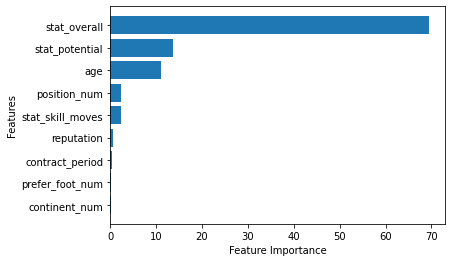

In [124]:
features = sorted_col[-9:]
feature_imp = sorted_imp[-9:]

import matplotlib.pyplot as plt

plt.barh(features, feature_imp)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.show()

### 어떤 경우던지 부분의존도를 그릴 수 있는 맞춤형 partial_dependency 함수 제공
- model : 적용할 모형
- X : 학습 데이터
- features : X에 있는 모든 특성변수의 수
- f_id : 부분의존도를 구하고 싶은 특성변수의 Index

※ partial_dependency 함수 내의 grid를 살펴보면 f_id에 지정된 특성변수의 0.1% 분위수부터 99.5% 분위수까지 50등분한 것을 볼 수 있음.

- f_id에 지정된 특성변수는 실수값을 갖는 특성변수에만 적용됨.
- 그러나 범주형 특성변수일 경우에도 아래 프로그램을 조금만 수정하면 맞춤형 부분의존도를 구할 수 있을 것임.

In [125]:
import numpy as np

def partial_dependency(model, X, features, f_id):
    X_temp = X.copy()
    grid = np.linspace(np.percentile(X_temp.iloc[:, f_id], 0.1),
                      np.percentile(X_temp.iloc[:, f_id], 99.5),
                      50)
    y_pred = np.zeros(len(grid))
    
    for i, val in enumerate(grid):
        X_temp.iloc[:, f_id] = val
        y_pred[i] = model.predict(X_temp.iloc[:, :features]).mean()
        
    return grid, y_pred

In [126]:
features = X_train.shape[1]

f_id = 3
grid, y_pred = partial_dependency(cat_reg, X_train, features, f_id=f_id)
print(grid)
print(y_pred)

[1.         1.06122449 1.12244898 1.18367347 1.24489796 1.30612245
 1.36734694 1.42857143 1.48979592 1.55102041 1.6122449  1.67346939
 1.73469388 1.79591837 1.85714286 1.91836735 1.97959184 2.04081633
 2.10204082 2.16326531 2.2244898  2.28571429 2.34693878 2.40816327
 2.46938776 2.53061224 2.59183673 2.65306122 2.71428571 2.7755102
 2.83673469 2.89795918 2.95918367 3.02040816 3.08163265 3.14285714
 3.20408163 3.26530612 3.32653061 3.3877551  3.44897959 3.51020408
 3.57142857 3.63265306 3.69387755 3.75510204 3.81632653 3.87755102
 3.93877551 4.        ]
[2413905.12465015 2413905.12465015 2413905.12465015 2413905.12465015
 2413905.12465015 2413905.12465015 2413905.12465015 2413905.12465015
 2413905.12465015 2522812.31181192 2522812.31181192 2522812.31181192
 2522812.31181192 2522812.31181192 2522812.31181192 2522812.31181192
 2522812.31181192 2522812.31181192 2522812.31181192 2522812.31181192
 2522812.31181192 2522812.31181192 2522812.31181192 2522812.31181192
 2522812.31181192 2847291.5

In [128]:
!pip install plotly

In [129]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Scatter(x=grid, y=y_pred))
fig.show()

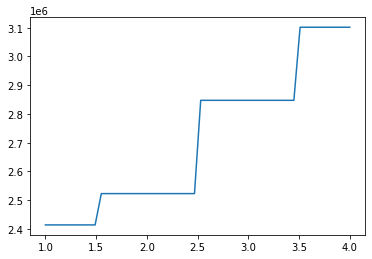

In [130]:
import matplotlib.pyplot as plt
plt.plot(grid, y_pred)

### 실제적인 모형 성능의 비교를 위한 교차 검증
### Cross-Validation

### 기본적인 선형회귀모형

In [132]:
from sklearn.model_selection import cross_val_score

lin_reg = LinearRegression()
svl = SVR(kernel='linear')
svr = SVR(kernel='rbf')

scores_lin = cross_val_score(lin_reg, X, y, scoring='neg_mean_squared_error', cv=10)
scores_svl = cross_val_score(svl, X, y, scoring='neg_mean_squared_error', cv=10)
scores_svr = cross_val_score(svr, X, y, scoring='neg_mean_squared_error', cv=10)

rmse_lin = np.sqrt(-scores_lin)
rmse_svl = np.sqrt(-scores_svl)
rmse_svr = np.sqrt(-scores_svr)

print('Reg RMSE : ', np.round(rmse_lin, 2))
print('SVM_linear RMSE : ', np.round(rmse_svl, 2))
print('SVM_rbf RMSE : ', np.round(rmse_svr, 2))
print('RMSE_lin mean : %.2f' % (rmse_lin.mean()))
print('RMSE_svl mean : %.2f' % (rmse_svl.mean()))
print('RMSE_svr mean : %.2f' % (rmse_svr.mean()))

Reg RMSE :  [14432018.7   3282695.77  2264954.17  2098673.24  1851574.07  1727548.89
  1543557.02  1602189.14  1492804.9   4637728.1 ]
SVM_linear RMSE :  [18111163.29  4647496.83  1996602.52   801584.98   269280.22   217845.01
   231226.02   260433.89   300719.86   262598.71]
SVM_rbf RMSE :  [18717767.9   5067611.59  2309533.26  1008725.68   359702.1    287208.27
   393577.33   535719.02   657785.7    821476.58]
RMSE_lin mean : 3493374.40
RMSE_svl mean : 2709895.13
RMSE_svr mean : 3015910.74


### XGBoost, LightGBM, CatBoost

In [133]:
xg_reg = XGBRegressor()
lgbm_reg = LGBMRegressor()
cat_reg = CatBoostRegressor()

scores_xg = cross_val_score(xg_reg, X, y, scoring='neg_mean_squared_error', cv=10)
scores_lgb = cross_val_score(lgbm_reg, X, y, scoring='neg_mean_squared_error', cv=10)
scores_cat = cross_val_score(cat_reg, X, y, scoring='neg_mean_squared_error', cv=10)

rmse_xg = np.sqrt(-scores_xg)
rmse_lgb = np.sqrt(-scores_lgb)
rmse_cat = np.sqrt(-scores_cat)

print('XGB RMSE:', np.round(rmse_xg, 2))
print('LGBM RMSE:', np.round(rmse_lgb, 2))
print('Cat RMSE:', np.round(rmse_cat, 2))

print('XGB_RMSE mean: %.2f' % (rmse_xg.mean()))
print('LGBM_RMSE mean: %.2f' % (rmse_lgb.mean()))
print('Cat_RMSE mean: %.2f' % (rmse_cat.mean()))

Learning rate set to 0.056911
0:	learn: 1701141.2257308	total: 1.83ms	remaining: 1.83s
1:	learn: 1618959.4977237	total: 3.66ms	remaining: 1.82s
2:	learn: 1535844.6735731	total: 5.62ms	remaining: 1.87s
3:	learn: 1460101.0378185	total: 7.45ms	remaining: 1.85s
4:	learn: 1388905.1452748	total: 9.32ms	remaining: 1.85s
5:	learn: 1320911.5232541	total: 11.2ms	remaining: 1.86s
6:	learn: 1255931.1508955	total: 13.1ms	remaining: 1.86s
7:	learn: 1199093.7940315	total: 15ms	remaining: 1.86s
8:	learn: 1139929.5659222	total: 16.9ms	remaining: 1.86s
9:	learn: 1084917.8661331	total: 18.7ms	remaining: 1.85s
10:	learn: 1033433.8001851	total: 20.6ms	remaining: 1.85s
11:	learn: 985257.2285964	total: 22.5ms	remaining: 1.85s
12:	learn: 939462.8510614	total: 24.4ms	remaining: 1.85s
13:	learn: 895843.5211108	total: 26.3ms	remaining: 1.85s
14:	learn: 853977.3527041	total: 28.1ms	remaining: 1.84s
15:	learn: 815225.4279502	total: 30ms	remaining: 1.84s
16:	learn: 778666.7175236	total: 31.9ms	remaining: 1.84s
17:	

208:	learn: 115767.6564944	total: 329ms	remaining: 1.24s
209:	learn: 115689.8490432	total: 331ms	remaining: 1.24s
210:	learn: 115521.6244737	total: 332ms	remaining: 1.24s
211:	learn: 115420.1703356	total: 334ms	remaining: 1.24s
212:	learn: 115340.1331811	total: 335ms	remaining: 1.24s
213:	learn: 115275.4112437	total: 337ms	remaining: 1.24s
214:	learn: 115109.7839823	total: 338ms	remaining: 1.23s
215:	learn: 114912.7499821	total: 340ms	remaining: 1.23s
216:	learn: 114768.1528861	total: 341ms	remaining: 1.23s
217:	learn: 114720.2538262	total: 343ms	remaining: 1.23s
218:	learn: 114639.4410029	total: 345ms	remaining: 1.23s
219:	learn: 114560.4687956	total: 346ms	remaining: 1.23s
220:	learn: 114488.9196274	total: 348ms	remaining: 1.23s
221:	learn: 114404.2964663	total: 350ms	remaining: 1.23s
222:	learn: 114281.2842880	total: 352ms	remaining: 1.23s
223:	learn: 114131.8793378	total: 354ms	remaining: 1.23s
224:	learn: 114026.0087841	total: 356ms	remaining: 1.23s
225:	learn: 113916.9147748	tota

400:	learn: 103575.5389303	total: 668ms	remaining: 998ms
401:	learn: 103506.1427858	total: 670ms	remaining: 996ms
402:	learn: 103436.9274452	total: 671ms	remaining: 995ms
403:	learn: 103432.7483608	total: 673ms	remaining: 993ms
404:	learn: 103405.0577551	total: 675ms	remaining: 992ms
405:	learn: 103392.0414387	total: 676ms	remaining: 990ms
406:	learn: 103319.7028250	total: 678ms	remaining: 988ms
407:	learn: 103291.1645688	total: 679ms	remaining: 986ms
408:	learn: 103261.6954954	total: 681ms	remaining: 984ms
409:	learn: 103236.1570330	total: 682ms	remaining: 982ms
410:	learn: 103177.7366474	total: 684ms	remaining: 981ms
411:	learn: 103134.1039319	total: 686ms	remaining: 979ms
412:	learn: 103076.8204176	total: 688ms	remaining: 978ms
413:	learn: 103010.2372166	total: 690ms	remaining: 977ms
414:	learn: 102983.4811393	total: 692ms	remaining: 976ms
415:	learn: 102961.2243369	total: 694ms	remaining: 974ms
416:	learn: 102921.4475516	total: 696ms	remaining: 972ms
417:	learn: 102914.6891556	tota

602:	learn: 96261.9391585	total: 1.01s	remaining: 665ms
603:	learn: 96224.5587024	total: 1.01s	remaining: 663ms
604:	learn: 96204.4216892	total: 1.01s	remaining: 662ms
605:	learn: 96181.0773690	total: 1.01s	remaining: 660ms
606:	learn: 96167.1138605	total: 1.02s	remaining: 658ms
607:	learn: 96147.7263872	total: 1.02s	remaining: 657ms
608:	learn: 96078.2982076	total: 1.02s	remaining: 656ms
609:	learn: 96032.0814596	total: 1.02s	remaining: 654ms
610:	learn: 95960.1096311	total: 1.02s	remaining: 652ms
611:	learn: 95950.6017450	total: 1.02s	remaining: 650ms
612:	learn: 95885.1758341	total: 1.03s	remaining: 649ms
613:	learn: 95869.6491290	total: 1.03s	remaining: 647ms
614:	learn: 95850.9557174	total: 1.03s	remaining: 645ms
615:	learn: 95833.1618352	total: 1.03s	remaining: 643ms
616:	learn: 95819.6882996	total: 1.03s	remaining: 641ms
617:	learn: 95812.3832641	total: 1.03s	remaining: 640ms
618:	learn: 95789.8253215	total: 1.04s	remaining: 638ms
619:	learn: 95775.1544616	total: 1.04s	remaining

790:	learn: 91792.7804825	total: 1.34s	remaining: 355ms
791:	learn: 91766.6029405	total: 1.34s	remaining: 353ms
792:	learn: 91740.1199652	total: 1.35s	remaining: 352ms
793:	learn: 91683.8026854	total: 1.35s	remaining: 350ms
794:	learn: 91669.0978921	total: 1.35s	remaining: 348ms
795:	learn: 91649.6743776	total: 1.35s	remaining: 347ms
796:	learn: 91622.2531226	total: 1.35s	remaining: 345ms
797:	learn: 91607.3223059	total: 1.35s	remaining: 343ms
798:	learn: 91597.9048096	total: 1.36s	remaining: 341ms
799:	learn: 91589.1004606	total: 1.36s	remaining: 340ms
800:	learn: 91576.1138476	total: 1.36s	remaining: 338ms
801:	learn: 91564.0817409	total: 1.36s	remaining: 337ms
802:	learn: 91552.9255974	total: 1.36s	remaining: 335ms
803:	learn: 91528.7898013	total: 1.37s	remaining: 333ms
804:	learn: 91517.8800896	total: 1.37s	remaining: 332ms
805:	learn: 91503.5840260	total: 1.37s	remaining: 330ms
806:	learn: 91493.1847021	total: 1.37s	remaining: 328ms
807:	learn: 91476.8152609	total: 1.38s	remaining

991:	learn: 88660.1653161	total: 1.68s	remaining: 13.5ms
992:	learn: 88641.3100609	total: 1.68s	remaining: 11.9ms
993:	learn: 88638.7753508	total: 1.68s	remaining: 10.2ms
994:	learn: 88607.5188326	total: 1.69s	remaining: 8.47ms
995:	learn: 88593.4302169	total: 1.69s	remaining: 6.78ms
996:	learn: 88576.9072869	total: 1.69s	remaining: 5.08ms
997:	learn: 88565.3179381	total: 1.69s	remaining: 3.39ms
998:	learn: 88544.4205978	total: 1.69s	remaining: 1.69ms
999:	learn: 88529.3288319	total: 1.7s	remaining: 0us
Learning rate set to 0.056911
0:	learn: 5781895.1107627	total: 1.55ms	remaining: 1.55s
1:	learn: 5513008.7906939	total: 3.1ms	remaining: 1.55s
2:	learn: 5256401.2475999	total: 5.59ms	remaining: 1.86s
3:	learn: 5021272.7303655	total: 7.55ms	remaining: 1.88s
4:	learn: 4783904.2471844	total: 9.06ms	remaining: 1.8s
5:	learn: 4558464.8826885	total: 10.8ms	remaining: 1.79s
6:	learn: 4358121.0976309	total: 12.5ms	remaining: 1.77s
7:	learn: 4172982.4219837	total: 14.1ms	remaining: 1.75s
8:	lear

181:	learn: 409483.8718512	total: 283ms	remaining: 1.27s
182:	learn: 409167.5449622	total: 284ms	remaining: 1.27s
183:	learn: 406958.6243756	total: 286ms	remaining: 1.27s
184:	learn: 405098.1203376	total: 287ms	remaining: 1.27s
185:	learn: 402759.0807279	total: 289ms	remaining: 1.26s
186:	learn: 402154.3205904	total: 290ms	remaining: 1.26s
187:	learn: 401877.6539712	total: 292ms	remaining: 1.26s
188:	learn: 400342.3511990	total: 293ms	remaining: 1.26s
189:	learn: 398634.9783405	total: 295ms	remaining: 1.26s
190:	learn: 398112.8295768	total: 296ms	remaining: 1.25s
191:	learn: 397271.6849103	total: 298ms	remaining: 1.25s
192:	learn: 396997.7535919	total: 299ms	remaining: 1.25s
193:	learn: 396614.0909930	total: 301ms	remaining: 1.25s
194:	learn: 394505.5469213	total: 303ms	remaining: 1.25s
195:	learn: 392869.7281086	total: 305ms	remaining: 1.25s
196:	learn: 390815.8486558	total: 306ms	remaining: 1.25s
197:	learn: 390093.1344075	total: 307ms	remaining: 1.24s
198:	learn: 388525.9354261	tota

390:	learn: 260604.7773967	total: 622ms	remaining: 969ms
391:	learn: 260125.5441241	total: 624ms	remaining: 968ms
392:	learn: 259689.7576886	total: 626ms	remaining: 967ms
393:	learn: 259351.8516550	total: 628ms	remaining: 965ms
394:	learn: 259311.2427146	total: 629ms	remaining: 964ms
395:	learn: 258870.8680018	total: 631ms	remaining: 962ms
396:	learn: 258464.4081206	total: 633ms	remaining: 961ms
397:	learn: 258200.6234578	total: 635ms	remaining: 960ms
398:	learn: 257802.0912931	total: 636ms	remaining: 958ms
399:	learn: 257359.5357159	total: 638ms	remaining: 957ms
400:	learn: 256907.7300901	total: 639ms	remaining: 955ms
401:	learn: 256673.2282807	total: 641ms	remaining: 954ms
402:	learn: 256271.9304660	total: 643ms	remaining: 952ms
403:	learn: 255885.3147910	total: 644ms	remaining: 951ms
404:	learn: 255300.0772554	total: 646ms	remaining: 949ms
405:	learn: 255052.6324130	total: 648ms	remaining: 948ms
406:	learn: 254707.2573360	total: 650ms	remaining: 946ms
407:	learn: 254387.9076999	tota

577:	learn: 215138.6270926	total: 957ms	remaining: 699ms
578:	learn: 215024.1476794	total: 959ms	remaining: 697ms
579:	learn: 214975.0505061	total: 960ms	remaining: 695ms
580:	learn: 214643.8073226	total: 962ms	remaining: 694ms
581:	learn: 214596.9880881	total: 965ms	remaining: 693ms
582:	learn: 214516.2331159	total: 966ms	remaining: 691ms
583:	learn: 214206.6071635	total: 968ms	remaining: 689ms
584:	learn: 213915.8572337	total: 969ms	remaining: 688ms
585:	learn: 213897.1078016	total: 971ms	remaining: 686ms
586:	learn: 213754.9666715	total: 973ms	remaining: 684ms
587:	learn: 213503.9004186	total: 975ms	remaining: 683ms
588:	learn: 213418.5304744	total: 976ms	remaining: 681ms
589:	learn: 213401.6017422	total: 978ms	remaining: 680ms
590:	learn: 213385.1662130	total: 980ms	remaining: 678ms
591:	learn: 213375.8104080	total: 981ms	remaining: 676ms
592:	learn: 213361.4482417	total: 984ms	remaining: 675ms
593:	learn: 213217.0846766	total: 985ms	remaining: 673ms
594:	learn: 212981.2958980	tota

774:	learn: 190360.9161835	total: 1.29s	remaining: 376ms
775:	learn: 190152.0583923	total: 1.3s	remaining: 375ms
776:	learn: 190054.3172959	total: 1.3s	remaining: 373ms
777:	learn: 189945.9559876	total: 1.3s	remaining: 371ms
778:	learn: 189743.1020393	total: 1.3s	remaining: 370ms
779:	learn: 189643.4505401	total: 1.3s	remaining: 368ms
780:	learn: 189411.7367873	total: 1.31s	remaining: 366ms
781:	learn: 189194.8416210	total: 1.31s	remaining: 365ms
782:	learn: 189131.5098352	total: 1.31s	remaining: 363ms
783:	learn: 189046.1663660	total: 1.31s	remaining: 361ms
784:	learn: 189006.3394964	total: 1.31s	remaining: 360ms
785:	learn: 188961.7676514	total: 1.31s	remaining: 358ms
786:	learn: 188924.9521017	total: 1.32s	remaining: 356ms
787:	learn: 188862.1875718	total: 1.32s	remaining: 355ms
788:	learn: 188827.2586685	total: 1.32s	remaining: 353ms
789:	learn: 188786.9393189	total: 1.32s	remaining: 351ms
790:	learn: 188733.1146671	total: 1.32s	remaining: 350ms
791:	learn: 188676.2607281	total: 1.

978:	learn: 170731.9045761	total: 1.63s	remaining: 35ms
979:	learn: 170526.9492086	total: 1.63s	remaining: 33.3ms
980:	learn: 170340.1410562	total: 1.63s	remaining: 31.6ms
981:	learn: 170238.3330349	total: 1.64s	remaining: 30ms
982:	learn: 170171.7086058	total: 1.64s	remaining: 28.3ms
983:	learn: 170099.0736909	total: 1.64s	remaining: 26.6ms
984:	learn: 170029.9914857	total: 1.64s	remaining: 25ms
985:	learn: 169996.2940233	total: 1.64s	remaining: 23.3ms
986:	learn: 169910.3009131	total: 1.64s	remaining: 21.6ms
987:	learn: 169884.7008668	total: 1.64s	remaining: 20ms
988:	learn: 169841.1022849	total: 1.65s	remaining: 18.3ms
989:	learn: 169770.9698914	total: 1.65s	remaining: 16.6ms
990:	learn: 169715.1560184	total: 1.65s	remaining: 15ms
991:	learn: 169712.0687366	total: 1.65s	remaining: 13.3ms
992:	learn: 169641.4358355	total: 1.65s	remaining: 11.6ms
993:	learn: 169619.8716833	total: 1.65s	remaining: 9.98ms
994:	learn: 169581.3247727	total: 1.66s	remaining: 8.32ms
995:	learn: 169474.15102

165:	learn: 459476.0864484	total: 267ms	remaining: 1.34s
166:	learn: 456004.8978268	total: 270ms	remaining: 1.35s
167:	learn: 452971.4791420	total: 272ms	remaining: 1.35s
168:	learn: 449764.6398121	total: 274ms	remaining: 1.34s
169:	learn: 449239.3029041	total: 275ms	remaining: 1.34s
170:	learn: 445971.5199662	total: 277ms	remaining: 1.34s
171:	learn: 445109.2076183	total: 278ms	remaining: 1.34s
172:	learn: 443964.7350249	total: 280ms	remaining: 1.34s
173:	learn: 441333.7296800	total: 281ms	remaining: 1.33s
174:	learn: 439999.5824444	total: 283ms	remaining: 1.33s
175:	learn: 437848.7886434	total: 285ms	remaining: 1.33s
176:	learn: 437434.7303774	total: 286ms	remaining: 1.33s
177:	learn: 436951.3745342	total: 288ms	remaining: 1.33s
178:	learn: 436640.0588625	total: 289ms	remaining: 1.32s
179:	learn: 436206.6181101	total: 290ms	remaining: 1.32s
180:	learn: 435790.1040977	total: 291ms	remaining: 1.32s
181:	learn: 434052.4510244	total: 293ms	remaining: 1.31s
182:	learn: 433212.9933435	tota

371:	learn: 283998.6067250	total: 603ms	remaining: 1.02s
372:	learn: 282955.9025761	total: 604ms	remaining: 1.02s
373:	learn: 282862.0481431	total: 606ms	remaining: 1.01s
374:	learn: 282626.5069704	total: 608ms	remaining: 1.01s
375:	learn: 282261.9058411	total: 609ms	remaining: 1.01s
376:	learn: 282174.9103790	total: 611ms	remaining: 1.01s
377:	learn: 282090.4438545	total: 612ms	remaining: 1.01s
378:	learn: 281472.8983077	total: 614ms	remaining: 1s
379:	learn: 280984.1840758	total: 615ms	remaining: 1s
380:	learn: 280091.6834141	total: 617ms	remaining: 1s
381:	learn: 279601.4952241	total: 619ms	remaining: 1s
382:	learn: 278694.5172401	total: 621ms	remaining: 1000ms
383:	learn: 278245.2816802	total: 622ms	remaining: 998ms
384:	learn: 277937.1988613	total: 624ms	remaining: 997ms
385:	learn: 277465.8921665	total: 625ms	remaining: 994ms
386:	learn: 276630.5748765	total: 627ms	remaining: 993ms
387:	learn: 276348.9700990	total: 629ms	remaining: 991ms
388:	learn: 275995.5375597	total: 630ms	re

578:	learn: 228473.2592313	total: 940ms	remaining: 684ms
579:	learn: 228251.7593916	total: 942ms	remaining: 682ms
580:	learn: 228131.1255496	total: 944ms	remaining: 681ms
581:	learn: 227908.9986008	total: 946ms	remaining: 679ms
582:	learn: 227698.4890588	total: 947ms	remaining: 677ms
583:	learn: 227430.6034001	total: 949ms	remaining: 676ms
584:	learn: 227303.1174919	total: 950ms	remaining: 674ms
585:	learn: 227153.5723469	total: 951ms	remaining: 672ms
586:	learn: 226977.6552402	total: 953ms	remaining: 670ms
587:	learn: 226779.2333348	total: 955ms	remaining: 669ms
588:	learn: 226538.8017310	total: 956ms	remaining: 667ms
589:	learn: 226383.7806281	total: 958ms	remaining: 666ms
590:	learn: 226189.0262010	total: 960ms	remaining: 664ms
591:	learn: 226074.3016287	total: 961ms	remaining: 663ms
592:	learn: 226069.2040250	total: 963ms	remaining: 661ms
593:	learn: 226064.2512375	total: 964ms	remaining: 659ms
594:	learn: 225897.4695379	total: 965ms	remaining: 657ms
595:	learn: 225796.7827227	tota

779:	learn: 204407.6170871	total: 1.28s	remaining: 363ms
780:	learn: 204349.8291596	total: 1.29s	remaining: 361ms
781:	learn: 204161.9563256	total: 1.29s	remaining: 360ms
782:	learn: 204077.6569152	total: 1.29s	remaining: 359ms
783:	learn: 203909.2311279	total: 1.3s	remaining: 358ms
784:	learn: 203626.6425546	total: 1.3s	remaining: 356ms
785:	learn: 203538.3887663	total: 1.3s	remaining: 355ms
786:	learn: 203452.7410875	total: 1.3s	remaining: 353ms
787:	learn: 203375.3697298	total: 1.31s	remaining: 352ms
788:	learn: 203112.0792194	total: 1.31s	remaining: 350ms
789:	learn: 202867.5922881	total: 1.31s	remaining: 349ms
790:	learn: 202741.2603619	total: 1.31s	remaining: 347ms
791:	learn: 202512.7148159	total: 1.31s	remaining: 345ms
792:	learn: 202356.0438833	total: 1.32s	remaining: 344ms
793:	learn: 202251.1713891	total: 1.32s	remaining: 342ms
794:	learn: 202038.1085546	total: 1.32s	remaining: 341ms
795:	learn: 201967.1516335	total: 1.32s	remaining: 339ms
796:	learn: 201930.9091120	total: 1

944:	learn: 190273.8669426	total: 1.62s	remaining: 94.1ms
945:	learn: 190099.4798969	total: 1.62s	remaining: 92.5ms
946:	learn: 190079.2215926	total: 1.62s	remaining: 90.8ms
947:	learn: 189977.6041932	total: 1.62s	remaining: 89.1ms
948:	learn: 189882.5693957	total: 1.63s	remaining: 87.3ms
949:	learn: 189835.7280278	total: 1.63s	remaining: 85.6ms
950:	learn: 189660.3961400	total: 1.63s	remaining: 83.9ms
951:	learn: 189571.7539597	total: 1.63s	remaining: 82.2ms
952:	learn: 189503.8172106	total: 1.63s	remaining: 80.5ms
953:	learn: 189437.6171590	total: 1.63s	remaining: 78.8ms
954:	learn: 189418.8883802	total: 1.64s	remaining: 77.1ms
955:	learn: 189405.3431832	total: 1.64s	remaining: 75.4ms
956:	learn: 189348.2634896	total: 1.64s	remaining: 73.7ms
957:	learn: 189275.3991601	total: 1.64s	remaining: 72ms
958:	learn: 189206.6099090	total: 1.64s	remaining: 70.3ms
959:	learn: 189188.9519927	total: 1.65s	remaining: 68.6ms
960:	learn: 189141.1096414	total: 1.65s	remaining: 66.9ms
961:	learn: 1891

125:	learn: 552733.9419175	total: 190ms	remaining: 1.31s
126:	learn: 551774.2606084	total: 191ms	remaining: 1.31s
127:	learn: 547079.6238520	total: 193ms	remaining: 1.31s
128:	learn: 546138.2762862	total: 194ms	remaining: 1.31s
129:	learn: 540584.2546232	total: 195ms	remaining: 1.31s
130:	learn: 539419.4515657	total: 197ms	remaining: 1.3s
131:	learn: 536741.9876259	total: 198ms	remaining: 1.3s
132:	learn: 534714.7427602	total: 200ms	remaining: 1.3s
133:	learn: 531974.3165097	total: 201ms	remaining: 1.3s
134:	learn: 531098.1147162	total: 203ms	remaining: 1.3s
135:	learn: 530402.7378711	total: 204ms	remaining: 1.3s
136:	learn: 526250.3430714	total: 206ms	remaining: 1.3s
137:	learn: 523617.4979152	total: 208ms	remaining: 1.3s
138:	learn: 522080.1100840	total: 209ms	remaining: 1.29s
139:	learn: 521251.1767429	total: 210ms	remaining: 1.29s
140:	learn: 520332.6615772	total: 212ms	remaining: 1.29s
141:	learn: 514512.8351998	total: 213ms	remaining: 1.29s
142:	learn: 512962.9047816	total: 215ms

363:	learn: 302028.5056467	total: 531ms	remaining: 929ms
364:	learn: 301278.5054331	total: 533ms	remaining: 928ms
365:	learn: 300876.7552525	total: 535ms	remaining: 927ms
366:	learn: 300621.6154700	total: 537ms	remaining: 926ms
367:	learn: 300015.7841971	total: 538ms	remaining: 925ms
368:	learn: 299974.8610318	total: 540ms	remaining: 923ms
369:	learn: 299320.1110328	total: 541ms	remaining: 922ms
370:	learn: 298849.2652238	total: 543ms	remaining: 920ms
371:	learn: 298810.2395211	total: 544ms	remaining: 919ms
372:	learn: 298394.7061280	total: 546ms	remaining: 917ms
373:	learn: 298088.5286168	total: 548ms	remaining: 917ms
374:	learn: 297668.7970083	total: 550ms	remaining: 916ms
375:	learn: 297631.3865307	total: 551ms	remaining: 915ms
376:	learn: 297595.4922224	total: 553ms	remaining: 913ms
377:	learn: 297026.7622410	total: 554ms	remaining: 912ms
378:	learn: 296425.3080080	total: 555ms	remaining: 910ms
379:	learn: 295858.7044526	total: 557ms	remaining: 909ms
380:	learn: 295604.5639314	tota

571:	learn: 239955.9135283	total: 871ms	remaining: 652ms
572:	learn: 239786.0173818	total: 873ms	remaining: 651ms
573:	learn: 239631.5076685	total: 875ms	remaining: 649ms
574:	learn: 239527.8719851	total: 876ms	remaining: 648ms
575:	learn: 239404.5271609	total: 878ms	remaining: 646ms
576:	learn: 239293.8291934	total: 879ms	remaining: 645ms
577:	learn: 239109.6036670	total: 881ms	remaining: 643ms
578:	learn: 238920.5210914	total: 882ms	remaining: 642ms
579:	learn: 238684.9103833	total: 884ms	remaining: 640ms
580:	learn: 238577.6118222	total: 885ms	remaining: 638ms
581:	learn: 238382.7469375	total: 887ms	remaining: 637ms
582:	learn: 238278.1080790	total: 889ms	remaining: 636ms
583:	learn: 237924.3751005	total: 891ms	remaining: 634ms
584:	learn: 237755.1039468	total: 892ms	remaining: 633ms
585:	learn: 237613.7694720	total: 894ms	remaining: 631ms
586:	learn: 237349.9160685	total: 895ms	remaining: 630ms
587:	learn: 237156.5145057	total: 897ms	remaining: 629ms
588:	learn: 236970.4378208	tota

791:	learn: 211348.8778648	total: 1.21s	remaining: 318ms
792:	learn: 211283.3530625	total: 1.21s	remaining: 316ms
793:	learn: 211229.5436357	total: 1.21s	remaining: 315ms
794:	learn: 211194.4651102	total: 1.22s	remaining: 313ms
795:	learn: 211011.0449628	total: 1.22s	remaining: 312ms
796:	learn: 210883.5790743	total: 1.22s	remaining: 310ms
797:	learn: 210792.7901283	total: 1.22s	remaining: 309ms
798:	learn: 210671.5638697	total: 1.22s	remaining: 307ms
799:	learn: 210551.3825352	total: 1.22s	remaining: 306ms
800:	learn: 210323.7956751	total: 1.22s	remaining: 304ms
801:	learn: 210286.4996106	total: 1.23s	remaining: 303ms
802:	learn: 209942.0155029	total: 1.23s	remaining: 301ms
803:	learn: 209871.1871028	total: 1.23s	remaining: 300ms
804:	learn: 209831.5437497	total: 1.23s	remaining: 298ms
805:	learn: 209810.7415849	total: 1.23s	remaining: 297ms
806:	learn: 209760.2974024	total: 1.23s	remaining: 295ms
807:	learn: 209557.9613762	total: 1.24s	remaining: 294ms
808:	learn: 209389.8857185	tota

Learning rate set to 0.056912
0:	learn: 5847360.1918589	total: 19.4ms	remaining: 19.4s
1:	learn: 5606247.5574306	total: 25ms	remaining: 12.5s
2:	learn: 5348343.0296140	total: 31.2ms	remaining: 10.4s
3:	learn: 5119250.5832643	total: 36.4ms	remaining: 9.06s
4:	learn: 4884592.8089356	total: 40.1ms	remaining: 7.98s
5:	learn: 4665482.1648616	total: 43.5ms	remaining: 7.21s
6:	learn: 4452566.9937982	total: 46.5ms	remaining: 6.6s
7:	learn: 4260725.1404456	total: 49.2ms	remaining: 6.09s
8:	learn: 4071481.7409012	total: 51.7ms	remaining: 5.69s
9:	learn: 3905447.7518849	total: 53.9ms	remaining: 5.34s
10:	learn: 3737016.6875555	total: 55.9ms	remaining: 5.02s
11:	learn: 3567086.2075974	total: 58ms	remaining: 4.78s
12:	learn: 3421382.1460264	total: 59.8ms	remaining: 4.54s
13:	learn: 3281536.8153488	total: 61.7ms	remaining: 4.34s
14:	learn: 3139802.7194083	total: 63.4ms	remaining: 4.16s
15:	learn: 3011437.4000595	total: 65.5ms	remaining: 4.03s
16:	learn: 2890326.0477504	total: 67.5ms	remaining: 3.9s


181:	learn: 443072.8970196	total: 335ms	remaining: 1.51s
182:	learn: 441078.4673386	total: 337ms	remaining: 1.5s
183:	learn: 440314.8572618	total: 339ms	remaining: 1.5s
184:	learn: 439270.9903153	total: 341ms	remaining: 1.5s
185:	learn: 436839.9795662	total: 343ms	remaining: 1.5s
186:	learn: 436504.7032548	total: 344ms	remaining: 1.5s
187:	learn: 436147.1710859	total: 346ms	remaining: 1.49s
188:	learn: 433462.4424070	total: 347ms	remaining: 1.49s
189:	learn: 432510.5132347	total: 349ms	remaining: 1.49s
190:	learn: 431506.6657304	total: 350ms	remaining: 1.48s
191:	learn: 430629.9804277	total: 352ms	remaining: 1.48s
192:	learn: 428135.4046201	total: 353ms	remaining: 1.48s
193:	learn: 425270.2826255	total: 355ms	remaining: 1.47s
194:	learn: 424071.5181207	total: 357ms	remaining: 1.47s
195:	learn: 423218.3742747	total: 359ms	remaining: 1.47s
196:	learn: 422948.7549078	total: 360ms	remaining: 1.47s
197:	learn: 422062.1984787	total: 362ms	remaining: 1.47s
198:	learn: 421305.4824449	total: 36

394:	learn: 287587.6077938	total: 674ms	remaining: 1.03s
395:	learn: 286950.9685629	total: 676ms	remaining: 1.03s
396:	learn: 286689.7944355	total: 678ms	remaining: 1.03s
397:	learn: 286147.0969153	total: 680ms	remaining: 1.03s
398:	learn: 286027.3443739	total: 681ms	remaining: 1.02s
399:	learn: 285657.4879719	total: 682ms	remaining: 1.02s
400:	learn: 285345.1287153	total: 684ms	remaining: 1.02s
401:	learn: 285111.5029151	total: 685ms	remaining: 1.02s
402:	learn: 284271.7631997	total: 687ms	remaining: 1.02s
403:	learn: 283986.4547843	total: 689ms	remaining: 1.02s
404:	learn: 283555.1054775	total: 691ms	remaining: 1.01s
405:	learn: 283389.8355484	total: 694ms	remaining: 1.01s
406:	learn: 283352.7587939	total: 696ms	remaining: 1.01s
407:	learn: 283293.6487009	total: 698ms	remaining: 1.01s
408:	learn: 283239.8366891	total: 700ms	remaining: 1.01s
409:	learn: 282843.6375753	total: 701ms	remaining: 1.01s
410:	learn: 282461.6524960	total: 703ms	remaining: 1.01s
411:	learn: 282114.5508877	tota

611:	learn: 235222.9994605	total: 1.02s	remaining: 644ms
612:	learn: 235090.7513067	total: 1.02s	remaining: 643ms
613:	learn: 235015.3552956	total: 1.02s	remaining: 641ms
614:	learn: 234912.5933101	total: 1.02s	remaining: 639ms
615:	learn: 234623.1993941	total: 1.02s	remaining: 637ms
616:	learn: 234502.7738518	total: 1.02s	remaining: 635ms
617:	learn: 234424.4057488	total: 1.02s	remaining: 634ms
618:	learn: 234227.6204657	total: 1.03s	remaining: 632ms
619:	learn: 234102.9222298	total: 1.03s	remaining: 630ms
620:	learn: 233974.9716544	total: 1.03s	remaining: 628ms
621:	learn: 233845.4932846	total: 1.03s	remaining: 627ms
622:	learn: 233732.5877946	total: 1.03s	remaining: 625ms
623:	learn: 233447.8693631	total: 1.03s	remaining: 623ms
624:	learn: 233353.1686325	total: 1.04s	remaining: 622ms
625:	learn: 233194.9320760	total: 1.04s	remaining: 620ms
626:	learn: 233043.3441624	total: 1.04s	remaining: 618ms
627:	learn: 232988.5565891	total: 1.04s	remaining: 617ms
628:	learn: 232951.2224800	tota

820:	learn: 211429.7664298	total: 1.35s	remaining: 295ms
821:	learn: 211309.4336174	total: 1.36s	remaining: 294ms
822:	learn: 211178.5314121	total: 1.36s	remaining: 292ms
823:	learn: 211077.5065812	total: 1.36s	remaining: 290ms
824:	learn: 211006.0833518	total: 1.36s	remaining: 289ms
825:	learn: 210757.8168605	total: 1.36s	remaining: 287ms
826:	learn: 210676.1419832	total: 1.36s	remaining: 285ms
827:	learn: 210605.1433468	total: 1.36s	remaining: 284ms
828:	learn: 210494.7282213	total: 1.37s	remaining: 282ms
829:	learn: 210391.7635723	total: 1.37s	remaining: 280ms
830:	learn: 210271.5198193	total: 1.37s	remaining: 279ms
831:	learn: 210169.0774680	total: 1.37s	remaining: 277ms
832:	learn: 210017.3759128	total: 1.37s	remaining: 276ms
833:	learn: 209948.5673617	total: 1.38s	remaining: 274ms
834:	learn: 209885.5613610	total: 1.38s	remaining: 272ms
835:	learn: 209826.3234917	total: 1.38s	remaining: 271ms
836:	learn: 209761.1647897	total: 1.38s	remaining: 269ms
837:	learn: 209649.9026028	tota

9:	learn: 3867531.7633998	total: 16.4ms	remaining: 1.62s
10:	learn: 3695817.2179989	total: 18.3ms	remaining: 1.65s
11:	learn: 3540395.8562140	total: 19.9ms	remaining: 1.64s
12:	learn: 3394212.8656261	total: 21.4ms	remaining: 1.62s
13:	learn: 3255740.2438412	total: 23.1ms	remaining: 1.63s
14:	learn: 3128053.5516477	total: 24.6ms	remaining: 1.61s
15:	learn: 3003706.9761642	total: 26.2ms	remaining: 1.61s
16:	learn: 2899953.4554869	total: 27.7ms	remaining: 1.6s
17:	learn: 2784512.1156050	total: 29.1ms	remaining: 1.59s
18:	learn: 2681530.4162869	total: 30.6ms	remaining: 1.58s
19:	learn: 2565406.8485501	total: 32.5ms	remaining: 1.59s
20:	learn: 2468750.5633971	total: 34.2ms	remaining: 1.59s
21:	learn: 2370431.3080703	total: 35.9ms	remaining: 1.59s
22:	learn: 2280497.3021217	total: 37.4ms	remaining: 1.59s
23:	learn: 2192197.3936506	total: 38.9ms	remaining: 1.58s
24:	learn: 2111030.5141741	total: 40.7ms	remaining: 1.58s
25:	learn: 2033828.3859217	total: 42.5ms	remaining: 1.59s
26:	learn: 19591

243:	learn: 369313.2417313	total: 356ms	remaining: 1.1s
244:	learn: 369206.7719450	total: 358ms	remaining: 1.1s
245:	learn: 368127.6581248	total: 359ms	remaining: 1.1s
246:	learn: 367526.1109306	total: 361ms	remaining: 1.1s
247:	learn: 367429.6270559	total: 362ms	remaining: 1.1s
248:	learn: 366764.9269728	total: 363ms	remaining: 1.09s
249:	learn: 366674.3491169	total: 365ms	remaining: 1.09s
250:	learn: 366248.8442151	total: 366ms	remaining: 1.09s
251:	learn: 365419.6458943	total: 368ms	remaining: 1.09s
252:	learn: 364834.0877621	total: 369ms	remaining: 1.09s
253:	learn: 364469.7247876	total: 371ms	remaining: 1.09s
254:	learn: 363732.3806252	total: 372ms	remaining: 1.09s
255:	learn: 362306.8210452	total: 374ms	remaining: 1.09s
256:	learn: 361685.3516785	total: 376ms	remaining: 1.09s
257:	learn: 360676.6086138	total: 378ms	remaining: 1.09s
258:	learn: 359872.9756195	total: 379ms	remaining: 1.08s
259:	learn: 358682.6411899	total: 381ms	remaining: 1.08s
260:	learn: 357603.9094754	total: 38

466:	learn: 258758.1892798	total: 697ms	remaining: 795ms
467:	learn: 258680.5863804	total: 698ms	remaining: 794ms
468:	learn: 258666.9590216	total: 700ms	remaining: 793ms
469:	learn: 258400.0345831	total: 702ms	remaining: 792ms
470:	learn: 257805.1886256	total: 704ms	remaining: 791ms
471:	learn: 257421.0899377	total: 706ms	remaining: 790ms
472:	learn: 257407.5293974	total: 709ms	remaining: 790ms
473:	learn: 257394.3861954	total: 711ms	remaining: 789ms
474:	learn: 256952.9224683	total: 713ms	remaining: 788ms
475:	learn: 256798.8991405	total: 715ms	remaining: 787ms
476:	learn: 256724.1838640	total: 716ms	remaining: 785ms
477:	learn: 256568.9745330	total: 718ms	remaining: 784ms
478:	learn: 256425.3305682	total: 719ms	remaining: 782ms
479:	learn: 256086.2255634	total: 722ms	remaining: 782ms
480:	learn: 255920.4600066	total: 725ms	remaining: 782ms
481:	learn: 255756.7425018	total: 727ms	remaining: 781ms
482:	learn: 255605.9287738	total: 729ms	remaining: 780ms
483:	learn: 255403.0290047	tota

669:	learn: 224276.3933485	total: 1.03s	remaining: 508ms
670:	learn: 224174.3247394	total: 1.03s	remaining: 507ms
671:	learn: 224170.3467236	total: 1.03s	remaining: 505ms
672:	learn: 224120.1447102	total: 1.04s	remaining: 504ms
673:	learn: 224116.2924627	total: 1.04s	remaining: 502ms
674:	learn: 224023.3750913	total: 1.04s	remaining: 501ms
675:	learn: 223960.0279642	total: 1.04s	remaining: 499ms
676:	learn: 223699.7515680	total: 1.04s	remaining: 498ms
677:	learn: 223508.2981756	total: 1.04s	remaining: 496ms
678:	learn: 223245.7544871	total: 1.05s	remaining: 495ms
679:	learn: 223093.6495165	total: 1.05s	remaining: 493ms
680:	learn: 222855.2617078	total: 1.05s	remaining: 491ms
681:	learn: 222712.0728724	total: 1.05s	remaining: 490ms
682:	learn: 222544.7912479	total: 1.05s	remaining: 489ms
683:	learn: 222351.2503739	total: 1.05s	remaining: 487ms
684:	learn: 222221.9510690	total: 1.06s	remaining: 486ms
685:	learn: 222139.4375403	total: 1.06s	remaining: 484ms
686:	learn: 221933.4203933	tota

905:	learn: 200021.1542237	total: 1.38s	remaining: 143ms
906:	learn: 199935.3047234	total: 1.38s	remaining: 141ms
907:	learn: 199882.1991299	total: 1.38s	remaining: 140ms
908:	learn: 199803.5684015	total: 1.38s	remaining: 138ms
909:	learn: 199738.9360660	total: 1.38s	remaining: 137ms
910:	learn: 199691.5461749	total: 1.38s	remaining: 135ms
911:	learn: 199615.0182058	total: 1.39s	remaining: 134ms
912:	learn: 199510.3026535	total: 1.39s	remaining: 132ms
913:	learn: 199408.9491106	total: 1.39s	remaining: 131ms
914:	learn: 199395.6290104	total: 1.39s	remaining: 129ms
915:	learn: 199315.8655119	total: 1.39s	remaining: 128ms
916:	learn: 199313.7885128	total: 1.39s	remaining: 126ms
917:	learn: 199281.2842484	total: 1.39s	remaining: 125ms
918:	learn: 199192.3792863	total: 1.4s	remaining: 123ms
919:	learn: 199135.4478929	total: 1.4s	remaining: 122ms
920:	learn: 199123.8967502	total: 1.4s	remaining: 120ms
921:	learn: 199111.8935060	total: 1.4s	remaining: 118ms
922:	learn: 198987.1845490	total: 1

100:	learn: 617168.7410778	total: 168ms	remaining: 1.49s
101:	learn: 615506.1771340	total: 170ms	remaining: 1.49s
102:	learn: 613888.4693896	total: 171ms	remaining: 1.49s
103:	learn: 609129.0791932	total: 173ms	remaining: 1.49s
104:	learn: 607656.0493818	total: 175ms	remaining: 1.49s
105:	learn: 600670.4997842	total: 176ms	remaining: 1.49s
106:	learn: 599537.3466536	total: 178ms	remaining: 1.48s
107:	learn: 598135.7350573	total: 179ms	remaining: 1.48s
108:	learn: 594338.7578081	total: 181ms	remaining: 1.48s
109:	learn: 592956.4590644	total: 182ms	remaining: 1.47s
110:	learn: 589694.9036359	total: 183ms	remaining: 1.46s
111:	learn: 588720.0283520	total: 184ms	remaining: 1.46s
112:	learn: 581992.1026667	total: 186ms	remaining: 1.46s
113:	learn: 580738.5129179	total: 187ms	remaining: 1.45s
114:	learn: 575185.8722156	total: 189ms	remaining: 1.46s
115:	learn: 567670.2507246	total: 191ms	remaining: 1.46s
116:	learn: 566522.2326592	total: 193ms	remaining: 1.46s
117:	learn: 565353.1156661	tota

320:	learn: 321217.9591973	total: 505ms	remaining: 1.07s
321:	learn: 320530.9255673	total: 506ms	remaining: 1.07s
322:	learn: 320138.3461966	total: 508ms	remaining: 1.06s
323:	learn: 319777.3252060	total: 510ms	remaining: 1.06s
324:	learn: 319211.1521916	total: 511ms	remaining: 1.06s
325:	learn: 318585.5349709	total: 513ms	remaining: 1.06s
326:	learn: 318071.4023087	total: 515ms	remaining: 1.06s
327:	learn: 317436.7379079	total: 517ms	remaining: 1.06s
328:	learn: 316713.0654978	total: 519ms	remaining: 1.06s
329:	learn: 316385.1109949	total: 520ms	remaining: 1.06s
330:	learn: 315806.4606553	total: 522ms	remaining: 1.05s
331:	learn: 315060.5648549	total: 523ms	remaining: 1.05s
332:	learn: 314457.2810191	total: 525ms	remaining: 1.05s
333:	learn: 313789.3361148	total: 526ms	remaining: 1.05s
334:	learn: 313420.9388148	total: 528ms	remaining: 1.05s
335:	learn: 313111.1088011	total: 529ms	remaining: 1.05s
336:	learn: 312768.9262246	total: 531ms	remaining: 1.04s
337:	learn: 312295.1678313	tota

547:	learn: 243391.4861715	total: 845ms	remaining: 697ms
548:	learn: 243079.4243610	total: 847ms	remaining: 696ms
549:	learn: 242923.8133371	total: 849ms	remaining: 695ms
550:	learn: 242650.5293292	total: 850ms	remaining: 693ms
551:	learn: 242577.0897157	total: 852ms	remaining: 691ms
552:	learn: 242431.1095405	total: 853ms	remaining: 690ms
553:	learn: 242360.3804263	total: 855ms	remaining: 688ms
554:	learn: 242157.4396555	total: 856ms	remaining: 687ms
555:	learn: 242089.2702628	total: 858ms	remaining: 685ms
556:	learn: 241941.5109660	total: 859ms	remaining: 683ms
557:	learn: 241645.0567620	total: 861ms	remaining: 682ms
558:	learn: 241544.4271811	total: 862ms	remaining: 680ms
559:	learn: 241231.3429495	total: 864ms	remaining: 679ms
560:	learn: 241024.2583657	total: 866ms	remaining: 678ms
561:	learn: 240895.5259768	total: 868ms	remaining: 676ms
562:	learn: 240760.9560709	total: 869ms	remaining: 675ms
563:	learn: 240635.1419822	total: 870ms	remaining: 673ms
564:	learn: 240399.5700269	tota

779:	learn: 214777.5083606	total: 1.19s	remaining: 336ms
780:	learn: 214661.1031532	total: 1.19s	remaining: 335ms
781:	learn: 214536.2156546	total: 1.19s	remaining: 333ms
782:	learn: 214421.9785332	total: 1.2s	remaining: 332ms
783:	learn: 214331.5172309	total: 1.2s	remaining: 330ms
784:	learn: 214260.8430437	total: 1.2s	remaining: 328ms
785:	learn: 214224.0975074	total: 1.2s	remaining: 327ms
786:	learn: 214190.3178171	total: 1.2s	remaining: 325ms
787:	learn: 214155.0473342	total: 1.2s	remaining: 324ms
788:	learn: 214027.0025511	total: 1.21s	remaining: 322ms
789:	learn: 213901.0349443	total: 1.21s	remaining: 321ms
790:	learn: 213785.4040050	total: 1.21s	remaining: 320ms
791:	learn: 213599.9858230	total: 1.21s	remaining: 318ms
792:	learn: 213488.7715557	total: 1.21s	remaining: 317ms
793:	learn: 213482.7041095	total: 1.21s	remaining: 315ms
794:	learn: 213340.4404910	total: 1.22s	remaining: 313ms
795:	learn: 213217.9271511	total: 1.22s	remaining: 312ms
796:	learn: 213101.8377513	total: 1.2

0:	learn: 5844281.7025095	total: 1.66ms	remaining: 1.66s
1:	learn: 5589911.1987233	total: 3.13ms	remaining: 1.56s
2:	learn: 5327425.7781185	total: 4.54ms	remaining: 1.51s
3:	learn: 5093118.4574631	total: 6.01ms	remaining: 1.5s
4:	learn: 4856461.6385017	total: 7.5ms	remaining: 1.49s
5:	learn: 4633491.5480610	total: 9.02ms	remaining: 1.49s
6:	learn: 4421226.2708271	total: 10.5ms	remaining: 1.49s
7:	learn: 4230574.2925047	total: 12ms	remaining: 1.49s
8:	learn: 4042171.5041859	total: 13.6ms	remaining: 1.49s
9:	learn: 3873138.8249729	total: 15.1ms	remaining: 1.49s
10:	learn: 3700559.7168451	total: 16.7ms	remaining: 1.5s
11:	learn: 3534222.7751239	total: 18.9ms	remaining: 1.55s
12:	learn: 3387792.9454004	total: 20.5ms	remaining: 1.55s
13:	learn: 3250277.1007551	total: 22.1ms	remaining: 1.55s
14:	learn: 3109914.9730088	total: 23.6ms	remaining: 1.55s
15:	learn: 2985122.6832603	total: 25.2ms	remaining: 1.55s
16:	learn: 2864752.0411439	total: 26.7ms	remaining: 1.55s
17:	learn: 2744946.9187967	to

245:	learn: 383609.1173227	total: 337ms	remaining: 1.03s
246:	learn: 382044.9363086	total: 339ms	remaining: 1.03s
247:	learn: 380578.7825703	total: 341ms	remaining: 1.03s
248:	learn: 379624.8848446	total: 342ms	remaining: 1.03s
249:	learn: 379209.5531963	total: 344ms	remaining: 1.03s
250:	learn: 377877.0826103	total: 345ms	remaining: 1.03s
251:	learn: 377166.3560325	total: 347ms	remaining: 1.03s
252:	learn: 375959.0842016	total: 348ms	remaining: 1.03s
253:	learn: 374790.8122363	total: 349ms	remaining: 1.03s
254:	learn: 374185.6110129	total: 351ms	remaining: 1.02s
255:	learn: 373528.9850556	total: 353ms	remaining: 1.02s
256:	learn: 371988.1989670	total: 354ms	remaining: 1.02s
257:	learn: 371036.1310064	total: 356ms	remaining: 1.02s
258:	learn: 369821.1798602	total: 358ms	remaining: 1.02s
259:	learn: 369159.0741950	total: 359ms	remaining: 1.02s
260:	learn: 368531.3372636	total: 361ms	remaining: 1.02s
261:	learn: 367617.0829187	total: 362ms	remaining: 1.02s
262:	learn: 366878.4537022	tota

472:	learn: 261251.6201451	total: 679ms	remaining: 756ms
473:	learn: 261104.8407737	total: 681ms	remaining: 755ms
474:	learn: 260801.5177669	total: 683ms	remaining: 754ms
475:	learn: 260625.6215690	total: 684ms	remaining: 753ms
476:	learn: 260382.3212509	total: 686ms	remaining: 752ms
477:	learn: 260132.7426309	total: 687ms	remaining: 751ms
478:	learn: 259910.3984565	total: 689ms	remaining: 749ms
479:	learn: 259562.3724967	total: 690ms	remaining: 748ms
480:	learn: 259343.9834789	total: 692ms	remaining: 747ms
481:	learn: 259305.9369644	total: 693ms	remaining: 745ms
482:	learn: 259002.7320096	total: 695ms	remaining: 744ms
483:	learn: 258807.0249784	total: 697ms	remaining: 743ms
484:	learn: 258770.3985952	total: 699ms	remaining: 743ms
485:	learn: 258531.5940595	total: 701ms	remaining: 741ms
486:	learn: 258402.3097155	total: 703ms	remaining: 740ms
487:	learn: 258322.5621911	total: 704ms	remaining: 739ms
488:	learn: 257959.4133791	total: 706ms	remaining: 737ms
489:	learn: 257830.5728775	tota

708:	learn: 220209.3360014	total: 1.02s	remaining: 420ms
709:	learn: 220144.5978010	total: 1.02s	remaining: 418ms
710:	learn: 220020.1950645	total: 1.02s	remaining: 417ms
711:	learn: 219918.5292218	total: 1.03s	remaining: 415ms
712:	learn: 219794.3677911	total: 1.03s	remaining: 414ms
713:	learn: 219638.3777153	total: 1.03s	remaining: 413ms
714:	learn: 219475.5290770	total: 1.03s	remaining: 411ms
715:	learn: 219412.6312905	total: 1.03s	remaining: 410ms
716:	learn: 219215.5552997	total: 1.03s	remaining: 408ms
717:	learn: 219079.1654823	total: 1.04s	remaining: 407ms
718:	learn: 218918.0378223	total: 1.04s	remaining: 406ms
719:	learn: 218753.9484944	total: 1.04s	remaining: 404ms
720:	learn: 218498.0747610	total: 1.04s	remaining: 403ms
721:	learn: 218431.8647120	total: 1.04s	remaining: 402ms
722:	learn: 218354.7082786	total: 1.04s	remaining: 400ms
723:	learn: 218283.6617406	total: 1.05s	remaining: 399ms
724:	learn: 218227.1317855	total: 1.05s	remaining: 397ms
725:	learn: 218159.6600352	tota

942:	learn: 196769.0016025	total: 1.37s	remaining: 82.6ms
943:	learn: 196726.6040544	total: 1.37s	remaining: 81.2ms
944:	learn: 196669.4540268	total: 1.37s	remaining: 79.7ms
945:	learn: 196609.6026950	total: 1.37s	remaining: 78.3ms
946:	learn: 196577.6663034	total: 1.37s	remaining: 76.8ms
947:	learn: 196489.4849035	total: 1.37s	remaining: 75.4ms
948:	learn: 196403.5117284	total: 1.38s	remaining: 74ms
949:	learn: 196322.7563585	total: 1.38s	remaining: 72.5ms
950:	learn: 196178.6858441	total: 1.38s	remaining: 71.1ms
951:	learn: 196148.4803890	total: 1.38s	remaining: 69.6ms
952:	learn: 196075.1207084	total: 1.38s	remaining: 68.2ms
953:	learn: 196002.8636581	total: 1.38s	remaining: 66.7ms
954:	learn: 195927.4739386	total: 1.39s	remaining: 65.3ms
955:	learn: 195816.0705142	total: 1.39s	remaining: 63.9ms
956:	learn: 195679.1388116	total: 1.39s	remaining: 62.4ms
957:	learn: 195654.5128993	total: 1.39s	remaining: 61ms
958:	learn: 195606.5130603	total: 1.39s	remaining: 59.5ms
959:	learn: 195533

155:	learn: 477867.9372652	total: 222ms	remaining: 1.2s
156:	learn: 477364.8689536	total: 223ms	remaining: 1.2s
157:	learn: 473886.1052439	total: 225ms	remaining: 1.2s
158:	learn: 469914.2165798	total: 226ms	remaining: 1.2s
159:	learn: 469441.6835105	total: 228ms	remaining: 1.19s
160:	learn: 466238.8014531	total: 229ms	remaining: 1.19s
161:	learn: 464683.2253372	total: 231ms	remaining: 1.19s
162:	learn: 462048.2303735	total: 232ms	remaining: 1.19s
163:	learn: 461122.4163532	total: 233ms	remaining: 1.19s
164:	learn: 460677.2942736	total: 235ms	remaining: 1.19s
165:	learn: 458842.0801140	total: 236ms	remaining: 1.19s
166:	learn: 458443.9918965	total: 238ms	remaining: 1.18s
167:	learn: 457602.9646169	total: 239ms	remaining: 1.18s
168:	learn: 456471.7078185	total: 241ms	remaining: 1.19s
169:	learn: 454769.5124680	total: 243ms	remaining: 1.18s
170:	learn: 451528.9190660	total: 244ms	remaining: 1.18s
171:	learn: 450302.2174145	total: 245ms	remaining: 1.18s
172:	learn: 449788.2564780	total: 2

398:	learn: 286266.7748554	total: 564ms	remaining: 850ms
399:	learn: 286000.6844435	total: 566ms	remaining: 849ms
400:	learn: 285987.9091811	total: 568ms	remaining: 848ms
401:	learn: 285660.8069134	total: 569ms	remaining: 847ms
402:	learn: 285213.7369015	total: 571ms	remaining: 845ms
403:	learn: 284974.6789651	total: 572ms	remaining: 844ms
404:	learn: 284563.4274186	total: 574ms	remaining: 843ms
405:	learn: 284288.6272513	total: 575ms	remaining: 842ms
406:	learn: 283916.6506794	total: 577ms	remaining: 841ms
407:	learn: 283454.4066317	total: 579ms	remaining: 840ms
408:	learn: 283176.9662001	total: 580ms	remaining: 838ms
409:	learn: 282930.0237217	total: 582ms	remaining: 837ms
410:	learn: 282564.7636230	total: 583ms	remaining: 836ms
411:	learn: 282209.7236131	total: 585ms	remaining: 835ms
412:	learn: 281899.7379743	total: 587ms	remaining: 834ms
413:	learn: 281524.0786273	total: 588ms	remaining: 832ms
414:	learn: 281096.5107257	total: 590ms	remaining: 832ms
415:	learn: 280835.9028444	tota

632:	learn: 235133.5987234	total: 909ms	remaining: 527ms
633:	learn: 234916.6324078	total: 911ms	remaining: 526ms
634:	learn: 234819.2429472	total: 912ms	remaining: 524ms
635:	learn: 234670.1957920	total: 914ms	remaining: 523ms
636:	learn: 234580.1344638	total: 915ms	remaining: 522ms
637:	learn: 234511.4533599	total: 917ms	remaining: 520ms
638:	learn: 234419.9675582	total: 919ms	remaining: 519ms
639:	learn: 234343.6160637	total: 920ms	remaining: 518ms
640:	learn: 234168.3975588	total: 922ms	remaining: 516ms
641:	learn: 234043.4679068	total: 923ms	remaining: 515ms
642:	learn: 233948.5610648	total: 925ms	remaining: 513ms
643:	learn: 233748.4059457	total: 926ms	remaining: 512ms
644:	learn: 233664.6741919	total: 928ms	remaining: 511ms
645:	learn: 233531.2489279	total: 930ms	remaining: 510ms
646:	learn: 233455.0092436	total: 932ms	remaining: 508ms
647:	learn: 233451.8024581	total: 933ms	remaining: 507ms
648:	learn: 233218.8631637	total: 935ms	remaining: 505ms
649:	learn: 233215.7827889	tota

870:	learn: 209960.2679986	total: 1.25s	remaining: 186ms
871:	learn: 209894.3867374	total: 1.25s	remaining: 184ms
872:	learn: 209822.8356603	total: 1.26s	remaining: 183ms
873:	learn: 209791.8709011	total: 1.26s	remaining: 181ms
874:	learn: 209760.5665771	total: 1.26s	remaining: 180ms
875:	learn: 209739.8580060	total: 1.26s	remaining: 178ms
876:	learn: 209702.6671307	total: 1.26s	remaining: 177ms
877:	learn: 209555.8738447	total: 1.26s	remaining: 176ms
878:	learn: 209493.0873419	total: 1.26s	remaining: 174ms
879:	learn: 209434.6235812	total: 1.27s	remaining: 173ms
880:	learn: 209401.6937320	total: 1.27s	remaining: 171ms
881:	learn: 209240.2981649	total: 1.27s	remaining: 170ms
882:	learn: 209189.0525430	total: 1.27s	remaining: 168ms
883:	learn: 209090.1717020	total: 1.27s	remaining: 167ms
884:	learn: 208915.6488036	total: 1.27s	remaining: 166ms
885:	learn: 208744.1370340	total: 1.28s	remaining: 164ms
886:	learn: 208725.8079533	total: 1.28s	remaining: 163ms
887:	learn: 208699.0824636	tota

85:	learn: 702362.7242289	total: 118ms	remaining: 1.25s
86:	learn: 691618.2869029	total: 120ms	remaining: 1.25s
87:	learn: 689283.2179510	total: 121ms	remaining: 1.25s
88:	learn: 683504.8212425	total: 123ms	remaining: 1.25s
89:	learn: 680905.3004428	total: 124ms	remaining: 1.25s
90:	learn: 672191.9419501	total: 126ms	remaining: 1.26s
91:	learn: 670163.3094572	total: 127ms	remaining: 1.25s
92:	learn: 662803.3970428	total: 128ms	remaining: 1.25s
93:	learn: 660842.0983603	total: 130ms	remaining: 1.25s
94:	learn: 658338.0096641	total: 131ms	remaining: 1.25s
95:	learn: 654140.8643083	total: 132ms	remaining: 1.24s
96:	learn: 649851.1884450	total: 133ms	remaining: 1.24s
97:	learn: 640814.7891463	total: 135ms	remaining: 1.24s
98:	learn: 638639.4135710	total: 137ms	remaining: 1.25s
99:	learn: 631497.9204493	total: 138ms	remaining: 1.25s
100:	learn: 629693.3984115	total: 140ms	remaining: 1.24s
101:	learn: 627753.5210185	total: 141ms	remaining: 1.24s
102:	learn: 626155.0734418	total: 142ms	remain

324:	learn: 312613.2750637	total: 461ms	remaining: 957ms
325:	learn: 311971.6334767	total: 463ms	remaining: 957ms
326:	learn: 311449.6303151	total: 464ms	remaining: 955ms
327:	learn: 311113.4668599	total: 466ms	remaining: 954ms
328:	learn: 310453.7495287	total: 467ms	remaining: 953ms
329:	learn: 310024.0881220	total: 469ms	remaining: 952ms
330:	learn: 309368.4411552	total: 470ms	remaining: 951ms
331:	learn: 308898.3680394	total: 472ms	remaining: 950ms
332:	learn: 308331.0969678	total: 473ms	remaining: 948ms
333:	learn: 307946.8540207	total: 475ms	remaining: 947ms
334:	learn: 307337.4724851	total: 476ms	remaining: 946ms
335:	learn: 306776.5024045	total: 478ms	remaining: 944ms
336:	learn: 306406.7018395	total: 479ms	remaining: 943ms
337:	learn: 306072.6582984	total: 482ms	remaining: 943ms
338:	learn: 305763.9088398	total: 483ms	remaining: 942ms
339:	learn: 305048.3347316	total: 484ms	remaining: 940ms
340:	learn: 304568.8593654	total: 486ms	remaining: 939ms
341:	learn: 303940.3665795	tota

563:	learn: 243423.1181667	total: 804ms	remaining: 621ms
564:	learn: 243306.9511236	total: 806ms	remaining: 621ms
565:	learn: 243156.8633204	total: 808ms	remaining: 619ms
566:	learn: 243026.2947047	total: 809ms	remaining: 618ms
567:	learn: 242945.1258790	total: 810ms	remaining: 616ms
568:	learn: 242812.9107058	total: 812ms	remaining: 615ms
569:	learn: 242708.7890729	total: 813ms	remaining: 614ms
570:	learn: 242427.2506247	total: 815ms	remaining: 612ms
571:	learn: 242228.4020783	total: 817ms	remaining: 611ms
572:	learn: 241822.0094599	total: 818ms	remaining: 610ms
573:	learn: 241724.7718630	total: 819ms	remaining: 608ms
574:	learn: 241716.7581610	total: 821ms	remaining: 607ms
575:	learn: 241544.9977297	total: 823ms	remaining: 606ms
576:	learn: 241333.5141708	total: 825ms	remaining: 604ms
577:	learn: 241214.2780764	total: 826ms	remaining: 603ms
578:	learn: 241021.1781620	total: 827ms	remaining: 602ms
579:	learn: 240835.3423752	total: 829ms	remaining: 600ms
580:	learn: 240677.6706275	tota

806:	learn: 214275.1124678	total: 1.15s	remaining: 275ms
807:	learn: 214237.6703869	total: 1.15s	remaining: 273ms
808:	learn: 214117.9582007	total: 1.15s	remaining: 272ms
809:	learn: 214082.7015303	total: 1.15s	remaining: 270ms
810:	learn: 213993.1069066	total: 1.15s	remaining: 269ms
811:	learn: 213941.7475756	total: 1.16s	remaining: 268ms
812:	learn: 213853.0722683	total: 1.16s	remaining: 266ms
813:	learn: 213822.4026666	total: 1.16s	remaining: 265ms
814:	learn: 213731.8233558	total: 1.16s	remaining: 264ms
815:	learn: 213652.8115079	total: 1.16s	remaining: 262ms
816:	learn: 213522.6238363	total: 1.16s	remaining: 261ms
817:	learn: 213388.9636461	total: 1.17s	remaining: 259ms
818:	learn: 213351.1244999	total: 1.17s	remaining: 258ms
819:	learn: 213097.4789378	total: 1.17s	remaining: 257ms
820:	learn: 213064.3439856	total: 1.17s	remaining: 255ms
821:	learn: 213020.4291521	total: 1.17s	remaining: 254ms
822:	learn: 212985.6345833	total: 1.17s	remaining: 252ms
823:	learn: 212899.5215281	tota

### 모형의 자동화 (Model Automation)

In [134]:
fifa_data.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2.0,3.0,4.0,0.0,5.0,94,94,4.0,110500000.0
1,27,1.0,2.0,1.0,1.0,4.0,91,93,1.0,72000000.0
2,31,2.0,3.0,4.0,1.0,5.0,91,91,3.0,80000000.0
3,32,1.0,2.0,2.0,1.0,4.0,91,91,3.0,51000000.0
4,25,1.0,3.0,1.0,1.0,3.0,90,93,1.0,68000000.0


In [135]:
fifa_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               8932 non-null   int64  
 1   continent_num     8932 non-null   float64
 2   contract_period   8932 non-null   float64
 3   position_num      8932 non-null   float64
 4   prefer_foot_num   8932 non-null   float64
 5   reputation        8932 non-null   float64
 6   stat_overall      8932 non-null   int64  
 7   stat_potential    8932 non-null   int64  
 8   stat_skill_moves  8932 non-null   float64
 9   value             8932 non-null   float64
dtypes: float64(7), int64(3)
memory usage: 697.9 KB


### Int 먹이기

In [154]:
fifa_data2 = fifa_data.astype(int)

In [155]:
fifa_data2.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves,value
0,31,2,3,4,0,5,94,94,4,110500000
1,27,1,2,1,1,4,91,93,1,72000000
2,31,2,3,4,1,5,91,91,3,80000000
3,32,1,2,2,1,4,91,91,3,51000000
4,25,1,3,1,1,3,90,93,1,68000000


In [156]:
fifa_data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8932 entries, 0 to 8931
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   age               8932 non-null   int32
 1   continent_num     8932 non-null   int32
 2   contract_period   8932 non-null   int32
 3   position_num      8932 non-null   int32
 4   prefer_foot_num   8932 non-null   int32
 5   reputation        8932 non-null   int32
 6   stat_overall      8932 non-null   int32
 7   stat_potential    8932 non-null   int32
 8   stat_skill_moves  8932 non-null   int32
 9   value             8932 non-null   int32
dtypes: int32(10)
memory usage: 349.0 KB


In [157]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error as MSE
from catboost import CatBoostRegressor

X_cat = fifa_data2.iloc[:, :-1]
y_cat = fifa_data2.iloc[:, -1]

In [158]:
X_cat.head()

,age,continent_num,contract_period,position_num,prefer_foot_num,reputation,stat_overall,stat_potential,stat_skill_moves
0,31,2,3,4,0,5,94,94,4
1,27,1,2,1,1,4,91,93,1
2,31,2,3,4,1,5,91,91,3
3,32,1,2,2,1,4,91,91,3
4,25,1,3,1,1,3,90,93,1


In [159]:
y_cat.head()

0    110500000
1     72000000
2     80000000
3     51000000
4     68000000
Name: value, dtype: int32

### CatBoostRegressor의 초모수 튜닝을 위한 맞춤형 grid_search_cat() 함수를 정의

#### CatBoostError: Invalid type for cat_feature[non-default value idx=0,feature_idx=1]=2.0 : cat_features must be integer or string, real number values and NaN values should be converted to string.

In [160]:
def grid_search_cat(params, reg=CatBoostRegressor(cat_features=[0,1,3,4,5,8,9,11,15,16,17,18,19,20,21,22])):
    grid_reg = GridSearchCV(reg, params, scoring='neg_mean_squared_error', cv=kfold_c)
    grid_reg.fit(X_cat, y_cat)
    best_params = grid_reg.best_params_
    print('Best params:', best_params)
    best_score = np.sqrt(-grid_reg.best_score_)
    print('Best score:', best_score)

In [161]:
kfold_c = KFold(n_splits=5, shuffle=True, random_state=17)

### 예시

In [162]:
grid_search_cat(params={'max_depth':[3, 4, 6], 'n_estimators':[500, 600, 1000]})

Learning rate set to 0.098141
0:	learn: 5329685.1656403	total: 67.6ms	remaining: 33.8s
1:	learn: 4929779.7929891	total: 78.2ms	remaining: 19.5s
2:	learn: 4573341.1402235	total: 86.8ms	remaining: 14.4s
3:	learn: 4260008.3116910	total: 98.3ms	remaining: 12.2s
4:	learn: 3965634.8923872	total: 109ms	remaining: 10.8s
5:	learn: 3697885.4149269	total: 117ms	remaining: 9.65s
6:	learn: 3452386.9197329	total: 127ms	remaining: 8.95s
7:	learn: 3235268.0306336	total: 137ms	remaining: 8.4s
8:	learn: 3037833.3791359	total: 146ms	remaining: 7.97s
9:	learn: 2871629.5051677	total: 159ms	remaining: 7.81s
10:	learn: 2711315.9838285	total: 172ms	remaining: 7.64s
11:	learn: 2574380.0796604	total: 185ms	remaining: 7.52s
12:	learn: 2447435.6871862	total: 197ms	remaining: 7.37s
13:	learn: 2333954.6358779	total: 208ms	remaining: 7.21s
14:	learn: 2227108.8135591	total: 217ms	remaining: 7.03s
15:	learn: 2129249.6248764	total: 227ms	remaining: 6.87s
16:	learn: 2045343.2155226	total: 237ms	remaining: 6.73s
17:	lear

155:	learn: 527062.6496854	total: 1.74s	remaining: 3.83s
156:	learn: 526699.9164215	total: 1.75s	remaining: 3.82s
157:	learn: 525849.8074620	total: 1.76s	remaining: 3.81s
158:	learn: 522644.9916300	total: 1.77s	remaining: 3.8s
159:	learn: 520946.3261339	total: 1.78s	remaining: 3.78s
160:	learn: 520502.1632985	total: 1.79s	remaining: 3.77s
161:	learn: 520343.8908003	total: 1.8s	remaining: 3.75s
162:	learn: 516431.6879032	total: 1.81s	remaining: 3.74s
163:	learn: 514207.7611997	total: 1.82s	remaining: 3.72s
164:	learn: 512909.3735556	total: 1.83s	remaining: 3.71s
165:	learn: 512417.3394885	total: 1.84s	remaining: 3.7s
166:	learn: 509899.4826890	total: 1.85s	remaining: 3.68s
167:	learn: 508240.3266157	total: 1.85s	remaining: 3.67s
168:	learn: 507962.8398261	total: 1.86s	remaining: 3.65s
169:	learn: 507723.9730593	total: 1.87s	remaining: 3.64s
170:	learn: 506837.8484170	total: 1.88s	remaining: 3.62s
171:	learn: 503499.9731507	total: 1.89s	remaining: 3.61s
172:	learn: 503099.9531415	total: 

300:	learn: 412356.3555955	total: 3.51s	remaining: 2.32s
301:	learn: 412152.3636590	total: 3.52s	remaining: 2.31s
302:	learn: 410846.0814956	total: 3.54s	remaining: 2.3s
303:	learn: 410504.8389652	total: 3.55s	remaining: 2.29s
304:	learn: 410334.0028713	total: 3.56s	remaining: 2.27s
305:	learn: 409816.2610141	total: 3.57s	remaining: 2.26s
306:	learn: 409314.2963635	total: 3.58s	remaining: 2.25s
307:	learn: 408467.0049309	total: 3.59s	remaining: 2.24s
308:	learn: 408405.4161846	total: 3.6s	remaining: 2.23s
309:	learn: 407569.8273400	total: 3.61s	remaining: 2.21s
310:	learn: 407455.4759505	total: 3.62s	remaining: 2.2s
311:	learn: 407292.8725927	total: 3.63s	remaining: 2.19s
312:	learn: 407153.6775678	total: 3.64s	remaining: 2.18s
313:	learn: 406695.8136544	total: 3.65s	remaining: 2.16s
314:	learn: 406033.6277007	total: 3.66s	remaining: 2.15s
315:	learn: 405650.4547289	total: 3.67s	remaining: 2.14s
316:	learn: 405581.6450805	total: 3.69s	remaining: 2.13s
317:	learn: 404547.0302798	total: 

455:	learn: 358098.5881125	total: 5.66s	remaining: 546ms
456:	learn: 357251.7532186	total: 5.67s	remaining: 533ms
457:	learn: 357098.1843742	total: 5.68s	remaining: 521ms
458:	learn: 356779.4417656	total: 5.7s	remaining: 509ms
459:	learn: 356670.6859865	total: 5.71s	remaining: 496ms
460:	learn: 356369.0823483	total: 5.72s	remaining: 484ms
461:	learn: 356279.0819013	total: 5.74s	remaining: 472ms
462:	learn: 355765.3731648	total: 5.75s	remaining: 459ms
463:	learn: 355483.9257250	total: 5.76s	remaining: 447ms
464:	learn: 355264.3173043	total: 5.77s	remaining: 434ms
465:	learn: 354623.7624280	total: 5.78s	remaining: 422ms
466:	learn: 354458.8159614	total: 5.8s	remaining: 410ms
467:	learn: 354261.2294599	total: 5.81s	remaining: 397ms
468:	learn: 354237.0247803	total: 5.82s	remaining: 385ms
469:	learn: 354003.8346022	total: 5.83s	remaining: 372ms
470:	learn: 353452.6392346	total: 5.84s	remaining: 359ms
471:	learn: 353070.6999637	total: 5.85s	remaining: 347ms
472:	learn: 352955.3833836	total:

106:	learn: 747599.7898939	total: 1.22s	remaining: 4.49s
107:	learn: 743401.2439760	total: 1.23s	remaining: 4.48s
108:	learn: 740811.2329207	total: 1.24s	remaining: 4.46s
109:	learn: 739014.2387276	total: 1.25s	remaining: 4.44s
110:	learn: 735046.2625077	total: 1.26s	remaining: 4.42s
111:	learn: 733069.0625614	total: 1.27s	remaining: 4.4s
112:	learn: 729516.5893594	total: 1.28s	remaining: 4.39s
113:	learn: 725028.9083779	total: 1.29s	remaining: 4.37s
114:	learn: 713839.9818958	total: 1.3s	remaining: 4.36s
115:	learn: 712325.2198410	total: 1.31s	remaining: 4.34s
116:	learn: 706084.1469506	total: 1.32s	remaining: 4.33s
117:	learn: 703250.2198779	total: 1.33s	remaining: 4.31s
118:	learn: 701407.5741651	total: 1.34s	remaining: 4.29s
119:	learn: 692736.9857893	total: 1.35s	remaining: 4.28s
120:	learn: 689990.1326995	total: 1.37s	remaining: 4.28s
121:	learn: 686289.7631268	total: 1.38s	remaining: 4.29s
122:	learn: 677463.8760004	total: 1.39s	remaining: 4.27s
123:	learn: 670737.8267421	total:

266:	learn: 437992.3716858	total: 2.96s	remaining: 2.58s
267:	learn: 437489.8750060	total: 2.97s	remaining: 2.57s
268:	learn: 437314.4834833	total: 2.98s	remaining: 2.56s
269:	learn: 437311.6700575	total: 2.99s	remaining: 2.54s
270:	learn: 436429.5259098	total: 3s	remaining: 2.53s
271:	learn: 434801.7575342	total: 3.01s	remaining: 2.52s
272:	learn: 434126.0579361	total: 3.02s	remaining: 2.51s
273:	learn: 433813.4897318	total: 3.02s	remaining: 2.49s
274:	learn: 433528.4726954	total: 3.03s	remaining: 2.48s
275:	learn: 433161.3356134	total: 3.04s	remaining: 2.47s
276:	learn: 432190.2106887	total: 3.05s	remaining: 2.46s
277:	learn: 431934.8345577	total: 3.06s	remaining: 2.44s
278:	learn: 431173.6848751	total: 3.07s	remaining: 2.43s
279:	learn: 431105.2869226	total: 3.08s	remaining: 2.42s
280:	learn: 430847.8835496	total: 3.09s	remaining: 2.41s
281:	learn: 430845.3074228	total: 3.1s	remaining: 2.4s
282:	learn: 430703.6400198	total: 3.11s	remaining: 2.38s
283:	learn: 429142.8667529	total: 3.

415:	learn: 375846.6970286	total: 4.5s	remaining: 908ms
416:	learn: 375761.2611775	total: 4.51s	remaining: 898ms
417:	learn: 375199.8674545	total: 4.52s	remaining: 887ms
418:	learn: 375161.8747247	total: 4.53s	remaining: 876ms
419:	learn: 374560.7445058	total: 4.54s	remaining: 865ms
420:	learn: 373545.6637796	total: 4.55s	remaining: 854ms
421:	learn: 373323.3669976	total: 4.56s	remaining: 843ms
422:	learn: 373145.0171150	total: 4.57s	remaining: 832ms
423:	learn: 372653.4511382	total: 4.58s	remaining: 821ms
424:	learn: 371261.0728089	total: 4.59s	remaining: 810ms
425:	learn: 370588.4982763	total: 4.6s	remaining: 799ms
426:	learn: 370334.2458300	total: 4.62s	remaining: 789ms
427:	learn: 370028.2688552	total: 4.63s	remaining: 779ms
428:	learn: 369705.8080561	total: 4.64s	remaining: 768ms
429:	learn: 369440.9280343	total: 4.65s	remaining: 757ms
430:	learn: 369316.3117996	total: 4.66s	remaining: 747ms
431:	learn: 369203.2249601	total: 4.67s	remaining: 736ms
432:	learn: 368968.0016067	total:

77:	learn: 934953.5882951	total: 776ms	remaining: 4.2s
78:	learn: 934303.1007788	total: 788ms	remaining: 4.2s
79:	learn: 916701.5079889	total: 798ms	remaining: 4.19s
80:	learn: 907282.1071035	total: 807ms	remaining: 4.17s
81:	learn: 902159.0155232	total: 816ms	remaining: 4.16s
82:	learn: 895188.5019559	total: 826ms	remaining: 4.15s
83:	learn: 887639.7887220	total: 835ms	remaining: 4.14s
84:	learn: 879866.1594845	total: 845ms	remaining: 4.13s
85:	learn: 879158.9271710	total: 854ms	remaining: 4.11s
86:	learn: 876070.9618389	total: 863ms	remaining: 4.1s
87:	learn: 875650.3287726	total: 870ms	remaining: 4.07s
88:	learn: 872752.7813217	total: 880ms	remaining: 4.06s
89:	learn: 869920.0183175	total: 890ms	remaining: 4.05s
90:	learn: 868329.5577113	total: 905ms	remaining: 4.07s
91:	learn: 860864.2766491	total: 915ms	remaining: 4.05s
92:	learn: 855211.6042322	total: 924ms	remaining: 4.04s
93:	learn: 852261.9277230	total: 934ms	remaining: 4.03s
94:	learn: 851222.4097371	total: 943ms	remaining: 4

222:	learn: 527620.4671195	total: 2.31s	remaining: 2.87s
223:	learn: 526633.3976991	total: 2.34s	remaining: 2.88s
224:	learn: 524367.4149804	total: 2.35s	remaining: 2.87s
225:	learn: 523246.4828360	total: 2.36s	remaining: 2.86s
226:	learn: 522609.9393423	total: 2.37s	remaining: 2.85s
227:	learn: 520518.4629644	total: 2.38s	remaining: 2.84s
228:	learn: 520145.5933094	total: 2.39s	remaining: 2.83s
229:	learn: 519646.9110022	total: 2.4s	remaining: 2.81s
230:	learn: 518959.7156384	total: 2.41s	remaining: 2.8s
231:	learn: 517844.6215745	total: 2.42s	remaining: 2.79s
232:	learn: 517129.8090370	total: 2.43s	remaining: 2.78s
233:	learn: 515683.1798020	total: 2.44s	remaining: 2.77s
234:	learn: 514372.6201498	total: 2.44s	remaining: 2.76s
235:	learn: 513114.8497705	total: 2.45s	remaining: 2.75s
236:	learn: 511900.8955233	total: 2.46s	remaining: 2.73s
237:	learn: 508722.8936732	total: 2.47s	remaining: 2.72s
238:	learn: 507059.5939519	total: 2.48s	remaining: 2.71s
239:	learn: 506390.5472014	total:

372:	learn: 410068.8130419	total: 3.87s	remaining: 1.32s
373:	learn: 409542.9667893	total: 3.89s	remaining: 1.31s
374:	learn: 409067.0437095	total: 3.9s	remaining: 1.3s
375:	learn: 408832.5838605	total: 3.91s	remaining: 1.29s
376:	learn: 408367.6826861	total: 3.92s	remaining: 1.28s
377:	learn: 408176.2939002	total: 3.93s	remaining: 1.27s
378:	learn: 407578.9688542	total: 3.94s	remaining: 1.26s
379:	learn: 407433.6735918	total: 3.95s	remaining: 1.25s
380:	learn: 406770.8090483	total: 3.96s	remaining: 1.24s
381:	learn: 405983.1129271	total: 3.97s	remaining: 1.23s
382:	learn: 405853.2553737	total: 3.98s	remaining: 1.22s
383:	learn: 404947.9897339	total: 3.99s	remaining: 1.2s
384:	learn: 404925.0438170	total: 4s	remaining: 1.19s
385:	learn: 404487.0266759	total: 4.01s	remaining: 1.18s
386:	learn: 403944.4327911	total: 4.02s	remaining: 1.17s
387:	learn: 403831.9702986	total: 4.03s	remaining: 1.16s
388:	learn: 403649.4952309	total: 4.04s	remaining: 1.15s
389:	learn: 403170.8524657	total: 4.0

19:	learn: 1909365.8163752	total: 204ms	remaining: 4.89s
20:	learn: 1828506.7484284	total: 215ms	remaining: 4.91s
21:	learn: 1779640.3924410	total: 225ms	remaining: 4.89s
22:	learn: 1734794.0672244	total: 235ms	remaining: 4.87s
23:	learn: 1726385.5626506	total: 245ms	remaining: 4.85s
24:	learn: 1670929.9877371	total: 254ms	remaining: 4.83s
25:	learn: 1632964.8536099	total: 269ms	remaining: 4.91s
26:	learn: 1585414.5966653	total: 280ms	remaining: 4.9s
27:	learn: 1544815.0828332	total: 289ms	remaining: 4.87s
28:	learn: 1482022.3018828	total: 299ms	remaining: 4.85s
29:	learn: 1452417.7888560	total: 308ms	remaining: 4.83s
30:	learn: 1445407.1203123	total: 317ms	remaining: 4.8s
31:	learn: 1438756.5537944	total: 328ms	remaining: 4.79s
32:	learn: 1404303.3225684	total: 337ms	remaining: 4.77s
33:	learn: 1387341.7922337	total: 346ms	remaining: 4.75s
34:	learn: 1364441.8595649	total: 356ms	remaining: 4.73s
35:	learn: 1358777.9473741	total: 365ms	remaining: 4.71s
36:	learn: 1352984.9887379	total:

174:	learn: 529258.5237471	total: 1.75s	remaining: 3.25s
175:	learn: 527787.4803214	total: 1.76s	remaining: 3.24s
176:	learn: 526950.6180246	total: 1.77s	remaining: 3.23s
177:	learn: 525295.0788326	total: 1.78s	remaining: 3.22s
178:	learn: 521663.5855408	total: 1.79s	remaining: 3.21s
179:	learn: 519993.3255808	total: 1.8s	remaining: 3.2s
180:	learn: 517857.5222159	total: 1.81s	remaining: 3.19s
181:	learn: 515927.4952823	total: 1.82s	remaining: 3.18s
182:	learn: 514399.8299086	total: 1.83s	remaining: 3.17s
183:	learn: 512051.0776972	total: 1.84s	remaining: 3.16s
184:	learn: 511388.1580804	total: 1.85s	remaining: 3.15s
185:	learn: 508715.0926431	total: 1.86s	remaining: 3.14s
186:	learn: 507353.6277564	total: 1.87s	remaining: 3.13s
187:	learn: 504473.3517482	total: 1.88s	remaining: 3.12s
188:	learn: 502870.4844162	total: 1.89s	remaining: 3.11s
189:	learn: 500680.7526273	total: 1.9s	remaining: 3.1s
190:	learn: 499232.5075853	total: 1.91s	remaining: 3.09s
191:	learn: 498285.1052771	total: 1

321:	learn: 389185.8472639	total: 3.28s	remaining: 1.81s
322:	learn: 388284.6761689	total: 3.29s	remaining: 1.8s
323:	learn: 388101.3840654	total: 3.3s	remaining: 1.79s
324:	learn: 387412.7399105	total: 3.31s	remaining: 1.78s
325:	learn: 387255.1721024	total: 3.32s	remaining: 1.77s
326:	learn: 386496.5420059	total: 3.33s	remaining: 1.76s
327:	learn: 386402.8030463	total: 3.34s	remaining: 1.75s
328:	learn: 385795.2739102	total: 3.35s	remaining: 1.74s
329:	learn: 385737.1960907	total: 3.36s	remaining: 1.73s
330:	learn: 385552.7234900	total: 3.37s	remaining: 1.72s
331:	learn: 385084.8732748	total: 3.38s	remaining: 1.71s
332:	learn: 384699.8700062	total: 3.4s	remaining: 1.7s
333:	learn: 384492.1592764	total: 3.4s	remaining: 1.69s
334:	learn: 384217.6083887	total: 3.41s	remaining: 1.68s
335:	learn: 383445.1328498	total: 3.42s	remaining: 1.67s
336:	learn: 383067.5725435	total: 3.43s	remaining: 1.66s
337:	learn: 382951.4694643	total: 3.44s	remaining: 1.65s
338:	learn: 382410.2300297	total: 3.

468:	learn: 346421.2158214	total: 4.82s	remaining: 319ms
469:	learn: 345912.7561321	total: 4.83s	remaining: 309ms
470:	learn: 345821.7085478	total: 4.85s	remaining: 298ms
471:	learn: 345799.8982062	total: 4.86s	remaining: 288ms
472:	learn: 345355.4758600	total: 4.87s	remaining: 278ms
473:	learn: 345157.9963763	total: 4.88s	remaining: 267ms
474:	learn: 345114.4265155	total: 4.89s	remaining: 257ms
475:	learn: 344916.6060581	total: 4.89s	remaining: 247ms
476:	learn: 344914.8678604	total: 4.9s	remaining: 236ms
477:	learn: 344605.9567426	total: 4.91s	remaining: 226ms
478:	learn: 344309.5284294	total: 4.92s	remaining: 216ms
479:	learn: 344221.4780265	total: 4.93s	remaining: 206ms
480:	learn: 344150.8804818	total: 4.94s	remaining: 195ms
481:	learn: 343736.0793339	total: 4.95s	remaining: 185ms
482:	learn: 343351.0471633	total: 4.96s	remaining: 175ms
483:	learn: 343160.9231170	total: 4.97s	remaining: 164ms
484:	learn: 343079.0923156	total: 4.98s	remaining: 154ms
485:	learn: 342622.2075099	total

116:	learn: 726668.7811813	total: 1.19s	remaining: 3.9s
117:	learn: 725207.4473356	total: 1.2s	remaining: 3.9s
118:	learn: 717103.8805717	total: 1.21s	remaining: 3.88s
119:	learn: 715840.1374215	total: 1.22s	remaining: 3.87s
120:	learn: 713027.5421030	total: 1.23s	remaining: 3.85s
121:	learn: 710584.0928067	total: 1.24s	remaining: 3.84s
122:	learn: 707517.7059674	total: 1.25s	remaining: 3.83s
123:	learn: 706904.3077840	total: 1.26s	remaining: 3.81s
124:	learn: 698038.0557052	total: 1.27s	remaining: 3.8s
125:	learn: 693422.3904035	total: 1.28s	remaining: 3.79s
126:	learn: 691521.9409712	total: 1.28s	remaining: 3.77s
127:	learn: 690999.7276109	total: 1.29s	remaining: 3.76s
128:	learn: 682799.2585677	total: 1.3s	remaining: 3.75s
129:	learn: 682357.9273391	total: 1.31s	remaining: 3.73s
130:	learn: 675409.9806117	total: 1.32s	remaining: 3.72s
131:	learn: 671021.1580144	total: 1.33s	remaining: 3.71s
132:	learn: 668487.0882476	total: 1.34s	remaining: 3.7s
133:	learn: 661945.2238504	total: 1.3

266:	learn: 472990.2140823	total: 2.99s	remaining: 2.61s
267:	learn: 472800.3398931	total: 3s	remaining: 2.6s
268:	learn: 472677.2154295	total: 3.02s	remaining: 2.59s
269:	learn: 472183.8384825	total: 3.03s	remaining: 2.58s
270:	learn: 470795.8051051	total: 3.05s	remaining: 2.57s
271:	learn: 470147.1003697	total: 3.06s	remaining: 2.56s
272:	learn: 469980.0645853	total: 3.07s	remaining: 2.56s
273:	learn: 469030.8340931	total: 3.08s	remaining: 2.54s
274:	learn: 468927.0044482	total: 3.09s	remaining: 2.53s
275:	learn: 468584.2097090	total: 3.1s	remaining: 2.52s
276:	learn: 468511.3636846	total: 3.11s	remaining: 2.51s
277:	learn: 467581.2179407	total: 3.12s	remaining: 2.49s
278:	learn: 467154.1956353	total: 3.13s	remaining: 2.48s
279:	learn: 466892.6036274	total: 3.14s	remaining: 2.47s
280:	learn: 465751.4907441	total: 3.15s	remaining: 2.46s
281:	learn: 465687.2952654	total: 3.16s	remaining: 2.44s
282:	learn: 465626.4728028	total: 3.17s	remaining: 2.43s
283:	learn: 465054.2457954	total: 3.

425:	learn: 404651.1831791	total: 4.74s	remaining: 824ms
426:	learn: 404340.8970798	total: 4.76s	remaining: 813ms
427:	learn: 403870.0339314	total: 4.78s	remaining: 803ms
428:	learn: 403472.6618403	total: 4.79s	remaining: 792ms
429:	learn: 403185.6252986	total: 4.8s	remaining: 781ms
430:	learn: 402762.1355156	total: 4.81s	remaining: 770ms
431:	learn: 402578.8365360	total: 4.82s	remaining: 759ms
432:	learn: 402572.7170519	total: 4.83s	remaining: 747ms
433:	learn: 401765.6913356	total: 4.84s	remaining: 736ms
434:	learn: 401201.7491194	total: 4.85s	remaining: 725ms
435:	learn: 400602.2382485	total: 4.86s	remaining: 713ms
436:	learn: 400370.0374642	total: 4.87s	remaining: 702ms
437:	learn: 399987.1927127	total: 4.88s	remaining: 691ms
438:	learn: 399463.8231982	total: 4.89s	remaining: 679ms
439:	learn: 399040.2900314	total: 4.9s	remaining: 668ms
440:	learn: 398362.0795307	total: 4.91s	remaining: 657ms
441:	learn: 398178.9033464	total: 4.92s	remaining: 645ms
442:	learn: 397927.0491705	total:

84:	learn: 734100.8689791	total: 978ms	remaining: 5.92s
85:	learn: 733385.3443893	total: 991ms	remaining: 5.92s
86:	learn: 730833.2329501	total: 1s	remaining: 5.9s
87:	learn: 723243.0325135	total: 1.01s	remaining: 5.9s
88:	learn: 716876.8105622	total: 1.02s	remaining: 5.89s
89:	learn: 710684.7812886	total: 1.04s	remaining: 5.88s
90:	learn: 702954.2339658	total: 1.05s	remaining: 5.9s
91:	learn: 702238.0735775	total: 1.06s	remaining: 5.87s
92:	learn: 697105.3930394	total: 1.07s	remaining: 5.85s
93:	learn: 691131.0548232	total: 1.08s	remaining: 5.83s
94:	learn: 690608.1665443	total: 1.09s	remaining: 5.8s
95:	learn: 689680.6589033	total: 1.1s	remaining: 5.78s
96:	learn: 688113.4727196	total: 1.11s	remaining: 5.76s
97:	learn: 685090.2841578	total: 1.12s	remaining: 5.74s
98:	learn: 679949.6706014	total: 1.13s	remaining: 5.72s
99:	learn: 675192.8296460	total: 1.14s	remaining: 5.69s
100:	learn: 674199.0752902	total: 1.15s	remaining: 5.67s
101:	learn: 673469.8724071	total: 1.16s	remaining: 5.65

234:	learn: 485167.1482121	total: 2.71s	remaining: 4.21s
235:	learn: 483741.8319091	total: 2.76s	remaining: 4.25s
236:	learn: 482591.8925385	total: 2.77s	remaining: 4.24s
237:	learn: 480494.1270339	total: 2.78s	remaining: 4.23s
238:	learn: 479493.8208430	total: 2.79s	remaining: 4.21s
239:	learn: 479183.9894544	total: 2.8s	remaining: 4.2s
240:	learn: 476796.1401808	total: 2.81s	remaining: 4.18s
241:	learn: 476253.7515230	total: 2.82s	remaining: 4.17s
242:	learn: 475987.5133792	total: 2.83s	remaining: 4.15s
243:	learn: 475241.8503866	total: 2.84s	remaining: 4.14s
244:	learn: 475084.2531477	total: 2.85s	remaining: 4.13s
245:	learn: 474580.2179858	total: 2.86s	remaining: 4.12s
246:	learn: 473657.8396076	total: 2.88s	remaining: 4.11s
247:	learn: 473181.0404175	total: 2.89s	remaining: 4.1s
248:	learn: 472903.2050477	total: 2.9s	remaining: 4.09s
249:	learn: 472496.8750629	total: 2.92s	remaining: 4.08s
250:	learn: 472015.1030449	total: 2.93s	remaining: 4.07s
251:	learn: 471662.3159510	total: 2

379:	learn: 408540.5499051	total: 4.45s	remaining: 2.58s
380:	learn: 408492.1244683	total: 4.46s	remaining: 2.57s
381:	learn: 407741.9926519	total: 4.48s	remaining: 2.56s
382:	learn: 407575.1812872	total: 4.49s	remaining: 2.54s
383:	learn: 407329.2880290	total: 4.51s	remaining: 2.53s
384:	learn: 406922.3991831	total: 4.52s	remaining: 2.52s
385:	learn: 406830.7025374	total: 4.53s	remaining: 2.51s
386:	learn: 406548.7971687	total: 4.54s	remaining: 2.5s
387:	learn: 406319.6836623	total: 4.56s	remaining: 2.49s
388:	learn: 405989.9175814	total: 4.57s	remaining: 2.48s
389:	learn: 405918.9270969	total: 4.58s	remaining: 2.47s
390:	learn: 405285.6579355	total: 4.6s	remaining: 2.46s
391:	learn: 405245.3201431	total: 4.61s	remaining: 2.44s
392:	learn: 405057.0448618	total: 4.62s	remaining: 2.43s
393:	learn: 404852.2774969	total: 4.63s	remaining: 2.42s
394:	learn: 404745.8195227	total: 4.64s	remaining: 2.41s
395:	learn: 404637.4366126	total: 4.65s	remaining: 2.4s
396:	learn: 404504.8995411	total: 

535:	learn: 366547.9479330	total: 6.4s	remaining: 764ms
536:	learn: 366454.5932254	total: 6.42s	remaining: 753ms
537:	learn: 366299.0090971	total: 6.43s	remaining: 741ms
538:	learn: 366265.8500039	total: 6.44s	remaining: 729ms
539:	learn: 366263.5362753	total: 6.45s	remaining: 717ms
540:	learn: 366176.9775205	total: 6.47s	remaining: 705ms
541:	learn: 365663.3791883	total: 6.48s	remaining: 693ms
542:	learn: 365545.7827248	total: 6.49s	remaining: 682ms
543:	learn: 365506.0062644	total: 6.51s	remaining: 670ms
544:	learn: 365399.0500712	total: 6.53s	remaining: 659ms
545:	learn: 365350.5777247	total: 6.54s	remaining: 647ms
546:	learn: 365313.0529199	total: 6.56s	remaining: 636ms
547:	learn: 364995.1546706	total: 6.57s	remaining: 624ms
548:	learn: 364942.4886897	total: 6.58s	remaining: 612ms
549:	learn: 364798.1240409	total: 6.6s	remaining: 600ms
550:	learn: 364323.6370151	total: 6.61s	remaining: 588ms
551:	learn: 363971.6847343	total: 6.62s	remaining: 576ms
552:	learn: 363697.6769088	total:

87:	learn: 947620.1633618	total: 1.14s	remaining: 6.66s
88:	learn: 946945.2107709	total: 1.15s	remaining: 6.62s
89:	learn: 944669.6950404	total: 1.17s	remaining: 6.61s
90:	learn: 939191.0059285	total: 1.18s	remaining: 6.6s
91:	learn: 922352.1579714	total: 1.19s	remaining: 6.58s
92:	learn: 919177.9796685	total: 1.2s	remaining: 6.56s
93:	learn: 914660.1181306	total: 1.22s	remaining: 6.54s
94:	learn: 909530.8350896	total: 1.23s	remaining: 6.51s
95:	learn: 908859.8664718	total: 1.23s	remaining: 6.48s
96:	learn: 889992.4297716	total: 1.24s	remaining: 6.45s
97:	learn: 882299.1063993	total: 1.25s	remaining: 6.42s
98:	learn: 878602.9526632	total: 1.26s	remaining: 6.39s
99:	learn: 872569.0191533	total: 1.27s	remaining: 6.36s
100:	learn: 866005.6682718	total: 1.28s	remaining: 6.34s
101:	learn: 865585.5110926	total: 1.29s	remaining: 6.31s
102:	learn: 860106.5956512	total: 1.3s	remaining: 6.29s
103:	learn: 853838.0059505	total: 1.32s	remaining: 6.28s
104:	learn: 839646.7109084	total: 1.33s	remaini

240:	learn: 484471.5661038	total: 2.87s	remaining: 4.27s
241:	learn: 483259.9994666	total: 2.88s	remaining: 4.26s
242:	learn: 481566.1325738	total: 2.89s	remaining: 4.24s
243:	learn: 481504.5084008	total: 2.9s	remaining: 4.23s
244:	learn: 480551.7028598	total: 2.91s	remaining: 4.21s
245:	learn: 480237.5485312	total: 2.92s	remaining: 4.2s
246:	learn: 480065.8188347	total: 2.92s	remaining: 4.18s
247:	learn: 477702.8445652	total: 2.94s	remaining: 4.17s
248:	learn: 476634.7477872	total: 2.94s	remaining: 4.15s
249:	learn: 476179.3788009	total: 2.95s	remaining: 4.13s
250:	learn: 475618.8041545	total: 2.96s	remaining: 4.12s
251:	learn: 475479.4514222	total: 2.97s	remaining: 4.11s
252:	learn: 474447.0259294	total: 2.98s	remaining: 4.09s
253:	learn: 474218.9345118	total: 2.99s	remaining: 4.07s
254:	learn: 471684.5048186	total: 3s	remaining: 4.06s
255:	learn: 471410.0759267	total: 3.01s	remaining: 4.04s
256:	learn: 470616.5679790	total: 3.02s	remaining: 4.03s
257:	learn: 470248.1501904	total: 3.

400:	learn: 404475.3720285	total: 4.42s	remaining: 2.2s
401:	learn: 404461.8124105	total: 4.44s	remaining: 2.18s
402:	learn: 404368.3663391	total: 4.46s	remaining: 2.18s
403:	learn: 404326.5433724	total: 4.47s	remaining: 2.17s
404:	learn: 404325.4783420	total: 4.48s	remaining: 2.16s
405:	learn: 404052.3685878	total: 4.49s	remaining: 2.15s
406:	learn: 403697.7796789	total: 4.5s	remaining: 2.13s
407:	learn: 403696.7527594	total: 4.51s	remaining: 2.12s
408:	learn: 403687.8229539	total: 4.51s	remaining: 2.11s
409:	learn: 403080.5966174	total: 4.52s	remaining: 2.1s
410:	learn: 402345.2286034	total: 4.53s	remaining: 2.08s
411:	learn: 402147.1976927	total: 4.54s	remaining: 2.07s
412:	learn: 401818.9002760	total: 4.55s	remaining: 2.06s
413:	learn: 401767.4785179	total: 4.56s	remaining: 2.05s
414:	learn: 401513.6322532	total: 4.57s	remaining: 2.04s
415:	learn: 401215.7884962	total: 4.58s	remaining: 2.02s
416:	learn: 401177.1779660	total: 4.59s	remaining: 2.01s
417:	learn: 400586.5489866	total: 

563:	learn: 359299.4050880	total: 5.98s	remaining: 382ms
564:	learn: 358855.0676616	total: 6s	remaining: 371ms
565:	learn: 358519.6583167	total: 6s	remaining: 361ms
566:	learn: 358285.4684833	total: 6.02s	remaining: 350ms
567:	learn: 357903.8370296	total: 6.03s	remaining: 340ms
568:	learn: 357780.9655125	total: 6.04s	remaining: 329ms
569:	learn: 357138.3260942	total: 6.04s	remaining: 318ms
570:	learn: 356974.2911804	total: 6.05s	remaining: 308ms
571:	learn: 356939.4951479	total: 6.06s	remaining: 297ms
572:	learn: 356618.6573878	total: 6.07s	remaining: 286ms
573:	learn: 356447.1115681	total: 6.08s	remaining: 276ms
574:	learn: 356302.3507329	total: 6.09s	remaining: 265ms
575:	learn: 356277.7140726	total: 6.1s	remaining: 254ms
576:	learn: 356254.1074461	total: 6.11s	remaining: 244ms
577:	learn: 355970.4656479	total: 6.12s	remaining: 233ms
578:	learn: 355938.9128132	total: 6.13s	remaining: 222ms
579:	learn: 355911.0380501	total: 6.14s	remaining: 212ms
580:	learn: 355903.5872064	total: 6.14

123:	learn: 744849.1006244	total: 1.17s	remaining: 4.5s
124:	learn: 743493.6867229	total: 1.18s	remaining: 4.5s
125:	learn: 742436.2242807	total: 1.19s	remaining: 4.49s
126:	learn: 736075.0500167	total: 1.2s	remaining: 4.48s
127:	learn: 732775.2051775	total: 1.21s	remaining: 4.47s
128:	learn: 730904.9233301	total: 1.22s	remaining: 4.46s
129:	learn: 723805.8120730	total: 1.23s	remaining: 4.45s
130:	learn: 717965.6792517	total: 1.24s	remaining: 4.44s
131:	learn: 716762.0802792	total: 1.25s	remaining: 4.43s
132:	learn: 715135.0331348	total: 1.26s	remaining: 4.42s
133:	learn: 713708.9331538	total: 1.27s	remaining: 4.4s
134:	learn: 709881.8450653	total: 1.27s	remaining: 4.39s
135:	learn: 709124.9820140	total: 1.28s	remaining: 4.38s
136:	learn: 702583.0919892	total: 1.29s	remaining: 4.37s
137:	learn: 695187.7300514	total: 1.3s	remaining: 4.36s
138:	learn: 690430.3713900	total: 1.31s	remaining: 4.35s
139:	learn: 686033.3681685	total: 1.32s	remaining: 4.33s
140:	learn: 685682.5068158	total: 1.

284:	learn: 480511.9611564	total: 2.7s	remaining: 2.98s
285:	learn: 479347.5701199	total: 2.71s	remaining: 2.97s
286:	learn: 478962.9597954	total: 2.72s	remaining: 2.96s
287:	learn: 478178.2224130	total: 2.73s	remaining: 2.96s
288:	learn: 477595.8240203	total: 2.74s	remaining: 2.94s
289:	learn: 477533.5783016	total: 2.75s	remaining: 2.94s
290:	learn: 477477.5253852	total: 2.75s	remaining: 2.93s
291:	learn: 476522.3318231	total: 2.76s	remaining: 2.92s
292:	learn: 476471.7075419	total: 2.77s	remaining: 2.91s
293:	learn: 476426.1007678	total: 2.78s	remaining: 2.9s
294:	learn: 475840.1887586	total: 2.79s	remaining: 2.89s
295:	learn: 475521.0529270	total: 2.8s	remaining: 2.88s
296:	learn: 475479.6636413	total: 2.81s	remaining: 2.87s
297:	learn: 474491.2931460	total: 2.82s	remaining: 2.85s
298:	learn: 473745.6945906	total: 2.83s	remaining: 2.85s
299:	learn: 472619.0970360	total: 2.84s	remaining: 2.84s
300:	learn: 472269.4739627	total: 2.85s	remaining: 2.83s
301:	learn: 471849.0913382	total: 

445:	learn: 403149.4985562	total: 4.25s	remaining: 1.47s
446:	learn: 402889.0615292	total: 4.27s	remaining: 1.46s
447:	learn: 402342.4526445	total: 4.28s	remaining: 1.45s
448:	learn: 401566.0988789	total: 4.29s	remaining: 1.44s
449:	learn: 401202.0142667	total: 4.29s	remaining: 1.43s
450:	learn: 400851.4941640	total: 4.3s	remaining: 1.42s
451:	learn: 400588.2033209	total: 4.32s	remaining: 1.41s
452:	learn: 400342.4540898	total: 4.33s	remaining: 1.4s
453:	learn: 399675.2715348	total: 4.34s	remaining: 1.39s
454:	learn: 398804.5963493	total: 4.35s	remaining: 1.39s
455:	learn: 398327.3045543	total: 4.36s	remaining: 1.38s
456:	learn: 397826.7436118	total: 4.37s	remaining: 1.36s
457:	learn: 397725.9053853	total: 4.37s	remaining: 1.36s
458:	learn: 397337.9785650	total: 4.38s	remaining: 1.35s
459:	learn: 396553.3116565	total: 4.39s	remaining: 1.34s
460:	learn: 396402.2933528	total: 4.4s	remaining: 1.33s
461:	learn: 395773.0769265	total: 4.41s	remaining: 1.32s
462:	learn: 395514.8958348	total: 

Learning rate set to 0.084622
0:	learn: 5408077.1000668	total: 19.4ms	remaining: 11.6s
1:	learn: 5068272.8691667	total: 27.6ms	remaining: 8.25s
2:	learn: 4753272.3607361	total: 35.7ms	remaining: 7.11s
3:	learn: 4460700.3272148	total: 45.2ms	remaining: 6.73s
4:	learn: 4203228.4336849	total: 54.7ms	remaining: 6.51s
5:	learn: 3962871.1576258	total: 63.8ms	remaining: 6.32s
6:	learn: 3745034.4539298	total: 72.8ms	remaining: 6.17s
7:	learn: 3549149.3962345	total: 82.4ms	remaining: 6.09s
8:	learn: 3362087.5205120	total: 92.2ms	remaining: 6.05s
9:	learn: 3196831.4040271	total: 101ms	remaining: 5.98s
10:	learn: 3045581.6235669	total: 111ms	remaining: 5.93s
11:	learn: 2896762.2741981	total: 121ms	remaining: 5.92s
12:	learn: 2768422.0819144	total: 133ms	remaining: 5.99s
13:	learn: 2650351.1096390	total: 144ms	remaining: 6.02s
14:	learn: 2546828.9574218	total: 154ms	remaining: 6s
15:	learn: 2446520.2654348	total: 163ms	remaining: 5.96s
16:	learn: 2360821.4674324	total: 172ms	remaining: 5.92s
17:	l

151:	learn: 607913.7818468	total: 1.55s	remaining: 4.58s
152:	learn: 605401.0128457	total: 1.57s	remaining: 4.58s
153:	learn: 603016.9816126	total: 1.58s	remaining: 4.58s
154:	learn: 600785.1020698	total: 1.6s	remaining: 4.58s
155:	learn: 599769.3480509	total: 1.61s	remaining: 4.59s
156:	learn: 596887.8915451	total: 1.62s	remaining: 4.58s
157:	learn: 593268.5209430	total: 1.63s	remaining: 4.56s
158:	learn: 591236.6261744	total: 1.65s	remaining: 4.56s
159:	learn: 590407.1560735	total: 1.66s	remaining: 4.55s
160:	learn: 588541.0306713	total: 1.67s	remaining: 4.54s
161:	learn: 587655.2303137	total: 1.67s	remaining: 4.53s
162:	learn: 585782.5471751	total: 1.68s	remaining: 4.51s
163:	learn: 583919.7822765	total: 1.69s	remaining: 4.5s
164:	learn: 580473.5151755	total: 1.7s	remaining: 4.49s
165:	learn: 577439.4143984	total: 1.71s	remaining: 4.48s
166:	learn: 575255.1326236	total: 1.72s	remaining: 4.47s
167:	learn: 574424.1032480	total: 1.73s	remaining: 4.45s
168:	learn: 571835.7642481	total: 

302:	learn: 409724.9372578	total: 3.07s	remaining: 3.01s
303:	learn: 409442.6644524	total: 3.09s	remaining: 3.01s
304:	learn: 409367.4562971	total: 3.1s	remaining: 3s
305:	learn: 408963.1765109	total: 3.11s	remaining: 2.99s
306:	learn: 408815.4960962	total: 3.12s	remaining: 2.98s
307:	learn: 408046.3892023	total: 3.13s	remaining: 2.97s
308:	learn: 407919.9043631	total: 3.14s	remaining: 2.96s
309:	learn: 406992.7811374	total: 3.15s	remaining: 2.95s
310:	learn: 406042.6196777	total: 3.16s	remaining: 2.94s
311:	learn: 405504.2079010	total: 3.17s	remaining: 2.93s
312:	learn: 405211.1009337	total: 3.18s	remaining: 2.91s
313:	learn: 405093.8289986	total: 3.19s	remaining: 2.9s
314:	learn: 404713.9478142	total: 3.2s	remaining: 2.89s
315:	learn: 403748.0215802	total: 3.21s	remaining: 2.88s
316:	learn: 403699.6830571	total: 3.22s	remaining: 2.87s
317:	learn: 403360.9017094	total: 3.23s	remaining: 2.86s
318:	learn: 403194.8878538	total: 3.23s	remaining: 2.85s
319:	learn: 402399.8465640	total: 3.2

449:	learn: 362252.2555834	total: 4.59s	remaining: 1.53s
450:	learn: 361879.0072410	total: 4.6s	remaining: 1.52s
451:	learn: 361590.6467185	total: 4.61s	remaining: 1.51s
452:	learn: 360826.3140262	total: 4.62s	remaining: 1.5s
453:	learn: 360786.0205074	total: 4.63s	remaining: 1.49s
454:	learn: 360289.5640329	total: 4.64s	remaining: 1.48s
455:	learn: 360057.1269216	total: 4.66s	remaining: 1.47s
456:	learn: 359646.0735293	total: 4.67s	remaining: 1.46s
457:	learn: 359518.0344729	total: 4.67s	remaining: 1.45s
458:	learn: 359416.4128326	total: 4.68s	remaining: 1.44s
459:	learn: 359144.8738979	total: 4.69s	remaining: 1.43s
460:	learn: 359061.8761651	total: 4.7s	remaining: 1.42s
461:	learn: 358693.2753469	total: 4.71s	remaining: 1.41s
462:	learn: 358683.6492725	total: 4.72s	remaining: 1.4s
463:	learn: 358679.8608576	total: 4.73s	remaining: 1.39s
464:	learn: 358487.4237158	total: 4.74s	remaining: 1.38s
465:	learn: 358182.4211376	total: 4.75s	remaining: 1.37s
466:	learn: 358148.2639101	total: 4

0:	learn: 5465030.6025404	total: 10.6ms	remaining: 6.37s
1:	learn: 5120777.2051491	total: 24.9ms	remaining: 7.45s
2:	learn: 4812199.6798169	total: 33.8ms	remaining: 6.72s
3:	learn: 4517818.3935940	total: 46.6ms	remaining: 6.95s
4:	learn: 4256872.9550846	total: 59.1ms	remaining: 7.03s
5:	learn: 4015267.0268877	total: 69.8ms	remaining: 6.91s
6:	learn: 3795574.7797804	total: 80.8ms	remaining: 6.84s
7:	learn: 3593878.5511880	total: 91.6ms	remaining: 6.78s
8:	learn: 3405217.9202723	total: 102ms	remaining: 6.7s
9:	learn: 3236584.5355435	total: 112ms	remaining: 6.62s
10:	learn: 3082885.8465974	total: 123ms	remaining: 6.56s
11:	learn: 2931957.8609696	total: 134ms	remaining: 6.57s
12:	learn: 2803392.3847383	total: 146ms	remaining: 6.6s
13:	learn: 2686122.9560400	total: 158ms	remaining: 6.61s
14:	learn: 2580534.6584247	total: 168ms	remaining: 6.56s
15:	learn: 2482718.6904355	total: 178ms	remaining: 6.5s
16:	learn: 2395846.9163237	total: 189ms	remaining: 6.47s
17:	learn: 2312272.9546187	total: 20

161:	learn: 654828.4638353	total: 1.74s	remaining: 4.71s
162:	learn: 652823.3272641	total: 1.75s	remaining: 4.7s
163:	learn: 650994.2043527	total: 1.76s	remaining: 4.68s
164:	learn: 649423.5358378	total: 1.77s	remaining: 4.67s
165:	learn: 647753.6332129	total: 1.78s	remaining: 4.66s
166:	learn: 646799.9562810	total: 1.79s	remaining: 4.66s
167:	learn: 644693.7597260	total: 1.8s	remaining: 4.64s
168:	learn: 644114.2517516	total: 1.81s	remaining: 4.63s
169:	learn: 639719.3387261	total: 1.82s	remaining: 4.62s
170:	learn: 638432.4722521	total: 1.83s	remaining: 4.6s
171:	learn: 633454.7026710	total: 1.84s	remaining: 4.59s
172:	learn: 632905.7498089	total: 1.85s	remaining: 4.57s
173:	learn: 631499.2077932	total: 1.86s	remaining: 4.56s
174:	learn: 629955.6167952	total: 1.87s	remaining: 4.55s
175:	learn: 629463.7929884	total: 1.88s	remaining: 4.53s
176:	learn: 628525.0115241	total: 1.89s	remaining: 4.52s
177:	learn: 627429.8436869	total: 1.9s	remaining: 4.5s
178:	learn: 623330.5747577	total: 1.

307:	learn: 474110.5906382	total: 3.27s	remaining: 3.1s
308:	learn: 474047.0781998	total: 3.28s	remaining: 3.09s
309:	learn: 473729.1862254	total: 3.29s	remaining: 3.08s
310:	learn: 472940.9058602	total: 3.3s	remaining: 3.06s
311:	learn: 471776.9358963	total: 3.31s	remaining: 3.05s
312:	learn: 471115.9442225	total: 3.32s	remaining: 3.04s
313:	learn: 470168.7239516	total: 3.33s	remaining: 3.03s
314:	learn: 469635.0271215	total: 3.34s	remaining: 3.02s
315:	learn: 468712.3823311	total: 3.35s	remaining: 3.01s
316:	learn: 468045.6569972	total: 3.36s	remaining: 3s
317:	learn: 467769.6260570	total: 3.37s	remaining: 2.99s
318:	learn: 465556.9482706	total: 3.39s	remaining: 2.98s
319:	learn: 464228.7739713	total: 3.4s	remaining: 2.97s
320:	learn: 463548.5790816	total: 3.41s	remaining: 2.96s
321:	learn: 463246.3496452	total: 3.42s	remaining: 2.95s
322:	learn: 462105.9464684	total: 3.43s	remaining: 2.94s
323:	learn: 462004.5550729	total: 3.44s	remaining: 2.93s
324:	learn: 461555.5008116	total: 3.4

465:	learn: 407948.6467137	total: 4.97s	remaining: 1.43s
466:	learn: 407282.9359137	total: 4.99s	remaining: 1.42s
467:	learn: 406894.7931771	total: 5.01s	remaining: 1.41s
468:	learn: 406880.4735859	total: 5.02s	remaining: 1.4s
469:	learn: 406866.7533572	total: 5.04s	remaining: 1.39s
470:	learn: 406660.4686226	total: 5.05s	remaining: 1.38s
471:	learn: 406284.4762789	total: 5.07s	remaining: 1.37s
472:	learn: 406269.8922885	total: 5.08s	remaining: 1.36s
473:	learn: 405335.5051338	total: 5.1s	remaining: 1.35s
474:	learn: 405014.3289162	total: 5.11s	remaining: 1.34s
475:	learn: 404207.3006980	total: 5.12s	remaining: 1.33s
476:	learn: 404192.8488697	total: 5.14s	remaining: 1.32s
477:	learn: 403918.9351057	total: 5.15s	remaining: 1.31s
478:	learn: 403599.2938269	total: 5.17s	remaining: 1.3s
479:	learn: 403319.6091590	total: 5.18s	remaining: 1.29s
480:	learn: 403036.7698000	total: 5.19s	remaining: 1.28s
481:	learn: 402933.2227315	total: 5.2s	remaining: 1.27s
482:	learn: 402917.9473831	total: 5

15:	learn: 3070463.7646531	total: 205ms	remaining: 12.6s
16:	learn: 2966239.9914390	total: 216ms	remaining: 12.5s
17:	learn: 2871190.4626222	total: 228ms	remaining: 12.4s
18:	learn: 2781694.9800893	total: 238ms	remaining: 12.3s
19:	learn: 2700134.3067763	total: 252ms	remaining: 12.4s
20:	learn: 2625134.0199654	total: 265ms	remaining: 12.3s
21:	learn: 2554066.4481623	total: 276ms	remaining: 12.3s
22:	learn: 2480249.9078680	total: 289ms	remaining: 12.3s
23:	learn: 2413737.0553889	total: 302ms	remaining: 12.3s
24:	learn: 2350546.8870861	total: 314ms	remaining: 12.3s
25:	learn: 2288931.9640748	total: 326ms	remaining: 12.2s
26:	learn: 2233112.1372867	total: 339ms	remaining: 12.2s
27:	learn: 2180553.9074609	total: 352ms	remaining: 12.2s
28:	learn: 2133703.7880153	total: 366ms	remaining: 12.2s
29:	learn: 2086317.1912234	total: 378ms	remaining: 12.2s
30:	learn: 2040381.1287803	total: 392ms	remaining: 12.2s
31:	learn: 1998666.7145993	total: 406ms	remaining: 12.3s
32:	learn: 1957835.4454781	tota

169:	learn: 647222.3162989	total: 2.16s	remaining: 10.6s
170:	learn: 644834.5674256	total: 2.18s	remaining: 10.6s
171:	learn: 644548.6214974	total: 2.19s	remaining: 10.6s
172:	learn: 641323.1694628	total: 2.21s	remaining: 10.6s
173:	learn: 640457.4601893	total: 2.22s	remaining: 10.5s
174:	learn: 639566.2409497	total: 2.23s	remaining: 10.5s
175:	learn: 637532.1609992	total: 2.25s	remaining: 10.5s
176:	learn: 637077.1264969	total: 2.26s	remaining: 10.5s
177:	learn: 633696.4780890	total: 2.28s	remaining: 10.5s
178:	learn: 630655.3168533	total: 2.29s	remaining: 10.5s
179:	learn: 630499.1658305	total: 2.3s	remaining: 10.5s
180:	learn: 628420.5706025	total: 2.31s	remaining: 10.4s
181:	learn: 626117.4201203	total: 2.32s	remaining: 10.4s
182:	learn: 624048.8595847	total: 2.33s	remaining: 10.4s
183:	learn: 621673.0344102	total: 2.33s	remaining: 10.4s
184:	learn: 621417.1378447	total: 2.34s	remaining: 10.3s
185:	learn: 619225.1900958	total: 2.35s	remaining: 10.3s
186:	learn: 617236.8704421	total

315:	learn: 507608.4712327	total: 3.95s	remaining: 8.56s
316:	learn: 506429.9983958	total: 3.96s	remaining: 8.54s
317:	learn: 505600.1150477	total: 3.98s	remaining: 8.53s
318:	learn: 504670.5607327	total: 3.98s	remaining: 8.51s
319:	learn: 502553.8991874	total: 4s	remaining: 8.49s
320:	learn: 502455.1938282	total: 4s	remaining: 8.47s
321:	learn: 502101.7293022	total: 4.01s	remaining: 8.45s
322:	learn: 501994.4556613	total: 4.02s	remaining: 8.43s
323:	learn: 501890.8107790	total: 4.03s	remaining: 8.41s
324:	learn: 501826.1617278	total: 4.04s	remaining: 8.39s
325:	learn: 500347.5284377	total: 4.05s	remaining: 8.38s
326:	learn: 499691.0544826	total: 4.06s	remaining: 8.36s
327:	learn: 499378.2417957	total: 4.07s	remaining: 8.34s
328:	learn: 498910.7582508	total: 4.08s	remaining: 8.32s
329:	learn: 498311.8684678	total: 4.09s	remaining: 8.3s
330:	learn: 497766.1777262	total: 4.1s	remaining: 8.28s
331:	learn: 496788.8919798	total: 4.11s	remaining: 8.26s
332:	learn: 496516.4743257	total: 4.12s

473:	learn: 436507.2417353	total: 5.5s	remaining: 6.1s
474:	learn: 436478.7156509	total: 5.51s	remaining: 6.09s
475:	learn: 436308.2376803	total: 5.52s	remaining: 6.08s
476:	learn: 436075.4559140	total: 5.53s	remaining: 6.07s
477:	learn: 436036.7984180	total: 5.54s	remaining: 6.05s
478:	learn: 435769.0322922	total: 5.55s	remaining: 6.04s
479:	learn: 435563.8323553	total: 5.56s	remaining: 6.02s
480:	learn: 435527.7200097	total: 5.57s	remaining: 6.01s
481:	learn: 435506.9614107	total: 5.58s	remaining: 5.99s
482:	learn: 435114.5093538	total: 5.59s	remaining: 5.98s
483:	learn: 434577.6550493	total: 5.59s	remaining: 5.96s
484:	learn: 434456.2074320	total: 5.6s	remaining: 5.95s
485:	learn: 434209.2097078	total: 5.61s	remaining: 5.94s
486:	learn: 433715.5383010	total: 5.62s	remaining: 5.92s
487:	learn: 433360.9228072	total: 5.63s	remaining: 5.91s
488:	learn: 432768.6251910	total: 5.64s	remaining: 5.89s
489:	learn: 432582.2534034	total: 5.65s	remaining: 5.88s
490:	learn: 432237.3747318	total: 

631:	learn: 395921.5637118	total: 7.05s	remaining: 4.11s
632:	learn: 395701.7100400	total: 7.07s	remaining: 4.1s
633:	learn: 395395.9558853	total: 7.08s	remaining: 4.09s
634:	learn: 395333.6121488	total: 7.09s	remaining: 4.07s
635:	learn: 395179.2827975	total: 7.1s	remaining: 4.06s
636:	learn: 395121.0294689	total: 7.11s	remaining: 4.05s
637:	learn: 394415.6345094	total: 7.11s	remaining: 4.04s
638:	learn: 393989.0131456	total: 7.12s	remaining: 4.03s
639:	learn: 393854.8855591	total: 7.13s	remaining: 4.01s
640:	learn: 393797.3580064	total: 7.15s	remaining: 4s
641:	learn: 393634.5221810	total: 7.16s	remaining: 3.99s
642:	learn: 393376.8743825	total: 7.17s	remaining: 3.98s
643:	learn: 393090.8497476	total: 7.17s	remaining: 3.97s
644:	learn: 392801.7184681	total: 7.18s	remaining: 3.95s
645:	learn: 392734.5912556	total: 7.19s	remaining: 3.94s
646:	learn: 392145.7277620	total: 7.2s	remaining: 3.93s
647:	learn: 392032.7550435	total: 7.21s	remaining: 3.92s
648:	learn: 391774.8783003	total: 7.2

791:	learn: 361144.4889422	total: 8.59s	remaining: 2.26s
792:	learn: 360933.7231048	total: 8.61s	remaining: 2.25s
793:	learn: 360742.6511087	total: 8.62s	remaining: 2.23s
794:	learn: 360716.6671006	total: 8.63s	remaining: 2.22s
795:	learn: 360656.3586385	total: 8.64s	remaining: 2.21s
796:	learn: 360480.6062531	total: 8.65s	remaining: 2.2s
797:	learn: 360334.5007533	total: 8.66s	remaining: 2.19s
798:	learn: 360182.0759443	total: 8.67s	remaining: 2.18s
799:	learn: 359931.1960967	total: 8.68s	remaining: 2.17s
800:	learn: 359908.9274089	total: 8.69s	remaining: 2.16s
801:	learn: 359473.9716918	total: 8.7s	remaining: 2.15s
802:	learn: 359452.7959232	total: 8.7s	remaining: 2.13s
803:	learn: 359202.0437388	total: 8.71s	remaining: 2.12s
804:	learn: 359179.0419505	total: 8.72s	remaining: 2.11s
805:	learn: 359041.4883291	total: 8.73s	remaining: 2.1s
806:	learn: 358753.8155710	total: 8.74s	remaining: 2.09s
807:	learn: 358601.6195764	total: 8.75s	remaining: 2.08s
808:	learn: 358551.0678938	total: 8

946:	learn: 340459.6273595	total: 10.2s	remaining: 569ms
947:	learn: 340326.5494882	total: 10.2s	remaining: 559ms
948:	learn: 340203.1567408	total: 10.2s	remaining: 548ms
949:	learn: 339974.0033172	total: 10.2s	remaining: 537ms
950:	learn: 339855.7811313	total: 10.2s	remaining: 526ms
951:	learn: 339673.2367525	total: 10.2s	remaining: 516ms
952:	learn: 339512.6236646	total: 10.2s	remaining: 505ms
953:	learn: 339449.1686599	total: 10.2s	remaining: 494ms
954:	learn: 339225.7864804	total: 10.3s	remaining: 483ms
955:	learn: 339015.8766645	total: 10.3s	remaining: 472ms
956:	learn: 338927.0977794	total: 10.3s	remaining: 461ms
957:	learn: 338701.3589128	total: 10.3s	remaining: 451ms
958:	learn: 338502.7311402	total: 10.3s	remaining: 440ms
959:	learn: 338382.5782449	total: 10.3s	remaining: 429ms
960:	learn: 338335.5061312	total: 10.3s	remaining: 418ms
961:	learn: 338308.1549902	total: 10.3s	remaining: 407ms
962:	learn: 338226.4415565	total: 10.3s	remaining: 397ms
963:	learn: 338203.4844094	tota

98:	learn: 1075546.2236934	total: 990ms	remaining: 9.01s
99:	learn: 1069451.3032736	total: 1s	remaining: 9.03s
100:	learn: 1065288.9540886	total: 1.01s	remaining: 9.02s
101:	learn: 1064260.2664410	total: 1.02s	remaining: 9s
102:	learn: 1062631.5908214	total: 1.03s	remaining: 8.98s
103:	learn: 1055869.1575107	total: 1.04s	remaining: 8.97s
104:	learn: 1046420.2781060	total: 1.05s	remaining: 8.96s
105:	learn: 1045490.2566206	total: 1.06s	remaining: 8.94s
106:	learn: 1044590.2366037	total: 1.07s	remaining: 8.9s
107:	learn: 1043354.4933141	total: 1.07s	remaining: 8.88s
108:	learn: 1039678.5667631	total: 1.08s	remaining: 8.86s
109:	learn: 1034671.1687834	total: 1.09s	remaining: 8.85s
110:	learn: 1030413.2321222	total: 1.1s	remaining: 8.83s
111:	learn: 1019078.9314059	total: 1.11s	remaining: 8.81s
112:	learn: 1017817.8601430	total: 1.12s	remaining: 8.79s
113:	learn: 1010751.2230741	total: 1.13s	remaining: 8.78s
114:	learn: 1004466.5028522	total: 1.14s	remaining: 8.76s
115:	learn: 997604.91451

256:	learn: 564151.5871313	total: 2.48s	remaining: 7.18s
257:	learn: 562423.8214919	total: 2.5s	remaining: 7.18s
258:	learn: 562036.8675884	total: 2.51s	remaining: 7.17s
259:	learn: 561939.6850112	total: 2.52s	remaining: 7.16s
260:	learn: 561272.1244731	total: 2.53s	remaining: 7.16s
261:	learn: 560717.5070135	total: 2.54s	remaining: 7.14s
262:	learn: 560627.4290563	total: 2.54s	remaining: 7.13s
263:	learn: 558756.7837987	total: 2.55s	remaining: 7.12s
264:	learn: 557480.7304570	total: 2.56s	remaining: 7.11s
265:	learn: 557282.0156453	total: 2.57s	remaining: 7.09s
266:	learn: 556813.9075833	total: 2.58s	remaining: 7.09s
267:	learn: 554406.7850959	total: 2.59s	remaining: 7.08s
268:	learn: 552591.1174744	total: 2.6s	remaining: 7.07s
269:	learn: 550930.8193452	total: 2.62s	remaining: 7.08s
270:	learn: 550544.3157053	total: 2.63s	remaining: 7.06s
271:	learn: 548431.8149739	total: 2.63s	remaining: 7.05s
272:	learn: 546946.6613869	total: 2.64s	remaining: 7.04s
273:	learn: 545610.4584889	total:

411:	learn: 440296.6647297	total: 4s	remaining: 5.7s
412:	learn: 440179.2322850	total: 4.01s	remaining: 5.7s
413:	learn: 440071.3433781	total: 4.02s	remaining: 5.69s
414:	learn: 439841.3842325	total: 4.03s	remaining: 5.68s
415:	learn: 439177.7799157	total: 4.04s	remaining: 5.67s
416:	learn: 438957.6202084	total: 4.05s	remaining: 5.66s
417:	learn: 438955.1472531	total: 4.05s	remaining: 5.65s
418:	learn: 438952.7487263	total: 4.06s	remaining: 5.63s
419:	learn: 438742.2166293	total: 4.07s	remaining: 5.62s
420:	learn: 438683.0980513	total: 4.08s	remaining: 5.61s
421:	learn: 438650.9089164	total: 4.09s	remaining: 5.6s
422:	learn: 438142.6945508	total: 4.1s	remaining: 5.59s
423:	learn: 437067.3802980	total: 4.11s	remaining: 5.58s
424:	learn: 436808.1251755	total: 4.12s	remaining: 5.57s
425:	learn: 436805.6428791	total: 4.13s	remaining: 5.56s
426:	learn: 436610.7705769	total: 4.13s	remaining: 5.55s
427:	learn: 435900.8929156	total: 4.14s	remaining: 5.54s
428:	learn: 435790.7254198	total: 4.15

574:	learn: 391936.3685084	total: 5.55s	remaining: 4.1s
575:	learn: 391595.0775681	total: 5.56s	remaining: 4.09s
576:	learn: 390961.8335451	total: 5.57s	remaining: 4.08s
577:	learn: 390437.2827880	total: 5.58s	remaining: 4.08s
578:	learn: 390305.5356308	total: 5.6s	remaining: 4.07s
579:	learn: 389740.6577625	total: 5.61s	remaining: 4.06s
580:	learn: 389446.8604953	total: 5.61s	remaining: 4.05s
581:	learn: 389074.6471097	total: 5.62s	remaining: 4.04s
582:	learn: 389011.6533209	total: 5.63s	remaining: 4.03s
583:	learn: 388967.5703452	total: 5.64s	remaining: 4.02s
584:	learn: 388551.0751547	total: 5.65s	remaining: 4.01s
585:	learn: 388246.9709168	total: 5.66s	remaining: 4s
586:	learn: 388192.4899115	total: 5.67s	remaining: 3.99s
587:	learn: 387868.7136448	total: 5.68s	remaining: 3.98s
588:	learn: 387848.1116671	total: 5.69s	remaining: 3.97s
589:	learn: 387723.3535374	total: 5.7s	remaining: 3.96s
590:	learn: 387681.0226065	total: 5.71s	remaining: 3.95s
591:	learn: 387394.1699831	total: 5.7

735:	learn: 361513.9408130	total: 7.12s	remaining: 2.55s
736:	learn: 361421.0390495	total: 7.13s	remaining: 2.54s
737:	learn: 361281.0355235	total: 7.14s	remaining: 2.53s
738:	learn: 361260.3040022	total: 7.15s	remaining: 2.52s
739:	learn: 361161.6495059	total: 7.16s	remaining: 2.51s
740:	learn: 361083.5491164	total: 7.17s	remaining: 2.5s
741:	learn: 360846.3828527	total: 7.17s	remaining: 2.49s
742:	learn: 360201.3995780	total: 7.18s	remaining: 2.48s
743:	learn: 359667.1048518	total: 7.19s	remaining: 2.48s
744:	learn: 359532.3808455	total: 7.2s	remaining: 2.46s
745:	learn: 359037.8891122	total: 7.21s	remaining: 2.46s
746:	learn: 358849.8016078	total: 7.22s	remaining: 2.44s
747:	learn: 358774.1383028	total: 7.23s	remaining: 2.44s
748:	learn: 358704.1506512	total: 7.24s	remaining: 2.42s
749:	learn: 358680.5491649	total: 7.25s	remaining: 2.42s
750:	learn: 358511.2913305	total: 7.26s	remaining: 2.41s
751:	learn: 358379.3782988	total: 7.26s	remaining: 2.4s
752:	learn: 357706.5914364	total: 

880:	learn: 340863.3296367	total: 8.5s	remaining: 1.15s
881:	learn: 340786.3784529	total: 8.52s	remaining: 1.14s
882:	learn: 340612.8210216	total: 8.53s	remaining: 1.13s
883:	learn: 340113.9946695	total: 8.55s	remaining: 1.12s
884:	learn: 340011.0718764	total: 8.56s	remaining: 1.11s
885:	learn: 339852.4135840	total: 8.57s	remaining: 1.1s
886:	learn: 339490.0781458	total: 8.58s	remaining: 1.09s
887:	learn: 339412.0028420	total: 8.59s	remaining: 1.08s
888:	learn: 339400.4152887	total: 8.6s	remaining: 1.07s
889:	learn: 339366.9490088	total: 8.61s	remaining: 1.06s
890:	learn: 339356.1813213	total: 8.62s	remaining: 1.05s
891:	learn: 339264.4110245	total: 8.63s	remaining: 1.04s
892:	learn: 339243.9033903	total: 8.64s	remaining: 1.03s
893:	learn: 339158.3647091	total: 8.65s	remaining: 1.02s
894:	learn: 339145.6910509	total: 8.66s	remaining: 1.01s
895:	learn: 338966.0002598	total: 8.67s	remaining: 1.01s
896:	learn: 338852.4380846	total: 8.68s	remaining: 996ms
897:	learn: 338404.1867486	total: 

30:	learn: 2117447.8974446	total: 301ms	remaining: 9.41s
31:	learn: 2072891.3207225	total: 312ms	remaining: 9.42s
32:	learn: 2035213.9018417	total: 324ms	remaining: 9.5s
33:	learn: 1999208.5561999	total: 334ms	remaining: 9.5s
34:	learn: 1965623.0625042	total: 346ms	remaining: 9.54s
35:	learn: 1929718.8189933	total: 357ms	remaining: 9.57s
36:	learn: 1896082.3854817	total: 367ms	remaining: 9.56s
37:	learn: 1866099.8074419	total: 377ms	remaining: 9.55s
38:	learn: 1835238.0623114	total: 387ms	remaining: 9.54s
39:	learn: 1808559.4660418	total: 397ms	remaining: 9.52s
40:	learn: 1774207.5242285	total: 406ms	remaining: 9.5s
41:	learn: 1733279.3278942	total: 415ms	remaining: 9.48s
42:	learn: 1705617.7905438	total: 425ms	remaining: 9.45s
43:	learn: 1679060.9217549	total: 434ms	remaining: 9.43s
44:	learn: 1650378.4486179	total: 444ms	remaining: 9.42s
45:	learn: 1625767.2725209	total: 454ms	remaining: 9.42s
46:	learn: 1598149.8634067	total: 463ms	remaining: 9.39s
47:	learn: 1574099.7674211	total: 

185:	learn: 758974.0705818	total: 1.82s	remaining: 7.95s
186:	learn: 755153.6055303	total: 1.83s	remaining: 7.96s
187:	learn: 751568.5764434	total: 1.84s	remaining: 7.95s
188:	learn: 750045.5379551	total: 1.85s	remaining: 7.93s
189:	learn: 748728.0623810	total: 1.86s	remaining: 7.93s
190:	learn: 746810.5069364	total: 1.87s	remaining: 7.92s
191:	learn: 743303.3505552	total: 1.88s	remaining: 7.9s
192:	learn: 737605.2696197	total: 1.89s	remaining: 7.89s
193:	learn: 734598.7870560	total: 1.9s	remaining: 7.88s
194:	learn: 732350.4213115	total: 1.91s	remaining: 7.87s
195:	learn: 731480.1025044	total: 1.91s	remaining: 7.86s
196:	learn: 731236.3560554	total: 1.92s	remaining: 7.84s
197:	learn: 725553.7476458	total: 1.93s	remaining: 7.83s
198:	learn: 720392.6897277	total: 1.94s	remaining: 7.82s
199:	learn: 718725.0326332	total: 1.95s	remaining: 7.81s
200:	learn: 713919.2915332	total: 1.96s	remaining: 7.8s
201:	learn: 708564.1290523	total: 1.97s	remaining: 7.79s
202:	learn: 705754.9162145	total: 

341:	learn: 513970.5593005	total: 3.35s	remaining: 6.44s
342:	learn: 512931.2276511	total: 3.36s	remaining: 6.43s
343:	learn: 511986.6063537	total: 3.37s	remaining: 6.42s
344:	learn: 511316.3745365	total: 3.38s	remaining: 6.42s
345:	learn: 510222.9074941	total: 3.39s	remaining: 6.41s
346:	learn: 510118.7449018	total: 3.4s	remaining: 6.39s
347:	learn: 509708.6474783	total: 3.41s	remaining: 6.38s
348:	learn: 509502.8870103	total: 3.42s	remaining: 6.37s
349:	learn: 508065.9463423	total: 3.42s	remaining: 6.36s
350:	learn: 507955.6548312	total: 3.43s	remaining: 6.35s
351:	learn: 506914.0274551	total: 3.44s	remaining: 6.34s
352:	learn: 505123.9322154	total: 3.45s	remaining: 6.33s
353:	learn: 504819.7011885	total: 3.46s	remaining: 6.32s
354:	learn: 504392.9024346	total: 3.47s	remaining: 6.3s
355:	learn: 504008.0791995	total: 3.48s	remaining: 6.29s
356:	learn: 503910.0836767	total: 3.49s	remaining: 6.28s
357:	learn: 503251.3574816	total: 3.5s	remaining: 6.27s
358:	learn: 501477.5672865	total: 

499:	learn: 430227.0732525	total: 4.87s	remaining: 4.87s
500:	learn: 429900.6474502	total: 4.88s	remaining: 4.86s
501:	learn: 429566.2702205	total: 4.89s	remaining: 4.86s
502:	learn: 429121.0411406	total: 4.9s	remaining: 4.84s
503:	learn: 428537.2991324	total: 4.91s	remaining: 4.84s
504:	learn: 428413.2077476	total: 4.92s	remaining: 4.83s
505:	learn: 428165.5800538	total: 4.93s	remaining: 4.82s
506:	learn: 427752.4150707	total: 4.95s	remaining: 4.81s
507:	learn: 427361.3597659	total: 4.96s	remaining: 4.8s
508:	learn: 427220.0106887	total: 4.96s	remaining: 4.79s
509:	learn: 426990.2211520	total: 4.97s	remaining: 4.78s
510:	learn: 426682.7540752	total: 4.98s	remaining: 4.77s
511:	learn: 426490.2000237	total: 4.99s	remaining: 4.76s
512:	learn: 425952.9698186	total: 5s	remaining: 4.75s
513:	learn: 425682.8169664	total: 5.01s	remaining: 4.74s
514:	learn: 425074.7756029	total: 5.02s	remaining: 4.73s
515:	learn: 425056.5637201	total: 5.03s	remaining: 4.72s
516:	learn: 424796.1312535	total: 5.

656:	learn: 388294.8714628	total: 6.4s	remaining: 3.34s
657:	learn: 387860.9184050	total: 6.41s	remaining: 3.33s
658:	learn: 387644.6633351	total: 6.42s	remaining: 3.32s
659:	learn: 387363.4002132	total: 6.43s	remaining: 3.31s
660:	learn: 387171.3527051	total: 6.44s	remaining: 3.3s
661:	learn: 386798.0194496	total: 6.45s	remaining: 3.29s
662:	learn: 386591.5558738	total: 6.46s	remaining: 3.28s
663:	learn: 386362.8648733	total: 6.47s	remaining: 3.27s
664:	learn: 385966.2915920	total: 6.48s	remaining: 3.26s
665:	learn: 385771.6881960	total: 6.49s	remaining: 3.26s
666:	learn: 385587.3407077	total: 6.5s	remaining: 3.25s
667:	learn: 385392.5133266	total: 6.51s	remaining: 3.24s
668:	learn: 385322.4866810	total: 6.52s	remaining: 3.23s
669:	learn: 385183.0323804	total: 6.54s	remaining: 3.22s
670:	learn: 384841.8814267	total: 6.54s	remaining: 3.21s
671:	learn: 384658.3175420	total: 6.55s	remaining: 3.2s
672:	learn: 384634.2317988	total: 6.56s	remaining: 3.19s
673:	learn: 384270.8037867	total: 6

813:	learn: 358224.6593419	total: 7.92s	remaining: 1.81s
814:	learn: 358092.0768312	total: 7.93s	remaining: 1.8s
815:	learn: 357959.1600578	total: 7.94s	remaining: 1.79s
816:	learn: 357949.9505686	total: 7.95s	remaining: 1.78s
817:	learn: 357668.9008705	total: 7.96s	remaining: 1.77s
818:	learn: 357607.0818786	total: 7.97s	remaining: 1.76s
819:	learn: 357594.9341795	total: 7.98s	remaining: 1.75s
820:	learn: 357544.1526764	total: 7.99s	remaining: 1.74s
821:	learn: 357102.8464247	total: 8s	remaining: 1.73s
822:	learn: 356897.0924712	total: 8.01s	remaining: 1.72s
823:	learn: 356879.7712259	total: 8.02s	remaining: 1.71s
824:	learn: 356724.9989973	total: 8.03s	remaining: 1.7s
825:	learn: 356359.5946049	total: 8.04s	remaining: 1.69s
826:	learn: 356301.2927671	total: 8.05s	remaining: 1.68s
827:	learn: 356255.0092497	total: 8.06s	remaining: 1.67s
828:	learn: 355991.3402834	total: 8.07s	remaining: 1.66s
829:	learn: 355627.6403802	total: 8.08s	remaining: 1.66s
830:	learn: 355158.5881295	total: 8.

969:	learn: 335685.2917279	total: 9.47s	remaining: 293ms
970:	learn: 335647.1913579	total: 9.49s	remaining: 283ms
971:	learn: 335458.8294931	total: 9.52s	remaining: 274ms
972:	learn: 335261.3399769	total: 9.53s	remaining: 264ms
973:	learn: 335164.7119609	total: 9.54s	remaining: 255ms
974:	learn: 334972.1291236	total: 9.57s	remaining: 245ms
975:	learn: 334965.5192844	total: 9.58s	remaining: 236ms
976:	learn: 334673.0027701	total: 9.59s	remaining: 226ms
977:	learn: 334610.3945984	total: 9.61s	remaining: 216ms
978:	learn: 334537.7771243	total: 9.62s	remaining: 206ms
979:	learn: 334525.0636211	total: 9.63s	remaining: 196ms
980:	learn: 334465.7340719	total: 9.64s	remaining: 187ms
981:	learn: 334381.3587715	total: 9.65s	remaining: 177ms
982:	learn: 334280.7197789	total: 9.66s	remaining: 167ms
983:	learn: 334188.4769105	total: 9.67s	remaining: 157ms
984:	learn: 334051.3507610	total: 9.71s	remaining: 148ms
985:	learn: 333925.6058451	total: 9.73s	remaining: 138ms
986:	learn: 333856.1716319	tota

118:	learn: 1034342.6688630	total: 1.3s	remaining: 9.6s
119:	learn: 1031922.0987437	total: 1.32s	remaining: 9.66s
120:	learn: 1031094.6677695	total: 1.35s	remaining: 9.78s
121:	learn: 1025066.6090277	total: 1.36s	remaining: 9.82s
122:	learn: 1024055.8508765	total: 1.38s	remaining: 9.83s
123:	learn: 1021506.6624259	total: 1.39s	remaining: 9.81s
124:	learn: 1013590.1062497	total: 1.4s	remaining: 9.83s
125:	learn: 1012641.0006615	total: 1.42s	remaining: 9.82s
126:	learn: 1011720.9139633	total: 1.43s	remaining: 9.82s
127:	learn: 1001513.5550756	total: 1.44s	remaining: 9.83s
128:	learn: 994523.2535672	total: 1.46s	remaining: 9.84s
129:	learn: 988442.4532198	total: 1.47s	remaining: 9.83s
130:	learn: 981875.5251448	total: 1.49s	remaining: 9.86s
131:	learn: 977947.5522501	total: 1.51s	remaining: 9.92s
132:	learn: 961976.7367817	total: 1.53s	remaining: 9.96s
133:	learn: 952871.6120667	total: 1.55s	remaining: 9.99s
134:	learn: 943753.4148715	total: 1.56s	remaining: 10s
135:	learn: 943159.8735975

273:	learn: 536769.0672098	total: 3.02s	remaining: 8.01s
274:	learn: 533886.8320009	total: 3.03s	remaining: 8s
275:	learn: 533500.5235026	total: 3.05s	remaining: 7.99s
276:	learn: 531538.6689043	total: 3.06s	remaining: 7.98s
277:	learn: 531166.5419402	total: 3.07s	remaining: 7.97s
278:	learn: 528569.5409346	total: 3.08s	remaining: 7.96s
279:	learn: 527156.9033043	total: 3.09s	remaining: 7.95s
280:	learn: 525381.2844758	total: 3.1s	remaining: 7.93s
281:	learn: 524595.8095303	total: 3.11s	remaining: 7.92s
282:	learn: 523923.1256892	total: 3.12s	remaining: 7.91s
283:	learn: 523503.6653896	total: 3.13s	remaining: 7.89s
284:	learn: 523109.1301923	total: 3.14s	remaining: 7.88s
285:	learn: 521733.5337997	total: 3.15s	remaining: 7.87s
286:	learn: 520470.9334928	total: 3.17s	remaining: 7.87s
287:	learn: 519245.8608389	total: 3.18s	remaining: 7.85s
288:	learn: 517439.2469324	total: 3.19s	remaining: 7.84s
289:	learn: 516057.3546242	total: 3.2s	remaining: 7.83s
290:	learn: 514806.7360413	total: 3.

420:	learn: 421164.9283526	total: 5.24s	remaining: 7.2s
421:	learn: 419929.2134739	total: 5.25s	remaining: 7.19s
422:	learn: 419766.8882638	total: 5.26s	remaining: 7.18s
423:	learn: 419407.5025225	total: 5.28s	remaining: 7.17s
424:	learn: 418817.0731908	total: 5.3s	remaining: 7.17s
425:	learn: 418748.1474428	total: 5.32s	remaining: 7.16s
426:	learn: 418466.9422800	total: 5.33s	remaining: 7.15s
427:	learn: 418145.4546546	total: 5.35s	remaining: 7.15s
428:	learn: 417986.6872237	total: 5.36s	remaining: 7.14s
429:	learn: 417485.7367008	total: 5.38s	remaining: 7.13s
430:	learn: 417219.7744827	total: 5.4s	remaining: 7.13s
431:	learn: 416531.1507835	total: 5.43s	remaining: 7.14s
432:	learn: 415640.0541383	total: 5.46s	remaining: 7.14s
433:	learn: 414639.5361223	total: 5.49s	remaining: 7.16s
434:	learn: 413983.6421060	total: 5.53s	remaining: 7.18s
435:	learn: 413925.0487744	total: 5.56s	remaining: 7.19s
436:	learn: 413579.3673111	total: 5.59s	remaining: 7.21s
437:	learn: 412919.3281787	total: 

568:	learn: 375147.0518622	total: 8.64s	remaining: 6.55s
569:	learn: 375100.7496725	total: 8.66s	remaining: 6.53s
570:	learn: 374912.9700197	total: 8.68s	remaining: 6.52s
571:	learn: 374882.5978115	total: 8.7s	remaining: 6.51s
572:	learn: 374874.6500447	total: 8.71s	remaining: 6.49s
573:	learn: 374157.1376245	total: 8.74s	remaining: 6.49s
574:	learn: 373582.6519482	total: 8.79s	remaining: 6.49s
575:	learn: 373483.4787950	total: 8.82s	remaining: 6.49s
576:	learn: 373346.9095160	total: 8.84s	remaining: 6.48s
577:	learn: 373003.7409381	total: 8.86s	remaining: 6.47s
578:	learn: 372997.2894511	total: 8.87s	remaining: 6.45s
579:	learn: 372815.4405859	total: 8.89s	remaining: 6.43s
580:	learn: 372560.8998654	total: 8.9s	remaining: 6.42s
581:	learn: 372483.6964916	total: 8.92s	remaining: 6.41s
582:	learn: 371997.5043981	total: 8.93s	remaining: 6.39s
583:	learn: 371786.2006041	total: 8.95s	remaining: 6.37s
584:	learn: 371428.4380758	total: 8.96s	remaining: 6.36s
585:	learn: 371351.6454738	total:

716:	learn: 345239.8811978	total: 10.6s	remaining: 4.2s
717:	learn: 345200.6262093	total: 10.6s	remaining: 4.18s
718:	learn: 344859.3136717	total: 10.7s	remaining: 4.16s
719:	learn: 344725.4820021	total: 10.7s	remaining: 4.15s
720:	learn: 344716.8020913	total: 10.7s	remaining: 4.13s
721:	learn: 344637.3881648	total: 10.7s	remaining: 4.12s
722:	learn: 344229.5735357	total: 10.7s	remaining: 4.1s
723:	learn: 343916.1624026	total: 10.7s	remaining: 4.08s
724:	learn: 343862.7121066	total: 10.7s	remaining: 4.07s
725:	learn: 343640.9611602	total: 10.7s	remaining: 4.05s
726:	learn: 343492.2754088	total: 10.7s	remaining: 4.03s
727:	learn: 343138.7960745	total: 10.8s	remaining: 4.02s
728:	learn: 342938.2275529	total: 10.8s	remaining: 4s
729:	learn: 342888.1395835	total: 10.8s	remaining: 3.99s
730:	learn: 342710.4046084	total: 10.8s	remaining: 3.97s
731:	learn: 342398.9240696	total: 10.8s	remaining: 3.95s
732:	learn: 342360.7994999	total: 10.8s	remaining: 3.94s
733:	learn: 342198.0288622	total: 10

868:	learn: 325752.7349694	total: 12.9s	remaining: 1.94s
869:	learn: 325664.1257257	total: 12.9s	remaining: 1.92s
870:	learn: 325367.1040474	total: 12.9s	remaining: 1.91s
871:	learn: 324989.9301578	total: 12.9s	remaining: 1.89s
872:	learn: 324924.5175739	total: 12.9s	remaining: 1.88s
873:	learn: 324905.2325854	total: 12.9s	remaining: 1.86s
874:	learn: 324840.6082831	total: 13s	remaining: 1.85s
875:	learn: 324713.1932150	total: 13s	remaining: 1.84s
876:	learn: 324575.7361459	total: 13s	remaining: 1.82s
877:	learn: 324377.9299402	total: 13s	remaining: 1.81s
878:	learn: 324377.7020991	total: 13s	remaining: 1.79s
879:	learn: 324328.1834487	total: 13s	remaining: 1.78s
880:	learn: 324252.8508906	total: 13.1s	remaining: 1.77s
881:	learn: 324164.0583237	total: 13.1s	remaining: 1.75s
882:	learn: 324105.6018019	total: 13.1s	remaining: 1.74s
883:	learn: 324087.8992661	total: 13.1s	remaining: 1.72s
884:	learn: 323988.6228438	total: 13.1s	remaining: 1.71s
885:	learn: 323655.2765812	total: 13.2s	rem

12:	learn: 3503023.7911595	total: 231ms	remaining: 17.5s
13:	learn: 3384888.4930555	total: 343ms	remaining: 24.1s
14:	learn: 3278091.8597726	total: 375ms	remaining: 24.6s
15:	learn: 3172124.4745364	total: 407ms	remaining: 25.1s
16:	learn: 3073996.8810691	total: 444ms	remaining: 25.7s
17:	learn: 2976952.2138648	total: 492ms	remaining: 26.8s
18:	learn: 2891681.2133264	total: 511ms	remaining: 26.4s
19:	learn: 2812126.4701039	total: 534ms	remaining: 26.1s
20:	learn: 2734968.1516258	total: 556ms	remaining: 25.9s
21:	learn: 2658561.0770068	total: 573ms	remaining: 25.5s
22:	learn: 2587335.2121070	total: 584ms	remaining: 24.8s
23:	learn: 2521381.3145448	total: 594ms	remaining: 24.2s
24:	learn: 2461499.8318892	total: 606ms	remaining: 23.6s
25:	learn: 2401454.2524570	total: 616ms	remaining: 23.1s
26:	learn: 2345569.3061934	total: 628ms	remaining: 22.6s
27:	learn: 2293683.2635813	total: 639ms	remaining: 22.2s
28:	learn: 2244010.8012439	total: 652ms	remaining: 21.8s
29:	learn: 2193613.8832564	tota

159:	learn: 887319.5357688	total: 2.06s	remaining: 10.8s
160:	learn: 882824.2954402	total: 2.08s	remaining: 10.8s
161:	learn: 879347.8791110	total: 2.09s	remaining: 10.8s
162:	learn: 878090.6753756	total: 2.1s	remaining: 10.8s
163:	learn: 874828.7596101	total: 2.11s	remaining: 10.8s
164:	learn: 871915.2973838	total: 2.12s	remaining: 10.7s
165:	learn: 870193.9840659	total: 2.13s	remaining: 10.7s
166:	learn: 866317.8807579	total: 2.14s	remaining: 10.7s
167:	learn: 864856.0108293	total: 2.15s	remaining: 10.7s
168:	learn: 857135.4870639	total: 2.16s	remaining: 10.6s
169:	learn: 855420.4968698	total: 2.17s	remaining: 10.6s
170:	learn: 853972.8508488	total: 2.18s	remaining: 10.6s
171:	learn: 852495.0019795	total: 2.19s	remaining: 10.5s
172:	learn: 842553.3632262	total: 2.2s	remaining: 10.5s
173:	learn: 838379.6884499	total: 2.21s	remaining: 10.5s
174:	learn: 831798.0686087	total: 2.22s	remaining: 10.5s
175:	learn: 828608.0680637	total: 2.23s	remaining: 10.4s
176:	learn: 822635.4147371	total:

313:	learn: 561804.7510623	total: 3.64s	remaining: 7.95s
314:	learn: 561476.5035401	total: 3.65s	remaining: 7.94s
315:	learn: 560457.2685074	total: 3.66s	remaining: 7.92s
316:	learn: 559929.4908204	total: 3.67s	remaining: 7.91s
317:	learn: 559087.7720120	total: 3.68s	remaining: 7.89s
318:	learn: 558017.0649334	total: 3.69s	remaining: 7.87s
319:	learn: 557495.4727922	total: 3.7s	remaining: 7.86s
320:	learn: 557395.7055764	total: 3.71s	remaining: 7.84s
321:	learn: 556965.6755488	total: 3.72s	remaining: 7.83s
322:	learn: 555762.1439232	total: 3.73s	remaining: 7.81s
323:	learn: 555245.6587283	total: 3.73s	remaining: 7.79s
324:	learn: 555192.1991663	total: 3.75s	remaining: 7.78s
325:	learn: 553544.6365978	total: 3.75s	remaining: 7.76s
326:	learn: 552861.7322046	total: 3.76s	remaining: 7.75s
327:	learn: 552814.2531874	total: 3.77s	remaining: 7.73s
328:	learn: 551317.3022201	total: 3.78s	remaining: 7.71s
329:	learn: 549803.8922560	total: 3.79s	remaining: 7.7s
330:	learn: 549180.5884404	total:

465:	learn: 465728.8083653	total: 5.16s	remaining: 5.91s
466:	learn: 465463.2676271	total: 5.17s	remaining: 5.9s
467:	learn: 465341.1427879	total: 5.18s	remaining: 5.89s
468:	learn: 465093.6841712	total: 5.19s	remaining: 5.88s
469:	learn: 464226.5067422	total: 5.2s	remaining: 5.86s
470:	learn: 464181.4469197	total: 5.21s	remaining: 5.85s
471:	learn: 463610.3224156	total: 5.22s	remaining: 5.84s
472:	learn: 462515.1627918	total: 5.23s	remaining: 5.83s
473:	learn: 462101.6111599	total: 5.24s	remaining: 5.81s
474:	learn: 461425.3613572	total: 5.25s	remaining: 5.8s
475:	learn: 461177.1468268	total: 5.26s	remaining: 5.79s
476:	learn: 461132.1682299	total: 5.27s	remaining: 5.78s
477:	learn: 460524.2347781	total: 5.28s	remaining: 5.76s
478:	learn: 459723.7186681	total: 5.29s	remaining: 5.75s
479:	learn: 459113.5006631	total: 5.29s	remaining: 5.74s
480:	learn: 458199.2434174	total: 5.3s	remaining: 5.72s
481:	learn: 457476.3114818	total: 5.31s	remaining: 5.71s
482:	learn: 457047.6503497	total: 5

618:	learn: 409204.0352821	total: 6.71s	remaining: 4.13s
619:	learn: 408614.7333860	total: 6.73s	remaining: 4.12s
620:	learn: 408546.6757604	total: 6.74s	remaining: 4.11s
621:	learn: 408244.1348477	total: 6.75s	remaining: 4.1s
622:	learn: 408136.8027738	total: 6.76s	remaining: 4.09s
623:	learn: 407990.8235566	total: 6.77s	remaining: 4.08s
624:	learn: 407832.7574647	total: 6.78s	remaining: 4.07s
625:	learn: 407288.8983574	total: 6.79s	remaining: 4.06s
626:	learn: 406950.6124901	total: 6.8s	remaining: 4.05s
627:	learn: 406579.8609549	total: 6.82s	remaining: 4.04s
628:	learn: 406458.5249633	total: 6.83s	remaining: 4.03s
629:	learn: 405967.8231569	total: 6.84s	remaining: 4.02s
630:	learn: 405893.5799012	total: 6.85s	remaining: 4s
631:	learn: 405397.2008877	total: 6.86s	remaining: 3.99s
632:	learn: 405272.1754862	total: 6.87s	remaining: 3.98s
633:	learn: 405242.4132029	total: 6.88s	remaining: 3.97s
634:	learn: 405213.6237033	total: 6.88s	remaining: 3.96s
635:	learn: 405110.7641383	total: 6.

770:	learn: 377904.0146761	total: 8.3s	remaining: 2.46s
771:	learn: 377873.9945525	total: 8.31s	remaining: 2.45s
772:	learn: 377823.6817366	total: 8.32s	remaining: 2.44s
773:	learn: 377750.4715380	total: 8.33s	remaining: 2.43s
774:	learn: 377727.5537580	total: 8.34s	remaining: 2.42s
775:	learn: 377469.2633733	total: 8.35s	remaining: 2.41s
776:	learn: 377157.3671431	total: 8.36s	remaining: 2.4s
777:	learn: 377150.4810526	total: 8.37s	remaining: 2.39s
778:	learn: 377035.5946186	total: 8.38s	remaining: 2.38s
779:	learn: 376934.4130310	total: 8.38s	remaining: 2.36s
780:	learn: 376912.2431367	total: 8.39s	remaining: 2.35s
781:	learn: 376890.8227759	total: 8.4s	remaining: 2.34s
782:	learn: 376862.7720964	total: 8.41s	remaining: 2.33s
783:	learn: 376821.7041244	total: 8.42s	remaining: 2.32s
784:	learn: 376571.7870962	total: 8.43s	remaining: 2.31s
785:	learn: 376275.9923579	total: 8.44s	remaining: 2.3s
786:	learn: 376041.8197766	total: 8.45s	remaining: 2.29s
787:	learn: 375756.8911563	total: 8

920:	learn: 355090.2959157	total: 9.81s	remaining: 841ms
921:	learn: 354791.6987788	total: 9.82s	remaining: 831ms
922:	learn: 354733.3611147	total: 9.83s	remaining: 820ms
923:	learn: 354462.5751904	total: 9.84s	remaining: 810ms
924:	learn: 354364.2799080	total: 9.85s	remaining: 799ms
925:	learn: 354349.9393388	total: 9.86s	remaining: 788ms
926:	learn: 354145.0202818	total: 9.87s	remaining: 777ms
927:	learn: 354039.7477832	total: 9.88s	remaining: 767ms
928:	learn: 353939.6554316	total: 9.89s	remaining: 756ms
929:	learn: 353849.1127475	total: 9.9s	remaining: 745ms
930:	learn: 353230.3460047	total: 9.91s	remaining: 735ms
931:	learn: 353036.3937014	total: 9.92s	remaining: 724ms
932:	learn: 352927.5165027	total: 9.93s	remaining: 713ms
933:	learn: 352872.8260591	total: 9.94s	remaining: 702ms
934:	learn: 352768.4095816	total: 9.95s	remaining: 692ms
935:	learn: 352603.0840287	total: 9.96s	remaining: 681ms
936:	learn: 352593.8094312	total: 9.97s	remaining: 670ms
937:	learn: 352419.1374104	total

77:	learn: 613304.7750520	total: 1.07s	remaining: 5.8s
78:	learn: 609983.6746762	total: 1.09s	remaining: 5.79s
79:	learn: 608504.4830390	total: 1.1s	remaining: 5.78s
80:	learn: 602490.5035449	total: 1.13s	remaining: 5.83s
81:	learn: 599431.0834197	total: 1.14s	remaining: 5.82s
82:	learn: 594811.1839326	total: 1.15s	remaining: 5.8s
83:	learn: 590932.1123520	total: 1.17s	remaining: 5.78s
84:	learn: 590582.2621310	total: 1.18s	remaining: 5.74s
85:	learn: 586999.9983044	total: 1.19s	remaining: 5.72s
86:	learn: 584312.8233940	total: 1.2s	remaining: 5.7s
87:	learn: 580174.3268822	total: 1.21s	remaining: 5.68s
88:	learn: 575206.8147390	total: 1.24s	remaining: 5.73s
89:	learn: 572536.0667126	total: 1.26s	remaining: 5.72s
90:	learn: 571466.2967818	total: 1.27s	remaining: 5.72s
91:	learn: 568172.9305260	total: 1.28s	remaining: 5.7s
92:	learn: 563095.4490661	total: 1.3s	remaining: 5.68s
93:	learn: 560625.7057401	total: 1.31s	remaining: 5.66s
94:	learn: 559532.0695769	total: 1.32s	remaining: 5.64s

226:	learn: 382479.8547561	total: 3.07s	remaining: 3.69s
227:	learn: 381740.9593786	total: 3.08s	remaining: 3.68s
228:	learn: 381108.9167216	total: 3.1s	remaining: 3.67s
229:	learn: 380879.7308157	total: 3.11s	remaining: 3.65s
230:	learn: 379672.5987365	total: 3.12s	remaining: 3.64s
231:	learn: 378729.1626810	total: 3.13s	remaining: 3.62s
232:	learn: 377833.1243482	total: 3.15s	remaining: 3.61s
233:	learn: 377307.5108849	total: 3.16s	remaining: 3.59s
234:	learn: 376860.3781678	total: 3.18s	remaining: 3.58s
235:	learn: 376356.0071472	total: 3.19s	remaining: 3.57s
236:	learn: 375665.8692400	total: 3.2s	remaining: 3.55s
237:	learn: 375455.4237646	total: 3.22s	remaining: 3.54s
238:	learn: 375215.3304274	total: 3.23s	remaining: 3.53s
239:	learn: 374704.5824611	total: 3.24s	remaining: 3.51s
240:	learn: 373911.7984028	total: 3.25s	remaining: 3.49s
241:	learn: 373856.0265113	total: 3.27s	remaining: 3.48s
242:	learn: 373433.9104584	total: 3.28s	remaining: 3.47s
243:	learn: 372311.1748222	total:

373:	learn: 314238.4735063	total: 5.08s	remaining: 1.71s
374:	learn: 314082.9784258	total: 5.09s	remaining: 1.7s
375:	learn: 314028.8438307	total: 5.1s	remaining: 1.68s
376:	learn: 313814.3171301	total: 5.12s	remaining: 1.67s
377:	learn: 313565.1045596	total: 5.13s	remaining: 1.66s
378:	learn: 313097.1408439	total: 5.14s	remaining: 1.64s
379:	learn: 312527.4599993	total: 5.16s	remaining: 1.63s
380:	learn: 312442.4970431	total: 5.17s	remaining: 1.61s
381:	learn: 312071.0170263	total: 5.19s	remaining: 1.6s
382:	learn: 312010.6061839	total: 5.2s	remaining: 1.59s
383:	learn: 311805.1001237	total: 5.21s	remaining: 1.57s
384:	learn: 311543.7562141	total: 5.23s	remaining: 1.56s
385:	learn: 311488.3261446	total: 5.24s	remaining: 1.55s
386:	learn: 311228.4809355	total: 5.26s	remaining: 1.53s
387:	learn: 311000.3665709	total: 5.27s	remaining: 1.52s
388:	learn: 310180.2264724	total: 5.29s	remaining: 1.51s
389:	learn: 310102.1306799	total: 5.3s	remaining: 1.5s
390:	learn: 309696.9686870	total: 5.3

18:	learn: 1890828.3694903	total: 259ms	remaining: 6.55s
19:	learn: 1794904.1442450	total: 276ms	remaining: 6.62s
20:	learn: 1702694.1876217	total: 289ms	remaining: 6.6s
21:	learn: 1628066.6797385	total: 303ms	remaining: 6.58s
22:	learn: 1549794.6830058	total: 315ms	remaining: 6.54s
23:	learn: 1483609.7930330	total: 369ms	remaining: 7.31s
24:	learn: 1421869.3938816	total: 381ms	remaining: 7.23s
25:	learn: 1370426.4412427	total: 393ms	remaining: 7.16s
26:	learn: 1333493.5742462	total: 405ms	remaining: 7.09s
27:	learn: 1292281.8001896	total: 417ms	remaining: 7.03s
28:	learn: 1246207.4866888	total: 430ms	remaining: 6.98s
29:	learn: 1221292.9859377	total: 447ms	remaining: 7s
30:	learn: 1188345.1453235	total: 461ms	remaining: 6.98s
31:	learn: 1182391.2565770	total: 471ms	remaining: 6.88s
32:	learn: 1175251.9353522	total: 483ms	remaining: 6.84s
33:	learn: 1168794.4327242	total: 495ms	remaining: 6.79s
34:	learn: 1162316.3741211	total: 504ms	remaining: 6.7s
35:	learn: 1129998.6845809	total: 52

171:	learn: 473638.9587436	total: 2.44s	remaining: 4.65s
172:	learn: 471307.6619238	total: 2.46s	remaining: 4.65s
173:	learn: 470110.9672032	total: 2.47s	remaining: 4.63s
174:	learn: 469540.3536958	total: 2.49s	remaining: 4.62s
175:	learn: 469215.6040262	total: 2.5s	remaining: 4.61s
176:	learn: 468821.7378244	total: 2.52s	remaining: 4.59s
177:	learn: 466546.0360250	total: 2.53s	remaining: 4.58s
178:	learn: 466241.6111691	total: 2.54s	remaining: 4.56s
179:	learn: 463377.4235369	total: 2.56s	remaining: 4.54s
180:	learn: 463085.9009704	total: 2.57s	remaining: 4.53s
181:	learn: 462858.8431862	total: 2.58s	remaining: 4.51s
182:	learn: 462474.2617508	total: 2.59s	remaining: 4.49s
183:	learn: 462201.4012382	total: 2.61s	remaining: 4.48s
184:	learn: 461718.6337682	total: 2.62s	remaining: 4.47s
185:	learn: 460179.6744352	total: 2.65s	remaining: 4.47s
186:	learn: 458316.4470257	total: 2.66s	remaining: 4.46s
187:	learn: 454675.7610908	total: 2.68s	remaining: 4.45s
188:	learn: 452431.7267561	total

317:	learn: 346846.9036539	total: 4.45s	remaining: 2.55s
318:	learn: 346822.8378130	total: 4.5s	remaining: 2.55s
319:	learn: 346561.6884416	total: 4.51s	remaining: 2.54s
320:	learn: 346173.7224898	total: 4.52s	remaining: 2.52s
321:	learn: 345711.3457098	total: 4.54s	remaining: 2.51s
322:	learn: 344606.5482468	total: 4.55s	remaining: 2.5s
323:	learn: 343814.4398664	total: 4.57s	remaining: 2.48s
324:	learn: 343515.8465054	total: 4.58s	remaining: 2.46s
325:	learn: 342397.4553582	total: 4.59s	remaining: 2.45s
326:	learn: 342215.2791215	total: 4.6s	remaining: 2.44s
327:	learn: 341893.9043325	total: 4.62s	remaining: 2.42s
328:	learn: 341761.9925433	total: 4.63s	remaining: 2.41s
329:	learn: 341656.5815798	total: 4.64s	remaining: 2.39s
330:	learn: 340915.7709444	total: 4.66s	remaining: 2.38s
331:	learn: 340009.7124395	total: 4.67s	remaining: 2.36s
332:	learn: 339496.9209664	total: 4.69s	remaining: 2.35s
333:	learn: 338850.9806454	total: 4.7s	remaining: 2.34s
334:	learn: 338199.4007560	total: 4

464:	learn: 292411.9057693	total: 6.44s	remaining: 485ms
465:	learn: 292302.6560821	total: 6.46s	remaining: 471ms
466:	learn: 291914.4140747	total: 6.47s	remaining: 457ms
467:	learn: 291744.8274732	total: 6.49s	remaining: 443ms
468:	learn: 291652.8415803	total: 6.5s	remaining: 430ms
469:	learn: 291133.3778286	total: 6.51s	remaining: 416ms
470:	learn: 290903.7714206	total: 6.53s	remaining: 402ms
471:	learn: 290439.4367939	total: 6.54s	remaining: 388ms
472:	learn: 290261.8931990	total: 6.55s	remaining: 374ms
473:	learn: 289650.1502463	total: 6.56s	remaining: 360ms
474:	learn: 288758.1959758	total: 6.58s	remaining: 346ms
475:	learn: 288421.5948901	total: 6.59s	remaining: 332ms
476:	learn: 288139.8270521	total: 6.6s	remaining: 318ms
477:	learn: 287782.7202638	total: 6.62s	remaining: 304ms
478:	learn: 287495.1507070	total: 6.63s	remaining: 291ms
479:	learn: 287028.1487247	total: 6.65s	remaining: 277ms
480:	learn: 286688.4839789	total: 6.66s	remaining: 263ms
481:	learn: 286641.4489145	total:

111:	learn: 615564.9923482	total: 1.46s	remaining: 5.05s
112:	learn: 613061.5457534	total: 1.51s	remaining: 5.18s
113:	learn: 610055.1266027	total: 1.52s	remaining: 5.17s
114:	learn: 604651.9966308	total: 1.54s	remaining: 5.15s
115:	learn: 598991.6442402	total: 1.55s	remaining: 5.13s
116:	learn: 592462.2363252	total: 1.57s	remaining: 5.14s
117:	learn: 586994.1072771	total: 1.58s	remaining: 5.12s
118:	learn: 585421.1650767	total: 1.59s	remaining: 5.1s
119:	learn: 582248.9127180	total: 1.61s	remaining: 5.09s
120:	learn: 576306.5655579	total: 1.62s	remaining: 5.07s
121:	learn: 572154.8959466	total: 1.63s	remaining: 5.05s
122:	learn: 566947.3802024	total: 1.64s	remaining: 5.04s
123:	learn: 565591.9377759	total: 1.66s	remaining: 5.03s
124:	learn: 564373.6765907	total: 1.67s	remaining: 5.02s
125:	learn: 562051.8451245	total: 1.69s	remaining: 5s
126:	learn: 558202.1177905	total: 1.7s	remaining: 4.99s
127:	learn: 554560.3992792	total: 1.71s	remaining: 4.97s
128:	learn: 549963.7880586	total: 1.

257:	learn: 380716.1765751	total: 3.46s	remaining: 3.24s
258:	learn: 379809.1226089	total: 3.47s	remaining: 3.23s
259:	learn: 378824.5623210	total: 3.49s	remaining: 3.22s
260:	learn: 378667.8169480	total: 3.5s	remaining: 3.2s
261:	learn: 378484.6590828	total: 3.51s	remaining: 3.19s
262:	learn: 377736.0535044	total: 3.52s	remaining: 3.17s
263:	learn: 377475.5165709	total: 3.54s	remaining: 3.16s
264:	learn: 377041.9807382	total: 3.55s	remaining: 3.15s
265:	learn: 375330.6908597	total: 3.56s	remaining: 3.13s
266:	learn: 374127.2891547	total: 3.57s	remaining: 3.12s
267:	learn: 373572.4778204	total: 3.59s	remaining: 3.1s
268:	learn: 373416.2889867	total: 3.6s	remaining: 3.09s
269:	learn: 372805.3398174	total: 3.61s	remaining: 3.08s
270:	learn: 372373.0339695	total: 3.62s	remaining: 3.06s
271:	learn: 371614.8341179	total: 3.64s	remaining: 3.05s
272:	learn: 371002.4099640	total: 3.65s	remaining: 3.03s
273:	learn: 370101.5776987	total: 3.67s	remaining: 3.03s
274:	learn: 369512.1234493	total: 3

403:	learn: 313943.0095924	total: 5.49s	remaining: 1.3s
404:	learn: 313127.9381686	total: 5.51s	remaining: 1.29s
405:	learn: 312922.8952438	total: 5.53s	remaining: 1.28s
406:	learn: 312378.6542267	total: 5.54s	remaining: 1.27s
407:	learn: 312280.1840678	total: 5.56s	remaining: 1.25s
408:	learn: 312113.8416262	total: 5.57s	remaining: 1.24s
409:	learn: 311611.1206323	total: 5.59s	remaining: 1.23s
410:	learn: 311467.4264055	total: 5.6s	remaining: 1.21s
411:	learn: 310998.2645034	total: 5.61s	remaining: 1.2s
412:	learn: 310747.1879772	total: 5.62s	remaining: 1.18s
413:	learn: 310501.0903291	total: 5.64s	remaining: 1.17s
414:	learn: 310300.9532672	total: 5.65s	remaining: 1.16s
415:	learn: 309935.9950155	total: 5.66s	remaining: 1.14s
416:	learn: 309654.4005167	total: 5.67s	remaining: 1.13s
417:	learn: 309607.6507968	total: 5.69s	remaining: 1.12s
418:	learn: 309512.7286918	total: 5.71s	remaining: 1.1s
419:	learn: 308958.5478352	total: 5.72s	remaining: 1.09s
420:	learn: 308652.0642049	total: 5

64:	learn: 862548.2123740	total: 795ms	remaining: 5.32s
65:	learn: 843661.5782139	total: 811ms	remaining: 5.33s
66:	learn: 827599.6764195	total: 824ms	remaining: 5.33s
67:	learn: 825740.3737774	total: 833ms	remaining: 5.29s
68:	learn: 817738.1198021	total: 847ms	remaining: 5.29s
69:	learn: 807577.8950947	total: 860ms	remaining: 5.28s
70:	learn: 804168.3185977	total: 872ms	remaining: 5.27s
71:	learn: 791373.9287811	total: 884ms	remaining: 5.26s
72:	learn: 790140.8264176	total: 894ms	remaining: 5.23s
73:	learn: 778634.3359912	total: 906ms	remaining: 5.21s
74:	learn: 771804.0008573	total: 918ms	remaining: 5.2s
75:	learn: 760189.5519269	total: 931ms	remaining: 5.19s
76:	learn: 750815.8088574	total: 943ms	remaining: 5.18s
77:	learn: 749795.5869944	total: 952ms	remaining: 5.15s
78:	learn: 744023.2783748	total: 964ms	remaining: 5.13s
79:	learn: 743117.6063368	total: 970ms	remaining: 5.09s
80:	learn: 738923.6837493	total: 982ms	remaining: 5.08s
81:	learn: 737806.3598835	total: 997ms	remaining:

210:	learn: 401104.9780977	total: 2.8s	remaining: 3.84s
211:	learn: 399227.1271521	total: 2.82s	remaining: 3.83s
212:	learn: 398371.1338726	total: 2.83s	remaining: 3.81s
213:	learn: 398045.0598685	total: 2.84s	remaining: 3.8s
214:	learn: 396107.3222268	total: 2.86s	remaining: 3.79s
215:	learn: 395915.8283036	total: 2.87s	remaining: 3.77s
216:	learn: 395648.4590542	total: 2.88s	remaining: 3.76s
217:	learn: 395319.3338852	total: 2.89s	remaining: 3.74s
218:	learn: 395024.1304058	total: 2.9s	remaining: 3.73s
219:	learn: 392539.0252615	total: 2.92s	remaining: 3.71s
220:	learn: 390849.2262091	total: 2.93s	remaining: 3.7s
221:	learn: 390486.7301784	total: 2.94s	remaining: 3.69s
222:	learn: 389865.2368783	total: 2.96s	remaining: 3.67s
223:	learn: 388550.3896452	total: 2.97s	remaining: 3.66s
224:	learn: 387749.1353065	total: 2.98s	remaining: 3.65s
225:	learn: 387527.9119223	total: 3s	remaining: 3.64s
226:	learn: 386974.2922770	total: 3.01s	remaining: 3.63s
227:	learn: 386053.7462566	total: 3.03

360:	learn: 316494.9752473	total: 4.8s	remaining: 1.85s
361:	learn: 315730.0378081	total: 4.81s	remaining: 1.83s
362:	learn: 315419.8259733	total: 4.83s	remaining: 1.82s
363:	learn: 315410.7678347	total: 4.84s	remaining: 1.81s
364:	learn: 315063.1642748	total: 4.86s	remaining: 1.79s
365:	learn: 314950.4957187	total: 4.87s	remaining: 1.78s
366:	learn: 314721.1528251	total: 4.88s	remaining: 1.77s
367:	learn: 314064.8775931	total: 4.89s	remaining: 1.75s
368:	learn: 313640.4507875	total: 4.91s	remaining: 1.74s
369:	learn: 312907.2614966	total: 4.92s	remaining: 1.73s
370:	learn: 312679.5548431	total: 4.93s	remaining: 1.72s
371:	learn: 312477.5365092	total: 4.94s	remaining: 1.7s
372:	learn: 312346.9711353	total: 4.96s	remaining: 1.69s
373:	learn: 311863.5524879	total: 4.97s	remaining: 1.67s
374:	learn: 311608.9030981	total: 4.98s	remaining: 1.66s
375:	learn: 311032.3339672	total: 5s	remaining: 1.65s
376:	learn: 310882.2996167	total: 5.02s	remaining: 1.64s
377:	learn: 310811.0009775	total: 5.

4:	learn: 3994987.1703505	total: 63.4ms	remaining: 6.28s
5:	learn: 3730926.2440744	total: 79.2ms	remaining: 6.52s
6:	learn: 3482056.6693083	total: 91.6ms	remaining: 6.45s
7:	learn: 3262939.4936920	total: 105ms	remaining: 6.47s
8:	learn: 3065069.3544975	total: 116ms	remaining: 6.32s
9:	learn: 2884889.8495065	total: 128ms	remaining: 6.29s
10:	learn: 2725399.1982142	total: 141ms	remaining: 6.26s
11:	learn: 2571880.4643157	total: 153ms	remaining: 6.24s
12:	learn: 2446654.6368695	total: 166ms	remaining: 6.22s
13:	learn: 2325167.0114818	total: 178ms	remaining: 6.19s
14:	learn: 2227780.3225788	total: 191ms	remaining: 6.16s
15:	learn: 2136842.2566106	total: 204ms	remaining: 6.17s
16:	learn: 2050133.7054447	total: 217ms	remaining: 6.17s
17:	learn: 1983620.6118204	total: 232ms	remaining: 6.21s
18:	learn: 1911877.9093986	total: 247ms	remaining: 6.26s
19:	learn: 1849451.5395879	total: 263ms	remaining: 6.3s
20:	learn: 1790356.9069367	total: 277ms	remaining: 6.33s
21:	learn: 1724235.7484454	total: 2

155:	learn: 526232.0898498	total: 2.03s	remaining: 4.48s
156:	learn: 525024.6127844	total: 2.05s	remaining: 4.48s
157:	learn: 523584.0357123	total: 2.06s	remaining: 4.46s
158:	learn: 522913.5296985	total: 2.08s	remaining: 4.45s
159:	learn: 519267.4972310	total: 2.09s	remaining: 4.44s
160:	learn: 518142.3127052	total: 2.1s	remaining: 4.42s
161:	learn: 516377.6501170	total: 2.11s	remaining: 4.41s
162:	learn: 511290.2109079	total: 2.13s	remaining: 4.39s
163:	learn: 510211.6624680	total: 2.14s	remaining: 4.38s
164:	learn: 505782.4716396	total: 2.15s	remaining: 4.37s
165:	learn: 502583.2515803	total: 2.16s	remaining: 4.35s
166:	learn: 500151.1500734	total: 2.17s	remaining: 4.33s
167:	learn: 498747.7312931	total: 2.19s	remaining: 4.32s
168:	learn: 496587.1050014	total: 2.2s	remaining: 4.3s
169:	learn: 493877.9735199	total: 2.21s	remaining: 4.29s
170:	learn: 492913.3166976	total: 2.22s	remaining: 4.28s
171:	learn: 489017.8840769	total: 2.24s	remaining: 4.27s
172:	learn: 487381.5344163	total: 

312:	learn: 356704.2599691	total: 4.21s	remaining: 2.51s
313:	learn: 356434.0235711	total: 4.22s	remaining: 2.5s
314:	learn: 356371.7794298	total: 4.23s	remaining: 2.49s
315:	learn: 355715.9331097	total: 4.25s	remaining: 2.47s
316:	learn: 355192.9185726	total: 4.26s	remaining: 2.46s
317:	learn: 354785.4700294	total: 4.28s	remaining: 2.45s
318:	learn: 354088.0217886	total: 4.29s	remaining: 2.44s
319:	learn: 353712.2507170	total: 4.31s	remaining: 2.42s
320:	learn: 353474.0663288	total: 4.32s	remaining: 2.41s
321:	learn: 352939.7603483	total: 4.33s	remaining: 2.4s
322:	learn: 352739.2120846	total: 4.35s	remaining: 2.38s
323:	learn: 352051.0042788	total: 4.36s	remaining: 2.37s
324:	learn: 351810.2196269	total: 4.37s	remaining: 2.35s
325:	learn: 351348.6937230	total: 4.39s	remaining: 2.34s
326:	learn: 350663.6698745	total: 4.4s	remaining: 2.33s
327:	learn: 350050.9067156	total: 4.42s	remaining: 2.32s
328:	learn: 349631.1301517	total: 4.43s	remaining: 2.3s
329:	learn: 348861.2132181	total: 4

462:	learn: 303020.1713414	total: 6.2s	remaining: 496ms
463:	learn: 302473.0304692	total: 6.22s	remaining: 483ms
464:	learn: 302406.8618778	total: 6.23s	remaining: 469ms
465:	learn: 302162.4816782	total: 6.25s	remaining: 456ms
466:	learn: 302001.2649832	total: 6.26s	remaining: 442ms
467:	learn: 301518.1800234	total: 6.27s	remaining: 429ms
468:	learn: 301278.1006134	total: 6.28s	remaining: 415ms
469:	learn: 301161.2841181	total: 6.3s	remaining: 402ms
470:	learn: 300630.7886917	total: 6.31s	remaining: 388ms
471:	learn: 300435.7515995	total: 6.32s	remaining: 375ms
472:	learn: 300378.3610244	total: 6.34s	remaining: 362ms
473:	learn: 299969.9666655	total: 6.35s	remaining: 348ms
474:	learn: 299861.8917885	total: 6.36s	remaining: 335ms
475:	learn: 299435.4344180	total: 6.38s	remaining: 322ms
476:	learn: 299203.2117335	total: 6.39s	remaining: 308ms
477:	learn: 299016.4521335	total: 6.41s	remaining: 295ms
478:	learn: 298755.3988015	total: 6.42s	remaining: 282ms
479:	learn: 298595.3964226	total:

118:	learn: 545883.6259193	total: 1.62s	remaining: 6.56s
119:	learn: 545592.4303558	total: 1.64s	remaining: 6.55s
120:	learn: 544698.3498689	total: 1.65s	remaining: 6.53s
121:	learn: 543561.5684220	total: 1.66s	remaining: 6.51s
122:	learn: 541352.1575564	total: 1.67s	remaining: 6.49s
123:	learn: 540487.2529786	total: 1.69s	remaining: 6.48s
124:	learn: 540065.7725827	total: 1.7s	remaining: 6.46s
125:	learn: 536343.8363290	total: 1.71s	remaining: 6.44s
126:	learn: 534286.5395019	total: 1.72s	remaining: 6.42s
127:	learn: 533499.3929219	total: 1.74s	remaining: 6.4s
128:	learn: 531431.1392716	total: 1.75s	remaining: 6.38s
129:	learn: 531222.5561797	total: 1.76s	remaining: 6.36s
130:	learn: 530911.3102441	total: 1.77s	remaining: 6.35s
131:	learn: 527960.5356359	total: 1.79s	remaining: 6.33s
132:	learn: 525361.8465799	total: 1.8s	remaining: 6.33s
133:	learn: 523746.0727307	total: 1.82s	remaining: 6.33s
134:	learn: 523001.8221192	total: 1.83s	remaining: 6.32s
135:	learn: 519458.2065821	total: 

267:	learn: 387610.9173383	total: 3.6s	remaining: 4.46s
268:	learn: 387227.5483518	total: 3.61s	remaining: 4.45s
269:	learn: 386344.3068764	total: 3.63s	remaining: 4.43s
270:	learn: 386106.2256865	total: 3.64s	remaining: 4.42s
271:	learn: 385828.8295774	total: 3.65s	remaining: 4.41s
272:	learn: 383656.0786566	total: 3.67s	remaining: 4.39s
273:	learn: 382329.7906288	total: 3.68s	remaining: 4.38s
274:	learn: 381402.9114025	total: 3.69s	remaining: 4.36s
275:	learn: 380851.1726568	total: 3.7s	remaining: 4.35s
276:	learn: 380557.9413443	total: 3.72s	remaining: 4.33s
277:	learn: 379477.4923365	total: 3.73s	remaining: 4.32s
278:	learn: 379144.5404248	total: 3.74s	remaining: 4.31s
279:	learn: 377273.2231533	total: 3.75s	remaining: 4.29s
280:	learn: 376678.4151698	total: 3.77s	remaining: 4.28s
281:	learn: 376613.4537215	total: 3.78s	remaining: 4.26s
282:	learn: 375589.5421462	total: 3.8s	remaining: 4.25s
283:	learn: 375434.3419795	total: 3.81s	remaining: 4.24s
284:	learn: 374472.7956335	total: 

416:	learn: 321234.2577045	total: 5.58s	remaining: 2.45s
417:	learn: 321180.5031380	total: 5.59s	remaining: 2.44s
418:	learn: 320858.5495353	total: 5.61s	remaining: 2.42s
419:	learn: 320727.6497532	total: 5.62s	remaining: 2.41s
420:	learn: 320706.1500349	total: 5.63s	remaining: 2.4s
421:	learn: 320471.2462632	total: 5.65s	remaining: 2.38s
422:	learn: 320324.0737613	total: 5.66s	remaining: 2.37s
423:	learn: 319945.5796658	total: 5.67s	remaining: 2.35s
424:	learn: 319530.1642817	total: 5.68s	remaining: 2.34s
425:	learn: 318990.6654353	total: 5.7s	remaining: 2.33s
426:	learn: 318808.2009508	total: 5.71s	remaining: 2.31s
427:	learn: 318615.7543862	total: 5.72s	remaining: 2.3s
428:	learn: 318584.0447259	total: 5.73s	remaining: 2.29s
429:	learn: 318152.7825978	total: 5.75s	remaining: 2.27s
430:	learn: 317560.4887834	total: 5.76s	remaining: 2.26s
431:	learn: 317478.2806793	total: 5.78s	remaining: 2.25s
432:	learn: 317360.4663407	total: 5.79s	remaining: 2.23s
433:	learn: 317200.0874872	total: 

567:	learn: 287580.6356919	total: 7.58s	remaining: 427ms
568:	learn: 287547.8656878	total: 7.59s	remaining: 414ms
569:	learn: 287302.7153732	total: 7.61s	remaining: 400ms
570:	learn: 286724.2349987	total: 7.62s	remaining: 387ms
571:	learn: 286545.7965812	total: 7.63s	remaining: 374ms
572:	learn: 286471.0404938	total: 7.65s	remaining: 360ms
573:	learn: 286388.0029354	total: 7.66s	remaining: 347ms
574:	learn: 286270.3060797	total: 7.67s	remaining: 334ms
575:	learn: 285441.3536005	total: 7.69s	remaining: 320ms
576:	learn: 285082.4286910	total: 7.71s	remaining: 307ms
577:	learn: 284599.5598668	total: 7.72s	remaining: 294ms
578:	learn: 284329.0035691	total: 7.74s	remaining: 281ms
579:	learn: 284113.6355268	total: 7.75s	remaining: 267ms
580:	learn: 283961.6397315	total: 7.76s	remaining: 254ms
581:	learn: 283947.7418710	total: 7.78s	remaining: 241ms
582:	learn: 283831.3325735	total: 7.8s	remaining: 227ms
583:	learn: 283679.4598957	total: 7.81s	remaining: 214ms
584:	learn: 283559.8134110	total

121:	learn: 646655.3768697	total: 1.5s	remaining: 5.87s
122:	learn: 646270.9514715	total: 1.51s	remaining: 5.88s
123:	learn: 645578.8994042	total: 1.53s	remaining: 5.87s
124:	learn: 642135.0111901	total: 1.54s	remaining: 5.86s
125:	learn: 638049.6139969	total: 1.55s	remaining: 5.85s
126:	learn: 634353.3586551	total: 1.57s	remaining: 5.84s
127:	learn: 631486.1489558	total: 1.58s	remaining: 5.83s
128:	learn: 624263.9686082	total: 1.59s	remaining: 5.82s
129:	learn: 623709.4046752	total: 1.61s	remaining: 5.81s
130:	learn: 619836.1776774	total: 1.62s	remaining: 5.8s
131:	learn: 618540.1207179	total: 1.63s	remaining: 5.78s
132:	learn: 615414.2788227	total: 1.64s	remaining: 5.77s
133:	learn: 611734.5445992	total: 1.66s	remaining: 5.76s
134:	learn: 607223.6814610	total: 1.67s	remaining: 5.74s
135:	learn: 604979.3830893	total: 1.68s	remaining: 5.73s
136:	learn: 599354.1913664	total: 1.7s	remaining: 5.73s
137:	learn: 597318.5330668	total: 1.71s	remaining: 5.72s
138:	learn: 596279.9686184	total: 

277:	learn: 380180.7243093	total: 3.5s	remaining: 4.05s
278:	learn: 378914.6780395	total: 3.52s	remaining: 4.04s
279:	learn: 377890.3637885	total: 3.53s	remaining: 4.04s
280:	learn: 377084.0715333	total: 3.54s	remaining: 4.02s
281:	learn: 377074.0074824	total: 3.56s	remaining: 4.01s
282:	learn: 376522.0878701	total: 3.57s	remaining: 4s
283:	learn: 375567.1473389	total: 3.58s	remaining: 3.98s
284:	learn: 375537.8493039	total: 3.6s	remaining: 3.98s
285:	learn: 374702.7306506	total: 3.61s	remaining: 3.96s
286:	learn: 374676.7400675	total: 3.62s	remaining: 3.95s
287:	learn: 374562.0134607	total: 3.63s	remaining: 3.94s
288:	learn: 373130.9637145	total: 3.65s	remaining: 3.92s
289:	learn: 372799.0456532	total: 3.66s	remaining: 3.91s
290:	learn: 372780.0704856	total: 3.67s	remaining: 3.9s
291:	learn: 372492.0626490	total: 3.68s	remaining: 3.88s
292:	learn: 371359.8165450	total: 3.69s	remaining: 3.87s
293:	learn: 370872.4362828	total: 3.71s	remaining: 3.86s
294:	learn: 369364.4801067	total: 3.7

427:	learn: 308006.7421897	total: 5.49s	remaining: 2.21s
428:	learn: 307913.6170007	total: 5.51s	remaining: 2.2s
429:	learn: 307498.2042802	total: 5.52s	remaining: 2.18s
430:	learn: 307058.9727231	total: 5.54s	remaining: 2.17s
431:	learn: 306774.2316808	total: 5.55s	remaining: 2.16s
432:	learn: 306132.6431787	total: 5.57s	remaining: 2.15s
433:	learn: 305703.3091655	total: 5.58s	remaining: 2.13s
434:	learn: 305327.1475662	total: 5.59s	remaining: 2.12s
435:	learn: 305028.7614896	total: 5.61s	remaining: 2.11s
436:	learn: 304457.5978326	total: 5.62s	remaining: 2.1s
437:	learn: 304302.9394451	total: 5.63s	remaining: 2.08s
438:	learn: 304153.8836863	total: 5.64s	remaining: 2.07s
439:	learn: 303778.7092184	total: 5.66s	remaining: 2.06s
440:	learn: 303173.9634398	total: 5.67s	remaining: 2.04s
441:	learn: 303040.9947835	total: 5.69s	remaining: 2.03s
442:	learn: 302529.1352638	total: 5.71s	remaining: 2.02s
443:	learn: 302410.8111179	total: 5.72s	remaining: 2.01s
444:	learn: 302376.2007547	total:

584:	learn: 271321.6774540	total: 7.7s	remaining: 197ms
585:	learn: 271147.3248695	total: 7.72s	remaining: 184ms
586:	learn: 271087.0712396	total: 7.76s	remaining: 172ms
587:	learn: 270840.3944024	total: 7.77s	remaining: 159ms
588:	learn: 270700.7278379	total: 7.79s	remaining: 145ms
589:	learn: 270669.5927247	total: 7.8s	remaining: 132ms
590:	learn: 270368.5924716	total: 7.81s	remaining: 119ms
591:	learn: 270311.9047684	total: 7.83s	remaining: 106ms
592:	learn: 270279.0748130	total: 7.84s	remaining: 92.5ms
593:	learn: 270158.0581733	total: 7.85s	remaining: 79.3ms
594:	learn: 270092.9391682	total: 7.86s	remaining: 66.1ms
595:	learn: 270050.0467726	total: 7.87s	remaining: 52.8ms
596:	learn: 269671.0563567	total: 7.88s	remaining: 39.6ms
597:	learn: 269498.7934383	total: 7.9s	remaining: 26.4ms
598:	learn: 269365.8437455	total: 7.92s	remaining: 13.2ms
599:	learn: 269058.6945158	total: 7.93s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5487292.6852038	total: 10.8ms	remaining: 6.46s

131:	learn: 616815.7538674	total: 1.69s	remaining: 6.01s
132:	learn: 613004.8939991	total: 1.71s	remaining: 6.01s
133:	learn: 612533.2599938	total: 1.72s	remaining: 6s
134:	learn: 609408.4526115	total: 1.74s	remaining: 5.98s
135:	learn: 604447.5120242	total: 1.75s	remaining: 5.98s
136:	learn: 602550.7124635	total: 1.76s	remaining: 5.97s
137:	learn: 602180.7993719	total: 1.78s	remaining: 5.95s
138:	learn: 596979.1361425	total: 1.79s	remaining: 5.94s
139:	learn: 596642.4888935	total: 1.8s	remaining: 5.93s
140:	learn: 590196.7029371	total: 1.82s	remaining: 5.92s
141:	learn: 588677.8791734	total: 1.83s	remaining: 5.91s
142:	learn: 585199.1078862	total: 1.85s	remaining: 5.9s
143:	learn: 584035.5680873	total: 1.87s	remaining: 5.92s
144:	learn: 582583.8717894	total: 1.88s	remaining: 5.91s
145:	learn: 577727.5793617	total: 1.91s	remaining: 5.95s
146:	learn: 577219.5269638	total: 1.93s	remaining: 5.94s
147:	learn: 576635.0286762	total: 1.94s	remaining: 5.93s
148:	learn: 574476.9241955	total: 1.

291:	learn: 376978.9915404	total: 3.91s	remaining: 4.13s
292:	learn: 376760.4902104	total: 3.93s	remaining: 4.12s
293:	learn: 376567.7475366	total: 3.96s	remaining: 4.12s
294:	learn: 375636.4624674	total: 3.97s	remaining: 4.11s
295:	learn: 375325.1916047	total: 3.99s	remaining: 4.09s
296:	learn: 374970.7638766	total: 4s	remaining: 4.08s
297:	learn: 374679.6043293	total: 4.01s	remaining: 4.07s
298:	learn: 373810.7091643	total: 4.03s	remaining: 4.05s
299:	learn: 373125.8509796	total: 4.04s	remaining: 4.04s
300:	learn: 372528.6253745	total: 4.05s	remaining: 4.02s
301:	learn: 371893.5094384	total: 4.06s	remaining: 4.01s
302:	learn: 371199.1133198	total: 4.07s	remaining: 3.99s
303:	learn: 371113.1922073	total: 4.09s	remaining: 3.98s
304:	learn: 370733.9883102	total: 4.1s	remaining: 3.97s
305:	learn: 370008.9780947	total: 4.12s	remaining: 3.96s
306:	learn: 369407.2231662	total: 4.13s	remaining: 3.94s
307:	learn: 369009.6553382	total: 4.14s	remaining: 3.93s
308:	learn: 368966.9863887	total: 4

440:	learn: 320395.6205202	total: 5.89s	remaining: 2.12s
441:	learn: 320106.9739030	total: 5.91s	remaining: 2.11s
442:	learn: 319533.0435026	total: 5.92s	remaining: 2.1s
443:	learn: 319474.9382686	total: 5.93s	remaining: 2.08s
444:	learn: 318994.0906668	total: 5.95s	remaining: 2.07s
445:	learn: 318560.4075627	total: 5.96s	remaining: 2.06s
446:	learn: 318096.4007116	total: 5.97s	remaining: 2.04s
447:	learn: 318050.6418983	total: 5.98s	remaining: 2.03s
448:	learn: 317997.6503650	total: 5.99s	remaining: 2.02s
449:	learn: 317748.0275344	total: 6.01s	remaining: 2s
450:	learn: 317306.8085272	total: 6.02s	remaining: 1.99s
451:	learn: 317136.8075882	total: 6.04s	remaining: 1.98s
452:	learn: 316951.8696973	total: 6.05s	remaining: 1.96s
453:	learn: 316807.2393461	total: 6.06s	remaining: 1.95s
454:	learn: 316299.0952060	total: 6.07s	remaining: 1.94s
455:	learn: 316234.3504966	total: 6.09s	remaining: 1.92s
456:	learn: 316031.6554246	total: 6.1s	remaining: 1.91s
457:	learn: 315509.7377005	total: 6.

590:	learn: 281794.8554581	total: 7.88s	remaining: 120ms
591:	learn: 281613.3773255	total: 7.92s	remaining: 107ms
592:	learn: 281592.9857189	total: 7.93s	remaining: 93.6ms
593:	learn: 281570.8543468	total: 7.94s	remaining: 80.2ms
594:	learn: 281483.5556936	total: 7.96s	remaining: 66.9ms
595:	learn: 281443.5352333	total: 7.97s	remaining: 53.5ms
596:	learn: 281213.9050544	total: 7.98s	remaining: 40.1ms
597:	learn: 280909.0953125	total: 8s	remaining: 26.7ms
598:	learn: 280739.8868279	total: 8.01s	remaining: 13.4ms
599:	learn: 280716.2758556	total: 8.02s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5396869.2383262	total: 13.5ms	remaining: 8.08s
1:	learn: 5040615.2777646	total: 25ms	remaining: 7.46s
2:	learn: 4710151.3859569	total: 40.2ms	remaining: 8s
3:	learn: 4418588.6493906	total: 53.9ms	remaining: 8.03s
4:	learn: 4152460.9352933	total: 67.3ms	remaining: 8.01s
5:	learn: 3912309.1407304	total: 80.2ms	remaining: 7.94s
6:	learn: 3678760.2801816	total: 92.7ms	remaining: 7.85s
7:	l

146:	learn: 569424.9751974	total: 2.03s	remaining: 6.25s
147:	learn: 568357.2578517	total: 2.04s	remaining: 6.25s
148:	learn: 566407.7067368	total: 2.06s	remaining: 6.23s
149:	learn: 564258.2194556	total: 2.08s	remaining: 6.25s
150:	learn: 561704.8039871	total: 2.1s	remaining: 6.24s
151:	learn: 560429.7644210	total: 2.11s	remaining: 6.23s
152:	learn: 555230.5336740	total: 2.13s	remaining: 6.21s
153:	learn: 554332.5573913	total: 2.14s	remaining: 6.19s
154:	learn: 552232.8244083	total: 2.15s	remaining: 6.17s
155:	learn: 550072.1841769	total: 2.16s	remaining: 6.15s
156:	learn: 545680.6738022	total: 2.17s	remaining: 6.13s
157:	learn: 543987.3172130	total: 2.19s	remaining: 6.12s
158:	learn: 539271.3408115	total: 2.2s	remaining: 6.1s
159:	learn: 535035.9078289	total: 2.21s	remaining: 6.08s
160:	learn: 533861.5304958	total: 2.23s	remaining: 6.07s
161:	learn: 529533.9735210	total: 2.24s	remaining: 6.06s
162:	learn: 526124.2667001	total: 2.26s	remaining: 6.06s
163:	learn: 524110.9915177	total: 

294:	learn: 358371.7484291	total: 4.03s	remaining: 4.17s
295:	learn: 357706.1218647	total: 4.05s	remaining: 4.16s
296:	learn: 357537.2208832	total: 4.06s	remaining: 4.14s
297:	learn: 357256.9905780	total: 4.08s	remaining: 4.13s
298:	learn: 357109.9791040	total: 4.09s	remaining: 4.11s
299:	learn: 357063.4035679	total: 4.1s	remaining: 4.1s
300:	learn: 356046.0698815	total: 4.11s	remaining: 4.08s
301:	learn: 355602.1373277	total: 4.12s	remaining: 4.07s
302:	learn: 354727.0312963	total: 4.14s	remaining: 4.05s
303:	learn: 354134.4055546	total: 4.15s	remaining: 4.04s
304:	learn: 353995.3615415	total: 4.16s	remaining: 4.03s
305:	learn: 353718.9211684	total: 4.17s	remaining: 4.01s
306:	learn: 353278.5979929	total: 4.19s	remaining: 4s
307:	learn: 352673.7679945	total: 4.2s	remaining: 3.98s
308:	learn: 352012.1867522	total: 4.22s	remaining: 3.97s
309:	learn: 351452.5357973	total: 4.23s	remaining: 3.96s
310:	learn: 350886.2196973	total: 4.25s	remaining: 3.95s
311:	learn: 350024.0458936	total: 4.2

446:	learn: 303130.3498230	total: 6.03s	remaining: 2.06s
447:	learn: 302986.2747906	total: 6.04s	remaining: 2.05s
448:	learn: 302610.8086517	total: 6.05s	remaining: 2.04s
449:	learn: 302171.4919761	total: 6.07s	remaining: 2.02s
450:	learn: 302010.1854029	total: 6.08s	remaining: 2.01s
451:	learn: 301948.3740863	total: 6.09s	remaining: 2s
452:	learn: 301932.1758792	total: 6.11s	remaining: 1.98s
453:	learn: 301775.9002513	total: 6.12s	remaining: 1.97s
454:	learn: 301698.2179094	total: 6.13s	remaining: 1.95s
455:	learn: 301506.4060855	total: 6.14s	remaining: 1.94s
456:	learn: 300934.9855159	total: 6.16s	remaining: 1.93s
457:	learn: 300373.7875248	total: 6.17s	remaining: 1.91s
458:	learn: 300108.5831144	total: 6.18s	remaining: 1.9s
459:	learn: 299786.1214542	total: 6.19s	remaining: 1.88s
460:	learn: 299560.0692982	total: 6.2s	remaining: 1.87s
461:	learn: 299162.7124998	total: 6.22s	remaining: 1.86s
462:	learn: 299100.3196275	total: 6.23s	remaining: 1.84s
463:	learn: 299081.4188062	total: 6.

595:	learn: 271453.1028553	total: 8s	remaining: 53.7ms
596:	learn: 270997.3767712	total: 8.02s	remaining: 40.3ms
597:	learn: 270842.4219021	total: 8.03s	remaining: 26.9ms
598:	learn: 270688.7928098	total: 8.04s	remaining: 13.4ms
599:	learn: 270188.6228480	total: 8.06s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5454257.2477207	total: 10.9ms	remaining: 6.54s
1:	learn: 5105418.6428368	total: 21.4ms	remaining: 6.4s
2:	learn: 4772409.7166098	total: 33.9ms	remaining: 6.74s
3:	learn: 4471858.9416495	total: 46ms	remaining: 6.86s
4:	learn: 4204782.9126533	total: 57.8ms	remaining: 6.87s
5:	learn: 3955953.8054237	total: 70.2ms	remaining: 6.95s
6:	learn: 3728422.3647757	total: 82.6ms	remaining: 7s
7:	learn: 3518665.6492097	total: 98.4ms	remaining: 7.28s
8:	learn: 3331780.9425673	total: 110ms	remaining: 7.22s
9:	learn: 3149409.8115313	total: 123ms	remaining: 7.24s
10:	learn: 2981817.3318094	total: 136ms	remaining: 7.3s
11:	learn: 2828933.3790914	total: 149ms	remaining: 7.29s
12:	learn: 

148:	learn: 579630.0176439	total: 1.86s	remaining: 5.63s
149:	learn: 575308.4923320	total: 1.87s	remaining: 5.62s
150:	learn: 574482.4439301	total: 1.89s	remaining: 5.61s
151:	learn: 569688.8874068	total: 1.9s	remaining: 5.6s
152:	learn: 568426.8125597	total: 1.91s	remaining: 5.58s
153:	learn: 567293.5462258	total: 1.92s	remaining: 5.57s
154:	learn: 564126.5254645	total: 1.94s	remaining: 5.56s
155:	learn: 563533.6022757	total: 1.95s	remaining: 5.54s
156:	learn: 559659.6279505	total: 1.96s	remaining: 5.54s
157:	learn: 558061.1959859	total: 1.97s	remaining: 5.52s
158:	learn: 557358.0862521	total: 1.99s	remaining: 5.51s
159:	learn: 549953.2953321	total: 2s	remaining: 5.5s
160:	learn: 547749.5564931	total: 2.01s	remaining: 5.49s
161:	learn: 545435.2666781	total: 2.02s	remaining: 5.47s
162:	learn: 545079.4667391	total: 2.04s	remaining: 5.46s
163:	learn: 543575.7649248	total: 2.05s	remaining: 5.44s
164:	learn: 540786.3520677	total: 2.06s	remaining: 5.44s
165:	learn: 535569.2278725	total: 2.0

298:	learn: 399464.9102410	total: 3.85s	remaining: 3.87s
299:	learn: 399359.1603828	total: 3.86s	remaining: 3.86s
300:	learn: 399117.0293758	total: 3.87s	remaining: 3.85s
301:	learn: 398306.9567196	total: 3.89s	remaining: 3.84s
302:	learn: 397965.7960280	total: 3.9s	remaining: 3.83s
303:	learn: 397587.3570394	total: 3.92s	remaining: 3.81s
304:	learn: 397425.4424236	total: 3.93s	remaining: 3.8s
305:	learn: 396944.4771951	total: 3.94s	remaining: 3.79s
306:	learn: 396233.1602024	total: 3.95s	remaining: 3.77s
307:	learn: 395991.0458496	total: 3.96s	remaining: 3.76s
308:	learn: 394694.2428853	total: 3.98s	remaining: 3.75s
309:	learn: 394137.0189947	total: 3.99s	remaining: 3.73s
310:	learn: 393167.1549536	total: 4s	remaining: 3.72s
311:	learn: 392601.4085838	total: 4.01s	remaining: 3.7s
312:	learn: 392240.7116126	total: 4.03s	remaining: 3.69s
313:	learn: 391539.6168924	total: 4.04s	remaining: 3.68s
314:	learn: 391306.9186795	total: 4.05s	remaining: 3.67s
315:	learn: 390435.6937138	total: 4.0

450:	learn: 335362.8101922	total: 5.84s	remaining: 1.93s
451:	learn: 334789.0047042	total: 5.86s	remaining: 1.92s
452:	learn: 334599.4786893	total: 5.87s	remaining: 1.9s
453:	learn: 334562.7995365	total: 5.88s	remaining: 1.89s
454:	learn: 334242.0871475	total: 5.9s	remaining: 1.88s
455:	learn: 333812.4672436	total: 5.91s	remaining: 1.87s
456:	learn: 333433.8218543	total: 5.92s	remaining: 1.85s
457:	learn: 333133.9000204	total: 5.93s	remaining: 1.84s
458:	learn: 333033.8546266	total: 5.95s	remaining: 1.83s
459:	learn: 332767.4512990	total: 5.96s	remaining: 1.81s
460:	learn: 332113.9473007	total: 5.97s	remaining: 1.8s
461:	learn: 331548.2790759	total: 5.99s	remaining: 1.79s
462:	learn: 330779.3549416	total: 6s	remaining: 1.77s
463:	learn: 330583.6652479	total: 6.01s	remaining: 1.76s
464:	learn: 330265.1275295	total: 6.03s	remaining: 1.75s
465:	learn: 330176.3129756	total: 6.04s	remaining: 1.74s
466:	learn: 330027.4194432	total: 6.07s	remaining: 1.73s
467:	learn: 329763.2040717	total: 6.0

Learning rate set to 0.055861
0:	learn: 5521352.9779808	total: 11.4ms	remaining: 11.4s
1:	learn: 5286535.6628206	total: 24.9ms	remaining: 12.4s
2:	learn: 5050337.0190837	total: 35.3ms	remaining: 11.7s
3:	learn: 4830995.3843192	total: 47.8ms	remaining: 11.9s
4:	learn: 4618586.8845066	total: 60.1ms	remaining: 12s
5:	learn: 4421579.1337482	total: 72.4ms	remaining: 12s
6:	learn: 4233961.2346440	total: 83.3ms	remaining: 11.8s
7:	learn: 4073234.9465604	total: 96.2ms	remaining: 11.9s
8:	learn: 3909472.7591603	total: 109ms	remaining: 12s
9:	learn: 3748235.9962895	total: 121ms	remaining: 12s
10:	learn: 3601877.7039609	total: 134ms	remaining: 12s
11:	learn: 3465215.6722460	total: 146ms	remaining: 12s
12:	learn: 3335272.4580327	total: 159ms	remaining: 12s
13:	learn: 3208286.3048981	total: 171ms	remaining: 12s
14:	learn: 3092959.0824312	total: 185ms	remaining: 12.2s
15:	learn: 2981756.5620529	total: 201ms	remaining: 12.3s
16:	learn: 2878807.7944365	total: 218ms	remaining: 12.6s
17:	learn: 2781190.

150:	learn: 555698.0880428	total: 1.99s	remaining: 11.2s
151:	learn: 554898.3061955	total: 2s	remaining: 11.2s
152:	learn: 554651.7991376	total: 2.06s	remaining: 11.4s
153:	learn: 553170.6169599	total: 2.08s	remaining: 11.4s
154:	learn: 551727.8895656	total: 2.09s	remaining: 11.4s
155:	learn: 548779.4003900	total: 2.1s	remaining: 11.4s
156:	learn: 548559.1169343	total: 2.12s	remaining: 11.4s
157:	learn: 548132.1766895	total: 2.13s	remaining: 11.3s
158:	learn: 546014.3410979	total: 2.14s	remaining: 11.3s
159:	learn: 545611.6950009	total: 2.15s	remaining: 11.3s
160:	learn: 543914.2909845	total: 2.16s	remaining: 11.3s
161:	learn: 541751.2918030	total: 2.17s	remaining: 11.3s
162:	learn: 540030.6471533	total: 2.19s	remaining: 11.2s
163:	learn: 538865.2578766	total: 2.21s	remaining: 11.2s
164:	learn: 537077.7743031	total: 2.22s	remaining: 11.2s
165:	learn: 534491.7385187	total: 2.24s	remaining: 11.2s
166:	learn: 533943.2404693	total: 2.25s	remaining: 11.2s
167:	learn: 532232.9162169	total: 2

298:	learn: 419785.5828312	total: 3.97s	remaining: 9.3s
299:	learn: 419003.1541347	total: 3.98s	remaining: 9.29s
300:	learn: 417885.7410996	total: 4s	remaining: 9.28s
301:	learn: 417160.2395072	total: 4.01s	remaining: 9.27s
302:	learn: 416430.9834213	total: 4.02s	remaining: 9.25s
303:	learn: 415119.8080217	total: 4.03s	remaining: 9.24s
304:	learn: 413923.9502162	total: 4.05s	remaining: 9.22s
305:	learn: 413572.0990868	total: 4.06s	remaining: 9.21s
306:	learn: 413253.8526086	total: 4.07s	remaining: 9.19s
307:	learn: 412919.8280567	total: 4.08s	remaining: 9.18s
308:	learn: 412141.1290690	total: 4.09s	remaining: 9.16s
309:	learn: 411296.5037408	total: 4.11s	remaining: 9.14s
310:	learn: 410574.9571299	total: 4.12s	remaining: 9.13s
311:	learn: 410351.9720173	total: 4.13s	remaining: 9.11s
312:	learn: 410094.8462148	total: 4.14s	remaining: 9.1s
313:	learn: 408973.3309608	total: 4.16s	remaining: 9.08s
314:	learn: 408339.6189497	total: 4.17s	remaining: 9.07s
315:	learn: 406447.4282011	total: 4.

445:	learn: 352759.9061662	total: 5.93s	remaining: 7.37s
446:	learn: 352348.1608220	total: 5.95s	remaining: 7.36s
447:	learn: 351871.9257019	total: 5.96s	remaining: 7.34s
448:	learn: 351755.1116175	total: 5.97s	remaining: 7.33s
449:	learn: 351692.4624748	total: 5.99s	remaining: 7.32s
450:	learn: 351334.5966989	total: 6s	remaining: 7.3s
451:	learn: 351295.9541604	total: 6.01s	remaining: 7.29s
452:	learn: 350919.7469518	total: 6.02s	remaining: 7.27s
453:	learn: 350860.5941756	total: 6.04s	remaining: 7.26s
454:	learn: 350831.8307956	total: 6.05s	remaining: 7.24s
455:	learn: 350605.1759912	total: 6.06s	remaining: 7.23s
456:	learn: 350049.8007764	total: 6.07s	remaining: 7.21s
457:	learn: 349657.5387430	total: 6.08s	remaining: 7.2s
458:	learn: 349466.7143080	total: 6.09s	remaining: 7.18s
459:	learn: 348968.0030215	total: 6.11s	remaining: 7.17s
460:	learn: 348630.9229499	total: 6.12s	remaining: 7.16s
461:	learn: 348336.8360254	total: 6.14s	remaining: 7.14s
462:	learn: 348187.7511493	total: 6.

599:	learn: 323130.0880620	total: 7.93s	remaining: 5.29s
600:	learn: 323106.9864664	total: 7.94s	remaining: 5.27s
601:	learn: 323050.6098675	total: 7.96s	remaining: 5.26s
602:	learn: 322903.5207794	total: 7.97s	remaining: 5.25s
603:	learn: 322853.6159509	total: 7.98s	remaining: 5.23s
604:	learn: 322368.8032624	total: 8s	remaining: 5.22s
605:	learn: 322352.1904583	total: 8.02s	remaining: 5.21s
606:	learn: 322160.4669715	total: 8.04s	remaining: 5.2s
607:	learn: 321920.8234389	total: 8.05s	remaining: 5.19s
608:	learn: 321719.1889727	total: 8.06s	remaining: 5.17s
609:	learn: 321495.4882971	total: 8.07s	remaining: 5.16s
610:	learn: 321458.5015674	total: 8.08s	remaining: 5.15s
611:	learn: 321411.9233977	total: 8.09s	remaining: 5.13s
612:	learn: 321168.2613849	total: 8.11s	remaining: 5.12s
613:	learn: 320888.2826635	total: 8.12s	remaining: 5.11s
614:	learn: 320809.2539475	total: 8.15s	remaining: 5.1s
615:	learn: 320763.7611494	total: 8.16s	remaining: 5.09s
616:	learn: 320540.1348464	total: 8.

745:	learn: 296187.8327277	total: 9.92s	remaining: 3.38s
746:	learn: 295896.4788190	total: 9.94s	remaining: 3.37s
747:	learn: 295795.1117014	total: 9.95s	remaining: 3.35s
748:	learn: 295748.6579724	total: 9.96s	remaining: 3.34s
749:	learn: 295233.0866308	total: 9.97s	remaining: 3.32s
750:	learn: 295126.0607283	total: 9.99s	remaining: 3.31s
751:	learn: 294800.6165927	total: 10s	remaining: 3.3s
752:	learn: 294723.2236450	total: 10s	remaining: 3.28s
753:	learn: 294472.3373234	total: 10s	remaining: 3.27s
754:	learn: 294178.2025533	total: 10s	remaining: 3.26s
755:	learn: 293929.8599669	total: 10s	remaining: 3.24s
756:	learn: 293823.1788532	total: 10.1s	remaining: 3.23s
757:	learn: 293450.8928916	total: 10.1s	remaining: 3.22s
758:	learn: 293386.3434364	total: 10.1s	remaining: 3.2s
759:	learn: 293285.6806733	total: 10.1s	remaining: 3.19s
760:	learn: 293121.6539569	total: 10.1s	remaining: 3.18s
761:	learn: 292903.5530609	total: 10.1s	remaining: 3.17s
762:	learn: 292850.6574829	total: 10.1s	rem

892:	learn: 278733.1236144	total: 11.9s	remaining: 1.43s
893:	learn: 278596.5150597	total: 12s	remaining: 1.42s
894:	learn: 278368.7432018	total: 12s	remaining: 1.4s
895:	learn: 278276.0352312	total: 12s	remaining: 1.39s
896:	learn: 278246.5031029	total: 12s	remaining: 1.38s
897:	learn: 278138.4381486	total: 12s	remaining: 1.36s
898:	learn: 278109.6660829	total: 12s	remaining: 1.35s
899:	learn: 278016.8713580	total: 12s	remaining: 1.34s
900:	learn: 277999.5957882	total: 12s	remaining: 1.32s
901:	learn: 277972.5062387	total: 12.1s	remaining: 1.31s
902:	learn: 277788.9533797	total: 12.1s	remaining: 1.3s
903:	learn: 277700.5548511	total: 12.1s	remaining: 1.28s
904:	learn: 277532.6898238	total: 12.1s	remaining: 1.27s
905:	learn: 277369.1074377	total: 12.1s	remaining: 1.26s
906:	learn: 277293.7638082	total: 12.1s	remaining: 1.24s
907:	learn: 277243.1789768	total: 12.1s	remaining: 1.23s
908:	learn: 277206.4106516	total: 12.2s	remaining: 1.22s
909:	learn: 277181.7848810	total: 12.2s	remaining

49:	learn: 1303533.3166666	total: 708ms	remaining: 13.5s
50:	learn: 1278250.2027884	total: 726ms	remaining: 13.5s
51:	learn: 1253190.0273438	total: 739ms	remaining: 13.5s
52:	learn: 1227757.9418405	total: 751ms	remaining: 13.4s
53:	learn: 1223745.8772806	total: 765ms	remaining: 13.4s
54:	learn: 1219042.9565832	total: 779ms	remaining: 13.4s
55:	learn: 1214360.3755639	total: 794ms	remaining: 13.4s
56:	learn: 1210651.1182332	total: 809ms	remaining: 13.4s
57:	learn: 1192090.8350229	total: 825ms	remaining: 13.4s
58:	learn: 1170578.0978441	total: 838ms	remaining: 13.4s
59:	learn: 1166686.1280857	total: 848ms	remaining: 13.3s
60:	learn: 1145482.8666623	total: 861ms	remaining: 13.3s
61:	learn: 1142846.0313820	total: 868ms	remaining: 13.1s
62:	learn: 1140276.5353900	total: 874ms	remaining: 13s
63:	learn: 1136408.9189144	total: 886ms	remaining: 13s
64:	learn: 1133303.9088414	total: 897ms	remaining: 12.9s
65:	learn: 1126507.8004389	total: 912ms	remaining: 12.9s
66:	learn: 1123556.2994973	total: 9

208:	learn: 589334.1541914	total: 2.67s	remaining: 10.1s
209:	learn: 588551.8425096	total: 2.69s	remaining: 10.1s
210:	learn: 585720.4002154	total: 2.7s	remaining: 10.1s
211:	learn: 582883.8728349	total: 2.72s	remaining: 10.1s
212:	learn: 579843.9369365	total: 2.73s	remaining: 10.1s
213:	learn: 579161.1080574	total: 2.75s	remaining: 10.1s
214:	learn: 578951.4318858	total: 2.76s	remaining: 10.1s
215:	learn: 576136.9122586	total: 2.77s	remaining: 10.1s
216:	learn: 575420.6355298	total: 2.79s	remaining: 10.1s
217:	learn: 572576.1324328	total: 2.8s	remaining: 10s
218:	learn: 570083.3947058	total: 2.81s	remaining: 10s
219:	learn: 567708.8617827	total: 2.82s	remaining: 10s
220:	learn: 567044.0751680	total: 2.83s	remaining: 9.98s
221:	learn: 564654.2088138	total: 2.84s	remaining: 9.96s
222:	learn: 564028.4457712	total: 2.85s	remaining: 9.95s
223:	learn: 561313.0039341	total: 2.87s	remaining: 9.94s
224:	learn: 558131.2875626	total: 2.88s	remaining: 9.93s
225:	learn: 556557.1637177	total: 2.9s	

361:	learn: 425965.5230417	total: 4.67s	remaining: 8.22s
362:	learn: 425318.6133386	total: 4.68s	remaining: 8.21s
363:	learn: 425150.0178447	total: 4.69s	remaining: 8.2s
364:	learn: 424835.2800336	total: 4.71s	remaining: 8.19s
365:	learn: 424347.8501295	total: 4.72s	remaining: 8.17s
366:	learn: 423722.8567838	total: 4.73s	remaining: 8.16s
367:	learn: 423560.5301992	total: 4.74s	remaining: 8.14s
368:	learn: 423544.6369715	total: 4.75s	remaining: 8.13s
369:	learn: 423182.6667275	total: 4.76s	remaining: 8.11s
370:	learn: 422991.6545402	total: 4.78s	remaining: 8.1s
371:	learn: 422655.2201169	total: 4.79s	remaining: 8.08s
372:	learn: 421518.1519584	total: 4.8s	remaining: 8.07s
373:	learn: 421429.8359127	total: 4.81s	remaining: 8.05s
374:	learn: 421267.6416022	total: 4.82s	remaining: 8.04s
375:	learn: 420578.7407442	total: 4.83s	remaining: 8.02s
376:	learn: 420425.5057494	total: 4.85s	remaining: 8.01s
377:	learn: 419505.2693611	total: 4.86s	remaining: 8s
378:	learn: 419175.4938748	total: 4.8

509:	learn: 366382.6943735	total: 6.64s	remaining: 6.38s
510:	learn: 365792.4630094	total: 6.66s	remaining: 6.37s
511:	learn: 365287.2983017	total: 6.68s	remaining: 6.36s
512:	learn: 365128.7190937	total: 6.69s	remaining: 6.35s
513:	learn: 365078.8742645	total: 6.7s	remaining: 6.34s
514:	learn: 364422.7594462	total: 6.71s	remaining: 6.32s
515:	learn: 364225.5649147	total: 6.73s	remaining: 6.31s
516:	learn: 363679.9065839	total: 6.74s	remaining: 6.29s
517:	learn: 363650.5776095	total: 6.75s	remaining: 6.28s
518:	learn: 363223.4364623	total: 6.76s	remaining: 6.27s
519:	learn: 362244.6772962	total: 6.77s	remaining: 6.25s
520:	learn: 361747.1451642	total: 6.79s	remaining: 6.24s
521:	learn: 361378.0081972	total: 6.8s	remaining: 6.22s
522:	learn: 361040.6163881	total: 6.81s	remaining: 6.21s
523:	learn: 360594.6369616	total: 6.82s	remaining: 6.2s
524:	learn: 360500.8182875	total: 6.84s	remaining: 6.19s
525:	learn: 360076.3322288	total: 6.86s	remaining: 6.18s
526:	learn: 359600.7883967	total: 

665:	learn: 324985.7765439	total: 8.83s	remaining: 4.43s
666:	learn: 324610.8578156	total: 8.85s	remaining: 4.42s
667:	learn: 324247.9199604	total: 8.86s	remaining: 4.4s
668:	learn: 324065.5612651	total: 8.87s	remaining: 4.39s
669:	learn: 323976.1936380	total: 8.88s	remaining: 4.38s
670:	learn: 323747.6274706	total: 8.9s	remaining: 4.36s
671:	learn: 323497.6424024	total: 8.91s	remaining: 4.35s
672:	learn: 323417.7541223	total: 8.92s	remaining: 4.33s
673:	learn: 323396.7997036	total: 8.93s	remaining: 4.32s
674:	learn: 323314.0097949	total: 8.95s	remaining: 4.31s
675:	learn: 323293.6468335	total: 8.96s	remaining: 4.29s
676:	learn: 322790.1308982	total: 8.97s	remaining: 4.28s
677:	learn: 322714.2758769	total: 8.98s	remaining: 4.27s
678:	learn: 322662.2099895	total: 8.99s	remaining: 4.25s
679:	learn: 321521.0085098	total: 9.01s	remaining: 4.24s
680:	learn: 321291.6416675	total: 9.02s	remaining: 4.23s
681:	learn: 321183.7727124	total: 9.04s	remaining: 4.22s
682:	learn: 321163.2711378	total:

816:	learn: 296110.9680807	total: 11.1s	remaining: 2.48s
817:	learn: 296038.6861804	total: 11.1s	remaining: 2.46s
818:	learn: 295760.9366533	total: 11.1s	remaining: 2.45s
819:	learn: 295619.9892244	total: 11.1s	remaining: 2.44s
820:	learn: 295544.9448292	total: 11.1s	remaining: 2.42s
821:	learn: 295246.0109552	total: 11.1s	remaining: 2.41s
822:	learn: 295084.3940318	total: 11.2s	remaining: 2.4s
823:	learn: 294972.7193179	total: 11.2s	remaining: 2.38s
824:	learn: 294923.4992012	total: 11.2s	remaining: 2.37s
825:	learn: 294865.8192583	total: 11.2s	remaining: 2.36s
826:	learn: 294794.9459261	total: 11.2s	remaining: 2.34s
827:	learn: 294693.3717464	total: 11.2s	remaining: 2.33s
828:	learn: 294617.0270902	total: 11.2s	remaining: 2.32s
829:	learn: 294438.9176917	total: 11.2s	remaining: 2.3s
830:	learn: 294421.9943740	total: 11.3s	remaining: 2.29s
831:	learn: 294237.4232975	total: 11.3s	remaining: 2.28s
832:	learn: 294155.4428415	total: 11.3s	remaining: 2.26s
833:	learn: 294055.9375360	total:

963:	learn: 276511.7597677	total: 13.1s	remaining: 488ms
964:	learn: 276478.2564097	total: 13.1s	remaining: 475ms
965:	learn: 276348.2143425	total: 13.1s	remaining: 461ms
966:	learn: 276254.9006788	total: 13.1s	remaining: 448ms
967:	learn: 276232.2012638	total: 13.1s	remaining: 434ms
968:	learn: 276063.8573577	total: 13.1s	remaining: 420ms
969:	learn: 276043.0303945	total: 13.2s	remaining: 407ms
970:	learn: 275985.7683115	total: 13.2s	remaining: 393ms
971:	learn: 275897.2540721	total: 13.2s	remaining: 380ms
972:	learn: 275846.9964458	total: 13.2s	remaining: 366ms
973:	learn: 275778.7640009	total: 13.2s	remaining: 352ms
974:	learn: 275660.9528399	total: 13.2s	remaining: 339ms
975:	learn: 275609.4337902	total: 13.2s	remaining: 325ms
976:	learn: 275528.8509062	total: 13.2s	remaining: 312ms
977:	learn: 275330.9855214	total: 13.2s	remaining: 298ms
978:	learn: 274997.7284421	total: 13.3s	remaining: 284ms
979:	learn: 274944.9542153	total: 13.3s	remaining: 271ms
980:	learn: 274902.7434299	tota

113:	learn: 837958.4058654	total: 1.47s	remaining: 11.4s
114:	learn: 829847.3677292	total: 1.48s	remaining: 11.4s
115:	learn: 828143.2655524	total: 1.49s	remaining: 11.4s
116:	learn: 817452.9970239	total: 1.51s	remaining: 11.4s
117:	learn: 816041.3534695	total: 1.53s	remaining: 11.4s
118:	learn: 814134.4606622	total: 1.56s	remaining: 11.5s
119:	learn: 809958.4097962	total: 1.57s	remaining: 11.5s
120:	learn: 803297.2786402	total: 1.58s	remaining: 11.5s
121:	learn: 798502.2768749	total: 1.6s	remaining: 11.5s
122:	learn: 796063.8838297	total: 1.62s	remaining: 11.5s
123:	learn: 790531.8747005	total: 1.64s	remaining: 11.6s
124:	learn: 789864.5695977	total: 1.65s	remaining: 11.6s
125:	learn: 788667.0457373	total: 1.66s	remaining: 11.5s
126:	learn: 787523.3397585	total: 1.68s	remaining: 11.5s
127:	learn: 779234.5365115	total: 1.69s	remaining: 11.5s
128:	learn: 778106.3194516	total: 1.71s	remaining: 11.5s
129:	learn: 777161.6057322	total: 1.72s	remaining: 11.5s
130:	learn: 775879.7863240	total

259:	learn: 481868.5999805	total: 3.5s	remaining: 9.95s
260:	learn: 481739.9615496	total: 3.51s	remaining: 9.94s
261:	learn: 479200.4358629	total: 3.52s	remaining: 9.92s
262:	learn: 477535.2441989	total: 3.54s	remaining: 9.91s
263:	learn: 475879.2349853	total: 3.55s	remaining: 9.89s
264:	learn: 475595.0047312	total: 3.56s	remaining: 9.88s
265:	learn: 474362.8552684	total: 3.58s	remaining: 9.88s
266:	learn: 474187.9344207	total: 3.6s	remaining: 9.89s
267:	learn: 472995.7107229	total: 3.62s	remaining: 9.88s
268:	learn: 472694.5148091	total: 3.64s	remaining: 9.88s
269:	learn: 471825.8682230	total: 3.65s	remaining: 9.87s
270:	learn: 470727.2380299	total: 3.66s	remaining: 9.85s
271:	learn: 469194.5966843	total: 3.67s	remaining: 9.83s
272:	learn: 468204.9338781	total: 3.69s	remaining: 9.81s
273:	learn: 466765.1456632	total: 3.71s	remaining: 9.85s
274:	learn: 466492.0873982	total: 3.73s	remaining: 9.83s
275:	learn: 466151.2829087	total: 3.75s	remaining: 9.82s
276:	learn: 465842.2663176	total:

407:	learn: 375428.2608522	total: 5.51s	remaining: 7.99s
408:	learn: 375165.2053815	total: 5.53s	remaining: 7.98s
409:	learn: 375016.6230358	total: 5.54s	remaining: 7.97s
410:	learn: 374519.6761498	total: 5.55s	remaining: 7.96s
411:	learn: 373900.6306990	total: 5.56s	remaining: 7.94s
412:	learn: 373166.9435295	total: 5.58s	remaining: 7.93s
413:	learn: 373042.9875522	total: 5.59s	remaining: 7.91s
414:	learn: 371848.7805629	total: 5.6s	remaining: 7.9s
415:	learn: 371750.7274360	total: 5.61s	remaining: 7.88s
416:	learn: 371181.6871218	total: 5.63s	remaining: 7.87s
417:	learn: 370686.3935962	total: 5.64s	remaining: 7.86s
418:	learn: 370568.3988816	total: 5.66s	remaining: 7.85s
419:	learn: 370287.2855027	total: 5.67s	remaining: 7.83s
420:	learn: 369390.8834309	total: 5.68s	remaining: 7.82s
421:	learn: 369045.6586634	total: 5.7s	remaining: 7.8s
422:	learn: 368907.3869369	total: 5.71s	remaining: 7.79s
423:	learn: 368388.3338456	total: 5.74s	remaining: 7.8s
424:	learn: 367861.4515870	total: 5.

564:	learn: 323267.1017646	total: 7.72s	remaining: 5.94s
565:	learn: 323064.8568910	total: 7.74s	remaining: 5.93s
566:	learn: 322805.5209489	total: 7.75s	remaining: 5.92s
567:	learn: 322556.2954999	total: 7.76s	remaining: 5.9s
568:	learn: 322470.0713487	total: 7.78s	remaining: 5.89s
569:	learn: 322377.3449674	total: 7.79s	remaining: 5.88s
570:	learn: 322121.7492272	total: 7.81s	remaining: 5.87s
571:	learn: 321890.8731605	total: 7.82s	remaining: 5.85s
572:	learn: 321852.3129853	total: 7.84s	remaining: 5.84s
573:	learn: 321751.4132601	total: 7.85s	remaining: 5.83s
574:	learn: 321321.0427735	total: 7.86s	remaining: 5.81s
575:	learn: 320759.9580110	total: 7.88s	remaining: 5.8s
576:	learn: 320303.7534048	total: 7.89s	remaining: 5.78s
577:	learn: 320189.1801792	total: 7.9s	remaining: 5.77s
578:	learn: 319933.6208898	total: 7.92s	remaining: 5.76s
579:	learn: 319806.4364892	total: 7.93s	remaining: 5.74s
580:	learn: 319677.7806114	total: 7.94s	remaining: 5.73s
581:	learn: 319633.9262520	total: 

712:	learn: 294595.3427991	total: 9.72s	remaining: 3.91s
713:	learn: 294497.1543219	total: 9.73s	remaining: 3.9s
714:	learn: 294387.0424586	total: 9.74s	remaining: 3.88s
715:	learn: 294253.7483987	total: 9.76s	remaining: 3.87s
716:	learn: 294058.8196805	total: 9.77s	remaining: 3.86s
717:	learn: 293820.1946973	total: 9.78s	remaining: 3.84s
718:	learn: 293716.7778444	total: 9.8s	remaining: 3.83s
719:	learn: 293531.3861376	total: 9.81s	remaining: 3.82s
720:	learn: 293447.2617561	total: 9.82s	remaining: 3.8s
721:	learn: 293282.2200358	total: 9.84s	remaining: 3.79s
722:	learn: 293115.2107428	total: 9.85s	remaining: 3.77s
723:	learn: 292822.0954319	total: 9.86s	remaining: 3.76s
724:	learn: 292716.6946664	total: 9.88s	remaining: 3.75s
725:	learn: 292617.1670537	total: 9.89s	remaining: 3.73s
726:	learn: 292447.3500613	total: 9.91s	remaining: 3.72s
727:	learn: 292239.5534764	total: 9.92s	remaining: 3.71s
728:	learn: 292002.1801820	total: 9.94s	remaining: 3.69s
729:	learn: 291853.9338221	total: 

860:	learn: 272992.8834385	total: 11.7s	remaining: 1.89s
861:	learn: 272927.9246567	total: 11.7s	remaining: 1.88s
862:	learn: 272886.5270875	total: 11.7s	remaining: 1.86s
863:	learn: 272758.2223723	total: 11.7s	remaining: 1.85s
864:	learn: 272676.5553171	total: 11.8s	remaining: 1.83s
865:	learn: 272620.6679499	total: 11.8s	remaining: 1.82s
866:	learn: 272593.2389682	total: 11.8s	remaining: 1.81s
867:	learn: 272500.4485553	total: 11.8s	remaining: 1.79s
868:	learn: 272451.1160764	total: 11.8s	remaining: 1.78s
869:	learn: 272292.4081314	total: 11.8s	remaining: 1.77s
870:	learn: 272084.3754137	total: 11.8s	remaining: 1.75s
871:	learn: 271913.4966683	total: 11.8s	remaining: 1.74s
872:	learn: 271784.0346959	total: 11.9s	remaining: 1.73s
873:	learn: 271773.0377933	total: 11.9s	remaining: 1.71s
874:	learn: 271653.4775320	total: 11.9s	remaining: 1.7s
875:	learn: 271512.6176606	total: 11.9s	remaining: 1.68s
876:	learn: 271268.5184473	total: 11.9s	remaining: 1.67s
877:	learn: 271149.7515541	total

4:	learn: 4642141.9105381	total: 64.5ms	remaining: 12.8s
5:	learn: 4454751.7519213	total: 79.9ms	remaining: 13.2s
6:	learn: 4266858.5601532	total: 92.6ms	remaining: 13.1s
7:	learn: 4097445.7446731	total: 106ms	remaining: 13.1s
8:	learn: 3932755.3514270	total: 117ms	remaining: 12.9s
9:	learn: 3778426.4897411	total: 141ms	remaining: 13.9s
10:	learn: 3630173.9212279	total: 154ms	remaining: 13.8s
11:	learn: 3493110.2285083	total: 166ms	remaining: 13.7s
12:	learn: 3365756.4806628	total: 178ms	remaining: 13.5s
13:	learn: 3244231.8934076	total: 190ms	remaining: 13.4s
14:	learn: 3137528.9045952	total: 203ms	remaining: 13.3s
15:	learn: 3031969.7447999	total: 215ms	remaining: 13.2s
16:	learn: 2930612.6215568	total: 229ms	remaining: 13.2s
17:	learn: 2833519.0626429	total: 246ms	remaining: 13.4s
18:	learn: 2743432.4572692	total: 260ms	remaining: 13.4s
19:	learn: 2653545.0640826	total: 276ms	remaining: 13.5s
20:	learn: 2574946.7901883	total: 292ms	remaining: 13.6s
21:	learn: 2500270.2128800	total: 

151:	learn: 692491.7776699	total: 1.86s	remaining: 10.4s
152:	learn: 691986.2238108	total: 1.87s	remaining: 10.4s
153:	learn: 687783.5652259	total: 1.89s	remaining: 10.4s
154:	learn: 684906.6164395	total: 1.9s	remaining: 10.4s
155:	learn: 680081.2292537	total: 1.91s	remaining: 10.3s
156:	learn: 675999.9614977	total: 1.92s	remaining: 10.3s
157:	learn: 675621.2383839	total: 1.94s	remaining: 10.3s
158:	learn: 675250.5640019	total: 1.95s	remaining: 10.3s
159:	learn: 669456.8186957	total: 1.96s	remaining: 10.3s
160:	learn: 669102.3727793	total: 1.97s	remaining: 10.3s
161:	learn: 667448.4002229	total: 1.98s	remaining: 10.3s
162:	learn: 664179.1893958	total: 2s	remaining: 10.3s
163:	learn: 661611.4704079	total: 2.01s	remaining: 10.2s
164:	learn: 661123.4191940	total: 2.02s	remaining: 10.2s
165:	learn: 660851.6842769	total: 2.02s	remaining: 10.2s
166:	learn: 653785.4066836	total: 2.04s	remaining: 10.2s
167:	learn: 653405.6963742	total: 2.05s	remaining: 10.1s
168:	learn: 650578.3905815	total: 2

300:	learn: 429355.3902256	total: 3.88s	remaining: 9.01s
301:	learn: 428915.4673827	total: 3.9s	remaining: 9s
302:	learn: 427619.0740322	total: 3.91s	remaining: 8.99s
303:	learn: 427026.0880743	total: 3.92s	remaining: 8.98s
304:	learn: 426591.1606010	total: 3.93s	remaining: 8.97s
305:	learn: 425376.4903673	total: 3.95s	remaining: 8.96s
306:	learn: 423785.2075294	total: 3.96s	remaining: 8.95s
307:	learn: 423516.3148778	total: 3.98s	remaining: 8.93s
308:	learn: 422950.6693960	total: 3.99s	remaining: 8.92s
309:	learn: 422619.0772919	total: 4s	remaining: 8.9s
310:	learn: 421665.6892771	total: 4.01s	remaining: 8.89s
311:	learn: 420623.1881950	total: 4.02s	remaining: 8.87s
312:	learn: 420293.5774020	total: 4.04s	remaining: 8.86s
313:	learn: 419421.4431108	total: 4.05s	remaining: 8.84s
314:	learn: 418325.5342590	total: 4.06s	remaining: 8.83s
315:	learn: 418114.4491094	total: 4.07s	remaining: 8.82s
316:	learn: 417784.1864597	total: 4.09s	remaining: 8.81s
317:	learn: 416779.6689745	total: 4.1s	

452:	learn: 351840.9982774	total: 5.88s	remaining: 7.1s
453:	learn: 351705.8025511	total: 5.9s	remaining: 7.1s
454:	learn: 351678.1403953	total: 5.92s	remaining: 7.09s
455:	learn: 350928.5028276	total: 5.93s	remaining: 7.08s
456:	learn: 350571.2430623	total: 5.95s	remaining: 7.06s
457:	learn: 349973.1074873	total: 5.96s	remaining: 7.05s
458:	learn: 349918.1488772	total: 5.97s	remaining: 7.04s
459:	learn: 349569.5845047	total: 5.98s	remaining: 7.02s
460:	learn: 348889.0895076	total: 5.99s	remaining: 7.01s
461:	learn: 348791.4049698	total: 6.01s	remaining: 7s
462:	learn: 348241.9721403	total: 6.02s	remaining: 6.98s
463:	learn: 348013.2546976	total: 6.03s	remaining: 6.97s
464:	learn: 347802.4974302	total: 6.04s	remaining: 6.95s
465:	learn: 347405.6484575	total: 6.05s	remaining: 6.94s
466:	learn: 346899.8117715	total: 6.07s	remaining: 6.92s
467:	learn: 346616.3503885	total: 6.08s	remaining: 6.91s
468:	learn: 346554.3121742	total: 6.1s	remaining: 6.9s
469:	learn: 346493.0975364	total: 6.11s

605:	learn: 312520.5910773	total: 7.91s	remaining: 5.14s
606:	learn: 312476.9767241	total: 7.93s	remaining: 5.13s
607:	learn: 312013.0257747	total: 7.95s	remaining: 5.12s
608:	learn: 311646.6373323	total: 7.96s	remaining: 5.11s
609:	learn: 311466.2802463	total: 7.97s	remaining: 5.1s
610:	learn: 311448.2131509	total: 7.98s	remaining: 5.08s
611:	learn: 311369.1309060	total: 7.99s	remaining: 5.07s
612:	learn: 311257.0191179	total: 8.01s	remaining: 5.05s
613:	learn: 311094.8500672	total: 8.02s	remaining: 5.04s
614:	learn: 310919.0585642	total: 8.03s	remaining: 5.03s
615:	learn: 310570.5232581	total: 8.04s	remaining: 5.01s
616:	learn: 310404.1391089	total: 8.05s	remaining: 5s
617:	learn: 310326.2140020	total: 8.06s	remaining: 4.99s
618:	learn: 310228.3538820	total: 8.08s	remaining: 4.97s
619:	learn: 310160.6008857	total: 8.09s	remaining: 4.96s
620:	learn: 309942.4899338	total: 8.11s	remaining: 4.95s
621:	learn: 309709.3206648	total: 8.13s	remaining: 4.94s
622:	learn: 309490.8203215	total: 8

752:	learn: 289353.6839169	total: 9.9s	remaining: 3.25s
753:	learn: 289263.9823302	total: 9.92s	remaining: 3.23s
754:	learn: 289078.6251153	total: 9.93s	remaining: 3.22s
755:	learn: 288994.7708261	total: 9.94s	remaining: 3.21s
756:	learn: 288987.5492488	total: 9.95s	remaining: 3.19s
757:	learn: 288920.4901247	total: 9.97s	remaining: 3.18s
758:	learn: 288815.3135180	total: 9.98s	remaining: 3.17s
759:	learn: 288674.9539072	total: 10s	remaining: 3.16s
760:	learn: 288594.3597801	total: 10s	remaining: 3.14s
761:	learn: 288305.3441802	total: 10s	remaining: 3.13s
762:	learn: 288272.3605212	total: 10s	remaining: 3.12s
763:	learn: 288255.5257124	total: 10s	remaining: 3.1s
764:	learn: 288026.1809709	total: 10.1s	remaining: 3.09s
765:	learn: 287972.4938338	total: 10.1s	remaining: 3.08s
766:	learn: 287909.5412664	total: 10.1s	remaining: 3.06s
767:	learn: 287848.0507555	total: 10.1s	remaining: 3.05s
768:	learn: 287802.9203028	total: 10.1s	remaining: 3.04s
769:	learn: 287747.2858531	total: 10.1s	rem

899:	learn: 273127.0083545	total: 11.9s	remaining: 1.32s
900:	learn: 272819.1007105	total: 11.9s	remaining: 1.31s
901:	learn: 272763.2371046	total: 12s	remaining: 1.3s
902:	learn: 272579.6195120	total: 12s	remaining: 1.29s
903:	learn: 272566.9591518	total: 12s	remaining: 1.27s
904:	learn: 272515.3900729	total: 12s	remaining: 1.26s
905:	learn: 272484.0664476	total: 12s	remaining: 1.25s
906:	learn: 272445.2284136	total: 12s	remaining: 1.23s
907:	learn: 272408.9857442	total: 12s	remaining: 1.22s
908:	learn: 272264.2407894	total: 12.1s	remaining: 1.21s
909:	learn: 272216.5008040	total: 12.1s	remaining: 1.19s
910:	learn: 272196.6082757	total: 12.1s	remaining: 1.18s
911:	learn: 272178.3817410	total: 12.1s	remaining: 1.17s
912:	learn: 272113.0290215	total: 12.1s	remaining: 1.15s
913:	learn: 272010.8843616	total: 12.1s	remaining: 1.14s
914:	learn: 271970.4608058	total: 12.1s	remaining: 1.13s
915:	learn: 271964.7410070	total: 12.2s	remaining: 1.11s
916:	learn: 271600.1792182	total: 12.2s	remain

43:	learn: 1489812.5046122	total: 588ms	remaining: 12.8s
44:	learn: 1459470.4526577	total: 621ms	remaining: 13.2s
45:	learn: 1436805.8349715	total: 634ms	remaining: 13.2s
46:	learn: 1420639.7592541	total: 647ms	remaining: 13.1s
47:	learn: 1417015.0710231	total: 657ms	remaining: 13s
48:	learn: 1412375.5315711	total: 669ms	remaining: 13s
49:	learn: 1382560.1281345	total: 680ms	remaining: 12.9s
50:	learn: 1379141.2825531	total: 687ms	remaining: 12.8s
51:	learn: 1372560.2301293	total: 699ms	remaining: 12.7s
52:	learn: 1368475.2353972	total: 708ms	remaining: 12.7s
53:	learn: 1345553.3823901	total: 720ms	remaining: 12.6s
54:	learn: 1319158.1235449	total: 733ms	remaining: 12.6s
55:	learn: 1314969.4198731	total: 746ms	remaining: 12.6s
56:	learn: 1310753.0448354	total: 755ms	remaining: 12.5s
57:	learn: 1307791.7748619	total: 761ms	remaining: 12.4s
58:	learn: 1287779.1284367	total: 773ms	remaining: 12.3s
59:	learn: 1284930.0399658	total: 781ms	remaining: 12.2s
60:	learn: 1282153.9291634	total: 7

195:	learn: 639822.7030987	total: 2.56s	remaining: 10.5s
196:	learn: 636156.4508782	total: 2.58s	remaining: 10.5s
197:	learn: 635596.7743246	total: 2.59s	remaining: 10.5s
198:	learn: 633539.5196736	total: 2.6s	remaining: 10.5s
199:	learn: 631559.6885198	total: 2.62s	remaining: 10.5s
200:	learn: 627698.3619320	total: 2.63s	remaining: 10.4s
201:	learn: 626645.5641794	total: 2.64s	remaining: 10.4s
202:	learn: 623143.7756207	total: 2.65s	remaining: 10.4s
203:	learn: 619981.4031017	total: 2.66s	remaining: 10.4s
204:	learn: 619505.0970192	total: 2.68s	remaining: 10.4s
205:	learn: 617151.6232234	total: 2.69s	remaining: 10.4s
206:	learn: 614119.2248353	total: 2.7s	remaining: 10.4s
207:	learn: 612778.6211456	total: 2.72s	remaining: 10.3s
208:	learn: 609849.8781761	total: 2.73s	remaining: 10.3s
209:	learn: 608574.8004555	total: 2.74s	remaining: 10.3s
210:	learn: 606635.5977254	total: 2.75s	remaining: 10.3s
211:	learn: 603743.7040321	total: 2.77s	remaining: 10.3s
212:	learn: 602282.5340969	total:

349:	learn: 437564.7076071	total: 4.76s	remaining: 8.85s
350:	learn: 436883.4685122	total: 4.78s	remaining: 8.84s
351:	learn: 436604.6102590	total: 4.8s	remaining: 8.83s
352:	learn: 436158.2455765	total: 4.81s	remaining: 8.81s
353:	learn: 434788.2707721	total: 4.82s	remaining: 8.8s
354:	learn: 433899.4241140	total: 4.83s	remaining: 8.78s
355:	learn: 433486.5732188	total: 4.84s	remaining: 8.77s
356:	learn: 433099.3333972	total: 4.86s	remaining: 8.75s
357:	learn: 431708.9007851	total: 4.87s	remaining: 8.73s
358:	learn: 431145.7102209	total: 4.88s	remaining: 8.72s
359:	learn: 430135.3432446	total: 4.89s	remaining: 8.7s
360:	learn: 428843.0092173	total: 4.91s	remaining: 8.69s
361:	learn: 428410.0605524	total: 4.92s	remaining: 8.67s
362:	learn: 428113.6487122	total: 4.94s	remaining: 8.66s
363:	learn: 427243.2954909	total: 4.95s	remaining: 8.65s
364:	learn: 426134.8002762	total: 4.97s	remaining: 8.64s
365:	learn: 425493.6918574	total: 4.98s	remaining: 8.63s
366:	learn: 424382.0980095	total: 

503:	learn: 359820.1241959	total: 6.76s	remaining: 6.65s
504:	learn: 359467.7425748	total: 6.78s	remaining: 6.64s
505:	learn: 359038.7417827	total: 6.79s	remaining: 6.63s
506:	learn: 358340.9336147	total: 6.8s	remaining: 6.62s
507:	learn: 358004.7983201	total: 6.82s	remaining: 6.6s
508:	learn: 357883.7983528	total: 6.83s	remaining: 6.59s
509:	learn: 357594.7741693	total: 6.84s	remaining: 6.57s
510:	learn: 357400.0340269	total: 6.85s	remaining: 6.56s
511:	learn: 356929.7279875	total: 6.87s	remaining: 6.55s
512:	learn: 356558.0012799	total: 6.89s	remaining: 6.54s
513:	learn: 356175.3626850	total: 6.9s	remaining: 6.53s
514:	learn: 355983.9135123	total: 6.91s	remaining: 6.51s
515:	learn: 355496.9780135	total: 6.93s	remaining: 6.5s
516:	learn: 355425.2178345	total: 6.96s	remaining: 6.5s
517:	learn: 355070.3033491	total: 6.98s	remaining: 6.49s
518:	learn: 354901.2479279	total: 6.99s	remaining: 6.48s
519:	learn: 354424.9946749	total: 7s	remaining: 6.46s
520:	learn: 353805.4912593	total: 7.04s

654:	learn: 322190.8679010	total: 8.97s	remaining: 4.72s
655:	learn: 322021.1648474	total: 8.99s	remaining: 4.71s
656:	learn: 321927.7511393	total: 9.01s	remaining: 4.7s
657:	learn: 321629.6186999	total: 9.03s	remaining: 4.69s
658:	learn: 321286.6944598	total: 9.04s	remaining: 4.68s
659:	learn: 320969.3451058	total: 9.06s	remaining: 4.67s
660:	learn: 320882.5037681	total: 9.07s	remaining: 4.65s
661:	learn: 320798.0568172	total: 9.09s	remaining: 4.64s
662:	learn: 320620.4544545	total: 9.1s	remaining: 4.63s
663:	learn: 320532.2100261	total: 9.11s	remaining: 4.61s
664:	learn: 320415.0979085	total: 9.13s	remaining: 4.6s
665:	learn: 320190.6450852	total: 9.16s	remaining: 4.59s
666:	learn: 320101.9905032	total: 9.17s	remaining: 4.58s
667:	learn: 319887.9320549	total: 9.18s	remaining: 4.56s
668:	learn: 319556.1383826	total: 9.21s	remaining: 4.55s
669:	learn: 319288.9908617	total: 9.22s	remaining: 4.54s
670:	learn: 318898.8306203	total: 9.23s	remaining: 4.53s
671:	learn: 318679.0964229	total: 

803:	learn: 297826.2220656	total: 11.2s	remaining: 2.73s
804:	learn: 297609.2807836	total: 11.2s	remaining: 2.72s
805:	learn: 297532.0522208	total: 11.2s	remaining: 2.71s
806:	learn: 297354.6004652	total: 11.3s	remaining: 2.69s
807:	learn: 297311.4384563	total: 11.3s	remaining: 2.68s
808:	learn: 297154.9450818	total: 11.3s	remaining: 2.67s
809:	learn: 297140.1360004	total: 11.3s	remaining: 2.65s
810:	learn: 296913.5245379	total: 11.3s	remaining: 2.64s
811:	learn: 296760.3173978	total: 11.4s	remaining: 2.63s
812:	learn: 296702.6509350	total: 11.4s	remaining: 2.62s
813:	learn: 296569.6563640	total: 11.4s	remaining: 2.6s
814:	learn: 296531.2889618	total: 11.4s	remaining: 2.59s
815:	learn: 296274.1823040	total: 11.4s	remaining: 2.58s
816:	learn: 296225.5940641	total: 11.4s	remaining: 2.56s
817:	learn: 296206.4388235	total: 11.5s	remaining: 2.55s
818:	learn: 296140.4815429	total: 11.5s	remaining: 2.53s
819:	learn: 295876.8570907	total: 11.5s	remaining: 2.52s
820:	learn: 295411.9602003	total

959:	learn: 279744.8433666	total: 13.9s	remaining: 578ms
960:	learn: 279487.1089923	total: 13.9s	remaining: 563ms
961:	learn: 279435.0728445	total: 13.9s	remaining: 549ms
962:	learn: 279154.0786084	total: 13.9s	remaining: 535ms
963:	learn: 278872.5189420	total: 13.9s	remaining: 521ms
964:	learn: 278647.6421356	total: 14s	remaining: 506ms
965:	learn: 278632.4140803	total: 14s	remaining: 492ms
966:	learn: 278221.3501041	total: 14s	remaining: 477ms
967:	learn: 278059.2449822	total: 14s	remaining: 463ms
968:	learn: 277961.0745031	total: 14s	remaining: 449ms
969:	learn: 277871.5313415	total: 14s	remaining: 434ms
970:	learn: 277849.3645875	total: 14s	remaining: 420ms
971:	learn: 277761.2266803	total: 14.1s	remaining: 405ms
972:	learn: 277759.1159563	total: 14.1s	remaining: 391ms
973:	learn: 277562.5419729	total: 14.1s	remaining: 376ms
974:	learn: 277560.4296618	total: 14.1s	remaining: 362ms
975:	learn: 277235.7339729	total: 14.1s	remaining: 348ms
976:	learn: 277162.3605777	total: 14.2s	remai

112:	learn: 449600.0661033	total: 2.43s	remaining: 8.32s
113:	learn: 446651.3985475	total: 2.45s	remaining: 8.29s
114:	learn: 443679.8140858	total: 2.48s	remaining: 8.29s
115:	learn: 443006.0894112	total: 2.49s	remaining: 8.24s
116:	learn: 441521.7272810	total: 2.51s	remaining: 8.21s
117:	learn: 440152.1921507	total: 2.52s	remaining: 8.16s
118:	learn: 439653.0895322	total: 2.55s	remaining: 8.17s
119:	learn: 435181.1933357	total: 2.57s	remaining: 8.13s
120:	learn: 431796.4320609	total: 2.6s	remaining: 8.13s
121:	learn: 430196.9064010	total: 2.61s	remaining: 8.09s
122:	learn: 430048.1735729	total: 2.63s	remaining: 8.07s
123:	learn: 426168.9488156	total: 2.65s	remaining: 8.03s
124:	learn: 422946.0098812	total: 2.66s	remaining: 7.99s
125:	learn: 419345.9697815	total: 2.68s	remaining: 7.97s
126:	learn: 418396.0451683	total: 2.7s	remaining: 7.93s
127:	learn: 417124.1689337	total: 2.72s	remaining: 7.89s
128:	learn: 416462.8605593	total: 2.73s	remaining: 7.86s
129:	learn: 415960.6217177	total:

267:	learn: 303235.4401006	total: 5.7s	remaining: 4.94s
268:	learn: 302982.4006794	total: 5.72s	remaining: 4.92s
269:	learn: 302534.6582996	total: 5.75s	remaining: 4.89s
270:	learn: 302412.6948797	total: 5.77s	remaining: 4.88s
271:	learn: 301858.3124772	total: 5.81s	remaining: 4.87s
272:	learn: 300751.1057214	total: 5.83s	remaining: 4.85s
273:	learn: 300416.7529011	total: 5.85s	remaining: 4.82s
274:	learn: 300109.9171773	total: 5.87s	remaining: 4.8s
275:	learn: 300103.5238961	total: 5.88s	remaining: 4.77s
276:	learn: 299889.5719258	total: 5.91s	remaining: 4.76s
277:	learn: 299606.5074733	total: 5.95s	remaining: 4.75s
278:	learn: 299383.1751716	total: 5.97s	remaining: 4.73s
279:	learn: 298933.9914123	total: 6s	remaining: 4.71s
280:	learn: 298669.0893137	total: 6.02s	remaining: 4.69s
281:	learn: 298277.6959845	total: 6.04s	remaining: 4.67s
282:	learn: 297611.9919876	total: 6.1s	remaining: 4.68s
283:	learn: 296259.7893499	total: 6.12s	remaining: 4.66s
284:	learn: 296029.4411741	total: 6.1

416:	learn: 248092.9465466	total: 9.1s	remaining: 1.81s
417:	learn: 247702.6506650	total: 9.14s	remaining: 1.79s
418:	learn: 247597.4138307	total: 9.16s	remaining: 1.77s
419:	learn: 247378.7635002	total: 9.18s	remaining: 1.75s
420:	learn: 247260.7846166	total: 9.2s	remaining: 1.73s
421:	learn: 247153.7159156	total: 9.23s	remaining: 1.71s
422:	learn: 247016.0736636	total: 9.25s	remaining: 1.68s
423:	learn: 246626.0971791	total: 9.28s	remaining: 1.66s
424:	learn: 246353.0987276	total: 9.29s	remaining: 1.64s
425:	learn: 246071.1967270	total: 9.31s	remaining: 1.62s
426:	learn: 245767.3077242	total: 9.34s	remaining: 1.6s
427:	learn: 245726.6631909	total: 9.36s	remaining: 1.57s
428:	learn: 245539.1848953	total: 9.38s	remaining: 1.55s
429:	learn: 245201.0088598	total: 9.4s	remaining: 1.53s
430:	learn: 244432.1582074	total: 9.47s	remaining: 1.52s
431:	learn: 244160.5682329	total: 9.49s	remaining: 1.49s
432:	learn: 243953.7068993	total: 9.52s	remaining: 1.47s
433:	learn: 243866.9500232	total: 9

61:	learn: 757202.1261660	total: 1.23s	remaining: 8.7s
62:	learn: 755574.0529247	total: 1.24s	remaining: 8.63s
63:	learn: 754027.8206337	total: 1.25s	remaining: 8.54s
64:	learn: 735807.5901436	total: 1.27s	remaining: 8.52s
65:	learn: 734370.2156026	total: 1.29s	remaining: 8.46s
66:	learn: 719300.7402952	total: 1.3s	remaining: 8.43s
67:	learn: 711663.3193367	total: 1.32s	remaining: 8.37s
68:	learn: 709096.1542810	total: 1.33s	remaining: 8.31s
69:	learn: 707683.6812722	total: 1.34s	remaining: 8.23s
70:	learn: 693018.7846125	total: 1.35s	remaining: 8.18s
71:	learn: 691885.2975175	total: 1.36s	remaining: 8.12s
72:	learn: 690806.0444529	total: 1.37s	remaining: 8.02s
73:	learn: 684853.6454285	total: 1.39s	remaining: 7.98s
74:	learn: 670952.2659200	total: 1.4s	remaining: 7.95s
75:	learn: 669993.5026087	total: 1.41s	remaining: 7.86s
76:	learn: 660711.2822854	total: 1.43s	remaining: 7.86s
77:	learn: 647599.0541636	total: 1.45s	remaining: 7.87s
78:	learn: 645939.3956069	total: 1.48s	remaining: 7

215:	learn: 365626.3918927	total: 4.34s	remaining: 5.71s
216:	learn: 364344.8099752	total: 4.37s	remaining: 5.69s
217:	learn: 362333.1577584	total: 4.38s	remaining: 5.67s
218:	learn: 361775.9944909	total: 4.4s	remaining: 5.64s
219:	learn: 360110.5411617	total: 4.41s	remaining: 5.62s
220:	learn: 359143.5175398	total: 4.43s	remaining: 5.59s
221:	learn: 358637.6807914	total: 4.46s	remaining: 5.59s
222:	learn: 357495.8053936	total: 4.49s	remaining: 5.58s
223:	learn: 357471.6363600	total: 4.51s	remaining: 5.55s
224:	learn: 355165.4410785	total: 4.53s	remaining: 5.54s
225:	learn: 354482.0702677	total: 4.55s	remaining: 5.52s
226:	learn: 353376.0418123	total: 4.58s	remaining: 5.51s
227:	learn: 352743.8758540	total: 4.6s	remaining: 5.49s
228:	learn: 352068.7690913	total: 4.65s	remaining: 5.5s
229:	learn: 351234.6032105	total: 4.67s	remaining: 5.48s
230:	learn: 350506.7247128	total: 4.68s	remaining: 5.45s
231:	learn: 350375.4844662	total: 4.7s	remaining: 5.43s
232:	learn: 349532.7543065	total: 4

362:	learn: 275258.7742362	total: 7.11s	remaining: 2.68s
363:	learn: 275066.9884555	total: 7.14s	remaining: 2.67s
364:	learn: 274723.3061185	total: 7.16s	remaining: 2.65s
365:	learn: 274712.7314501	total: 7.17s	remaining: 2.63s
366:	learn: 273812.4982936	total: 7.19s	remaining: 2.61s
367:	learn: 273093.4575726	total: 7.21s	remaining: 2.58s
368:	learn: 272736.9830426	total: 7.22s	remaining: 2.56s
369:	learn: 272726.7324192	total: 7.27s	remaining: 2.55s
370:	learn: 272416.7033509	total: 7.28s	remaining: 2.53s
371:	learn: 272393.3928932	total: 7.3s	remaining: 2.51s
372:	learn: 272095.8461789	total: 7.33s	remaining: 2.5s
373:	learn: 271543.0406498	total: 7.36s	remaining: 2.48s
374:	learn: 271284.4414419	total: 7.37s	remaining: 2.46s
375:	learn: 270967.3334128	total: 7.39s	remaining: 2.44s
376:	learn: 270498.9014177	total: 7.4s	remaining: 2.42s
377:	learn: 269911.9985395	total: 7.42s	remaining: 2.39s
378:	learn: 269901.7815628	total: 7.43s	remaining: 2.37s
379:	learn: 269073.6612857	total: 

15:	learn: 2049640.8575466	total: 264ms	remaining: 7.98s
16:	learn: 1931755.4081994	total: 285ms	remaining: 8.11s
17:	learn: 1825102.1674903	total: 303ms	remaining: 8.12s
18:	learn: 1727301.6014155	total: 322ms	remaining: 8.15s
19:	learn: 1642068.9681708	total: 338ms	remaining: 8.11s
20:	learn: 1556861.9978274	total: 354ms	remaining: 8.07s
21:	learn: 1482179.7376656	total: 369ms	remaining: 8.01s
22:	learn: 1417779.5800288	total: 384ms	remaining: 7.95s
23:	learn: 1356180.4303735	total: 399ms	remaining: 7.9s
24:	learn: 1304099.4050637	total: 414ms	remaining: 7.87s
25:	learn: 1258146.3630880	total: 431ms	remaining: 7.86s
26:	learn: 1211085.4518404	total: 447ms	remaining: 7.83s
27:	learn: 1202597.1688483	total: 459ms	remaining: 7.74s
28:	learn: 1164747.8745855	total: 480ms	remaining: 7.79s
29:	learn: 1156816.1776288	total: 500ms	remaining: 7.83s
30:	learn: 1149053.2959815	total: 517ms	remaining: 7.82s
31:	learn: 1141778.3208860	total: 533ms	remaining: 7.8s
32:	learn: 1134484.2686823	total:

162:	learn: 424808.6596081	total: 2.73s	remaining: 5.64s
163:	learn: 422872.7813213	total: 2.75s	remaining: 5.63s
164:	learn: 420180.1665354	total: 2.76s	remaining: 5.61s
165:	learn: 419365.4328338	total: 2.78s	remaining: 5.59s
166:	learn: 417469.6288538	total: 2.79s	remaining: 5.57s
167:	learn: 416962.9555278	total: 2.81s	remaining: 5.55s
168:	learn: 415904.3766766	total: 2.83s	remaining: 5.54s
169:	learn: 414459.9093906	total: 2.85s	remaining: 5.52s
170:	learn: 413353.2968124	total: 2.86s	remaining: 5.51s
171:	learn: 412263.4224542	total: 2.88s	remaining: 5.49s
172:	learn: 411706.5113382	total: 2.91s	remaining: 5.5s
173:	learn: 410259.6507185	total: 2.93s	remaining: 5.49s
174:	learn: 408864.4469893	total: 2.97s	remaining: 5.51s
175:	learn: 406547.4232035	total: 2.99s	remaining: 5.5s
176:	learn: 404808.7342969	total: 3s	remaining: 5.48s
177:	learn: 402549.6253404	total: 3.02s	remaining: 5.47s
178:	learn: 401582.0234760	total: 3.04s	remaining: 5.45s
179:	learn: 399921.0021007	total: 3.

307:	learn: 307844.7407845	total: 6.1s	remaining: 3.8s
308:	learn: 307700.7901450	total: 6.11s	remaining: 3.78s
309:	learn: 307026.3442554	total: 6.14s	remaining: 3.76s
310:	learn: 306781.3299194	total: 6.16s	remaining: 3.74s
311:	learn: 306746.4488720	total: 6.21s	remaining: 3.75s
312:	learn: 306374.5843355	total: 6.24s	remaining: 3.73s
313:	learn: 305431.2499445	total: 6.25s	remaining: 3.71s
314:	learn: 305088.1504743	total: 6.29s	remaining: 3.69s
315:	learn: 304690.8577318	total: 6.31s	remaining: 3.67s
316:	learn: 304449.3335135	total: 6.33s	remaining: 3.65s
317:	learn: 303579.3415229	total: 6.35s	remaining: 3.63s
318:	learn: 303481.0023436	total: 6.37s	remaining: 3.61s
319:	learn: 302591.3907745	total: 6.39s	remaining: 3.6s
320:	learn: 299946.6901349	total: 6.41s	remaining: 3.57s
321:	learn: 299563.8710132	total: 6.42s	remaining: 3.55s
322:	learn: 298525.7121530	total: 6.44s	remaining: 3.53s
323:	learn: 297768.9958018	total: 6.46s	remaining: 3.51s
324:	learn: 297515.8573254	total: 

452:	learn: 249851.8086040	total: 9.86s	remaining: 1.02s
453:	learn: 249653.1413402	total: 9.91s	remaining: 1s
454:	learn: 249488.6111093	total: 9.93s	remaining: 982ms
455:	learn: 249253.8331041	total: 9.95s	remaining: 960ms
456:	learn: 249017.5757634	total: 9.97s	remaining: 938ms
457:	learn: 248797.1704122	total: 9.99s	remaining: 916ms
458:	learn: 248569.6780399	total: 10s	remaining: 895ms
459:	learn: 248081.6644039	total: 10s	remaining: 873ms
460:	learn: 247683.8063508	total: 10.1s	remaining: 851ms
461:	learn: 247451.3018878	total: 10.1s	remaining: 830ms
462:	learn: 247438.8041921	total: 10.1s	remaining: 808ms
463:	learn: 247409.9236756	total: 10.1s	remaining: 786ms
464:	learn: 247211.2046917	total: 10.2s	remaining: 765ms
465:	learn: 246830.3206520	total: 10.2s	remaining: 743ms
466:	learn: 246778.1023998	total: 10.2s	remaining: 721ms
467:	learn: 246336.3368833	total: 10.2s	remaining: 699ms
468:	learn: 246137.9730908	total: 10.2s	remaining: 677ms
469:	learn: 246127.0578629	total: 10.3

104:	learn: 565670.5612409	total: 1.7s	remaining: 6.38s
105:	learn: 565282.2107782	total: 1.71s	remaining: 6.37s
106:	learn: 564937.2442003	total: 1.74s	remaining: 6.37s
107:	learn: 559118.2379511	total: 1.75s	remaining: 6.35s
108:	learn: 558804.9483638	total: 1.76s	remaining: 6.31s
109:	learn: 555129.0887535	total: 1.77s	remaining: 6.29s
110:	learn: 550370.5276985	total: 1.79s	remaining: 6.28s
111:	learn: 548348.9453454	total: 1.8s	remaining: 6.25s
112:	learn: 545810.9681181	total: 1.82s	remaining: 6.23s
113:	learn: 545564.5707266	total: 1.83s	remaining: 6.19s
114:	learn: 545312.8628487	total: 1.84s	remaining: 6.17s
115:	learn: 541080.8206710	total: 1.86s	remaining: 6.15s
116:	learn: 540863.5280774	total: 1.87s	remaining: 6.11s
117:	learn: 540616.7970985	total: 1.88s	remaining: 6.09s
118:	learn: 536085.1764016	total: 1.9s	remaining: 6.09s
119:	learn: 533703.3348406	total: 1.92s	remaining: 6.07s
120:	learn: 528634.1681759	total: 1.93s	remaining: 6.06s
121:	learn: 524134.0869547	total: 

258:	learn: 328614.2230755	total: 4.41s	remaining: 4.11s
259:	learn: 327956.3477937	total: 4.45s	remaining: 4.1s
260:	learn: 326987.0894434	total: 4.46s	remaining: 4.09s
261:	learn: 326905.5893653	total: 4.48s	remaining: 4.07s
262:	learn: 326043.5333287	total: 4.5s	remaining: 4.05s
263:	learn: 325782.7836651	total: 4.51s	remaining: 4.03s
264:	learn: 325565.5080545	total: 4.52s	remaining: 4.01s
265:	learn: 324795.6135601	total: 4.54s	remaining: 3.99s
266:	learn: 324347.2135955	total: 4.55s	remaining: 3.97s
267:	learn: 323183.6978462	total: 4.57s	remaining: 3.96s
268:	learn: 322664.0003350	total: 4.58s	remaining: 3.94s
269:	learn: 322552.0368000	total: 4.61s	remaining: 3.92s
270:	learn: 321879.4198231	total: 4.63s	remaining: 3.91s
271:	learn: 320922.4537969	total: 4.65s	remaining: 3.9s
272:	learn: 320103.8824600	total: 4.66s	remaining: 3.88s
273:	learn: 319798.4839734	total: 4.68s	remaining: 3.86s
274:	learn: 319267.0295532	total: 4.69s	remaining: 3.84s
275:	learn: 319209.8114037	total: 

407:	learn: 255093.9014407	total: 7.07s	remaining: 1.59s
408:	learn: 254959.5064662	total: 7.09s	remaining: 1.58s
409:	learn: 254695.3545804	total: 7.11s	remaining: 1.56s
410:	learn: 254330.1784367	total: 7.12s	remaining: 1.54s
411:	learn: 253854.8831197	total: 7.14s	remaining: 1.52s
412:	learn: 253741.0583130	total: 7.15s	remaining: 1.51s
413:	learn: 253564.7257705	total: 7.17s	remaining: 1.49s
414:	learn: 252964.0423732	total: 7.18s	remaining: 1.47s
415:	learn: 252819.0077989	total: 7.2s	remaining: 1.45s
416:	learn: 252511.6904155	total: 7.21s	remaining: 1.44s
417:	learn: 252465.0382131	total: 7.23s	remaining: 1.42s
418:	learn: 251909.1195199	total: 7.24s	remaining: 1.4s
419:	learn: 251819.4884572	total: 7.28s	remaining: 1.39s
420:	learn: 251436.7462720	total: 7.29s	remaining: 1.37s
421:	learn: 251306.0451805	total: 7.32s	remaining: 1.35s
422:	learn: 251174.7737308	total: 7.35s	remaining: 1.34s
423:	learn: 250821.6255904	total: 7.36s	remaining: 1.32s
424:	learn: 250778.3223154	total:

60:	learn: 818362.5323673	total: 1s	remaining: 7.24s
61:	learn: 804619.2693714	total: 1.02s	remaining: 7.25s
62:	learn: 802900.5862228	total: 1.03s	remaining: 7.17s
63:	learn: 801261.8217417	total: 1.04s	remaining: 7.08s
64:	learn: 785390.8445648	total: 1.05s	remaining: 7.06s
65:	learn: 783874.0890231	total: 1.06s	remaining: 6.98s
66:	learn: 782428.0161083	total: 1.07s	remaining: 6.92s
67:	learn: 771290.3456405	total: 1.08s	remaining: 6.89s
68:	learn: 756869.0190590	total: 1.1s	remaining: 6.87s
69:	learn: 755598.0325843	total: 1.11s	remaining: 6.83s
70:	learn: 746701.4791757	total: 1.13s	remaining: 6.81s
71:	learn: 734977.6895877	total: 1.14s	remaining: 6.8s
72:	learn: 733263.4285180	total: 1.16s	remaining: 6.76s
73:	learn: 732222.9084751	total: 1.16s	remaining: 6.69s
74:	learn: 724976.9395148	total: 1.18s	remaining: 6.67s
75:	learn: 713335.1007525	total: 1.19s	remaining: 6.65s
76:	learn: 711513.6143103	total: 1.21s	remaining: 6.63s
77:	learn: 702270.8003661	total: 1.22s	remaining: 6.6

211:	learn: 370753.2302100	total: 3.46s	remaining: 4.7s
212:	learn: 369539.4428255	total: 3.48s	remaining: 4.69s
213:	learn: 368409.1667848	total: 3.5s	remaining: 4.68s
214:	learn: 368181.3429696	total: 3.51s	remaining: 4.66s
215:	learn: 367962.1194507	total: 3.53s	remaining: 4.64s
216:	learn: 367059.8031752	total: 3.54s	remaining: 4.62s
217:	learn: 366840.5766049	total: 3.56s	remaining: 4.6s
218:	learn: 365655.6781680	total: 3.57s	remaining: 4.58s
219:	learn: 364666.8688532	total: 3.6s	remaining: 4.58s
220:	learn: 363751.8949512	total: 3.63s	remaining: 4.58s
221:	learn: 362592.1164413	total: 3.65s	remaining: 4.57s
222:	learn: 360879.9103295	total: 3.67s	remaining: 4.55s
223:	learn: 359960.0274106	total: 3.69s	remaining: 4.54s
224:	learn: 358797.5391841	total: 3.7s	remaining: 4.53s
225:	learn: 358735.0972480	total: 3.72s	remaining: 4.51s
226:	learn: 358242.6813122	total: 3.73s	remaining: 4.49s
227:	learn: 357408.9329654	total: 3.75s	remaining: 4.47s
228:	learn: 356471.5528047	total: 3.

364:	learn: 284792.0593546	total: 6.12s	remaining: 2.26s
365:	learn: 284503.6051107	total: 6.14s	remaining: 2.25s
366:	learn: 284346.9709309	total: 6.15s	remaining: 2.23s
367:	learn: 283914.0114919	total: 6.17s	remaining: 2.21s
368:	learn: 283674.8302847	total: 6.18s	remaining: 2.19s
369:	learn: 283428.3965073	total: 6.2s	remaining: 2.18s
370:	learn: 283365.3596791	total: 6.21s	remaining: 2.16s
371:	learn: 282942.7208543	total: 6.23s	remaining: 2.14s
372:	learn: 282688.9619268	total: 6.24s	remaining: 2.13s
373:	learn: 282354.1889570	total: 6.26s	remaining: 2.11s
374:	learn: 282103.6378792	total: 6.28s	remaining: 2.09s
375:	learn: 281743.2803268	total: 6.29s	remaining: 2.08s
376:	learn: 281555.2123178	total: 6.31s	remaining: 2.06s
377:	learn: 281488.2998257	total: 6.33s	remaining: 2.04s
378:	learn: 281026.0653350	total: 6.34s	remaining: 2.02s
379:	learn: 281001.6146304	total: 6.36s	remaining: 2.01s
380:	learn: 280645.0883296	total: 6.38s	remaining: 1.99s
381:	learn: 280458.5884896	total

10:	learn: 2866675.3221361	total: 196ms	remaining: 10.5s
11:	learn: 2721692.0979150	total: 243ms	remaining: 11.9s
12:	learn: 2582800.8265217	total: 259ms	remaining: 11.7s
13:	learn: 2455192.1589828	total: 274ms	remaining: 11.5s
14:	learn: 2315416.9894480	total: 290ms	remaining: 11.3s
15:	learn: 2191199.4567957	total: 306ms	remaining: 11.2s
16:	learn: 2073024.2510485	total: 334ms	remaining: 11.5s
17:	learn: 1964722.7209202	total: 351ms	remaining: 11.3s
18:	learn: 1864773.2593877	total: 378ms	remaining: 11.6s
19:	learn: 1765378.5726294	total: 398ms	remaining: 11.5s
20:	learn: 1676315.0408079	total: 414ms	remaining: 11.4s
21:	learn: 1605137.4396236	total: 430ms	remaining: 11.3s
22:	learn: 1531540.7926082	total: 446ms	remaining: 11.2s
23:	learn: 1459212.5757685	total: 460ms	remaining: 11s
24:	learn: 1389958.3745735	total: 475ms	remaining: 10.9s
25:	learn: 1335018.3028629	total: 490ms	remaining: 10.8s
26:	learn: 1280537.3033840	total: 506ms	remaining: 10.7s
27:	learn: 1226682.6255007	total:

157:	learn: 393647.8720151	total: 2.84s	remaining: 7.95s
158:	learn: 392454.9170719	total: 2.86s	remaining: 7.93s
159:	learn: 390741.0157375	total: 2.88s	remaining: 7.91s
160:	learn: 389491.2294392	total: 2.91s	remaining: 7.93s
161:	learn: 388983.6422523	total: 2.93s	remaining: 7.93s
162:	learn: 388033.7990922	total: 2.95s	remaining: 7.91s
163:	learn: 387737.9656810	total: 2.96s	remaining: 7.88s
164:	learn: 387582.1240462	total: 2.98s	remaining: 7.86s
165:	learn: 386136.4523141	total: 3s	remaining: 7.83s
166:	learn: 382833.9601740	total: 3.01s	remaining: 7.81s
167:	learn: 382722.4126984	total: 3.04s	remaining: 7.82s
168:	learn: 382271.6563395	total: 3.06s	remaining: 7.81s
169:	learn: 381908.0309064	total: 3.09s	remaining: 7.82s
170:	learn: 381713.9175829	total: 3.11s	remaining: 7.79s
171:	learn: 380920.5525710	total: 3.12s	remaining: 7.77s
172:	learn: 378884.4751398	total: 3.14s	remaining: 7.74s
173:	learn: 376039.1877721	total: 3.15s	remaining: 7.71s
174:	learn: 374406.9571210	total: 

306:	learn: 288647.9439995	total: 5.57s	remaining: 5.32s
307:	learn: 288527.9977659	total: 5.59s	remaining: 5.3s
308:	learn: 288317.7929341	total: 5.6s	remaining: 5.28s
309:	learn: 287946.3574537	total: 5.63s	remaining: 5.27s
310:	learn: 287838.3442039	total: 5.64s	remaining: 5.25s
311:	learn: 287213.7489023	total: 5.66s	remaining: 5.22s
312:	learn: 286936.2019640	total: 5.67s	remaining: 5.2s
313:	learn: 286561.7709350	total: 5.69s	remaining: 5.18s
314:	learn: 286391.4018123	total: 5.71s	remaining: 5.16s
315:	learn: 286046.3058515	total: 5.72s	remaining: 5.14s
316:	learn: 285532.2324472	total: 5.74s	remaining: 5.12s
317:	learn: 285352.7826289	total: 5.75s	remaining: 5.1s
318:	learn: 284853.5978679	total: 5.78s	remaining: 5.09s
319:	learn: 284041.0942704	total: 5.79s	remaining: 5.07s
320:	learn: 283795.8851927	total: 5.81s	remaining: 5.05s
321:	learn: 283627.8669684	total: 5.83s	remaining: 5.03s
322:	learn: 283319.7727141	total: 5.84s	remaining: 5.01s
323:	learn: 283264.8931043	total: 5

451:	learn: 248024.5443547	total: 8.28s	remaining: 2.71s
452:	learn: 247832.1667104	total: 8.3s	remaining: 2.69s
453:	learn: 247597.9521178	total: 8.32s	remaining: 2.67s
454:	learn: 247238.3129416	total: 8.34s	remaining: 2.66s
455:	learn: 247160.1535210	total: 8.36s	remaining: 2.64s
456:	learn: 247089.3830366	total: 8.39s	remaining: 2.62s
457:	learn: 247016.9840554	total: 8.4s	remaining: 2.6s
458:	learn: 246969.6331693	total: 8.42s	remaining: 2.58s
459:	learn: 246926.9952208	total: 8.43s	remaining: 2.57s
460:	learn: 246698.0302612	total: 8.45s	remaining: 2.55s
461:	learn: 246369.6267216	total: 8.46s	remaining: 2.53s
462:	learn: 246239.1115496	total: 8.48s	remaining: 2.51s
463:	learn: 245822.4904574	total: 8.52s	remaining: 2.5s
464:	learn: 245594.8257659	total: 8.54s	remaining: 2.48s
465:	learn: 245445.3470829	total: 8.55s	remaining: 2.46s
466:	learn: 245168.8936984	total: 8.57s	remaining: 2.44s
467:	learn: 245067.9959788	total: 8.58s	remaining: 2.42s
468:	learn: 244667.3809917	total: 8

Learning rate set to 0.08462
0:	learn: 5531737.6272852	total: 16.1ms	remaining: 9.64s
1:	learn: 5164616.8278305	total: 32.8ms	remaining: 9.79s
2:	learn: 4817620.6397562	total: 47.3ms	remaining: 9.42s
3:	learn: 4504514.1436769	total: 66.4ms	remaining: 9.9s
4:	learn: 4233121.8654814	total: 84.4ms	remaining: 10s
5:	learn: 3985911.2500068	total: 99.7ms	remaining: 9.87s
6:	learn: 3741313.3469164	total: 115ms	remaining: 9.77s
7:	learn: 3516450.1139019	total: 130ms	remaining: 9.65s
8:	learn: 3317088.3097116	total: 146ms	remaining: 9.59s
9:	learn: 3133325.4226472	total: 162ms	remaining: 9.56s
10:	learn: 2966190.1947488	total: 178ms	remaining: 9.51s
11:	learn: 2806870.2069248	total: 198ms	remaining: 9.71s
12:	learn: 2668293.1801851	total: 224ms	remaining: 10.1s
13:	learn: 2536538.9335160	total: 242ms	remaining: 10.1s
14:	learn: 2425049.6251497	total: 257ms	remaining: 10s
15:	learn: 2316252.9914035	total: 273ms	remaining: 9.95s
16:	learn: 2219377.1641161	total: 289ms	remaining: 9.9s
17:	learn: 2

156:	learn: 494476.4420003	total: 2.45s	remaining: 6.91s
157:	learn: 491837.9414573	total: 2.48s	remaining: 6.93s
158:	learn: 491242.4086010	total: 2.49s	remaining: 6.91s
159:	learn: 486991.4451729	total: 2.55s	remaining: 7.02s
160:	learn: 485682.8679686	total: 2.57s	remaining: 7s
161:	learn: 484465.8525331	total: 2.6s	remaining: 7.02s
162:	learn: 481056.4875144	total: 2.61s	remaining: 7s
163:	learn: 475736.8690120	total: 2.63s	remaining: 6.99s
164:	learn: 472046.3442757	total: 2.64s	remaining: 6.97s
165:	learn: 471977.2956774	total: 2.66s	remaining: 6.96s
166:	learn: 470508.2283925	total: 2.68s	remaining: 6.94s
167:	learn: 468157.3417545	total: 2.69s	remaining: 6.92s
168:	learn: 465124.0145487	total: 2.71s	remaining: 6.91s
169:	learn: 465068.0592593	total: 2.72s	remaining: 6.89s
170:	learn: 462517.2007296	total: 2.74s	remaining: 6.87s
171:	learn: 461767.8073473	total: 2.75s	remaining: 6.85s
172:	learn: 460828.0690443	total: 2.77s	remaining: 6.83s
173:	learn: 459978.7597337	total: 2.78

306:	learn: 322800.8938828	total: 5.12s	remaining: 4.89s
307:	learn: 322386.7046642	total: 5.14s	remaining: 4.87s
308:	learn: 322207.3963033	total: 5.16s	remaining: 4.86s
309:	learn: 322038.0796218	total: 5.19s	remaining: 4.86s
310:	learn: 321969.0863589	total: 5.21s	remaining: 4.84s
311:	learn: 321688.3525724	total: 5.22s	remaining: 4.82s
312:	learn: 321181.0565440	total: 5.25s	remaining: 4.81s
313:	learn: 320408.1739034	total: 5.28s	remaining: 4.81s
314:	learn: 319895.5188653	total: 5.31s	remaining: 4.8s
315:	learn: 319858.9975791	total: 5.34s	remaining: 4.8s
316:	learn: 318179.4179997	total: 5.37s	remaining: 4.79s
317:	learn: 317741.0407948	total: 5.39s	remaining: 4.78s
318:	learn: 317236.5402557	total: 5.4s	remaining: 4.76s
319:	learn: 316853.0648507	total: 5.42s	remaining: 4.74s
320:	learn: 316371.1002567	total: 5.44s	remaining: 4.72s
321:	learn: 315951.6968120	total: 5.45s	remaining: 4.71s
322:	learn: 315253.3264454	total: 5.47s	remaining: 4.69s
323:	learn: 314622.8320859	total: 

454:	learn: 267835.8153287	total: 9.06s	remaining: 2.89s
455:	learn: 267782.9628701	total: 9.14s	remaining: 2.88s
456:	learn: 267097.5933995	total: 9.18s	remaining: 2.87s
457:	learn: 267093.4427899	total: 9.21s	remaining: 2.85s
458:	learn: 266814.5353060	total: 9.23s	remaining: 2.83s
459:	learn: 266803.5336346	total: 9.25s	remaining: 2.81s
460:	learn: 266728.1952881	total: 9.27s	remaining: 2.79s
461:	learn: 266697.3264746	total: 9.31s	remaining: 2.78s
462:	learn: 266138.1872444	total: 9.35s	remaining: 2.77s
463:	learn: 266091.4509233	total: 9.41s	remaining: 2.76s
464:	learn: 265707.7376462	total: 9.46s	remaining: 2.75s
465:	learn: 265387.3405328	total: 9.52s	remaining: 2.74s
466:	learn: 265066.4376502	total: 9.55s	remaining: 2.72s
467:	learn: 264877.6891688	total: 9.57s	remaining: 2.7s
468:	learn: 264388.5488845	total: 9.6s	remaining: 2.68s
469:	learn: 264055.2846389	total: 9.63s	remaining: 2.66s
470:	learn: 263896.9294440	total: 9.65s	remaining: 2.64s
471:	learn: 263527.3805131	total:

7:	learn: 3482519.4279443	total: 129ms	remaining: 9.52s
8:	learn: 3275344.9638320	total: 147ms	remaining: 9.66s
9:	learn: 3100566.3557937	total: 164ms	remaining: 9.69s
10:	learn: 2926940.5424486	total: 181ms	remaining: 9.68s
11:	learn: 2769357.8713163	total: 198ms	remaining: 9.7s
12:	learn: 2630096.0556366	total: 215ms	remaining: 9.69s
13:	learn: 2504268.7846082	total: 231ms	remaining: 9.68s
14:	learn: 2383513.0090546	total: 262ms	remaining: 10.2s
15:	learn: 2284258.8952105	total: 278ms	remaining: 10.1s
16:	learn: 2168019.3762610	total: 295ms	remaining: 10.1s
17:	learn: 2057397.1312612	total: 311ms	remaining: 10.1s
18:	learn: 1961061.4221134	total: 343ms	remaining: 10.5s
19:	learn: 1869572.2563780	total: 373ms	remaining: 10.8s
20:	learn: 1780889.5247443	total: 389ms	remaining: 10.7s
21:	learn: 1695115.6306212	total: 406ms	remaining: 10.7s
22:	learn: 1614654.6731778	total: 422ms	remaining: 10.6s
23:	learn: 1542345.4458423	total: 460ms	remaining: 11s
24:	learn: 1483291.6170513	total: 476

156:	learn: 484423.3265132	total: 2.84s	remaining: 8.03s
157:	learn: 482519.0258849	total: 2.87s	remaining: 8.02s
158:	learn: 480717.5893317	total: 2.88s	remaining: 8s
159:	learn: 478939.7848728	total: 2.9s	remaining: 7.98s
160:	learn: 477371.4206903	total: 2.92s	remaining: 7.95s
161:	learn: 475362.0940056	total: 2.93s	remaining: 7.92s
162:	learn: 471882.1640097	total: 2.95s	remaining: 7.9s
163:	learn: 471477.7002582	total: 2.96s	remaining: 7.88s
164:	learn: 468094.9556078	total: 2.99s	remaining: 7.87s
165:	learn: 466073.6552147	total: 3.01s	remaining: 7.86s
166:	learn: 464793.4098224	total: 3.02s	remaining: 7.84s
167:	learn: 463313.9870083	total: 3.04s	remaining: 7.81s
168:	learn: 458633.4645687	total: 3.06s	remaining: 7.8s
169:	learn: 458042.5103043	total: 3.08s	remaining: 7.79s
170:	learn: 456796.5233114	total: 3.1s	remaining: 7.78s
171:	learn: 456447.6248312	total: 3.12s	remaining: 7.76s
172:	learn: 453727.6116607	total: 3.14s	remaining: 7.74s
173:	learn: 452948.5526642	total: 3.15

302:	learn: 322067.9575436	total: 5.54s	remaining: 5.43s
303:	learn: 321937.0540214	total: 5.56s	remaining: 5.42s
304:	learn: 320822.1309774	total: 5.58s	remaining: 5.4s
305:	learn: 320039.9619955	total: 5.6s	remaining: 5.38s
306:	learn: 319208.3090930	total: 5.62s	remaining: 5.36s
307:	learn: 318620.5860436	total: 5.64s	remaining: 5.34s
308:	learn: 317090.5681926	total: 5.65s	remaining: 5.32s
309:	learn: 316326.5093394	total: 5.67s	remaining: 5.3s
310:	learn: 315862.1933141	total: 5.69s	remaining: 5.29s
311:	learn: 315491.2446573	total: 5.7s	remaining: 5.26s
312:	learn: 315123.3900871	total: 5.73s	remaining: 5.26s
313:	learn: 314312.9106624	total: 5.75s	remaining: 5.24s
314:	learn: 313262.8823814	total: 5.78s	remaining: 5.23s
315:	learn: 312654.3062853	total: 5.79s	remaining: 5.21s
316:	learn: 311286.5439053	total: 5.82s	remaining: 5.2s
317:	learn: 311097.6349231	total: 5.84s	remaining: 5.18s
318:	learn: 310594.0137515	total: 5.86s	remaining: 5.16s
319:	learn: 309967.4030137	total: 5.

454:	learn: 256381.8863246	total: 8.52s	remaining: 2.71s
455:	learn: 256343.1874079	total: 8.54s	remaining: 2.69s
456:	learn: 256143.2661654	total: 8.57s	remaining: 2.68s
457:	learn: 256009.4451027	total: 8.58s	remaining: 2.66s
458:	learn: 255623.3552890	total: 8.6s	remaining: 2.64s
459:	learn: 255431.9878504	total: 8.62s	remaining: 2.62s
460:	learn: 255253.8207559	total: 8.64s	remaining: 2.6s
461:	learn: 255026.0596017	total: 8.66s	remaining: 2.58s
462:	learn: 254756.5224112	total: 8.67s	remaining: 2.57s
463:	learn: 254563.0890232	total: 8.69s	remaining: 2.55s
464:	learn: 254373.7816707	total: 8.71s	remaining: 2.53s
465:	learn: 254231.2779768	total: 8.74s	remaining: 2.51s
466:	learn: 254030.1505981	total: 8.77s	remaining: 2.5s
467:	learn: 253668.0068809	total: 8.79s	remaining: 2.48s
468:	learn: 253380.3912476	total: 8.81s	remaining: 2.46s
469:	learn: 253217.6838882	total: 8.82s	remaining: 2.44s
470:	learn: 252775.1256985	total: 8.84s	remaining: 2.42s
471:	learn: 252688.8856900	total: 

599:	learn: 228185.4355744	total: 11.3s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5399836.4492133	total: 15.1ms	remaining: 9.02s
1:	learn: 5036195.4456039	total: 32.1ms	remaining: 9.59s
2:	learn: 4698961.3859417	total: 47.2ms	remaining: 9.4s
3:	learn: 4402700.8219590	total: 61.1ms	remaining: 9.11s
4:	learn: 4125364.2787770	total: 77.1ms	remaining: 9.17s
5:	learn: 3876595.8601029	total: 92.9ms	remaining: 9.19s
6:	learn: 3666191.0876782	total: 109ms	remaining: 9.27s
7:	learn: 3459898.5663106	total: 126ms	remaining: 9.35s
8:	learn: 3264556.0262996	total: 148ms	remaining: 9.69s
9:	learn: 3086539.4595579	total: 165ms	remaining: 9.72s
10:	learn: 2925773.3994853	total: 182ms	remaining: 9.74s
11:	learn: 2771984.3843188	total: 199ms	remaining: 9.73s
12:	learn: 2629342.4332309	total: 215ms	remaining: 9.71s
13:	learn: 2503044.0609164	total: 231ms	remaining: 9.67s
14:	learn: 2387397.0790505	total: 247ms	remaining: 9.64s
15:	learn: 2278640.7605926	total: 263ms	remaining: 9.61s
16:	lear

152:	learn: 475896.9433347	total: 2.39s	remaining: 7s
153:	learn: 472783.3369050	total: 2.41s	remaining: 6.99s
154:	learn: 471020.0494559	total: 2.43s	remaining: 6.99s
155:	learn: 469142.6194854	total: 2.45s	remaining: 6.97s
156:	learn: 466517.0613093	total: 2.46s	remaining: 6.95s
157:	learn: 464695.2225193	total: 2.49s	remaining: 6.96s
158:	learn: 460492.0636466	total: 2.51s	remaining: 6.97s
159:	learn: 457640.7421333	total: 2.54s	remaining: 7s
160:	learn: 455913.8418313	total: 2.57s	remaining: 7s
161:	learn: 454650.4976955	total: 2.59s	remaining: 6.99s
162:	learn: 453126.0529929	total: 2.6s	remaining: 6.98s
163:	learn: 450756.9091722	total: 2.62s	remaining: 6.96s
164:	learn: 449226.4690165	total: 2.63s	remaining: 6.95s
165:	learn: 447866.1878216	total: 2.65s	remaining: 6.93s
166:	learn: 446410.2011122	total: 2.66s	remaining: 6.91s
167:	learn: 445088.3466063	total: 2.69s	remaining: 6.92s
168:	learn: 442152.2325116	total: 2.71s	remaining: 6.92s
169:	learn: 441247.2326693	total: 2.73s	r

298:	learn: 314316.0889843	total: 5.03s	remaining: 5.07s
299:	learn: 313616.8697607	total: 5.05s	remaining: 5.05s
300:	learn: 313368.6056290	total: 5.07s	remaining: 5.04s
301:	learn: 313029.9959865	total: 5.09s	remaining: 5.03s
302:	learn: 312375.5816820	total: 5.11s	remaining: 5.01s
303:	learn: 311807.1253686	total: 5.13s	remaining: 4.99s
304:	learn: 311462.1212521	total: 5.14s	remaining: 4.97s
305:	learn: 311446.8661686	total: 5.19s	remaining: 4.99s
306:	learn: 309903.0123973	total: 5.21s	remaining: 4.97s
307:	learn: 309509.7966874	total: 5.23s	remaining: 4.96s
308:	learn: 308958.6430814	total: 5.26s	remaining: 4.95s
309:	learn: 308453.6629382	total: 5.28s	remaining: 4.94s
310:	learn: 308155.2648473	total: 5.29s	remaining: 4.92s
311:	learn: 306822.9861377	total: 5.31s	remaining: 4.9s
312:	learn: 306179.4957995	total: 5.32s	remaining: 4.88s
313:	learn: 306158.2337075	total: 5.34s	remaining: 4.86s
314:	learn: 305959.6526598	total: 5.35s	remaining: 4.84s
315:	learn: 305436.7254344	total

447:	learn: 259373.1177436	total: 7.75s	remaining: 2.63s
448:	learn: 258941.1579632	total: 7.77s	remaining: 2.61s
449:	learn: 258702.2947930	total: 7.79s	remaining: 2.6s
450:	learn: 258562.4685432	total: 7.81s	remaining: 2.58s
451:	learn: 258045.5002810	total: 7.83s	remaining: 2.56s
452:	learn: 257938.3541447	total: 7.85s	remaining: 2.55s
453:	learn: 257854.0215903	total: 7.87s	remaining: 2.53s
454:	learn: 257419.5327316	total: 7.88s	remaining: 2.51s
455:	learn: 257320.1673122	total: 7.9s	remaining: 2.5s
456:	learn: 256656.2178076	total: 7.92s	remaining: 2.48s
457:	learn: 256382.8192034	total: 7.94s	remaining: 2.46s
458:	learn: 256025.4422345	total: 7.96s	remaining: 2.44s
459:	learn: 255807.3441978	total: 7.97s	remaining: 2.43s
460:	learn: 255707.1888588	total: 7.99s	remaining: 2.41s
461:	learn: 255392.2321411	total: 8s	remaining: 2.39s
462:	learn: 254836.2196133	total: 8.02s	remaining: 2.37s
463:	learn: 254599.8585992	total: 8.04s	remaining: 2.35s
464:	learn: 254058.9642279	total: 8.0

596:	learn: 230537.2484338	total: 10.4s	remaining: 52.3ms
597:	learn: 230331.5302178	total: 10.4s	remaining: 34.8ms
598:	learn: 230280.8260002	total: 10.4s	remaining: 17.4ms
599:	learn: 230277.7863087	total: 10.5s	remaining: 0us
Learning rate set to 0.084622
0:	learn: 5455973.8212458	total: 14.5ms	remaining: 8.68s
1:	learn: 5086538.8021209	total: 31.5ms	remaining: 9.43s
2:	learn: 4748752.3200295	total: 45.7ms	remaining: 9.09s
3:	learn: 4461163.1290929	total: 59.7ms	remaining: 8.9s
4:	learn: 4178808.6073666	total: 75.3ms	remaining: 8.96s
5:	learn: 3928487.4216281	total: 95.9ms	remaining: 9.49s
6:	learn: 3696700.0980635	total: 113ms	remaining: 9.55s
7:	learn: 3480242.5626217	total: 129ms	remaining: 9.57s
8:	learn: 3286024.4654978	total: 146ms	remaining: 9.57s
9:	learn: 3109320.4566611	total: 161ms	remaining: 9.49s
10:	learn: 2935254.6360104	total: 176ms	remaining: 9.44s
11:	learn: 2788539.6868956	total: 193ms	remaining: 9.45s
12:	learn: 2656389.0685417	total: 209ms	remaining: 9.44s
13:	l

150:	learn: 512545.1828040	total: 2.55s	remaining: 7.59s
151:	learn: 509970.8431415	total: 2.57s	remaining: 7.57s
152:	learn: 509131.6073038	total: 2.59s	remaining: 7.57s
153:	learn: 508878.3701981	total: 2.6s	remaining: 7.54s
154:	learn: 508096.0739849	total: 2.62s	remaining: 7.52s
155:	learn: 504512.1768751	total: 2.64s	remaining: 7.5s
156:	learn: 501061.9681163	total: 2.65s	remaining: 7.48s
157:	learn: 498929.0268804	total: 2.67s	remaining: 7.46s
158:	learn: 494277.2746222	total: 2.68s	remaining: 7.44s
159:	learn: 492286.6110273	total: 2.7s	remaining: 7.42s
160:	learn: 490103.1633602	total: 2.71s	remaining: 7.4s
161:	learn: 488305.7167651	total: 2.73s	remaining: 7.38s
162:	learn: 488095.3981578	total: 2.75s	remaining: 7.37s
163:	learn: 486894.0599817	total: 2.77s	remaining: 7.35s
164:	learn: 485397.5627217	total: 2.78s	remaining: 7.34s
165:	learn: 483785.8343502	total: 2.8s	remaining: 7.32s
166:	learn: 479970.7354315	total: 2.81s	remaining: 7.3s
167:	learn: 478698.5708097	total: 2.8

300:	learn: 346931.2476423	total: 5.25s	remaining: 5.21s
301:	learn: 346645.1239658	total: 5.27s	remaining: 5.2s
302:	learn: 345605.3467113	total: 5.29s	remaining: 5.19s
303:	learn: 345431.8351717	total: 5.33s	remaining: 5.18s
304:	learn: 345153.2506441	total: 5.34s	remaining: 5.17s
305:	learn: 343670.1465473	total: 5.36s	remaining: 5.14s
306:	learn: 343119.5618449	total: 5.37s	remaining: 5.13s
307:	learn: 342303.3720200	total: 5.39s	remaining: 5.11s
308:	learn: 341381.3989139	total: 5.43s	remaining: 5.11s
309:	learn: 340830.8946648	total: 5.45s	remaining: 5.1s
310:	learn: 340680.7626517	total: 5.47s	remaining: 5.08s
311:	learn: 339846.6296288	total: 5.48s	remaining: 5.06s
312:	learn: 338831.4671380	total: 5.5s	remaining: 5.04s
313:	learn: 338135.4343931	total: 5.51s	remaining: 5.02s
314:	learn: 337373.1011778	total: 5.53s	remaining: 5s
315:	learn: 336357.3979964	total: 5.55s	remaining: 4.98s
316:	learn: 336172.8475192	total: 5.57s	remaining: 4.97s
317:	learn: 335320.4646905	total: 5.5

448:	learn: 279674.2104928	total: 7.93s	remaining: 2.67s
449:	learn: 279145.9676599	total: 7.95s	remaining: 2.65s
450:	learn: 278589.6460866	total: 7.96s	remaining: 2.63s
451:	learn: 278509.2365366	total: 7.98s	remaining: 2.61s
452:	learn: 278270.8974346	total: 8s	remaining: 2.6s
453:	learn: 277845.8391759	total: 8.01s	remaining: 2.58s
454:	learn: 277595.0000994	total: 8.03s	remaining: 2.56s
455:	learn: 277341.7697775	total: 8.05s	remaining: 2.54s
456:	learn: 276939.7413619	total: 8.07s	remaining: 2.52s
457:	learn: 276508.9069532	total: 8.08s	remaining: 2.51s
458:	learn: 276258.5200240	total: 8.1s	remaining: 2.49s
459:	learn: 275779.7685312	total: 8.12s	remaining: 2.47s
460:	learn: 275415.6474950	total: 8.16s	remaining: 2.46s
461:	learn: 275207.0308138	total: 8.18s	remaining: 2.44s
462:	learn: 275002.4520550	total: 8.2s	remaining: 2.42s
463:	learn: 274986.0299520	total: 8.21s	remaining: 2.41s
464:	learn: 274723.8652767	total: 8.23s	remaining: 2.39s
465:	learn: 274430.2753315	total: 8.2

598:	learn: 245542.7937918	total: 10.6s	remaining: 17.8ms
599:	learn: 245490.3348742	total: 10.7s	remaining: 0us
Learning rate set to 0.055861
0:	learn: 5521358.5572898	total: 14.9ms	remaining: 14.9s
1:	learn: 5268188.0650638	total: 30.6ms	remaining: 15.3s
2:	learn: 5029615.4513380	total: 47ms	remaining: 15.6s
3:	learn: 4811882.2441652	total: 62.7ms	remaining: 15.6s
4:	learn: 4612808.7637773	total: 78.4ms	remaining: 15.6s
5:	learn: 4421609.3971103	total: 93.4ms	remaining: 15.5s
6:	learn: 4233715.1669937	total: 109ms	remaining: 15.5s
7:	learn: 4054638.6592439	total: 131ms	remaining: 16.3s
8:	learn: 3886544.7334259	total: 149ms	remaining: 16.4s
9:	learn: 3726411.3872601	total: 166ms	remaining: 16.5s
10:	learn: 3580923.9171985	total: 182ms	remaining: 16.4s
11:	learn: 3441592.0941207	total: 198ms	remaining: 16.3s
12:	learn: 3307561.8705469	total: 214ms	remaining: 16.2s
13:	learn: 3183911.6955223	total: 229ms	remaining: 16.1s
14:	learn: 3065621.6741146	total: 245ms	remaining: 16.1s
15:	lear

144:	learn: 501561.2422778	total: 2.66s	remaining: 15.7s
145:	learn: 501281.0060523	total: 2.67s	remaining: 15.6s
146:	learn: 498622.7463457	total: 2.69s	remaining: 15.6s
147:	learn: 496218.0997786	total: 2.71s	remaining: 15.6s
148:	learn: 493791.7115321	total: 2.73s	remaining: 15.6s
149:	learn: 492069.2269054	total: 2.75s	remaining: 15.6s
150:	learn: 491548.9805281	total: 2.76s	remaining: 15.5s
151:	learn: 489910.0853154	total: 2.78s	remaining: 15.5s
152:	learn: 489757.7473615	total: 2.79s	remaining: 15.5s
153:	learn: 488084.5653937	total: 2.81s	remaining: 15.4s
154:	learn: 487268.1004744	total: 2.83s	remaining: 15.4s
155:	learn: 485010.3299818	total: 2.86s	remaining: 15.5s
156:	learn: 483474.4606028	total: 2.88s	remaining: 15.4s
157:	learn: 482501.9310716	total: 2.89s	remaining: 15.4s
158:	learn: 480464.4942784	total: 2.91s	remaining: 15.4s
159:	learn: 477876.0774280	total: 2.93s	remaining: 15.4s
160:	learn: 476339.7463533	total: 2.94s	remaining: 15.3s
161:	learn: 473663.5098014	tota

299:	learn: 372830.7698400	total: 5.53s	remaining: 12.9s
300:	learn: 372596.9756349	total: 5.56s	remaining: 12.9s
301:	learn: 372330.9484318	total: 5.58s	remaining: 12.9s
302:	learn: 371194.9456355	total: 5.6s	remaining: 12.9s
303:	learn: 370875.2257019	total: 5.61s	remaining: 12.8s
304:	learn: 370249.1875395	total: 5.63s	remaining: 12.8s
305:	learn: 370137.4944128	total: 5.64s	remaining: 12.8s
306:	learn: 369317.8992763	total: 5.66s	remaining: 12.8s
307:	learn: 368773.9814694	total: 5.67s	remaining: 12.8s
308:	learn: 368416.2027495	total: 5.7s	remaining: 12.7s
309:	learn: 367364.1792018	total: 5.71s	remaining: 12.7s
310:	learn: 366506.4961667	total: 5.73s	remaining: 12.7s
311:	learn: 366271.5637244	total: 5.75s	remaining: 12.7s
312:	learn: 366032.6808598	total: 5.77s	remaining: 12.7s
313:	learn: 365512.1014077	total: 5.79s	remaining: 12.7s
314:	learn: 365341.0617925	total: 5.81s	remaining: 12.6s
315:	learn: 364073.6519206	total: 5.84s	remaining: 12.6s
316:	learn: 363971.5404574	total:

444:	learn: 310388.8467216	total: 8.22s	remaining: 10.3s
445:	learn: 310278.9275673	total: 8.24s	remaining: 10.2s
446:	learn: 310132.4474485	total: 8.26s	remaining: 10.2s
447:	learn: 309970.2197695	total: 8.3s	remaining: 10.2s
448:	learn: 309930.3742171	total: 8.31s	remaining: 10.2s
449:	learn: 308592.0276630	total: 8.34s	remaining: 10.2s
450:	learn: 308472.7810586	total: 8.37s	remaining: 10.2s
451:	learn: 307738.4173700	total: 8.39s	remaining: 10.2s
452:	learn: 307381.4324689	total: 8.41s	remaining: 10.2s
453:	learn: 307100.1420241	total: 8.43s	remaining: 10.1s
454:	learn: 307026.6479317	total: 8.46s	remaining: 10.1s
455:	learn: 306570.7656350	total: 8.48s	remaining: 10.1s
456:	learn: 306443.3015280	total: 8.5s	remaining: 10.1s
457:	learn: 306333.7424401	total: 8.53s	remaining: 10.1s
458:	learn: 305834.2777594	total: 8.54s	remaining: 10.1s
459:	learn: 305159.1137914	total: 8.56s	remaining: 10.1s
460:	learn: 304706.5854966	total: 8.58s	remaining: 10s
461:	learn: 304580.3362277	total: 8

598:	learn: 276779.2622203	total: 11.1s	remaining: 7.46s
599:	learn: 276623.8486311	total: 11.2s	remaining: 7.44s
600:	learn: 276618.2958179	total: 11.2s	remaining: 7.42s
601:	learn: 276557.6565718	total: 11.2s	remaining: 7.4s
602:	learn: 276498.6343109	total: 11.2s	remaining: 7.38s
603:	learn: 276340.9007434	total: 11.2s	remaining: 7.36s
604:	learn: 276332.8169872	total: 11.2s	remaining: 7.34s
605:	learn: 276191.8116975	total: 11.3s	remaining: 7.32s
606:	learn: 276154.7685822	total: 11.3s	remaining: 7.3s
607:	learn: 276012.7888100	total: 11.3s	remaining: 7.28s
608:	learn: 275735.9039979	total: 11.3s	remaining: 7.26s
609:	learn: 275550.3506054	total: 11.3s	remaining: 7.24s
610:	learn: 275335.0221423	total: 11.3s	remaining: 7.22s
611:	learn: 275173.9606033	total: 11.4s	remaining: 7.2s
612:	learn: 275103.3241739	total: 11.4s	remaining: 7.18s
613:	learn: 274989.8720094	total: 11.4s	remaining: 7.16s
614:	learn: 274844.4948473	total: 11.4s	remaining: 7.14s
615:	learn: 274560.2980752	total: 

746:	learn: 251771.3790253	total: 13.8s	remaining: 4.69s
747:	learn: 251762.9093180	total: 13.9s	remaining: 4.67s
748:	learn: 251500.5089201	total: 13.9s	remaining: 4.65s
749:	learn: 251362.1395160	total: 13.9s	remaining: 4.63s
750:	learn: 251313.5274528	total: 13.9s	remaining: 4.61s
751:	learn: 251219.9314127	total: 13.9s	remaining: 4.59s
752:	learn: 250990.5203888	total: 13.9s	remaining: 4.57s
753:	learn: 250853.4633474	total: 14s	remaining: 4.55s
754:	learn: 250770.5980438	total: 14s	remaining: 4.53s
755:	learn: 250692.2611557	total: 14s	remaining: 4.51s
756:	learn: 250542.1536675	total: 14s	remaining: 4.49s
757:	learn: 250444.0235362	total: 14s	remaining: 4.47s
758:	learn: 250150.8657148	total: 14s	remaining: 4.45s
759:	learn: 250026.1078624	total: 14s	remaining: 4.44s
760:	learn: 249979.4297251	total: 14.1s	remaining: 4.42s
761:	learn: 249891.4353299	total: 14.1s	remaining: 4.4s
762:	learn: 249555.8285684	total: 14.1s	remaining: 4.38s
763:	learn: 249498.7634526	total: 14.1s	remain

898:	learn: 236565.1007568	total: 16.6s	remaining: 1.86s
899:	learn: 236494.1011387	total: 16.6s	remaining: 1.85s
900:	learn: 236453.2843284	total: 16.6s	remaining: 1.83s
901:	learn: 236373.3560725	total: 16.7s	remaining: 1.81s
902:	learn: 236340.5505464	total: 16.7s	remaining: 1.79s
903:	learn: 236322.9684694	total: 16.7s	remaining: 1.77s
904:	learn: 236267.1195416	total: 16.7s	remaining: 1.76s
905:	learn: 236033.8846359	total: 16.7s	remaining: 1.74s
906:	learn: 236027.8035938	total: 16.8s	remaining: 1.72s
907:	learn: 235849.8095925	total: 16.8s	remaining: 1.7s
908:	learn: 235819.7024455	total: 16.8s	remaining: 1.68s
909:	learn: 235748.8114614	total: 16.8s	remaining: 1.66s
910:	learn: 235695.7977511	total: 16.8s	remaining: 1.65s
911:	learn: 235579.7488841	total: 16.9s	remaining: 1.63s
912:	learn: 235511.7376403	total: 16.9s	remaining: 1.61s
913:	learn: 235350.9074637	total: 16.9s	remaining: 1.59s
914:	learn: 235289.3080809	total: 16.9s	remaining: 1.57s
915:	learn: 235278.8771905	total

45:	learn: 1268941.2029900	total: 800ms	remaining: 16.6s
46:	learn: 1245453.4453831	total: 819ms	remaining: 16.6s
47:	learn: 1240707.6332813	total: 834ms	remaining: 16.5s
48:	learn: 1214575.5037641	total: 851ms	remaining: 16.5s
49:	learn: 1211409.7555333	total: 857ms	remaining: 16.3s
50:	learn: 1206853.0176960	total: 872ms	remaining: 16.2s
51:	learn: 1179405.3788545	total: 887ms	remaining: 16.2s
52:	learn: 1160553.1222915	total: 903ms	remaining: 16.1s
53:	learn: 1156290.6073739	total: 918ms	remaining: 16.1s
54:	learn: 1133071.0775075	total: 935ms	remaining: 16.1s
55:	learn: 1129301.5967456	total: 948ms	remaining: 16s
56:	learn: 1125286.0667731	total: 962ms	remaining: 15.9s
57:	learn: 1104372.4129888	total: 978ms	remaining: 15.9s
58:	learn: 1100525.2205238	total: 993ms	remaining: 15.8s
59:	learn: 1097087.2471026	total: 1.01s	remaining: 15.8s
60:	learn: 1077700.9163676	total: 1.03s	remaining: 15.8s
61:	learn: 1074049.5364526	total: 1.04s	remaining: 15.8s
62:	learn: 1070869.5398956	total:

195:	learn: 546065.7774936	total: 3.05s	remaining: 12.5s
196:	learn: 545879.4067319	total: 3.06s	remaining: 12.5s
197:	learn: 541200.6519123	total: 3.08s	remaining: 12.5s
198:	learn: 538069.7796120	total: 3.1s	remaining: 12.5s
199:	learn: 537178.3617442	total: 3.12s	remaining: 12.5s
200:	learn: 534337.1170079	total: 3.14s	remaining: 12.5s
201:	learn: 533476.9943818	total: 3.16s	remaining: 12.5s
202:	learn: 532254.5871648	total: 3.17s	remaining: 12.5s
203:	learn: 531960.2874056	total: 3.19s	remaining: 12.4s
204:	learn: 531710.1720498	total: 3.21s	remaining: 12.4s
205:	learn: 530983.2155401	total: 3.22s	remaining: 12.4s
206:	learn: 528076.2129203	total: 3.24s	remaining: 12.4s
207:	learn: 526865.8559085	total: 3.25s	remaining: 12.4s
208:	learn: 523686.3786833	total: 3.27s	remaining: 12.4s
209:	learn: 523423.8591551	total: 3.29s	remaining: 12.4s
210:	learn: 523221.6745300	total: 3.31s	remaining: 12.4s
211:	learn: 520343.9771209	total: 3.33s	remaining: 12.4s
212:	learn: 519680.1667247	total

349:	learn: 380110.2302042	total: 5.73s	remaining: 10.6s
350:	learn: 378503.3359816	total: 5.75s	remaining: 10.6s
351:	learn: 378194.7269806	total: 5.77s	remaining: 10.6s
352:	learn: 378179.5817917	total: 5.78s	remaining: 10.6s
353:	learn: 378035.3209791	total: 5.8s	remaining: 10.6s
354:	learn: 377068.9963419	total: 5.81s	remaining: 10.6s
355:	learn: 376667.1224568	total: 5.83s	remaining: 10.6s
356:	learn: 375770.5433761	total: 5.85s	remaining: 10.5s
357:	learn: 373873.1711132	total: 5.87s	remaining: 10.5s
358:	learn: 373858.7386042	total: 5.88s	remaining: 10.5s
359:	learn: 372784.9678832	total: 5.9s	remaining: 10.5s
360:	learn: 372414.9849112	total: 5.92s	remaining: 10.5s
361:	learn: 372271.8024883	total: 5.93s	remaining: 10.5s
362:	learn: 372135.7490727	total: 5.96s	remaining: 10.4s
363:	learn: 371791.6099562	total: 5.97s	remaining: 10.4s
364:	learn: 370040.7619595	total: 5.99s	remaining: 10.4s
365:	learn: 369775.2053466	total: 6.01s	remaining: 10.4s
366:	learn: 369760.3164307	total:

501:	learn: 304155.0300260	total: 8.39s	remaining: 8.32s
502:	learn: 303858.6223978	total: 8.44s	remaining: 8.34s
503:	learn: 303668.1686096	total: 8.46s	remaining: 8.33s
504:	learn: 303467.8923849	total: 8.48s	remaining: 8.31s
505:	learn: 303121.2275600	total: 8.49s	remaining: 8.29s
506:	learn: 302940.4714835	total: 8.51s	remaining: 8.27s
507:	learn: 302669.1117816	total: 8.52s	remaining: 8.25s
508:	learn: 302345.8592512	total: 8.54s	remaining: 8.23s
509:	learn: 302016.6645739	total: 8.56s	remaining: 8.22s
510:	learn: 301328.3909949	total: 8.57s	remaining: 8.21s
511:	learn: 301209.9526443	total: 8.6s	remaining: 8.2s
512:	learn: 300672.2813392	total: 8.62s	remaining: 8.18s
513:	learn: 300632.0724926	total: 8.65s	remaining: 8.18s
514:	learn: 300191.9004992	total: 8.69s	remaining: 8.19s
515:	learn: 299693.5553161	total: 8.71s	remaining: 8.17s
516:	learn: 299380.3642785	total: 8.73s	remaining: 8.15s
517:	learn: 299208.2620950	total: 8.75s	remaining: 8.14s
518:	learn: 298969.7625867	total:

657:	learn: 268103.6102020	total: 11.3s	remaining: 5.88s
658:	learn: 267602.9073929	total: 11.3s	remaining: 5.86s
659:	learn: 267186.2719445	total: 11.3s	remaining: 5.85s
660:	learn: 266906.4606281	total: 11.4s	remaining: 5.83s
661:	learn: 266852.6045805	total: 11.4s	remaining: 5.81s
662:	learn: 266714.8255525	total: 11.4s	remaining: 5.8s
663:	learn: 266494.8551685	total: 11.4s	remaining: 5.78s
664:	learn: 266374.5529752	total: 11.4s	remaining: 5.76s
665:	learn: 266371.6500056	total: 11.5s	remaining: 5.74s
666:	learn: 266294.4605666	total: 11.5s	remaining: 5.72s
667:	learn: 265916.2285119	total: 11.5s	remaining: 5.71s
668:	learn: 265722.6734492	total: 11.5s	remaining: 5.69s
669:	learn: 265673.4990700	total: 11.5s	remaining: 5.67s
670:	learn: 265670.3192789	total: 11.6s	remaining: 5.67s
671:	learn: 265374.2573447	total: 11.6s	remaining: 5.65s
672:	learn: 264913.2990844	total: 11.6s	remaining: 5.63s
673:	learn: 264789.2463732	total: 11.6s	remaining: 5.62s
674:	learn: 264362.8334514	total

802:	learn: 245005.6395938	total: 14s	remaining: 3.43s
803:	learn: 245001.0593531	total: 14s	remaining: 3.41s
804:	learn: 244881.7203354	total: 14s	remaining: 3.4s
805:	learn: 244454.7900410	total: 14s	remaining: 3.38s
806:	learn: 244383.4362650	total: 14s	remaining: 3.36s
807:	learn: 244245.1933764	total: 14.1s	remaining: 3.34s
808:	learn: 244168.4296699	total: 14.1s	remaining: 3.33s
809:	learn: 244148.5930926	total: 14.1s	remaining: 3.31s
810:	learn: 244051.5029332	total: 14.1s	remaining: 3.29s
811:	learn: 243925.9892055	total: 14.1s	remaining: 3.27s
812:	learn: 243822.4761502	total: 14.2s	remaining: 3.25s
813:	learn: 243607.5696662	total: 14.2s	remaining: 3.24s
814:	learn: 243595.2077794	total: 14.2s	remaining: 3.22s
815:	learn: 243575.3047725	total: 14.2s	remaining: 3.2s
816:	learn: 243563.4167277	total: 14.2s	remaining: 3.18s
817:	learn: 243383.3030722	total: 14.2s	remaining: 3.17s
818:	learn: 243381.2095257	total: 14.2s	remaining: 3.15s
819:	learn: 243354.3948442	total: 14.3s	rem

952:	learn: 228698.1717510	total: 16.7s	remaining: 823ms
953:	learn: 228643.9607028	total: 16.7s	remaining: 806ms
954:	learn: 228519.3238479	total: 16.7s	remaining: 788ms
955:	learn: 228502.2842720	total: 16.7s	remaining: 771ms
956:	learn: 228461.6031494	total: 16.8s	remaining: 753ms
957:	learn: 228347.8659193	total: 16.8s	remaining: 736ms
958:	learn: 228213.2381984	total: 16.8s	remaining: 718ms
959:	learn: 228064.9119978	total: 16.8s	remaining: 701ms
960:	learn: 227983.5777362	total: 16.8s	remaining: 683ms
961:	learn: 227973.0331999	total: 16.8s	remaining: 665ms
962:	learn: 227896.3799504	total: 16.9s	remaining: 648ms
963:	learn: 227859.3610141	total: 16.9s	remaining: 631ms
964:	learn: 227764.0211673	total: 16.9s	remaining: 613ms
965:	learn: 227748.4527845	total: 16.9s	remaining: 596ms
966:	learn: 227678.9349592	total: 16.9s	remaining: 578ms
967:	learn: 227647.1517676	total: 17s	remaining: 561ms
968:	learn: 227482.3315247	total: 17s	remaining: 543ms
969:	learn: 227369.2949139	total: 1

108:	learn: 776686.9576122	total: 1.72s	remaining: 14s
109:	learn: 775246.5718700	total: 1.73s	remaining: 14s
110:	learn: 774319.6051435	total: 1.74s	remaining: 14s
111:	learn: 766824.4757568	total: 1.76s	remaining: 13.9s
112:	learn: 758318.9400537	total: 1.77s	remaining: 13.9s
113:	learn: 757145.5835005	total: 1.78s	remaining: 13.9s
114:	learn: 755859.4328773	total: 1.8s	remaining: 13.8s
115:	learn: 755033.5271740	total: 1.8s	remaining: 13.8s
116:	learn: 754229.6822117	total: 1.81s	remaining: 13.7s
117:	learn: 748775.4605556	total: 1.83s	remaining: 13.7s
118:	learn: 748009.2363037	total: 1.84s	remaining: 13.6s
119:	learn: 738821.1539454	total: 1.86s	remaining: 13.6s
120:	learn: 731484.9771642	total: 1.88s	remaining: 13.6s
121:	learn: 722374.3865952	total: 1.89s	remaining: 13.6s
122:	learn: 717254.1106671	total: 1.91s	remaining: 13.6s
123:	learn: 715879.5127367	total: 1.92s	remaining: 13.6s
124:	learn: 715207.1336614	total: 1.93s	remaining: 13.5s
125:	learn: 708930.6989927	total: 1.95s

254:	learn: 445077.4502456	total: 4.17s	remaining: 12.2s
255:	learn: 444485.6606777	total: 4.18s	remaining: 12.2s
256:	learn: 443907.5678894	total: 4.2s	remaining: 12.1s
257:	learn: 442393.3880462	total: 4.22s	remaining: 12.1s
258:	learn: 441228.7097079	total: 4.24s	remaining: 12.1s
259:	learn: 438923.7918681	total: 4.28s	remaining: 12.2s
260:	learn: 437449.8651589	total: 4.29s	remaining: 12.2s
261:	learn: 434999.4042460	total: 4.31s	remaining: 12.1s
262:	learn: 432682.5570104	total: 4.33s	remaining: 12.1s
263:	learn: 430721.4165710	total: 4.34s	remaining: 12.1s
264:	learn: 429572.9097387	total: 4.36s	remaining: 12.1s
265:	learn: 428577.3258032	total: 4.39s	remaining: 12.1s
266:	learn: 428134.1176907	total: 4.41s	remaining: 12.1s
267:	learn: 427073.1022335	total: 4.43s	remaining: 12.1s
268:	learn: 426331.4693690	total: 4.44s	remaining: 12.1s
269:	learn: 425703.7137738	total: 4.46s	remaining: 12.1s
270:	learn: 425241.4031584	total: 4.48s	remaining: 12.1s
271:	learn: 423947.6983868	total

406:	learn: 330437.3684395	total: 7.03s	remaining: 10.2s
407:	learn: 329737.9119140	total: 7.05s	remaining: 10.2s
408:	learn: 329448.3450865	total: 7.08s	remaining: 10.2s
409:	learn: 329088.1010578	total: 7.11s	remaining: 10.2s
410:	learn: 328052.5327489	total: 7.13s	remaining: 10.2s
411:	learn: 327477.4059008	total: 7.17s	remaining: 10.2s
412:	learn: 327127.3614254	total: 7.18s	remaining: 10.2s
413:	learn: 326943.1134282	total: 7.2s	remaining: 10.2s
414:	learn: 326786.5507139	total: 7.22s	remaining: 10.2s
415:	learn: 326250.4052307	total: 7.24s	remaining: 10.2s
416:	learn: 325869.8490907	total: 7.26s	remaining: 10.1s
417:	learn: 325725.6362735	total: 7.27s	remaining: 10.1s
418:	learn: 324565.8319406	total: 7.29s	remaining: 10.1s
419:	learn: 324322.6331812	total: 7.3s	remaining: 10.1s
420:	learn: 323874.3061556	total: 7.32s	remaining: 10.1s
421:	learn: 323359.0808575	total: 7.34s	remaining: 10s
422:	learn: 322998.5435128	total: 7.35s	remaining: 10s
423:	learn: 322866.6471410	total: 7.3

554:	learn: 274088.8475163	total: 9.74s	remaining: 7.81s
555:	learn: 273710.3397612	total: 9.77s	remaining: 7.8s
556:	learn: 273208.2726978	total: 9.79s	remaining: 7.79s
557:	learn: 273184.1427915	total: 9.81s	remaining: 7.77s
558:	learn: 273114.0183285	total: 9.83s	remaining: 7.75s
559:	learn: 273088.7465389	total: 9.85s	remaining: 7.74s
560:	learn: 272773.2832764	total: 9.86s	remaining: 7.72s
561:	learn: 272534.8076027	total: 9.88s	remaining: 7.7s
562:	learn: 272398.4608372	total: 9.89s	remaining: 7.68s
563:	learn: 272374.7827328	total: 9.91s	remaining: 7.66s
564:	learn: 272030.0897275	total: 9.93s	remaining: 7.64s
565:	learn: 272007.0375473	total: 9.95s	remaining: 7.63s
566:	learn: 271715.3236511	total: 9.96s	remaining: 7.61s
567:	learn: 271535.7609230	total: 9.98s	remaining: 7.59s
568:	learn: 271029.8253620	total: 10s	remaining: 7.58s
569:	learn: 270836.6180934	total: 10s	remaining: 7.57s
570:	learn: 270521.4865969	total: 10s	remaining: 7.55s
571:	learn: 270053.4451674	total: 10.1s

708:	learn: 248142.4992172	total: 12.4s	remaining: 5.09s
709:	learn: 248089.9422754	total: 12.4s	remaining: 5.08s
710:	learn: 247797.7624172	total: 12.4s	remaining: 5.06s
711:	learn: 247571.0921688	total: 12.5s	remaining: 5.04s
712:	learn: 247462.6077818	total: 12.5s	remaining: 5.02s
713:	learn: 247455.9589310	total: 12.5s	remaining: 5s
714:	learn: 247288.7250298	total: 12.5s	remaining: 4.99s
715:	learn: 247096.2289601	total: 12.5s	remaining: 4.97s
716:	learn: 246951.7087303	total: 12.5s	remaining: 4.95s
717:	learn: 246941.4245763	total: 12.6s	remaining: 4.93s
718:	learn: 246769.2967982	total: 12.6s	remaining: 4.92s
719:	learn: 246680.5239149	total: 12.6s	remaining: 4.91s
720:	learn: 246290.4716074	total: 12.7s	remaining: 4.9s
721:	learn: 246280.6246285	total: 12.7s	remaining: 4.88s
722:	learn: 246119.0024292	total: 12.7s	remaining: 4.87s
723:	learn: 245909.7780586	total: 12.7s	remaining: 4.85s
724:	learn: 245826.4868484	total: 12.7s	remaining: 4.83s
725:	learn: 245726.7862691	total: 1

857:	learn: 229382.9977974	total: 15.1s	remaining: 2.49s
858:	learn: 229157.2746555	total: 15.1s	remaining: 2.47s
859:	learn: 228963.3406031	total: 15.1s	remaining: 2.46s
860:	learn: 228905.3436425	total: 15.1s	remaining: 2.44s
861:	learn: 228810.3420656	total: 15.1s	remaining: 2.42s
862:	learn: 228665.9740197	total: 15.1s	remaining: 2.4s
863:	learn: 228631.0240141	total: 15.1s	remaining: 2.38s
864:	learn: 228569.9634631	total: 15.2s	remaining: 2.37s
865:	learn: 228355.9472050	total: 15.2s	remaining: 2.35s
866:	learn: 228057.7941881	total: 15.2s	remaining: 2.33s
867:	learn: 227980.6618198	total: 15.2s	remaining: 2.32s
868:	learn: 227947.7949867	total: 15.3s	remaining: 2.3s
869:	learn: 227795.8450464	total: 15.3s	remaining: 2.28s
870:	learn: 227732.5434334	total: 15.3s	remaining: 2.27s
871:	learn: 227730.0172451	total: 15.3s	remaining: 2.25s
872:	learn: 227546.6584722	total: 15.4s	remaining: 2.23s
873:	learn: 227245.0912852	total: 15.4s	remaining: 2.22s
874:	learn: 227126.6419094	total:

12:	learn: 3360003.2382796	total: 221ms	remaining: 16.8s
13:	learn: 3232884.7166317	total: 241ms	remaining: 17s
14:	learn: 3116587.5271570	total: 258ms	remaining: 16.9s
15:	learn: 3003717.5662146	total: 275ms	remaining: 16.9s
16:	learn: 2896235.2984342	total: 294ms	remaining: 17s
17:	learn: 2795641.6282022	total: 310ms	remaining: 16.9s
18:	learn: 2701657.2428658	total: 328ms	remaining: 16.9s
19:	learn: 2608417.6981685	total: 344ms	remaining: 16.9s
20:	learn: 2530329.5546919	total: 360ms	remaining: 16.8s
21:	learn: 2448384.9013510	total: 376ms	remaining: 16.7s
22:	learn: 2376962.5353333	total: 392ms	remaining: 16.7s
23:	learn: 2307954.9480828	total: 409ms	remaining: 16.6s
24:	learn: 2240862.2368115	total: 428ms	remaining: 16.7s
25:	learn: 2187368.5068129	total: 446ms	remaining: 16.7s
26:	learn: 2129123.8201357	total: 464ms	remaining: 16.7s
27:	learn: 2060608.1089447	total: 483ms	remaining: 16.8s
28:	learn: 1985491.8201904	total: 500ms	remaining: 16.7s
29:	learn: 1917011.0743716	total: 5

162:	learn: 573398.7843660	total: 2.43s	remaining: 12.5s
163:	learn: 572985.1707402	total: 2.45s	remaining: 12.5s
164:	learn: 572626.5150212	total: 2.46s	remaining: 12.4s
165:	learn: 572234.5372859	total: 2.47s	remaining: 12.4s
166:	learn: 566929.5812645	total: 2.49s	remaining: 12.4s
167:	learn: 566599.5308166	total: 2.5s	remaining: 12.4s
168:	learn: 562798.7859244	total: 2.51s	remaining: 12.4s
169:	learn: 559935.8952959	total: 2.53s	remaining: 12.3s
170:	learn: 556406.6556335	total: 2.54s	remaining: 12.3s
171:	learn: 556074.1006812	total: 2.55s	remaining: 12.3s
172:	learn: 551753.1123609	total: 2.58s	remaining: 12.3s
173:	learn: 551441.5770387	total: 2.59s	remaining: 12.3s
174:	learn: 551165.5785352	total: 2.6s	remaining: 12.3s
175:	learn: 550863.8371681	total: 2.61s	remaining: 12.2s
176:	learn: 550602.6666886	total: 2.62s	remaining: 12.2s
177:	learn: 547901.6356730	total: 2.64s	remaining: 12.2s
178:	learn: 543881.5335457	total: 2.66s	remaining: 12.2s
179:	learn: 543639.5166672	total:

313:	learn: 387873.6412542	total: 5.13s	remaining: 11.2s
314:	learn: 387372.6684152	total: 5.14s	remaining: 11.2s
315:	learn: 386463.8416001	total: 5.16s	remaining: 11.2s
316:	learn: 385418.4273711	total: 5.18s	remaining: 11.2s
317:	learn: 384815.5997456	total: 5.2s	remaining: 11.2s
318:	learn: 382995.4735454	total: 5.22s	remaining: 11.1s
319:	learn: 382529.6279084	total: 5.23s	remaining: 11.1s
320:	learn: 380627.2766158	total: 5.25s	remaining: 11.1s
321:	learn: 380187.0697522	total: 5.26s	remaining: 11.1s
322:	learn: 379338.0513096	total: 5.28s	remaining: 11.1s
323:	learn: 378679.3204334	total: 5.3s	remaining: 11.1s
324:	learn: 378179.7933143	total: 5.31s	remaining: 11s
325:	learn: 376650.3832103	total: 5.33s	remaining: 11s
326:	learn: 376198.2517059	total: 5.36s	remaining: 11s
327:	learn: 375827.1308064	total: 5.37s	remaining: 11s
328:	learn: 375296.2642731	total: 5.39s	remaining: 11s
329:	learn: 373508.2035378	total: 5.41s	remaining: 11s
330:	learn: 371970.0505717	total: 5.43s	remai

466:	learn: 304796.6028077	total: 7.87s	remaining: 8.98s
467:	learn: 304172.8363128	total: 7.9s	remaining: 8.98s
468:	learn: 303963.2239841	total: 7.92s	remaining: 8.96s
469:	learn: 303626.5889483	total: 7.93s	remaining: 8.95s
470:	learn: 302909.5544823	total: 7.95s	remaining: 8.93s
471:	learn: 302498.6977059	total: 7.97s	remaining: 8.91s
472:	learn: 301983.1575618	total: 7.98s	remaining: 8.89s
473:	learn: 301604.1980517	total: 8s	remaining: 8.87s
474:	learn: 301400.8217633	total: 8.01s	remaining: 8.86s
475:	learn: 300730.5040436	total: 8.03s	remaining: 8.84s
476:	learn: 300354.3164777	total: 8.05s	remaining: 8.83s
477:	learn: 300273.0668002	total: 8.07s	remaining: 8.81s
478:	learn: 300052.4985218	total: 8.09s	remaining: 8.79s
479:	learn: 300033.7700222	total: 8.1s	remaining: 8.78s
480:	learn: 299787.9358574	total: 8.12s	remaining: 8.76s
481:	learn: 299520.0139416	total: 8.13s	remaining: 8.74s
482:	learn: 299502.4120546	total: 8.15s	remaining: 8.72s
483:	learn: 299095.9382863	total: 8.

620:	learn: 266315.9151649	total: 10.5s	remaining: 6.44s
621:	learn: 266228.0773744	total: 10.6s	remaining: 6.42s
622:	learn: 266076.7361900	total: 10.6s	remaining: 6.4s
623:	learn: 265891.6343456	total: 10.6s	remaining: 6.38s
624:	learn: 265715.0393838	total: 10.6s	remaining: 6.37s
625:	learn: 265627.3345972	total: 10.6s	remaining: 6.35s
626:	learn: 265499.0012314	total: 10.6s	remaining: 6.33s
627:	learn: 265405.7143984	total: 10.7s	remaining: 6.32s
628:	learn: 265274.4762043	total: 10.7s	remaining: 6.3s
629:	learn: 265153.3091960	total: 10.7s	remaining: 6.28s
630:	learn: 264864.6678053	total: 10.7s	remaining: 6.26s
631:	learn: 264571.5670947	total: 10.7s	remaining: 6.24s
632:	learn: 264474.1774974	total: 10.7s	remaining: 6.23s
633:	learn: 264053.1354842	total: 10.8s	remaining: 6.21s
634:	learn: 263848.2919560	total: 10.8s	remaining: 6.2s
635:	learn: 263802.1717551	total: 10.8s	remaining: 6.18s
636:	learn: 263344.1671425	total: 10.8s	remaining: 6.17s
637:	learn: 263257.4477475	total: 

775:	learn: 243522.9970188	total: 13.4s	remaining: 3.88s
776:	learn: 243126.0221044	total: 13.4s	remaining: 3.86s
777:	learn: 242992.5049094	total: 13.5s	remaining: 3.84s
778:	learn: 242857.2727397	total: 13.5s	remaining: 3.83s
779:	learn: 242754.8031390	total: 13.5s	remaining: 3.81s
780:	learn: 242705.0937578	total: 13.5s	remaining: 3.79s
781:	learn: 242659.3822816	total: 13.5s	remaining: 3.77s
782:	learn: 242286.4428548	total: 13.5s	remaining: 3.75s
783:	learn: 242078.5389496	total: 13.6s	remaining: 3.74s
784:	learn: 242063.8464984	total: 13.6s	remaining: 3.72s
785:	learn: 241785.7417192	total: 13.6s	remaining: 3.7s
786:	learn: 241717.2734705	total: 13.6s	remaining: 3.68s
787:	learn: 241594.8022425	total: 13.6s	remaining: 3.67s
788:	learn: 241551.0502129	total: 13.6s	remaining: 3.65s
789:	learn: 241202.8700335	total: 13.7s	remaining: 3.63s
790:	learn: 241193.1081470	total: 13.7s	remaining: 3.61s
791:	learn: 240937.8475323	total: 13.7s	remaining: 3.6s
792:	learn: 240805.0824816	total:

927:	learn: 226352.3433655	total: 16.1s	remaining: 1.25s
928:	learn: 226347.2695947	total: 16.2s	remaining: 1.23s
929:	learn: 226231.3896598	total: 16.2s	remaining: 1.22s
930:	learn: 226135.5352752	total: 16.2s	remaining: 1.2s
931:	learn: 226109.1249464	total: 16.2s	remaining: 1.18s
932:	learn: 226071.4283492	total: 16.3s	remaining: 1.17s
933:	learn: 226040.5051796	total: 16.3s	remaining: 1.15s
934:	learn: 226035.5396841	total: 16.3s	remaining: 1.13s
935:	learn: 225857.0983685	total: 16.3s	remaining: 1.11s
936:	learn: 225851.1113040	total: 16.3s	remaining: 1.1s
937:	learn: 225822.4260946	total: 16.3s	remaining: 1.08s
938:	learn: 225680.4057946	total: 16.4s	remaining: 1.06s
939:	learn: 225645.6597114	total: 16.4s	remaining: 1.04s
940:	learn: 225283.5285818	total: 16.4s	remaining: 1.03s
941:	learn: 225017.3544370	total: 16.4s	remaining: 1.01s
942:	learn: 224970.0551533	total: 16.4s	remaining: 993ms
943:	learn: 224946.3213484	total: 16.4s	remaining: 976ms
944:	learn: 224885.8947834	total:

79:	learn: 932323.3529772	total: 1.34s	remaining: 15.4s
80:	learn: 929748.3966805	total: 1.36s	remaining: 15.5s
81:	learn: 926879.2624123	total: 1.38s	remaining: 15.4s
82:	learn: 924994.7644100	total: 1.39s	remaining: 15.4s
83:	learn: 922571.1166346	total: 1.4s	remaining: 15.3s
84:	learn: 920823.0111337	total: 1.41s	remaining: 15.2s
85:	learn: 918518.8094346	total: 1.43s	remaining: 15.1s
86:	learn: 913879.3447261	total: 1.44s	remaining: 15.1s
87:	learn: 912257.5523325	total: 1.45s	remaining: 15s
88:	learn: 898486.2638364	total: 1.47s	remaining: 15.1s
89:	learn: 896943.0711629	total: 1.49s	remaining: 15s
90:	learn: 893887.1206671	total: 1.5s	remaining: 15s
91:	learn: 880885.0897881	total: 1.51s	remaining: 15s
92:	learn: 869290.0059928	total: 1.53s	remaining: 14.9s
93:	learn: 865433.4253909	total: 1.55s	remaining: 14.9s
94:	learn: 864055.7291354	total: 1.56s	remaining: 14.9s
95:	learn: 862714.1551097	total: 1.56s	remaining: 14.7s
96:	learn: 861407.8054814	total: 1.57s	remaining: 14.6s
97

225:	learn: 524208.0727203	total: 3.57s	remaining: 12.2s
226:	learn: 521936.0226909	total: 3.59s	remaining: 12.2s
227:	learn: 520230.3201161	total: 3.61s	remaining: 12.2s
228:	learn: 519319.8538199	total: 3.63s	remaining: 12.2s
229:	learn: 518324.4720880	total: 3.65s	remaining: 12.2s
230:	learn: 516496.4716773	total: 3.67s	remaining: 12.2s
231:	learn: 516082.6048243	total: 3.69s	remaining: 12.2s
232:	learn: 515681.5684509	total: 3.71s	remaining: 12.2s
233:	learn: 514515.2261406	total: 3.72s	remaining: 12.2s
234:	learn: 514199.9627681	total: 3.74s	remaining: 12.2s
235:	learn: 514041.5637243	total: 3.75s	remaining: 12.1s
236:	learn: 512651.6647937	total: 3.77s	remaining: 12.1s
237:	learn: 511600.1934622	total: 3.79s	remaining: 12.1s
238:	learn: 509550.2919457	total: 3.8s	remaining: 12.1s
239:	learn: 508409.0692324	total: 3.82s	remaining: 12.1s
240:	learn: 506538.9686570	total: 3.83s	remaining: 12.1s
241:	learn: 505326.5947294	total: 3.85s	remaining: 12.1s
242:	learn: 501722.6924572	total

378:	learn: 370130.0350660	total: 6.22s	remaining: 10.2s
379:	learn: 369788.8668626	total: 6.24s	remaining: 10.2s
380:	learn: 369113.4632846	total: 6.26s	remaining: 10.2s
381:	learn: 368492.0763154	total: 6.28s	remaining: 10.2s
382:	learn: 367846.6088582	total: 6.3s	remaining: 10.1s
383:	learn: 367602.6667779	total: 6.31s	remaining: 10.1s
384:	learn: 367201.1451621	total: 6.33s	remaining: 10.1s
385:	learn: 366358.0685514	total: 6.34s	remaining: 10.1s
386:	learn: 365505.1885023	total: 6.36s	remaining: 10.1s
387:	learn: 365028.2338979	total: 6.37s	remaining: 10.1s
388:	learn: 364497.8351983	total: 6.39s	remaining: 10s
389:	learn: 363980.3579503	total: 6.41s	remaining: 10s
390:	learn: 363195.7495311	total: 6.43s	remaining: 10s
391:	learn: 362710.7662560	total: 6.46s	remaining: 10s
392:	learn: 361543.3350508	total: 6.48s	remaining: 10s
393:	learn: 360922.2325959	total: 6.5s	remaining: 9.99s
394:	learn: 360522.3525693	total: 6.51s	remaining: 9.97s
395:	learn: 359995.4089313	total: 6.53s	rem

523:	learn: 310187.0185809	total: 8.84s	remaining: 8.03s
524:	learn: 309819.3181817	total: 8.86s	remaining: 8.01s
525:	learn: 309602.1138612	total: 8.87s	remaining: 7.99s
526:	learn: 309385.4778083	total: 8.89s	remaining: 7.98s
527:	learn: 308954.7063022	total: 8.9s	remaining: 7.96s
528:	learn: 308713.6465872	total: 8.92s	remaining: 7.94s
529:	learn: 308589.7129707	total: 8.95s	remaining: 7.94s
530:	learn: 308455.2836801	total: 8.97s	remaining: 7.92s
531:	learn: 308388.1123853	total: 8.98s	remaining: 7.9s
532:	learn: 308318.7288832	total: 9s	remaining: 7.89s
533:	learn: 308086.5955669	total: 9.02s	remaining: 7.87s
534:	learn: 307823.2207258	total: 9.03s	remaining: 7.85s
535:	learn: 307756.9969547	total: 9.06s	remaining: 7.85s
536:	learn: 307388.7898852	total: 9.08s	remaining: 7.83s
537:	learn: 306419.4872538	total: 9.1s	remaining: 7.81s
538:	learn: 306270.9217826	total: 9.11s	remaining: 7.79s
539:	learn: 305893.2489866	total: 9.13s	remaining: 7.78s
540:	learn: 305595.8830887	total: 9.1

672:	learn: 279776.0476705	total: 11.6s	remaining: 5.63s
673:	learn: 279338.2842536	total: 11.6s	remaining: 5.61s
674:	learn: 279024.1934813	total: 11.6s	remaining: 5.59s
675:	learn: 279000.6547295	total: 11.6s	remaining: 5.58s
676:	learn: 278897.8407812	total: 11.6s	remaining: 5.56s
677:	learn: 278807.3833556	total: 11.7s	remaining: 5.54s
678:	learn: 278384.0222720	total: 11.7s	remaining: 5.53s
679:	learn: 278195.7771242	total: 11.7s	remaining: 5.51s
680:	learn: 278072.0860835	total: 11.7s	remaining: 5.49s
681:	learn: 277678.8623140	total: 11.7s	remaining: 5.47s
682:	learn: 277454.8193517	total: 11.8s	remaining: 5.46s
683:	learn: 277218.5775551	total: 11.8s	remaining: 5.44s
684:	learn: 277098.8941110	total: 11.8s	remaining: 5.42s
685:	learn: 276655.3534671	total: 11.8s	remaining: 5.41s
686:	learn: 276308.9776790	total: 11.8s	remaining: 5.39s
687:	learn: 276202.5838561	total: 11.8s	remaining: 5.37s
688:	learn: 276120.2238754	total: 11.9s	remaining: 5.35s
689:	learn: 275667.3739899	tota

820:	learn: 251025.8883201	total: 14.4s	remaining: 3.15s
821:	learn: 250804.6151487	total: 14.5s	remaining: 3.13s
822:	learn: 250728.3662703	total: 14.5s	remaining: 3.11s
823:	learn: 250669.5248524	total: 14.5s	remaining: 3.1s
824:	learn: 250558.5342392	total: 14.5s	remaining: 3.08s
825:	learn: 250532.9084781	total: 14.5s	remaining: 3.06s
826:	learn: 250292.0514272	total: 14.6s	remaining: 3.05s
827:	learn: 250130.2959437	total: 14.6s	remaining: 3.03s
828:	learn: 249983.6425612	total: 14.6s	remaining: 3.01s
829:	learn: 249765.9172289	total: 14.6s	remaining: 2.99s
830:	learn: 249604.8150989	total: 14.6s	remaining: 2.98s
831:	learn: 249035.8454529	total: 14.7s	remaining: 2.96s
832:	learn: 248953.7929551	total: 14.7s	remaining: 2.94s
833:	learn: 248738.1308241	total: 14.7s	remaining: 2.92s
834:	learn: 248521.4094767	total: 14.7s	remaining: 2.91s
835:	learn: 248374.7122202	total: 14.7s	remaining: 2.89s
836:	learn: 248174.0157412	total: 14.7s	remaining: 2.87s
837:	learn: 248056.2181360	total

968:	learn: 231559.7353908	total: 17.2s	remaining: 550ms
969:	learn: 231352.8543856	total: 17.2s	remaining: 532ms
970:	learn: 231228.9282701	total: 17.2s	remaining: 515ms
971:	learn: 231069.3769960	total: 17.2s	remaining: 497ms
972:	learn: 230831.5978369	total: 17.3s	remaining: 479ms
973:	learn: 230686.8426892	total: 17.3s	remaining: 462ms
974:	learn: 230640.1668358	total: 17.3s	remaining: 444ms
975:	learn: 230518.8528094	total: 17.3s	remaining: 427ms
976:	learn: 230487.2424435	total: 17.4s	remaining: 409ms
977:	learn: 230222.6978631	total: 17.4s	remaining: 391ms
978:	learn: 230031.3114717	total: 17.4s	remaining: 373ms
979:	learn: 230008.1264562	total: 17.4s	remaining: 356ms
980:	learn: 229924.0344525	total: 17.4s	remaining: 338ms
981:	learn: 229894.8710097	total: 17.5s	remaining: 320ms
982:	learn: 229838.9274895	total: 17.5s	remaining: 302ms
983:	learn: 229703.5735698	total: 17.5s	remaining: 285ms
984:	learn: 229559.7754686	total: 17.5s	remaining: 267ms
985:	learn: 229386.3149566	tota

124:	learn: 795712.8079066	total: 1.71s	remaining: 12s
125:	learn: 794072.1638271	total: 1.73s	remaining: 12s
126:	learn: 787251.4216488	total: 1.74s	remaining: 12s
127:	learn: 784877.1693725	total: 1.76s	remaining: 12s
128:	learn: 777482.9822660	total: 1.77s	remaining: 12s
129:	learn: 777026.3714109	total: 1.78s	remaining: 11.9s
130:	learn: 766167.3081837	total: 1.79s	remaining: 11.9s
131:	learn: 765735.4000023	total: 1.8s	remaining: 11.8s
132:	learn: 764747.9155751	total: 1.81s	remaining: 11.8s
133:	learn: 759413.8751095	total: 1.82s	remaining: 11.8s
134:	learn: 752420.6891759	total: 1.83s	remaining: 11.8s
135:	learn: 744457.6183328	total: 1.85s	remaining: 11.7s
136:	learn: 736598.0101332	total: 1.86s	remaining: 11.7s
137:	learn: 732337.7018343	total: 1.87s	remaining: 11.7s
138:	learn: 731973.3820570	total: 1.88s	remaining: 11.6s
139:	learn: 723213.7581270	total: 1.89s	remaining: 11.6s
140:	learn: 722514.0269164	total: 1.91s	remaining: 11.6s
141:	learn: 721818.0052929	total: 1.92s	re

269:	learn: 458344.6525718	total: 3.69s	remaining: 9.98s
270:	learn: 458256.8892376	total: 3.71s	remaining: 9.98s
271:	learn: 458011.4264574	total: 3.72s	remaining: 9.97s
272:	learn: 457929.0734514	total: 3.74s	remaining: 9.95s
273:	learn: 457703.2801847	total: 3.75s	remaining: 9.94s
274:	learn: 457393.2753469	total: 3.77s	remaining: 9.93s
275:	learn: 455866.1390617	total: 3.78s	remaining: 9.92s
276:	learn: 454635.2250746	total: 3.79s	remaining: 9.9s
277:	learn: 453464.0285796	total: 3.81s	remaining: 9.89s
278:	learn: 452494.2707786	total: 3.82s	remaining: 9.88s
279:	learn: 451751.9085846	total: 3.83s	remaining: 9.86s
280:	learn: 450035.5056729	total: 3.85s	remaining: 9.85s
281:	learn: 448303.3629942	total: 3.86s	remaining: 9.84s
282:	learn: 446705.5196952	total: 3.88s	remaining: 9.82s
283:	learn: 445743.1305535	total: 3.89s	remaining: 9.81s
284:	learn: 444623.4149850	total: 3.91s	remaining: 9.81s
285:	learn: 444385.0564341	total: 3.92s	remaining: 9.79s
286:	learn: 443773.3860874	total

414:	learn: 370935.6422811	total: 5.7s	remaining: 8.03s
415:	learn: 370191.2647622	total: 5.71s	remaining: 8.02s
416:	learn: 369445.3843862	total: 5.75s	remaining: 8.04s
417:	learn: 368861.5239766	total: 5.77s	remaining: 8.03s
418:	learn: 368320.4775019	total: 5.78s	remaining: 8.02s
419:	learn: 367732.1632850	total: 5.79s	remaining: 8s
420:	learn: 367134.8354963	total: 5.81s	remaining: 7.99s
421:	learn: 366701.5368195	total: 5.82s	remaining: 7.97s
422:	learn: 366385.8059023	total: 5.83s	remaining: 7.96s
423:	learn: 366276.1484546	total: 5.84s	remaining: 7.94s
424:	learn: 365628.5812486	total: 5.86s	remaining: 7.92s
425:	learn: 365137.0661111	total: 5.87s	remaining: 7.91s
426:	learn: 364601.2616921	total: 5.88s	remaining: 7.89s
427:	learn: 364257.0770652	total: 5.9s	remaining: 7.88s
428:	learn: 363635.2318766	total: 5.91s	remaining: 7.87s
429:	learn: 363267.4914060	total: 5.93s	remaining: 7.86s
430:	learn: 363070.3422975	total: 5.94s	remaining: 7.84s
431:	learn: 362532.2515229	total: 5.

569:	learn: 317507.3919337	total: 7.89s	remaining: 5.95s
570:	learn: 316920.8954896	total: 7.91s	remaining: 5.94s
571:	learn: 316770.1672329	total: 7.92s	remaining: 5.93s
572:	learn: 316586.1957006	total: 7.93s	remaining: 5.91s
573:	learn: 316473.4322549	total: 7.95s	remaining: 5.9s
574:	learn: 316393.2033941	total: 7.96s	remaining: 5.88s
575:	learn: 316113.9477865	total: 7.97s	remaining: 5.87s
576:	learn: 316016.2293510	total: 7.99s	remaining: 5.86s
577:	learn: 315900.5842405	total: 8s	remaining: 5.84s
578:	learn: 315845.0329690	total: 8.01s	remaining: 5.83s
579:	learn: 315316.8707489	total: 8.02s	remaining: 5.81s
580:	learn: 315215.2335755	total: 8.04s	remaining: 5.79s
581:	learn: 314875.9875816	total: 8.05s	remaining: 5.78s
582:	learn: 314826.4759716	total: 8.06s	remaining: 5.76s
583:	learn: 314738.6833122	total: 8.07s	remaining: 5.75s
584:	learn: 314471.3918001	total: 8.09s	remaining: 5.74s
585:	learn: 314241.3411714	total: 8.13s	remaining: 5.74s
586:	learn: 313933.2476415	total: 8

728:	learn: 290852.6978725	total: 10.1s	remaining: 3.75s
729:	learn: 290679.3936747	total: 10.1s	remaining: 3.74s
730:	learn: 290675.2740159	total: 10.1s	remaining: 3.73s
731:	learn: 290654.7627676	total: 10.2s	remaining: 3.72s
732:	learn: 290585.7140652	total: 10.2s	remaining: 3.71s
733:	learn: 290325.5450279	total: 10.2s	remaining: 3.69s
734:	learn: 290043.5633962	total: 10.2s	remaining: 3.68s
735:	learn: 289960.5277284	total: 10.2s	remaining: 3.67s
736:	learn: 289940.1453247	total: 10.2s	remaining: 3.65s
737:	learn: 289760.2434026	total: 10.2s	remaining: 3.64s
738:	learn: 289601.3309129	total: 10.3s	remaining: 3.62s
739:	learn: 289507.1536882	total: 10.3s	remaining: 3.61s
740:	learn: 289458.6616439	total: 10.3s	remaining: 3.6s
741:	learn: 289344.4941986	total: 10.3s	remaining: 3.59s
742:	learn: 289273.8982638	total: 10.3s	remaining: 3.57s
743:	learn: 289210.0287550	total: 10.3s	remaining: 3.56s
744:	learn: 288989.6592034	total: 10.4s	remaining: 3.54s
745:	learn: 288824.1470696	total

883:	learn: 272161.8016355	total: 12.3s	remaining: 1.61s
884:	learn: 272119.1800172	total: 12.3s	remaining: 1.6s
885:	learn: 272002.2539325	total: 12.3s	remaining: 1.59s
886:	learn: 271916.2210765	total: 12.3s	remaining: 1.57s
887:	learn: 271807.7752569	total: 12.4s	remaining: 1.56s
888:	learn: 271806.6280992	total: 12.4s	remaining: 1.54s
889:	learn: 271779.7450735	total: 12.4s	remaining: 1.53s
890:	learn: 271689.1516891	total: 12.4s	remaining: 1.52s
891:	learn: 271511.0373196	total: 12.4s	remaining: 1.5s
892:	learn: 271238.0748590	total: 12.4s	remaining: 1.49s
893:	learn: 271161.8813959	total: 12.4s	remaining: 1.47s
894:	learn: 271019.7835410	total: 12.4s	remaining: 1.46s
895:	learn: 270987.0224767	total: 12.5s	remaining: 1.45s
896:	learn: 270921.0114562	total: 12.5s	remaining: 1.43s
897:	learn: 270698.5714201	total: 12.5s	remaining: 1.42s
898:	learn: 270453.8001818	total: 12.5s	remaining: 1.4s
899:	learn: 270332.4775719	total: 12.5s	remaining: 1.39s
900:	learn: 270296.7141646	total: 

In [163]:
grid_search_cat(params={'max_depth':[4], 'subsample':[0.8, 0.9, 1], 'colsample_bylevel':[0.7, 0.8, 1], 'n_estimators':[1000]})

Learning rate set to 0.055861
0:	learn: 5513750.7001707	total: 11.1ms	remaining: 11.1s
1:	learn: 5285167.5955575	total: 23.2ms	remaining: 11.6s
2:	learn: 5131615.7920557	total: 35.1ms	remaining: 11.7s
3:	learn: 4929066.9582204	total: 48.6ms	remaining: 12.1s
4:	learn: 4712514.9043266	total: 60.9ms	remaining: 12.1s
5:	learn: 4517180.4888178	total: 74.2ms	remaining: 12.3s
6:	learn: 4324980.2837661	total: 86.1ms	remaining: 12.2s
7:	learn: 4162656.2276962	total: 101ms	remaining: 12.5s
8:	learn: 3999250.1871959	total: 113ms	remaining: 12.5s
9:	learn: 3833114.2299953	total: 126ms	remaining: 12.5s
10:	learn: 3677587.2730577	total: 137ms	remaining: 12.3s
11:	learn: 3533002.4457868	total: 149ms	remaining: 12.3s
12:	learn: 3394687.4390360	total: 162ms	remaining: 12.3s
13:	learn: 3266127.6235040	total: 174ms	remaining: 12.3s
14:	learn: 3147722.3694506	total: 193ms	remaining: 12.6s
15:	learn: 3033188.6734276	total: 207ms	remaining: 12.7s
16:	learn: 2921450.2995114	total: 221ms	remaining: 12.8s
17:	

157:	learn: 549523.9094938	total: 2.42s	remaining: 12.9s
158:	learn: 547812.3488765	total: 2.43s	remaining: 12.9s
159:	learn: 544961.9964697	total: 2.45s	remaining: 12.9s
160:	learn: 543089.4984848	total: 2.47s	remaining: 12.9s
161:	learn: 542409.3052873	total: 2.49s	remaining: 12.9s
162:	learn: 541804.8929877	total: 2.51s	remaining: 12.9s
163:	learn: 540601.1101267	total: 2.53s	remaining: 12.9s
164:	learn: 538191.3517941	total: 2.56s	remaining: 12.9s
165:	learn: 536717.5964601	total: 2.6s	remaining: 13.1s
166:	learn: 534659.6830822	total: 2.62s	remaining: 13.1s
167:	learn: 533568.9450510	total: 2.64s	remaining: 13.1s
168:	learn: 533262.3193520	total: 2.65s	remaining: 13s
169:	learn: 531458.2008099	total: 2.67s	remaining: 13s
170:	learn: 530978.8552589	total: 2.68s	remaining: 13s
171:	learn: 530092.3848534	total: 2.69s	remaining: 13s
172:	learn: 529688.9324955	total: 2.71s	remaining: 12.9s
173:	learn: 527547.4970599	total: 2.72s	remaining: 12.9s
174:	learn: 527296.9022271	total: 2.73s	

303:	learn: 422723.3904874	total: 4.83s	remaining: 11.1s
304:	learn: 422341.7488983	total: 4.85s	remaining: 11s
305:	learn: 421485.8178329	total: 4.86s	remaining: 11s
306:	learn: 420869.4394665	total: 4.88s	remaining: 11s
307:	learn: 420583.7465280	total: 4.9s	remaining: 11s
308:	learn: 419578.8942758	total: 4.91s	remaining: 11s
309:	learn: 418553.9548521	total: 4.92s	remaining: 11s
310:	learn: 417922.0800528	total: 4.94s	remaining: 10.9s
311:	learn: 417552.5940032	total: 4.96s	remaining: 10.9s
312:	learn: 417212.2443218	total: 4.97s	remaining: 10.9s
313:	learn: 416260.3170751	total: 4.99s	remaining: 10.9s
314:	learn: 415785.0893927	total: 5.01s	remaining: 10.9s
315:	learn: 414877.4921539	total: 5.03s	remaining: 10.9s
316:	learn: 413330.9347379	total: 5.05s	remaining: 10.9s
317:	learn: 413136.3689342	total: 5.07s	remaining: 10.9s
318:	learn: 412795.1086192	total: 5.1s	remaining: 10.9s
319:	learn: 412585.8136430	total: 5.11s	remaining: 10.9s
320:	learn: 412426.5077265	total: 5.12s	remai

452:	learn: 355314.6212297	total: 7.26s	remaining: 8.76s
453:	learn: 355000.3846816	total: 7.28s	remaining: 8.75s
454:	learn: 354619.0809071	total: 7.29s	remaining: 8.73s
455:	learn: 354478.8197320	total: 7.31s	remaining: 8.72s
456:	learn: 354168.5591475	total: 7.34s	remaining: 8.72s
457:	learn: 353886.4037665	total: 7.36s	remaining: 8.71s
458:	learn: 353615.8251101	total: 7.38s	remaining: 8.7s
459:	learn: 353457.0463856	total: 7.4s	remaining: 8.69s
460:	learn: 353445.9040774	total: 7.42s	remaining: 8.67s
461:	learn: 353260.8590686	total: 7.43s	remaining: 8.65s
462:	learn: 352702.3408533	total: 7.46s	remaining: 8.65s
463:	learn: 352237.7189820	total: 7.48s	remaining: 8.64s
464:	learn: 352231.8542479	total: 7.5s	remaining: 8.63s
465:	learn: 352094.1171852	total: 7.52s	remaining: 8.62s
466:	learn: 351610.1719979	total: 7.54s	remaining: 8.6s
467:	learn: 351333.4821950	total: 7.56s	remaining: 8.59s
468:	learn: 350817.4599176	total: 7.57s	remaining: 8.57s
469:	learn: 350636.6855694	total: 7

603:	learn: 319614.3328835	total: 9.73s	remaining: 6.38s
604:	learn: 319532.3409197	total: 9.75s	remaining: 6.36s
605:	learn: 319104.2667655	total: 9.76s	remaining: 6.34s
606:	learn: 318718.1915779	total: 9.77s	remaining: 6.33s
607:	learn: 318551.4445507	total: 9.79s	remaining: 6.31s
608:	learn: 318205.0579151	total: 9.8s	remaining: 6.29s
609:	learn: 318095.0714171	total: 9.81s	remaining: 6.27s
610:	learn: 317743.1754046	total: 9.82s	remaining: 6.25s
611:	learn: 317379.8392592	total: 9.83s	remaining: 6.24s
612:	learn: 317138.9746849	total: 9.85s	remaining: 6.22s
613:	learn: 317082.9397161	total: 9.86s	remaining: 6.2s
614:	learn: 317041.0685990	total: 9.87s	remaining: 6.18s
615:	learn: 316916.3922462	total: 9.88s	remaining: 6.16s
616:	learn: 316661.9220612	total: 9.89s	remaining: 6.14s
617:	learn: 316605.8300310	total: 9.91s	remaining: 6.12s
618:	learn: 316598.2280023	total: 9.92s	remaining: 6.11s
619:	learn: 316471.7490089	total: 9.94s	remaining: 6.09s
620:	learn: 316268.8402627	total:

753:	learn: 296148.5683977	total: 11.7s	remaining: 3.83s
754:	learn: 295923.4863033	total: 11.8s	remaining: 3.81s
755:	learn: 295740.6775785	total: 11.8s	remaining: 3.8s
756:	learn: 295473.5369086	total: 11.8s	remaining: 3.78s
757:	learn: 294869.4821434	total: 11.8s	remaining: 3.77s
758:	learn: 294751.1773276	total: 11.8s	remaining: 3.75s
759:	learn: 294480.6301711	total: 11.8s	remaining: 3.73s
760:	learn: 294236.4518442	total: 11.8s	remaining: 3.72s
761:	learn: 293922.5835962	total: 11.8s	remaining: 3.7s
762:	learn: 293819.8007180	total: 11.9s	remaining: 3.69s
763:	learn: 293711.4211446	total: 11.9s	remaining: 3.67s
764:	learn: 293646.2552184	total: 11.9s	remaining: 3.65s
765:	learn: 293519.7668512	total: 11.9s	remaining: 3.63s
766:	learn: 293481.2910237	total: 11.9s	remaining: 3.62s
767:	learn: 293342.5514289	total: 11.9s	remaining: 3.6s
768:	learn: 293143.3772239	total: 11.9s	remaining: 3.59s
769:	learn: 293050.6202192	total: 12s	remaining: 3.57s
770:	learn: 292843.5838202	total: 12

907:	learn: 275225.4521942	total: 13.7s	remaining: 1.39s
908:	learn: 275005.9006936	total: 13.8s	remaining: 1.38s
909:	learn: 274909.7555786	total: 13.8s	remaining: 1.36s
910:	learn: 274876.3555367	total: 13.8s	remaining: 1.35s
911:	learn: 274629.6945281	total: 13.8s	remaining: 1.33s
912:	learn: 274498.2395283	total: 13.8s	remaining: 1.32s
913:	learn: 274118.6256978	total: 13.8s	remaining: 1.3s
914:	learn: 274016.2707048	total: 13.9s	remaining: 1.29s
915:	learn: 273987.2323556	total: 13.9s	remaining: 1.27s
916:	learn: 273948.0791637	total: 13.9s	remaining: 1.26s
917:	learn: 273914.4687269	total: 13.9s	remaining: 1.24s
918:	learn: 273834.0101664	total: 13.9s	remaining: 1.23s
919:	learn: 273673.4801153	total: 13.9s	remaining: 1.21s
920:	learn: 273591.8893106	total: 13.9s	remaining: 1.2s
921:	learn: 273585.1231391	total: 13.9s	remaining: 1.18s
922:	learn: 273463.4645007	total: 14s	remaining: 1.16s
923:	learn: 273300.2050269	total: 14s	remaining: 1.15s
924:	learn: 273251.8886950	total: 14s

54:	learn: 1241764.8911508	total: 942ms	remaining: 16.2s
55:	learn: 1238891.1180898	total: 952ms	remaining: 16s
56:	learn: 1221645.4933137	total: 966ms	remaining: 16s
57:	learn: 1198737.0089264	total: 979ms	remaining: 15.9s
58:	learn: 1195238.8848482	total: 992ms	remaining: 15.8s
59:	learn: 1191013.0083346	total: 1s	remaining: 15.8s
60:	learn: 1169098.3847468	total: 1.02s	remaining: 15.7s
61:	learn: 1152992.9639291	total: 1.03s	remaining: 15.6s
62:	learn: 1149312.8993279	total: 1.04s	remaining: 15.5s
63:	learn: 1145424.4672109	total: 1.06s	remaining: 15.5s
64:	learn: 1142324.9849685	total: 1.07s	remaining: 15.4s
65:	learn: 1123978.4967287	total: 1.08s	remaining: 15.3s
66:	learn: 1120793.9417766	total: 1.09s	remaining: 15.2s
67:	learn: 1117418.8259067	total: 1.11s	remaining: 15.2s
68:	learn: 1114258.9238856	total: 1.12s	remaining: 15.2s
69:	learn: 1110769.7146482	total: 1.14s	remaining: 15.1s
70:	learn: 1108691.5437970	total: 1.15s	remaining: 15s
71:	learn: 1089144.5241021	total: 1.17s	

203:	learn: 615641.9106210	total: 2.73s	remaining: 10.7s
204:	learn: 614581.7375148	total: 2.75s	remaining: 10.7s
205:	learn: 613183.1304951	total: 2.76s	remaining: 10.6s
206:	learn: 612646.1393329	total: 2.77s	remaining: 10.6s
207:	learn: 610034.9500118	total: 2.79s	remaining: 10.6s
208:	learn: 608669.6119214	total: 2.8s	remaining: 10.6s
209:	learn: 607998.2655007	total: 2.81s	remaining: 10.6s
210:	learn: 606850.9608438	total: 2.83s	remaining: 10.6s
211:	learn: 606273.9242517	total: 2.84s	remaining: 10.5s
212:	learn: 603642.4691329	total: 2.85s	remaining: 10.5s
213:	learn: 602582.1121514	total: 2.86s	remaining: 10.5s
214:	learn: 600773.0890501	total: 2.88s	remaining: 10.5s
215:	learn: 598376.6334584	total: 2.89s	remaining: 10.5s
216:	learn: 597350.5757055	total: 2.91s	remaining: 10.5s
217:	learn: 594194.2647559	total: 2.92s	remaining: 10.5s
218:	learn: 591040.5867551	total: 2.94s	remaining: 10.5s
219:	learn: 588218.6170706	total: 2.95s	remaining: 10.5s
220:	learn: 587624.2533208	total

353:	learn: 449585.3832465	total: 4.74s	remaining: 8.65s
354:	learn: 449208.4259193	total: 4.76s	remaining: 8.65s
355:	learn: 448485.6989883	total: 4.78s	remaining: 8.64s
356:	learn: 447203.6422155	total: 4.79s	remaining: 8.62s
357:	learn: 446875.0936882	total: 4.8s	remaining: 8.61s
358:	learn: 446690.4719605	total: 4.82s	remaining: 8.6s
359:	learn: 446099.0171746	total: 4.83s	remaining: 8.59s
360:	learn: 444710.9409226	total: 4.84s	remaining: 8.57s
361:	learn: 443974.4560430	total: 4.86s	remaining: 8.56s
362:	learn: 443096.0842771	total: 4.87s	remaining: 8.54s
363:	learn: 442748.8128287	total: 4.88s	remaining: 8.53s
364:	learn: 442198.7397165	total: 4.9s	remaining: 8.52s
365:	learn: 441959.8014872	total: 4.91s	remaining: 8.51s
366:	learn: 441499.2153564	total: 4.92s	remaining: 8.49s
367:	learn: 439836.4632311	total: 4.93s	remaining: 8.48s
368:	learn: 439188.5764955	total: 4.95s	remaining: 8.46s
369:	learn: 437862.0762064	total: 4.96s	remaining: 8.45s
370:	learn: 437102.2301257	total: 

499:	learn: 369649.4021891	total: 6.73s	remaining: 6.73s
500:	learn: 369578.2713941	total: 6.75s	remaining: 6.72s
501:	learn: 369092.0360665	total: 6.76s	remaining: 6.71s
502:	learn: 368867.6452576	total: 6.78s	remaining: 6.7s
503:	learn: 367965.4340872	total: 6.79s	remaining: 6.69s
504:	learn: 367271.2811280	total: 6.81s	remaining: 6.67s
505:	learn: 367171.2450160	total: 6.82s	remaining: 6.66s
506:	learn: 366904.7166935	total: 6.84s	remaining: 6.65s
507:	learn: 366484.8583283	total: 6.85s	remaining: 6.64s
508:	learn: 366173.6153544	total: 6.87s	remaining: 6.63s
509:	learn: 365857.3708333	total: 6.88s	remaining: 6.61s
510:	learn: 365772.2418046	total: 6.89s	remaining: 6.6s
511:	learn: 365551.8912272	total: 6.91s	remaining: 6.58s
512:	learn: 365452.1469614	total: 6.92s	remaining: 6.57s
513:	learn: 365349.4128282	total: 6.94s	remaining: 6.56s
514:	learn: 365327.2316854	total: 6.95s	remaining: 6.55s
515:	learn: 364640.6093201	total: 6.96s	remaining: 6.53s
516:	learn: 364576.3427402	total:

645:	learn: 328097.3988822	total: 8.74s	remaining: 4.79s
646:	learn: 327926.4506282	total: 8.76s	remaining: 4.78s
647:	learn: 327731.4245280	total: 8.78s	remaining: 4.77s
648:	learn: 327714.8213909	total: 8.79s	remaining: 4.75s
649:	learn: 326812.6787830	total: 8.8s	remaining: 4.74s
650:	learn: 326577.2749885	total: 8.81s	remaining: 4.72s
651:	learn: 326191.6236742	total: 8.83s	remaining: 4.71s
652:	learn: 325928.9004454	total: 8.86s	remaining: 4.71s
653:	learn: 325892.2953103	total: 8.87s	remaining: 4.69s
654:	learn: 325828.8931547	total: 8.89s	remaining: 4.68s
655:	learn: 325815.9464027	total: 8.9s	remaining: 4.67s
656:	learn: 325645.9492684	total: 8.91s	remaining: 4.65s
657:	learn: 325303.6863914	total: 8.92s	remaining: 4.64s
658:	learn: 325034.1734263	total: 8.94s	remaining: 4.62s
659:	learn: 325021.1336497	total: 8.95s	remaining: 4.61s
660:	learn: 324752.3428885	total: 8.97s	remaining: 4.6s
661:	learn: 324498.1867049	total: 8.98s	remaining: 4.58s
662:	learn: 324250.9375270	total: 

795:	learn: 298030.1481175	total: 10.8s	remaining: 2.76s
796:	learn: 297953.7757266	total: 10.8s	remaining: 2.75s
797:	learn: 297656.1036791	total: 10.8s	remaining: 2.73s
798:	learn: 297485.0424421	total: 10.8s	remaining: 2.72s
799:	learn: 297396.0702209	total: 10.8s	remaining: 2.71s
800:	learn: 297251.1173525	total: 10.8s	remaining: 2.69s
801:	learn: 297139.7888621	total: 10.9s	remaining: 2.68s
802:	learn: 296843.0911717	total: 10.9s	remaining: 2.67s
803:	learn: 296729.4511422	total: 10.9s	remaining: 2.65s
804:	learn: 296524.1352293	total: 10.9s	remaining: 2.64s
805:	learn: 296305.6705797	total: 10.9s	remaining: 2.62s
806:	learn: 296080.3492467	total: 10.9s	remaining: 2.61s
807:	learn: 296042.5272172	total: 10.9s	remaining: 2.6s
808:	learn: 295892.7887480	total: 10.9s	remaining: 2.58s
809:	learn: 295724.4148492	total: 11s	remaining: 2.57s
810:	learn: 295635.2207350	total: 11s	remaining: 2.56s
811:	learn: 295581.1586927	total: 11s	remaining: 2.54s
812:	learn: 295529.0704472	total: 11s	

942:	learn: 277448.7777263	total: 12.8s	remaining: 771ms
943:	learn: 277389.3112578	total: 12.8s	remaining: 758ms
944:	learn: 277375.7031053	total: 12.8s	remaining: 744ms
945:	learn: 277287.8518422	total: 12.8s	remaining: 731ms
946:	learn: 277169.5027653	total: 12.8s	remaining: 717ms
947:	learn: 277031.6359046	total: 12.8s	remaining: 704ms
948:	learn: 276924.4265820	total: 12.8s	remaining: 690ms
949:	learn: 276833.7468705	total: 12.9s	remaining: 676ms
950:	learn: 276697.0296497	total: 12.9s	remaining: 663ms
951:	learn: 276526.3804762	total: 12.9s	remaining: 649ms
952:	learn: 276352.1439538	total: 12.9s	remaining: 636ms
953:	learn: 276285.0761620	total: 12.9s	remaining: 623ms
954:	learn: 275975.6630260	total: 12.9s	remaining: 609ms
955:	learn: 275938.5385282	total: 12.9s	remaining: 596ms
956:	learn: 275752.2691174	total: 13s	remaining: 582ms
957:	learn: 275647.4791436	total: 13s	remaining: 569ms
958:	learn: 275627.6227253	total: 13s	remaining: 555ms
959:	learn: 275230.8761429	total: 13s

90:	learn: 952271.3534174	total: 1.11s	remaining: 11.1s
91:	learn: 942589.2473833	total: 1.13s	remaining: 11.1s
92:	learn: 933523.4570699	total: 1.14s	remaining: 11.1s
93:	learn: 921072.4191117	total: 1.15s	remaining: 11.1s
94:	learn: 915190.4228994	total: 1.16s	remaining: 11.1s
95:	learn: 905183.7811235	total: 1.18s	remaining: 11.1s
96:	learn: 895035.4388056	total: 1.19s	remaining: 11.1s
97:	learn: 893275.0179436	total: 1.2s	remaining: 11.1s
98:	learn: 892085.8548403	total: 1.21s	remaining: 11s
99:	learn: 890927.0116524	total: 1.22s	remaining: 11s
100:	learn: 883643.4817114	total: 1.23s	remaining: 11s
101:	learn: 876231.5031930	total: 1.24s	remaining: 11s
102:	learn: 874395.2372905	total: 1.25s	remaining: 10.9s
103:	learn: 873070.9062554	total: 1.26s	remaining: 10.9s
104:	learn: 865736.3116007	total: 1.28s	remaining: 10.9s
105:	learn: 861799.7234359	total: 1.29s	remaining: 10.9s
106:	learn: 860825.3873065	total: 1.3s	remaining: 10.8s
107:	learn: 859878.1921763	total: 1.3s	remaining: 1

248:	learn: 525026.8997814	total: 3.1s	remaining: 9.34s
249:	learn: 523546.7506758	total: 3.11s	remaining: 9.34s
250:	learn: 523207.9520713	total: 3.13s	remaining: 9.34s
251:	learn: 521489.7511108	total: 3.14s	remaining: 9.33s
252:	learn: 520035.7212735	total: 3.16s	remaining: 9.32s
253:	learn: 518498.1092824	total: 3.17s	remaining: 9.3s
254:	learn: 517233.4388589	total: 3.18s	remaining: 9.29s
255:	learn: 516065.1947769	total: 3.19s	remaining: 9.28s
256:	learn: 514309.9663804	total: 3.2s	remaining: 9.26s
257:	learn: 512693.3916845	total: 3.21s	remaining: 9.24s
258:	learn: 512265.8328054	total: 3.23s	remaining: 9.23s
259:	learn: 510673.1050192	total: 3.24s	remaining: 9.22s
260:	learn: 509694.6283685	total: 3.25s	remaining: 9.2s
261:	learn: 508709.6263598	total: 3.26s	remaining: 9.19s
262:	learn: 508289.6716153	total: 3.27s	remaining: 9.17s
263:	learn: 507895.4440402	total: 3.28s	remaining: 9.16s
264:	learn: 506804.4008346	total: 3.3s	remaining: 9.16s
265:	learn: 505572.3084713	total: 3.

400:	learn: 412132.6188299	total: 5.11s	remaining: 7.63s
401:	learn: 411738.0353134	total: 5.12s	remaining: 7.62s
402:	learn: 410745.2255303	total: 5.14s	remaining: 7.61s
403:	learn: 410335.1207418	total: 5.15s	remaining: 7.6s
404:	learn: 409018.7850900	total: 5.16s	remaining: 7.59s
405:	learn: 408576.7158804	total: 5.17s	remaining: 7.57s
406:	learn: 407043.7762078	total: 5.19s	remaining: 7.56s
407:	learn: 406893.8903316	total: 5.2s	remaining: 7.54s
408:	learn: 406254.9899391	total: 5.21s	remaining: 7.53s
409:	learn: 405434.7166677	total: 5.22s	remaining: 7.51s
410:	learn: 405290.5143995	total: 5.23s	remaining: 7.5s
411:	learn: 405062.7452341	total: 5.25s	remaining: 7.49s
412:	learn: 404631.2349271	total: 5.26s	remaining: 7.47s
413:	learn: 403520.0165435	total: 5.27s	remaining: 7.46s
414:	learn: 402817.1937980	total: 5.28s	remaining: 7.45s
415:	learn: 402453.9159369	total: 5.29s	remaining: 7.43s
416:	learn: 401413.8945684	total: 5.31s	remaining: 7.42s
417:	learn: 400728.1310253	total: 

551:	learn: 347487.3149067	total: 7.11s	remaining: 5.77s
552:	learn: 347013.0010755	total: 7.12s	remaining: 5.76s
553:	learn: 346323.2775201	total: 7.14s	remaining: 5.75s
554:	learn: 345976.4366672	total: 7.15s	remaining: 5.73s
555:	learn: 345696.7963220	total: 7.16s	remaining: 5.72s
556:	learn: 345657.3384029	total: 7.17s	remaining: 5.71s
557:	learn: 345570.9453008	total: 7.19s	remaining: 5.69s
558:	learn: 345536.0843569	total: 7.2s	remaining: 5.68s
559:	learn: 345315.7276882	total: 7.22s	remaining: 5.67s
560:	learn: 344827.9906883	total: 7.23s	remaining: 5.66s
561:	learn: 344635.4842090	total: 7.24s	remaining: 5.64s
562:	learn: 344225.8337294	total: 7.25s	remaining: 5.63s
563:	learn: 343818.9205321	total: 7.27s	remaining: 5.62s
564:	learn: 343494.5203482	total: 7.28s	remaining: 5.61s
565:	learn: 342715.0511613	total: 7.3s	remaining: 5.6s
566:	learn: 342588.7598477	total: 7.32s	remaining: 5.59s
567:	learn: 342187.6425063	total: 7.33s	remaining: 5.57s
568:	learn: 341851.0980797	total: 

700:	learn: 309895.8891296	total: 9.14s	remaining: 3.9s
701:	learn: 309805.7147230	total: 9.15s	remaining: 3.88s
702:	learn: 309401.3122288	total: 9.16s	remaining: 3.87s
703:	learn: 308890.3968095	total: 9.18s	remaining: 3.86s
704:	learn: 308792.0073290	total: 9.19s	remaining: 3.85s
705:	learn: 308165.2648435	total: 9.21s	remaining: 3.83s
706:	learn: 308111.9071916	total: 9.22s	remaining: 3.82s
707:	learn: 307840.6875676	total: 9.24s	remaining: 3.81s
708:	learn: 307536.0471674	total: 9.25s	remaining: 3.8s
709:	learn: 307288.1834831	total: 9.26s	remaining: 3.78s
710:	learn: 306991.7729457	total: 9.27s	remaining: 3.77s
711:	learn: 306568.8677809	total: 9.29s	remaining: 3.76s
712:	learn: 306279.4685443	total: 9.3s	remaining: 3.74s
713:	learn: 306210.5597582	total: 9.31s	remaining: 3.73s
714:	learn: 306147.4293302	total: 9.32s	remaining: 3.72s
715:	learn: 305576.9973496	total: 9.34s	remaining: 3.7s
716:	learn: 305310.9909096	total: 9.35s	remaining: 3.69s
717:	learn: 305058.9438219	total: 9

853:	learn: 283265.9598705	total: 11.1s	remaining: 1.9s
854:	learn: 283249.0348760	total: 11.2s	remaining: 1.89s
855:	learn: 283010.6777946	total: 11.2s	remaining: 1.88s
856:	learn: 282979.9323065	total: 11.2s	remaining: 1.86s
857:	learn: 282797.5567394	total: 11.2s	remaining: 1.85s
858:	learn: 282657.6544092	total: 11.2s	remaining: 1.84s
859:	learn: 282426.3853517	total: 11.2s	remaining: 1.83s
860:	learn: 282254.7447332	total: 11.2s	remaining: 1.81s
861:	learn: 282184.5275169	total: 11.2s	remaining: 1.8s
862:	learn: 282133.3647847	total: 11.3s	remaining: 1.79s
863:	learn: 281985.8923350	total: 11.3s	remaining: 1.77s
864:	learn: 281777.8896924	total: 11.3s	remaining: 1.76s
865:	learn: 281595.8859346	total: 11.3s	remaining: 1.75s
866:	learn: 281566.7713300	total: 11.3s	remaining: 1.73s
867:	learn: 281381.7805697	total: 11.3s	remaining: 1.72s
868:	learn: 281261.5710875	total: 11.3s	remaining: 1.71s
869:	learn: 281178.7511653	total: 11.3s	remaining: 1.7s
870:	learn: 281119.3096307	total: 

1:	learn: 5283876.3815307	total: 24.3ms	remaining: 12.1s
2:	learn: 5056662.2249098	total: 40.9ms	remaining: 13.6s
3:	learn: 4855266.3493941	total: 55.1ms	remaining: 13.7s
4:	learn: 4642463.2582446	total: 69.7ms	remaining: 13.9s
5:	learn: 4469759.0647767	total: 86.4ms	remaining: 14.3s
6:	learn: 4283272.5146481	total: 106ms	remaining: 15s
7:	learn: 4105752.6226131	total: 118ms	remaining: 14.7s
8:	learn: 3940398.7055440	total: 135ms	remaining: 14.8s
9:	learn: 3792016.8656546	total: 151ms	remaining: 15s
10:	learn: 3646625.8924167	total: 164ms	remaining: 14.8s
11:	learn: 3521530.3601853	total: 178ms	remaining: 14.6s
12:	learn: 3391188.7602221	total: 190ms	remaining: 14.4s
13:	learn: 3270109.1124293	total: 204ms	remaining: 14.4s
14:	learn: 3158519.5016065	total: 218ms	remaining: 14.3s
15:	learn: 3050289.8214325	total: 236ms	remaining: 14.5s
16:	learn: 2948271.0532606	total: 249ms	remaining: 14.4s
17:	learn: 2852546.8457067	total: 265ms	remaining: 14.4s
18:	learn: 2761784.0109204	total: 281ms

156:	learn: 678125.7563442	total: 2.02s	remaining: 10.8s
157:	learn: 677792.0580042	total: 2.03s	remaining: 10.8s
158:	learn: 677396.2793144	total: 2.04s	remaining: 10.8s
159:	learn: 675514.0190531	total: 2.06s	remaining: 10.8s
160:	learn: 675149.0256477	total: 2.07s	remaining: 10.8s
161:	learn: 673162.8471485	total: 2.08s	remaining: 10.8s
162:	learn: 672767.6811638	total: 2.1s	remaining: 10.8s
163:	learn: 672430.8612340	total: 2.13s	remaining: 10.8s
164:	learn: 667760.1663581	total: 2.15s	remaining: 10.9s
165:	learn: 667037.5583166	total: 2.17s	remaining: 10.9s
166:	learn: 664329.7476474	total: 2.19s	remaining: 10.9s
167:	learn: 663985.3805778	total: 2.21s	remaining: 10.9s
168:	learn: 659513.2803382	total: 2.22s	remaining: 10.9s
169:	learn: 654396.4069037	total: 2.25s	remaining: 11s
170:	learn: 654106.5996957	total: 2.26s	remaining: 11s
171:	learn: 652238.8880628	total: 2.3s	remaining: 11.1s
172:	learn: 647459.8083873	total: 2.32s	remaining: 11.1s
173:	learn: 647161.7639783	total: 2.3

312:	learn: 438608.1924277	total: 4s	remaining: 8.79s
313:	learn: 437756.4229430	total: 4.02s	remaining: 8.79s
314:	learn: 436701.2695989	total: 4.03s	remaining: 8.77s
315:	learn: 436209.0037818	total: 4.05s	remaining: 8.76s
316:	learn: 435774.4183633	total: 4.06s	remaining: 8.74s
317:	learn: 435072.6156336	total: 4.07s	remaining: 8.73s
318:	learn: 434083.7539573	total: 4.09s	remaining: 8.72s
319:	learn: 433615.9807336	total: 4.1s	remaining: 8.71s
320:	learn: 433460.5956003	total: 4.12s	remaining: 8.71s
321:	learn: 432878.9583176	total: 4.13s	remaining: 8.7s
322:	learn: 432792.4444729	total: 4.15s	remaining: 8.69s
323:	learn: 431832.6982576	total: 4.16s	remaining: 8.68s
324:	learn: 431529.0014895	total: 4.17s	remaining: 8.66s
325:	learn: 431121.1896786	total: 4.18s	remaining: 8.65s
326:	learn: 431015.2088540	total: 4.2s	remaining: 8.64s
327:	learn: 430009.6622144	total: 4.21s	remaining: 8.63s
328:	learn: 429308.4728311	total: 4.23s	remaining: 8.63s
329:	learn: 428321.5729707	total: 4.2

471:	learn: 346702.7985641	total: 6.21s	remaining: 6.95s
472:	learn: 346626.5668303	total: 6.23s	remaining: 6.94s
473:	learn: 346510.0735258	total: 6.25s	remaining: 6.93s
474:	learn: 346311.0469927	total: 6.26s	remaining: 6.92s
475:	learn: 345854.1835414	total: 6.28s	remaining: 6.91s
476:	learn: 345778.1604838	total: 6.29s	remaining: 6.9s
477:	learn: 345328.3463745	total: 6.3s	remaining: 6.88s
478:	learn: 344966.2226861	total: 6.32s	remaining: 6.87s
479:	learn: 344735.8959891	total: 6.33s	remaining: 6.85s
480:	learn: 344390.0471013	total: 6.34s	remaining: 6.84s
481:	learn: 343808.8322950	total: 6.35s	remaining: 6.83s
482:	learn: 343575.0080083	total: 6.36s	remaining: 6.81s
483:	learn: 343138.2420780	total: 6.38s	remaining: 6.8s
484:	learn: 342679.5182946	total: 6.39s	remaining: 6.79s
485:	learn: 342308.8691307	total: 6.41s	remaining: 6.78s
486:	learn: 342091.7860899	total: 6.42s	remaining: 6.76s
487:	learn: 341831.9312238	total: 6.44s	remaining: 6.76s
488:	learn: 341592.8780678	total: 

628:	learn: 306794.1445068	total: 8.39s	remaining: 4.95s
629:	learn: 306523.4318650	total: 8.41s	remaining: 4.94s
630:	learn: 306276.8890473	total: 8.43s	remaining: 4.93s
631:	learn: 306203.9823804	total: 8.44s	remaining: 4.92s
632:	learn: 305838.8904356	total: 8.46s	remaining: 4.9s
633:	learn: 305690.3005495	total: 8.47s	remaining: 4.89s
634:	learn: 305607.7209373	total: 8.48s	remaining: 4.87s
635:	learn: 305423.6990950	total: 8.49s	remaining: 4.86s
636:	learn: 305380.3655057	total: 8.5s	remaining: 4.85s
637:	learn: 305149.9847751	total: 8.52s	remaining: 4.83s
638:	learn: 305044.2257116	total: 8.53s	remaining: 4.82s
639:	learn: 304761.6349928	total: 8.54s	remaining: 4.8s
640:	learn: 304524.7065562	total: 8.55s	remaining: 4.79s
641:	learn: 304488.4627808	total: 8.57s	remaining: 4.78s
642:	learn: 304259.5152123	total: 8.58s	remaining: 4.76s
643:	learn: 304037.8013010	total: 8.59s	remaining: 4.75s
644:	learn: 304001.0713036	total: 8.61s	remaining: 4.74s
645:	learn: 303982.1308807	total: 

780:	learn: 285548.9923838	total: 10.4s	remaining: 2.92s
781:	learn: 285520.5861141	total: 10.4s	remaining: 2.91s
782:	learn: 285334.6982239	total: 10.4s	remaining: 2.89s
783:	learn: 285333.0120807	total: 10.4s	remaining: 2.88s
784:	learn: 285331.3664086	total: 10.5s	remaining: 2.87s
785:	learn: 285263.3788586	total: 10.5s	remaining: 2.85s
786:	learn: 285197.8001612	total: 10.5s	remaining: 2.84s
787:	learn: 285156.7400493	total: 10.5s	remaining: 2.82s
788:	learn: 285095.8790168	total: 10.5s	remaining: 2.81s
789:	learn: 285094.4137642	total: 10.5s	remaining: 2.8s
790:	learn: 285056.5204949	total: 10.5s	remaining: 2.78s
791:	learn: 285054.8173867	total: 10.5s	remaining: 2.77s
792:	learn: 284900.4452272	total: 10.6s	remaining: 2.76s
793:	learn: 284832.9991413	total: 10.6s	remaining: 2.74s
794:	learn: 284832.2645832	total: 10.6s	remaining: 2.73s
795:	learn: 284773.9595204	total: 10.6s	remaining: 2.71s
796:	learn: 284772.4619829	total: 10.6s	remaining: 2.7s
797:	learn: 284584.7004159	total:

933:	learn: 268112.1476541	total: 12.4s	remaining: 877ms
934:	learn: 268070.1765620	total: 12.4s	remaining: 864ms
935:	learn: 267970.1752428	total: 12.4s	remaining: 850ms
936:	learn: 267427.6146072	total: 12.5s	remaining: 837ms
937:	learn: 267412.8419048	total: 12.5s	remaining: 824ms
938:	learn: 267406.8151888	total: 12.5s	remaining: 810ms
939:	learn: 267382.5839583	total: 12.5s	remaining: 797ms
940:	learn: 267330.3317738	total: 12.5s	remaining: 784ms
941:	learn: 267125.2764705	total: 12.5s	remaining: 771ms
942:	learn: 266858.4452332	total: 12.5s	remaining: 757ms
943:	learn: 266770.2798369	total: 12.5s	remaining: 744ms
944:	learn: 266577.5273290	total: 12.6s	remaining: 731ms
945:	learn: 266466.2429474	total: 12.6s	remaining: 717ms
946:	learn: 266219.0692625	total: 12.6s	remaining: 704ms
947:	learn: 266089.5181426	total: 12.6s	remaining: 691ms
948:	learn: 265991.0342037	total: 12.6s	remaining: 678ms
949:	learn: 265864.9982312	total: 12.6s	remaining: 665ms
950:	learn: 265770.7456044	tota

86:	learn: 1047344.6484591	total: 1.06s	remaining: 11.2s
87:	learn: 1038930.8247805	total: 1.08s	remaining: 11.2s
88:	learn: 1037412.8932559	total: 1.09s	remaining: 11.1s
89:	learn: 1029532.8691226	total: 1.1s	remaining: 11.1s
90:	learn: 1028084.9243843	total: 1.11s	remaining: 11s
91:	learn: 1012630.3374115	total: 1.12s	remaining: 11s
92:	learn: 1011233.0930816	total: 1.12s	remaining: 11s
93:	learn: 1009872.7610044	total: 1.13s	remaining: 10.9s
94:	learn: 1000007.5811687	total: 1.14s	remaining: 10.9s
95:	learn: 998066.1983035	total: 1.15s	remaining: 10.9s
96:	learn: 985519.4875927	total: 1.17s	remaining: 10.9s
97:	learn: 973380.4524271	total: 1.19s	remaining: 11s
98:	learn: 961462.2093810	total: 1.21s	remaining: 11s
99:	learn: 960261.3973137	total: 1.21s	remaining: 10.9s
100:	learn: 959092.4608649	total: 1.22s	remaining: 10.9s
101:	learn: 946228.0086691	total: 1.23s	remaining: 10.8s
102:	learn: 945106.6575672	total: 1.24s	remaining: 10.8s
103:	learn: 943028.6986019	total: 1.25s	remaini

233:	learn: 569169.9772284	total: 2.85s	remaining: 9.31s
234:	learn: 568578.6671091	total: 2.88s	remaining: 9.38s
235:	learn: 566492.0027427	total: 2.89s	remaining: 9.37s
236:	learn: 565515.7274894	total: 2.91s	remaining: 9.36s
237:	learn: 564869.3971554	total: 2.92s	remaining: 9.36s
238:	learn: 562262.7174756	total: 2.94s	remaining: 9.36s
239:	learn: 560994.3813905	total: 2.95s	remaining: 9.34s
240:	learn: 560107.5655217	total: 2.96s	remaining: 9.33s
241:	learn: 558870.9247679	total: 2.97s	remaining: 9.31s
242:	learn: 557496.5492895	total: 2.98s	remaining: 9.3s
243:	learn: 556513.6453057	total: 3s	remaining: 9.28s
244:	learn: 553947.1331372	total: 3.01s	remaining: 9.27s
245:	learn: 553250.0474801	total: 3.02s	remaining: 9.26s
246:	learn: 552243.0087303	total: 3.03s	remaining: 9.24s
247:	learn: 549619.9782474	total: 3.05s	remaining: 9.24s
248:	learn: 548541.5303135	total: 3.06s	remaining: 9.23s
249:	learn: 546269.2689906	total: 3.07s	remaining: 9.22s
250:	learn: 544017.5457036	total: 3

383:	learn: 426362.1931642	total: 4.85s	remaining: 7.78s
384:	learn: 425204.6524046	total: 4.87s	remaining: 7.77s
385:	learn: 424545.7809611	total: 4.88s	remaining: 7.76s
386:	learn: 423381.1438670	total: 4.89s	remaining: 7.75s
387:	learn: 422319.4743986	total: 4.9s	remaining: 7.73s
388:	learn: 421594.3790821	total: 4.91s	remaining: 7.72s
389:	learn: 420835.1515201	total: 4.93s	remaining: 7.71s
390:	learn: 420219.6894756	total: 4.94s	remaining: 7.69s
391:	learn: 420177.6059369	total: 4.95s	remaining: 7.68s
392:	learn: 419117.9124516	total: 4.96s	remaining: 7.66s
393:	learn: 418685.4161775	total: 4.97s	remaining: 7.65s
394:	learn: 418050.7359978	total: 4.99s	remaining: 7.64s
395:	learn: 417822.1627354	total: 5s	remaining: 7.62s
396:	learn: 417422.2442485	total: 5.01s	remaining: 7.61s
397:	learn: 417053.4248192	total: 5.02s	remaining: 7.6s
398:	learn: 416475.0214028	total: 5.03s	remaining: 7.58s
399:	learn: 416323.4800738	total: 5.05s	remaining: 7.58s
400:	learn: 414905.3979077	total: 5.

534:	learn: 356792.3660883	total: 6.86s	remaining: 5.96s
535:	learn: 356381.9173838	total: 6.87s	remaining: 5.95s
536:	learn: 355978.9115853	total: 6.89s	remaining: 5.94s
537:	learn: 355632.1054071	total: 6.9s	remaining: 5.92s
538:	learn: 355489.4592601	total: 6.91s	remaining: 5.91s
539:	learn: 355379.0860097	total: 6.92s	remaining: 5.9s
540:	learn: 354906.0147664	total: 6.94s	remaining: 5.88s
541:	learn: 354526.4736440	total: 6.96s	remaining: 5.88s
542:	learn: 354155.6417823	total: 6.97s	remaining: 5.86s
543:	learn: 353827.7651511	total: 6.98s	remaining: 5.85s
544:	learn: 353785.5626827	total: 6.99s	remaining: 5.84s
545:	learn: 353593.4106141	total: 7s	remaining: 5.82s
546:	learn: 353352.6850105	total: 7.01s	remaining: 5.81s
547:	learn: 353279.2040320	total: 7.03s	remaining: 5.79s
548:	learn: 353004.5184290	total: 7.04s	remaining: 5.78s
549:	learn: 352550.7328675	total: 7.05s	remaining: 5.77s
550:	learn: 352358.5865793	total: 7.07s	remaining: 5.76s
551:	learn: 352002.3314022	total: 7.

679:	learn: 321853.0956477	total: 9.3s	remaining: 4.38s
680:	learn: 321728.8041100	total: 9.32s	remaining: 4.37s
681:	learn: 321562.3657065	total: 9.35s	remaining: 4.36s
682:	learn: 321138.9975000	total: 9.37s	remaining: 4.35s
683:	learn: 320951.5883814	total: 9.38s	remaining: 4.34s
684:	learn: 320891.2776413	total: 9.4s	remaining: 4.32s
685:	learn: 320519.6147833	total: 9.41s	remaining: 4.31s
686:	learn: 320375.2912080	total: 9.42s	remaining: 4.29s
687:	learn: 320082.6293208	total: 9.44s	remaining: 4.28s
688:	learn: 319824.5086623	total: 9.45s	remaining: 4.26s
689:	learn: 319613.2087262	total: 9.46s	remaining: 4.25s
690:	learn: 319528.2696292	total: 9.47s	remaining: 4.24s
691:	learn: 319449.4586742	total: 9.49s	remaining: 4.22s
692:	learn: 319390.6936228	total: 9.51s	remaining: 4.21s
693:	learn: 319080.9454680	total: 9.52s	remaining: 4.2s
694:	learn: 318777.9285767	total: 9.54s	remaining: 4.18s
695:	learn: 318670.8890406	total: 9.55s	remaining: 4.17s
696:	learn: 318494.0868639	total: 

827:	learn: 297673.0464487	total: 12.3s	remaining: 2.55s
828:	learn: 297629.0972162	total: 12.3s	remaining: 2.53s
829:	learn: 297599.4417883	total: 12.3s	remaining: 2.52s
830:	learn: 297529.6304759	total: 12.3s	remaining: 2.5s
831:	learn: 297431.6264043	total: 12.3s	remaining: 2.49s
832:	learn: 297410.6011897	total: 12.4s	remaining: 2.48s
833:	learn: 297263.9123071	total: 12.4s	remaining: 2.47s
834:	learn: 296944.5343771	total: 12.4s	remaining: 2.45s
835:	learn: 296585.7215145	total: 12.4s	remaining: 2.44s
836:	learn: 296454.9776214	total: 12.5s	remaining: 2.43s
837:	learn: 296210.1575892	total: 12.5s	remaining: 2.41s
838:	learn: 296113.0130824	total: 12.5s	remaining: 2.4s
839:	learn: 295927.0411536	total: 12.5s	remaining: 2.38s
840:	learn: 295868.0577333	total: 12.5s	remaining: 2.37s
841:	learn: 295575.6013056	total: 12.6s	remaining: 2.36s
842:	learn: 295521.6513603	total: 12.6s	remaining: 2.34s
843:	learn: 295225.1447004	total: 12.6s	remaining: 2.33s
844:	learn: 295164.6269539	total:

980:	learn: 278976.5021329	total: 14.7s	remaining: 286ms
981:	learn: 278794.7723827	total: 14.8s	remaining: 271ms
982:	learn: 278658.5457474	total: 14.8s	remaining: 256ms
983:	learn: 278585.4616401	total: 14.8s	remaining: 241ms
984:	learn: 278504.6637613	total: 14.9s	remaining: 226ms
985:	learn: 278428.2264813	total: 14.9s	remaining: 212ms
986:	learn: 278345.1158983	total: 14.9s	remaining: 197ms
987:	learn: 278159.8076315	total: 14.9s	remaining: 182ms
988:	learn: 278094.6348531	total: 15s	remaining: 166ms
989:	learn: 278021.0454915	total: 15s	remaining: 151ms
990:	learn: 277874.0828233	total: 15s	remaining: 136ms
991:	learn: 277736.4893888	total: 15s	remaining: 121ms
992:	learn: 277690.9196989	total: 15s	remaining: 106ms
993:	learn: 277639.1094593	total: 15s	remaining: 90.7ms
994:	learn: 277483.8227834	total: 15s	remaining: 75.6ms
995:	learn: 277312.7474508	total: 15.1s	remaining: 60.5ms
996:	learn: 277267.9689523	total: 15.1s	remaining: 45.3ms
997:	learn: 277233.5111044	total: 15.1s	r

127:	learn: 622873.5462352	total: 2.29s	remaining: 15.6s
128:	learn: 618524.4300689	total: 2.3s	remaining: 15.6s
129:	learn: 616189.6871943	total: 2.32s	remaining: 15.5s
130:	learn: 614677.9224137	total: 2.33s	remaining: 15.5s
131:	learn: 610801.8173183	total: 2.35s	remaining: 15.4s
132:	learn: 607766.3143670	total: 2.36s	remaining: 15.4s
133:	learn: 606210.3362057	total: 2.37s	remaining: 15.3s
134:	learn: 605860.3931034	total: 2.38s	remaining: 15.3s
135:	learn: 604598.5197619	total: 2.39s	remaining: 15.2s
136:	learn: 602465.2490235	total: 2.41s	remaining: 15.2s
137:	learn: 601030.7620616	total: 2.42s	remaining: 15.1s
138:	learn: 597704.0076311	total: 2.43s	remaining: 15.1s
139:	learn: 596457.8522211	total: 2.44s	remaining: 15s
140:	learn: 594541.0521639	total: 2.46s	remaining: 15s
141:	learn: 592324.2805774	total: 2.47s	remaining: 14.9s
142:	learn: 590529.3890537	total: 2.48s	remaining: 14.9s
143:	learn: 587591.6018159	total: 2.5s	remaining: 14.9s
144:	learn: 585980.4269589	total: 2.5

281:	learn: 444307.2606101	total: 4.68s	remaining: 11.9s
282:	learn: 442591.7460069	total: 4.69s	remaining: 11.9s
283:	learn: 441299.2689125	total: 4.71s	remaining: 11.9s
284:	learn: 440093.5701988	total: 4.72s	remaining: 11.8s
285:	learn: 438608.8819094	total: 4.73s	remaining: 11.8s
286:	learn: 437569.0310336	total: 4.74s	remaining: 11.8s
287:	learn: 437418.7100998	total: 4.75s	remaining: 11.8s
288:	learn: 437198.4559122	total: 4.77s	remaining: 11.7s
289:	learn: 436463.3488682	total: 4.78s	remaining: 11.7s
290:	learn: 435919.0412798	total: 4.79s	remaining: 11.7s
291:	learn: 434772.1598647	total: 4.8s	remaining: 11.7s
292:	learn: 434332.4304601	total: 4.82s	remaining: 11.6s
293:	learn: 433832.3656562	total: 4.83s	remaining: 11.6s
294:	learn: 433110.9269473	total: 4.84s	remaining: 11.6s
295:	learn: 432330.0733588	total: 4.86s	remaining: 11.6s
296:	learn: 431690.6693337	total: 4.87s	remaining: 11.5s
297:	learn: 431364.8620742	total: 4.88s	remaining: 11.5s
298:	learn: 430953.3380238	total

431:	learn: 360481.9957278	total: 6.67s	remaining: 8.77s
432:	learn: 360451.1603287	total: 6.68s	remaining: 8.75s
433:	learn: 360422.6363814	total: 6.7s	remaining: 8.73s
434:	learn: 360266.3298560	total: 6.71s	remaining: 8.71s
435:	learn: 359625.0650211	total: 6.72s	remaining: 8.69s
436:	learn: 359570.1000979	total: 6.73s	remaining: 8.67s
437:	learn: 359119.5987789	total: 6.74s	remaining: 8.65s
438:	learn: 359031.3908833	total: 6.75s	remaining: 8.63s
439:	learn: 358630.6522029	total: 6.77s	remaining: 8.61s
440:	learn: 358371.3217251	total: 6.78s	remaining: 8.59s
441:	learn: 357084.5197194	total: 6.79s	remaining: 8.57s
442:	learn: 356857.5235257	total: 6.8s	remaining: 8.56s
443:	learn: 356664.8463750	total: 6.82s	remaining: 8.54s
444:	learn: 356403.8815596	total: 6.83s	remaining: 8.52s
445:	learn: 356155.3051703	total: 6.84s	remaining: 8.5s
446:	learn: 355924.0980524	total: 6.85s	remaining: 8.48s
447:	learn: 355429.5472789	total: 6.87s	remaining: 8.46s
448:	learn: 354860.5406706	total: 

590:	learn: 320026.3955584	total: 9.07s	remaining: 6.28s
591:	learn: 319983.8057934	total: 9.09s	remaining: 6.26s
592:	learn: 319722.9952542	total: 9.1s	remaining: 6.24s
593:	learn: 319396.8264064	total: 9.11s	remaining: 6.23s
594:	learn: 319062.4792885	total: 9.12s	remaining: 6.21s
595:	learn: 318991.2041932	total: 9.13s	remaining: 6.19s
596:	learn: 318863.4071027	total: 9.15s	remaining: 6.17s
597:	learn: 318751.3603666	total: 9.16s	remaining: 6.16s
598:	learn: 318642.5286894	total: 9.17s	remaining: 6.14s
599:	learn: 318470.2451948	total: 9.19s	remaining: 6.13s
600:	learn: 318191.8362977	total: 9.2s	remaining: 6.11s
601:	learn: 318033.6164853	total: 9.21s	remaining: 6.09s
602:	learn: 317747.3303403	total: 9.23s	remaining: 6.07s
603:	learn: 317585.5161561	total: 9.24s	remaining: 6.06s
604:	learn: 317306.1595602	total: 9.25s	remaining: 6.04s
605:	learn: 317242.0068512	total: 9.26s	remaining: 6.02s
606:	learn: 317114.2026380	total: 9.28s	remaining: 6s
607:	learn: 316962.5091252	total: 9.

738:	learn: 295884.1254789	total: 11.1s	remaining: 3.9s
739:	learn: 295821.1471242	total: 11.1s	remaining: 3.89s
740:	learn: 295673.1323059	total: 11.1s	remaining: 3.87s
741:	learn: 295481.4824944	total: 11.1s	remaining: 3.86s
742:	learn: 295378.0470695	total: 11.1s	remaining: 3.84s
743:	learn: 295198.8409027	total: 11.1s	remaining: 3.83s
744:	learn: 295111.1556472	total: 11.1s	remaining: 3.81s
745:	learn: 295010.0422379	total: 11.2s	remaining: 3.8s
746:	learn: 294970.6737573	total: 11.2s	remaining: 3.78s
747:	learn: 294951.2231752	total: 11.2s	remaining: 3.77s
748:	learn: 294937.7159895	total: 11.2s	remaining: 3.76s
749:	learn: 294687.7688453	total: 11.2s	remaining: 3.74s
750:	learn: 294644.5243848	total: 11.2s	remaining: 3.73s
751:	learn: 294369.7810539	total: 11.3s	remaining: 3.71s
752:	learn: 294342.9744309	total: 11.3s	remaining: 3.7s
753:	learn: 294295.1457125	total: 11.3s	remaining: 3.68s
754:	learn: 294201.7083163	total: 11.3s	remaining: 3.67s
755:	learn: 294013.4346843	total: 

884:	learn: 276745.3161796	total: 13.3s	remaining: 1.73s
885:	learn: 276523.2467738	total: 13.3s	remaining: 1.71s
886:	learn: 276441.0095076	total: 13.3s	remaining: 1.7s
887:	learn: 276288.3422281	total: 13.4s	remaining: 1.69s
888:	learn: 276280.3109072	total: 13.4s	remaining: 1.67s
889:	learn: 276204.9134123	total: 13.4s	remaining: 1.66s
890:	learn: 276189.4773182	total: 13.4s	remaining: 1.64s
891:	learn: 276125.0324061	total: 13.4s	remaining: 1.63s
892:	learn: 276100.2038747	total: 13.5s	remaining: 1.61s
893:	learn: 275955.8376761	total: 13.5s	remaining: 1.6s
894:	learn: 275880.2235520	total: 13.5s	remaining: 1.58s
895:	learn: 275788.5345760	total: 13.5s	remaining: 1.57s
896:	learn: 275701.7064653	total: 13.5s	remaining: 1.55s
897:	learn: 275640.1166208	total: 13.5s	remaining: 1.54s
898:	learn: 275577.5846144	total: 13.5s	remaining: 1.52s
899:	learn: 275513.6495959	total: 13.6s	remaining: 1.51s
900:	learn: 275311.5963446	total: 13.6s	remaining: 1.49s
901:	learn: 275041.4623954	total:

30:	learn: 2037633.4155721	total: 427ms	remaining: 13.3s
31:	learn: 1974748.0287640	total: 439ms	remaining: 13.3s
32:	learn: 1916117.6589214	total: 453ms	remaining: 13.3s
33:	learn: 1863441.1645619	total: 476ms	remaining: 13.5s
34:	learn: 1810770.5013239	total: 493ms	remaining: 13.6s
35:	learn: 1758994.2702035	total: 514ms	remaining: 13.8s
36:	learn: 1706994.3311955	total: 530ms	remaining: 13.8s
37:	learn: 1674299.5737431	total: 545ms	remaining: 13.8s
38:	learn: 1631686.6857593	total: 563ms	remaining: 13.9s
39:	learn: 1590482.5046152	total: 581ms	remaining: 14s
40:	learn: 1550370.0665351	total: 598ms	remaining: 14s
41:	learn: 1513499.5345050	total: 612ms	remaining: 14s
42:	learn: 1484505.6782934	total: 627ms	remaining: 14s
43:	learn: 1456792.5803654	total: 641ms	remaining: 13.9s
44:	learn: 1427515.7692218	total: 654ms	remaining: 13.9s
45:	learn: 1404174.2869353	total: 666ms	remaining: 13.8s
46:	learn: 1380870.2318004	total: 680ms	remaining: 13.8s
47:	learn: 1368139.7080562	total: 696ms

179:	learn: 644551.6918749	total: 2.39s	remaining: 10.9s
180:	learn: 642842.2897812	total: 2.4s	remaining: 10.9s
181:	learn: 641597.9057406	total: 2.42s	remaining: 10.9s
182:	learn: 637643.3360564	total: 2.43s	remaining: 10.9s
183:	learn: 637373.5364342	total: 2.45s	remaining: 10.8s
184:	learn: 634402.7788485	total: 2.46s	remaining: 10.8s
185:	learn: 634118.3656270	total: 2.48s	remaining: 10.8s
186:	learn: 630628.6067169	total: 2.5s	remaining: 10.9s
187:	learn: 629252.6482598	total: 2.52s	remaining: 10.9s
188:	learn: 626170.7857093	total: 2.54s	remaining: 10.9s
189:	learn: 625311.1911973	total: 2.55s	remaining: 10.9s
190:	learn: 622535.2889869	total: 2.56s	remaining: 10.9s
191:	learn: 618591.1523755	total: 2.58s	remaining: 10.8s
192:	learn: 617747.4395179	total: 2.59s	remaining: 10.8s
193:	learn: 613790.8383658	total: 2.61s	remaining: 10.8s
194:	learn: 612137.3896335	total: 2.62s	remaining: 10.8s
195:	learn: 611465.5833480	total: 2.63s	remaining: 10.8s
196:	learn: 610547.8528199	total:

334:	learn: 459173.5641132	total: 4.58s	remaining: 9.1s
335:	learn: 457498.7207204	total: 4.6s	remaining: 9.09s
336:	learn: 457281.2821665	total: 4.62s	remaining: 9.08s
337:	learn: 456775.6781078	total: 4.63s	remaining: 9.07s
338:	learn: 456018.4928441	total: 4.65s	remaining: 9.06s
339:	learn: 455572.6122284	total: 4.66s	remaining: 9.04s
340:	learn: 455384.6534318	total: 4.67s	remaining: 9.03s
341:	learn: 455192.6411605	total: 4.69s	remaining: 9.02s
342:	learn: 453352.6555231	total: 4.71s	remaining: 9.01s
343:	learn: 453270.7270525	total: 4.72s	remaining: 9s
344:	learn: 452750.1922691	total: 4.73s	remaining: 8.99s
345:	learn: 452486.6572335	total: 4.75s	remaining: 8.97s
346:	learn: 452263.7206787	total: 4.76s	remaining: 8.96s
347:	learn: 451984.7091994	total: 4.77s	remaining: 8.95s
348:	learn: 451544.9607031	total: 4.79s	remaining: 8.93s
349:	learn: 451433.1734797	total: 4.8s	remaining: 8.92s
350:	learn: 450997.2496563	total: 4.82s	remaining: 8.91s
351:	learn: 449595.9496740	total: 4.8

482:	learn: 374066.6605758	total: 6.56s	remaining: 7.02s
483:	learn: 373069.7999841	total: 6.57s	remaining: 7s
484:	learn: 372758.2870852	total: 6.58s	remaining: 6.99s
485:	learn: 372671.0836486	total: 6.59s	remaining: 6.97s
486:	learn: 372500.0751235	total: 6.61s	remaining: 6.96s
487:	learn: 372255.3783513	total: 6.62s	remaining: 6.95s
488:	learn: 371642.1337709	total: 6.63s	remaining: 6.93s
489:	learn: 371437.5999492	total: 6.64s	remaining: 6.92s
490:	learn: 371348.1030327	total: 6.66s	remaining: 6.9s
491:	learn: 371200.2098148	total: 6.67s	remaining: 6.88s
492:	learn: 370642.5086225	total: 6.68s	remaining: 6.87s
493:	learn: 370487.2735388	total: 6.69s	remaining: 6.85s
494:	learn: 369924.1272081	total: 6.7s	remaining: 6.84s
495:	learn: 369471.8237904	total: 6.71s	remaining: 6.82s
496:	learn: 369218.1791854	total: 6.73s	remaining: 6.81s
497:	learn: 368747.2181740	total: 6.74s	remaining: 6.79s
498:	learn: 368373.1094828	total: 6.75s	remaining: 6.78s
499:	learn: 368354.1327547	total: 6.

640:	learn: 331450.8318491	total: 8.55s	remaining: 4.79s
641:	learn: 331168.2415926	total: 8.56s	remaining: 4.78s
642:	learn: 330940.5169204	total: 8.57s	remaining: 4.76s
643:	learn: 329768.4930119	total: 8.59s	remaining: 4.75s
644:	learn: 329748.6540838	total: 8.6s	remaining: 4.73s
645:	learn: 329628.3560339	total: 8.61s	remaining: 4.72s
646:	learn: 329496.9155982	total: 8.62s	remaining: 4.7s
647:	learn: 329406.9255625	total: 8.63s	remaining: 4.69s
648:	learn: 329209.5615137	total: 8.65s	remaining: 4.68s
649:	learn: 329018.3996329	total: 8.66s	remaining: 4.66s
650:	learn: 328854.7988320	total: 8.67s	remaining: 4.65s
651:	learn: 328833.3830455	total: 8.68s	remaining: 4.63s
652:	learn: 328712.6442017	total: 8.69s	remaining: 4.62s
653:	learn: 328579.9048898	total: 8.71s	remaining: 4.61s
654:	learn: 328432.0952701	total: 8.72s	remaining: 4.59s
655:	learn: 328388.6963076	total: 8.73s	remaining: 4.58s
656:	learn: 328181.2131227	total: 8.74s	remaining: 4.56s
657:	learn: 328162.9739639	total:

797:	learn: 303564.4294282	total: 10.9s	remaining: 2.77s
798:	learn: 303477.4187083	total: 11s	remaining: 2.76s
799:	learn: 303274.8477898	total: 11s	remaining: 2.74s
800:	learn: 302952.7456476	total: 11s	remaining: 2.73s
801:	learn: 302946.9799171	total: 11s	remaining: 2.71s
802:	learn: 302899.0643506	total: 11s	remaining: 2.7s
803:	learn: 302759.4142878	total: 11s	remaining: 2.69s
804:	learn: 302458.2166897	total: 11s	remaining: 2.67s
805:	learn: 302287.5576821	total: 11s	remaining: 2.66s
806:	learn: 302158.3846181	total: 11.1s	remaining: 2.64s
807:	learn: 302090.1650157	total: 11.1s	remaining: 2.63s
808:	learn: 301703.3301567	total: 11.1s	remaining: 2.62s
809:	learn: 301595.2871237	total: 11.1s	remaining: 2.6s
810:	learn: 301498.5899132	total: 11.1s	remaining: 2.59s
811:	learn: 301390.6552111	total: 11.1s	remaining: 2.57s
812:	learn: 301109.9296716	total: 11.1s	remaining: 2.56s
813:	learn: 300967.6752607	total: 11.1s	remaining: 2.55s
814:	learn: 300820.3005862	total: 11.2s	remaining

949:	learn: 281250.1482372	total: 12.9s	remaining: 681ms
950:	learn: 281079.9783631	total: 13s	remaining: 668ms
951:	learn: 280864.2043950	total: 13s	remaining: 654ms
952:	learn: 280722.6576335	total: 13s	remaining: 641ms
953:	learn: 280624.0006540	total: 13s	remaining: 627ms
954:	learn: 280532.9400848	total: 13s	remaining: 613ms
955:	learn: 280406.0405975	total: 13s	remaining: 600ms
956:	learn: 280306.1327190	total: 13s	remaining: 586ms
957:	learn: 280106.6489333	total: 13.1s	remaining: 573ms
958:	learn: 279952.5172778	total: 13.1s	remaining: 559ms
959:	learn: 279874.2301855	total: 13.1s	remaining: 545ms
960:	learn: 279818.4887717	total: 13.1s	remaining: 532ms
961:	learn: 279795.6178686	total: 13.1s	remaining: 518ms
962:	learn: 279784.8609211	total: 13.1s	remaining: 504ms
963:	learn: 279601.6218823	total: 13.1s	remaining: 491ms
964:	learn: 279479.7977484	total: 13.2s	remaining: 477ms
965:	learn: 279425.6583305	total: 13.2s	remaining: 463ms
966:	learn: 279182.1422286	total: 13.2s	remai

97:	learn: 919238.9848891	total: 1.46s	remaining: 13.4s
98:	learn: 918001.6513646	total: 1.46s	remaining: 13.3s
99:	learn: 909470.4859301	total: 1.48s	remaining: 13.3s
100:	learn: 908294.8373692	total: 1.48s	remaining: 13.2s
101:	learn: 904300.1672049	total: 1.5s	remaining: 13.2s
102:	learn: 893599.0105636	total: 1.51s	remaining: 13.1s
103:	learn: 892505.2299205	total: 1.51s	remaining: 13.1s
104:	learn: 891440.5170334	total: 1.52s	remaining: 13s
105:	learn: 890404.1299135	total: 1.53s	remaining: 12.9s
106:	learn: 879820.7504944	total: 1.54s	remaining: 12.8s
107:	learn: 869859.2309477	total: 1.55s	remaining: 12.8s
108:	learn: 861290.1956384	total: 1.56s	remaining: 12.8s
109:	learn: 857265.4454674	total: 1.57s	remaining: 12.7s
110:	learn: 854142.0657142	total: 1.59s	remaining: 12.7s
111:	learn: 849611.0524242	total: 1.6s	remaining: 12.7s
112:	learn: 842879.7076589	total: 1.61s	remaining: 12.6s
113:	learn: 838070.6142689	total: 1.62s	remaining: 12.6s
114:	learn: 836955.2700541	total: 1.63

251:	learn: 542371.9752732	total: 3.44s	remaining: 10.2s
252:	learn: 540260.2478143	total: 3.46s	remaining: 10.2s
253:	learn: 537456.9928969	total: 3.47s	remaining: 10.2s
254:	learn: 536843.3421031	total: 3.48s	remaining: 10.2s
255:	learn: 536273.9117130	total: 3.5s	remaining: 10.2s
256:	learn: 534590.8822796	total: 3.51s	remaining: 10.2s
257:	learn: 533309.3716159	total: 3.52s	remaining: 10.1s
258:	learn: 532846.7416456	total: 3.54s	remaining: 10.1s
259:	learn: 532631.2077028	total: 3.55s	remaining: 10.1s
260:	learn: 531250.7915422	total: 3.56s	remaining: 10.1s
261:	learn: 530091.4483943	total: 3.57s	remaining: 10.1s
262:	learn: 529099.7975665	total: 3.58s	remaining: 10s
263:	learn: 527732.1571545	total: 3.6s	remaining: 10s
264:	learn: 527200.9973877	total: 3.61s	remaining: 10s
265:	learn: 525943.4572430	total: 3.63s	remaining: 10s
266:	learn: 525437.9116625	total: 3.64s	remaining: 10s
267:	learn: 523931.9372757	total: 3.66s	remaining: 9.99s
268:	learn: 523551.1246426	total: 3.67s	rem

410:	learn: 404497.5619106	total: 5.63s	remaining: 8.08s
411:	learn: 403731.2649679	total: 5.65s	remaining: 8.07s
412:	learn: 403097.4225537	total: 5.67s	remaining: 8.06s
413:	learn: 402746.3542406	total: 5.68s	remaining: 8.04s
414:	learn: 402488.7462011	total: 5.69s	remaining: 8.03s
415:	learn: 401891.1438565	total: 5.71s	remaining: 8.01s
416:	learn: 401154.0603042	total: 5.72s	remaining: 7.99s
417:	learn: 400444.7143253	total: 5.73s	remaining: 7.98s
418:	learn: 400069.1104905	total: 5.74s	remaining: 7.96s
419:	learn: 399745.7882980	total: 5.76s	remaining: 7.95s
420:	learn: 398980.5815258	total: 5.77s	remaining: 7.94s
421:	learn: 398772.4266774	total: 5.79s	remaining: 7.92s
422:	learn: 398280.6098854	total: 5.8s	remaining: 7.91s
423:	learn: 397907.3532348	total: 5.82s	remaining: 7.91s
424:	learn: 397500.8186046	total: 5.84s	remaining: 7.9s
425:	learn: 396819.4576764	total: 5.86s	remaining: 7.89s
426:	learn: 396336.3286676	total: 5.88s	remaining: 7.89s
427:	learn: 395658.5039913	total:

560:	learn: 340948.9684512	total: 7.63s	remaining: 5.97s
561:	learn: 340624.7037327	total: 7.64s	remaining: 5.96s
562:	learn: 340316.5510710	total: 7.66s	remaining: 5.94s
563:	learn: 340014.2437503	total: 7.67s	remaining: 5.93s
564:	learn: 339421.3625256	total: 7.68s	remaining: 5.92s
565:	learn: 339154.0293736	total: 7.7s	remaining: 5.9s
566:	learn: 338983.5293910	total: 7.71s	remaining: 5.89s
567:	learn: 338499.2280178	total: 7.72s	remaining: 5.87s
568:	learn: 338466.9323052	total: 7.73s	remaining: 5.86s
569:	learn: 338042.0740387	total: 7.75s	remaining: 5.84s
570:	learn: 337919.6240035	total: 7.76s	remaining: 5.83s
571:	learn: 337789.6544640	total: 7.77s	remaining: 5.81s
572:	learn: 337387.1993314	total: 7.78s	remaining: 5.8s
573:	learn: 337276.2699259	total: 7.79s	remaining: 5.78s
574:	learn: 337119.9401519	total: 7.81s	remaining: 5.77s
575:	learn: 336405.3696888	total: 7.82s	remaining: 5.75s
576:	learn: 335819.7128307	total: 7.83s	remaining: 5.74s
577:	learn: 335286.5456858	total: 

717:	learn: 304264.4236179	total: 9.63s	remaining: 3.78s
718:	learn: 304186.6125463	total: 9.64s	remaining: 3.77s
719:	learn: 304166.9447204	total: 9.66s	remaining: 3.76s
720:	learn: 303778.0294123	total: 9.69s	remaining: 3.75s
721:	learn: 303507.8719245	total: 9.71s	remaining: 3.74s
722:	learn: 303460.5747784	total: 9.73s	remaining: 3.73s
723:	learn: 303334.3699706	total: 9.75s	remaining: 3.72s
724:	learn: 303241.5374774	total: 9.77s	remaining: 3.71s
725:	learn: 303065.2901475	total: 9.79s	remaining: 3.69s
726:	learn: 302889.4073490	total: 9.81s	remaining: 3.68s
727:	learn: 302674.5454268	total: 9.84s	remaining: 3.67s
728:	learn: 302525.0457755	total: 9.86s	remaining: 3.66s
729:	learn: 302450.6708203	total: 9.87s	remaining: 3.65s
730:	learn: 302372.0169874	total: 9.88s	remaining: 3.64s
731:	learn: 302229.5972244	total: 9.9s	remaining: 3.62s
732:	learn: 302034.3087304	total: 9.91s	remaining: 3.61s
733:	learn: 301626.6232048	total: 9.92s	remaining: 3.6s
734:	learn: 301581.4030803	total:

862:	learn: 284349.6486966	total: 11.6s	remaining: 1.85s
863:	learn: 284306.7441864	total: 11.7s	remaining: 1.83s
864:	learn: 284053.2880545	total: 11.7s	remaining: 1.82s
865:	learn: 283967.4405658	total: 11.7s	remaining: 1.81s
866:	learn: 283739.1199530	total: 11.7s	remaining: 1.79s
867:	learn: 283704.4354442	total: 11.7s	remaining: 1.78s
868:	learn: 283504.3963565	total: 11.7s	remaining: 1.77s
869:	learn: 283308.3116084	total: 11.7s	remaining: 1.75s
870:	learn: 283277.1506120	total: 11.7s	remaining: 1.74s
871:	learn: 283099.9011950	total: 11.8s	remaining: 1.73s
872:	learn: 283021.9945486	total: 11.8s	remaining: 1.71s
873:	learn: 282846.0803118	total: 11.8s	remaining: 1.7s
874:	learn: 282592.5510942	total: 11.8s	remaining: 1.69s
875:	learn: 282560.4680134	total: 11.8s	remaining: 1.67s
876:	learn: 282454.1122993	total: 11.8s	remaining: 1.66s
877:	learn: 282155.8100282	total: 11.8s	remaining: 1.65s
878:	learn: 282070.6524977	total: 11.9s	remaining: 1.63s
879:	learn: 281914.8530987	total

17:	learn: 2826415.6084550	total: 242ms	remaining: 13.2s
18:	learn: 2735957.7234410	total: 258ms	remaining: 13.3s
19:	learn: 2646852.4112390	total: 276ms	remaining: 13.5s
20:	learn: 2580231.4404269	total: 289ms	remaining: 13.5s
21:	learn: 2505572.1876176	total: 303ms	remaining: 13.5s
22:	learn: 2438645.7926283	total: 316ms	remaining: 13.4s
23:	learn: 2369248.3115950	total: 328ms	remaining: 13.3s
24:	learn: 2303540.3314055	total: 339ms	remaining: 13.2s
25:	learn: 2241052.5331997	total: 353ms	remaining: 13.2s
26:	learn: 2181571.0950400	total: 365ms	remaining: 13.2s
27:	learn: 2130109.3712503	total: 378ms	remaining: 13.1s
28:	learn: 2069193.6705446	total: 390ms	remaining: 13s
29:	learn: 2026166.5992605	total: 402ms	remaining: 13s
30:	learn: 1964724.2966440	total: 414ms	remaining: 13s
31:	learn: 1905530.3744670	total: 427ms	remaining: 12.9s
32:	learn: 1860300.5799232	total: 445ms	remaining: 13.1s
33:	learn: 1809957.4399667	total: 486ms	remaining: 13.8s
34:	learn: 1762906.2679608	total: 498

170:	learn: 666723.3665220	total: 2.24s	remaining: 10.9s
171:	learn: 666413.2473946	total: 2.26s	remaining: 10.9s
172:	learn: 661681.8515931	total: 2.27s	remaining: 10.9s
173:	learn: 658228.3622560	total: 2.29s	remaining: 10.9s
174:	learn: 653689.3165101	total: 2.3s	remaining: 10.8s
175:	learn: 653405.9381787	total: 2.31s	remaining: 10.8s
176:	learn: 653130.8668268	total: 2.32s	remaining: 10.8s
177:	learn: 652895.2128244	total: 2.33s	remaining: 10.8s
178:	learn: 651391.9416518	total: 2.34s	remaining: 10.7s
179:	learn: 648101.1295082	total: 2.35s	remaining: 10.7s
180:	learn: 647854.2909230	total: 2.36s	remaining: 10.7s
181:	learn: 645025.3965402	total: 2.37s	remaining: 10.7s
182:	learn: 643686.0757532	total: 2.38s	remaining: 10.6s
183:	learn: 639088.2631918	total: 2.4s	remaining: 10.6s
184:	learn: 638890.2080244	total: 2.41s	remaining: 10.6s
185:	learn: 638671.2558354	total: 2.42s	remaining: 10.6s
186:	learn: 634499.5682237	total: 2.43s	remaining: 10.6s
187:	learn: 630680.7389316	total:

327:	learn: 428793.7344033	total: 4.24s	remaining: 8.69s
328:	learn: 427449.0979982	total: 4.26s	remaining: 8.69s
329:	learn: 426492.4727895	total: 4.28s	remaining: 8.69s
330:	learn: 425791.8022707	total: 4.3s	remaining: 8.68s
331:	learn: 425112.9975007	total: 4.31s	remaining: 8.67s
332:	learn: 424167.0152086	total: 4.32s	remaining: 8.66s
333:	learn: 423650.9565534	total: 4.33s	remaining: 8.64s
334:	learn: 423123.6779583	total: 4.35s	remaining: 8.63s
335:	learn: 422183.4330320	total: 4.36s	remaining: 8.61s
336:	learn: 421563.0606548	total: 4.37s	remaining: 8.6s
337:	learn: 421025.6754819	total: 4.38s	remaining: 8.59s
338:	learn: 420123.1382835	total: 4.39s	remaining: 8.57s
339:	learn: 419234.8018913	total: 4.41s	remaining: 8.55s
340:	learn: 418413.5612182	total: 4.42s	remaining: 8.54s
341:	learn: 417692.2565341	total: 4.43s	remaining: 8.53s
342:	learn: 417431.9453624	total: 4.45s	remaining: 8.52s
343:	learn: 416907.1971566	total: 4.46s	remaining: 8.5s
344:	learn: 416275.1207884	total: 

473:	learn: 350296.6101713	total: 6.45s	remaining: 7.15s
474:	learn: 349675.7147615	total: 6.46s	remaining: 7.14s
475:	learn: 349174.3899794	total: 6.48s	remaining: 7.13s
476:	learn: 348268.7888781	total: 6.49s	remaining: 7.12s
477:	learn: 347405.4112005	total: 6.5s	remaining: 7.1s
478:	learn: 347256.6052209	total: 6.51s	remaining: 7.09s
479:	learn: 346867.2841215	total: 6.53s	remaining: 7.07s
480:	learn: 346508.8809155	total: 6.54s	remaining: 7.06s
481:	learn: 346339.3423464	total: 6.56s	remaining: 7.05s
482:	learn: 345990.3781322	total: 6.57s	remaining: 7.03s
483:	learn: 345858.8855312	total: 6.58s	remaining: 7.02s
484:	learn: 345757.2203055	total: 6.59s	remaining: 7s
485:	learn: 344923.4769060	total: 6.61s	remaining: 6.99s
486:	learn: 344608.3659200	total: 6.62s	remaining: 6.97s
487:	learn: 344345.9415083	total: 6.64s	remaining: 6.96s
488:	learn: 343700.5732159	total: 6.66s	remaining: 6.96s
489:	learn: 343322.5310859	total: 6.67s	remaining: 6.94s
490:	learn: 342610.7042232	total: 6.

624:	learn: 307032.9092301	total: 8.66s	remaining: 5.2s
625:	learn: 306954.9335607	total: 8.71s	remaining: 5.2s
626:	learn: 306501.8999203	total: 8.73s	remaining: 5.19s
627:	learn: 306245.0581702	total: 8.74s	remaining: 5.18s
628:	learn: 305685.6116841	total: 8.75s	remaining: 5.16s
629:	learn: 305523.7546637	total: 8.77s	remaining: 5.15s
630:	learn: 305466.7526004	total: 8.79s	remaining: 5.14s
631:	learn: 305297.1408473	total: 8.8s	remaining: 5.13s
632:	learn: 304994.4393352	total: 8.82s	remaining: 5.11s
633:	learn: 304986.8879987	total: 8.83s	remaining: 5.1s
634:	learn: 304801.4676530	total: 8.84s	remaining: 5.08s
635:	learn: 304789.2562303	total: 8.86s	remaining: 5.07s
636:	learn: 304658.6960916	total: 8.88s	remaining: 5.06s
637:	learn: 304552.4877497	total: 8.9s	remaining: 5.05s
638:	learn: 304536.9721055	total: 8.91s	remaining: 5.03s
639:	learn: 304516.9015966	total: 8.92s	remaining: 5.02s
640:	learn: 304268.1746100	total: 8.94s	remaining: 5.01s
641:	learn: 304065.8410769	total: 8.

773:	learn: 283413.2329984	total: 10.7s	remaining: 3.12s
774:	learn: 283340.1122355	total: 10.7s	remaining: 3.1s
775:	learn: 283187.4567780	total: 10.7s	remaining: 3.09s
776:	learn: 283080.3360396	total: 10.7s	remaining: 3.08s
777:	learn: 283023.2772525	total: 10.7s	remaining: 3.06s
778:	learn: 282839.3435322	total: 10.7s	remaining: 3.05s
779:	learn: 282550.2844879	total: 10.8s	remaining: 3.03s
780:	learn: 282495.3974964	total: 10.8s	remaining: 3.02s
781:	learn: 282327.4583987	total: 10.8s	remaining: 3s
782:	learn: 282172.3433095	total: 10.8s	remaining: 2.99s
783:	learn: 282105.9939498	total: 10.8s	remaining: 2.98s
784:	learn: 282061.4384625	total: 10.8s	remaining: 2.96s
785:	learn: 282004.9863474	total: 10.8s	remaining: 2.95s
786:	learn: 281958.3002538	total: 10.8s	remaining: 2.94s
787:	learn: 281889.8411606	total: 10.9s	remaining: 2.92s
788:	learn: 281799.2380982	total: 10.9s	remaining: 2.91s
789:	learn: 281624.4295099	total: 10.9s	remaining: 2.89s
790:	learn: 281585.0166524	total: 1

922:	learn: 264892.5179041	total: 12.7s	remaining: 1.06s
923:	learn: 264856.8564539	total: 12.7s	remaining: 1.04s
924:	learn: 264846.4092808	total: 12.7s	remaining: 1.03s
925:	learn: 264603.2408925	total: 12.7s	remaining: 1.02s
926:	learn: 264590.7650033	total: 12.7s	remaining: 1s
927:	learn: 264471.6682461	total: 12.8s	remaining: 990ms
928:	learn: 264395.8906293	total: 12.8s	remaining: 976ms
929:	learn: 264263.7149029	total: 12.8s	remaining: 963ms
930:	learn: 264234.9349596	total: 12.8s	remaining: 949ms
931:	learn: 264047.0200801	total: 12.8s	remaining: 935ms
932:	learn: 263996.9890189	total: 12.8s	remaining: 921ms
933:	learn: 263891.6056932	total: 12.8s	remaining: 908ms
934:	learn: 263746.7158134	total: 12.9s	remaining: 894ms
935:	learn: 263683.2349842	total: 12.9s	remaining: 880ms
936:	learn: 263662.7603780	total: 12.9s	remaining: 866ms
937:	learn: 263642.5299098	total: 12.9s	remaining: 853ms
938:	learn: 263469.2710004	total: 12.9s	remaining: 839ms
939:	learn: 263312.8856982	total: 

72:	learn: 1167896.0328842	total: 940ms	remaining: 11.9s
73:	learn: 1165742.0533447	total: 955ms	remaining: 12s
74:	learn: 1147704.2871108	total: 973ms	remaining: 12s
75:	learn: 1128338.7236668	total: 994ms	remaining: 12.1s
76:	learn: 1126415.9451387	total: 1s	remaining: 12s
77:	learn: 1124543.3524413	total: 1.01s	remaining: 11.9s
78:	learn: 1113335.8519140	total: 1.02s	remaining: 11.9s
79:	learn: 1111542.8192857	total: 1.03s	remaining: 11.9s
80:	learn: 1109798.5895383	total: 1.04s	remaining: 11.8s
81:	learn: 1108100.3146504	total: 1.05s	remaining: 11.7s
82:	learn: 1092257.0694532	total: 1.06s	remaining: 11.7s
83:	learn: 1090611.6570450	total: 1.07s	remaining: 11.6s
84:	learn: 1080898.7153589	total: 1.08s	remaining: 11.6s
85:	learn: 1079354.1980427	total: 1.08s	remaining: 11.5s
86:	learn: 1077850.4049593	total: 1.09s	remaining: 11.5s
87:	learn: 1064642.7574198	total: 1.1s	remaining: 11.4s
88:	learn: 1063201.6017234	total: 1.11s	remaining: 11.4s
89:	learn: 1046667.7385649	total: 1.12s	r

218:	learn: 604112.1572486	total: 2.73s	remaining: 9.73s
219:	learn: 602720.3062159	total: 2.74s	remaining: 9.72s
220:	learn: 600603.2103927	total: 2.75s	remaining: 9.71s
221:	learn: 596903.3260008	total: 2.77s	remaining: 9.7s
222:	learn: 594465.2447039	total: 2.78s	remaining: 9.69s
223:	learn: 593296.2124118	total: 2.79s	remaining: 9.67s
224:	learn: 592771.9966313	total: 2.8s	remaining: 9.65s
225:	learn: 592449.2414788	total: 2.81s	remaining: 9.64s
226:	learn: 591618.9535218	total: 2.83s	remaining: 9.62s
227:	learn: 590807.4801637	total: 2.84s	remaining: 9.61s
228:	learn: 588508.0441262	total: 2.85s	remaining: 9.59s
229:	learn: 586351.2009070	total: 2.86s	remaining: 9.58s
230:	learn: 584048.6173562	total: 2.87s	remaining: 9.56s
231:	learn: 583673.7987709	total: 2.88s	remaining: 9.55s
232:	learn: 583485.4944486	total: 2.9s	remaining: 9.54s
233:	learn: 581129.8719144	total: 2.91s	remaining: 9.52s
234:	learn: 579150.0258252	total: 2.93s	remaining: 9.53s
235:	learn: 578563.7063449	total: 

364:	learn: 467886.1145046	total: 4.71s	remaining: 8.19s
365:	learn: 467068.9287783	total: 4.72s	remaining: 8.18s
366:	learn: 466103.5904362	total: 4.74s	remaining: 8.18s
367:	learn: 465698.9665815	total: 4.75s	remaining: 8.17s
368:	learn: 465540.4843886	total: 4.77s	remaining: 8.16s
369:	learn: 465135.0389153	total: 4.78s	remaining: 8.15s
370:	learn: 464684.7664892	total: 4.8s	remaining: 8.13s
371:	learn: 464305.5832682	total: 4.81s	remaining: 8.12s
372:	learn: 463531.8915797	total: 4.82s	remaining: 8.1s
373:	learn: 463041.3972094	total: 4.83s	remaining: 8.09s
374:	learn: 461088.2849472	total: 4.84s	remaining: 8.07s
375:	learn: 460391.9422802	total: 4.86s	remaining: 8.06s
376:	learn: 459492.8827096	total: 4.87s	remaining: 8.04s
377:	learn: 459463.3915476	total: 4.88s	remaining: 8.03s
378:	learn: 458086.3433605	total: 4.89s	remaining: 8.02s
379:	learn: 457896.3345966	total: 4.91s	remaining: 8.01s
380:	learn: 457337.7906844	total: 4.92s	remaining: 8s
381:	learn: 456525.5237676	total: 4.

522:	learn: 384790.0949680	total: 6.92s	remaining: 6.31s
523:	learn: 384349.2762873	total: 6.94s	remaining: 6.3s
524:	learn: 384073.5676428	total: 6.95s	remaining: 6.29s
525:	learn: 383920.9030117	total: 6.96s	remaining: 6.28s
526:	learn: 383768.5365939	total: 6.98s	remaining: 6.26s
527:	learn: 383468.0391682	total: 6.99s	remaining: 6.25s
528:	learn: 383152.7807961	total: 7s	remaining: 6.23s
529:	learn: 382676.1743423	total: 7.01s	remaining: 6.22s
530:	learn: 381870.9167056	total: 7.03s	remaining: 6.21s
531:	learn: 381767.8050175	total: 7.04s	remaining: 6.19s
532:	learn: 381687.5333167	total: 7.05s	remaining: 6.18s
533:	learn: 381453.7608641	total: 7.07s	remaining: 6.17s
534:	learn: 381046.7494085	total: 7.08s	remaining: 6.16s
535:	learn: 380568.6215083	total: 7.09s	remaining: 6.14s
536:	learn: 380112.7220867	total: 7.11s	remaining: 6.13s
537:	learn: 379768.4173783	total: 7.12s	remaining: 6.12s
538:	learn: 379665.0854660	total: 7.14s	remaining: 6.1s
539:	learn: 379329.2416295	total: 7.

676:	learn: 342061.9407388	total: 8.92s	remaining: 4.26s
677:	learn: 341775.0820443	total: 8.94s	remaining: 4.25s
678:	learn: 341577.9118780	total: 8.95s	remaining: 4.23s
679:	learn: 341355.1203807	total: 8.97s	remaining: 4.22s
680:	learn: 341173.5226788	total: 8.98s	remaining: 4.21s
681:	learn: 340885.6845118	total: 8.99s	remaining: 4.19s
682:	learn: 340404.7718154	total: 9.01s	remaining: 4.18s
683:	learn: 340272.2587577	total: 9.02s	remaining: 4.17s
684:	learn: 340099.6543668	total: 9.03s	remaining: 4.15s
685:	learn: 339945.8892267	total: 9.04s	remaining: 4.14s
686:	learn: 339694.1941334	total: 9.06s	remaining: 4.13s
687:	learn: 339531.5154743	total: 9.07s	remaining: 4.11s
688:	learn: 339038.7935509	total: 9.08s	remaining: 4.1s
689:	learn: 338876.5377164	total: 9.09s	remaining: 4.08s
690:	learn: 338648.3599461	total: 9.11s	remaining: 4.07s
691:	learn: 338317.6097119	total: 9.12s	remaining: 4.06s
692:	learn: 338085.8191652	total: 9.14s	remaining: 4.05s
693:	learn: 337631.0838434	total

821:	learn: 312645.2184008	total: 10.9s	remaining: 2.37s
822:	learn: 312559.8953896	total: 10.9s	remaining: 2.35s
823:	learn: 312427.0045652	total: 11s	remaining: 2.34s
824:	learn: 312190.8318475	total: 11s	remaining: 2.33s
825:	learn: 312133.3432156	total: 11s	remaining: 2.31s
826:	learn: 311940.9067513	total: 11s	remaining: 2.3s
827:	learn: 311848.5713413	total: 11s	remaining: 2.29s
828:	learn: 311710.0068192	total: 11s	remaining: 2.27s
829:	learn: 311562.9994236	total: 11s	remaining: 2.26s
830:	learn: 311367.5747921	total: 11s	remaining: 2.25s
831:	learn: 311201.3931787	total: 11.1s	remaining: 2.23s
832:	learn: 310990.6005387	total: 11.1s	remaining: 2.22s
833:	learn: 310739.9794116	total: 11.1s	remaining: 2.21s
834:	learn: 310627.6875324	total: 11.1s	remaining: 2.19s
835:	learn: 310526.6977959	total: 11.1s	remaining: 2.18s
836:	learn: 310401.0003308	total: 11.1s	remaining: 2.17s
837:	learn: 310278.7194882	total: 11.1s	remaining: 2.15s
838:	learn: 310194.4764994	total: 11.1s	remainin

978:	learn: 287286.5074047	total: 12.9s	remaining: 277ms
979:	learn: 287184.5059402	total: 12.9s	remaining: 264ms
980:	learn: 287092.5986960	total: 13s	remaining: 251ms
981:	learn: 286866.5650417	total: 13s	remaining: 238ms
982:	learn: 286820.2436213	total: 13s	remaining: 225ms
983:	learn: 286744.7252148	total: 13s	remaining: 211ms
984:	learn: 286571.0418803	total: 13s	remaining: 198ms
985:	learn: 286377.9976398	total: 13s	remaining: 185ms
986:	learn: 286323.1301114	total: 13s	remaining: 172ms
987:	learn: 286253.5506944	total: 13.1s	remaining: 159ms
988:	learn: 286137.5021442	total: 13.1s	remaining: 145ms
989:	learn: 285912.2676442	total: 13.1s	remaining: 132ms
990:	learn: 285716.1682733	total: 13.1s	remaining: 119ms
991:	learn: 285598.8043932	total: 13.1s	remaining: 106ms
992:	learn: 285411.3035180	total: 13.1s	remaining: 92.7ms
993:	learn: 285346.8521197	total: 13.2s	remaining: 79.4ms
994:	learn: 285319.6128949	total: 13.2s	remaining: 66.2ms
995:	learn: 285228.7094206	total: 13.2s	re

126:	learn: 632774.1684604	total: 1.65s	remaining: 11.4s
127:	learn: 632452.3256913	total: 1.67s	remaining: 11.4s
128:	learn: 630306.1753450	total: 1.68s	remaining: 11.3s
129:	learn: 626915.2060677	total: 1.7s	remaining: 11.3s
130:	learn: 623042.6273832	total: 1.71s	remaining: 11.3s
131:	learn: 621562.9341204	total: 1.72s	remaining: 11.3s
132:	learn: 619384.3249177	total: 1.74s	remaining: 11.3s
133:	learn: 616189.1335586	total: 1.75s	remaining: 11.3s
134:	learn: 611896.4760292	total: 1.76s	remaining: 11.3s
135:	learn: 606732.8477908	total: 1.78s	remaining: 11.3s
136:	learn: 606328.9661171	total: 1.79s	remaining: 11.3s
137:	learn: 603104.5812665	total: 1.8s	remaining: 11.3s
138:	learn: 602498.6466282	total: 1.82s	remaining: 11.3s
139:	learn: 600659.7763388	total: 1.84s	remaining: 11.3s
140:	learn: 596130.2977976	total: 1.86s	remaining: 11.3s
141:	learn: 593982.0215685	total: 1.87s	remaining: 11.3s
142:	learn: 592607.7495739	total: 1.89s	remaining: 11.3s
143:	learn: 589455.2195192	total:

276:	learn: 461055.3291676	total: 3.65s	remaining: 9.52s
277:	learn: 460718.5962671	total: 3.67s	remaining: 9.52s
278:	learn: 459605.5111322	total: 3.68s	remaining: 9.51s
279:	learn: 459033.3605476	total: 3.69s	remaining: 9.5s
280:	learn: 458016.1302183	total: 3.71s	remaining: 9.48s
281:	learn: 457743.6082444	total: 3.72s	remaining: 9.46s
282:	learn: 456860.7776022	total: 3.73s	remaining: 9.45s
283:	learn: 455844.0173920	total: 3.74s	remaining: 9.43s
284:	learn: 455546.9315556	total: 3.75s	remaining: 9.42s
285:	learn: 455473.7877893	total: 3.77s	remaining: 9.41s
286:	learn: 454067.7879663	total: 3.78s	remaining: 9.4s
287:	learn: 454019.7468259	total: 3.79s	remaining: 9.38s
288:	learn: 453246.8719151	total: 3.81s	remaining: 9.37s
289:	learn: 452680.4815404	total: 3.82s	remaining: 9.35s
290:	learn: 451927.2896385	total: 3.83s	remaining: 9.33s
291:	learn: 451834.6626924	total: 3.84s	remaining: 9.31s
292:	learn: 451591.7504923	total: 3.86s	remaining: 9.31s
293:	learn: 451294.0111636	total:

433:	learn: 380369.4858905	total: 5.66s	remaining: 7.38s
434:	learn: 380200.7731928	total: 5.67s	remaining: 7.37s
435:	learn: 379984.0177305	total: 5.68s	remaining: 7.36s
436:	learn: 379580.0651241	total: 5.7s	remaining: 7.34s
437:	learn: 379427.0133015	total: 5.71s	remaining: 7.32s
438:	learn: 379265.3236183	total: 5.72s	remaining: 7.31s
439:	learn: 379208.0934685	total: 5.73s	remaining: 7.29s
440:	learn: 378700.3727491	total: 5.74s	remaining: 7.28s
441:	learn: 378622.4193270	total: 5.75s	remaining: 7.26s
442:	learn: 378537.5119315	total: 5.76s	remaining: 7.25s
443:	learn: 378470.2034929	total: 5.78s	remaining: 7.23s
444:	learn: 378156.0033227	total: 5.79s	remaining: 7.22s
445:	learn: 377801.8612299	total: 5.8s	remaining: 7.21s
446:	learn: 377513.6748632	total: 5.82s	remaining: 7.2s
447:	learn: 376881.7437656	total: 5.83s	remaining: 7.19s
448:	learn: 376522.5163724	total: 5.84s	remaining: 7.17s
449:	learn: 376293.8786065	total: 5.86s	remaining: 7.16s
450:	learn: 376194.6771805	total: 

588:	learn: 339609.6824359	total: 7.66s	remaining: 5.34s
589:	learn: 339483.0429422	total: 7.67s	remaining: 5.33s
590:	learn: 339369.2570555	total: 7.68s	remaining: 5.32s
591:	learn: 339218.1409248	total: 7.7s	remaining: 5.3s
592:	learn: 339040.2773629	total: 7.71s	remaining: 5.29s
593:	learn: 338690.8383722	total: 7.72s	remaining: 5.28s
594:	learn: 338432.8565740	total: 7.73s	remaining: 5.26s
595:	learn: 338004.1778088	total: 7.75s	remaining: 5.25s
596:	learn: 337724.9719008	total: 7.76s	remaining: 5.24s
597:	learn: 337648.3392920	total: 7.77s	remaining: 5.22s
598:	learn: 337506.7595004	total: 7.78s	remaining: 5.21s
599:	learn: 336942.8276573	total: 7.8s	remaining: 5.2s
600:	learn: 336865.3331679	total: 7.81s	remaining: 5.18s
601:	learn: 336285.2534321	total: 7.82s	remaining: 5.17s
602:	learn: 336147.7804164	total: 7.83s	remaining: 5.16s
603:	learn: 335924.6061463	total: 7.85s	remaining: 5.14s
604:	learn: 335889.3504429	total: 7.86s	remaining: 5.13s
605:	learn: 335601.4579725	total: 7

744:	learn: 306600.3073049	total: 9.65s	remaining: 3.3s
745:	learn: 306411.3339311	total: 9.67s	remaining: 3.29s
746:	learn: 306342.4963180	total: 9.68s	remaining: 3.28s
747:	learn: 306196.7027220	total: 9.69s	remaining: 3.27s
748:	learn: 306060.2126061	total: 9.71s	remaining: 3.25s
749:	learn: 305811.8997630	total: 9.72s	remaining: 3.24s
750:	learn: 305705.6619387	total: 9.73s	remaining: 3.23s
751:	learn: 305507.7283983	total: 9.74s	remaining: 3.21s
752:	learn: 305382.0514312	total: 9.75s	remaining: 3.2s
753:	learn: 305271.9122914	total: 9.77s	remaining: 3.19s
754:	learn: 305200.5648291	total: 9.78s	remaining: 3.17s
755:	learn: 305166.6858851	total: 9.79s	remaining: 3.16s
756:	learn: 305144.9154741	total: 9.8s	remaining: 3.15s
757:	learn: 305059.4391084	total: 9.81s	remaining: 3.13s
758:	learn: 304915.2693348	total: 9.82s	remaining: 3.12s
759:	learn: 304699.6481296	total: 9.84s	remaining: 3.1s
760:	learn: 304465.9357332	total: 9.85s	remaining: 3.09s
761:	learn: 304076.1668602	total: 9

899:	learn: 283938.9032449	total: 11.6s	remaining: 1.29s
900:	learn: 283843.2302793	total: 11.6s	remaining: 1.28s
901:	learn: 283687.2354385	total: 11.6s	remaining: 1.26s
902:	learn: 283476.5607204	total: 11.7s	remaining: 1.25s
903:	learn: 283110.8387378	total: 11.7s	remaining: 1.24s
904:	learn: 282827.7221938	total: 11.7s	remaining: 1.23s
905:	learn: 282673.9658466	total: 11.7s	remaining: 1.21s
906:	learn: 282584.6157238	total: 11.7s	remaining: 1.2s
907:	learn: 282322.2684466	total: 11.7s	remaining: 1.19s
908:	learn: 282012.3536978	total: 11.7s	remaining: 1.18s
909:	learn: 281970.5896551	total: 11.8s	remaining: 1.16s
910:	learn: 281815.2480267	total: 11.8s	remaining: 1.15s
911:	learn: 281756.6398225	total: 11.8s	remaining: 1.14s
912:	learn: 281587.6571193	total: 11.8s	remaining: 1.12s
913:	learn: 281442.0793286	total: 11.8s	remaining: 1.11s
914:	learn: 281278.5861333	total: 11.8s	remaining: 1.1s
915:	learn: 281199.9811392	total: 11.8s	remaining: 1.08s
916:	learn: 281150.8576675	total:

45:	learn: 1426439.3564134	total: 612ms	remaining: 12.7s
46:	learn: 1406170.7669734	total: 627ms	remaining: 12.7s
47:	learn: 1381379.5953949	total: 638ms	remaining: 12.7s
48:	learn: 1350602.7626891	total: 650ms	remaining: 12.6s
49:	learn: 1328978.8499100	total: 662ms	remaining: 12.6s
50:	learn: 1307347.5367223	total: 674ms	remaining: 12.5s
51:	learn: 1302099.6010841	total: 686ms	remaining: 12.5s
52:	learn: 1291527.9163150	total: 698ms	remaining: 12.5s
53:	learn: 1269206.1199234	total: 711ms	remaining: 12.5s
54:	learn: 1254760.0606481	total: 723ms	remaining: 12.4s
55:	learn: 1250380.7364301	total: 735ms	remaining: 12.4s
56:	learn: 1246600.6173775	total: 746ms	remaining: 12.3s
57:	learn: 1241993.0123193	total: 758ms	remaining: 12.3s
58:	learn: 1238053.0071315	total: 769ms	remaining: 12.3s
59:	learn: 1214778.7078176	total: 781ms	remaining: 12.2s
60:	learn: 1210486.7294920	total: 791ms	remaining: 12.2s
61:	learn: 1206737.6325291	total: 829ms	remaining: 12.5s
62:	learn: 1186397.0694681	tota

197:	learn: 621605.0752201	total: 2.4s	remaining: 9.71s
198:	learn: 618535.6451448	total: 2.41s	remaining: 9.71s
199:	learn: 617481.9088183	total: 2.43s	remaining: 9.7s
200:	learn: 617089.9495899	total: 2.44s	remaining: 9.68s
201:	learn: 612874.7597222	total: 2.45s	remaining: 9.68s
202:	learn: 610612.8336610	total: 2.46s	remaining: 9.66s
203:	learn: 607250.5175452	total: 2.47s	remaining: 9.65s
204:	learn: 605927.0912975	total: 2.49s	remaining: 9.65s
205:	learn: 602866.9821309	total: 2.5s	remaining: 9.64s
206:	learn: 602220.2533441	total: 2.51s	remaining: 9.62s
207:	learn: 599885.0418589	total: 2.52s	remaining: 9.61s
208:	learn: 597842.4874295	total: 2.54s	remaining: 9.6s
209:	learn: 597520.4397834	total: 2.55s	remaining: 9.59s
210:	learn: 594149.1088974	total: 2.56s	remaining: 9.57s
211:	learn: 592370.2116851	total: 2.57s	remaining: 9.56s
212:	learn: 591603.6118885	total: 2.58s	remaining: 9.54s
213:	learn: 591289.9092255	total: 2.6s	remaining: 9.54s
214:	learn: 589447.8191999	total: 2.

350:	learn: 453110.7977000	total: 4.42s	remaining: 8.18s
351:	learn: 452759.3810686	total: 4.44s	remaining: 8.17s
352:	learn: 452245.4198357	total: 4.45s	remaining: 8.15s
353:	learn: 452053.9204871	total: 4.46s	remaining: 8.14s
354:	learn: 451806.9292618	total: 4.48s	remaining: 8.13s
355:	learn: 451087.9349663	total: 4.49s	remaining: 8.12s
356:	learn: 450793.2059199	total: 4.5s	remaining: 8.11s
357:	learn: 450166.5669034	total: 4.51s	remaining: 8.1s
358:	learn: 449864.5222069	total: 4.53s	remaining: 8.09s
359:	learn: 449382.1560169	total: 4.54s	remaining: 8.07s
360:	learn: 449077.9628978	total: 4.55s	remaining: 8.06s
361:	learn: 447558.9749794	total: 4.57s	remaining: 8.05s
362:	learn: 446450.7547415	total: 4.58s	remaining: 8.03s
363:	learn: 446047.8768942	total: 4.59s	remaining: 8.02s
364:	learn: 445812.4916058	total: 4.6s	remaining: 8s
365:	learn: 445772.2405887	total: 4.61s	remaining: 7.99s
366:	learn: 445626.3491221	total: 4.63s	remaining: 7.98s
367:	learn: 444079.6483125	total: 4.6

498:	learn: 379023.8150821	total: 6.41s	remaining: 6.43s
499:	learn: 378561.4431203	total: 6.44s	remaining: 6.44s
500:	learn: 378523.3427656	total: 6.45s	remaining: 6.43s
501:	learn: 378071.7874782	total: 6.47s	remaining: 6.42s
502:	learn: 377835.1082431	total: 6.48s	remaining: 6.4s
503:	learn: 377566.2590402	total: 6.5s	remaining: 6.39s
504:	learn: 377175.5288724	total: 6.51s	remaining: 6.38s
505:	learn: 376901.5336361	total: 6.53s	remaining: 6.37s
506:	learn: 376865.5438374	total: 6.54s	remaining: 6.36s
507:	learn: 376742.3792131	total: 6.55s	remaining: 6.35s
508:	learn: 376694.4030845	total: 6.57s	remaining: 6.33s
509:	learn: 376194.9926999	total: 6.58s	remaining: 6.32s
510:	learn: 375759.0782642	total: 6.59s	remaining: 6.31s
511:	learn: 375628.1246155	total: 6.61s	remaining: 6.3s
512:	learn: 375331.0745241	total: 6.62s	remaining: 6.28s
513:	learn: 374793.9492396	total: 6.64s	remaining: 6.28s
514:	learn: 374353.1669927	total: 6.65s	remaining: 6.26s
515:	learn: 374124.7075132	total: 

652:	learn: 330137.1742799	total: 8.63s	remaining: 4.58s
653:	learn: 329933.2481012	total: 8.64s	remaining: 4.57s
654:	learn: 329827.8957417	total: 8.66s	remaining: 4.56s
655:	learn: 329723.2195275	total: 8.67s	remaining: 4.55s
656:	learn: 329387.6489582	total: 8.68s	remaining: 4.53s
657:	learn: 329008.4335127	total: 8.69s	remaining: 4.52s
658:	learn: 328883.2855724	total: 8.7s	remaining: 4.5s
659:	learn: 328578.8571566	total: 8.71s	remaining: 4.49s
660:	learn: 328528.7269918	total: 8.73s	remaining: 4.48s
661:	learn: 327925.0120781	total: 8.74s	remaining: 4.46s
662:	learn: 327671.9966393	total: 8.76s	remaining: 4.45s
663:	learn: 327551.0646187	total: 8.77s	remaining: 4.44s
664:	learn: 327297.4816599	total: 8.78s	remaining: 4.42s
665:	learn: 327287.7344151	total: 8.79s	remaining: 4.41s
666:	learn: 327050.8241884	total: 8.8s	remaining: 4.4s
667:	learn: 326800.4100611	total: 8.82s	remaining: 4.38s
668:	learn: 326773.5501197	total: 8.83s	remaining: 4.37s
669:	learn: 326757.2094330	total: 8

804:	learn: 301390.8053124	total: 10.6s	remaining: 2.56s
805:	learn: 301343.6507427	total: 10.6s	remaining: 2.55s
806:	learn: 301214.9223863	total: 10.6s	remaining: 2.54s
807:	learn: 301213.4117903	total: 10.6s	remaining: 2.52s
808:	learn: 300900.0571034	total: 10.6s	remaining: 2.51s
809:	learn: 300833.3855929	total: 10.7s	remaining: 2.5s
810:	learn: 300752.9440018	total: 10.7s	remaining: 2.48s
811:	learn: 300737.2704593	total: 10.7s	remaining: 2.47s
812:	learn: 300650.0238177	total: 10.7s	remaining: 2.46s
813:	learn: 300073.4103605	total: 10.7s	remaining: 2.45s
814:	learn: 299866.4104395	total: 10.7s	remaining: 2.43s
815:	learn: 299806.2865164	total: 10.7s	remaining: 2.42s
816:	learn: 299688.4459582	total: 10.8s	remaining: 2.41s
817:	learn: 299625.6912106	total: 10.8s	remaining: 2.4s
818:	learn: 299567.9781644	total: 10.8s	remaining: 2.38s
819:	learn: 299458.0699967	total: 10.8s	remaining: 2.37s
820:	learn: 299449.3421281	total: 10.8s	remaining: 2.36s
821:	learn: 299285.4035092	total:

953:	learn: 279723.6522180	total: 12.6s	remaining: 608ms
954:	learn: 279417.6459792	total: 12.6s	remaining: 595ms
955:	learn: 279167.9816189	total: 12.6s	remaining: 582ms
956:	learn: 279097.4397931	total: 12.6s	remaining: 568ms
957:	learn: 278910.9480670	total: 12.7s	remaining: 555ms
958:	learn: 278845.8379761	total: 12.7s	remaining: 542ms
959:	learn: 278692.7167956	total: 12.7s	remaining: 529ms
960:	learn: 278463.4076912	total: 12.7s	remaining: 516ms
961:	learn: 278360.3262892	total: 12.7s	remaining: 502ms
962:	learn: 278128.6553153	total: 12.7s	remaining: 489ms
963:	learn: 278000.9099704	total: 12.7s	remaining: 476ms
964:	learn: 277859.7680260	total: 12.8s	remaining: 463ms
965:	learn: 277817.8239529	total: 12.8s	remaining: 450ms
966:	learn: 277713.7096229	total: 12.8s	remaining: 436ms
967:	learn: 277676.0105424	total: 12.8s	remaining: 423ms
968:	learn: 277613.9813542	total: 12.8s	remaining: 411ms
969:	learn: 277532.1872107	total: 12.8s	remaining: 397ms
970:	learn: 277479.3324943	tota

112:	learn: 885817.0472241	total: 1.45s	remaining: 11.3s
113:	learn: 877270.7093447	total: 1.46s	remaining: 11.4s
114:	learn: 870166.2139240	total: 1.47s	remaining: 11.3s
115:	learn: 869418.0296516	total: 1.48s	remaining: 11.3s
116:	learn: 866941.2313506	total: 1.49s	remaining: 11.3s
117:	learn: 864274.5431713	total: 1.5s	remaining: 11.3s
118:	learn: 863583.4032010	total: 1.51s	remaining: 11.2s
119:	learn: 862910.9113270	total: 1.52s	remaining: 11.1s
120:	learn: 852367.9312357	total: 1.53s	remaining: 11.1s
121:	learn: 842678.1597881	total: 1.54s	remaining: 11.1s
122:	learn: 832223.8780806	total: 1.55s	remaining: 11.1s
123:	learn: 829774.4282444	total: 1.56s	remaining: 11s
124:	learn: 829062.4868184	total: 1.57s	remaining: 11s
125:	learn: 821802.5798225	total: 1.58s	remaining: 11s
126:	learn: 820500.2608697	total: 1.6s	remaining: 11s
127:	learn: 815957.1360782	total: 1.61s	remaining: 11s
128:	learn: 809924.9095786	total: 1.62s	remaining: 10.9s
129:	learn: 808666.0247165	total: 1.63s	rem

271:	learn: 505084.4574764	total: 3.42s	remaining: 9.15s
272:	learn: 503929.0380160	total: 3.43s	remaining: 9.14s
273:	learn: 503000.3147948	total: 3.44s	remaining: 9.13s
274:	learn: 501020.6508140	total: 3.46s	remaining: 9.11s
275:	learn: 499543.6153032	total: 3.47s	remaining: 9.1s
276:	learn: 498578.5915558	total: 3.48s	remaining: 9.1s
277:	learn: 496722.1647722	total: 3.5s	remaining: 9.08s
278:	learn: 495320.4588971	total: 3.51s	remaining: 9.07s
279:	learn: 494469.2606849	total: 3.52s	remaining: 9.05s
280:	learn: 493290.5922132	total: 3.53s	remaining: 9.04s
281:	learn: 492222.8655581	total: 3.54s	remaining: 9.02s
282:	learn: 491029.9980044	total: 3.55s	remaining: 9.01s
283:	learn: 489556.8963939	total: 3.57s	remaining: 8.99s
284:	learn: 488681.5268630	total: 3.58s	remaining: 8.98s
285:	learn: 487816.9068727	total: 3.59s	remaining: 8.96s
286:	learn: 486698.8309899	total: 3.6s	remaining: 8.96s
287:	learn: 486001.1489109	total: 3.62s	remaining: 8.95s
288:	learn: 485048.7240368	total: 3

420:	learn: 385843.0653853	total: 5.4s	remaining: 7.43s
421:	learn: 385525.6327422	total: 5.42s	remaining: 7.42s
422:	learn: 385334.3434357	total: 5.43s	remaining: 7.41s
423:	learn: 385142.8211613	total: 5.45s	remaining: 7.41s
424:	learn: 384710.6898184	total: 5.46s	remaining: 7.39s
425:	learn: 384202.9470543	total: 5.48s	remaining: 7.38s
426:	learn: 383703.6089796	total: 5.49s	remaining: 7.37s
427:	learn: 382805.6931472	total: 5.5s	remaining: 7.35s
428:	learn: 382069.6121817	total: 5.51s	remaining: 7.34s
429:	learn: 381685.2980731	total: 5.53s	remaining: 7.33s
430:	learn: 381507.5542048	total: 5.54s	remaining: 7.31s
431:	learn: 380863.1021370	total: 5.55s	remaining: 7.3s
432:	learn: 380711.6507816	total: 5.57s	remaining: 7.29s
433:	learn: 380263.8354669	total: 5.58s	remaining: 7.28s
434:	learn: 379559.4675150	total: 5.59s	remaining: 7.26s
435:	learn: 379350.8921762	total: 5.61s	remaining: 7.25s
436:	learn: 378989.0958524	total: 5.62s	remaining: 7.24s
437:	learn: 378354.2825215	total: 

570:	learn: 334229.8239350	total: 7.41s	remaining: 5.56s
571:	learn: 333988.4426510	total: 7.42s	remaining: 5.55s
572:	learn: 333702.9663340	total: 7.43s	remaining: 5.54s
573:	learn: 333404.7378099	total: 7.45s	remaining: 5.53s
574:	learn: 333238.7444519	total: 7.46s	remaining: 5.51s
575:	learn: 333050.4338176	total: 7.47s	remaining: 5.5s
576:	learn: 332879.4324885	total: 7.48s	remaining: 5.49s
577:	learn: 332094.8607542	total: 7.5s	remaining: 5.47s
578:	learn: 331846.3995370	total: 7.51s	remaining: 5.46s
579:	learn: 331678.4349783	total: 7.52s	remaining: 5.45s
580:	learn: 331335.5381293	total: 7.53s	remaining: 5.43s
581:	learn: 330661.5059298	total: 7.55s	remaining: 5.42s
582:	learn: 330492.8338474	total: 7.56s	remaining: 5.41s
583:	learn: 330391.6756761	total: 7.57s	remaining: 5.39s
584:	learn: 330282.2102363	total: 7.58s	remaining: 5.38s
585:	learn: 330113.9583149	total: 7.6s	remaining: 5.37s
586:	learn: 329589.5294999	total: 7.61s	remaining: 5.36s
587:	learn: 329069.9932938	total: 

731:	learn: 297744.0526773	total: 9.58s	remaining: 3.51s
732:	learn: 297453.2178926	total: 9.6s	remaining: 3.5s
733:	learn: 297385.8427759	total: 9.61s	remaining: 3.48s
734:	learn: 297212.5183747	total: 9.62s	remaining: 3.47s
735:	learn: 296940.3243795	total: 9.63s	remaining: 3.46s
736:	learn: 296811.9570779	total: 9.65s	remaining: 3.44s
737:	learn: 296696.4153067	total: 9.66s	remaining: 3.43s
738:	learn: 296530.3386600	total: 9.67s	remaining: 3.42s
739:	learn: 296491.3488428	total: 9.68s	remaining: 3.4s
740:	learn: 296449.7572326	total: 9.69s	remaining: 3.39s
741:	learn: 296269.6891861	total: 9.71s	remaining: 3.37s
742:	learn: 296036.2160809	total: 9.72s	remaining: 3.36s
743:	learn: 295763.1439140	total: 9.73s	remaining: 3.35s
744:	learn: 295643.4574198	total: 9.74s	remaining: 3.33s
745:	learn: 295424.0496636	total: 9.75s	remaining: 3.32s
746:	learn: 295050.8749900	total: 9.77s	remaining: 3.31s
747:	learn: 294903.7545850	total: 9.78s	remaining: 3.29s
748:	learn: 294783.0051501	total: 

889:	learn: 271572.2966690	total: 11.6s	remaining: 1.43s
890:	learn: 271550.2314377	total: 11.6s	remaining: 1.42s
891:	learn: 271451.4033153	total: 11.6s	remaining: 1.41s
892:	learn: 271421.7516472	total: 11.6s	remaining: 1.39s
893:	learn: 271354.3329336	total: 11.6s	remaining: 1.38s
894:	learn: 271204.2525556	total: 11.7s	remaining: 1.37s
895:	learn: 271062.2489026	total: 11.7s	remaining: 1.35s
896:	learn: 270896.3221082	total: 11.7s	remaining: 1.34s
897:	learn: 270820.2108171	total: 11.7s	remaining: 1.33s
898:	learn: 270623.9866692	total: 11.7s	remaining: 1.31s
899:	learn: 270611.1210812	total: 11.7s	remaining: 1.3s
900:	learn: 270458.8667927	total: 11.7s	remaining: 1.29s
901:	learn: 270245.5906863	total: 11.7s	remaining: 1.28s
902:	learn: 270085.0353741	total: 11.8s	remaining: 1.26s
903:	learn: 269885.2499589	total: 11.8s	remaining: 1.25s
904:	learn: 269843.3212689	total: 11.8s	remaining: 1.24s
905:	learn: 269754.5677235	total: 11.8s	remaining: 1.22s
906:	learn: 269603.7890352	total

41:	learn: 1468582.1934800	total: 532ms	remaining: 12.1s
42:	learn: 1438842.2460408	total: 548ms	remaining: 12.2s
43:	learn: 1410278.3562344	total: 560ms	remaining: 12.2s
44:	learn: 1405586.3236569	total: 573ms	remaining: 12.2s
45:	learn: 1401009.7837074	total: 581ms	remaining: 12.1s
46:	learn: 1373673.6046080	total: 593ms	remaining: 12s
47:	learn: 1345277.7882324	total: 605ms	remaining: 12s
48:	learn: 1317878.1768854	total: 617ms	remaining: 12s
49:	learn: 1313526.7946280	total: 629ms	remaining: 11.9s
50:	learn: 1309884.9412609	total: 635ms	remaining: 11.8s
51:	learn: 1282824.8427693	total: 651ms	remaining: 11.9s
52:	learn: 1278561.0926717	total: 664ms	remaining: 11.9s
53:	learn: 1256026.8605171	total: 676ms	remaining: 11.8s
54:	learn: 1235629.8477744	total: 688ms	remaining: 11.8s
55:	learn: 1231783.6391377	total: 696ms	remaining: 11.7s
56:	learn: 1228032.1814975	total: 708ms	remaining: 11.7s
57:	learn: 1224864.1315633	total: 716ms	remaining: 11.6s
58:	learn: 1221181.0914955	total: 731

191:	learn: 616896.3825446	total: 2.28s	remaining: 9.6s
192:	learn: 614091.4901021	total: 2.29s	remaining: 9.6s
193:	learn: 611415.9027127	total: 2.31s	remaining: 9.59s
194:	learn: 608249.5776155	total: 2.32s	remaining: 9.58s
195:	learn: 606111.7679603	total: 2.34s	remaining: 9.59s
196:	learn: 605928.0437472	total: 2.35s	remaining: 9.58s
197:	learn: 604201.9827673	total: 2.36s	remaining: 9.57s
198:	learn: 601661.0292472	total: 2.37s	remaining: 9.55s
199:	learn: 599870.1236785	total: 2.38s	remaining: 9.54s
200:	learn: 599736.3202523	total: 2.4s	remaining: 9.53s
201:	learn: 597393.0470849	total: 2.41s	remaining: 9.52s
202:	learn: 592710.0305410	total: 2.42s	remaining: 9.5s
203:	learn: 590580.5029511	total: 2.43s	remaining: 9.49s
204:	learn: 586960.6896869	total: 2.44s	remaining: 9.47s
205:	learn: 586846.2448184	total: 2.45s	remaining: 9.46s
206:	learn: 585089.3010078	total: 2.46s	remaining: 9.44s
207:	learn: 581846.1656720	total: 2.48s	remaining: 9.44s
208:	learn: 579394.5554983	total: 2

348:	learn: 409227.7413141	total: 4.27s	remaining: 7.97s
349:	learn: 408596.6123095	total: 4.29s	remaining: 7.96s
350:	learn: 408110.3512741	total: 4.3s	remaining: 7.95s
351:	learn: 407786.2349430	total: 4.31s	remaining: 7.94s
352:	learn: 407134.0071128	total: 4.33s	remaining: 7.93s
353:	learn: 406379.0633977	total: 4.34s	remaining: 7.92s
354:	learn: 405904.5358318	total: 4.35s	remaining: 7.9s
355:	learn: 405088.6343429	total: 4.36s	remaining: 7.89s
356:	learn: 404372.2055730	total: 4.37s	remaining: 7.88s
357:	learn: 404110.0607122	total: 4.38s	remaining: 7.86s
358:	learn: 403378.0648390	total: 4.39s	remaining: 7.85s
359:	learn: 402641.4787022	total: 4.41s	remaining: 7.84s
360:	learn: 401854.2768690	total: 4.42s	remaining: 7.82s
361:	learn: 400741.0592353	total: 4.43s	remaining: 7.81s
362:	learn: 399844.1611553	total: 4.44s	remaining: 7.8s
363:	learn: 399591.8073794	total: 4.46s	remaining: 7.78s
364:	learn: 399005.6759801	total: 4.47s	remaining: 7.78s
365:	learn: 398767.7337323	total: 

501:	learn: 335776.2845797	total: 6.25s	remaining: 6.2s
502:	learn: 335287.9404738	total: 6.26s	remaining: 6.19s
503:	learn: 334878.1654821	total: 6.28s	remaining: 6.18s
504:	learn: 334815.3899657	total: 6.29s	remaining: 6.17s
505:	learn: 334528.6891975	total: 6.3s	remaining: 6.15s
506:	learn: 334404.9047016	total: 6.31s	remaining: 6.14s
507:	learn: 333905.5439710	total: 6.33s	remaining: 6.13s
508:	learn: 333476.0750880	total: 6.34s	remaining: 6.12s
509:	learn: 333272.1778354	total: 6.36s	remaining: 6.11s
510:	learn: 333194.7171382	total: 6.37s	remaining: 6.09s
511:	learn: 332971.8144305	total: 6.38s	remaining: 6.08s
512:	learn: 332732.3139035	total: 6.4s	remaining: 6.07s
513:	learn: 332098.9790328	total: 6.41s	remaining: 6.06s
514:	learn: 332042.7618964	total: 6.42s	remaining: 6.04s
515:	learn: 331656.4877941	total: 6.43s	remaining: 6.03s
516:	learn: 331515.8676111	total: 6.45s	remaining: 6.02s
517:	learn: 331277.0395692	total: 6.46s	remaining: 6.01s
518:	learn: 331063.2961922	total: 

657:	learn: 302302.3911002	total: 8.27s	remaining: 4.3s
658:	learn: 302239.2861077	total: 8.29s	remaining: 4.29s
659:	learn: 301935.5191762	total: 8.31s	remaining: 4.28s
660:	learn: 301490.2305260	total: 8.32s	remaining: 4.27s
661:	learn: 301191.6001148	total: 8.34s	remaining: 4.26s
662:	learn: 300910.2547765	total: 8.35s	remaining: 4.24s
663:	learn: 300820.0085055	total: 8.36s	remaining: 4.23s
664:	learn: 300668.7252276	total: 8.37s	remaining: 4.22s
665:	learn: 300555.1141573	total: 8.39s	remaining: 4.21s
666:	learn: 300407.4470996	total: 8.4s	remaining: 4.19s
667:	learn: 300234.4706316	total: 8.41s	remaining: 4.18s
668:	learn: 300073.8534384	total: 8.43s	remaining: 4.17s
669:	learn: 299630.9119917	total: 8.44s	remaining: 4.16s
670:	learn: 299554.1783954	total: 8.46s	remaining: 4.15s
671:	learn: 299475.7370760	total: 8.47s	remaining: 4.13s
672:	learn: 298917.0839733	total: 8.49s	remaining: 4.13s
673:	learn: 298732.5863816	total: 8.51s	remaining: 4.12s
674:	learn: 298506.2341076	total:

803:	learn: 278096.5367392	total: 10.3s	remaining: 2.5s
804:	learn: 277929.5272525	total: 10.3s	remaining: 2.49s
805:	learn: 277729.9644418	total: 10.3s	remaining: 2.48s
806:	learn: 277658.7038209	total: 10.3s	remaining: 2.47s
807:	learn: 277623.1365828	total: 10.3s	remaining: 2.46s
808:	learn: 277463.4465047	total: 10.3s	remaining: 2.44s
809:	learn: 277166.3172584	total: 10.4s	remaining: 2.43s
810:	learn: 277055.0809643	total: 10.4s	remaining: 2.42s
811:	learn: 276880.8271841	total: 10.4s	remaining: 2.4s
812:	learn: 276665.8903077	total: 10.4s	remaining: 2.39s
813:	learn: 276623.7580448	total: 10.4s	remaining: 2.38s
814:	learn: 276488.1714861	total: 10.4s	remaining: 2.37s
815:	learn: 276291.1235475	total: 10.4s	remaining: 2.35s
816:	learn: 276260.6496314	total: 10.4s	remaining: 2.34s
817:	learn: 276209.0452694	total: 10.5s	remaining: 2.33s
818:	learn: 276063.1042008	total: 10.5s	remaining: 2.31s
819:	learn: 276031.7058948	total: 10.5s	remaining: 2.3s
820:	learn: 275768.7686263	total: 

949:	learn: 261472.3925516	total: 12.2s	remaining: 643ms
950:	learn: 261371.7946636	total: 12.2s	remaining: 631ms
951:	learn: 261368.6472926	total: 12.3s	remaining: 618ms
952:	learn: 261261.4899542	total: 12.3s	remaining: 605ms
953:	learn: 261191.8063520	total: 12.3s	remaining: 592ms
954:	learn: 261094.5181284	total: 12.3s	remaining: 579ms
955:	learn: 261019.3496267	total: 12.3s	remaining: 566ms
956:	learn: 260927.1981724	total: 12.3s	remaining: 553ms
957:	learn: 260873.9319601	total: 12.3s	remaining: 541ms
958:	learn: 260822.9551433	total: 12.3s	remaining: 528ms
959:	learn: 260727.0138396	total: 12.4s	remaining: 515ms
960:	learn: 260614.1267203	total: 12.4s	remaining: 502ms
961:	learn: 260547.3293855	total: 12.4s	remaining: 489ms
962:	learn: 260488.5415759	total: 12.4s	remaining: 476ms
963:	learn: 260366.7851418	total: 12.4s	remaining: 463ms
964:	learn: 260226.6386874	total: 12.4s	remaining: 450ms
965:	learn: 260156.9562574	total: 12.4s	remaining: 437ms
966:	learn: 260098.6723019	tota

101:	learn: 957210.0219893	total: 1.29s	remaining: 11.4s
102:	learn: 953923.1127645	total: 1.31s	remaining: 11.4s
103:	learn: 952250.0183065	total: 1.32s	remaining: 11.4s
104:	learn: 942186.1127055	total: 1.33s	remaining: 11.4s
105:	learn: 933728.9072182	total: 1.35s	remaining: 11.4s
106:	learn: 932743.9789000	total: 1.35s	remaining: 11.3s
107:	learn: 926932.3056730	total: 1.36s	remaining: 11.3s
108:	learn: 920538.4626111	total: 1.38s	remaining: 11.2s
109:	learn: 919620.2677493	total: 1.38s	remaining: 11.2s
110:	learn: 918447.6551114	total: 1.39s	remaining: 11.2s
111:	learn: 908158.4915511	total: 1.41s	remaining: 11.1s
112:	learn: 902840.4459064	total: 1.42s	remaining: 11.1s
113:	learn: 901448.6504401	total: 1.43s	remaining: 11.1s
114:	learn: 891709.4391882	total: 1.44s	remaining: 11.1s
115:	learn: 885366.2158619	total: 1.45s	remaining: 11.1s
116:	learn: 881603.3264395	total: 1.46s	remaining: 11s
117:	learn: 875653.4216373	total: 1.48s	remaining: 11s
118:	learn: 874908.6402006	total: 1

246:	learn: 566184.3557266	total: 3.07s	remaining: 9.36s
247:	learn: 565079.3636194	total: 3.08s	remaining: 9.35s
248:	learn: 564879.7241734	total: 3.1s	remaining: 9.34s
249:	learn: 562914.5687127	total: 3.11s	remaining: 9.32s
250:	learn: 559701.7734192	total: 3.12s	remaining: 9.31s
251:	learn: 558981.1970316	total: 3.13s	remaining: 9.3s
252:	learn: 558354.3954359	total: 3.14s	remaining: 9.28s
253:	learn: 556790.5211398	total: 3.16s	remaining: 9.27s
254:	learn: 556688.0793415	total: 3.17s	remaining: 9.26s
255:	learn: 556493.2300288	total: 3.18s	remaining: 9.24s
256:	learn: 554362.8100246	total: 3.19s	remaining: 9.23s
257:	learn: 553107.4257645	total: 3.2s	remaining: 9.22s
258:	learn: 551844.7884688	total: 3.21s	remaining: 9.2s
259:	learn: 549573.4234531	total: 3.23s	remaining: 9.19s
260:	learn: 548343.1168212	total: 3.24s	remaining: 9.17s
261:	learn: 547384.7917282	total: 3.25s	remaining: 9.16s
262:	learn: 546760.0180659	total: 3.26s	remaining: 9.14s
263:	learn: 546261.4511087	total: 3

392:	learn: 433598.5363879	total: 5.06s	remaining: 7.81s
393:	learn: 433314.2878779	total: 5.07s	remaining: 7.8s
394:	learn: 433282.7247098	total: 5.09s	remaining: 7.79s
395:	learn: 432233.8126619	total: 5.1s	remaining: 7.78s
396:	learn: 431513.3201234	total: 5.11s	remaining: 7.77s
397:	learn: 431229.8447824	total: 5.13s	remaining: 7.75s
398:	learn: 430368.7277032	total: 5.14s	remaining: 7.74s
399:	learn: 429991.7077482	total: 5.15s	remaining: 7.72s
400:	learn: 428898.0729902	total: 5.16s	remaining: 7.71s
401:	learn: 428550.4649140	total: 5.17s	remaining: 7.7s
402:	learn: 428521.7424294	total: 5.18s	remaining: 7.68s
403:	learn: 428055.1616732	total: 5.2s	remaining: 7.67s
404:	learn: 427628.0366933	total: 5.21s	remaining: 7.65s
405:	learn: 427570.8491806	total: 5.22s	remaining: 7.64s
406:	learn: 427045.7243811	total: 5.23s	remaining: 7.63s
407:	learn: 427017.9660226	total: 5.24s	remaining: 7.61s
408:	learn: 425806.6916505	total: 5.27s	remaining: 7.61s
409:	learn: 425485.5145812	total: 5

537:	learn: 366176.5783277	total: 6.88s	remaining: 5.91s
538:	learn: 365851.9585185	total: 6.89s	remaining: 5.89s
539:	learn: 365590.7961853	total: 6.9s	remaining: 5.88s
540:	learn: 365141.5828460	total: 6.92s	remaining: 5.87s
541:	learn: 364568.3113755	total: 6.93s	remaining: 5.85s
542:	learn: 364103.4550844	total: 6.94s	remaining: 5.84s
543:	learn: 363651.2081965	total: 6.95s	remaining: 5.83s
544:	learn: 363483.0118857	total: 6.96s	remaining: 5.81s
545:	learn: 363332.7229874	total: 6.97s	remaining: 5.8s
546:	learn: 363309.8479880	total: 6.99s	remaining: 5.79s
547:	learn: 362948.2246532	total: 7s	remaining: 5.77s
548:	learn: 362711.8564116	total: 7.01s	remaining: 5.76s
549:	learn: 362426.9632764	total: 7.02s	remaining: 5.75s
550:	learn: 362219.5109736	total: 7.04s	remaining: 5.73s
551:	learn: 361865.9978163	total: 7.05s	remaining: 5.72s
552:	learn: 361766.8258401	total: 7.06s	remaining: 5.71s
553:	learn: 361617.8584191	total: 7.07s	remaining: 5.69s
554:	learn: 361263.4017601	total: 7.

688:	learn: 325499.2587072	total: 8.88s	remaining: 4.01s
689:	learn: 325485.9547505	total: 8.89s	remaining: 3.99s
690:	learn: 325253.7057943	total: 8.9s	remaining: 3.98s
691:	learn: 325203.2965823	total: 8.92s	remaining: 3.97s
692:	learn: 325062.5277102	total: 8.93s	remaining: 3.96s
693:	learn: 324924.0826936	total: 8.94s	remaining: 3.94s
694:	learn: 324297.7712803	total: 8.95s	remaining: 3.93s
695:	learn: 324238.7244209	total: 8.96s	remaining: 3.92s
696:	learn: 323946.9953128	total: 8.98s	remaining: 3.9s
697:	learn: 323670.1924404	total: 8.99s	remaining: 3.89s
698:	learn: 323436.2157033	total: 9s	remaining: 3.88s
699:	learn: 323033.5786498	total: 9.01s	remaining: 3.86s
700:	learn: 322781.7286921	total: 9.02s	remaining: 3.85s
701:	learn: 322608.4561017	total: 9.04s	remaining: 3.83s
702:	learn: 322277.9494749	total: 9.05s	remaining: 3.82s
703:	learn: 321914.0801992	total: 9.06s	remaining: 3.81s
704:	learn: 321662.5448528	total: 9.07s	remaining: 3.8s
705:	learn: 321513.6160883	total: 9.0

841:	learn: 300388.0758830	total: 10.9s	remaining: 2.04s
842:	learn: 300350.5020665	total: 10.9s	remaining: 2.03s
843:	learn: 300127.3039246	total: 10.9s	remaining: 2.02s
844:	learn: 300024.5148168	total: 10.9s	remaining: 2s
845:	learn: 299752.0091579	total: 10.9s	remaining: 1.99s
846:	learn: 299412.3051610	total: 10.9s	remaining: 1.98s
847:	learn: 299364.1939315	total: 11s	remaining: 1.96s
848:	learn: 299329.6039627	total: 11s	remaining: 1.95s
849:	learn: 299306.9442043	total: 11s	remaining: 1.94s
850:	learn: 299098.5309993	total: 11s	remaining: 1.93s
851:	learn: 298879.5153263	total: 11s	remaining: 1.92s
852:	learn: 298725.8352066	total: 11.1s	remaining: 1.9s
853:	learn: 298662.9567419	total: 11.1s	remaining: 1.89s
854:	learn: 298412.3378669	total: 11.1s	remaining: 1.88s
855:	learn: 298389.1235169	total: 11.1s	remaining: 1.87s
856:	learn: 298296.4719629	total: 11.1s	remaining: 1.85s
857:	learn: 298213.5418817	total: 11.1s	remaining: 1.84s
858:	learn: 298008.8668348	total: 11.1s	remai

987:	learn: 281140.7992065	total: 12.8s	remaining: 156ms
988:	learn: 281123.7424368	total: 12.9s	remaining: 143ms
989:	learn: 280986.7199053	total: 12.9s	remaining: 130ms
990:	learn: 280932.9380047	total: 12.9s	remaining: 117ms
991:	learn: 280871.9117345	total: 12.9s	remaining: 104ms
992:	learn: 280871.4284409	total: 12.9s	remaining: 91.1ms
993:	learn: 280621.4706147	total: 12.9s	remaining: 78.1ms
994:	learn: 280455.7117021	total: 12.9s	remaining: 65ms
995:	learn: 280266.5932423	total: 13s	remaining: 52ms
996:	learn: 280055.7537720	total: 13s	remaining: 39ms
997:	learn: 279956.7636890	total: 13s	remaining: 26ms
998:	learn: 279899.2682823	total: 13s	remaining: 13ms
999:	learn: 279763.1499390	total: 13s	remaining: 0us
Learning rate set to 0.055861
0:	learn: 5527706.5201308	total: 12.4ms	remaining: 12.4s
1:	learn: 5283122.7021275	total: 28.9ms	remaining: 14.4s
2:	learn: 5055533.4218731	total: 42.8ms	remaining: 14.2s
3:	learn: 4850515.9682572	total: 57.9ms	remaining: 14.4s
4:	learn: 465766

144:	learn: 564977.7345209	total: 1.96s	remaining: 11.6s
145:	learn: 563011.7601860	total: 1.98s	remaining: 11.6s
146:	learn: 560449.6383571	total: 1.99s	remaining: 11.6s
147:	learn: 560082.7090283	total: 2s	remaining: 11.5s
148:	learn: 559582.3484202	total: 2.02s	remaining: 11.5s
149:	learn: 558023.8448230	total: 2.03s	remaining: 11.5s
150:	learn: 555148.1493021	total: 2.04s	remaining: 11.5s
151:	learn: 552792.3240079	total: 2.05s	remaining: 11.4s
152:	learn: 550828.5980910	total: 2.06s	remaining: 11.4s
153:	learn: 548592.4578829	total: 2.08s	remaining: 11.4s
154:	learn: 547067.7555940	total: 2.09s	remaining: 11.4s
155:	learn: 545764.8360561	total: 2.1s	remaining: 11.4s
156:	learn: 544427.7564955	total: 2.11s	remaining: 11.3s
157:	learn: 543000.5765114	total: 2.12s	remaining: 11.3s
158:	learn: 542588.1199567	total: 2.13s	remaining: 11.3s
159:	learn: 540081.9379301	total: 2.15s	remaining: 11.3s
160:	learn: 539679.4420825	total: 2.17s	remaining: 11.3s
161:	learn: 538702.1525959	total: 2

300:	learn: 426341.4653401	total: 3.94s	remaining: 9.16s
301:	learn: 425473.7013550	total: 3.96s	remaining: 9.15s
302:	learn: 425377.3323333	total: 3.97s	remaining: 9.13s
303:	learn: 424728.4800910	total: 3.98s	remaining: 9.12s
304:	learn: 424512.5823396	total: 3.99s	remaining: 9.1s
305:	learn: 422944.9029480	total: 4.01s	remaining: 9.09s
306:	learn: 422696.1371923	total: 4.02s	remaining: 9.07s
307:	learn: 421738.4950053	total: 4.03s	remaining: 9.06s
308:	learn: 421401.4266175	total: 4.05s	remaining: 9.05s
309:	learn: 421113.8071144	total: 4.06s	remaining: 9.04s
310:	learn: 420719.6103478	total: 4.07s	remaining: 9.03s
311:	learn: 419258.5349846	total: 4.09s	remaining: 9.01s
312:	learn: 419168.7147105	total: 4.1s	remaining: 9s
313:	learn: 418964.1691902	total: 4.11s	remaining: 8.98s
314:	learn: 418070.7205485	total: 4.13s	remaining: 8.97s
315:	learn: 417261.2366195	total: 4.14s	remaining: 8.96s
316:	learn: 416552.5565171	total: 4.17s	remaining: 8.99s
317:	learn: 416505.2108679	total: 4.

448:	learn: 362996.1556038	total: 5.92s	remaining: 7.26s
449:	learn: 362908.0333690	total: 5.93s	remaining: 7.25s
450:	learn: 362839.5799911	total: 5.95s	remaining: 7.24s
451:	learn: 362427.4838794	total: 5.96s	remaining: 7.23s
452:	learn: 362093.0546181	total: 5.98s	remaining: 7.22s
453:	learn: 362028.3180569	total: 5.99s	remaining: 7.21s
454:	learn: 361880.7965353	total: 6s	remaining: 7.19s
455:	learn: 361784.4878106	total: 6.01s	remaining: 7.18s
456:	learn: 361402.4863081	total: 6.03s	remaining: 7.16s
457:	learn: 361149.7703972	total: 6.04s	remaining: 7.15s
458:	learn: 361059.1701223	total: 6.05s	remaining: 7.13s
459:	learn: 360723.2257283	total: 6.06s	remaining: 7.12s
460:	learn: 360412.0838909	total: 6.08s	remaining: 7.1s
461:	learn: 360174.9094135	total: 6.09s	remaining: 7.09s
462:	learn: 359641.7444331	total: 6.11s	remaining: 7.08s
463:	learn: 359287.2777161	total: 6.12s	remaining: 7.07s
464:	learn: 359203.9476335	total: 6.13s	remaining: 7.06s
465:	learn: 357559.1344371	total: 6

597:	learn: 321198.8003284	total: 7.92s	remaining: 5.33s
598:	learn: 321087.9786008	total: 7.94s	remaining: 5.31s
599:	learn: 320998.4041687	total: 7.95s	remaining: 5.3s
600:	learn: 320914.8218797	total: 7.97s	remaining: 5.29s
601:	learn: 320664.1779383	total: 7.98s	remaining: 5.28s
602:	learn: 320596.1611058	total: 7.99s	remaining: 5.26s
603:	learn: 320538.0008016	total: 8s	remaining: 5.25s
604:	learn: 320515.5096070	total: 8.02s	remaining: 5.23s
605:	learn: 320463.2203425	total: 8.03s	remaining: 5.22s
606:	learn: 320386.1960148	total: 8.04s	remaining: 5.21s
607:	learn: 320289.3933312	total: 8.05s	remaining: 5.19s
608:	learn: 320219.2679575	total: 8.06s	remaining: 5.18s
609:	learn: 320192.5143128	total: 8.08s	remaining: 5.16s
610:	learn: 320043.4147041	total: 8.09s	remaining: 5.15s
611:	learn: 319747.6641215	total: 8.11s	remaining: 5.14s
612:	learn: 319657.1844549	total: 8.13s	remaining: 5.13s
613:	learn: 319272.9859016	total: 8.14s	remaining: 5.12s
614:	learn: 319103.5685625	total: 8

748:	learn: 298795.7293642	total: 9.89s	remaining: 3.31s
749:	learn: 298608.1438906	total: 9.91s	remaining: 3.3s
750:	learn: 298466.1699172	total: 9.92s	remaining: 3.29s
751:	learn: 298313.6341220	total: 9.93s	remaining: 3.28s
752:	learn: 298179.1313447	total: 9.95s	remaining: 3.26s
753:	learn: 298090.5525536	total: 9.96s	remaining: 3.25s
754:	learn: 297951.2651696	total: 9.97s	remaining: 3.24s
755:	learn: 297752.4899132	total: 9.99s	remaining: 3.22s
756:	learn: 297651.1324952	total: 10s	remaining: 3.21s
757:	learn: 297322.7978240	total: 10s	remaining: 3.2s
758:	learn: 297185.7198287	total: 10s	remaining: 3.18s
759:	learn: 297091.5151650	total: 10s	remaining: 3.17s
760:	learn: 296917.2816321	total: 10s	remaining: 3.16s
761:	learn: 296905.7596733	total: 10.1s	remaining: 3.14s
762:	learn: 296877.2222690	total: 10.1s	remaining: 3.13s
763:	learn: 296701.4828902	total: 10.1s	remaining: 3.12s
764:	learn: 296690.5896178	total: 10.1s	remaining: 3.1s
765:	learn: 296611.5212284	total: 10.1s	rema

898:	learn: 279963.1656922	total: 11.9s	remaining: 1.33s
899:	learn: 279867.4280940	total: 11.9s	remaining: 1.32s
900:	learn: 279792.8541531	total: 11.9s	remaining: 1.31s
901:	learn: 279628.4741067	total: 11.9s	remaining: 1.29s
902:	learn: 279507.5151581	total: 11.9s	remaining: 1.28s
903:	learn: 279313.0263419	total: 12s	remaining: 1.27s
904:	learn: 279272.7182623	total: 12s	remaining: 1.26s
905:	learn: 278944.1238939	total: 12s	remaining: 1.24s
906:	learn: 278887.8106283	total: 12s	remaining: 1.23s
907:	learn: 278802.4221467	total: 12s	remaining: 1.22s
908:	learn: 278431.0637272	total: 12s	remaining: 1.2s
909:	learn: 278318.2008830	total: 12s	remaining: 1.19s
910:	learn: 278095.9967859	total: 12s	remaining: 1.18s
911:	learn: 278006.1905860	total: 12.1s	remaining: 1.16s
912:	learn: 277863.7937001	total: 12.1s	remaining: 1.15s
913:	learn: 277779.0616015	total: 12.1s	remaining: 1.14s
914:	learn: 277674.2634111	total: 12.1s	remaining: 1.12s
915:	learn: 277595.6608234	total: 12.1s	remainin

50:	learn: 1301729.6371873	total: 642ms	remaining: 12s
51:	learn: 1277493.3208775	total: 656ms	remaining: 12s
52:	learn: 1273413.3566067	total: 665ms	remaining: 11.9s
53:	learn: 1253162.9737103	total: 677ms	remaining: 11.9s
54:	learn: 1249374.0233241	total: 690ms	remaining: 11.8s
55:	learn: 1245419.3039746	total: 702ms	remaining: 11.8s
56:	learn: 1222039.6105980	total: 713ms	remaining: 11.8s
57:	learn: 1202982.1567315	total: 725ms	remaining: 11.8s
58:	learn: 1200221.7107469	total: 731ms	remaining: 11.7s
59:	learn: 1183119.1095649	total: 743ms	remaining: 11.6s
60:	learn: 1180465.9775842	total: 749ms	remaining: 11.5s
61:	learn: 1156314.2540191	total: 760ms	remaining: 11.5s
62:	learn: 1152842.9173398	total: 772ms	remaining: 11.5s
63:	learn: 1132575.4458384	total: 783ms	remaining: 11.5s
64:	learn: 1129827.1858831	total: 795ms	remaining: 11.4s
65:	learn: 1126400.2415935	total: 808ms	remaining: 11.4s
66:	learn: 1122695.7080172	total: 820ms	remaining: 11.4s
67:	learn: 1102898.2219496	total: 8

206:	learn: 605382.7652180	total: 2.43s	remaining: 9.31s
207:	learn: 604964.5896327	total: 2.44s	remaining: 9.3s
208:	learn: 603741.8043568	total: 2.46s	remaining: 9.3s
209:	learn: 601550.7352802	total: 2.47s	remaining: 9.29s
210:	learn: 600387.0897428	total: 2.48s	remaining: 9.27s
211:	learn: 597191.1775381	total: 2.49s	remaining: 9.26s
212:	learn: 595898.9591606	total: 2.5s	remaining: 9.25s
213:	learn: 592517.3488907	total: 2.52s	remaining: 9.25s
214:	learn: 590782.3924759	total: 2.53s	remaining: 9.24s
215:	learn: 589727.5359446	total: 2.54s	remaining: 9.23s
216:	learn: 588715.6413582	total: 2.55s	remaining: 9.21s
217:	learn: 588146.6275807	total: 2.56s	remaining: 9.2s
218:	learn: 585787.4552243	total: 2.58s	remaining: 9.19s
219:	learn: 585147.4598399	total: 2.59s	remaining: 9.18s
220:	learn: 582882.4099453	total: 2.6s	remaining: 9.17s
221:	learn: 582224.3163909	total: 2.61s	remaining: 9.15s
222:	learn: 579729.0505619	total: 2.63s	remaining: 9.15s
223:	learn: 577068.2037898	total: 2.

363:	learn: 433610.9092098	total: 4.42s	remaining: 7.71s
364:	learn: 432935.9476717	total: 4.43s	remaining: 7.71s
365:	learn: 431799.4732825	total: 4.44s	remaining: 7.7s
366:	learn: 431358.8342044	total: 4.45s	remaining: 7.68s
367:	learn: 431044.2100832	total: 4.47s	remaining: 7.67s
368:	learn: 430630.4494382	total: 4.48s	remaining: 7.66s
369:	learn: 429231.0959646	total: 4.49s	remaining: 7.64s
370:	learn: 428749.4232194	total: 4.5s	remaining: 7.63s
371:	learn: 428724.7866236	total: 4.51s	remaining: 7.62s
372:	learn: 426839.1452849	total: 4.53s	remaining: 7.61s
373:	learn: 426614.9852414	total: 4.54s	remaining: 7.59s
374:	learn: 426322.7644514	total: 4.55s	remaining: 7.59s
375:	learn: 425427.2135656	total: 4.58s	remaining: 7.6s
376:	learn: 424864.8740232	total: 4.6s	remaining: 7.6s
377:	learn: 423179.6207042	total: 4.62s	remaining: 7.61s
378:	learn: 422821.0151874	total: 4.65s	remaining: 7.62s
379:	learn: 422455.6785974	total: 4.66s	remaining: 7.61s
380:	learn: 421620.6037534	total: 4.

520:	learn: 364000.9177686	total: 6.42s	remaining: 5.9s
521:	learn: 363814.8700207	total: 6.43s	remaining: 5.89s
522:	learn: 363611.7389191	total: 6.45s	remaining: 5.88s
523:	learn: 363220.1652474	total: 6.46s	remaining: 5.87s
524:	learn: 363095.3877495	total: 6.47s	remaining: 5.86s
525:	learn: 362449.9417248	total: 6.49s	remaining: 5.84s
526:	learn: 361579.1620968	total: 6.5s	remaining: 5.83s
527:	learn: 361178.9722932	total: 6.51s	remaining: 5.82s
528:	learn: 360910.9191323	total: 6.52s	remaining: 5.81s
529:	learn: 360489.3360089	total: 6.54s	remaining: 5.8s
530:	learn: 360132.8474433	total: 6.55s	remaining: 5.78s
531:	learn: 358383.4748425	total: 6.56s	remaining: 5.77s
532:	learn: 357507.1804663	total: 6.57s	remaining: 5.76s
533:	learn: 357189.7842047	total: 6.58s	remaining: 5.75s
534:	learn: 356725.5451808	total: 6.6s	remaining: 5.73s
535:	learn: 356416.5113728	total: 6.61s	remaining: 5.72s
536:	learn: 356199.2158254	total: 6.62s	remaining: 5.71s
537:	learn: 355582.3104459	total: 6

677:	learn: 322476.5693250	total: 8.4s	remaining: 3.99s
678:	learn: 322265.6142497	total: 8.42s	remaining: 3.98s
679:	learn: 321946.2198143	total: 8.43s	remaining: 3.97s
680:	learn: 321877.4441465	total: 8.44s	remaining: 3.96s
681:	learn: 321680.4221652	total: 8.46s	remaining: 3.94s
682:	learn: 321591.4628664	total: 8.47s	remaining: 3.93s
683:	learn: 321409.9011890	total: 8.48s	remaining: 3.92s
684:	learn: 321044.3425222	total: 8.49s	remaining: 3.9s
685:	learn: 320342.4723289	total: 8.51s	remaining: 3.89s
686:	learn: 320244.6175537	total: 8.52s	remaining: 3.88s
687:	learn: 320118.7268396	total: 8.53s	remaining: 3.87s
688:	learn: 319998.7392977	total: 8.54s	remaining: 3.86s
689:	learn: 319888.3382112	total: 8.56s	remaining: 3.84s
690:	learn: 319769.4038109	total: 8.57s	remaining: 3.83s
691:	learn: 318683.7672381	total: 8.58s	remaining: 3.82s
692:	learn: 318430.7781897	total: 8.6s	remaining: 3.81s
693:	learn: 318243.4698328	total: 8.61s	remaining: 3.8s
694:	learn: 318166.7089527	total: 8

833:	learn: 292490.9866729	total: 10.4s	remaining: 2.07s
834:	learn: 292271.2295852	total: 10.4s	remaining: 2.06s
835:	learn: 292085.8976973	total: 10.4s	remaining: 2.04s
836:	learn: 292075.5639864	total: 10.4s	remaining: 2.03s
837:	learn: 292066.3434433	total: 10.4s	remaining: 2.02s
838:	learn: 291809.2677349	total: 10.5s	remaining: 2.01s
839:	learn: 291751.6350082	total: 10.5s	remaining: 1.99s
840:	learn: 291537.3156682	total: 10.5s	remaining: 1.98s
841:	learn: 291413.8380739	total: 10.5s	remaining: 1.97s
842:	learn: 291290.8473217	total: 10.5s	remaining: 1.96s
843:	learn: 291194.8392428	total: 10.5s	remaining: 1.94s
844:	learn: 291120.1412541	total: 10.5s	remaining: 1.93s
845:	learn: 290997.2003213	total: 10.5s	remaining: 1.92s
846:	learn: 290985.1673980	total: 10.6s	remaining: 1.91s
847:	learn: 290775.0425424	total: 10.6s	remaining: 1.89s
848:	learn: 290641.6327267	total: 10.6s	remaining: 1.88s
849:	learn: 290417.4552218	total: 10.6s	remaining: 1.87s
850:	learn: 290334.4114557	tota

992:	learn: 271468.6584019	total: 12.4s	remaining: 87.3ms
993:	learn: 271424.1861125	total: 12.4s	remaining: 74.8ms
994:	learn: 271418.1879326	total: 12.4s	remaining: 62.4ms
995:	learn: 271350.0523973	total: 12.4s	remaining: 49.9ms
996:	learn: 271235.6342004	total: 12.4s	remaining: 37.4ms
997:	learn: 271116.2077981	total: 12.4s	remaining: 25ms
998:	learn: 271078.9515500	total: 12.5s	remaining: 12.5ms
999:	learn: 270965.3676316	total: 12.5s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5620165.6987642	total: 11.3ms	remaining: 11.3s
1:	learn: 5374171.8321751	total: 30ms	remaining: 15s
2:	learn: 5152674.0109149	total: 60.9ms	remaining: 20.2s
3:	learn: 4931167.1339975	total: 83.1ms	remaining: 20.7s
4:	learn: 4730910.2390738	total: 106ms	remaining: 21s
5:	learn: 4536587.5136265	total: 118ms	remaining: 19.5s
6:	learn: 4348675.5471891	total: 130ms	remaining: 18.4s
7:	learn: 4168912.1152865	total: 142ms	remaining: 17.6s
8:	learn: 4014027.7212207	total: 153ms	remaining: 16.9s
9:	learn:

151:	learn: 741344.2213557	total: 1.82s	remaining: 10.2s
152:	learn: 739576.2320012	total: 1.84s	remaining: 10.2s
153:	learn: 736736.6525172	total: 1.85s	remaining: 10.2s
154:	learn: 735222.4894778	total: 1.86s	remaining: 10.2s
155:	learn: 727920.2006095	total: 1.88s	remaining: 10.2s
156:	learn: 722597.2680733	total: 1.89s	remaining: 10.2s
157:	learn: 716012.0360893	total: 1.9s	remaining: 10.1s
158:	learn: 713139.3343329	total: 1.92s	remaining: 10.1s
159:	learn: 709527.5046058	total: 1.93s	remaining: 10.1s
160:	learn: 705168.7482513	total: 1.94s	remaining: 10.1s
161:	learn: 702772.3538032	total: 1.95s	remaining: 10.1s
162:	learn: 697794.3300964	total: 1.97s	remaining: 10.1s
163:	learn: 694704.8667240	total: 1.98s	remaining: 10.1s
164:	learn: 690807.6294713	total: 1.99s	remaining: 10.1s
165:	learn: 688664.3375426	total: 2s	remaining: 10.1s
166:	learn: 686783.5084611	total: 2.01s	remaining: 10s
167:	learn: 682551.6759030	total: 2.03s	remaining: 10s
168:	learn: 678758.8297618	total: 2.04s

309:	learn: 457469.5221961	total: 3.84s	remaining: 8.55s
310:	learn: 456836.8823757	total: 3.86s	remaining: 8.55s
311:	learn: 456601.8204504	total: 3.88s	remaining: 8.55s
312:	learn: 455028.9150373	total: 3.91s	remaining: 8.58s
313:	learn: 454268.9534992	total: 3.93s	remaining: 8.58s
314:	learn: 453394.2859959	total: 3.94s	remaining: 8.58s
315:	learn: 452124.9241033	total: 3.96s	remaining: 8.57s
316:	learn: 450201.3824890	total: 3.97s	remaining: 8.56s
317:	learn: 449388.7926344	total: 3.99s	remaining: 8.55s
318:	learn: 448468.5369512	total: 4s	remaining: 8.55s
319:	learn: 447922.6986961	total: 4.02s	remaining: 8.54s
320:	learn: 447364.0135570	total: 4.04s	remaining: 8.54s
321:	learn: 446009.3345180	total: 4.05s	remaining: 8.54s
322:	learn: 445220.1684427	total: 4.07s	remaining: 8.53s
323:	learn: 444001.0247961	total: 4.08s	remaining: 8.52s
324:	learn: 442630.7576357	total: 4.1s	remaining: 8.51s
325:	learn: 442116.4017386	total: 4.11s	remaining: 8.5s
326:	learn: 441390.7348451	total: 4.

461:	learn: 369076.8248026	total: 6.04s	remaining: 7.03s
462:	learn: 368909.8505344	total: 6.05s	remaining: 7.02s
463:	learn: 368651.7244015	total: 6.07s	remaining: 7.01s
464:	learn: 368054.9302751	total: 6.1s	remaining: 7.02s
465:	learn: 367614.4424332	total: 6.14s	remaining: 7.03s
466:	learn: 367398.8876240	total: 6.18s	remaining: 7.06s
467:	learn: 367340.0210639	total: 6.21s	remaining: 7.06s
468:	learn: 366778.4806795	total: 6.24s	remaining: 7.06s
469:	learn: 366218.6156090	total: 6.26s	remaining: 7.06s
470:	learn: 365835.0904761	total: 6.28s	remaining: 7.05s
471:	learn: 365570.5412467	total: 6.29s	remaining: 7.04s
472:	learn: 365426.4630142	total: 6.31s	remaining: 7.03s
473:	learn: 364520.7111404	total: 6.33s	remaining: 7.02s
474:	learn: 364145.1738348	total: 6.34s	remaining: 7.01s
475:	learn: 363666.2592189	total: 6.36s	remaining: 7s
476:	learn: 363255.2417935	total: 6.37s	remaining: 6.99s
477:	learn: 362927.5108603	total: 6.38s	remaining: 6.97s
478:	learn: 362440.0626573	total: 6

608:	learn: 323541.5356649	total: 9.4s	remaining: 6.04s
609:	learn: 323471.7594263	total: 9.43s	remaining: 6.03s
610:	learn: 323220.1486485	total: 9.46s	remaining: 6.02s
611:	learn: 322966.5029946	total: 9.49s	remaining: 6.02s
612:	learn: 322670.4113469	total: 9.53s	remaining: 6.01s
613:	learn: 322566.5885745	total: 9.55s	remaining: 6.01s
614:	learn: 322142.6890898	total: 9.59s	remaining: 6s
615:	learn: 321678.8952203	total: 9.62s	remaining: 6s
616:	learn: 321205.2641033	total: 9.65s	remaining: 5.99s
617:	learn: 321000.6670990	total: 9.68s	remaining: 5.98s
618:	learn: 320819.9693355	total: 9.71s	remaining: 5.97s
619:	learn: 320609.0526752	total: 9.76s	remaining: 5.98s
620:	learn: 320445.3412185	total: 9.8s	remaining: 5.98s
621:	learn: 320331.0418050	total: 9.85s	remaining: 5.99s
622:	learn: 320008.5589156	total: 9.9s	remaining: 5.99s
623:	learn: 319664.3603292	total: 9.95s	remaining: 5.99s
624:	learn: 319239.8948483	total: 10s	remaining: 6s
625:	learn: 318970.0944597	total: 10.1s	remai

755:	learn: 294718.5202807	total: 11.9s	remaining: 3.83s
756:	learn: 294623.7471052	total: 11.9s	remaining: 3.81s
757:	learn: 294410.5061387	total: 11.9s	remaining: 3.8s
758:	learn: 294293.0707245	total: 11.9s	remaining: 3.78s
759:	learn: 294120.7460249	total: 11.9s	remaining: 3.76s
760:	learn: 293963.7292726	total: 11.9s	remaining: 3.75s
761:	learn: 293921.3248413	total: 12s	remaining: 3.73s
762:	learn: 293773.8981189	total: 12s	remaining: 3.72s
763:	learn: 293701.1148141	total: 12s	remaining: 3.7s
764:	learn: 293572.6934046	total: 12s	remaining: 3.68s
765:	learn: 293414.6223163	total: 12s	remaining: 3.67s
766:	learn: 293292.3762037	total: 12s	remaining: 3.65s
767:	learn: 293089.4827383	total: 12s	remaining: 3.63s
768:	learn: 292914.3212637	total: 12s	remaining: 3.62s
769:	learn: 292810.4903732	total: 12.1s	remaining: 3.6s
770:	learn: 292688.1920470	total: 12.1s	remaining: 3.58s
771:	learn: 292626.3536255	total: 12.1s	remaining: 3.57s
772:	learn: 292525.6611890	total: 12.1s	remaining:

908:	learn: 277055.0803972	total: 13.9s	remaining: 1.39s
909:	learn: 276994.6084767	total: 13.9s	remaining: 1.37s
910:	learn: 276899.8123142	total: 13.9s	remaining: 1.36s
911:	learn: 276821.5626590	total: 13.9s	remaining: 1.34s
912:	learn: 276738.9147499	total: 13.9s	remaining: 1.33s
913:	learn: 276600.9504101	total: 13.9s	remaining: 1.31s
914:	learn: 276490.3582380	total: 13.9s	remaining: 1.29s
915:	learn: 276467.0118503	total: 14s	remaining: 1.28s
916:	learn: 276394.0854877	total: 14s	remaining: 1.26s
917:	learn: 276318.8658034	total: 14s	remaining: 1.25s
918:	learn: 276241.5345342	total: 14s	remaining: 1.23s
919:	learn: 276052.9652042	total: 14s	remaining: 1.22s
920:	learn: 275957.2978506	total: 14s	remaining: 1.2s
921:	learn: 275933.7019049	total: 14s	remaining: 1.19s
922:	learn: 275879.8008283	total: 14s	remaining: 1.17s
923:	learn: 275812.7192626	total: 14.1s	remaining: 1.16s
924:	learn: 275769.4605567	total: 14.1s	remaining: 1.14s
925:	learn: 275749.3366908	total: 14.1s	remainin

59:	learn: 1223452.1584474	total: 799ms	remaining: 12.5s
60:	learn: 1197991.7198421	total: 813ms	remaining: 12.5s
61:	learn: 1194494.4216401	total: 825ms	remaining: 12.5s
62:	learn: 1191155.6857394	total: 836ms	remaining: 12.4s
63:	learn: 1174656.1955495	total: 849ms	remaining: 12.4s
64:	learn: 1171938.7823625	total: 857ms	remaining: 12.3s
65:	learn: 1168799.8038012	total: 867ms	remaining: 12.3s
66:	learn: 1147513.0267622	total: 879ms	remaining: 12.2s
67:	learn: 1144486.9483059	total: 889ms	remaining: 12.2s
68:	learn: 1128804.4214601	total: 901ms	remaining: 12.2s
69:	learn: 1125896.1084452	total: 913ms	remaining: 12.1s
70:	learn: 1122918.7364520	total: 926ms	remaining: 12.1s
71:	learn: 1120024.8860662	total: 935ms	remaining: 12.1s
72:	learn: 1117206.2815273	total: 944ms	remaining: 12s
73:	learn: 1097199.1147978	total: 956ms	remaining: 12s
74:	learn: 1094508.1216493	total: 966ms	remaining: 11.9s
75:	learn: 1077008.5264126	total: 980ms	remaining: 11.9s
76:	learn: 1074532.7771023	total: 9

214:	learn: 566893.2477347	total: 2.58s	remaining: 9.42s
215:	learn: 566315.2927240	total: 2.59s	remaining: 9.41s
216:	learn: 564718.8455465	total: 2.61s	remaining: 9.4s
217:	learn: 563338.5386678	total: 2.62s	remaining: 9.39s
218:	learn: 561451.6709090	total: 2.63s	remaining: 9.38s
219:	learn: 560463.6372632	total: 2.64s	remaining: 9.37s
220:	learn: 558961.1028748	total: 2.65s	remaining: 9.36s
221:	learn: 557650.2704499	total: 2.67s	remaining: 9.34s
222:	learn: 555973.1331170	total: 2.68s	remaining: 9.33s
223:	learn: 555036.1319269	total: 2.69s	remaining: 9.32s
224:	learn: 554270.2053392	total: 2.7s	remaining: 9.3s
225:	learn: 553296.9479560	total: 2.71s	remaining: 9.29s
226:	learn: 551011.3612566	total: 2.73s	remaining: 9.28s
227:	learn: 550122.8629329	total: 2.74s	remaining: 9.27s
228:	learn: 548875.7926342	total: 2.75s	remaining: 9.25s
229:	learn: 547160.9572415	total: 2.76s	remaining: 9.24s
230:	learn: 546120.1663940	total: 2.77s	remaining: 9.24s
231:	learn: 543599.5264461	total: 

373:	learn: 386533.4668068	total: 4.56s	remaining: 7.64s
374:	learn: 385764.4482116	total: 4.58s	remaining: 7.63s
375:	learn: 385481.8775303	total: 4.59s	remaining: 7.62s
376:	learn: 384516.6266460	total: 4.6s	remaining: 7.6s
377:	learn: 383901.3893453	total: 4.61s	remaining: 7.59s
378:	learn: 383240.8090884	total: 4.63s	remaining: 7.58s
379:	learn: 382503.7752035	total: 4.64s	remaining: 7.58s
380:	learn: 381682.6049244	total: 4.66s	remaining: 7.56s
381:	learn: 381345.7476976	total: 4.67s	remaining: 7.56s
382:	learn: 380651.5970427	total: 4.68s	remaining: 7.54s
383:	learn: 380120.9563138	total: 4.69s	remaining: 7.53s
384:	learn: 379717.8686907	total: 4.71s	remaining: 7.52s
385:	learn: 378856.7874921	total: 4.72s	remaining: 7.5s
386:	learn: 377899.3659118	total: 4.73s	remaining: 7.49s
387:	learn: 377727.8999392	total: 4.74s	remaining: 7.48s
388:	learn: 377251.3233580	total: 4.75s	remaining: 7.47s
389:	learn: 377033.0327799	total: 4.77s	remaining: 7.46s
390:	learn: 376878.1495805	total: 

526:	learn: 328872.0158444	total: 6.56s	remaining: 5.89s
527:	learn: 328575.3559484	total: 6.57s	remaining: 5.88s
528:	learn: 328569.5516108	total: 6.58s	remaining: 5.86s
529:	learn: 328478.6188984	total: 6.6s	remaining: 5.85s
530:	learn: 328014.7212783	total: 6.61s	remaining: 5.84s
531:	learn: 327815.0383832	total: 6.63s	remaining: 5.83s
532:	learn: 327221.7280776	total: 6.64s	remaining: 5.82s
533:	learn: 327138.1512068	total: 6.65s	remaining: 5.8s
534:	learn: 326784.6338894	total: 6.66s	remaining: 5.79s
535:	learn: 326133.5197501	total: 6.68s	remaining: 5.78s
536:	learn: 325746.3347942	total: 6.69s	remaining: 5.77s
537:	learn: 325741.6019813	total: 6.7s	remaining: 5.75s
538:	learn: 325738.3547236	total: 6.71s	remaining: 5.74s
539:	learn: 325534.5706555	total: 6.72s	remaining: 5.73s
540:	learn: 325355.5275472	total: 6.74s	remaining: 5.72s
541:	learn: 324871.0827152	total: 6.75s	remaining: 5.7s
542:	learn: 324419.6730426	total: 6.76s	remaining: 5.69s
543:	learn: 324023.8882211	total: 6

686:	learn: 296799.8420683	total: 8.56s	remaining: 3.9s
687:	learn: 296330.7498710	total: 8.57s	remaining: 3.89s
688:	learn: 296211.9704399	total: 8.59s	remaining: 3.88s
689:	learn: 296053.4997340	total: 8.6s	remaining: 3.86s
690:	learn: 295861.9403291	total: 8.61s	remaining: 3.85s
691:	learn: 295770.4805932	total: 8.62s	remaining: 3.84s
692:	learn: 295659.0650010	total: 8.64s	remaining: 3.83s
693:	learn: 295426.6326233	total: 8.65s	remaining: 3.81s
694:	learn: 295385.0092996	total: 8.66s	remaining: 3.8s
695:	learn: 295189.1166673	total: 8.67s	remaining: 3.79s
696:	learn: 294932.9679178	total: 8.68s	remaining: 3.77s
697:	learn: 294844.3382243	total: 8.7s	remaining: 3.76s
698:	learn: 294675.0513697	total: 8.71s	remaining: 3.75s
699:	learn: 294569.8839796	total: 8.72s	remaining: 3.74s
700:	learn: 294545.4231983	total: 8.73s	remaining: 3.72s
701:	learn: 294487.9335806	total: 8.74s	remaining: 3.71s
702:	learn: 294457.0093505	total: 8.76s	remaining: 3.7s
703:	learn: 294358.1896367	total: 8.

844:	learn: 274632.6871148	total: 10.5s	remaining: 1.93s
845:	learn: 274590.8097238	total: 10.6s	remaining: 1.92s
846:	learn: 274534.6132149	total: 10.6s	remaining: 1.91s
847:	learn: 274406.7866835	total: 10.6s	remaining: 1.9s
848:	learn: 274242.9297334	total: 10.6s	remaining: 1.88s
849:	learn: 274069.7508914	total: 10.6s	remaining: 1.87s
850:	learn: 274030.1180350	total: 10.6s	remaining: 1.86s
851:	learn: 273950.4750831	total: 10.6s	remaining: 1.84s
852:	learn: 273838.4743504	total: 10.6s	remaining: 1.83s
853:	learn: 273708.7138348	total: 10.6s	remaining: 1.82s
854:	learn: 273686.6126817	total: 10.7s	remaining: 1.81s
855:	learn: 273573.7981424	total: 10.7s	remaining: 1.79s
856:	learn: 273483.5215354	total: 10.7s	remaining: 1.78s
857:	learn: 273364.3460223	total: 10.7s	remaining: 1.77s
858:	learn: 273313.2753499	total: 10.7s	remaining: 1.76s
859:	learn: 273241.7931798	total: 10.7s	remaining: 1.74s
860:	learn: 273117.7054534	total: 10.7s	remaining: 1.73s
861:	learn: 272920.4755781	total

989:	learn: 260499.5980076	total: 12.3s	remaining: 124ms
990:	learn: 260374.3028606	total: 12.3s	remaining: 112ms
991:	learn: 260290.9309675	total: 12.3s	remaining: 99.5ms
992:	learn: 260288.4888671	total: 12.4s	remaining: 87.1ms
993:	learn: 260149.8878018	total: 12.4s	remaining: 74.6ms
994:	learn: 260098.2606154	total: 12.4s	remaining: 62.2ms
995:	learn: 259970.5394506	total: 12.4s	remaining: 49.8ms
996:	learn: 259792.1911583	total: 12.4s	remaining: 37.3ms
997:	learn: 259781.3945971	total: 12.4s	remaining: 24.9ms
998:	learn: 259678.3474599	total: 12.4s	remaining: 12.4ms
999:	learn: 259544.6360967	total: 12.4s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5583012.9801895	total: 11.3ms	remaining: 11.3s
1:	learn: 5356270.9806928	total: 23.8ms	remaining: 11.9s
2:	learn: 5121678.3712243	total: 36.8ms	remaining: 12.2s
3:	learn: 4901487.5588307	total: 48.6ms	remaining: 12.1s
4:	learn: 4700123.5673325	total: 60.6ms	remaining: 12.1s
5:	learn: 4508353.9713783	total: 70.9ms	remaining: 1

140:	learn: 812512.4311274	total: 1.62s	remaining: 9.85s
141:	learn: 808760.8226747	total: 1.63s	remaining: 9.85s
142:	learn: 807651.6661717	total: 1.64s	remaining: 9.84s
143:	learn: 804340.1729380	total: 1.66s	remaining: 9.84s
144:	learn: 803965.3150749	total: 1.66s	remaining: 9.8s
145:	learn: 800950.0041742	total: 1.67s	remaining: 9.8s
146:	learn: 793909.1021695	total: 1.69s	remaining: 9.79s
147:	learn: 788260.5568460	total: 1.7s	remaining: 9.78s
148:	learn: 783686.0096026	total: 1.71s	remaining: 9.77s
149:	learn: 774391.6327411	total: 1.73s	remaining: 9.79s
150:	learn: 767856.2473882	total: 1.74s	remaining: 9.79s
151:	learn: 761625.4179400	total: 1.75s	remaining: 9.77s
152:	learn: 756217.4239450	total: 1.76s	remaining: 9.76s
153:	learn: 751369.2859177	total: 1.77s	remaining: 9.75s
154:	learn: 749632.0782966	total: 1.79s	remaining: 9.74s
155:	learn: 743462.2149777	total: 1.8s	remaining: 9.73s
156:	learn: 743177.0113675	total: 1.81s	remaining: 9.73s
157:	learn: 737789.2754950	total: 1

300:	learn: 475175.4026054	total: 3.61s	remaining: 8.38s
301:	learn: 473447.6408041	total: 3.63s	remaining: 8.38s
302:	learn: 472901.5523075	total: 3.66s	remaining: 8.41s
303:	learn: 471339.9924623	total: 3.67s	remaining: 8.41s
304:	learn: 470661.7246935	total: 3.69s	remaining: 8.41s
305:	learn: 470331.9737660	total: 3.7s	remaining: 8.4s
306:	learn: 468087.8175617	total: 3.72s	remaining: 8.39s
307:	learn: 466721.7568303	total: 3.73s	remaining: 8.38s
308:	learn: 466423.0206437	total: 3.74s	remaining: 8.37s
309:	learn: 465679.3502063	total: 3.76s	remaining: 8.36s
310:	learn: 464758.2789147	total: 3.77s	remaining: 8.35s
311:	learn: 463503.8678382	total: 3.78s	remaining: 8.34s
312:	learn: 461830.3745651	total: 3.79s	remaining: 8.33s
313:	learn: 461409.1083134	total: 3.81s	remaining: 8.32s
314:	learn: 460702.8501226	total: 3.82s	remaining: 8.31s
315:	learn: 460251.0002823	total: 3.83s	remaining: 8.3s
316:	learn: 459431.9953206	total: 3.85s	remaining: 8.29s
317:	learn: 458297.7766181	total: 

449:	learn: 386192.4184989	total: 6.65s	remaining: 8.12s
450:	learn: 385958.7258503	total: 6.67s	remaining: 8.11s
451:	learn: 385864.9432056	total: 6.7s	remaining: 8.12s
452:	learn: 385096.9451145	total: 6.72s	remaining: 8.11s
453:	learn: 384971.7947058	total: 6.74s	remaining: 8.11s
454:	learn: 384896.3938151	total: 6.76s	remaining: 8.1s
455:	learn: 384480.1548673	total: 6.78s	remaining: 8.09s
456:	learn: 383980.0092088	total: 6.8s	remaining: 8.08s
457:	learn: 383524.9410470	total: 6.82s	remaining: 8.07s
458:	learn: 383077.7845704	total: 6.83s	remaining: 8.06s
459:	learn: 382797.8297646	total: 6.86s	remaining: 8.05s
460:	learn: 382041.9419939	total: 6.87s	remaining: 8.04s
461:	learn: 381675.3929032	total: 6.89s	remaining: 8.02s
462:	learn: 381363.7336692	total: 6.91s	remaining: 8.01s
463:	learn: 380680.6698999	total: 6.94s	remaining: 8.02s
464:	learn: 379754.9606247	total: 6.96s	remaining: 8.01s
465:	learn: 379121.4929512	total: 6.98s	remaining: 8s
466:	learn: 378593.3167648	total: 6.9

598:	learn: 337423.7698675	total: 8.87s	remaining: 5.94s
599:	learn: 337401.3360001	total: 8.89s	remaining: 5.92s
600:	learn: 337248.4562170	total: 8.9s	remaining: 5.91s
601:	learn: 337223.2635780	total: 8.91s	remaining: 5.89s
602:	learn: 336772.8856016	total: 8.93s	remaining: 5.88s
603:	learn: 336424.9478416	total: 8.94s	remaining: 5.86s
604:	learn: 336179.6022634	total: 8.95s	remaining: 5.84s
605:	learn: 336042.2294227	total: 8.97s	remaining: 5.83s
606:	learn: 335684.2045261	total: 8.98s	remaining: 5.81s
607:	learn: 335568.1692833	total: 8.99s	remaining: 5.8s
608:	learn: 335247.6202539	total: 9.01s	remaining: 5.78s
609:	learn: 335226.4041058	total: 9.02s	remaining: 5.77s
610:	learn: 335207.1771331	total: 9.03s	remaining: 5.75s
611:	learn: 335030.8914980	total: 9.05s	remaining: 5.74s
612:	learn: 334783.4689189	total: 9.06s	remaining: 5.72s
613:	learn: 334655.6842027	total: 9.08s	remaining: 5.71s
614:	learn: 334453.2075650	total: 9.1s	remaining: 5.69s
615:	learn: 334272.7783705	total: 

750:	learn: 308940.5063285	total: 11.1s	remaining: 3.68s
751:	learn: 308846.2223128	total: 11.1s	remaining: 3.67s
752:	learn: 308551.6070219	total: 11.1s	remaining: 3.65s
753:	learn: 308090.8985310	total: 11.1s	remaining: 3.63s
754:	learn: 307894.3934404	total: 11.2s	remaining: 3.62s
755:	learn: 307768.7672191	total: 11.2s	remaining: 3.6s
756:	learn: 307516.7989471	total: 11.2s	remaining: 3.59s
757:	learn: 307410.5407477	total: 11.2s	remaining: 3.57s
758:	learn: 307263.5557522	total: 11.2s	remaining: 3.56s
759:	learn: 307220.1785591	total: 11.2s	remaining: 3.54s
760:	learn: 307210.5257126	total: 11.2s	remaining: 3.53s
761:	learn: 306463.6442394	total: 11.3s	remaining: 3.52s
762:	learn: 306293.5612470	total: 11.3s	remaining: 3.51s
763:	learn: 306278.9049639	total: 11.3s	remaining: 3.49s
764:	learn: 306269.7647999	total: 11.3s	remaining: 3.48s
765:	learn: 306050.3152979	total: 11.3s	remaining: 3.46s
766:	learn: 305818.0330712	total: 11.3s	remaining: 3.45s
767:	learn: 305605.8163291	total

895:	learn: 286897.9668514	total: 13.1s	remaining: 1.52s
896:	learn: 286757.5220857	total: 13.1s	remaining: 1.5s
897:	learn: 286630.7358709	total: 13.1s	remaining: 1.49s
898:	learn: 286585.9443324	total: 13.1s	remaining: 1.48s
899:	learn: 286401.7617686	total: 13.1s	remaining: 1.46s
900:	learn: 286331.5812649	total: 13.2s	remaining: 1.45s
901:	learn: 286219.0780615	total: 13.2s	remaining: 1.43s
902:	learn: 286070.3370882	total: 13.2s	remaining: 1.42s
903:	learn: 285950.3518617	total: 13.2s	remaining: 1.4s
904:	learn: 285842.6194392	total: 13.2s	remaining: 1.39s
905:	learn: 285749.6703006	total: 13.2s	remaining: 1.37s
906:	learn: 285653.0865479	total: 13.2s	remaining: 1.36s
907:	learn: 285558.1507994	total: 13.3s	remaining: 1.34s
908:	learn: 285457.3317821	total: 13.3s	remaining: 1.33s
909:	learn: 285404.5907604	total: 13.3s	remaining: 1.31s
910:	learn: 285329.8228390	total: 13.3s	remaining: 1.3s
911:	learn: 285193.1035534	total: 13.3s	remaining: 1.28s
912:	learn: 285050.3342519	total: 

51:	learn: 1144563.5120478	total: 709ms	remaining: 12.9s
52:	learn: 1127220.9419254	total: 724ms	remaining: 12.9s
53:	learn: 1104755.9581450	total: 737ms	remaining: 12.9s
54:	learn: 1091625.1188846	total: 750ms	remaining: 12.9s
55:	learn: 1073377.2906473	total: 762ms	remaining: 12.8s
56:	learn: 1057016.4924403	total: 775ms	remaining: 12.8s
57:	learn: 1043252.3580251	total: 787ms	remaining: 12.8s
58:	learn: 1028055.7840974	total: 799ms	remaining: 12.7s
59:	learn: 1014077.3507566	total: 811ms	remaining: 12.7s
60:	learn: 1001054.6813380	total: 823ms	remaining: 12.7s
61:	learn: 988029.2260033	total: 834ms	remaining: 12.6s
62:	learn: 974774.4420131	total: 848ms	remaining: 12.6s
63:	learn: 959744.5775884	total: 860ms	remaining: 12.6s
64:	learn: 947131.4790820	total: 874ms	remaining: 12.6s
65:	learn: 935199.7027633	total: 886ms	remaining: 12.5s
66:	learn: 924470.6193928	total: 898ms	remaining: 12.5s
67:	learn: 915189.6198490	total: 912ms	remaining: 12.5s
68:	learn: 902878.9385737	total: 925ms

202:	learn: 514161.1096630	total: 2.71s	remaining: 10.6s
203:	learn: 512924.8142316	total: 2.72s	remaining: 10.6s
204:	learn: 512542.1028303	total: 2.73s	remaining: 10.6s
205:	learn: 512323.7692716	total: 2.75s	remaining: 10.6s
206:	learn: 511410.7300556	total: 2.76s	remaining: 10.6s
207:	learn: 510963.4183171	total: 2.77s	remaining: 10.5s
208:	learn: 509940.8852594	total: 2.78s	remaining: 10.5s
209:	learn: 509126.0918425	total: 2.79s	remaining: 10.5s
210:	learn: 508566.6794206	total: 2.81s	remaining: 10.5s
211:	learn: 507318.9516034	total: 2.83s	remaining: 10.5s
212:	learn: 506074.6544245	total: 2.84s	remaining: 10.5s
213:	learn: 505883.3709893	total: 2.85s	remaining: 10.5s
214:	learn: 505542.2367378	total: 2.86s	remaining: 10.4s
215:	learn: 504236.5782918	total: 2.87s	remaining: 10.4s
216:	learn: 503827.9312493	total: 2.89s	remaining: 10.4s
217:	learn: 503497.6384775	total: 2.9s	remaining: 10.4s
218:	learn: 503310.2803359	total: 2.91s	remaining: 10.4s
219:	learn: 502705.0895299	total

352:	learn: 407913.4088726	total: 4.98s	remaining: 9.13s
353:	learn: 407614.7765508	total: 5s	remaining: 9.12s
354:	learn: 406802.8295249	total: 5.01s	remaining: 9.11s
355:	learn: 406405.9968729	total: 5.03s	remaining: 9.1s
356:	learn: 406220.2687117	total: 5.05s	remaining: 9.1s
357:	learn: 405906.7271154	total: 5.07s	remaining: 9.09s
358:	learn: 405820.7183108	total: 5.08s	remaining: 9.07s
359:	learn: 405657.1589008	total: 5.09s	remaining: 9.05s
360:	learn: 405210.1682518	total: 5.11s	remaining: 9.04s
361:	learn: 405029.2353750	total: 5.12s	remaining: 9.02s
362:	learn: 404633.1167008	total: 5.13s	remaining: 9s
363:	learn: 404227.3638485	total: 5.14s	remaining: 8.98s
364:	learn: 403820.7423574	total: 5.15s	remaining: 8.97s
365:	learn: 403063.3054037	total: 5.17s	remaining: 8.95s
366:	learn: 402684.9178643	total: 5.18s	remaining: 8.94s
367:	learn: 402166.7559283	total: 5.19s	remaining: 8.92s
368:	learn: 401648.5694989	total: 5.21s	remaining: 8.9s
369:	learn: 401641.6818938	total: 5.22s	

502:	learn: 351467.8749189	total: 7.14s	remaining: 7.06s
503:	learn: 351293.1301164	total: 7.17s	remaining: 7.05s
504:	learn: 350820.9406223	total: 7.21s	remaining: 7.06s
505:	learn: 350444.2823761	total: 7.22s	remaining: 7.05s
506:	learn: 350286.4497267	total: 7.25s	remaining: 7.05s
507:	learn: 349668.6010061	total: 7.27s	remaining: 7.04s
508:	learn: 349235.1817310	total: 7.29s	remaining: 7.03s
509:	learn: 348903.1160105	total: 7.3s	remaining: 7.01s
510:	learn: 348511.1202485	total: 7.31s	remaining: 7s
511:	learn: 348197.7233476	total: 7.32s	remaining: 6.98s
512:	learn: 347672.8103064	total: 7.33s	remaining: 6.96s
513:	learn: 347069.8505340	total: 7.35s	remaining: 6.95s
514:	learn: 346599.7337016	total: 7.36s	remaining: 6.93s
515:	learn: 346429.5622201	total: 7.38s	remaining: 6.92s
516:	learn: 346230.8221323	total: 7.39s	remaining: 6.9s
517:	learn: 345965.8808646	total: 7.4s	remaining: 6.88s
518:	learn: 345794.0507154	total: 7.41s	remaining: 6.87s
519:	learn: 345669.9434679	total: 7.4

659:	learn: 317903.9120474	total: 9.36s	remaining: 4.82s
660:	learn: 317885.8668416	total: 9.38s	remaining: 4.81s
661:	learn: 317545.7748206	total: 9.39s	remaining: 4.79s
662:	learn: 317522.5177922	total: 9.4s	remaining: 4.78s
663:	learn: 317140.1428760	total: 9.42s	remaining: 4.77s
664:	learn: 316744.3832596	total: 9.43s	remaining: 4.75s
665:	learn: 316570.2892753	total: 9.45s	remaining: 4.74s
666:	learn: 316055.0213972	total: 9.46s	remaining: 4.72s
667:	learn: 316032.1243592	total: 9.47s	remaining: 4.71s
668:	learn: 316015.0624871	total: 9.49s	remaining: 4.69s
669:	learn: 315889.0153206	total: 9.5s	remaining: 4.68s
670:	learn: 315868.1093817	total: 9.51s	remaining: 4.66s
671:	learn: 315697.8503259	total: 9.53s	remaining: 4.65s
672:	learn: 315061.6336509	total: 9.54s	remaining: 4.63s
673:	learn: 314998.9338935	total: 9.55s	remaining: 4.62s
674:	learn: 314936.0746977	total: 9.57s	remaining: 4.61s
675:	learn: 314905.3263637	total: 9.59s	remaining: 4.59s
676:	learn: 314885.5271866	total:

816:	learn: 293041.4048555	total: 11.6s	remaining: 2.59s
817:	learn: 293028.8787538	total: 11.6s	remaining: 2.57s
818:	learn: 292959.1513812	total: 11.6s	remaining: 2.56s
819:	learn: 292724.9735335	total: 11.6s	remaining: 2.54s
820:	learn: 292688.6563762	total: 11.6s	remaining: 2.53s
821:	learn: 292584.8287740	total: 11.6s	remaining: 2.52s
822:	learn: 292144.1397780	total: 11.6s	remaining: 2.5s
823:	learn: 292042.1343925	total: 11.6s	remaining: 2.49s
824:	learn: 291924.1300466	total: 11.7s	remaining: 2.47s
825:	learn: 291773.1666306	total: 11.7s	remaining: 2.46s
826:	learn: 291699.5334738	total: 11.7s	remaining: 2.44s
827:	learn: 291669.0646548	total: 11.7s	remaining: 2.43s
828:	learn: 291523.0286092	total: 11.7s	remaining: 2.42s
829:	learn: 291388.8913114	total: 11.7s	remaining: 2.4s
830:	learn: 291320.4358698	total: 11.7s	remaining: 2.39s
831:	learn: 291244.4139871	total: 11.8s	remaining: 2.37s
832:	learn: 291110.5877656	total: 11.8s	remaining: 2.36s
833:	learn: 290926.8060923	total:

974:	learn: 273883.0762369	total: 13.8s	remaining: 353ms
975:	learn: 273797.6535269	total: 13.8s	remaining: 339ms
976:	learn: 273792.1411474	total: 13.8s	remaining: 325ms
977:	learn: 273661.7657926	total: 13.8s	remaining: 311ms
978:	learn: 273415.8776291	total: 13.8s	remaining: 296ms
979:	learn: 273340.3084161	total: 13.8s	remaining: 282ms
980:	learn: 273330.8900588	total: 13.8s	remaining: 268ms
981:	learn: 273206.7625686	total: 13.9s	remaining: 254ms
982:	learn: 273067.4977728	total: 13.9s	remaining: 240ms
983:	learn: 272838.7356277	total: 13.9s	remaining: 226ms
984:	learn: 272758.3525628	total: 13.9s	remaining: 212ms
985:	learn: 272602.5227271	total: 13.9s	remaining: 197ms
986:	learn: 272578.3044153	total: 13.9s	remaining: 183ms
987:	learn: 272383.9867302	total: 13.9s	remaining: 169ms
988:	learn: 272377.1116582	total: 14s	remaining: 155ms
989:	learn: 272367.9155912	total: 14s	remaining: 141ms
990:	learn: 272356.4387245	total: 14s	remaining: 127ms
991:	learn: 272347.7282541	total: 14s

135:	learn: 763356.9434426	total: 1.82s	remaining: 11.6s
136:	learn: 762867.4092281	total: 1.83s	remaining: 11.5s
137:	learn: 754557.8069303	total: 1.84s	remaining: 11.5s
138:	learn: 754113.2681530	total: 1.85s	remaining: 11.5s
139:	learn: 750140.4062273	total: 1.86s	remaining: 11.4s
140:	learn: 749689.4586393	total: 1.87s	remaining: 11.4s
141:	learn: 741713.3015678	total: 1.89s	remaining: 11.4s
142:	learn: 734852.4056401	total: 1.9s	remaining: 11.4s
143:	learn: 734460.9647962	total: 1.91s	remaining: 11.4s
144:	learn: 730458.3865097	total: 1.92s	remaining: 11.3s
145:	learn: 724297.5166614	total: 1.94s	remaining: 11.3s
146:	learn: 718167.1671953	total: 1.95s	remaining: 11.3s
147:	learn: 717813.1776309	total: 1.95s	remaining: 11.2s
148:	learn: 714554.5366104	total: 1.97s	remaining: 11.2s
149:	learn: 708665.0684998	total: 1.98s	remaining: 11.2s
150:	learn: 703035.9297989	total: 2s	remaining: 11.3s
151:	learn: 697656.2201437	total: 2.02s	remaining: 11.3s
152:	learn: 694286.2352954	total: 2

280:	learn: 484695.2288172	total: 3.82s	remaining: 9.78s
281:	learn: 484434.9836825	total: 3.84s	remaining: 9.77s
282:	learn: 482155.4520946	total: 3.85s	remaining: 9.75s
283:	learn: 479817.9285059	total: 3.86s	remaining: 9.74s
284:	learn: 479488.2001624	total: 3.88s	remaining: 9.73s
285:	learn: 478859.0057849	total: 3.89s	remaining: 9.71s
286:	learn: 478532.5308644	total: 3.9s	remaining: 9.7s
287:	learn: 478110.2732290	total: 3.92s	remaining: 9.68s
288:	learn: 477923.1273439	total: 3.93s	remaining: 9.66s
289:	learn: 477214.2847412	total: 3.94s	remaining: 9.65s
290:	learn: 476926.4848838	total: 3.96s	remaining: 9.66s
291:	learn: 476679.3347275	total: 3.98s	remaining: 9.64s
292:	learn: 476022.5274114	total: 3.99s	remaining: 9.63s
293:	learn: 475387.4037761	total: 4s	remaining: 9.61s
294:	learn: 475115.1718448	total: 4.01s	remaining: 9.59s
295:	learn: 474825.2728458	total: 4.03s	remaining: 9.58s
296:	learn: 472622.2964375	total: 4.04s	remaining: 9.57s
297:	learn: 472532.7922791	total: 4.

433:	learn: 392321.0130834	total: 6.28s	remaining: 8.19s
434:	learn: 392310.3289836	total: 6.3s	remaining: 8.18s
435:	learn: 391380.8565359	total: 6.31s	remaining: 8.16s
436:	learn: 391266.9792676	total: 6.32s	remaining: 8.14s
437:	learn: 390886.0370063	total: 6.33s	remaining: 8.13s
438:	learn: 390847.7385021	total: 6.34s	remaining: 8.11s
439:	learn: 390376.4709410	total: 6.36s	remaining: 8.09s
440:	learn: 390113.5650741	total: 6.37s	remaining: 8.07s
441:	learn: 389449.9022890	total: 6.38s	remaining: 8.05s
442:	learn: 389447.0946990	total: 6.39s	remaining: 8.04s
443:	learn: 389244.3358702	total: 6.4s	remaining: 8.02s
444:	learn: 388749.7613476	total: 6.42s	remaining: 8s
445:	learn: 388460.6854073	total: 6.44s	remaining: 8s
446:	learn: 388317.8348535	total: 6.45s	remaining: 7.98s
447:	learn: 388312.6754855	total: 6.47s	remaining: 7.97s
448:	learn: 388305.4021108	total: 6.48s	remaining: 7.96s
449:	learn: 388300.6143714	total: 6.5s	remaining: 7.94s
450:	learn: 388097.1340125	total: 6.51s	

585:	learn: 342984.1522069	total: 8.5s	remaining: 6s
586:	learn: 342697.5902426	total: 8.51s	remaining: 5.99s
587:	learn: 342687.4740181	total: 8.53s	remaining: 5.98s
588:	learn: 342406.1779004	total: 8.55s	remaining: 5.97s
589:	learn: 342238.8362857	total: 8.57s	remaining: 5.96s
590:	learn: 342210.8092903	total: 8.59s	remaining: 5.95s
591:	learn: 341911.5638071	total: 8.61s	remaining: 5.93s
592:	learn: 341759.2973483	total: 8.63s	remaining: 5.92s
593:	learn: 341428.9045453	total: 8.65s	remaining: 5.92s
594:	learn: 341321.5980712	total: 8.68s	remaining: 5.91s
595:	learn: 340924.5290730	total: 8.71s	remaining: 5.91s
596:	learn: 340811.3798117	total: 8.73s	remaining: 5.89s
597:	learn: 340705.6226357	total: 8.75s	remaining: 5.88s
598:	learn: 339955.7001460	total: 8.76s	remaining: 5.87s
599:	learn: 339447.7495362	total: 8.77s	remaining: 5.85s
600:	learn: 338960.8060562	total: 8.79s	remaining: 5.83s
601:	learn: 338590.4317589	total: 8.8s	remaining: 5.82s
602:	learn: 338571.8347865	total: 8.

739:	learn: 307752.1033615	total: 10.7s	remaining: 3.75s
740:	learn: 307705.1083776	total: 10.7s	remaining: 3.74s
741:	learn: 307356.0011021	total: 10.7s	remaining: 3.72s
742:	learn: 307314.0716043	total: 10.7s	remaining: 3.71s
743:	learn: 307248.7777882	total: 10.7s	remaining: 3.69s
744:	learn: 307010.8489971	total: 10.7s	remaining: 3.68s
745:	learn: 307000.2729362	total: 10.8s	remaining: 3.66s
746:	learn: 306677.9673530	total: 10.8s	remaining: 3.65s
747:	learn: 306551.7131613	total: 10.8s	remaining: 3.63s
748:	learn: 306479.3399873	total: 10.8s	remaining: 3.62s
749:	learn: 306382.7713985	total: 10.8s	remaining: 3.6s
750:	learn: 306162.8282068	total: 10.8s	remaining: 3.58s
751:	learn: 305914.2914337	total: 10.8s	remaining: 3.57s
752:	learn: 305810.6084853	total: 10.8s	remaining: 3.56s
753:	learn: 305569.8715641	total: 10.8s	remaining: 3.54s
754:	learn: 305496.2263303	total: 10.9s	remaining: 3.52s
755:	learn: 305381.3826387	total: 10.9s	remaining: 3.51s
756:	learn: 305297.5858273	total

887:	learn: 285611.0257380	total: 12.7s	remaining: 1.6s
888:	learn: 285489.5897432	total: 12.7s	remaining: 1.58s
889:	learn: 285340.4356573	total: 12.7s	remaining: 1.57s
890:	learn: 285109.5428723	total: 12.7s	remaining: 1.55s
891:	learn: 284987.0564369	total: 12.7s	remaining: 1.54s
892:	learn: 284729.4531444	total: 12.7s	remaining: 1.53s
893:	learn: 284688.3178586	total: 12.7s	remaining: 1.51s
894:	learn: 284604.1876965	total: 12.8s	remaining: 1.5s
895:	learn: 284342.5447271	total: 12.8s	remaining: 1.48s
896:	learn: 284305.2955762	total: 12.8s	remaining: 1.47s
897:	learn: 284169.8736104	total: 12.8s	remaining: 1.45s
898:	learn: 284064.6746201	total: 12.8s	remaining: 1.44s
899:	learn: 283865.3378809	total: 12.8s	remaining: 1.42s
900:	learn: 283769.5557041	total: 12.8s	remaining: 1.41s
901:	learn: 283447.2567464	total: 12.9s	remaining: 1.4s
902:	learn: 283375.2775950	total: 12.9s	remaining: 1.38s
903:	learn: 283234.3594793	total: 12.9s	remaining: 1.37s
904:	learn: 282914.9086591	total: 

35:	learn: 1800694.5626653	total: 482ms	remaining: 12.9s
36:	learn: 1759310.3418791	total: 498ms	remaining: 13s
37:	learn: 1709885.4851230	total: 511ms	remaining: 12.9s
38:	learn: 1666521.1081610	total: 524ms	remaining: 12.9s
39:	learn: 1638198.2538053	total: 536ms	remaining: 12.9s
40:	learn: 1596537.1225395	total: 548ms	remaining: 12.8s
41:	learn: 1560586.8376220	total: 560ms	remaining: 12.8s
42:	learn: 1533690.2060444	total: 573ms	remaining: 12.7s
43:	learn: 1502983.7360391	total: 584ms	remaining: 12.7s
44:	learn: 1469396.8250038	total: 596ms	remaining: 12.7s
45:	learn: 1465938.9569617	total: 602ms	remaining: 12.5s
46:	learn: 1433506.3523969	total: 624ms	remaining: 12.7s
47:	learn: 1408168.9929745	total: 636ms	remaining: 12.6s
48:	learn: 1388776.9963350	total: 649ms	remaining: 12.6s
49:	learn: 1385549.0931506	total: 655ms	remaining: 12.4s
50:	learn: 1366353.0410887	total: 667ms	remaining: 12.4s
51:	learn: 1344247.7356646	total: 683ms	remaining: 12.4s
52:	learn: 1321458.2465595	total:

190:	learn: 627122.7754966	total: 2.48s	remaining: 10.5s
191:	learn: 624511.1673873	total: 2.5s	remaining: 10.5s
192:	learn: 620645.7577477	total: 2.51s	remaining: 10.5s
193:	learn: 618979.0386800	total: 2.52s	remaining: 10.5s
194:	learn: 617730.8495119	total: 2.54s	remaining: 10.5s
195:	learn: 616445.5747622	total: 2.55s	remaining: 10.5s
196:	learn: 615168.6395942	total: 2.56s	remaining: 10.4s
197:	learn: 612249.2986477	total: 2.57s	remaining: 10.4s
198:	learn: 610073.8411543	total: 2.59s	remaining: 10.4s
199:	learn: 608059.5946435	total: 2.6s	remaining: 10.4s
200:	learn: 605130.1312718	total: 2.62s	remaining: 10.4s
201:	learn: 602603.2847808	total: 2.63s	remaining: 10.4s
202:	learn: 599773.7243356	total: 2.64s	remaining: 10.4s
203:	learn: 597607.9176874	total: 2.67s	remaining: 10.4s
204:	learn: 595231.7070068	total: 2.69s	remaining: 10.4s
205:	learn: 594710.9173404	total: 2.71s	remaining: 10.5s
206:	learn: 592120.7330135	total: 2.73s	remaining: 10.5s
207:	learn: 590782.6402593	total:

343:	learn: 426770.7827817	total: 4.71s	remaining: 8.97s
344:	learn: 425679.5460071	total: 4.72s	remaining: 8.97s
345:	learn: 425020.0964248	total: 4.74s	remaining: 8.96s
346:	learn: 424114.5835574	total: 4.75s	remaining: 8.94s
347:	learn: 423526.1904269	total: 4.76s	remaining: 8.93s
348:	learn: 423377.3737502	total: 4.78s	remaining: 8.91s
349:	learn: 422457.5566383	total: 4.79s	remaining: 8.9s
350:	learn: 422320.1121265	total: 4.81s	remaining: 8.9s
351:	learn: 421363.7522420	total: 4.83s	remaining: 8.88s
352:	learn: 420691.0504555	total: 4.84s	remaining: 8.87s
353:	learn: 419644.0896732	total: 4.85s	remaining: 8.85s
354:	learn: 418625.2810548	total: 4.86s	remaining: 8.84s
355:	learn: 418206.6534191	total: 4.88s	remaining: 8.82s
356:	learn: 417040.7894425	total: 4.89s	remaining: 8.8s
357:	learn: 416268.2164373	total: 4.9s	remaining: 8.79s
358:	learn: 415539.6325171	total: 4.92s	remaining: 8.78s
359:	learn: 414970.0979365	total: 4.93s	remaining: 8.76s
360:	learn: 414333.6277894	total: 4

498:	learn: 353041.2466941	total: 6.92s	remaining: 6.94s
499:	learn: 352839.1770599	total: 6.93s	remaining: 6.93s
500:	learn: 352457.9213613	total: 6.94s	remaining: 6.92s
501:	learn: 351727.2285221	total: 6.96s	remaining: 6.9s
502:	learn: 351239.5267237	total: 6.97s	remaining: 6.88s
503:	learn: 350853.1480479	total: 6.98s	remaining: 6.87s
504:	learn: 350028.0333223	total: 6.99s	remaining: 6.85s
505:	learn: 349424.8692193	total: 7.01s	remaining: 6.84s
506:	learn: 348947.0514984	total: 7.04s	remaining: 6.85s
507:	learn: 348621.2276918	total: 7.06s	remaining: 6.84s
508:	learn: 348240.2114154	total: 7.07s	remaining: 6.82s
509:	learn: 347924.1136042	total: 7.08s	remaining: 6.81s
510:	learn: 347624.6166996	total: 7.1s	remaining: 6.79s
511:	learn: 347333.5627106	total: 7.12s	remaining: 6.78s
512:	learn: 347022.3657480	total: 7.13s	remaining: 6.77s
513:	learn: 346975.1909994	total: 7.14s	remaining: 6.75s
514:	learn: 346521.3263765	total: 7.16s	remaining: 6.74s
515:	learn: 346080.1791603	total:

655:	learn: 309876.8719625	total: 9.11s	remaining: 4.78s
656:	learn: 309682.2752024	total: 9.13s	remaining: 4.76s
657:	learn: 309425.3231041	total: 9.14s	remaining: 4.75s
658:	learn: 309121.5264615	total: 9.16s	remaining: 4.74s
659:	learn: 308916.0708400	total: 9.17s	remaining: 4.72s
660:	learn: 308765.7027928	total: 9.18s	remaining: 4.71s
661:	learn: 308568.0994088	total: 9.2s	remaining: 4.69s
662:	learn: 308403.5083224	total: 9.21s	remaining: 4.68s
663:	learn: 308141.0219001	total: 9.22s	remaining: 4.67s
664:	learn: 307847.5280794	total: 9.23s	remaining: 4.65s
665:	learn: 307701.0406758	total: 9.25s	remaining: 4.64s
666:	learn: 307337.8274671	total: 9.26s	remaining: 4.63s
667:	learn: 307193.1921447	total: 9.28s	remaining: 4.61s
668:	learn: 306926.2730794	total: 9.29s	remaining: 4.59s
669:	learn: 306776.5393172	total: 9.3s	remaining: 4.58s
670:	learn: 306507.7067302	total: 9.32s	remaining: 4.57s
671:	learn: 306265.7772215	total: 9.34s	remaining: 4.56s
672:	learn: 306214.9054374	total:

807:	learn: 285669.6334985	total: 11.3s	remaining: 2.69s
808:	learn: 285579.4676123	total: 11.3s	remaining: 2.67s
809:	learn: 285467.5356710	total: 11.3s	remaining: 2.66s
810:	learn: 285324.7219688	total: 11.3s	remaining: 2.64s
811:	learn: 285290.2341382	total: 11.4s	remaining: 2.63s
812:	learn: 285134.4643041	total: 11.4s	remaining: 2.62s
813:	learn: 285031.0611554	total: 11.4s	remaining: 2.6s
814:	learn: 284945.7831603	total: 11.4s	remaining: 2.59s
815:	learn: 284906.0448095	total: 11.4s	remaining: 2.57s
816:	learn: 284874.4995557	total: 11.4s	remaining: 2.56s
817:	learn: 284855.3626970	total: 11.4s	remaining: 2.54s
818:	learn: 284715.6922032	total: 11.5s	remaining: 2.53s
819:	learn: 284686.1618123	total: 11.5s	remaining: 2.52s
820:	learn: 284657.9198096	total: 11.5s	remaining: 2.5s
821:	learn: 284601.3363713	total: 11.5s	remaining: 2.49s
822:	learn: 284575.3432689	total: 11.5s	remaining: 2.48s
823:	learn: 284469.0746821	total: 11.5s	remaining: 2.46s
824:	learn: 284155.8927939	total:

952:	learn: 269983.9442492	total: 13.3s	remaining: 658ms
953:	learn: 269900.3978938	total: 13.4s	remaining: 644ms
954:	learn: 269750.0196364	total: 13.4s	remaining: 630ms
955:	learn: 269614.9206721	total: 13.4s	remaining: 616ms
956:	learn: 269465.7269768	total: 13.4s	remaining: 602ms
957:	learn: 269348.3667820	total: 13.4s	remaining: 588ms
958:	learn: 269269.3876114	total: 13.4s	remaining: 574ms
959:	learn: 269072.4610143	total: 13.5s	remaining: 561ms
960:	learn: 268764.4600505	total: 13.5s	remaining: 547ms
961:	learn: 268668.5847630	total: 13.5s	remaining: 532ms
962:	learn: 268605.2791087	total: 13.5s	remaining: 518ms
963:	learn: 268570.8048280	total: 13.5s	remaining: 504ms
964:	learn: 268554.9902324	total: 13.5s	remaining: 490ms
965:	learn: 268380.7579347	total: 13.5s	remaining: 476ms
966:	learn: 268369.8036791	total: 13.5s	remaining: 462ms
967:	learn: 268346.7857778	total: 13.6s	remaining: 448ms
968:	learn: 268274.0334623	total: 13.6s	remaining: 434ms
969:	learn: 268230.8263220	tota

98:	learn: 920793.0611349	total: 1.28s	remaining: 11.7s
99:	learn: 919244.9234538	total: 1.29s	remaining: 11.7s
100:	learn: 909000.4673418	total: 1.31s	remaining: 11.6s
101:	learn: 903685.8537816	total: 1.32s	remaining: 11.6s
102:	learn: 894282.5659500	total: 1.35s	remaining: 11.8s
103:	learn: 892199.5522120	total: 1.37s	remaining: 11.8s
104:	learn: 890933.0964246	total: 1.38s	remaining: 11.7s
105:	learn: 880047.3575740	total: 1.39s	remaining: 11.7s
106:	learn: 870282.1012634	total: 1.4s	remaining: 11.7s
107:	learn: 865023.0873035	total: 1.41s	remaining: 11.7s
108:	learn: 863951.3742502	total: 1.42s	remaining: 11.6s
109:	learn: 853614.7727399	total: 1.44s	remaining: 11.7s
110:	learn: 852411.4949030	total: 1.46s	remaining: 11.7s
111:	learn: 845803.7468237	total: 1.48s	remaining: 11.7s
112:	learn: 838535.3718266	total: 1.5s	remaining: 11.7s
113:	learn: 831487.9682065	total: 1.52s	remaining: 11.8s
114:	learn: 830272.4799539	total: 1.53s	remaining: 11.8s
115:	learn: 826598.0469704	total: 1

247:	learn: 511365.7766282	total: 3.47s	remaining: 10.5s
248:	learn: 509487.8348804	total: 3.48s	remaining: 10.5s
249:	learn: 507529.6455889	total: 3.5s	remaining: 10.5s
250:	learn: 505361.3580996	total: 3.51s	remaining: 10.5s
251:	learn: 504338.5988888	total: 3.53s	remaining: 10.5s
252:	learn: 502820.7166345	total: 3.54s	remaining: 10.5s
253:	learn: 502383.6912725	total: 3.56s	remaining: 10.5s
254:	learn: 500536.7234421	total: 3.58s	remaining: 10.4s
255:	learn: 499231.9526137	total: 3.59s	remaining: 10.4s
256:	learn: 498306.3995878	total: 3.6s	remaining: 10.4s
257:	learn: 496467.4054812	total: 3.61s	remaining: 10.4s
258:	learn: 495419.1417962	total: 3.62s	remaining: 10.4s
259:	learn: 494620.3082407	total: 3.63s	remaining: 10.3s
260:	learn: 492867.0442137	total: 3.65s	remaining: 10.3s
261:	learn: 491482.0156700	total: 3.67s	remaining: 10.3s
262:	learn: 490775.9472509	total: 3.69s	remaining: 10.3s
263:	learn: 489846.6555232	total: 3.7s	remaining: 10.3s
264:	learn: 487879.0872786	total: 

398:	learn: 379799.1923633	total: 5.86s	remaining: 8.82s
399:	learn: 379342.0117072	total: 5.88s	remaining: 8.81s
400:	learn: 378313.9176790	total: 5.89s	remaining: 8.8s
401:	learn: 378139.1075356	total: 5.9s	remaining: 8.78s
402:	learn: 377195.8101361	total: 5.92s	remaining: 8.76s
403:	learn: 376117.4757012	total: 5.93s	remaining: 8.74s
404:	learn: 375493.5589572	total: 5.94s	remaining: 8.73s
405:	learn: 374756.6483066	total: 5.95s	remaining: 8.71s
406:	learn: 374247.4417598	total: 5.96s	remaining: 8.69s
407:	learn: 373612.7181906	total: 5.98s	remaining: 8.67s
408:	learn: 373412.5386250	total: 5.99s	remaining: 8.65s
409:	learn: 373121.0366944	total: 6s	remaining: 8.63s
410:	learn: 372691.1096596	total: 6.01s	remaining: 8.62s
411:	learn: 372370.1671997	total: 6.04s	remaining: 8.62s
412:	learn: 371640.2491890	total: 6.06s	remaining: 8.62s
413:	learn: 371236.2746075	total: 6.08s	remaining: 8.61s
414:	learn: 370668.0934082	total: 6.09s	remaining: 8.59s
415:	learn: 369730.9561111	total: 6.

544:	learn: 325702.5996357	total: 7.86s	remaining: 6.57s
545:	learn: 325593.6244136	total: 7.88s	remaining: 6.55s
546:	learn: 325410.4627453	total: 7.89s	remaining: 6.54s
547:	learn: 325297.2670875	total: 7.9s	remaining: 6.52s
548:	learn: 325033.4139822	total: 7.92s	remaining: 6.5s
549:	learn: 324970.5546271	total: 7.93s	remaining: 6.49s
550:	learn: 324548.7182560	total: 7.94s	remaining: 6.47s
551:	learn: 324139.2357674	total: 7.95s	remaining: 6.46s
552:	learn: 324051.7348366	total: 7.97s	remaining: 6.44s
553:	learn: 323984.8022403	total: 7.98s	remaining: 6.42s
554:	learn: 323735.6334130	total: 7.99s	remaining: 6.41s
555:	learn: 323651.9241227	total: 8.01s	remaining: 6.4s
556:	learn: 323519.7109744	total: 8.03s	remaining: 6.38s
557:	learn: 323388.0991809	total: 8.04s	remaining: 6.37s
558:	learn: 322951.1599447	total: 8.06s	remaining: 6.36s
559:	learn: 322913.5772506	total: 8.07s	remaining: 6.34s
560:	learn: 322843.6416877	total: 8.09s	remaining: 6.33s
561:	learn: 322752.2834022	total: 

701:	learn: 292982.0081111	total: 10.1s	remaining: 4.28s
702:	learn: 292875.1017087	total: 10.1s	remaining: 4.27s
703:	learn: 292850.5737323	total: 10.1s	remaining: 4.25s
704:	learn: 292634.0563014	total: 10.1s	remaining: 4.24s
705:	learn: 292630.0981063	total: 10.1s	remaining: 4.22s
706:	learn: 292567.3824562	total: 10.2s	remaining: 4.21s
707:	learn: 292254.5082947	total: 10.2s	remaining: 4.19s
708:	learn: 292183.2108418	total: 10.2s	remaining: 4.18s
709:	learn: 292006.5254981	total: 10.2s	remaining: 4.16s
710:	learn: 291919.0868936	total: 10.2s	remaining: 4.15s
711:	learn: 291845.8888550	total: 10.2s	remaining: 4.14s
712:	learn: 291752.7460690	total: 10.3s	remaining: 4.13s
713:	learn: 291731.5906104	total: 10.3s	remaining: 4.11s
714:	learn: 291614.6385889	total: 10.3s	remaining: 4.1s
715:	learn: 291506.2701973	total: 10.3s	remaining: 4.08s
716:	learn: 291311.8866528	total: 10.3s	remaining: 4.07s
717:	learn: 291151.3977182	total: 10.3s	remaining: 4.05s
718:	learn: 291060.2933849	total

850:	learn: 274054.3401321	total: 12.3s	remaining: 2.15s
851:	learn: 273895.2652240	total: 12.3s	remaining: 2.13s
852:	learn: 273688.5396330	total: 12.3s	remaining: 2.12s
853:	learn: 273688.2343443	total: 12.3s	remaining: 2.1s
854:	learn: 273679.6569140	total: 12.3s	remaining: 2.09s
855:	learn: 273632.0117757	total: 12.3s	remaining: 2.08s
856:	learn: 273467.9156859	total: 12.4s	remaining: 2.06s
857:	learn: 273338.4441731	total: 12.4s	remaining: 2.05s
858:	learn: 273338.1613463	total: 12.4s	remaining: 2.03s
859:	learn: 273153.5656518	total: 12.4s	remaining: 2.02s
860:	learn: 273070.7065430	total: 12.4s	remaining: 2s
861:	learn: 272879.5735451	total: 12.4s	remaining: 1.99s
862:	learn: 272647.3299508	total: 12.4s	remaining: 1.98s
863:	learn: 272558.5415468	total: 12.5s	remaining: 1.96s
864:	learn: 272407.5277250	total: 12.5s	remaining: 1.95s
865:	learn: 272291.5963276	total: 12.5s	remaining: 1.93s
866:	learn: 272267.9773991	total: 12.5s	remaining: 1.92s
867:	learn: 272149.8910831	total: 1

0:	learn: 5583012.9801895	total: 12.6ms	remaining: 12.5s
1:	learn: 5356270.9806928	total: 25.6ms	remaining: 12.8s
2:	learn: 5121678.3712243	total: 40.3ms	remaining: 13.4s
3:	learn: 4901487.5588307	total: 52.9ms	remaining: 13.2s
4:	learn: 4700123.5673325	total: 65.2ms	remaining: 13s
5:	learn: 4508353.9713783	total: 76.1ms	remaining: 12.6s
6:	learn: 4321336.2409008	total: 88ms	remaining: 12.5s
7:	learn: 4141853.2236566	total: 100ms	remaining: 12.5s
8:	learn: 3986702.5172843	total: 113ms	remaining: 12.4s
9:	learn: 3829806.7689640	total: 124ms	remaining: 12.3s
10:	learn: 3685249.2276932	total: 136ms	remaining: 12.3s
11:	learn: 3556235.9651044	total: 148ms	remaining: 12.2s
12:	learn: 3432106.2108871	total: 159ms	remaining: 12.1s
13:	learn: 3310393.1452697	total: 171ms	remaining: 12.1s
14:	learn: 3203999.6318267	total: 232ms	remaining: 15.3s
15:	learn: 3094261.2420455	total: 248ms	remaining: 15.2s
16:	learn: 2990366.6956954	total: 260ms	remaining: 15.1s
17:	learn: 2898222.7063829	total: 272m

151:	learn: 780670.6166035	total: 2.01s	remaining: 11.2s
152:	learn: 774760.8901602	total: 2.02s	remaining: 11.2s
153:	learn: 774507.4837006	total: 2.03s	remaining: 11.2s
154:	learn: 770396.0783426	total: 2.04s	remaining: 11.1s
155:	learn: 768585.6843636	total: 2.06s	remaining: 11.1s
156:	learn: 767984.3943840	total: 2.07s	remaining: 11.1s
157:	learn: 758505.9319982	total: 2.08s	remaining: 11.1s
158:	learn: 750280.7407445	total: 2.1s	remaining: 11.1s
159:	learn: 744342.1645121	total: 2.11s	remaining: 11.1s
160:	learn: 740575.2094886	total: 2.12s	remaining: 11.1s
161:	learn: 735917.9605698	total: 2.13s	remaining: 11s
162:	learn: 735571.0874311	total: 2.15s	remaining: 11s
163:	learn: 732123.3510120	total: 2.16s	remaining: 11s
164:	learn: 729311.2033543	total: 2.18s	remaining: 11s
165:	learn: 723696.2252693	total: 2.2s	remaining: 11.1s
166:	learn: 721058.2176983	total: 2.22s	remaining: 11.1s
167:	learn: 716296.8989259	total: 2.23s	remaining: 11.1s
168:	learn: 713727.4476497	total: 2.25s	r

303:	learn: 526334.5731266	total: 4.26s	remaining: 9.75s
304:	learn: 524133.9460643	total: 4.27s	remaining: 9.74s
305:	learn: 522438.0214568	total: 4.29s	remaining: 9.73s
306:	learn: 521132.6678838	total: 4.3s	remaining: 9.72s
307:	learn: 520689.4882516	total: 4.32s	remaining: 9.71s
308:	learn: 519955.3799908	total: 4.33s	remaining: 9.69s
309:	learn: 519796.3109559	total: 4.35s	remaining: 9.67s
310:	learn: 518712.6384657	total: 4.36s	remaining: 9.66s
311:	learn: 517477.7918923	total: 4.37s	remaining: 9.64s
312:	learn: 516850.6482263	total: 4.38s	remaining: 9.63s
313:	learn: 515916.4759155	total: 4.4s	remaining: 9.61s
314:	learn: 514094.5156302	total: 4.42s	remaining: 9.61s
315:	learn: 513863.5606371	total: 4.43s	remaining: 9.59s
316:	learn: 511918.2403008	total: 4.45s	remaining: 9.58s
317:	learn: 511708.3389889	total: 4.46s	remaining: 9.56s
318:	learn: 510847.9424245	total: 4.47s	remaining: 9.54s
319:	learn: 510377.9037975	total: 4.48s	remaining: 9.53s
320:	learn: 510254.7323225	total:

460:	learn: 412472.0450385	total: 6.43s	remaining: 7.52s
461:	learn: 412375.5028952	total: 6.45s	remaining: 7.51s
462:	learn: 412282.0329355	total: 6.46s	remaining: 7.49s
463:	learn: 411671.7918742	total: 6.48s	remaining: 7.48s
464:	learn: 410563.1862934	total: 6.49s	remaining: 7.46s
465:	learn: 410195.5294742	total: 6.5s	remaining: 7.45s
466:	learn: 409177.2276873	total: 6.51s	remaining: 7.43s
467:	learn: 408734.3267311	total: 6.54s	remaining: 7.43s
468:	learn: 408085.3960866	total: 6.56s	remaining: 7.43s
469:	learn: 407479.7774988	total: 6.57s	remaining: 7.41s
470:	learn: 407099.4931005	total: 6.58s	remaining: 7.39s
471:	learn: 406522.3737450	total: 6.6s	remaining: 7.38s
472:	learn: 406063.7311693	total: 6.61s	remaining: 7.36s
473:	learn: 405408.2069005	total: 6.63s	remaining: 7.35s
474:	learn: 405211.2131036	total: 6.65s	remaining: 7.34s
475:	learn: 404341.2469471	total: 6.66s	remaining: 7.33s
476:	learn: 403741.7699579	total: 6.67s	remaining: 7.31s
477:	learn: 403638.7172423	total:

608:	learn: 357179.1343142	total: 8.41s	remaining: 5.4s
609:	learn: 356577.3967716	total: 8.42s	remaining: 5.39s
610:	learn: 356334.9736105	total: 8.44s	remaining: 5.37s
611:	learn: 356170.5769856	total: 8.45s	remaining: 5.36s
612:	learn: 356092.4626470	total: 8.46s	remaining: 5.34s
613:	learn: 355438.0253392	total: 8.48s	remaining: 5.33s
614:	learn: 355116.1420252	total: 8.49s	remaining: 5.31s
615:	learn: 354840.4069602	total: 8.5s	remaining: 5.3s
616:	learn: 354407.4564821	total: 8.52s	remaining: 5.29s
617:	learn: 354115.5052900	total: 8.53s	remaining: 5.27s
618:	learn: 353703.4184944	total: 8.54s	remaining: 5.26s
619:	learn: 353575.9081652	total: 8.56s	remaining: 5.25s
620:	learn: 353249.6101205	total: 8.57s	remaining: 5.23s
621:	learn: 352921.4690189	total: 8.58s	remaining: 5.21s
622:	learn: 352868.0250454	total: 8.59s	remaining: 5.2s
623:	learn: 352817.9665748	total: 8.62s	remaining: 5.19s
624:	learn: 352528.1609030	total: 8.63s	remaining: 5.18s
625:	learn: 352232.6767601	total: 8

755:	learn: 323977.2365518	total: 10.4s	remaining: 3.37s
756:	learn: 323831.9514805	total: 10.5s	remaining: 3.36s
757:	learn: 323771.9522638	total: 10.5s	remaining: 3.35s
758:	learn: 323575.4866788	total: 10.5s	remaining: 3.33s
759:	learn: 323485.4012058	total: 10.5s	remaining: 3.32s
760:	learn: 323230.5151253	total: 10.5s	remaining: 3.3s
761:	learn: 322929.1500807	total: 10.5s	remaining: 3.29s
762:	learn: 322666.7941751	total: 10.5s	remaining: 3.27s
763:	learn: 322471.6665964	total: 10.6s	remaining: 3.26s
764:	learn: 322058.0425408	total: 10.6s	remaining: 3.25s
765:	learn: 321969.9020299	total: 10.6s	remaining: 3.23s
766:	learn: 321840.9082521	total: 10.6s	remaining: 3.22s
767:	learn: 321461.7211927	total: 10.6s	remaining: 3.2s
768:	learn: 321020.6376306	total: 10.6s	remaining: 3.19s
769:	learn: 320986.2582119	total: 10.6s	remaining: 3.18s
770:	learn: 320952.9139816	total: 10.6s	remaining: 3.16s
771:	learn: 320861.9319480	total: 10.7s	remaining: 3.15s
772:	learn: 320597.4620641	total:

912:	learn: 296854.5408277	total: 12.6s	remaining: 1.2s
913:	learn: 296616.8249692	total: 12.7s	remaining: 1.19s
914:	learn: 296367.3394577	total: 12.7s	remaining: 1.18s
915:	learn: 296100.0508255	total: 12.7s	remaining: 1.16s
916:	learn: 296021.6019596	total: 12.7s	remaining: 1.15s
917:	learn: 295966.5745091	total: 12.7s	remaining: 1.14s
918:	learn: 295875.3354976	total: 12.7s	remaining: 1.12s
919:	learn: 295841.9495218	total: 12.7s	remaining: 1.11s
920:	learn: 295734.6176208	total: 12.8s	remaining: 1.09s
921:	learn: 295419.2881166	total: 12.8s	remaining: 1.08s
922:	learn: 295006.1370913	total: 12.8s	remaining: 1.07s
923:	learn: 294956.7653165	total: 12.8s	remaining: 1.05s
924:	learn: 294821.2984370	total: 12.8s	remaining: 1.04s
925:	learn: 294732.5201163	total: 12.8s	remaining: 1.03s
926:	learn: 294652.2233816	total: 12.9s	remaining: 1.01s
927:	learn: 294431.3122168	total: 12.9s	remaining: 999ms
928:	learn: 294078.4640314	total: 12.9s	remaining: 985ms
929:	learn: 294013.1562698	total

65:	learn: 901288.4949669	total: 903ms	remaining: 12.8s
66:	learn: 892687.1053939	total: 934ms	remaining: 13s
67:	learn: 883840.7850796	total: 950ms	remaining: 13s
68:	learn: 872836.9239857	total: 962ms	remaining: 13s
69:	learn: 862242.8742622	total: 975ms	remaining: 12.9s
70:	learn: 854003.3314965	total: 987ms	remaining: 12.9s
71:	learn: 847126.2873892	total: 999ms	remaining: 12.9s
72:	learn: 839895.3039557	total: 1.01s	remaining: 12.9s
73:	learn: 831113.4240237	total: 1.03s	remaining: 12.8s
74:	learn: 820598.6947362	total: 1.04s	remaining: 12.8s
75:	learn: 812358.7647115	total: 1.05s	remaining: 12.8s
76:	learn: 801748.5399684	total: 1.06s	remaining: 12.8s
77:	learn: 796081.9948440	total: 1.09s	remaining: 12.9s
78:	learn: 787423.9008062	total: 1.11s	remaining: 12.9s
79:	learn: 778846.0014174	total: 1.12s	remaining: 12.9s
80:	learn: 774461.9799841	total: 1.14s	remaining: 12.9s
81:	learn: 767674.6650115	total: 1.15s	remaining: 12.8s
82:	learn: 765209.6714797	total: 1.16s	remaining: 12.8

224:	learn: 489429.1140566	total: 3.09s	remaining: 10.6s
225:	learn: 489202.5537356	total: 3.1s	remaining: 10.6s
226:	learn: 489019.3821909	total: 3.12s	remaining: 10.6s
227:	learn: 488495.2783216	total: 3.13s	remaining: 10.6s
228:	learn: 488030.4190626	total: 3.15s	remaining: 10.6s
229:	learn: 487825.3268544	total: 3.16s	remaining: 10.6s
230:	learn: 487627.8238265	total: 3.17s	remaining: 10.6s
231:	learn: 486658.8161435	total: 3.18s	remaining: 10.5s
232:	learn: 486305.4263509	total: 3.19s	remaining: 10.5s
233:	learn: 485626.2959996	total: 3.21s	remaining: 10.5s
234:	learn: 483982.6104035	total: 3.22s	remaining: 10.5s
235:	learn: 482550.8091819	total: 3.23s	remaining: 10.5s
236:	learn: 481409.8766333	total: 3.24s	remaining: 10.4s
237:	learn: 480149.1012670	total: 3.25s	remaining: 10.4s
238:	learn: 479738.9120157	total: 3.26s	remaining: 10.4s
239:	learn: 479456.1907076	total: 3.27s	remaining: 10.4s
240:	learn: 478077.7783642	total: 3.29s	remaining: 10.4s
241:	learn: 477922.0227236	total

369:	learn: 400278.8709099	total: 5.12s	remaining: 8.71s
370:	learn: 399986.8524985	total: 5.13s	remaining: 8.7s
371:	learn: 399862.3943176	total: 5.15s	remaining: 8.69s
372:	learn: 398992.5520784	total: 5.16s	remaining: 8.67s
373:	learn: 398483.6060382	total: 5.18s	remaining: 8.68s
374:	learn: 398326.3770940	total: 5.2s	remaining: 8.67s
375:	learn: 397865.4220783	total: 5.21s	remaining: 8.65s
376:	learn: 397367.0978461	total: 5.22s	remaining: 8.63s
377:	learn: 397288.9421621	total: 5.24s	remaining: 8.62s
378:	learn: 396874.3580672	total: 5.25s	remaining: 8.6s
379:	learn: 396112.9079854	total: 5.26s	remaining: 8.58s
380:	learn: 395747.8830365	total: 5.28s	remaining: 8.59s
381:	learn: 395311.4468927	total: 5.3s	remaining: 8.57s
382:	learn: 394659.8299038	total: 5.31s	remaining: 8.56s
383:	learn: 394124.8719259	total: 5.33s	remaining: 8.54s
384:	learn: 394050.1022397	total: 5.34s	remaining: 8.53s
385:	learn: 393513.3135722	total: 5.35s	remaining: 8.51s
386:	learn: 393443.8173716	total: 5

522:	learn: 343628.3141107	total: 7.34s	remaining: 6.7s
523:	learn: 343601.1426632	total: 7.36s	remaining: 6.68s
524:	learn: 343556.4311009	total: 7.38s	remaining: 6.67s
525:	learn: 343538.1019327	total: 7.39s	remaining: 6.66s
526:	learn: 343489.8279809	total: 7.4s	remaining: 6.64s
527:	learn: 343176.5110683	total: 7.42s	remaining: 6.63s
528:	learn: 342980.1840299	total: 7.43s	remaining: 6.61s
529:	learn: 342707.9518847	total: 7.44s	remaining: 6.6s
530:	learn: 342528.7689608	total: 7.45s	remaining: 6.58s
531:	learn: 342093.5080197	total: 7.47s	remaining: 6.57s
532:	learn: 341896.3575750	total: 7.48s	remaining: 6.55s
533:	learn: 341804.8446980	total: 7.5s	remaining: 6.55s
534:	learn: 341474.9920485	total: 7.52s	remaining: 6.54s
535:	learn: 341069.6181857	total: 7.54s	remaining: 6.53s
536:	learn: 340669.8582152	total: 7.56s	remaining: 6.51s
537:	learn: 340568.8476923	total: 7.57s	remaining: 6.5s
538:	learn: 340148.4467222	total: 7.58s	remaining: 6.49s
539:	learn: 340022.4119042	total: 7.

670:	learn: 311380.0092243	total: 9.33s	remaining: 4.58s
671:	learn: 311007.4109111	total: 9.35s	remaining: 4.56s
672:	learn: 310873.8631024	total: 9.36s	remaining: 4.55s
673:	learn: 310713.2904434	total: 9.37s	remaining: 4.53s
674:	learn: 310495.1299913	total: 9.38s	remaining: 4.52s
675:	learn: 310344.6433120	total: 9.39s	remaining: 4.5s
676:	learn: 310243.6995841	total: 9.41s	remaining: 4.49s
677:	learn: 310133.8052316	total: 9.42s	remaining: 4.47s
678:	learn: 309977.6623245	total: 9.44s	remaining: 4.46s
679:	learn: 309781.7017276	total: 9.45s	remaining: 4.45s
680:	learn: 309536.0090038	total: 9.47s	remaining: 4.43s
681:	learn: 309488.7483741	total: 9.48s	remaining: 4.42s
682:	learn: 308637.4741657	total: 9.49s	remaining: 4.4s
683:	learn: 308197.4431052	total: 9.5s	remaining: 4.39s
684:	learn: 308069.8940569	total: 9.52s	remaining: 4.38s
685:	learn: 307835.0769644	total: 9.54s	remaining: 4.37s
686:	learn: 307741.1087296	total: 9.55s	remaining: 4.35s
687:	learn: 307576.8896343	total: 

815:	learn: 285126.9462164	total: 11.3s	remaining: 2.55s
816:	learn: 284976.0138593	total: 11.3s	remaining: 2.54s
817:	learn: 284899.3295428	total: 11.3s	remaining: 2.52s
818:	learn: 284752.3042838	total: 11.4s	remaining: 2.51s
819:	learn: 284625.5805191	total: 11.4s	remaining: 2.5s
820:	learn: 284405.8956779	total: 11.4s	remaining: 2.48s
821:	learn: 284385.3549135	total: 11.4s	remaining: 2.47s
822:	learn: 284108.6785279	total: 11.4s	remaining: 2.46s
823:	learn: 283935.0252655	total: 11.4s	remaining: 2.44s
824:	learn: 283796.8044510	total: 11.4s	remaining: 2.43s
825:	learn: 283691.7330014	total: 11.5s	remaining: 2.41s
826:	learn: 283610.6257247	total: 11.5s	remaining: 2.4s
827:	learn: 283412.8285772	total: 11.5s	remaining: 2.39s
828:	learn: 283348.8789786	total: 11.5s	remaining: 2.38s
829:	learn: 283205.6353448	total: 11.5s	remaining: 2.36s
830:	learn: 282918.6731521	total: 11.6s	remaining: 2.35s
831:	learn: 282682.3358312	total: 11.6s	remaining: 2.34s
832:	learn: 282557.4096689	total:

961:	learn: 268109.7242777	total: 13.3s	remaining: 527ms
962:	learn: 267950.5486845	total: 13.3s	remaining: 513ms
963:	learn: 267923.5759960	total: 13.4s	remaining: 499ms
964:	learn: 267896.0279976	total: 13.4s	remaining: 485ms
965:	learn: 267875.0093851	total: 13.4s	remaining: 471ms
966:	learn: 267767.0920223	total: 13.4s	remaining: 457ms
967:	learn: 267727.4825939	total: 13.4s	remaining: 444ms
968:	learn: 267691.7834570	total: 13.4s	remaining: 430ms
969:	learn: 267652.7761508	total: 13.4s	remaining: 416ms
970:	learn: 267622.9538064	total: 13.5s	remaining: 402ms
971:	learn: 267589.1549814	total: 13.5s	remaining: 388ms
972:	learn: 267401.2699446	total: 13.5s	remaining: 374ms
973:	learn: 267184.4759880	total: 13.5s	remaining: 360ms
974:	learn: 267118.7150961	total: 13.5s	remaining: 346ms
975:	learn: 267054.4556541	total: 13.5s	remaining: 332ms
976:	learn: 266562.5391014	total: 13.5s	remaining: 319ms
977:	learn: 266503.7701638	total: 13.6s	remaining: 305ms
978:	learn: 266489.1292829	tota

109:	learn: 843540.5514399	total: 1.43s	remaining: 11.6s
110:	learn: 837247.9905441	total: 1.45s	remaining: 11.6s
111:	learn: 828290.4883571	total: 1.47s	remaining: 11.7s
112:	learn: 827023.5734322	total: 1.48s	remaining: 11.7s
113:	learn: 821596.1926490	total: 1.5s	remaining: 11.6s
114:	learn: 812479.5116181	total: 1.51s	remaining: 11.6s
115:	learn: 811014.6994332	total: 1.52s	remaining: 11.6s
116:	learn: 801423.9068356	total: 1.53s	remaining: 11.6s
117:	learn: 792028.7192917	total: 1.55s	remaining: 11.6s
118:	learn: 790680.3390796	total: 1.56s	remaining: 11.6s
119:	learn: 789542.2467897	total: 1.57s	remaining: 11.5s
120:	learn: 783853.6606621	total: 1.6s	remaining: 11.6s
121:	learn: 783113.4860084	total: 1.61s	remaining: 11.6s
122:	learn: 777795.2195072	total: 1.62s	remaining: 11.6s
123:	learn: 769580.0932391	total: 1.64s	remaining: 11.6s
124:	learn: 768658.0489789	total: 1.65s	remaining: 11.6s
125:	learn: 767991.1868514	total: 1.66s	remaining: 11.5s
126:	learn: 767342.2674649	total:

260:	learn: 513863.4639084	total: 3.45s	remaining: 9.77s
261:	learn: 511506.3034532	total: 3.47s	remaining: 9.77s
262:	learn: 511479.9625311	total: 3.48s	remaining: 9.75s
263:	learn: 510263.5275841	total: 3.49s	remaining: 9.73s
264:	learn: 509230.2887022	total: 3.5s	remaining: 9.72s
265:	learn: 506778.8262955	total: 3.52s	remaining: 9.71s
266:	learn: 504838.8539553	total: 3.53s	remaining: 9.7s
267:	learn: 503913.6363009	total: 3.54s	remaining: 9.68s
268:	learn: 503453.2683948	total: 3.56s	remaining: 9.66s
269:	learn: 501331.4477606	total: 3.57s	remaining: 9.65s
270:	learn: 500775.5231063	total: 3.58s	remaining: 9.63s
271:	learn: 500261.7023712	total: 3.59s	remaining: 9.61s
272:	learn: 497723.0471305	total: 3.6s	remaining: 9.6s
273:	learn: 497435.4425628	total: 3.62s	remaining: 9.58s
274:	learn: 495245.4304122	total: 3.63s	remaining: 9.56s
275:	learn: 494573.2183822	total: 3.64s	remaining: 9.55s
276:	learn: 492776.0272646	total: 3.65s	remaining: 9.54s
277:	learn: 491236.3890272	total: 3

411:	learn: 397556.2619924	total: 5.44s	remaining: 7.77s
412:	learn: 397218.8094150	total: 5.46s	remaining: 7.75s
413:	learn: 396675.9951724	total: 5.47s	remaining: 7.74s
414:	learn: 396410.9967014	total: 5.48s	remaining: 7.73s
415:	learn: 396296.7768750	total: 5.49s	remaining: 7.71s
416:	learn: 395713.4783328	total: 5.5s	remaining: 7.7s
417:	learn: 395378.3526763	total: 5.52s	remaining: 7.68s
418:	learn: 395068.2045456	total: 5.53s	remaining: 7.67s
419:	learn: 394607.8582329	total: 5.54s	remaining: 7.65s
420:	learn: 394428.3596217	total: 5.55s	remaining: 7.64s
421:	learn: 393959.8262533	total: 5.57s	remaining: 7.63s
422:	learn: 392977.3424676	total: 5.58s	remaining: 7.61s
423:	learn: 391537.5580034	total: 5.59s	remaining: 7.6s
424:	learn: 391107.8235220	total: 5.61s	remaining: 7.58s
425:	learn: 390814.1895948	total: 5.62s	remaining: 7.57s
426:	learn: 390809.2707187	total: 5.63s	remaining: 7.55s
427:	learn: 390419.4294284	total: 5.64s	remaining: 7.54s
428:	learn: 389998.7788607	total: 

561:	learn: 341230.3048071	total: 7.46s	remaining: 5.81s
562:	learn: 341062.0360898	total: 7.47s	remaining: 5.8s
563:	learn: 340691.1858632	total: 7.49s	remaining: 5.79s
564:	learn: 340449.8059603	total: 7.5s	remaining: 5.78s
565:	learn: 340340.4541026	total: 7.51s	remaining: 5.76s
566:	learn: 339940.7361975	total: 7.53s	remaining: 5.75s
567:	learn: 339773.0699327	total: 7.54s	remaining: 5.73s
568:	learn: 339393.1731423	total: 7.55s	remaining: 5.72s
569:	learn: 339368.7468454	total: 7.57s	remaining: 5.71s
570:	learn: 339094.5310278	total: 7.58s	remaining: 5.69s
571:	learn: 338709.4157813	total: 7.59s	remaining: 5.68s
572:	learn: 338685.8309020	total: 7.6s	remaining: 5.66s
573:	learn: 338658.1034422	total: 7.61s	remaining: 5.65s
574:	learn: 338445.6218866	total: 7.62s	remaining: 5.63s
575:	learn: 338139.4586575	total: 7.65s	remaining: 5.63s
576:	learn: 337751.2307993	total: 7.66s	remaining: 5.62s
577:	learn: 337722.3842721	total: 7.67s	remaining: 5.6s
578:	learn: 337601.7595265	total: 7

710:	learn: 307879.4934115	total: 9.46s	remaining: 3.84s
711:	learn: 307775.7458849	total: 9.47s	remaining: 3.83s
712:	learn: 307623.6031981	total: 9.48s	remaining: 3.82s
713:	learn: 307471.7074576	total: 9.5s	remaining: 3.8s
714:	learn: 307314.3003800	total: 9.51s	remaining: 3.79s
715:	learn: 306863.2659453	total: 9.52s	remaining: 3.78s
716:	learn: 306716.4278014	total: 9.53s	remaining: 3.76s
717:	learn: 306648.2218579	total: 9.54s	remaining: 3.75s
718:	learn: 306604.4644636	total: 9.56s	remaining: 3.73s
719:	learn: 306370.9161152	total: 9.57s	remaining: 3.72s
720:	learn: 306298.0222981	total: 9.58s	remaining: 3.71s
721:	learn: 306189.1490878	total: 9.59s	remaining: 3.69s
722:	learn: 306027.8674614	total: 9.61s	remaining: 3.68s
723:	learn: 305787.1871879	total: 9.63s	remaining: 3.67s
724:	learn: 305682.6827422	total: 9.64s	remaining: 3.66s
725:	learn: 305342.2846552	total: 9.65s	remaining: 3.64s
726:	learn: 305115.7046153	total: 9.67s	remaining: 3.63s
727:	learn: 305109.8654354	total:

857:	learn: 285809.8123731	total: 11.5s	remaining: 1.9s
858:	learn: 285806.9096310	total: 11.5s	remaining: 1.88s
859:	learn: 285748.7552699	total: 11.5s	remaining: 1.87s
860:	learn: 285656.0960423	total: 11.5s	remaining: 1.86s
861:	learn: 285591.1068738	total: 11.5s	remaining: 1.84s
862:	learn: 285556.5571286	total: 11.5s	remaining: 1.83s
863:	learn: 285491.4354457	total: 11.5s	remaining: 1.81s
864:	learn: 285297.2871467	total: 11.5s	remaining: 1.8s
865:	learn: 285275.2916155	total: 11.6s	remaining: 1.79s
866:	learn: 285239.3628992	total: 11.6s	remaining: 1.77s
867:	learn: 285236.5442047	total: 11.6s	remaining: 1.76s
868:	learn: 285166.3387386	total: 11.6s	remaining: 1.75s
869:	learn: 285048.5898299	total: 11.6s	remaining: 1.74s
870:	learn: 285000.7465573	total: 11.6s	remaining: 1.72s
871:	learn: 284959.5634241	total: 11.6s	remaining: 1.71s
872:	learn: 284634.3729142	total: 11.7s	remaining: 1.7s
873:	learn: 284511.0416664	total: 11.7s	remaining: 1.68s
874:	learn: 284458.4898769	total: 

6:	learn: 4369592.5217464	total: 91.5ms	remaining: 13s
7:	learn: 4187399.5368708	total: 106ms	remaining: 13.2s
8:	learn: 4022141.4271445	total: 119ms	remaining: 13.1s
9:	learn: 3873115.8741165	total: 131ms	remaining: 13s
10:	learn: 3720407.7084014	total: 144ms	remaining: 13s
11:	learn: 3572246.1593176	total: 156ms	remaining: 12.9s
12:	learn: 3440799.0368821	total: 168ms	remaining: 12.8s
13:	learn: 3312716.8373429	total: 180ms	remaining: 12.7s
14:	learn: 3193717.0270735	total: 192ms	remaining: 12.6s
15:	learn: 3079133.9272006	total: 204ms	remaining: 12.5s
16:	learn: 2979382.7659304	total: 215ms	remaining: 12.4s
17:	learn: 2884506.2143876	total: 244ms	remaining: 13.3s
18:	learn: 2794493.8013593	total: 255ms	remaining: 13.2s
19:	learn: 2703796.6997633	total: 267ms	remaining: 13.1s
20:	learn: 2622703.4343969	total: 282ms	remaining: 13.2s
21:	learn: 2545966.8580706	total: 301ms	remaining: 13.4s
22:	learn: 2467792.8749976	total: 318ms	remaining: 13.5s
23:	learn: 2394480.0162843	total: 334ms	

156:	learn: 698170.1596523	total: 2.11s	remaining: 11.3s
157:	learn: 696712.6651948	total: 2.12s	remaining: 11.3s
158:	learn: 694586.3198575	total: 2.13s	remaining: 11.3s
159:	learn: 691802.0811746	total: 2.15s	remaining: 11.3s
160:	learn: 691294.8035329	total: 2.16s	remaining: 11.2s
161:	learn: 691059.0709779	total: 2.16s	remaining: 11.2s
162:	learn: 686993.6895425	total: 2.18s	remaining: 11.2s
163:	learn: 681621.1026685	total: 2.19s	remaining: 11.2s
164:	learn: 679758.5991421	total: 2.21s	remaining: 11.2s
165:	learn: 674766.2728360	total: 2.22s	remaining: 11.2s
166:	learn: 670402.6271884	total: 2.23s	remaining: 11.2s
167:	learn: 668610.0537113	total: 2.25s	remaining: 11.1s
168:	learn: 667791.1143703	total: 2.26s	remaining: 11.1s
169:	learn: 663762.4538838	total: 2.27s	remaining: 11.1s
170:	learn: 663303.2305971	total: 2.28s	remaining: 11.1s
171:	learn: 663124.0536757	total: 2.29s	remaining: 11s
172:	learn: 658394.9476874	total: 2.3s	remaining: 11s
173:	learn: 655142.6704157	total: 2.

308:	learn: 452736.4584706	total: 4.11s	remaining: 9.18s
309:	learn: 451866.5400794	total: 4.13s	remaining: 9.18s
310:	learn: 450879.4439869	total: 4.14s	remaining: 9.16s
311:	learn: 450287.4402837	total: 4.15s	remaining: 9.15s
312:	learn: 449485.6184309	total: 4.16s	remaining: 9.13s
313:	learn: 447679.0381914	total: 4.17s	remaining: 9.12s
314:	learn: 446958.7420163	total: 4.19s	remaining: 9.12s
315:	learn: 446388.1714323	total: 4.21s	remaining: 9.1s
316:	learn: 446067.1419121	total: 4.22s	remaining: 9.09s
317:	learn: 444942.6711975	total: 4.23s	remaining: 9.07s
318:	learn: 444373.7588021	total: 4.24s	remaining: 9.05s
319:	learn: 444213.4792108	total: 4.25s	remaining: 9.04s
320:	learn: 443345.3629735	total: 4.26s	remaining: 9.02s
321:	learn: 442615.3648065	total: 4.28s	remaining: 9s
322:	learn: 441671.5894830	total: 4.29s	remaining: 8.99s
323:	learn: 441235.7684159	total: 4.3s	remaining: 8.98s
324:	learn: 440945.5046464	total: 4.32s	remaining: 8.97s
325:	learn: 440714.3918966	total: 4.

463:	learn: 363772.0880524	total: 6.3s	remaining: 7.28s
464:	learn: 363563.4646990	total: 6.32s	remaining: 7.27s
465:	learn: 363089.5130293	total: 6.33s	remaining: 7.26s
466:	learn: 362538.3705539	total: 6.35s	remaining: 7.24s
467:	learn: 362180.8193759	total: 6.36s	remaining: 7.23s
468:	learn: 362124.8012485	total: 6.37s	remaining: 7.21s
469:	learn: 361864.4093022	total: 6.38s	remaining: 7.2s
470:	learn: 361623.4908596	total: 6.4s	remaining: 7.19s
471:	learn: 361440.1456303	total: 6.41s	remaining: 7.17s
472:	learn: 361266.7417512	total: 6.43s	remaining: 7.16s
473:	learn: 360947.7601938	total: 6.44s	remaining: 7.14s
474:	learn: 360627.6701505	total: 6.45s	remaining: 7.13s
475:	learn: 360351.4463208	total: 6.46s	remaining: 7.11s
476:	learn: 360095.2144626	total: 6.47s	remaining: 7.1s
477:	learn: 359806.5556675	total: 6.49s	remaining: 7.08s
478:	learn: 359501.3650832	total: 6.5s	remaining: 7.07s
479:	learn: 359115.0569771	total: 6.51s	remaining: 7.06s
480:	learn: 358490.3279873	total: 6.

609:	learn: 319974.8641261	total: 8.29s	remaining: 5.3s
610:	learn: 319892.0194704	total: 8.3s	remaining: 5.29s
611:	learn: 319627.9617270	total: 8.31s	remaining: 5.27s
612:	learn: 319493.6545227	total: 8.33s	remaining: 5.26s
613:	learn: 319252.4215331	total: 8.34s	remaining: 5.24s
614:	learn: 318981.8994509	total: 8.35s	remaining: 5.23s
615:	learn: 318614.3572545	total: 8.37s	remaining: 5.22s
616:	learn: 318602.1590798	total: 8.38s	remaining: 5.21s
617:	learn: 318339.5723944	total: 8.4s	remaining: 5.19s
618:	learn: 318265.6575176	total: 8.41s	remaining: 5.17s
619:	learn: 317743.8386913	total: 8.42s	remaining: 5.16s
620:	learn: 317304.9271106	total: 8.43s	remaining: 5.15s
621:	learn: 317178.3100463	total: 8.45s	remaining: 5.13s
622:	learn: 316875.6577845	total: 8.46s	remaining: 5.12s
623:	learn: 316498.1334331	total: 8.47s	remaining: 5.11s
624:	learn: 316256.1956500	total: 8.49s	remaining: 5.09s
625:	learn: 316072.1797093	total: 8.5s	remaining: 5.08s
626:	learn: 315615.3495283	total: 8

754:	learn: 296207.2084600	total: 10.3s	remaining: 3.35s
755:	learn: 296130.0869433	total: 10.3s	remaining: 3.34s
756:	learn: 295966.0260527	total: 10.4s	remaining: 3.33s
757:	learn: 295402.4135744	total: 10.4s	remaining: 3.31s
758:	learn: 295324.3662252	total: 10.4s	remaining: 3.3s
759:	learn: 294998.9239088	total: 10.4s	remaining: 3.29s
760:	learn: 294753.1880274	total: 10.4s	remaining: 3.27s
761:	learn: 294711.3566134	total: 10.4s	remaining: 3.26s
762:	learn: 294403.4121462	total: 10.4s	remaining: 3.24s
763:	learn: 294319.8863312	total: 10.5s	remaining: 3.23s
764:	learn: 293938.4266787	total: 10.5s	remaining: 3.22s
765:	learn: 293916.2589981	total: 10.5s	remaining: 3.21s
766:	learn: 293776.9230923	total: 10.5s	remaining: 3.19s
767:	learn: 293689.4277047	total: 10.5s	remaining: 3.18s
768:	learn: 293345.1425410	total: 10.5s	remaining: 3.17s
769:	learn: 293330.9014212	total: 10.6s	remaining: 3.15s
770:	learn: 293065.5011926	total: 10.6s	remaining: 3.14s
771:	learn: 292874.4090164	total

911:	learn: 273744.3635027	total: 12.5s	remaining: 1.21s
912:	learn: 273594.9275959	total: 12.5s	remaining: 1.19s
913:	learn: 273508.4092287	total: 12.5s	remaining: 1.18s
914:	learn: 273358.6716359	total: 12.6s	remaining: 1.17s
915:	learn: 273209.3969247	total: 12.6s	remaining: 1.15s
916:	learn: 273135.7369345	total: 12.6s	remaining: 1.14s
917:	learn: 273014.0428523	total: 12.6s	remaining: 1.13s
918:	learn: 272863.5363403	total: 12.6s	remaining: 1.11s
919:	learn: 272801.5219382	total: 12.6s	remaining: 1.1s
920:	learn: 272690.8489431	total: 12.6s	remaining: 1.08s
921:	learn: 272629.3969136	total: 12.7s	remaining: 1.07s
922:	learn: 272459.9892271	total: 12.7s	remaining: 1.06s
923:	learn: 272290.1655180	total: 12.7s	remaining: 1.04s
924:	learn: 272278.7658268	total: 12.7s	remaining: 1.03s
925:	learn: 272262.2675054	total: 12.7s	remaining: 1.01s
926:	learn: 272239.9278213	total: 12.7s	remaining: 1s
927:	learn: 272195.9228042	total: 12.7s	remaining: 988ms
928:	learn: 272183.5370991	total: 1

69:	learn: 1122729.6631516	total: 925ms	remaining: 12.3s
70:	learn: 1119954.4838388	total: 939ms	remaining: 12.3s
71:	learn: 1117250.4736301	total: 952ms	remaining: 12.3s
72:	learn: 1114476.2764037	total: 961ms	remaining: 12.2s
73:	learn: 1102320.0242240	total: 975ms	remaining: 12.2s
74:	learn: 1099791.7418959	total: 994ms	remaining: 12.3s
75:	learn: 1097331.8002653	total: 1s	remaining: 12.2s
76:	learn: 1092631.9695773	total: 1.02s	remaining: 12.2s
77:	learn: 1087562.5891541	total: 1.03s	remaining: 12.2s
78:	learn: 1068563.0061688	total: 1.05s	remaining: 12.2s
79:	learn: 1066597.9600637	total: 1.05s	remaining: 12.1s
80:	learn: 1064683.9575135	total: 1.06s	remaining: 12s
81:	learn: 1045959.2959030	total: 1.07s	remaining: 12s
82:	learn: 1043721.2399824	total: 1.08s	remaining: 12s
83:	learn: 1036052.9427822	total: 1.1s	remaining: 12s
84:	learn: 1034292.2882290	total: 1.11s	remaining: 12s
85:	learn: 1018976.7073895	total: 1.13s	remaining: 12s
86:	learn: 1017289.9429359	total: 1.14s	remaini

227:	learn: 546301.4122610	total: 2.9s	remaining: 9.81s
228:	learn: 544492.7331628	total: 2.91s	remaining: 9.8s
229:	learn: 540509.4321409	total: 2.92s	remaining: 9.79s
230:	learn: 539228.9402089	total: 2.94s	remaining: 9.78s
231:	learn: 537550.2994630	total: 2.95s	remaining: 9.78s
232:	learn: 535052.9377782	total: 2.97s	remaining: 9.77s
233:	learn: 533632.9406577	total: 2.98s	remaining: 9.76s
234:	learn: 530614.2999051	total: 2.99s	remaining: 9.74s
235:	learn: 529936.0341038	total: 3s	remaining: 9.73s
236:	learn: 528595.5570958	total: 3.02s	remaining: 9.71s
237:	learn: 526958.0806440	total: 3.03s	remaining: 9.69s
238:	learn: 524971.8644334	total: 3.04s	remaining: 9.68s
239:	learn: 521118.1523553	total: 3.05s	remaining: 9.66s
240:	learn: 520118.1398127	total: 3.06s	remaining: 9.65s
241:	learn: 517794.5021081	total: 3.08s	remaining: 9.63s
242:	learn: 515832.1822909	total: 3.09s	remaining: 9.63s
243:	learn: 514018.5059642	total: 3.1s	remaining: 9.62s
244:	learn: 512457.3240983	total: 3.1

376:	learn: 380222.2328061	total: 4.86s	remaining: 8.04s
377:	learn: 379771.9050735	total: 4.88s	remaining: 8.03s
378:	learn: 378887.8462769	total: 4.89s	remaining: 8.02s
379:	learn: 378745.8868684	total: 4.91s	remaining: 8.01s
380:	learn: 378304.8685530	total: 4.92s	remaining: 7.99s
381:	learn: 377828.7288263	total: 4.94s	remaining: 8s
382:	learn: 377612.0388852	total: 4.96s	remaining: 7.99s
383:	learn: 377149.1450330	total: 4.98s	remaining: 7.99s
384:	learn: 376779.4507558	total: 4.99s	remaining: 7.98s
385:	learn: 376175.4923808	total: 5.01s	remaining: 7.96s
386:	learn: 375719.8250736	total: 5.02s	remaining: 7.95s
387:	learn: 374926.1548863	total: 5.03s	remaining: 7.94s
388:	learn: 373754.0912321	total: 5.04s	remaining: 7.92s
389:	learn: 372659.4715520	total: 5.06s	remaining: 7.91s
390:	learn: 372147.1182630	total: 5.07s	remaining: 7.9s
391:	learn: 371742.8945952	total: 5.09s	remaining: 7.89s
392:	learn: 371435.8334144	total: 5.1s	remaining: 7.87s
393:	learn: 371221.6197375	total: 5.

522:	learn: 326538.9755968	total: 6.88s	remaining: 6.27s
523:	learn: 326245.2014398	total: 6.89s	remaining: 6.26s
524:	learn: 326126.5405009	total: 6.91s	remaining: 6.25s
525:	learn: 326089.7793642	total: 6.93s	remaining: 6.24s
526:	learn: 326024.1992887	total: 6.94s	remaining: 6.23s
527:	learn: 325390.5465503	total: 6.95s	remaining: 6.21s
528:	learn: 325334.4185591	total: 6.97s	remaining: 6.2s
529:	learn: 325284.5062023	total: 6.98s	remaining: 6.19s
530:	learn: 324865.1698801	total: 6.99s	remaining: 6.18s
531:	learn: 324704.7353793	total: 7s	remaining: 6.16s
532:	learn: 324267.4443815	total: 7.01s	remaining: 6.15s
533:	learn: 323935.0698807	total: 7.03s	remaining: 6.13s
534:	learn: 323618.8344698	total: 7.04s	remaining: 6.12s
535:	learn: 323169.2580169	total: 7.05s	remaining: 6.1s
536:	learn: 322472.6482836	total: 7.07s	remaining: 6.09s
537:	learn: 322363.7638505	total: 7.08s	remaining: 6.08s
538:	learn: 322311.4147074	total: 7.1s	remaining: 6.07s
539:	learn: 322045.3709357	total: 7.1

674:	learn: 293807.1292377	total: 9.05s	remaining: 4.36s
675:	learn: 293592.8802154	total: 9.06s	remaining: 4.34s
676:	learn: 293590.5490805	total: 9.08s	remaining: 4.33s
677:	learn: 293588.3292565	total: 9.09s	remaining: 4.32s
678:	learn: 293406.2984847	total: 9.12s	remaining: 4.31s
679:	learn: 293173.1990647	total: 9.13s	remaining: 4.3s
680:	learn: 293169.8739589	total: 9.15s	remaining: 4.28s
681:	learn: 293031.4233575	total: 9.16s	remaining: 4.27s
682:	learn: 292610.4815150	total: 9.17s	remaining: 4.26s
683:	learn: 292594.9624862	total: 9.19s	remaining: 4.24s
684:	learn: 292542.7798829	total: 9.2s	remaining: 4.23s
685:	learn: 292314.3485128	total: 9.21s	remaining: 4.21s
686:	learn: 292219.4055354	total: 9.22s	remaining: 4.2s
687:	learn: 292127.1450059	total: 9.24s	remaining: 4.19s
688:	learn: 291927.5246806	total: 9.25s	remaining: 4.18s
689:	learn: 291758.7446903	total: 9.26s	remaining: 4.16s
690:	learn: 291651.6632623	total: 9.28s	remaining: 4.15s
691:	learn: 291286.6928998	total: 

824:	learn: 273091.2295503	total: 11.3s	remaining: 2.39s
825:	learn: 273007.3669347	total: 11.3s	remaining: 2.38s
826:	learn: 272859.6765595	total: 11.3s	remaining: 2.37s
827:	learn: 272775.6847896	total: 11.3s	remaining: 2.35s
828:	learn: 272550.7608974	total: 11.4s	remaining: 2.34s
829:	learn: 272315.9658922	total: 11.4s	remaining: 2.33s
830:	learn: 272156.6517914	total: 11.4s	remaining: 2.32s
831:	learn: 272123.0861730	total: 11.4s	remaining: 2.3s
832:	learn: 271891.6542954	total: 11.4s	remaining: 2.29s
833:	learn: 271648.8440697	total: 11.4s	remaining: 2.27s
834:	learn: 271644.9111348	total: 11.4s	remaining: 2.26s
835:	learn: 271382.1229638	total: 11.5s	remaining: 2.25s
836:	learn: 271352.5404396	total: 11.5s	remaining: 2.23s
837:	learn: 271267.0097001	total: 11.5s	remaining: 2.22s
838:	learn: 271144.1624331	total: 11.5s	remaining: 2.21s
839:	learn: 271116.0207568	total: 11.5s	remaining: 2.19s
840:	learn: 271104.2920095	total: 11.5s	remaining: 2.18s
841:	learn: 270840.0647085	total

969:	learn: 256511.1156998	total: 13.3s	remaining: 410ms
970:	learn: 256469.1486764	total: 13.3s	remaining: 396ms
971:	learn: 256337.0939538	total: 13.3s	remaining: 383ms
972:	learn: 256225.9735281	total: 13.3s	remaining: 369ms
973:	learn: 255725.6948433	total: 13.3s	remaining: 356ms
974:	learn: 255673.7366081	total: 13.3s	remaining: 342ms
975:	learn: 255464.8194953	total: 13.3s	remaining: 328ms
976:	learn: 255327.0345597	total: 13.4s	remaining: 314ms
977:	learn: 255246.9609868	total: 13.4s	remaining: 301ms
978:	learn: 255213.8648738	total: 13.4s	remaining: 287ms
979:	learn: 255194.4379157	total: 13.4s	remaining: 273ms
980:	learn: 255165.7938590	total: 13.4s	remaining: 260ms
981:	learn: 255056.6025520	total: 13.4s	remaining: 246ms
982:	learn: 254955.6544678	total: 13.4s	remaining: 232ms
983:	learn: 254857.8330389	total: 13.4s	remaining: 219ms
984:	learn: 254796.0530621	total: 13.5s	remaining: 205ms
985:	learn: 254727.6875965	total: 13.5s	remaining: 191ms
986:	learn: 254514.7785533	tota

126:	learn: 867125.9776445	total: 1.56s	remaining: 10.8s
127:	learn: 857718.5386781	total: 1.59s	remaining: 10.8s
128:	learn: 856665.2045578	total: 1.6s	remaining: 10.8s
129:	learn: 853032.4106074	total: 1.61s	remaining: 10.8s
130:	learn: 851865.4244202	total: 1.63s	remaining: 10.8s
131:	learn: 840612.1297569	total: 1.64s	remaining: 10.8s
132:	learn: 837035.7162946	total: 1.66s	remaining: 10.8s
133:	learn: 834706.8714518	total: 1.67s	remaining: 10.8s
134:	learn: 834203.4642254	total: 1.68s	remaining: 10.7s
135:	learn: 833688.2093719	total: 1.69s	remaining: 10.7s
136:	learn: 832665.3378233	total: 1.7s	remaining: 10.7s
137:	learn: 832201.5469599	total: 1.71s	remaining: 10.7s
138:	learn: 831498.5132190	total: 1.73s	remaining: 10.7s
139:	learn: 826725.5483718	total: 1.74s	remaining: 10.7s
140:	learn: 819391.9703885	total: 1.75s	remaining: 10.7s
141:	learn: 813982.4853521	total: 1.76s	remaining: 10.7s
142:	learn: 810222.9164017	total: 1.78s	remaining: 10.7s
143:	learn: 806008.6837139	total:

275:	learn: 533511.1764315	total: 3.57s	remaining: 9.36s
276:	learn: 531755.7616555	total: 3.58s	remaining: 9.35s
277:	learn: 531088.3293878	total: 3.6s	remaining: 9.34s
278:	learn: 529435.1057872	total: 3.61s	remaining: 9.32s
279:	learn: 525479.1655558	total: 3.62s	remaining: 9.31s
280:	learn: 523757.2874870	total: 3.63s	remaining: 9.3s
281:	learn: 522663.2846410	total: 3.65s	remaining: 9.29s
282:	learn: 522306.7296054	total: 3.66s	remaining: 9.28s
283:	learn: 518323.3733417	total: 3.67s	remaining: 9.27s
284:	learn: 517542.5686665	total: 3.69s	remaining: 9.25s
285:	learn: 517060.6218030	total: 3.7s	remaining: 9.23s
286:	learn: 516181.1578022	total: 3.71s	remaining: 9.22s
287:	learn: 515364.3345299	total: 3.73s	remaining: 9.22s
288:	learn: 514942.7571889	total: 3.76s	remaining: 9.24s
289:	learn: 514150.9071109	total: 3.77s	remaining: 9.24s
290:	learn: 513679.5246519	total: 3.79s	remaining: 9.23s
291:	learn: 511593.7292848	total: 3.81s	remaining: 9.25s
292:	learn: 510710.0003125	total: 

434:	learn: 404541.4782632	total: 5.76s	remaining: 7.48s
435:	learn: 403848.6193093	total: 5.78s	remaining: 7.48s
436:	learn: 403271.5280967	total: 5.79s	remaining: 7.46s
437:	learn: 402840.8172485	total: 5.8s	remaining: 7.45s
438:	learn: 402541.6068497	total: 5.82s	remaining: 7.43s
439:	learn: 401742.5755760	total: 5.83s	remaining: 7.42s
440:	learn: 401408.2845658	total: 5.84s	remaining: 7.4s
441:	learn: 400595.0971496	total: 5.85s	remaining: 7.39s
442:	learn: 400256.8518194	total: 5.87s	remaining: 7.38s
443:	learn: 399944.7941529	total: 5.88s	remaining: 7.36s
444:	learn: 399320.5827216	total: 5.89s	remaining: 7.35s
445:	learn: 398977.9162107	total: 5.9s	remaining: 7.33s
446:	learn: 398592.4825257	total: 5.91s	remaining: 7.32s
447:	learn: 398334.0530450	total: 5.93s	remaining: 7.3s
448:	learn: 398006.1551979	total: 5.94s	remaining: 7.29s
449:	learn: 397179.5813584	total: 5.95s	remaining: 7.27s
450:	learn: 396639.6792286	total: 5.96s	remaining: 7.26s
451:	learn: 396281.9309213	total: 5

584:	learn: 351827.5256905	total: 7.98s	remaining: 5.66s
585:	learn: 351602.8753345	total: 8.01s	remaining: 5.66s
586:	learn: 351429.0152625	total: 8.02s	remaining: 5.64s
587:	learn: 351055.6643283	total: 8.04s	remaining: 5.63s
588:	learn: 350779.6285953	total: 8.06s	remaining: 5.62s
589:	learn: 350530.9001027	total: 8.08s	remaining: 5.62s
590:	learn: 350395.4011693	total: 8.1s	remaining: 5.61s
591:	learn: 349944.8747682	total: 8.12s	remaining: 5.6s
592:	learn: 349694.9847468	total: 8.14s	remaining: 5.59s
593:	learn: 349423.4525379	total: 8.18s	remaining: 5.59s
594:	learn: 349245.6331688	total: 8.2s	remaining: 5.58s
595:	learn: 348689.2578551	total: 8.22s	remaining: 5.57s
596:	learn: 348503.6062677	total: 8.24s	remaining: 5.56s
597:	learn: 348416.6617991	total: 8.27s	remaining: 5.56s
598:	learn: 348376.3209817	total: 8.28s	remaining: 5.54s
599:	learn: 347400.4536975	total: 8.3s	remaining: 5.53s
600:	learn: 347195.1536572	total: 8.31s	remaining: 5.52s
601:	learn: 346979.0009485	total: 8

740:	learn: 316196.6916440	total: 10.6s	remaining: 3.72s
741:	learn: 315970.3226112	total: 10.7s	remaining: 3.71s
742:	learn: 315928.1537194	total: 10.7s	remaining: 3.69s
743:	learn: 315854.9956747	total: 10.7s	remaining: 3.68s
744:	learn: 315537.7128142	total: 10.7s	remaining: 3.67s
745:	learn: 315515.1917579	total: 10.7s	remaining: 3.65s
746:	learn: 315390.1609972	total: 10.7s	remaining: 3.63s
747:	learn: 315278.5584448	total: 10.7s	remaining: 3.62s
748:	learn: 315259.8604329	total: 10.8s	remaining: 3.6s
749:	learn: 315222.7702496	total: 10.8s	remaining: 3.59s
750:	learn: 315038.7667278	total: 10.8s	remaining: 3.58s
751:	learn: 314713.9745288	total: 10.8s	remaining: 3.56s
752:	learn: 314542.5817317	total: 10.8s	remaining: 3.54s
753:	learn: 314439.3858397	total: 10.8s	remaining: 3.53s
754:	learn: 314265.6316131	total: 10.8s	remaining: 3.51s
755:	learn: 313932.8371853	total: 10.8s	remaining: 3.5s
756:	learn: 313748.1273794	total: 10.9s	remaining: 3.48s
757:	learn: 313588.8771260	total:

887:	learn: 294576.1968819	total: 12.7s	remaining: 1.6s
888:	learn: 294487.4200309	total: 12.7s	remaining: 1.59s
889:	learn: 294252.6546734	total: 12.7s	remaining: 1.57s
890:	learn: 294166.1808407	total: 12.7s	remaining: 1.56s
891:	learn: 293964.5279624	total: 12.7s	remaining: 1.54s
892:	learn: 293736.1274134	total: 12.8s	remaining: 1.53s
893:	learn: 293537.8938150	total: 12.8s	remaining: 1.51s
894:	learn: 293502.4753669	total: 12.8s	remaining: 1.5s
895:	learn: 293396.0231943	total: 12.8s	remaining: 1.49s
896:	learn: 293285.0659685	total: 12.8s	remaining: 1.47s
897:	learn: 293249.4981789	total: 12.8s	remaining: 1.46s
898:	learn: 292814.7524757	total: 12.8s	remaining: 1.44s
899:	learn: 292698.6540162	total: 12.8s	remaining: 1.43s
900:	learn: 292496.9696821	total: 12.9s	remaining: 1.41s
901:	learn: 292320.5007269	total: 12.9s	remaining: 1.4s
902:	learn: 292239.4666161	total: 12.9s	remaining: 1.38s
903:	learn: 291952.2033135	total: 12.9s	remaining: 1.37s
904:	learn: 291864.6473585	total: 

45:	learn: 1245724.8066742	total: 638ms	remaining: 13.2s
46:	learn: 1217868.3132509	total: 654ms	remaining: 13.3s
47:	learn: 1193698.5144440	total: 682ms	remaining: 13.5s
48:	learn: 1170343.6782048	total: 695ms	remaining: 13.5s
49:	learn: 1150355.5188136	total: 707ms	remaining: 13.4s
50:	learn: 1128616.9107936	total: 720ms	remaining: 13.4s
51:	learn: 1110861.5152893	total: 732ms	remaining: 13.3s
52:	learn: 1091084.7202781	total: 745ms	remaining: 13.3s
53:	learn: 1071298.8196558	total: 757ms	remaining: 13.3s
54:	learn: 1056854.5736815	total: 770ms	remaining: 13.2s
55:	learn: 1037034.3917490	total: 782ms	remaining: 13.2s
56:	learn: 1020745.9389046	total: 793ms	remaining: 13.1s
57:	learn: 1004991.0447690	total: 805ms	remaining: 13.1s
58:	learn: 990303.7896969	total: 818ms	remaining: 13s
59:	learn: 974718.4716815	total: 830ms	remaining: 13s
60:	learn: 961943.9803983	total: 844ms	remaining: 13s
61:	learn: 949001.0560650	total: 864ms	remaining: 13.1s
62:	learn: 937835.8894120	total: 877ms	re

191:	learn: 510122.9674141	total: 2.66s	remaining: 11.2s
192:	learn: 509710.2965193	total: 2.67s	remaining: 11.2s
193:	learn: 508400.8738866	total: 2.69s	remaining: 11.2s
194:	learn: 506780.8304673	total: 2.7s	remaining: 11.2s
195:	learn: 506050.5037749	total: 2.71s	remaining: 11.1s
196:	learn: 505924.8673854	total: 2.73s	remaining: 11.1s
197:	learn: 504008.3693559	total: 2.74s	remaining: 11.1s
198:	learn: 502587.4713633	total: 2.75s	remaining: 11.1s
199:	learn: 501161.0001960	total: 2.76s	remaining: 11.1s
200:	learn: 501045.6512205	total: 2.77s	remaining: 11s
201:	learn: 500833.5117248	total: 2.79s	remaining: 11s
202:	learn: 499469.3067960	total: 2.8s	remaining: 11s
203:	learn: 499313.7356959	total: 2.81s	remaining: 11s
204:	learn: 499210.6162442	total: 2.82s	remaining: 10.9s
205:	learn: 498188.4141999	total: 2.83s	remaining: 10.9s
206:	learn: 496140.1548088	total: 2.85s	remaining: 10.9s
207:	learn: 493651.2311510	total: 2.86s	remaining: 10.9s
208:	learn: 492180.9523491	total: 2.88s	r

348:	learn: 388653.4523461	total: 4.89s	remaining: 9.13s
349:	learn: 388270.7173917	total: 4.91s	remaining: 9.12s
350:	learn: 387778.7165597	total: 4.92s	remaining: 9.1s
351:	learn: 387507.4114279	total: 4.93s	remaining: 9.08s
352:	learn: 387102.9797142	total: 4.95s	remaining: 9.06s
353:	learn: 387050.5683574	total: 4.96s	remaining: 9.05s
354:	learn: 386763.0552108	total: 4.97s	remaining: 9.03s
355:	learn: 386198.7225067	total: 4.98s	remaining: 9.02s
356:	learn: 385612.5905788	total: 5s	remaining: 9s
357:	learn: 385225.4950943	total: 5.01s	remaining: 8.98s
358:	learn: 385011.9411209	total: 5.02s	remaining: 8.96s
359:	learn: 383603.7970354	total: 5.03s	remaining: 8.95s
360:	learn: 383491.7923789	total: 5.05s	remaining: 8.93s
361:	learn: 382813.6490646	total: 5.06s	remaining: 8.92s
362:	learn: 382389.1416893	total: 5.07s	remaining: 8.9s
363:	learn: 381758.5907508	total: 5.08s	remaining: 8.88s
364:	learn: 381197.8421272	total: 5.11s	remaining: 8.88s
365:	learn: 380934.3481749	total: 5.12s

497:	learn: 341336.8947658	total: 6.9s	remaining: 6.95s
498:	learn: 341197.4928908	total: 6.91s	remaining: 6.94s
499:	learn: 340984.8870748	total: 6.93s	remaining: 6.93s
500:	learn: 340914.6922111	total: 6.95s	remaining: 6.92s
501:	learn: 340707.4481993	total: 6.96s	remaining: 6.9s
502:	learn: 340679.8056866	total: 6.97s	remaining: 6.89s
503:	learn: 340563.0294319	total: 6.98s	remaining: 6.87s
504:	learn: 340258.9061054	total: 6.99s	remaining: 6.86s
505:	learn: 340152.0823567	total: 7.01s	remaining: 6.84s
506:	learn: 339918.6096508	total: 7.02s	remaining: 6.83s
507:	learn: 339736.0065133	total: 7.03s	remaining: 6.81s
508:	learn: 339701.2683831	total: 7.04s	remaining: 6.79s
509:	learn: 339309.1449038	total: 7.06s	remaining: 6.78s
510:	learn: 338988.0279292	total: 7.07s	remaining: 6.77s
511:	learn: 338658.0311412	total: 7.09s	remaining: 6.76s
512:	learn: 338513.4083814	total: 7.11s	remaining: 6.75s
513:	learn: 338186.5523069	total: 7.12s	remaining: 6.73s
514:	learn: 338165.9374164	total:

644:	learn: 314788.0632598	total: 8.87s	remaining: 4.88s
645:	learn: 314546.8334112	total: 8.89s	remaining: 4.87s
646:	learn: 314440.1698777	total: 8.9s	remaining: 4.86s
647:	learn: 314361.2325271	total: 8.92s	remaining: 4.84s
648:	learn: 314287.6596296	total: 8.93s	remaining: 4.83s
649:	learn: 314128.1272178	total: 8.94s	remaining: 4.81s
650:	learn: 314015.8906407	total: 8.95s	remaining: 4.8s
651:	learn: 313824.9120174	total: 8.97s	remaining: 4.79s
652:	learn: 313804.1193366	total: 8.98s	remaining: 4.77s
653:	learn: 313525.6918806	total: 9s	remaining: 4.76s
654:	learn: 313250.0962540	total: 9.02s	remaining: 4.75s
655:	learn: 313230.2325829	total: 9.03s	remaining: 4.73s
656:	learn: 313211.0034539	total: 9.04s	remaining: 4.72s
657:	learn: 313141.8595853	total: 9.06s	remaining: 4.71s
658:	learn: 313079.1473717	total: 9.08s	remaining: 4.7s
659:	learn: 312829.8701283	total: 9.09s	remaining: 4.68s
660:	learn: 312725.9515029	total: 9.11s	remaining: 4.67s
661:	learn: 312678.3641485	total: 9.1

802:	learn: 287324.0681212	total: 11.1s	remaining: 2.72s
803:	learn: 287071.8113494	total: 11.1s	remaining: 2.71s
804:	learn: 287051.2892842	total: 11.1s	remaining: 2.69s
805:	learn: 287002.1668351	total: 11.1s	remaining: 2.68s
806:	learn: 286680.7839834	total: 11.1s	remaining: 2.67s
807:	learn: 286657.7870012	total: 11.2s	remaining: 2.65s
808:	learn: 286634.1534339	total: 11.2s	remaining: 2.64s
809:	learn: 286573.0917447	total: 11.2s	remaining: 2.62s
810:	learn: 286394.1380936	total: 11.2s	remaining: 2.61s
811:	learn: 286338.4083474	total: 11.2s	remaining: 2.59s
812:	learn: 285976.2804213	total: 11.2s	remaining: 2.58s
813:	learn: 285754.9481952	total: 11.2s	remaining: 2.56s
814:	learn: 285716.1650934	total: 11.2s	remaining: 2.55s
815:	learn: 285529.9017215	total: 11.3s	remaining: 2.54s
816:	learn: 285440.2465083	total: 11.3s	remaining: 2.52s
817:	learn: 285229.6710854	total: 11.3s	remaining: 2.51s
818:	learn: 285148.3449171	total: 11.3s	remaining: 2.5s
819:	learn: 285030.1292658	total

960:	learn: 273266.0695003	total: 13.3s	remaining: 540ms
961:	learn: 273197.6934718	total: 13.3s	remaining: 526ms
962:	learn: 273041.8240639	total: 13.3s	remaining: 512ms
963:	learn: 273022.8831747	total: 13.3s	remaining: 498ms
964:	learn: 272877.1612437	total: 13.3s	remaining: 484ms
965:	learn: 272840.6728862	total: 13.4s	remaining: 470ms
966:	learn: 272551.4055739	total: 13.4s	remaining: 456ms
967:	learn: 272509.4179854	total: 13.4s	remaining: 443ms
968:	learn: 272301.4582062	total: 13.4s	remaining: 429ms
969:	learn: 272214.9846531	total: 13.4s	remaining: 415ms
970:	learn: 272090.0247411	total: 13.4s	remaining: 401ms
971:	learn: 272017.5559263	total: 13.4s	remaining: 387ms
972:	learn: 271926.2234895	total: 13.5s	remaining: 373ms
973:	learn: 271814.2285678	total: 13.5s	remaining: 359ms
974:	learn: 271563.0316123	total: 13.5s	remaining: 346ms
975:	learn: 271415.3474371	total: 13.5s	remaining: 332ms
976:	learn: 271337.8641141	total: 13.5s	remaining: 318ms
977:	learn: 271313.3657192	tota

109:	learn: 851669.4468924	total: 1.42s	remaining: 11.5s
110:	learn: 848019.8299144	total: 1.43s	remaining: 11.5s
111:	learn: 845108.7841502	total: 1.45s	remaining: 11.5s
112:	learn: 839619.9522200	total: 1.46s	remaining: 11.5s
113:	learn: 834181.1130825	total: 1.47s	remaining: 11.4s
114:	learn: 833336.7325345	total: 1.48s	remaining: 11.4s
115:	learn: 832544.8560688	total: 1.49s	remaining: 11.4s
116:	learn: 831777.4719336	total: 1.5s	remaining: 11.3s
117:	learn: 825648.1174454	total: 1.51s	remaining: 11.3s
118:	learn: 824626.2547270	total: 1.52s	remaining: 11.2s
119:	learn: 821389.3467082	total: 1.53s	remaining: 11.2s
120:	learn: 810478.7048220	total: 1.54s	remaining: 11.2s
121:	learn: 803222.0710873	total: 1.55s	remaining: 11.2s
122:	learn: 791897.1210745	total: 1.57s	remaining: 11.2s
123:	learn: 790901.2283713	total: 1.59s	remaining: 11.2s
124:	learn: 782170.3401374	total: 1.6s	remaining: 11.2s
125:	learn: 780235.8430855	total: 1.61s	remaining: 11.2s
126:	learn: 779331.3760035	total:

263:	learn: 495743.6803989	total: 3.4s	remaining: 9.47s
264:	learn: 493544.9398539	total: 3.41s	remaining: 9.46s
265:	learn: 493126.6930171	total: 3.42s	remaining: 9.45s
266:	learn: 493106.2495996	total: 3.44s	remaining: 9.43s
267:	learn: 490510.7846212	total: 3.45s	remaining: 9.42s
268:	learn: 489788.5634928	total: 3.46s	remaining: 9.4s
269:	learn: 489661.3797730	total: 3.47s	remaining: 9.38s
270:	learn: 487577.2123345	total: 3.49s	remaining: 9.39s
271:	learn: 487054.8332296	total: 3.5s	remaining: 9.38s
272:	learn: 486745.7656092	total: 3.52s	remaining: 9.37s
273:	learn: 485054.0270083	total: 3.53s	remaining: 9.35s
274:	learn: 482790.5473928	total: 3.54s	remaining: 9.34s
275:	learn: 480946.4241884	total: 3.56s	remaining: 9.35s
276:	learn: 479977.0175280	total: 3.58s	remaining: 9.34s
277:	learn: 478681.7494210	total: 3.59s	remaining: 9.33s
278:	learn: 477920.1942493	total: 3.61s	remaining: 9.32s
279:	learn: 477450.7362136	total: 3.62s	remaining: 9.31s
280:	learn: 476740.9246903	total: 

413:	learn: 403637.8360213	total: 5.39s	remaining: 7.63s
414:	learn: 402163.2325332	total: 5.41s	remaining: 7.63s
415:	learn: 401518.1354412	total: 5.42s	remaining: 7.61s
416:	learn: 401451.8511336	total: 5.43s	remaining: 7.6s
417:	learn: 400930.9832986	total: 5.45s	remaining: 7.58s
418:	learn: 400836.2262525	total: 5.46s	remaining: 7.57s
419:	learn: 399964.1781632	total: 5.47s	remaining: 7.55s
420:	learn: 399408.8890518	total: 5.48s	remaining: 7.54s
421:	learn: 399336.3039493	total: 5.49s	remaining: 7.52s
422:	learn: 398880.2222902	total: 5.51s	remaining: 7.51s
423:	learn: 398798.5693394	total: 5.52s	remaining: 7.5s
424:	learn: 397598.3085283	total: 5.54s	remaining: 7.5s
425:	learn: 397308.8795624	total: 5.57s	remaining: 7.5s
426:	learn: 397160.0566083	total: 5.58s	remaining: 7.49s
427:	learn: 396812.8211191	total: 5.59s	remaining: 7.48s
428:	learn: 396354.8848329	total: 5.61s	remaining: 7.46s
429:	learn: 396088.7781680	total: 5.62s	remaining: 7.45s
430:	learn: 395595.3359349	total: 5

561:	learn: 348469.7702716	total: 7.85s	remaining: 6.12s
562:	learn: 348320.3454828	total: 7.87s	remaining: 6.11s
563:	learn: 348138.5408772	total: 7.89s	remaining: 6.1s
564:	learn: 347814.6500856	total: 7.9s	remaining: 6.08s
565:	learn: 347705.7944020	total: 7.91s	remaining: 6.07s
566:	learn: 347287.8192335	total: 7.93s	remaining: 6.05s
567:	learn: 346893.0691713	total: 7.94s	remaining: 6.04s
568:	learn: 346346.5221978	total: 7.96s	remaining: 6.03s
569:	learn: 346253.9444412	total: 7.97s	remaining: 6.01s
570:	learn: 346133.8434773	total: 7.98s	remaining: 6s
571:	learn: 346059.8051369	total: 8.01s	remaining: 5.99s
572:	learn: 345361.3585127	total: 8.03s	remaining: 5.98s
573:	learn: 345292.1180669	total: 8.05s	remaining: 5.97s
574:	learn: 345060.7831572	total: 8.07s	remaining: 5.96s
575:	learn: 344957.1092113	total: 8.09s	remaining: 5.96s
576:	learn: 344449.1005311	total: 8.11s	remaining: 5.95s
577:	learn: 344062.3025575	total: 8.16s	remaining: 5.96s
578:	learn: 343775.7714228	total: 8.

716:	learn: 312894.3115005	total: 10.5s	remaining: 4.15s
717:	learn: 312424.4644650	total: 10.5s	remaining: 4.13s
718:	learn: 312204.5843912	total: 10.5s	remaining: 4.12s
719:	learn: 312056.8921059	total: 10.5s	remaining: 4.1s
720:	learn: 311998.1744250	total: 10.6s	remaining: 4.09s
721:	learn: 311795.3652777	total: 10.6s	remaining: 4.07s
722:	learn: 310958.4059891	total: 10.6s	remaining: 4.05s
723:	learn: 310936.2940826	total: 10.6s	remaining: 4.04s
724:	learn: 310713.9356441	total: 10.6s	remaining: 4.03s
725:	learn: 310693.3952206	total: 10.6s	remaining: 4.01s
726:	learn: 310575.4875221	total: 10.6s	remaining: 4s
727:	learn: 310555.5199678	total: 10.7s	remaining: 3.98s
728:	learn: 310328.8033781	total: 10.7s	remaining: 3.96s
729:	learn: 310309.3183600	total: 10.7s	remaining: 3.95s
730:	learn: 310107.2733369	total: 10.7s	remaining: 3.93s
731:	learn: 309737.3115419	total: 10.7s	remaining: 3.92s
732:	learn: 309578.8066355	total: 10.7s	remaining: 3.91s
733:	learn: 309525.7883637	total: 1

868:	learn: 288654.9198291	total: 12.7s	remaining: 1.92s
869:	learn: 288644.6872538	total: 12.7s	remaining: 1.9s
870:	learn: 288528.2528670	total: 12.8s	remaining: 1.89s
871:	learn: 288132.4588787	total: 12.8s	remaining: 1.88s
872:	learn: 288083.4490745	total: 12.8s	remaining: 1.86s
873:	learn: 288013.9044821	total: 12.8s	remaining: 1.84s
874:	learn: 287903.0237453	total: 12.8s	remaining: 1.83s
875:	learn: 287311.4695440	total: 12.8s	remaining: 1.82s
876:	learn: 287025.5441631	total: 12.8s	remaining: 1.8s
877:	learn: 286823.3354500	total: 12.9s	remaining: 1.79s
878:	learn: 286813.8354767	total: 12.9s	remaining: 1.77s
879:	learn: 286677.8029551	total: 12.9s	remaining: 1.76s
880:	learn: 286668.6258656	total: 12.9s	remaining: 1.74s
881:	learn: 286486.8598733	total: 12.9s	remaining: 1.73s
882:	learn: 286445.7253829	total: 12.9s	remaining: 1.71s
883:	learn: 286430.9561124	total: 12.9s	remaining: 1.7s
884:	learn: 286380.4351234	total: 13s	remaining: 1.68s
885:	learn: 286227.5832637	total: 13

13:	learn: 3290141.9114784	total: 245ms	remaining: 17.3s
14:	learn: 3182798.3772814	total: 262ms	remaining: 17.2s
15:	learn: 3066025.5884774	total: 275ms	remaining: 16.9s
16:	learn: 2959883.4768065	total: 289ms	remaining: 16.7s
17:	learn: 2858227.6955202	total: 302ms	remaining: 16.5s
18:	learn: 2759100.9460702	total: 315ms	remaining: 16.3s
19:	learn: 2667572.8642771	total: 328ms	remaining: 16.1s
20:	learn: 2585216.3756437	total: 341ms	remaining: 15.9s
21:	learn: 2509368.9342161	total: 353ms	remaining: 15.7s
22:	learn: 2436065.7535019	total: 366ms	remaining: 15.6s
23:	learn: 2368202.3326206	total: 379ms	remaining: 15.4s
24:	learn: 2306538.3022479	total: 392ms	remaining: 15.3s
25:	learn: 2246224.9414644	total: 404ms	remaining: 15.2s
26:	learn: 2187813.8391065	total: 423ms	remaining: 15.2s
27:	learn: 2130683.3564938	total: 438ms	remaining: 15.2s
28:	learn: 2081468.3621971	total: 466ms	remaining: 15.6s
29:	learn: 2033892.5419876	total: 480ms	remaining: 15.5s
30:	learn: 1984769.2453393	tota

171:	learn: 613489.5986600	total: 2.87s	remaining: 13.8s
172:	learn: 612152.0842289	total: 2.88s	remaining: 13.8s
173:	learn: 608224.7839301	total: 2.9s	remaining: 13.8s
174:	learn: 605078.5524411	total: 2.91s	remaining: 13.7s
175:	learn: 602903.8524412	total: 2.93s	remaining: 13.7s
176:	learn: 598153.9549475	total: 2.95s	remaining: 13.7s
177:	learn: 596998.1970618	total: 2.96s	remaining: 13.7s
178:	learn: 594585.0458680	total: 2.98s	remaining: 13.7s
179:	learn: 592447.1907382	total: 2.99s	remaining: 13.6s
180:	learn: 590646.7258815	total: 3s	remaining: 13.6s
181:	learn: 589988.3446165	total: 3.03s	remaining: 13.6s
182:	learn: 587228.3391789	total: 3.05s	remaining: 13.6s
183:	learn: 586305.0554141	total: 3.06s	remaining: 13.6s
184:	learn: 585952.4844882	total: 3.08s	remaining: 13.6s
185:	learn: 583449.2289554	total: 3.11s	remaining: 13.6s
186:	learn: 583110.0711398	total: 3.12s	remaining: 13.6s
187:	learn: 581585.2962918	total: 3.14s	remaining: 13.5s
188:	learn: 580248.5232698	total: 3

319:	learn: 434569.0031945	total: 5.11s	remaining: 10.9s
320:	learn: 433922.6733385	total: 5.14s	remaining: 10.9s
321:	learn: 433464.5935803	total: 5.17s	remaining: 10.9s
322:	learn: 432535.0865602	total: 5.2s	remaining: 10.9s
323:	learn: 431348.8204414	total: 5.22s	remaining: 10.9s
324:	learn: 431084.2041377	total: 5.24s	remaining: 10.9s
325:	learn: 429299.9432136	total: 5.26s	remaining: 10.9s
326:	learn: 428683.3889646	total: 5.28s	remaining: 10.9s
327:	learn: 428265.5064273	total: 5.32s	remaining: 10.9s
328:	learn: 427878.9507263	total: 5.34s	remaining: 10.9s
329:	learn: 426990.5830512	total: 5.36s	remaining: 10.9s
330:	learn: 426204.5070203	total: 5.37s	remaining: 10.9s
331:	learn: 425153.5688858	total: 5.43s	remaining: 10.9s
332:	learn: 424370.6516434	total: 5.45s	remaining: 10.9s
333:	learn: 424010.4589338	total: 5.47s	remaining: 10.9s
334:	learn: 422996.6943216	total: 5.49s	remaining: 10.9s
335:	learn: 422150.1063191	total: 5.51s	remaining: 10.9s
336:	learn: 421467.1797004	total

464:	learn: 352278.1161868	total: 7.35s	remaining: 8.46s
465:	learn: 351587.9278923	total: 7.38s	remaining: 8.45s
466:	learn: 350658.0129619	total: 7.39s	remaining: 8.44s
467:	learn: 350478.9196338	total: 7.4s	remaining: 8.42s
468:	learn: 349600.1446367	total: 7.42s	remaining: 8.4s
469:	learn: 349457.6475397	total: 7.43s	remaining: 8.38s
470:	learn: 348809.3062059	total: 7.44s	remaining: 8.36s
471:	learn: 348362.8815521	total: 7.45s	remaining: 8.34s
472:	learn: 348024.9741010	total: 7.46s	remaining: 8.32s
473:	learn: 347430.8532238	total: 7.48s	remaining: 8.3s
474:	learn: 347267.4979092	total: 7.49s	remaining: 8.28s
475:	learn: 346869.0376407	total: 7.5s	remaining: 8.26s
476:	learn: 346712.6337174	total: 7.52s	remaining: 8.24s
477:	learn: 346682.7369642	total: 7.53s	remaining: 8.22s
478:	learn: 346596.6054422	total: 7.54s	remaining: 8.2s
479:	learn: 345701.9892637	total: 7.56s	remaining: 8.19s
480:	learn: 345560.2421311	total: 7.57s	remaining: 8.17s
481:	learn: 345311.0868441	total: 7.

619:	learn: 312056.1718139	total: 9.56s	remaining: 5.86s
620:	learn: 311635.9867195	total: 9.58s	remaining: 5.85s
621:	learn: 311480.6271427	total: 9.61s	remaining: 5.84s
622:	learn: 311400.8451057	total: 9.62s	remaining: 5.82s
623:	learn: 311132.0971298	total: 9.63s	remaining: 5.8s
624:	learn: 310955.0972013	total: 9.64s	remaining: 5.79s
625:	learn: 310594.8997994	total: 9.65s	remaining: 5.77s
626:	learn: 310471.6794886	total: 9.67s	remaining: 5.75s
627:	learn: 310341.5640591	total: 9.68s	remaining: 5.74s
628:	learn: 310230.7316746	total: 9.69s	remaining: 5.72s
629:	learn: 310082.8745971	total: 9.7s	remaining: 5.7s
630:	learn: 309906.1553229	total: 9.72s	remaining: 5.68s
631:	learn: 309805.0464026	total: 9.73s	remaining: 5.67s
632:	learn: 309615.5375457	total: 9.74s	remaining: 5.65s
633:	learn: 309386.7092677	total: 9.76s	remaining: 5.63s
634:	learn: 309186.6015444	total: 9.79s	remaining: 5.63s
635:	learn: 309045.9778856	total: 9.8s	remaining: 5.61s
636:	learn: 308888.2315145	total: 9

777:	learn: 284446.5634719	total: 11.8s	remaining: 3.36s
778:	learn: 284232.2032858	total: 11.8s	remaining: 3.34s
779:	learn: 284178.7400230	total: 11.8s	remaining: 3.33s
780:	learn: 284078.5976947	total: 11.8s	remaining: 3.31s
781:	learn: 283805.9900163	total: 11.8s	remaining: 3.3s
782:	learn: 283610.2341220	total: 11.8s	remaining: 3.28s
783:	learn: 283345.1488489	total: 11.9s	remaining: 3.27s
784:	learn: 283267.8644220	total: 11.9s	remaining: 3.25s
785:	learn: 283215.3335974	total: 11.9s	remaining: 3.23s
786:	learn: 283150.3592759	total: 11.9s	remaining: 3.22s
787:	learn: 283060.2608842	total: 11.9s	remaining: 3.2s
788:	learn: 282931.9776049	total: 11.9s	remaining: 3.19s
789:	learn: 282865.5907845	total: 11.9s	remaining: 3.17s
790:	learn: 282638.9966264	total: 11.9s	remaining: 3.15s
791:	learn: 282482.1302876	total: 12s	remaining: 3.14s
792:	learn: 282194.3332891	total: 12s	remaining: 3.12s
793:	learn: 282103.4550044	total: 12s	remaining: 3.11s
794:	learn: 282030.4775168	total: 12s	r

934:	learn: 264431.3291141	total: 14s	remaining: 972ms
935:	learn: 264385.5524298	total: 14s	remaining: 957ms
936:	learn: 264167.2163582	total: 14s	remaining: 942ms
937:	learn: 263927.8510099	total: 14s	remaining: 927ms
938:	learn: 263804.4715656	total: 14s	remaining: 912ms
939:	learn: 263728.6837413	total: 14.1s	remaining: 897ms
940:	learn: 263608.1802136	total: 14.1s	remaining: 882ms
941:	learn: 263516.8146865	total: 14.1s	remaining: 867ms
942:	learn: 263437.8344451	total: 14.1s	remaining: 852ms
943:	learn: 263360.1015387	total: 14.1s	remaining: 837ms
944:	learn: 263139.8086719	total: 14.1s	remaining: 822ms
945:	learn: 262977.1846186	total: 14.1s	remaining: 807ms
946:	learn: 262862.8214011	total: 14.1s	remaining: 791ms
947:	learn: 262759.4945260	total: 14.2s	remaining: 776ms
948:	learn: 262748.3361753	total: 14.2s	remaining: 761ms
949:	learn: 262474.0747188	total: 14.2s	remaining: 747ms
950:	learn: 262295.5818768	total: 14.2s	remaining: 732ms
951:	learn: 262095.6387143	total: 14.2s	r

86:	learn: 981563.9974028	total: 1.18s	remaining: 12.4s
87:	learn: 979642.4523610	total: 1.19s	remaining: 12.4s
88:	learn: 977770.3956627	total: 1.21s	remaining: 12.3s
89:	learn: 965704.7193538	total: 1.22s	remaining: 12.3s
90:	learn: 960447.3929438	total: 1.23s	remaining: 12.3s
91:	learn: 945271.9502002	total: 1.25s	remaining: 12.3s
92:	learn: 935926.0048490	total: 1.26s	remaining: 12.3s
93:	learn: 934124.9345678	total: 1.27s	remaining: 12.2s
94:	learn: 932463.3649549	total: 1.28s	remaining: 12.2s
95:	learn: 918621.3480621	total: 1.29s	remaining: 12.1s
96:	learn: 917232.3743267	total: 1.29s	remaining: 12.1s
97:	learn: 908950.3172728	total: 1.31s	remaining: 12.1s
98:	learn: 907427.0980481	total: 1.32s	remaining: 12.1s
99:	learn: 905939.5679632	total: 1.35s	remaining: 12.1s
100:	learn: 901792.6662269	total: 1.36s	remaining: 12.1s
101:	learn: 887770.0234967	total: 1.37s	remaining: 12s
102:	learn: 886556.0699999	total: 1.38s	remaining: 12s
103:	learn: 877733.9397978	total: 1.39s	remaining

237:	learn: 512065.5432314	total: 3.16s	remaining: 10.1s
238:	learn: 510930.3568256	total: 3.17s	remaining: 10.1s
239:	learn: 509867.1216088	total: 3.19s	remaining: 10.1s
240:	learn: 508444.0200431	total: 3.2s	remaining: 10.1s
241:	learn: 506122.4987954	total: 3.21s	remaining: 10.1s
242:	learn: 503861.8625016	total: 3.23s	remaining: 10.1s
243:	learn: 502636.3766842	total: 3.24s	remaining: 10.1s
244:	learn: 498632.5761778	total: 3.26s	remaining: 10s
245:	learn: 497702.6712837	total: 3.27s	remaining: 10s
246:	learn: 494045.3236469	total: 3.28s	remaining: 10s
247:	learn: 492859.5434558	total: 3.29s	remaining: 9.98s
248:	learn: 491839.7549724	total: 3.31s	remaining: 9.99s
249:	learn: 488550.5339341	total: 3.32s	remaining: 9.97s
250:	learn: 487207.5842816	total: 3.34s	remaining: 9.96s
251:	learn: 486404.2515737	total: 3.35s	remaining: 9.94s
252:	learn: 485469.7043337	total: 3.36s	remaining: 9.93s
253:	learn: 484687.7283210	total: 3.38s	remaining: 9.92s
254:	learn: 483925.4534808	total: 3.41

394:	learn: 372742.2902873	total: 5.37s	remaining: 8.22s
395:	learn: 372346.2056423	total: 5.39s	remaining: 8.21s
396:	learn: 372158.5856846	total: 5.41s	remaining: 8.22s
397:	learn: 372150.3482394	total: 5.43s	remaining: 8.21s
398:	learn: 371458.0286132	total: 5.44s	remaining: 8.19s
399:	learn: 371090.9015127	total: 5.45s	remaining: 8.18s
400:	learn: 370796.7846983	total: 5.46s	remaining: 8.16s
401:	learn: 370037.3125466	total: 5.47s	remaining: 8.14s
402:	learn: 369813.4480206	total: 5.49s	remaining: 8.13s
403:	learn: 369638.8517305	total: 5.5s	remaining: 8.11s
404:	learn: 368925.3071667	total: 5.51s	remaining: 8.1s
405:	learn: 368723.8424133	total: 5.53s	remaining: 8.09s
406:	learn: 368367.5951259	total: 5.55s	remaining: 8.08s
407:	learn: 367919.8754767	total: 5.56s	remaining: 8.07s
408:	learn: 367599.8630184	total: 5.58s	remaining: 8.06s
409:	learn: 367288.2975454	total: 5.61s	remaining: 8.08s
410:	learn: 366651.9004627	total: 5.63s	remaining: 8.06s
411:	learn: 366524.7854594	total:

542:	learn: 327030.0928719	total: 8.64s	remaining: 7.28s
543:	learn: 326608.6840189	total: 8.66s	remaining: 7.26s
544:	learn: 326358.2039984	total: 8.68s	remaining: 7.24s
545:	learn: 326335.2887995	total: 8.7s	remaining: 7.24s
546:	learn: 326289.7241900	total: 8.73s	remaining: 7.23s
547:	learn: 326045.4459561	total: 8.76s	remaining: 7.22s
548:	learn: 325554.2516833	total: 8.78s	remaining: 7.22s
549:	learn: 325007.9139767	total: 8.89s	remaining: 7.27s
550:	learn: 324925.6967219	total: 8.94s	remaining: 7.28s
551:	learn: 324469.3897331	total: 8.97s	remaining: 7.28s
552:	learn: 324210.7157723	total: 8.99s	remaining: 7.27s
553:	learn: 324039.3032341	total: 9.02s	remaining: 7.26s
554:	learn: 323962.8640052	total: 9.07s	remaining: 7.27s
555:	learn: 323231.2568976	total: 9.14s	remaining: 7.3s
556:	learn: 322900.5816354	total: 9.18s	remaining: 7.3s
557:	learn: 322878.8074877	total: 9.2s	remaining: 7.29s
558:	learn: 322807.1671627	total: 9.22s	remaining: 7.28s
559:	learn: 322582.7916567	total: 9

691:	learn: 298239.4345926	total: 12.9s	remaining: 5.73s
692:	learn: 297740.3695620	total: 12.9s	remaining: 5.71s
693:	learn: 297443.5579351	total: 12.9s	remaining: 5.7s
694:	learn: 297330.9870977	total: 12.9s	remaining: 5.68s
695:	learn: 297261.5039182	total: 13s	remaining: 5.66s
696:	learn: 297067.4627317	total: 13s	remaining: 5.66s
697:	learn: 297000.4038279	total: 13s	remaining: 5.64s
698:	learn: 296816.0854345	total: 13.1s	remaining: 5.63s
699:	learn: 296669.0461721	total: 13.1s	remaining: 5.62s
700:	learn: 296447.1636267	total: 13.1s	remaining: 5.61s
701:	learn: 296395.2335702	total: 13.2s	remaining: 5.59s
702:	learn: 295908.4421555	total: 13.2s	remaining: 5.58s
703:	learn: 295836.0768649	total: 13.2s	remaining: 5.55s
704:	learn: 295644.1119357	total: 13.2s	remaining: 5.53s
705:	learn: 295473.2372857	total: 13.2s	remaining: 5.51s
706:	learn: 295316.1931160	total: 13.3s	remaining: 5.49s
707:	learn: 295256.6752291	total: 13.3s	remaining: 5.48s
708:	learn: 295031.2027453	total: 13.3

838:	learn: 279797.7535425	total: 16s	remaining: 3.08s
839:	learn: 279767.4221674	total: 16s	remaining: 3.06s
840:	learn: 279745.2959973	total: 16.1s	remaining: 3.04s
841:	learn: 279665.0947841	total: 16.1s	remaining: 3.02s
842:	learn: 279654.3267867	total: 16.1s	remaining: 3s
843:	learn: 279571.8120956	total: 16.1s	remaining: 2.98s
844:	learn: 279389.4160836	total: 16.1s	remaining: 2.96s
845:	learn: 279356.6214182	total: 16.1s	remaining: 2.94s
846:	learn: 279320.8349793	total: 16.2s	remaining: 2.92s
847:	learn: 279097.2990409	total: 16.2s	remaining: 2.9s
848:	learn: 278783.5318168	total: 16.2s	remaining: 2.88s
849:	learn: 278754.1901298	total: 16.2s	remaining: 2.86s
850:	learn: 278472.7298236	total: 16.3s	remaining: 2.85s
851:	learn: 278301.0127722	total: 16.3s	remaining: 2.83s
852:	learn: 278185.3941681	total: 16.3s	remaining: 2.81s
853:	learn: 278077.3315176	total: 16.3s	remaining: 2.79s
854:	learn: 278056.2288141	total: 16.3s	remaining: 2.77s
855:	learn: 277811.8418531	total: 16.4s

983:	learn: 263193.1919978	total: 19s	remaining: 308ms
984:	learn: 263080.3286765	total: 19s	remaining: 289ms
985:	learn: 263075.7465859	total: 19s	remaining: 270ms
986:	learn: 262863.7126092	total: 19s	remaining: 250ms
987:	learn: 262796.0789326	total: 19s	remaining: 231ms
988:	learn: 262782.0834471	total: 19s	remaining: 212ms
989:	learn: 262760.7482262	total: 19.1s	remaining: 193ms
990:	learn: 262740.8235619	total: 19.1s	remaining: 174ms
991:	learn: 262459.3709848	total: 19.1s	remaining: 154ms
992:	learn: 262382.7128227	total: 19.2s	remaining: 135ms
993:	learn: 262103.3622674	total: 19.2s	remaining: 116ms
994:	learn: 262018.2151135	total: 19.2s	remaining: 96.6ms
995:	learn: 261945.8492487	total: 19.2s	remaining: 77.3ms
996:	learn: 261869.1511877	total: 19.3s	remaining: 58ms
997:	learn: 261766.2682678	total: 19.4s	remaining: 38.8ms
998:	learn: 261641.7052759	total: 19.4s	remaining: 19.4ms
999:	learn: 261625.7044018	total: 19.4s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 55

129:	learn: 845020.7252705	total: 4.12s	remaining: 27.5s
130:	learn: 838478.6662302	total: 4.14s	remaining: 27.5s
131:	learn: 837774.2771380	total: 4.17s	remaining: 27.4s
132:	learn: 831646.7053655	total: 4.21s	remaining: 27.4s
133:	learn: 830490.5105828	total: 4.24s	remaining: 27.4s
134:	learn: 822431.8027186	total: 4.26s	remaining: 27.3s
135:	learn: 817416.5032920	total: 4.29s	remaining: 27.2s
136:	learn: 811393.7556597	total: 4.34s	remaining: 27.3s
137:	learn: 806262.2372958	total: 4.39s	remaining: 27.4s
138:	learn: 805737.9817079	total: 4.45s	remaining: 27.6s
139:	learn: 804013.4464941	total: 4.49s	remaining: 27.6s
140:	learn: 797114.0352426	total: 4.57s	remaining: 27.8s
141:	learn: 792146.5086451	total: 4.6s	remaining: 27.8s
142:	learn: 788218.5803415	total: 4.62s	remaining: 27.7s
143:	learn: 779364.2418124	total: 4.67s	remaining: 27.8s
144:	learn: 778719.4778100	total: 4.7s	remaining: 27.7s
145:	learn: 773289.9480558	total: 4.73s	remaining: 27.7s
146:	learn: 772635.2764776	total:

278:	learn: 507229.0831736	total: 7.77s	remaining: 20.1s
279:	learn: 505375.9268622	total: 7.79s	remaining: 20s
280:	learn: 502255.7144776	total: 7.81s	remaining: 20s
281:	learn: 502030.3514800	total: 7.83s	remaining: 19.9s
282:	learn: 500687.1405237	total: 7.84s	remaining: 19.9s
283:	learn: 499918.3723275	total: 7.85s	remaining: 19.8s
284:	learn: 498323.6025003	total: 7.87s	remaining: 19.7s
285:	learn: 497108.5760824	total: 7.88s	remaining: 19.7s
286:	learn: 494451.1976678	total: 7.89s	remaining: 19.6s
287:	learn: 494243.4798165	total: 7.91s	remaining: 19.6s
288:	learn: 493296.5600111	total: 7.93s	remaining: 19.5s
289:	learn: 491730.6119480	total: 7.95s	remaining: 19.5s
290:	learn: 489103.8855001	total: 7.98s	remaining: 19.4s
291:	learn: 487856.9324589	total: 7.99s	remaining: 19.4s
292:	learn: 485322.9206425	total: 8.01s	remaining: 19.3s
293:	learn: 483777.1687575	total: 8.03s	remaining: 19.3s
294:	learn: 482917.2621669	total: 8.06s	remaining: 19.3s
295:	learn: 480814.0976781	total: 8

432:	learn: 386897.8109044	total: 10.4s	remaining: 13.7s
433:	learn: 386388.6137424	total: 10.4s	remaining: 13.6s
434:	learn: 386033.6857633	total: 10.5s	remaining: 13.6s
435:	learn: 385479.8797353	total: 10.5s	remaining: 13.6s
436:	learn: 385130.9290510	total: 10.5s	remaining: 13.5s
437:	learn: 384739.8304495	total: 10.5s	remaining: 13.5s
438:	learn: 383781.1693903	total: 10.5s	remaining: 13.4s
439:	learn: 383433.7734881	total: 10.5s	remaining: 13.4s
440:	learn: 383150.6254719	total: 10.5s	remaining: 13.4s
441:	learn: 382462.0836111	total: 10.6s	remaining: 13.3s
442:	learn: 382445.8932258	total: 10.6s	remaining: 13.3s
443:	learn: 382290.1116557	total: 10.6s	remaining: 13.3s
444:	learn: 382032.6180290	total: 10.6s	remaining: 13.2s
445:	learn: 381701.2213945	total: 10.6s	remaining: 13.2s
446:	learn: 381241.4770682	total: 10.6s	remaining: 13.2s
447:	learn: 380723.7073651	total: 10.7s	remaining: 13.1s
448:	learn: 379549.5648971	total: 10.7s	remaining: 13.1s
449:	learn: 379323.8391553	tota

579:	learn: 338636.2240419	total: 13.1s	remaining: 9.5s
580:	learn: 338595.9168814	total: 13.1s	remaining: 9.48s
581:	learn: 338321.6074182	total: 13.2s	remaining: 9.45s
582:	learn: 338212.9130301	total: 13.2s	remaining: 9.42s
583:	learn: 337833.6623252	total: 13.2s	remaining: 9.39s
584:	learn: 337520.7711821	total: 13.2s	remaining: 9.37s
585:	learn: 337293.0562851	total: 13.2s	remaining: 9.34s
586:	learn: 337192.3293517	total: 13.2s	remaining: 9.31s
587:	learn: 337054.6628818	total: 13.2s	remaining: 9.28s
588:	learn: 336707.4261206	total: 13.3s	remaining: 9.26s
589:	learn: 336475.1035728	total: 13.3s	remaining: 9.23s
590:	learn: 336039.1557706	total: 13.3s	remaining: 9.2s
591:	learn: 335643.3975182	total: 13.3s	remaining: 9.18s
592:	learn: 335416.5522192	total: 13.3s	remaining: 9.15s
593:	learn: 335380.2953750	total: 13.3s	remaining: 9.12s
594:	learn: 335050.7677459	total: 13.4s	remaining: 9.11s
595:	learn: 334693.3789432	total: 13.4s	remaining: 9.08s
596:	learn: 334194.9044238	total:

735:	learn: 307961.2245873	total: 15.5s	remaining: 5.58s
736:	learn: 307897.1366319	total: 15.6s	remaining: 5.55s
737:	learn: 307834.3680548	total: 15.6s	remaining: 5.53s
738:	learn: 307746.9208749	total: 15.6s	remaining: 5.51s
739:	learn: 307571.8106334	total: 15.6s	remaining: 5.48s
740:	learn: 307490.4137996	total: 15.6s	remaining: 5.46s
741:	learn: 307262.3953657	total: 15.6s	remaining: 5.44s
742:	learn: 307071.3840737	total: 15.7s	remaining: 5.41s
743:	learn: 307010.2844572	total: 15.7s	remaining: 5.39s
744:	learn: 306978.3904027	total: 15.7s	remaining: 5.37s
745:	learn: 306837.8562210	total: 15.7s	remaining: 5.34s
746:	learn: 306785.4902434	total: 15.7s	remaining: 5.32s
747:	learn: 306597.1603277	total: 15.7s	remaining: 5.3s
748:	learn: 306407.0474777	total: 15.7s	remaining: 5.28s
749:	learn: 306316.4216225	total: 15.8s	remaining: 5.25s
750:	learn: 306194.6932548	total: 15.8s	remaining: 5.23s
751:	learn: 306084.4497985	total: 15.8s	remaining: 5.21s
752:	learn: 305953.4595458	total

891:	learn: 287677.5145536	total: 17.9s	remaining: 2.17s
892:	learn: 287579.4359818	total: 18s	remaining: 2.15s
893:	learn: 287572.0853942	total: 18s	remaining: 2.13s
894:	learn: 287534.2527548	total: 18s	remaining: 2.11s
895:	learn: 287479.1489939	total: 18s	remaining: 2.09s
896:	learn: 287399.8325188	total: 18s	remaining: 2.07s
897:	learn: 287302.9548698	total: 18s	remaining: 2.05s
898:	learn: 287267.6311468	total: 18s	remaining: 2.03s
899:	learn: 287254.5363854	total: 18.1s	remaining: 2.01s
900:	learn: 287202.3205433	total: 18.1s	remaining: 1.99s
901:	learn: 287061.6945426	total: 18.1s	remaining: 1.97s
902:	learn: 287038.3842661	total: 18.1s	remaining: 1.95s
903:	learn: 287032.1436719	total: 18.1s	remaining: 1.93s
904:	learn: 287010.3154036	total: 18.2s	remaining: 1.91s
905:	learn: 286960.0482141	total: 18.2s	remaining: 1.89s
906:	learn: 286670.1655603	total: 18.2s	remaining: 1.86s
907:	learn: 286569.2936591	total: 18.2s	remaining: 1.84s
908:	learn: 286402.6951889	total: 18.2s	remai

44:	learn: 1304489.6017902	total: 746ms	remaining: 15.8s
45:	learn: 1279433.4615131	total: 763ms	remaining: 15.8s
46:	learn: 1252471.0021978	total: 777ms	remaining: 15.8s
47:	learn: 1226566.6165528	total: 791ms	remaining: 15.7s
48:	learn: 1202418.7953845	total: 805ms	remaining: 15.6s
49:	learn: 1180530.6351419	total: 818ms	remaining: 15.5s
50:	learn: 1161018.5857331	total: 832ms	remaining: 15.5s
51:	learn: 1141627.4219330	total: 846ms	remaining: 15.4s
52:	learn: 1119255.1773921	total: 860ms	remaining: 15.4s
53:	learn: 1096205.1995049	total: 874ms	remaining: 15.3s
54:	learn: 1082646.3458353	total: 888ms	remaining: 15.3s
55:	learn: 1068976.7326517	total: 901ms	remaining: 15.2s
56:	learn: 1052473.4161020	total: 915ms	remaining: 15.1s
57:	learn: 1035041.7565969	total: 929ms	remaining: 15.1s
58:	learn: 1019065.7290622	total: 946ms	remaining: 15.1s
59:	learn: 1003733.3433191	total: 962ms	remaining: 15.1s
60:	learn: 989211.7300445	total: 977ms	remaining: 15s
61:	learn: 975827.9722786	total: 9

202:	learn: 503387.6675462	total: 3.15s	remaining: 12.4s
203:	learn: 501115.8901217	total: 3.17s	remaining: 12.4s
204:	learn: 500912.9950838	total: 3.19s	remaining: 12.4s
205:	learn: 499684.9967799	total: 3.2s	remaining: 12.3s
206:	learn: 498739.4295351	total: 3.21s	remaining: 12.3s
207:	learn: 498466.4403381	total: 3.23s	remaining: 12.3s
208:	learn: 498332.4532218	total: 3.24s	remaining: 12.3s
209:	learn: 496353.1269879	total: 3.25s	remaining: 12.2s
210:	learn: 495114.7772769	total: 3.27s	remaining: 12.2s
211:	learn: 494178.6373466	total: 3.28s	remaining: 12.2s
212:	learn: 493496.5553592	total: 3.29s	remaining: 12.2s
213:	learn: 492537.0743461	total: 3.31s	remaining: 12.2s
214:	learn: 492297.0491012	total: 3.32s	remaining: 12.1s
215:	learn: 492237.1230926	total: 3.33s	remaining: 12.1s
216:	learn: 491000.0536218	total: 3.35s	remaining: 12.1s
217:	learn: 490552.4946909	total: 3.37s	remaining: 12.1s
218:	learn: 490125.3738255	total: 3.38s	remaining: 12s
219:	learn: 488819.8114999	total: 

350:	learn: 393940.1878640	total: 5.36s	remaining: 9.91s
351:	learn: 392865.3320431	total: 5.38s	remaining: 9.9s
352:	learn: 392686.4721534	total: 5.39s	remaining: 9.89s
353:	learn: 392200.4078917	total: 5.41s	remaining: 9.87s
354:	learn: 391981.4297097	total: 5.42s	remaining: 9.85s
355:	learn: 391516.2648704	total: 5.44s	remaining: 9.83s
356:	learn: 389925.7195188	total: 5.45s	remaining: 9.82s
357:	learn: 389338.2800794	total: 5.46s	remaining: 9.8s
358:	learn: 389181.0299169	total: 5.48s	remaining: 9.78s
359:	learn: 389019.8272337	total: 5.49s	remaining: 9.76s
360:	learn: 388605.6494174	total: 5.5s	remaining: 9.74s
361:	learn: 387807.9344770	total: 5.52s	remaining: 9.72s
362:	learn: 387046.3139953	total: 5.53s	remaining: 9.71s
363:	learn: 386486.9006671	total: 5.54s	remaining: 9.69s
364:	learn: 386104.7845681	total: 5.56s	remaining: 9.68s
365:	learn: 385700.4885197	total: 5.58s	remaining: 9.67s
366:	learn: 384611.6214441	total: 5.59s	remaining: 9.65s
367:	learn: 383987.3449007	total: 

505:	learn: 339928.9005679	total: 7.78s	remaining: 7.59s
506:	learn: 339702.5673595	total: 7.79s	remaining: 7.58s
507:	learn: 339164.6259019	total: 7.81s	remaining: 7.56s
508:	learn: 338926.0538073	total: 7.82s	remaining: 7.55s
509:	learn: 338880.6939107	total: 7.84s	remaining: 7.53s
510:	learn: 338615.8189571	total: 7.85s	remaining: 7.51s
511:	learn: 338390.4227568	total: 7.87s	remaining: 7.5s
512:	learn: 337495.5631057	total: 7.88s	remaining: 7.48s
513:	learn: 337152.0901435	total: 7.89s	remaining: 7.46s
514:	learn: 337130.5354331	total: 7.91s	remaining: 7.45s
515:	learn: 336999.4252496	total: 7.92s	remaining: 7.43s
516:	learn: 336762.8784363	total: 7.93s	remaining: 7.41s
517:	learn: 336366.2514458	total: 7.95s	remaining: 7.39s
518:	learn: 336170.9107467	total: 7.96s	remaining: 7.38s
519:	learn: 335997.7607594	total: 7.98s	remaining: 7.36s
520:	learn: 335761.4968068	total: 7.99s	remaining: 7.35s
521:	learn: 335520.0321373	total: 8.01s	remaining: 7.33s
522:	learn: 335395.0691432	total

650:	learn: 310352.8611515	total: 10s	remaining: 5.37s
651:	learn: 310117.2431276	total: 10s	remaining: 5.35s
652:	learn: 309786.8211709	total: 10s	remaining: 5.33s
653:	learn: 309649.2967535	total: 10.1s	remaining: 5.32s
654:	learn: 309418.1798766	total: 10.1s	remaining: 5.3s
655:	learn: 309335.8323621	total: 10.1s	remaining: 5.29s
656:	learn: 308575.9749407	total: 10.1s	remaining: 5.27s
657:	learn: 308485.0457092	total: 10.1s	remaining: 5.25s
658:	learn: 308405.4470398	total: 10.1s	remaining: 5.24s
659:	learn: 308286.1011963	total: 10.1s	remaining: 5.22s
660:	learn: 308008.9328636	total: 10.1s	remaining: 5.21s
661:	learn: 307983.4333852	total: 10.2s	remaining: 5.19s
662:	learn: 307889.1571846	total: 10.2s	remaining: 5.17s
663:	learn: 307688.7323827	total: 10.2s	remaining: 5.16s
664:	learn: 307264.2838980	total: 10.2s	remaining: 5.14s
665:	learn: 307203.6601223	total: 10.2s	remaining: 5.13s
666:	learn: 307160.4097341	total: 10.2s	remaining: 5.11s
667:	learn: 306750.6998758	total: 10.3

798:	learn: 285535.8921248	total: 12.2s	remaining: 3.07s
799:	learn: 285421.7510466	total: 12.2s	remaining: 3.06s
800:	learn: 285371.4624684	total: 12.2s	remaining: 3.04s
801:	learn: 285323.4583573	total: 12.2s	remaining: 3.02s
802:	learn: 285151.8887642	total: 12.3s	remaining: 3.01s
803:	learn: 284854.2044691	total: 12.3s	remaining: 2.99s
804:	learn: 284686.5862675	total: 12.3s	remaining: 2.98s
805:	learn: 284524.0919378	total: 12.3s	remaining: 2.96s
806:	learn: 284408.1189272	total: 12.3s	remaining: 2.94s
807:	learn: 284103.8341139	total: 12.3s	remaining: 2.93s
808:	learn: 284017.1870603	total: 12.3s	remaining: 2.91s
809:	learn: 283931.8375347	total: 12.4s	remaining: 2.9s
810:	learn: 283875.0669158	total: 12.4s	remaining: 2.88s
811:	learn: 283806.7640916	total: 12.4s	remaining: 2.87s
812:	learn: 283482.9246205	total: 12.4s	remaining: 2.86s
813:	learn: 283381.0229650	total: 12.4s	remaining: 2.84s
814:	learn: 283231.8165230	total: 12.5s	remaining: 2.83s
815:	learn: 283167.6233822	total

952:	learn: 268518.1836694	total: 14.5s	remaining: 713ms
953:	learn: 268506.6319521	total: 14.5s	remaining: 698ms
954:	learn: 268463.9341558	total: 14.5s	remaining: 683ms
955:	learn: 268452.8897975	total: 14.5s	remaining: 667ms
956:	learn: 268402.7892524	total: 14.5s	remaining: 652ms
957:	learn: 268319.9312451	total: 14.5s	remaining: 637ms
958:	learn: 268185.3005402	total: 14.5s	remaining: 622ms
959:	learn: 268178.6514567	total: 14.6s	remaining: 606ms
960:	learn: 268168.1475048	total: 14.6s	remaining: 591ms
961:	learn: 268103.4947730	total: 14.6s	remaining: 576ms
962:	learn: 267941.3118349	total: 14.6s	remaining: 561ms
963:	learn: 267884.3885964	total: 14.6s	remaining: 546ms
964:	learn: 267878.0888968	total: 14.6s	remaining: 530ms
965:	learn: 267737.4809183	total: 14.6s	remaining: 515ms
966:	learn: 267728.3954642	total: 14.7s	remaining: 500ms
967:	learn: 267596.3580855	total: 14.7s	remaining: 485ms
968:	learn: 267520.5339518	total: 14.7s	remaining: 470ms
969:	learn: 267281.8914996	tota

106:	learn: 877886.6169016	total: 1.73s	remaining: 14.4s
107:	learn: 865736.8294646	total: 1.75s	remaining: 14.4s
108:	learn: 862644.4428846	total: 1.76s	remaining: 14.4s
109:	learn: 851454.4738302	total: 1.78s	remaining: 14.4s
110:	learn: 850448.8825716	total: 1.79s	remaining: 14.3s
111:	learn: 843508.4767773	total: 1.8s	remaining: 14.3s
112:	learn: 842341.3286496	total: 1.81s	remaining: 14.3s
113:	learn: 841510.5587016	total: 1.82s	remaining: 14.2s
114:	learn: 836398.6517647	total: 1.84s	remaining: 14.1s
115:	learn: 835416.3081753	total: 1.85s	remaining: 14.1s
116:	learn: 824252.7599686	total: 1.86s	remaining: 14.1s
117:	learn: 823494.1649863	total: 1.87s	remaining: 14s
118:	learn: 817714.7529553	total: 1.89s	remaining: 14s
119:	learn: 809721.7117204	total: 1.9s	remaining: 14s
120:	learn: 805400.8927569	total: 1.92s	remaining: 13.9s
121:	learn: 804703.8946498	total: 1.93s	remaining: 13.9s
122:	learn: 798292.4115520	total: 1.95s	remaining: 13.9s
123:	learn: 794201.3904511	total: 1.97s

252:	learn: 534159.2707980	total: 3.72s	remaining: 11s
253:	learn: 531697.4616162	total: 3.74s	remaining: 11s
254:	learn: 530490.6575604	total: 3.76s	remaining: 11s
255:	learn: 529788.5865498	total: 3.77s	remaining: 11s
256:	learn: 528032.3921666	total: 3.79s	remaining: 10.9s
257:	learn: 525028.3739591	total: 3.8s	remaining: 10.9s
258:	learn: 524044.9011374	total: 3.81s	remaining: 10.9s
259:	learn: 520759.3550967	total: 3.83s	remaining: 10.9s
260:	learn: 519327.9978483	total: 3.84s	remaining: 10.9s
261:	learn: 518117.8418809	total: 3.85s	remaining: 10.8s
262:	learn: 516572.1876530	total: 3.86s	remaining: 10.8s
263:	learn: 515514.6853992	total: 3.88s	remaining: 10.8s
264:	learn: 512786.9861583	total: 3.89s	remaining: 10.8s
265:	learn: 510701.4912859	total: 3.91s	remaining: 10.8s
266:	learn: 509718.7895547	total: 3.93s	remaining: 10.8s
267:	learn: 508453.2845520	total: 3.94s	remaining: 10.8s
268:	learn: 507975.8949683	total: 3.96s	remaining: 10.8s
269:	learn: 506304.6788548	total: 3.97s	

409:	learn: 404713.0473204	total: 6.1s	remaining: 8.78s
410:	learn: 403284.1018514	total: 6.12s	remaining: 8.77s
411:	learn: 402519.6962797	total: 6.13s	remaining: 8.76s
412:	learn: 402266.1973026	total: 6.15s	remaining: 8.74s
413:	learn: 400822.5471623	total: 6.16s	remaining: 8.72s
414:	learn: 399948.7965295	total: 6.17s	remaining: 8.71s
415:	learn: 399493.1865093	total: 6.19s	remaining: 8.69s
416:	learn: 398888.9502635	total: 6.2s	remaining: 8.67s
417:	learn: 398661.7425535	total: 6.21s	remaining: 8.65s
418:	learn: 398497.3046490	total: 6.23s	remaining: 8.63s
419:	learn: 397198.4081585	total: 6.24s	remaining: 8.62s
420:	learn: 396328.4994447	total: 6.25s	remaining: 8.6s
421:	learn: 395934.9757472	total: 6.27s	remaining: 8.59s
422:	learn: 395585.0359915	total: 6.28s	remaining: 8.57s
423:	learn: 395225.1883918	total: 6.29s	remaining: 8.55s
424:	learn: 394451.8869683	total: 6.31s	remaining: 8.54s
425:	learn: 394152.6724757	total: 6.33s	remaining: 8.53s
426:	learn: 393709.5460696	total: 

564:	learn: 344555.0658270	total: 8.32s	remaining: 6.41s
565:	learn: 344463.8356203	total: 8.34s	remaining: 6.39s
566:	learn: 344186.8625872	total: 8.35s	remaining: 6.38s
567:	learn: 344038.2553969	total: 8.37s	remaining: 6.36s
568:	learn: 343864.3911538	total: 8.38s	remaining: 6.35s
569:	learn: 343723.5419572	total: 8.39s	remaining: 6.33s
570:	learn: 343645.9808399	total: 8.41s	remaining: 6.32s
571:	learn: 343348.8363607	total: 8.42s	remaining: 6.3s
572:	learn: 343213.8502107	total: 8.44s	remaining: 6.29s
573:	learn: 342654.7533988	total: 8.45s	remaining: 6.27s
574:	learn: 342242.6136529	total: 8.46s	remaining: 6.25s
575:	learn: 342185.4023833	total: 8.48s	remaining: 6.24s
576:	learn: 341630.0781198	total: 8.49s	remaining: 6.22s
577:	learn: 341348.5270889	total: 8.5s	remaining: 6.21s
578:	learn: 340699.7822206	total: 8.52s	remaining: 6.2s
579:	learn: 340448.9972343	total: 8.54s	remaining: 6.18s
580:	learn: 340325.1026043	total: 8.55s	remaining: 6.17s
581:	learn: 340041.3646130	total: 

717:	learn: 313542.3545923	total: 10.5s	remaining: 4.13s
718:	learn: 313536.4983953	total: 10.5s	remaining: 4.11s
719:	learn: 313113.5901296	total: 10.6s	remaining: 4.11s
720:	learn: 313092.2785835	total: 10.6s	remaining: 4.09s
721:	learn: 313013.8195142	total: 10.6s	remaining: 4.08s
722:	learn: 312657.8725667	total: 10.6s	remaining: 4.07s
723:	learn: 312652.2468931	total: 10.6s	remaining: 4.05s
724:	learn: 312484.0075803	total: 10.6s	remaining: 4.04s
725:	learn: 312156.8787188	total: 10.7s	remaining: 4.02s
726:	learn: 311674.7998965	total: 10.7s	remaining: 4s
727:	learn: 311608.3726446	total: 10.7s	remaining: 3.99s
728:	learn: 311534.7076132	total: 10.7s	remaining: 3.98s
729:	learn: 311514.6927933	total: 10.7s	remaining: 3.96s
730:	learn: 311237.8079143	total: 10.7s	remaining: 3.95s
731:	learn: 311055.5016597	total: 10.7s	remaining: 3.94s
732:	learn: 310476.2852176	total: 10.8s	remaining: 3.92s
733:	learn: 310315.9807186	total: 10.8s	remaining: 3.9s
734:	learn: 310121.6903758	total: 1

864:	learn: 292018.8924001	total: 12.7s	remaining: 1.99s
865:	learn: 292002.7963586	total: 12.7s	remaining: 1.97s
866:	learn: 291873.0242835	total: 12.8s	remaining: 1.96s
867:	learn: 291714.7220293	total: 12.8s	remaining: 1.94s
868:	learn: 291658.6162546	total: 12.8s	remaining: 1.93s
869:	learn: 291427.3292150	total: 12.8s	remaining: 1.91s
870:	learn: 291190.3416984	total: 12.8s	remaining: 1.9s
871:	learn: 291166.1945856	total: 12.8s	remaining: 1.88s
872:	learn: 291104.2142483	total: 12.8s	remaining: 1.87s
873:	learn: 290861.1685793	total: 12.8s	remaining: 1.85s
874:	learn: 290788.6095046	total: 12.9s	remaining: 1.84s
875:	learn: 290520.6061233	total: 12.9s	remaining: 1.82s
876:	learn: 290407.7204299	total: 12.9s	remaining: 1.81s
877:	learn: 290398.8347522	total: 12.9s	remaining: 1.79s
878:	learn: 290034.0971847	total: 12.9s	remaining: 1.78s
879:	learn: 289742.1158528	total: 12.9s	remaining: 1.76s
880:	learn: 289584.3168715	total: 13s	remaining: 1.75s
881:	learn: 289435.1133223	total: 

10:	learn: 3683106.4436076	total: 189ms	remaining: 17s
11:	learn: 3541772.0430086	total: 206ms	remaining: 16.9s
12:	learn: 3409099.0711958	total: 220ms	remaining: 16.7s
13:	learn: 3278511.6794710	total: 234ms	remaining: 16.5s
14:	learn: 3172281.6538097	total: 248ms	remaining: 16.3s
15:	learn: 3056859.7637728	total: 262ms	remaining: 16.1s
16:	learn: 2952898.6236767	total: 277ms	remaining: 16s
17:	learn: 2854828.1639668	total: 293ms	remaining: 16s
18:	learn: 2762863.4033656	total: 308ms	remaining: 15.9s
19:	learn: 2676816.3901819	total: 323ms	remaining: 15.8s
20:	learn: 2591963.3524459	total: 336ms	remaining: 15.7s
21:	learn: 2514999.5302032	total: 350ms	remaining: 15.5s
22:	learn: 2439879.0372628	total: 363ms	remaining: 15.4s
23:	learn: 2368241.6823880	total: 377ms	remaining: 15.3s
24:	learn: 2306400.2709432	total: 394ms	remaining: 15.4s
25:	learn: 2246737.8289806	total: 412ms	remaining: 15.4s
26:	learn: 2188725.6551847	total: 426ms	remaining: 15.4s
27:	learn: 2132935.2063338	total: 440

157:	learn: 696721.5452561	total: 2.18s	remaining: 11.6s
158:	learn: 691229.2489595	total: 2.2s	remaining: 11.6s
159:	learn: 686572.6473354	total: 2.21s	remaining: 11.6s
160:	learn: 685953.7763382	total: 2.23s	remaining: 11.6s
161:	learn: 683124.9838872	total: 2.24s	remaining: 11.6s
162:	learn: 681908.0774653	total: 2.25s	remaining: 11.6s
163:	learn: 677975.6767186	total: 2.26s	remaining: 11.5s
164:	learn: 674593.6086217	total: 2.28s	remaining: 11.5s
165:	learn: 670680.5190317	total: 2.29s	remaining: 11.5s
166:	learn: 669703.7904869	total: 2.3s	remaining: 11.5s
167:	learn: 669150.6117278	total: 2.31s	remaining: 11.5s
168:	learn: 667906.5622161	total: 2.33s	remaining: 11.5s
169:	learn: 667384.1097403	total: 2.35s	remaining: 11.5s
170:	learn: 663160.8731674	total: 2.38s	remaining: 11.5s
171:	learn: 658895.9970399	total: 2.39s	remaining: 11.5s
172:	learn: 655654.7181078	total: 2.41s	remaining: 11.5s
173:	learn: 652283.7092125	total: 2.43s	remaining: 11.5s
174:	learn: 649399.4404080	total:

304:	learn: 457727.4010208	total: 4.38s	remaining: 9.97s
305:	learn: 456844.8533969	total: 4.39s	remaining: 9.96s
306:	learn: 455243.7008791	total: 4.41s	remaining: 9.95s
307:	learn: 454872.6302678	total: 4.42s	remaining: 9.93s
308:	learn: 454212.6633194	total: 4.43s	remaining: 9.91s
309:	learn: 453262.0675745	total: 4.45s	remaining: 9.9s
310:	learn: 452255.7106176	total: 4.46s	remaining: 9.88s
311:	learn: 452044.8654491	total: 4.47s	remaining: 9.87s
312:	learn: 451571.5991262	total: 4.49s	remaining: 9.85s
313:	learn: 451217.7675346	total: 4.5s	remaining: 9.84s
314:	learn: 450822.3878190	total: 4.51s	remaining: 9.82s
315:	learn: 449006.1248488	total: 4.53s	remaining: 9.8s
316:	learn: 447012.0029578	total: 4.54s	remaining: 9.79s
317:	learn: 446418.6897363	total: 4.56s	remaining: 9.77s
318:	learn: 445352.0102953	total: 4.57s	remaining: 9.76s
319:	learn: 444759.8744470	total: 4.61s	remaining: 9.8s
320:	learn: 444430.4145433	total: 4.64s	remaining: 9.81s
321:	learn: 443670.1217366	total: 4

459:	learn: 371028.9254367	total: 6.83s	remaining: 8.01s
460:	learn: 370296.7764675	total: 6.85s	remaining: 8.01s
461:	learn: 369930.5748669	total: 6.86s	remaining: 7.99s
462:	learn: 369805.2252101	total: 6.87s	remaining: 7.97s
463:	learn: 369133.9282186	total: 6.89s	remaining: 7.96s
464:	learn: 368779.6752636	total: 6.9s	remaining: 7.94s
465:	learn: 368537.0956776	total: 6.92s	remaining: 7.92s
466:	learn: 368399.5012753	total: 6.93s	remaining: 7.91s
467:	learn: 368268.7147616	total: 6.94s	remaining: 7.89s
468:	learn: 367483.4892152	total: 6.95s	remaining: 7.87s
469:	learn: 366882.1036373	total: 6.97s	remaining: 7.86s
470:	learn: 366755.8452240	total: 6.98s	remaining: 7.84s
471:	learn: 366635.6913534	total: 6.99s	remaining: 7.82s
472:	learn: 365983.0127707	total: 7s	remaining: 7.8s
473:	learn: 365381.0099013	total: 7.02s	remaining: 7.79s
474:	learn: 365290.4845872	total: 7.04s	remaining: 7.78s
475:	learn: 364727.1443680	total: 7.05s	remaining: 7.76s
476:	learn: 364406.4099805	total: 7.

613:	learn: 333893.7516478	total: 9.02s	remaining: 5.67s
614:	learn: 333637.9525677	total: 9.04s	remaining: 5.66s
615:	learn: 333358.4074841	total: 9.06s	remaining: 5.64s
616:	learn: 333110.4826881	total: 9.07s	remaining: 5.63s
617:	learn: 332873.9375658	total: 9.09s	remaining: 5.62s
618:	learn: 332310.3001821	total: 9.1s	remaining: 5.6s
619:	learn: 332248.1242687	total: 9.12s	remaining: 5.59s
620:	learn: 332145.2679132	total: 9.13s	remaining: 5.58s
621:	learn: 332104.3616696	total: 9.15s	remaining: 5.56s
622:	learn: 331571.1388315	total: 9.16s	remaining: 5.54s
623:	learn: 331066.3781346	total: 9.18s	remaining: 5.53s
624:	learn: 331025.2733573	total: 9.19s	remaining: 5.51s
625:	learn: 330728.0679507	total: 9.21s	remaining: 5.5s
626:	learn: 330425.2513416	total: 9.22s	remaining: 5.49s
627:	learn: 330261.3474394	total: 9.24s	remaining: 5.47s
628:	learn: 330020.1525126	total: 9.25s	remaining: 5.46s
629:	learn: 329593.9451172	total: 9.27s	remaining: 5.44s
630:	learn: 329251.3674485	total: 

769:	learn: 301683.7813496	total: 11.5s	remaining: 3.42s
770:	learn: 301535.3132527	total: 11.5s	remaining: 3.41s
771:	learn: 301292.2963759	total: 11.5s	remaining: 3.39s
772:	learn: 301111.7594099	total: 11.5s	remaining: 3.38s
773:	learn: 300947.9298777	total: 11.5s	remaining: 3.36s
774:	learn: 300656.2386573	total: 11.5s	remaining: 3.35s
775:	learn: 300578.8871066	total: 11.5s	remaining: 3.33s
776:	learn: 300484.5165704	total: 11.6s	remaining: 3.31s
777:	learn: 300272.9628210	total: 11.6s	remaining: 3.3s
778:	learn: 300070.9491648	total: 11.6s	remaining: 3.29s
779:	learn: 299852.4591777	total: 11.6s	remaining: 3.27s
780:	learn: 299639.8238616	total: 11.6s	remaining: 3.26s
781:	learn: 299404.1350858	total: 11.6s	remaining: 3.24s
782:	learn: 299346.3807623	total: 11.6s	remaining: 3.23s
783:	learn: 299259.7897681	total: 11.7s	remaining: 3.21s
784:	learn: 299071.8952372	total: 11.7s	remaining: 3.2s
785:	learn: 299015.7425462	total: 11.7s	remaining: 3.18s
786:	learn: 298992.6415046	total:

921:	learn: 280772.0289297	total: 13.7s	remaining: 1.16s
922:	learn: 280518.0738739	total: 13.7s	remaining: 1.14s
923:	learn: 280440.9020860	total: 13.7s	remaining: 1.13s
924:	learn: 280357.7302947	total: 13.7s	remaining: 1.11s
925:	learn: 280207.9872700	total: 13.7s	remaining: 1.1s
926:	learn: 280156.5811610	total: 13.7s	remaining: 1.08s
927:	learn: 280067.4665573	total: 13.7s	remaining: 1.07s
928:	learn: 279953.1385785	total: 13.8s	remaining: 1.05s
929:	learn: 279874.0636864	total: 13.8s	remaining: 1.04s
930:	learn: 279766.4982590	total: 13.8s	remaining: 1.02s
931:	learn: 279692.2043910	total: 13.8s	remaining: 1.01s
932:	learn: 279582.8428399	total: 13.8s	remaining: 992ms
933:	learn: 279537.0038610	total: 13.8s	remaining: 977ms
934:	learn: 279122.8756840	total: 13.8s	remaining: 962ms
935:	learn: 278840.3387911	total: 13.9s	remaining: 948ms
936:	learn: 278593.5888794	total: 13.9s	remaining: 933ms
937:	learn: 278450.5077115	total: 13.9s	remaining: 918ms
938:	learn: 278218.6636660	total

65:	learn: 1164531.4108441	total: 1.02s	remaining: 14.4s
66:	learn: 1161445.3611963	total: 1.03s	remaining: 14.4s
67:	learn: 1147213.5744216	total: 1.06s	remaining: 14.5s
68:	learn: 1138161.8412480	total: 1.07s	remaining: 14.5s
69:	learn: 1117622.4772762	total: 1.09s	remaining: 14.4s
70:	learn: 1114740.0503531	total: 1.1s	remaining: 14.4s
71:	learn: 1112415.7852226	total: 1.11s	remaining: 14.3s
72:	learn: 1109790.6928211	total: 1.12s	remaining: 14.2s
73:	learn: 1093651.8425687	total: 1.13s	remaining: 14.1s
74:	learn: 1091118.8997105	total: 1.14s	remaining: 14.1s
75:	learn: 1072196.7910654	total: 1.16s	remaining: 14.1s
76:	learn: 1069789.3095215	total: 1.17s	remaining: 14s
77:	learn: 1067443.0267101	total: 1.18s	remaining: 13.9s
78:	learn: 1065456.5033745	total: 1.19s	remaining: 13.8s
79:	learn: 1053574.0397820	total: 1.2s	remaining: 13.8s
80:	learn: 1038004.6826354	total: 1.21s	remaining: 13.8s
81:	learn: 1036127.2048247	total: 1.22s	remaining: 13.7s
82:	learn: 1020103.2747016	total: 1

212:	learn: 579483.0576862	total: 3.01s	remaining: 11.1s
213:	learn: 577345.9296403	total: 3.03s	remaining: 11.1s
214:	learn: 574959.6578077	total: 3.04s	remaining: 11.1s
215:	learn: 574113.3432587	total: 3.08s	remaining: 11.2s
216:	learn: 571490.7636785	total: 3.09s	remaining: 11.1s
217:	learn: 570685.3022177	total: 3.1s	remaining: 11.1s
218:	learn: 570593.4668421	total: 3.11s	remaining: 11.1s
219:	learn: 568636.1454986	total: 3.13s	remaining: 11.1s
220:	learn: 566068.8128917	total: 3.14s	remaining: 11.1s
221:	learn: 564240.2497126	total: 3.15s	remaining: 11.1s
222:	learn: 562593.4378838	total: 3.17s	remaining: 11s
223:	learn: 561313.5601727	total: 3.18s	remaining: 11s
224:	learn: 559031.8084509	total: 3.19s	remaining: 11s
225:	learn: 557476.4529025	total: 3.21s	remaining: 11s
226:	learn: 555745.2972491	total: 3.24s	remaining: 11s
227:	learn: 554431.9731440	total: 3.25s	remaining: 11s
228:	learn: 553637.0237901	total: 3.27s	remaining: 11s
229:	learn: 551459.2445755	total: 3.28s	remain

359:	learn: 392749.6210577	total: 5.22s	remaining: 9.28s
360:	learn: 392291.2318248	total: 5.24s	remaining: 9.27s
361:	learn: 391763.3953560	total: 5.25s	remaining: 9.25s
362:	learn: 391071.8644116	total: 5.26s	remaining: 9.23s
363:	learn: 390729.4336327	total: 5.28s	remaining: 9.22s
364:	learn: 390293.9608282	total: 5.29s	remaining: 9.2s
365:	learn: 390025.9746482	total: 5.3s	remaining: 9.18s
366:	learn: 389585.9543182	total: 5.32s	remaining: 9.17s
367:	learn: 389409.5788615	total: 5.33s	remaining: 9.15s
368:	learn: 388523.8667615	total: 5.34s	remaining: 9.14s
369:	learn: 388310.9068328	total: 5.36s	remaining: 9.12s
370:	learn: 387746.0846981	total: 5.38s	remaining: 9.12s
371:	learn: 387590.8904563	total: 5.39s	remaining: 9.1s
372:	learn: 386987.4156692	total: 5.41s	remaining: 9.09s
373:	learn: 386555.1889184	total: 5.42s	remaining: 9.08s
374:	learn: 386034.4043169	total: 5.44s	remaining: 9.07s
375:	learn: 385656.2635244	total: 5.46s	remaining: 9.05s
376:	learn: 384968.0445135	total: 

511:	learn: 335051.2832511	total: 7.42s	remaining: 7.08s
512:	learn: 334118.9455824	total: 7.45s	remaining: 7.07s
513:	learn: 333707.2129022	total: 7.46s	remaining: 7.05s
514:	learn: 333578.0029272	total: 7.47s	remaining: 7.04s
515:	learn: 333322.8957708	total: 7.49s	remaining: 7.02s
516:	learn: 333219.6666562	total: 7.5s	remaining: 7.01s
517:	learn: 333190.2430540	total: 7.51s	remaining: 6.99s
518:	learn: 333086.6952614	total: 7.53s	remaining: 6.98s
519:	learn: 332990.4341516	total: 7.54s	remaining: 6.96s
520:	learn: 332480.0968497	total: 7.55s	remaining: 6.94s
521:	learn: 332274.9296677	total: 7.57s	remaining: 6.93s
522:	learn: 332045.8766283	total: 7.58s	remaining: 6.91s
523:	learn: 331817.6483661	total: 7.59s	remaining: 6.9s
524:	learn: 331519.4616212	total: 7.61s	remaining: 6.88s
525:	learn: 331261.6455931	total: 7.62s	remaining: 6.87s
526:	learn: 331014.8543267	total: 7.64s	remaining: 6.86s
527:	learn: 330907.7183801	total: 7.65s	remaining: 6.84s
528:	learn: 330769.4651648	total:

661:	learn: 302036.3894907	total: 9.64s	remaining: 4.92s
662:	learn: 302005.7365146	total: 9.66s	remaining: 4.91s
663:	learn: 301992.2448215	total: 9.67s	remaining: 4.89s
664:	learn: 301486.0520409	total: 9.69s	remaining: 4.88s
665:	learn: 301302.4062684	total: 9.7s	remaining: 4.86s
666:	learn: 301269.9927782	total: 9.71s	remaining: 4.85s
667:	learn: 301108.3511311	total: 9.73s	remaining: 4.83s
668:	learn: 300975.6121618	total: 9.74s	remaining: 4.82s
669:	learn: 300975.3402932	total: 9.75s	remaining: 4.8s
670:	learn: 300660.8139213	total: 9.77s	remaining: 4.79s
671:	learn: 300502.1595895	total: 9.78s	remaining: 4.77s
672:	learn: 300404.8629662	total: 9.79s	remaining: 4.76s
673:	learn: 299726.5918719	total: 9.81s	remaining: 4.75s
674:	learn: 299698.4317043	total: 9.83s	remaining: 4.73s
675:	learn: 299666.4500574	total: 9.84s	remaining: 4.72s
676:	learn: 299661.3302348	total: 9.86s	remaining: 4.7s
677:	learn: 298842.1231975	total: 9.87s	remaining: 4.69s
678:	learn: 298702.0238769	total: 

808:	learn: 279533.5938891	total: 11.8s	remaining: 2.79s
809:	learn: 279524.9545177	total: 11.8s	remaining: 2.78s
810:	learn: 279486.0590284	total: 11.9s	remaining: 2.76s
811:	learn: 279423.7380316	total: 11.9s	remaining: 2.75s
812:	learn: 279390.9767542	total: 11.9s	remaining: 2.73s
813:	learn: 279383.3192328	total: 11.9s	remaining: 2.72s
814:	learn: 279369.6468842	total: 11.9s	remaining: 2.7s
815:	learn: 279259.1547837	total: 11.9s	remaining: 2.69s
816:	learn: 279155.5293611	total: 11.9s	remaining: 2.67s
817:	learn: 279098.4171855	total: 12s	remaining: 2.66s
818:	learn: 279006.7387869	total: 12s	remaining: 2.65s
819:	learn: 278958.2771346	total: 12s	remaining: 2.63s
820:	learn: 278945.6818239	total: 12s	remaining: 2.62s
821:	learn: 278850.7656461	total: 12s	remaining: 2.61s
822:	learn: 278831.7695240	total: 12.1s	remaining: 2.59s
823:	learn: 278504.2362115	total: 12.1s	remaining: 2.58s
824:	learn: 278494.0425862	total: 12.1s	remaining: 2.56s
825:	learn: 278461.3644084	total: 12.1s	re

953:	learn: 266503.2743130	total: 14s	remaining: 677ms
954:	learn: 266219.6593162	total: 14.1s	remaining: 662ms
955:	learn: 266108.0048965	total: 14.1s	remaining: 648ms
956:	learn: 266059.1720839	total: 14.1s	remaining: 633ms
957:	learn: 266004.6503021	total: 14.1s	remaining: 618ms
958:	learn: 265759.6026492	total: 14.1s	remaining: 603ms
959:	learn: 265615.6437551	total: 14.1s	remaining: 589ms
960:	learn: 265587.9868534	total: 14.1s	remaining: 574ms
961:	learn: 265466.2685626	total: 14.2s	remaining: 559ms
962:	learn: 265412.5482269	total: 14.2s	remaining: 545ms
963:	learn: 265374.6494240	total: 14.2s	remaining: 531ms
964:	learn: 265151.1807869	total: 14.2s	remaining: 516ms
965:	learn: 265074.0217472	total: 14.2s	remaining: 501ms
966:	learn: 264845.7559287	total: 14.3s	remaining: 486ms
967:	learn: 264746.3223855	total: 14.3s	remaining: 472ms
968:	learn: 264733.3920674	total: 14.3s	remaining: 457ms
969:	learn: 264664.8410584	total: 14.3s	remaining: 442ms
970:	learn: 264522.8165301	total:

98:	learn: 961510.3199392	total: 1.44s	remaining: 13.1s
99:	learn: 959646.0471467	total: 1.46s	remaining: 13.2s
100:	learn: 957568.3219048	total: 1.48s	remaining: 13.2s
101:	learn: 956439.0657257	total: 1.49s	remaining: 13.1s
102:	learn: 942221.7055820	total: 1.5s	remaining: 13.1s
103:	learn: 934651.9916887	total: 1.51s	remaining: 13s
104:	learn: 928689.7235335	total: 1.53s	remaining: 13s
105:	learn: 927032.5312210	total: 1.54s	remaining: 13s
106:	learn: 920250.8119408	total: 1.55s	remaining: 13s
107:	learn: 918658.6766538	total: 1.57s	remaining: 12.9s
108:	learn: 907341.5923984	total: 1.6s	remaining: 13s
109:	learn: 904962.0617431	total: 1.61s	remaining: 13s
110:	learn: 895743.6408795	total: 1.63s	remaining: 13s
111:	learn: 888978.5779682	total: 1.64s	remaining: 13s
112:	learn: 888091.1404214	total: 1.65s	remaining: 13s
113:	learn: 887228.3150293	total: 1.66s	remaining: 12.9s
114:	learn: 886388.6234426	total: 1.67s	remaining: 12.8s
115:	learn: 878682.4346089	total: 1.68s	remaining: 12

248:	learn: 537644.0114978	total: 3.66s	remaining: 11s
249:	learn: 536553.3263727	total: 3.67s	remaining: 11s
250:	learn: 536463.5060260	total: 3.69s	remaining: 11s
251:	learn: 534277.9033838	total: 3.7s	remaining: 11s
252:	learn: 534192.0000244	total: 3.72s	remaining: 11s
253:	learn: 530532.6660232	total: 3.73s	remaining: 11s
254:	learn: 530308.7960315	total: 3.74s	remaining: 10.9s
255:	learn: 530228.3245059	total: 3.75s	remaining: 10.9s
256:	learn: 528794.2632834	total: 3.77s	remaining: 10.9s
257:	learn: 528649.1636408	total: 3.78s	remaining: 10.9s
258:	learn: 528026.8296624	total: 3.79s	remaining: 10.9s
259:	learn: 527430.6270461	total: 3.81s	remaining: 10.8s
260:	learn: 525856.6447687	total: 3.82s	remaining: 10.8s
261:	learn: 524959.0771035	total: 3.84s	remaining: 10.8s
262:	learn: 523830.6556540	total: 3.85s	remaining: 10.8s
263:	learn: 523647.8958646	total: 3.86s	remaining: 10.8s
264:	learn: 522640.1951016	total: 3.88s	remaining: 10.8s
265:	learn: 521780.2361246	total: 3.89s	rema

399:	learn: 403593.3241492	total: 5.9s	remaining: 8.85s
400:	learn: 403194.5959169	total: 5.92s	remaining: 8.84s
401:	learn: 403117.6799098	total: 5.93s	remaining: 8.82s
402:	learn: 402722.8113805	total: 5.94s	remaining: 8.8s
403:	learn: 402280.3571561	total: 5.96s	remaining: 8.79s
404:	learn: 402205.5264548	total: 5.97s	remaining: 8.77s
405:	learn: 402127.1450953	total: 5.98s	remaining: 8.76s
406:	learn: 402055.4851826	total: 6s	remaining: 8.74s
407:	learn: 401528.4347439	total: 6.01s	remaining: 8.72s
408:	learn: 401459.3468699	total: 6.02s	remaining: 8.7s
409:	learn: 401087.8828726	total: 6.04s	remaining: 8.69s
410:	learn: 400924.5493679	total: 6.05s	remaining: 8.67s
411:	learn: 400782.7501142	total: 6.07s	remaining: 8.66s
412:	learn: 400382.7789936	total: 6.08s	remaining: 8.64s
413:	learn: 400181.9533338	total: 6.09s	remaining: 8.63s
414:	learn: 399515.1146045	total: 6.11s	remaining: 8.62s
415:	learn: 399059.2165241	total: 6.13s	remaining: 8.6s
416:	learn: 399021.4785592	total: 6.14

554:	learn: 348349.9081411	total: 8.12s	remaining: 6.51s
555:	learn: 347998.0112617	total: 8.14s	remaining: 6.5s
556:	learn: 347596.0410224	total: 8.15s	remaining: 6.48s
557:	learn: 347026.6598491	total: 8.16s	remaining: 6.47s
558:	learn: 346645.3217623	total: 8.18s	remaining: 6.45s
559:	learn: 346397.5949431	total: 8.19s	remaining: 6.44s
560:	learn: 346318.1999803	total: 8.21s	remaining: 6.42s
561:	learn: 346120.0608435	total: 8.22s	remaining: 6.41s
562:	learn: 345999.5145517	total: 8.23s	remaining: 6.39s
563:	learn: 345414.6356550	total: 8.25s	remaining: 6.38s
564:	learn: 345285.9096204	total: 8.26s	remaining: 6.36s
565:	learn: 345233.5150644	total: 8.27s	remaining: 6.34s
566:	learn: 344960.3661426	total: 8.29s	remaining: 6.33s
567:	learn: 344910.8817331	total: 8.3s	remaining: 6.31s
568:	learn: 344731.2497817	total: 8.32s	remaining: 6.3s
569:	learn: 344643.6603896	total: 8.34s	remaining: 6.29s
570:	learn: 344610.1992019	total: 8.35s	remaining: 6.27s
571:	learn: 344488.0688257	total: 

708:	learn: 321428.9691318	total: 10.3s	remaining: 4.23s
709:	learn: 321140.8903425	total: 10.3s	remaining: 4.22s
710:	learn: 321130.1183383	total: 10.3s	remaining: 4.21s
711:	learn: 321098.7566584	total: 10.4s	remaining: 4.19s
712:	learn: 320831.1038290	total: 10.4s	remaining: 4.18s
713:	learn: 320691.2210693	total: 10.4s	remaining: 4.16s
714:	learn: 320589.3931549	total: 10.4s	remaining: 4.15s
715:	learn: 320568.8038599	total: 10.4s	remaining: 4.14s
716:	learn: 320558.8114271	total: 10.4s	remaining: 4.12s
717:	learn: 320495.2456749	total: 10.5s	remaining: 4.11s
718:	learn: 320426.8599211	total: 10.5s	remaining: 4.09s
719:	learn: 320021.4375359	total: 10.5s	remaining: 4.08s
720:	learn: 319934.6678992	total: 10.5s	remaining: 4.06s
721:	learn: 319804.9284742	total: 10.5s	remaining: 4.05s
722:	learn: 319616.5157220	total: 10.5s	remaining: 4.04s
723:	learn: 319241.1265355	total: 10.6s	remaining: 4.03s
724:	learn: 319192.6051889	total: 10.6s	remaining: 4.01s
725:	learn: 318995.1643041	tota

860:	learn: 293861.0583360	total: 12.5s	remaining: 2.02s
861:	learn: 293726.8834105	total: 12.6s	remaining: 2.01s
862:	learn: 293682.6371877	total: 12.6s	remaining: 2s
863:	learn: 293631.8667236	total: 12.6s	remaining: 1.98s
864:	learn: 293527.8626941	total: 12.6s	remaining: 1.97s
865:	learn: 293483.3771883	total: 12.6s	remaining: 1.95s
866:	learn: 293335.2888546	total: 12.6s	remaining: 1.94s
867:	learn: 293214.9814153	total: 12.7s	remaining: 1.92s
868:	learn: 293132.2657177	total: 12.7s	remaining: 1.91s
869:	learn: 292951.5558517	total: 12.7s	remaining: 1.9s
870:	learn: 292772.1608970	total: 12.7s	remaining: 1.88s
871:	learn: 292479.3820333	total: 12.7s	remaining: 1.87s
872:	learn: 292322.2444715	total: 12.7s	remaining: 1.85s
873:	learn: 292197.8936041	total: 12.7s	remaining: 1.84s
874:	learn: 291901.8675332	total: 12.8s	remaining: 1.82s
875:	learn: 291797.2036993	total: 12.8s	remaining: 1.81s
876:	learn: 291755.8950309	total: 12.8s	remaining: 1.79s
877:	learn: 291650.2425246	total: 1

16:	learn: 2870100.6465616	total: 278ms	remaining: 16.1s
17:	learn: 2772253.8603640	total: 313ms	remaining: 17.1s
18:	learn: 2677075.8210397	total: 327ms	remaining: 16.9s
19:	learn: 2593632.7695922	total: 357ms	remaining: 17.5s
20:	learn: 2510989.5994713	total: 370ms	remaining: 17.2s
21:	learn: 2431088.0012507	total: 384ms	remaining: 17.1s
22:	learn: 2360990.2190185	total: 398ms	remaining: 16.9s
23:	learn: 2292529.3876012	total: 412ms	remaining: 16.8s
24:	learn: 2224056.8076862	total: 425ms	remaining: 16.6s
25:	learn: 2163785.2368966	total: 438ms	remaining: 16.4s
26:	learn: 2108102.4825760	total: 452ms	remaining: 16.3s
27:	learn: 2053243.2084553	total: 468ms	remaining: 16.3s
28:	learn: 2004534.8980073	total: 485ms	remaining: 16.2s
29:	learn: 1936260.2373931	total: 500ms	remaining: 16.2s
30:	learn: 1876320.8400197	total: 514ms	remaining: 16.1s
31:	learn: 1817964.4662800	total: 527ms	remaining: 15.9s
32:	learn: 1762530.9398864	total: 540ms	remaining: 15.8s
33:	learn: 1706767.3946959	tota

168:	learn: 528044.3347209	total: 2.49s	remaining: 12.3s
169:	learn: 525880.1498146	total: 2.51s	remaining: 12.2s
170:	learn: 524506.5559536	total: 2.52s	remaining: 12.2s
171:	learn: 522019.2419067	total: 2.54s	remaining: 12.2s
172:	learn: 521446.1050545	total: 2.55s	remaining: 12.2s
173:	learn: 520959.5593100	total: 2.56s	remaining: 12.2s
174:	learn: 519959.6674204	total: 2.58s	remaining: 12.1s
175:	learn: 519804.9110195	total: 2.59s	remaining: 12.1s
176:	learn: 519595.1541784	total: 2.6s	remaining: 12.1s
177:	learn: 518559.0197354	total: 2.61s	remaining: 12.1s
178:	learn: 518283.5307495	total: 2.63s	remaining: 12s
179:	learn: 516706.1999313	total: 2.64s	remaining: 12s
180:	learn: 515043.7324800	total: 2.65s	remaining: 12s
181:	learn: 514840.4684125	total: 2.66s	remaining: 12s
182:	learn: 513848.5772366	total: 2.67s	remaining: 11.9s
183:	learn: 512903.6608734	total: 2.69s	remaining: 11.9s
184:	learn: 512753.3395405	total: 2.71s	remaining: 11.9s
185:	learn: 510601.9218834	total: 2.73s	

325:	learn: 407625.8192512	total: 4.7s	remaining: 9.72s
326:	learn: 406788.0108328	total: 4.72s	remaining: 9.72s
327:	learn: 405960.5465810	total: 4.74s	remaining: 9.7s
328:	learn: 404765.6254548	total: 4.75s	remaining: 9.69s
329:	learn: 404338.8773823	total: 4.76s	remaining: 9.67s
330:	learn: 403779.7268845	total: 4.77s	remaining: 9.65s
331:	learn: 403410.7815366	total: 4.79s	remaining: 9.64s
332:	learn: 403064.4859564	total: 4.8s	remaining: 9.63s
333:	learn: 402924.2700993	total: 4.82s	remaining: 9.61s
334:	learn: 401126.4381014	total: 4.83s	remaining: 9.6s
335:	learn: 400253.1532942	total: 4.86s	remaining: 9.6s
336:	learn: 399878.9528700	total: 4.87s	remaining: 9.59s
337:	learn: 399389.6493156	total: 4.89s	remaining: 9.57s
338:	learn: 398817.1304252	total: 4.9s	remaining: 9.56s
339:	learn: 398534.9376136	total: 4.92s	remaining: 9.55s
340:	learn: 397540.7984302	total: 4.93s	remaining: 9.53s
341:	learn: 396547.2228541	total: 4.95s	remaining: 9.52s
342:	learn: 395979.1467781	total: 4.9

481:	learn: 345043.7820536	total: 6.92s	remaining: 7.43s
482:	learn: 344931.3299131	total: 6.93s	remaining: 7.42s
483:	learn: 344803.9877685	total: 6.95s	remaining: 7.41s
484:	learn: 344612.8920001	total: 6.96s	remaining: 7.39s
485:	learn: 344389.9198443	total: 6.98s	remaining: 7.38s
486:	learn: 343712.3625072	total: 6.99s	remaining: 7.36s
487:	learn: 343621.0140685	total: 7s	remaining: 7.35s
488:	learn: 343186.0244212	total: 7.02s	remaining: 7.33s
489:	learn: 342841.0027979	total: 7.03s	remaining: 7.32s
490:	learn: 342743.7439494	total: 7.04s	remaining: 7.3s
491:	learn: 342655.5792136	total: 7.05s	remaining: 7.28s
492:	learn: 342538.8068717	total: 7.07s	remaining: 7.27s
493:	learn: 342246.6020160	total: 7.08s	remaining: 7.25s
494:	learn: 342082.2963988	total: 7.09s	remaining: 7.23s
495:	learn: 341722.7577626	total: 7.1s	remaining: 7.22s
496:	learn: 341634.1946189	total: 7.12s	remaining: 7.21s
497:	learn: 341522.0866623	total: 7.13s	remaining: 7.19s
498:	learn: 341448.5412573	total: 7.

637:	learn: 317105.5811268	total: 9.13s	remaining: 5.18s
638:	learn: 316621.4207928	total: 9.14s	remaining: 5.17s
639:	learn: 316605.8482361	total: 9.16s	remaining: 5.15s
640:	learn: 316457.4995478	total: 9.17s	remaining: 5.14s
641:	learn: 316351.5707035	total: 9.18s	remaining: 5.12s
642:	learn: 316272.0075661	total: 9.2s	remaining: 5.11s
643:	learn: 316047.3682131	total: 9.21s	remaining: 5.09s
644:	learn: 315944.6127883	total: 9.22s	remaining: 5.08s
645:	learn: 315875.2080680	total: 9.24s	remaining: 5.06s
646:	learn: 315832.4025580	total: 9.25s	remaining: 5.05s
647:	learn: 315809.7414803	total: 9.26s	remaining: 5.03s
648:	learn: 315752.1466503	total: 9.28s	remaining: 5.02s
649:	learn: 315630.8520480	total: 9.29s	remaining: 5s
650:	learn: 315561.3954971	total: 9.3s	remaining: 4.99s
651:	learn: 315521.8453773	total: 9.32s	remaining: 4.97s
652:	learn: 315082.6496114	total: 9.34s	remaining: 4.96s
653:	learn: 314911.2615169	total: 9.35s	remaining: 4.95s
654:	learn: 314880.3738705	total: 9.

786:	learn: 294133.3604466	total: 11.3s	remaining: 3.07s
787:	learn: 294017.1891478	total: 11.4s	remaining: 3.06s
788:	learn: 293975.9068547	total: 11.4s	remaining: 3.04s
789:	learn: 293915.3376091	total: 11.4s	remaining: 3.03s
790:	learn: 293766.2901857	total: 11.4s	remaining: 3.01s
791:	learn: 293702.3197658	total: 11.4s	remaining: 3s
792:	learn: 293586.8286663	total: 11.4s	remaining: 2.98s
793:	learn: 293492.8580023	total: 11.4s	remaining: 2.97s
794:	learn: 293386.0724499	total: 11.5s	remaining: 2.96s
795:	learn: 293348.1388350	total: 11.5s	remaining: 2.94s
796:	learn: 293291.3621685	total: 11.5s	remaining: 2.93s
797:	learn: 293038.5128789	total: 11.5s	remaining: 2.91s
798:	learn: 292978.7932873	total: 11.5s	remaining: 2.9s
799:	learn: 292783.3515055	total: 11.5s	remaining: 2.88s
800:	learn: 292624.3370924	total: 11.5s	remaining: 2.87s
801:	learn: 292568.3332319	total: 11.6s	remaining: 2.85s
802:	learn: 292555.3387341	total: 11.6s	remaining: 2.84s
803:	learn: 292452.1955227	total: 1

936:	learn: 274258.3416965	total: 13.5s	remaining: 910ms
937:	learn: 274098.8010505	total: 13.5s	remaining: 895ms
938:	learn: 274092.3677868	total: 13.6s	remaining: 881ms
939:	learn: 274086.1509770	total: 13.6s	remaining: 866ms
940:	learn: 273991.1289890	total: 13.6s	remaining: 852ms
941:	learn: 273900.5932486	total: 13.6s	remaining: 837ms
942:	learn: 273695.9183668	total: 13.6s	remaining: 823ms
943:	learn: 273689.8704544	total: 13.6s	remaining: 808ms
944:	learn: 273615.4319709	total: 13.6s	remaining: 794ms
945:	learn: 273473.2233918	total: 13.7s	remaining: 780ms
946:	learn: 273341.0631164	total: 13.7s	remaining: 765ms
947:	learn: 273251.7342572	total: 13.7s	remaining: 751ms
948:	learn: 273209.9554741	total: 13.7s	remaining: 736ms
949:	learn: 273206.8094350	total: 13.7s	remaining: 722ms
950:	learn: 273132.0443772	total: 13.7s	remaining: 707ms
951:	learn: 273013.0758216	total: 13.7s	remaining: 693ms
952:	learn: 272892.9082832	total: 13.8s	remaining: 679ms
953:	learn: 272764.3622184	tota

87:	learn: 964162.7919579	total: 1.23s	remaining: 12.7s
88:	learn: 962772.0693704	total: 1.23s	remaining: 12.6s
89:	learn: 952898.0975394	total: 1.25s	remaining: 12.7s
90:	learn: 944833.0632469	total: 1.27s	remaining: 12.7s
91:	learn: 931775.7399256	total: 1.28s	remaining: 12.7s
92:	learn: 930166.3230081	total: 1.3s	remaining: 12.7s
93:	learn: 917078.6783640	total: 1.32s	remaining: 12.7s
94:	learn: 906979.1258225	total: 1.33s	remaining: 12.7s
95:	learn: 903019.2455263	total: 1.34s	remaining: 12.7s
96:	learn: 901824.3255961	total: 1.35s	remaining: 12.6s
97:	learn: 893306.1072243	total: 1.36s	remaining: 12.5s
98:	learn: 883032.2949307	total: 1.38s	remaining: 12.5s
99:	learn: 879754.8276207	total: 1.39s	remaining: 12.5s
100:	learn: 872391.2510990	total: 1.4s	remaining: 12.5s
101:	learn: 871035.3912190	total: 1.41s	remaining: 12.4s
102:	learn: 867308.5072776	total: 1.43s	remaining: 12.4s
103:	learn: 865561.7468817	total: 1.44s	remaining: 12.4s
104:	learn: 864566.4071553	total: 1.45s	remain

235:	learn: 526910.3273032	total: 3.22s	remaining: 10.4s
236:	learn: 526412.9467019	total: 3.23s	remaining: 10.4s
237:	learn: 523593.0072639	total: 3.25s	remaining: 10.4s
238:	learn: 521757.9322441	total: 3.26s	remaining: 10.4s
239:	learn: 520294.5994403	total: 3.27s	remaining: 10.4s
240:	learn: 519802.3339801	total: 3.29s	remaining: 10.4s
241:	learn: 518489.4825867	total: 3.3s	remaining: 10.3s
242:	learn: 517701.0328519	total: 3.31s	remaining: 10.3s
243:	learn: 516035.7326128	total: 3.33s	remaining: 10.3s
244:	learn: 515620.8395533	total: 3.34s	remaining: 10.3s
245:	learn: 515218.0177555	total: 3.35s	remaining: 10.3s
246:	learn: 514012.7588779	total: 3.36s	remaining: 10.3s
247:	learn: 513305.0274076	total: 3.38s	remaining: 10.2s
248:	learn: 512022.5125265	total: 3.39s	remaining: 10.2s
249:	learn: 510407.3162864	total: 3.4s	remaining: 10.2s
250:	learn: 510053.9733009	total: 3.42s	remaining: 10.2s
251:	learn: 509551.7639399	total: 3.43s	remaining: 10.2s
252:	learn: 509172.9510010	total:

381:	learn: 403573.8128994	total: 5.19s	remaining: 8.4s
382:	learn: 402744.3893547	total: 5.21s	remaining: 8.39s
383:	learn: 402662.1779994	total: 5.24s	remaining: 8.41s
384:	learn: 401680.3667641	total: 5.26s	remaining: 8.4s
385:	learn: 401517.6721937	total: 5.27s	remaining: 8.38s
386:	learn: 401412.1796619	total: 5.28s	remaining: 8.37s
387:	learn: 399517.3063814	total: 5.3s	remaining: 8.36s
388:	learn: 398274.1210562	total: 5.31s	remaining: 8.34s
389:	learn: 397792.0419433	total: 5.32s	remaining: 8.32s
390:	learn: 397341.5817941	total: 5.34s	remaining: 8.31s
391:	learn: 397286.8374712	total: 5.35s	remaining: 8.29s
392:	learn: 396678.6541199	total: 5.36s	remaining: 8.28s
393:	learn: 395516.8716335	total: 5.38s	remaining: 8.27s
394:	learn: 395070.2050743	total: 5.39s	remaining: 8.26s
395:	learn: 393201.7640704	total: 5.41s	remaining: 8.25s
396:	learn: 392750.8002248	total: 5.42s	remaining: 8.23s
397:	learn: 392653.3372838	total: 5.43s	remaining: 8.22s
398:	learn: 391948.8742941	total: 

535:	learn: 337039.3434506	total: 7.39s	remaining: 6.4s
536:	learn: 336876.5788180	total: 7.41s	remaining: 6.39s
537:	learn: 336854.4444659	total: 7.42s	remaining: 6.38s
538:	learn: 336277.1277431	total: 7.44s	remaining: 6.36s
539:	learn: 336107.9777713	total: 7.45s	remaining: 6.35s
540:	learn: 335842.5908454	total: 7.47s	remaining: 6.34s
541:	learn: 335017.7822042	total: 7.48s	remaining: 6.32s
542:	learn: 334887.3591021	total: 7.5s	remaining: 6.31s
543:	learn: 334853.4032302	total: 7.51s	remaining: 6.29s
544:	learn: 334548.1678596	total: 7.52s	remaining: 6.28s
545:	learn: 334420.9872344	total: 7.53s	remaining: 6.26s
546:	learn: 334266.5541637	total: 7.55s	remaining: 6.25s
547:	learn: 334011.5864870	total: 7.56s	remaining: 6.24s
548:	learn: 333678.6929195	total: 7.58s	remaining: 6.22s
549:	learn: 333505.1326943	total: 7.59s	remaining: 6.21s
550:	learn: 332996.8882089	total: 7.61s	remaining: 6.2s
551:	learn: 332793.4607981	total: 7.62s	remaining: 6.18s
552:	learn: 332730.5226771	total: 

687:	learn: 302951.6501241	total: 10.3s	remaining: 4.67s
688:	learn: 302877.4779746	total: 10.3s	remaining: 4.65s
689:	learn: 302778.9742015	total: 10.3s	remaining: 4.64s
690:	learn: 302266.8714697	total: 10.3s	remaining: 4.63s
691:	learn: 301927.0411595	total: 10.4s	remaining: 4.61s
692:	learn: 301831.2703414	total: 10.4s	remaining: 4.61s
693:	learn: 301589.6347353	total: 10.4s	remaining: 4.59s
694:	learn: 301335.7616329	total: 10.4s	remaining: 4.58s
695:	learn: 301063.4491092	total: 10.4s	remaining: 4.56s
696:	learn: 300993.2239313	total: 10.5s	remaining: 4.55s
697:	learn: 300830.5134125	total: 10.5s	remaining: 4.53s
698:	learn: 300675.5009642	total: 10.5s	remaining: 4.52s
699:	learn: 300587.9407257	total: 10.5s	remaining: 4.51s
700:	learn: 300218.1704766	total: 10.5s	remaining: 4.49s
701:	learn: 299867.0158343	total: 10.5s	remaining: 4.48s
702:	learn: 299778.8362353	total: 10.6s	remaining: 4.46s
703:	learn: 299698.5340115	total: 10.6s	remaining: 4.45s
704:	learn: 299438.0720116	tota

839:	learn: 279684.4958341	total: 13.6s	remaining: 2.6s
840:	learn: 279353.8214845	total: 13.7s	remaining: 2.58s
841:	learn: 279216.8821140	total: 13.7s	remaining: 2.56s
842:	learn: 279052.2530046	total: 13.7s	remaining: 2.55s
843:	learn: 278660.6412108	total: 13.7s	remaining: 2.53s
844:	learn: 278543.9206257	total: 13.7s	remaining: 2.51s
845:	learn: 278492.7443333	total: 13.7s	remaining: 2.5s
846:	learn: 278383.5880852	total: 13.7s	remaining: 2.48s
847:	learn: 277876.1267444	total: 13.7s	remaining: 2.46s
848:	learn: 277792.9114582	total: 13.8s	remaining: 2.45s
849:	learn: 277760.2369839	total: 13.8s	remaining: 2.43s
850:	learn: 277656.8524737	total: 13.8s	remaining: 2.41s
851:	learn: 277538.5863220	total: 13.8s	remaining: 2.4s
852:	learn: 277466.5813921	total: 13.8s	remaining: 2.38s
853:	learn: 277441.3625533	total: 13.8s	remaining: 2.37s
854:	learn: 277373.4222131	total: 13.9s	remaining: 2.35s
855:	learn: 277205.1964389	total: 13.9s	remaining: 2.33s
856:	learn: 277152.9340953	total: 

987:	learn: 262855.9229220	total: 15.9s	remaining: 193ms
988:	learn: 262741.5125235	total: 15.9s	remaining: 177ms
989:	learn: 262726.0949774	total: 15.9s	remaining: 161ms
990:	learn: 262688.0013001	total: 15.9s	remaining: 145ms
991:	learn: 262673.0855448	total: 16s	remaining: 129ms
992:	learn: 262658.6627466	total: 16s	remaining: 113ms
993:	learn: 262529.4242869	total: 16s	remaining: 96.5ms
994:	learn: 262319.7740587	total: 16s	remaining: 80.4ms
995:	learn: 262319.0521318	total: 16s	remaining: 64.3ms
996:	learn: 262311.9054175	total: 16s	remaining: 48.2ms
997:	learn: 262298.2624739	total: 16s	remaining: 32.2ms
998:	learn: 262236.5539887	total: 16.1s	remaining: 16.1ms
999:	learn: 262139.1095597	total: 16.1s	remaining: 0us
Learning rate set to 0.055863
0:	learn: 5630346.6143538	total: 12ms	remaining: 12s
1:	learn: 5381544.3576255	total: 23.5ms	remaining: 11.7s
2:	learn: 5144398.4149307	total: 35.4ms	remaining: 11.8s
3:	learn: 4921365.1460190	total: 49.2ms	remaining: 12.3s
4:	learn: 47212

137:	learn: 737482.3120513	total: 2.01s	remaining: 12.5s
138:	learn: 731076.8056457	total: 2.02s	remaining: 12.5s
139:	learn: 730624.4893340	total: 2.03s	remaining: 12.5s
140:	learn: 729808.7955257	total: 2.05s	remaining: 12.5s
141:	learn: 728616.7210654	total: 2.06s	remaining: 12.5s
142:	learn: 724306.3182292	total: 2.08s	remaining: 12.4s
143:	learn: 723606.2650534	total: 2.09s	remaining: 12.4s
144:	learn: 719074.1353406	total: 2.14s	remaining: 12.6s
145:	learn: 713141.8243541	total: 2.15s	remaining: 12.6s
146:	learn: 708507.8723157	total: 2.17s	remaining: 12.6s
147:	learn: 707957.6068128	total: 2.2s	remaining: 12.7s
148:	learn: 702462.3402502	total: 2.22s	remaining: 12.7s
149:	learn: 702020.9784157	total: 2.24s	remaining: 12.7s
150:	learn: 694776.2261101	total: 2.25s	remaining: 12.7s
151:	learn: 693789.9610615	total: 2.28s	remaining: 12.7s
152:	learn: 692394.7931257	total: 2.29s	remaining: 12.7s
153:	learn: 691583.2513272	total: 2.31s	remaining: 12.7s
154:	learn: 687062.1170626	total

285:	learn: 460027.8078983	total: 4.23s	remaining: 10.6s
286:	learn: 459306.6523778	total: 4.25s	remaining: 10.6s
287:	learn: 459057.8044062	total: 4.26s	remaining: 10.5s
288:	learn: 457810.6754139	total: 4.28s	remaining: 10.5s
289:	learn: 457577.4540670	total: 4.29s	remaining: 10.5s
290:	learn: 457132.3463942	total: 4.3s	remaining: 10.5s
291:	learn: 456713.8164467	total: 4.32s	remaining: 10.5s
292:	learn: 455752.9993727	total: 4.33s	remaining: 10.4s
293:	learn: 454885.3014987	total: 4.34s	remaining: 10.4s
294:	learn: 453907.8660787	total: 4.36s	remaining: 10.4s
295:	learn: 453021.8051897	total: 4.37s	remaining: 10.4s
296:	learn: 452654.0996157	total: 4.38s	remaining: 10.4s
297:	learn: 451780.0291247	total: 4.39s	remaining: 10.4s
298:	learn: 449696.0139380	total: 4.41s	remaining: 10.3s
299:	learn: 448682.6822216	total: 4.43s	remaining: 10.3s
300:	learn: 446888.5191311	total: 4.44s	remaining: 10.3s
301:	learn: 446083.4243348	total: 4.46s	remaining: 10.3s
302:	learn: 445339.2952935	total

436:	learn: 357977.1300905	total: 6.42s	remaining: 8.27s
437:	learn: 357249.0161246	total: 6.44s	remaining: 8.26s
438:	learn: 356899.4587539	total: 6.45s	remaining: 8.25s
439:	learn: 356574.4094269	total: 6.47s	remaining: 8.23s
440:	learn: 356499.7000645	total: 6.48s	remaining: 8.21s
441:	learn: 356027.9025728	total: 6.49s	remaining: 8.2s
442:	learn: 355957.9066495	total: 6.51s	remaining: 8.18s
443:	learn: 355451.3717086	total: 6.52s	remaining: 8.16s
444:	learn: 354870.9528270	total: 6.53s	remaining: 8.15s
445:	learn: 354649.0656799	total: 6.55s	remaining: 8.13s
446:	learn: 354250.2605310	total: 6.56s	remaining: 8.12s
447:	learn: 353887.9199889	total: 6.57s	remaining: 8.1s
448:	learn: 353820.6791467	total: 6.59s	remaining: 8.08s
449:	learn: 353285.6578180	total: 6.6s	remaining: 8.07s
450:	learn: 352619.3373824	total: 6.62s	remaining: 8.05s
451:	learn: 352561.2372020	total: 6.63s	remaining: 8.04s
452:	learn: 352119.9747333	total: 6.65s	remaining: 8.03s
453:	learn: 352065.2677859	total: 

582:	learn: 314651.5242856	total: 8.64s	remaining: 6.18s
583:	learn: 314613.9251210	total: 8.66s	remaining: 6.17s
584:	learn: 314485.9582010	total: 8.67s	remaining: 6.15s
585:	learn: 314314.3748833	total: 8.69s	remaining: 6.14s
586:	learn: 314171.5704124	total: 8.7s	remaining: 6.12s
587:	learn: 313912.1650919	total: 8.71s	remaining: 6.11s
588:	learn: 313876.0444405	total: 8.73s	remaining: 6.09s
589:	learn: 313634.6128762	total: 8.74s	remaining: 6.08s
590:	learn: 313268.0353592	total: 8.76s	remaining: 6.06s
591:	learn: 313225.2488170	total: 8.77s	remaining: 6.04s
592:	learn: 312948.0237203	total: 8.79s	remaining: 6.03s
593:	learn: 312828.6531392	total: 8.8s	remaining: 6.01s
594:	learn: 312600.4699645	total: 8.81s	remaining: 6s
595:	learn: 312442.0722311	total: 8.83s	remaining: 5.98s
596:	learn: 312425.1849857	total: 8.84s	remaining: 5.97s
597:	learn: 312288.4860267	total: 8.86s	remaining: 5.96s
598:	learn: 311955.1122828	total: 8.87s	remaining: 5.94s
599:	learn: 311553.0565812	total: 8.

731:	learn: 291492.4267153	total: 10.9s	remaining: 3.98s
732:	learn: 291378.3665594	total: 10.9s	remaining: 3.97s
733:	learn: 291258.7598933	total: 10.9s	remaining: 3.95s
734:	learn: 291190.6688320	total: 10.9s	remaining: 3.94s
735:	learn: 291056.3207612	total: 10.9s	remaining: 3.92s
736:	learn: 290850.4364259	total: 10.9s	remaining: 3.9s
737:	learn: 290766.3087855	total: 11s	remaining: 3.89s
738:	learn: 290737.4724540	total: 11s	remaining: 3.87s
739:	learn: 290568.3899892	total: 11s	remaining: 3.86s
740:	learn: 290413.6161101	total: 11s	remaining: 3.84s
741:	learn: 290269.5790339	total: 11s	remaining: 3.83s
742:	learn: 290152.1618270	total: 11s	remaining: 3.81s
743:	learn: 290063.1749864	total: 11s	remaining: 3.8s
744:	learn: 289921.7318467	total: 11.1s	remaining: 3.78s
745:	learn: 289894.8567657	total: 11.1s	remaining: 3.77s
746:	learn: 289738.7260419	total: 11.1s	remaining: 3.75s
747:	learn: 289643.8898284	total: 11.1s	remaining: 3.74s
748:	learn: 289502.5530619	total: 11.1s	remaini

883:	learn: 269108.2216917	total: 13.1s	remaining: 1.71s
884:	learn: 268815.7235444	total: 13.1s	remaining: 1.7s
885:	learn: 268639.1442800	total: 13.1s	remaining: 1.69s
886:	learn: 268616.1014688	total: 13.2s	remaining: 1.68s
887:	learn: 268568.5535468	total: 13.2s	remaining: 1.66s
888:	learn: 268527.8515829	total: 13.2s	remaining: 1.65s
889:	learn: 268488.3843678	total: 13.2s	remaining: 1.63s
890:	learn: 268303.7442009	total: 13.2s	remaining: 1.62s
891:	learn: 268164.1806327	total: 13.2s	remaining: 1.6s
892:	learn: 268137.4634534	total: 13.2s	remaining: 1.59s
893:	learn: 267888.9027357	total: 13.3s	remaining: 1.57s
894:	learn: 267863.4436256	total: 13.3s	remaining: 1.56s
895:	learn: 267818.6147297	total: 13.3s	remaining: 1.54s
896:	learn: 267794.2447062	total: 13.3s	remaining: 1.53s
897:	learn: 267685.7466885	total: 13.3s	remaining: 1.51s
898:	learn: 267548.9744736	total: 13.3s	remaining: 1.5s
899:	learn: 267546.3261139	total: 13.3s	remaining: 1.48s
900:	learn: 267522.5531564	total: 

32:	learn: 1836393.5612146	total: 591ms	remaining: 17.3s
33:	learn: 1787133.2238246	total: 611ms	remaining: 17.4s
34:	learn: 1736528.4158313	total: 632ms	remaining: 17.4s
35:	learn: 1685963.3087084	total: 653ms	remaining: 17.5s
36:	learn: 1639457.3330110	total: 672ms	remaining: 17.5s
37:	learn: 1593556.3329892	total: 698ms	remaining: 17.7s
38:	learn: 1562148.2565450	total: 716ms	remaining: 17.6s
39:	learn: 1526116.2622078	total: 733ms	remaining: 17.6s
40:	learn: 1490745.3020444	total: 751ms	remaining: 17.6s
41:	learn: 1456924.1476352	total: 769ms	remaining: 17.5s
42:	learn: 1429865.3521469	total: 808ms	remaining: 18s
43:	learn: 1414920.3685406	total: 825ms	remaining: 17.9s
44:	learn: 1410080.5574782	total: 840ms	remaining: 17.8s
45:	learn: 1381467.5607951	total: 856ms	remaining: 17.8s
46:	learn: 1376728.2470128	total: 872ms	remaining: 17.7s
47:	learn: 1363036.0986569	total: 889ms	remaining: 17.6s
48:	learn: 1358584.8959142	total: 903ms	remaining: 17.5s
49:	learn: 1349159.8933800	total:

180:	learn: 636477.0318944	total: 2.79s	remaining: 12.6s
181:	learn: 635596.2029721	total: 2.8s	remaining: 12.6s
182:	learn: 633756.8442899	total: 2.82s	remaining: 12.6s
183:	learn: 631069.9418872	total: 2.83s	remaining: 12.6s
184:	learn: 629355.4890281	total: 2.85s	remaining: 12.5s
185:	learn: 629123.8171590	total: 2.86s	remaining: 12.5s
186:	learn: 624882.1221862	total: 2.87s	remaining: 12.5s
187:	learn: 624652.0289683	total: 2.88s	remaining: 12.4s
188:	learn: 623034.4270590	total: 2.89s	remaining: 12.4s
189:	learn: 622826.5850620	total: 2.9s	remaining: 12.4s
190:	learn: 622279.1097618	total: 2.91s	remaining: 12.3s
191:	learn: 618930.7484750	total: 2.93s	remaining: 12.3s
192:	learn: 615524.9149899	total: 2.94s	remaining: 12.3s
193:	learn: 613946.1185736	total: 2.96s	remaining: 12.3s
194:	learn: 612929.7356603	total: 2.97s	remaining: 12.3s
195:	learn: 609864.4261231	total: 2.98s	remaining: 12.2s
196:	learn: 608471.0994917	total: 3s	remaining: 12.2s
197:	learn: 605748.4909700	total: 3.

336:	learn: 409631.5030126	total: 5.23s	remaining: 10.3s
337:	learn: 409174.3423758	total: 5.25s	remaining: 10.3s
338:	learn: 408382.8473152	total: 5.26s	remaining: 10.3s
339:	learn: 407772.4107791	total: 5.29s	remaining: 10.3s
340:	learn: 407493.9431093	total: 5.3s	remaining: 10.2s
341:	learn: 406788.1458745	total: 5.32s	remaining: 10.2s
342:	learn: 405715.7666263	total: 5.33s	remaining: 10.2s
343:	learn: 405149.8520260	total: 5.34s	remaining: 10.2s
344:	learn: 404896.1088278	total: 5.36s	remaining: 10.2s
345:	learn: 404357.8575101	total: 5.37s	remaining: 10.2s
346:	learn: 403623.5879048	total: 5.39s	remaining: 10.1s
347:	learn: 403130.1434322	total: 5.4s	remaining: 10.1s
348:	learn: 402632.7641530	total: 5.41s	remaining: 10.1s
349:	learn: 401860.3763993	total: 5.43s	remaining: 10.1s
350:	learn: 400993.9760615	total: 5.45s	remaining: 10.1s
351:	learn: 400195.3137982	total: 5.46s	remaining: 10.1s
352:	learn: 399760.9280729	total: 5.48s	remaining: 10s
353:	learn: 399120.6664875	total: 5

489:	learn: 336451.3146091	total: 7.42s	remaining: 7.72s
490:	learn: 335972.5159106	total: 7.44s	remaining: 7.72s
491:	learn: 335527.6711957	total: 7.46s	remaining: 7.7s
492:	learn: 335312.2833642	total: 7.47s	remaining: 7.68s
493:	learn: 334611.9698675	total: 7.49s	remaining: 7.67s
494:	learn: 334457.1718217	total: 7.5s	remaining: 7.65s
495:	learn: 334354.0167931	total: 7.51s	remaining: 7.63s
496:	learn: 334148.6917702	total: 7.52s	remaining: 7.62s
497:	learn: 333634.6517131	total: 7.54s	remaining: 7.6s
498:	learn: 333446.5507331	total: 7.55s	remaining: 7.58s
499:	learn: 333035.1001486	total: 7.57s	remaining: 7.57s
500:	learn: 332921.1340748	total: 7.58s	remaining: 7.55s
501:	learn: 332535.4721307	total: 7.59s	remaining: 7.53s
502:	learn: 332438.0199726	total: 7.61s	remaining: 7.51s
503:	learn: 332073.4108110	total: 7.62s	remaining: 7.5s
504:	learn: 331662.3156662	total: 7.64s	remaining: 7.49s
505:	learn: 331437.7132236	total: 7.65s	remaining: 7.47s
506:	learn: 330896.7171454	total: 7

641:	learn: 298349.6643313	total: 9.64s	remaining: 5.38s
642:	learn: 298253.3247593	total: 9.66s	remaining: 5.36s
643:	learn: 298043.2143209	total: 9.69s	remaining: 5.36s
644:	learn: 298017.7723254	total: 9.71s	remaining: 5.34s
645:	learn: 297622.0087054	total: 9.72s	remaining: 5.33s
646:	learn: 297423.8803132	total: 9.74s	remaining: 5.31s
647:	learn: 297400.1736359	total: 9.75s	remaining: 5.29s
648:	learn: 296913.2381296	total: 9.76s	remaining: 5.28s
649:	learn: 296879.3875179	total: 9.78s	remaining: 5.26s
650:	learn: 296797.9527469	total: 9.79s	remaining: 5.25s
651:	learn: 296605.7193005	total: 9.8s	remaining: 5.23s
652:	learn: 296464.8506686	total: 9.82s	remaining: 5.22s
653:	learn: 296321.6594095	total: 9.83s	remaining: 5.2s
654:	learn: 296026.9934931	total: 9.87s	remaining: 5.2s
655:	learn: 295971.2562638	total: 9.88s	remaining: 5.18s
656:	learn: 295709.2688826	total: 9.9s	remaining: 5.17s
657:	learn: 295501.1204248	total: 9.91s	remaining: 5.15s
658:	learn: 295088.5291281	total: 9

797:	learn: 279262.6354867	total: 11.9s	remaining: 3.01s
798:	learn: 279141.1062679	total: 11.9s	remaining: 2.99s
799:	learn: 279135.0440867	total: 11.9s	remaining: 2.98s
800:	learn: 279122.9157140	total: 11.9s	remaining: 2.96s
801:	learn: 279029.5073306	total: 11.9s	remaining: 2.95s
802:	learn: 278968.3553481	total: 12s	remaining: 2.93s
803:	learn: 278655.4501963	total: 12s	remaining: 2.92s
804:	learn: 278519.5940043	total: 12s	remaining: 2.9s
805:	learn: 278495.4391967	total: 12s	remaining: 2.89s
806:	learn: 278396.4743027	total: 12s	remaining: 2.87s
807:	learn: 278255.1269590	total: 12s	remaining: 2.86s
808:	learn: 278232.0011726	total: 12s	remaining: 2.84s
809:	learn: 278084.0731222	total: 12s	remaining: 2.83s
810:	learn: 278013.0328402	total: 12.1s	remaining: 2.81s
811:	learn: 277932.7532721	total: 12.1s	remaining: 2.8s
812:	learn: 277909.7074947	total: 12.1s	remaining: 2.78s
813:	learn: 277819.9577858	total: 12.1s	remaining: 2.77s
814:	learn: 277307.0142651	total: 12.1s	remaining

954:	learn: 265089.7882086	total: 14.3s	remaining: 672ms
955:	learn: 264916.2337052	total: 14.3s	remaining: 658ms
956:	learn: 264738.0604228	total: 14.3s	remaining: 643ms
957:	learn: 264690.8967503	total: 14.3s	remaining: 628ms
958:	learn: 264655.0254399	total: 14.3s	remaining: 613ms
959:	learn: 264487.7592989	total: 14.3s	remaining: 598ms
960:	learn: 264400.7929704	total: 14.4s	remaining: 583ms
961:	learn: 264394.9885019	total: 14.4s	remaining: 568ms
962:	learn: 264306.8798640	total: 14.4s	remaining: 553ms
963:	learn: 264251.6971100	total: 14.4s	remaining: 538ms
964:	learn: 264236.9030512	total: 14.4s	remaining: 523ms
965:	learn: 264098.4215763	total: 14.4s	remaining: 508ms
966:	learn: 263971.8491621	total: 14.4s	remaining: 493ms
967:	learn: 263956.3654858	total: 14.5s	remaining: 478ms
968:	learn: 263747.2600161	total: 14.5s	remaining: 463ms
969:	learn: 263709.7665790	total: 14.5s	remaining: 448ms
970:	learn: 263457.3088517	total: 14.5s	remaining: 433ms
971:	learn: 263403.9222332	tota

98:	learn: 980064.7950607	total: 1.34s	remaining: 12.2s
99:	learn: 969682.7012231	total: 1.36s	remaining: 12.3s
100:	learn: 960621.8348621	total: 1.38s	remaining: 12.2s
101:	learn: 958802.4985792	total: 1.39s	remaining: 12.2s
102:	learn: 956717.4919916	total: 1.4s	remaining: 12.2s
103:	learn: 946269.0456695	total: 1.42s	remaining: 12.2s
104:	learn: 935060.8189255	total: 1.43s	remaining: 12.2s
105:	learn: 927693.7385173	total: 1.44s	remaining: 12.2s
106:	learn: 926071.9743853	total: 1.45s	remaining: 12.1s
107:	learn: 922410.3729519	total: 1.47s	remaining: 12.1s
108:	learn: 911845.7617661	total: 1.48s	remaining: 12.1s
109:	learn: 910278.9390236	total: 1.49s	remaining: 12.1s
110:	learn: 905865.6620100	total: 1.51s	remaining: 12.1s
111:	learn: 897615.7842501	total: 1.52s	remaining: 12.1s
112:	learn: 889608.7539748	total: 1.53s	remaining: 12s
113:	learn: 883780.8197609	total: 1.55s	remaining: 12s
114:	learn: 882949.7147456	total: 1.56s	remaining: 12s
115:	learn: 875678.8854611	total: 1.58s	

253:	learn: 521454.2929302	total: 3.55s	remaining: 10.4s
254:	learn: 519413.1179276	total: 3.56s	remaining: 10.4s
255:	learn: 517575.2185673	total: 3.58s	remaining: 10.4s
256:	learn: 516023.6564607	total: 3.59s	remaining: 10.4s
257:	learn: 515135.1268750	total: 3.61s	remaining: 10.4s
258:	learn: 514194.1963156	total: 3.62s	remaining: 10.4s
259:	learn: 510614.3804543	total: 3.63s	remaining: 10.3s
260:	learn: 508583.1662869	total: 3.65s	remaining: 10.3s
261:	learn: 507700.6986121	total: 3.66s	remaining: 10.3s
262:	learn: 506873.8178319	total: 3.67s	remaining: 10.3s
263:	learn: 506358.4696834	total: 3.69s	remaining: 10.3s
264:	learn: 506033.1455189	total: 3.7s	remaining: 10.3s
265:	learn: 504385.2213718	total: 3.71s	remaining: 10.2s
266:	learn: 503630.1437101	total: 3.73s	remaining: 10.2s
267:	learn: 502876.1677665	total: 3.74s	remaining: 10.2s
268:	learn: 501337.8970330	total: 3.75s	remaining: 10.2s
269:	learn: 500641.8936424	total: 3.77s	remaining: 10.2s
270:	learn: 499884.1026841	total

409:	learn: 389101.4605675	total: 5.76s	remaining: 8.29s
410:	learn: 388126.3805791	total: 5.78s	remaining: 8.29s
411:	learn: 387984.9410554	total: 5.8s	remaining: 8.28s
412:	learn: 387528.4556369	total: 5.81s	remaining: 8.26s
413:	learn: 387240.5696186	total: 5.83s	remaining: 8.25s
414:	learn: 386103.5563397	total: 5.84s	remaining: 8.23s
415:	learn: 385243.3501144	total: 5.85s	remaining: 8.22s
416:	learn: 384471.7025539	total: 5.87s	remaining: 8.2s
417:	learn: 384296.0550982	total: 5.88s	remaining: 8.19s
418:	learn: 383926.2703371	total: 5.89s	remaining: 8.17s
419:	learn: 383406.9635208	total: 5.91s	remaining: 8.16s
420:	learn: 382556.5042319	total: 5.92s	remaining: 8.14s
421:	learn: 382237.1917992	total: 5.93s	remaining: 8.13s
422:	learn: 381526.9025592	total: 5.95s	remaining: 8.11s
423:	learn: 381228.7726268	total: 5.96s	remaining: 8.1s
424:	learn: 380909.2831435	total: 5.98s	remaining: 8.09s
425:	learn: 380317.5465125	total: 5.99s	remaining: 8.07s
426:	learn: 380167.2680998	total: 

565:	learn: 335075.5068705	total: 7.97s	remaining: 6.11s
566:	learn: 334896.7464879	total: 7.98s	remaining: 6.1s
567:	learn: 334792.4070963	total: 8s	remaining: 6.08s
568:	learn: 334696.1005391	total: 8.01s	remaining: 6.07s
569:	learn: 334566.2393983	total: 8.02s	remaining: 6.05s
570:	learn: 334552.1645827	total: 8.04s	remaining: 6.04s
571:	learn: 334538.5596675	total: 8.05s	remaining: 6.02s
572:	learn: 334419.5709528	total: 8.06s	remaining: 6.01s
573:	learn: 334156.9491153	total: 8.07s	remaining: 5.99s
574:	learn: 334144.2946768	total: 8.09s	remaining: 5.98s
575:	learn: 334077.6779755	total: 8.1s	remaining: 5.96s
576:	learn: 333936.7705449	total: 8.11s	remaining: 5.95s
577:	learn: 333732.7744502	total: 8.13s	remaining: 5.93s
578:	learn: 333718.9461007	total: 8.14s	remaining: 5.92s
579:	learn: 333438.6298030	total: 8.15s	remaining: 5.9s
580:	learn: 333194.7214400	total: 8.17s	remaining: 5.89s
581:	learn: 333183.0402680	total: 8.19s	remaining: 5.88s
582:	learn: 333171.7468387	total: 8.2

722:	learn: 307211.2389806	total: 10.2s	remaining: 3.9s
723:	learn: 307020.8645064	total: 10.2s	remaining: 3.89s
724:	learn: 306763.5114348	total: 10.2s	remaining: 3.87s
725:	learn: 306424.4406752	total: 10.2s	remaining: 3.86s
726:	learn: 306369.3664240	total: 10.3s	remaining: 3.85s
727:	learn: 306273.4660266	total: 10.3s	remaining: 3.83s
728:	learn: 306227.0657660	total: 10.3s	remaining: 3.82s
729:	learn: 306159.2874037	total: 10.3s	remaining: 3.81s
730:	learn: 305656.1446793	total: 10.3s	remaining: 3.79s
731:	learn: 305440.2144637	total: 10.3s	remaining: 3.78s
732:	learn: 305100.6526857	total: 10.3s	remaining: 3.76s
733:	learn: 304887.6979793	total: 10.3s	remaining: 3.75s
734:	learn: 304757.5290059	total: 10.4s	remaining: 3.73s
735:	learn: 304496.0681886	total: 10.4s	remaining: 3.72s
736:	learn: 304294.8632553	total: 10.4s	remaining: 3.71s
737:	learn: 304107.0535576	total: 10.4s	remaining: 3.69s
738:	learn: 304011.4585886	total: 10.4s	remaining: 3.68s
739:	learn: 303787.2830515	total

873:	learn: 282860.8048592	total: 12.4s	remaining: 1.79s
874:	learn: 282721.9835844	total: 12.4s	remaining: 1.77s
875:	learn: 282668.6595101	total: 12.4s	remaining: 1.76s
876:	learn: 282488.8546450	total: 12.4s	remaining: 1.74s
877:	learn: 282447.9716636	total: 12.5s	remaining: 1.73s
878:	learn: 282439.4791355	total: 12.5s	remaining: 1.72s
879:	learn: 282390.8656377	total: 12.5s	remaining: 1.7s
880:	learn: 282343.5332806	total: 12.5s	remaining: 1.69s
881:	learn: 282205.6605787	total: 12.5s	remaining: 1.67s
882:	learn: 282059.6858881	total: 12.5s	remaining: 1.66s
883:	learn: 282027.7947587	total: 12.5s	remaining: 1.64s
884:	learn: 281934.8506085	total: 12.5s	remaining: 1.63s
885:	learn: 281853.9444357	total: 12.6s	remaining: 1.61s
886:	learn: 281687.4981124	total: 12.6s	remaining: 1.6s
887:	learn: 281643.0298160	total: 12.6s	remaining: 1.59s
888:	learn: 281561.5573222	total: 12.6s	remaining: 1.57s
889:	learn: 281383.6147945	total: 12.6s	remaining: 1.56s
890:	learn: 281348.6175806	total:

22:	learn: 2390422.4086239	total: 324ms	remaining: 13.8s
23:	learn: 2320085.4739188	total: 346ms	remaining: 14.1s
24:	learn: 2262889.4979303	total: 361ms	remaining: 14.1s
25:	learn: 2198956.9364243	total: 374ms	remaining: 14s
26:	learn: 2121205.3947546	total: 388ms	remaining: 14s
27:	learn: 2050274.6530326	total: 403ms	remaining: 14s
28:	learn: 1992216.8201356	total: 417ms	remaining: 13.9s
29:	learn: 1931271.2759081	total: 430ms	remaining: 13.9s
30:	learn: 1872174.2016914	total: 444ms	remaining: 13.9s
31:	learn: 1810578.0343968	total: 458ms	remaining: 13.8s
32:	learn: 1760306.0599054	total: 471ms	remaining: 13.8s
33:	learn: 1721047.8659926	total: 485ms	remaining: 13.8s
34:	learn: 1684618.8290032	total: 498ms	remaining: 13.7s
35:	learn: 1643917.8789428	total: 516ms	remaining: 13.8s
36:	learn: 1595380.4871395	total: 534ms	remaining: 13.9s
37:	learn: 1550291.1967547	total: 561ms	remaining: 14.2s
38:	learn: 1509734.4982466	total: 588ms	remaining: 14.5s
39:	learn: 1475322.9409913	total: 606

173:	learn: 627864.6387263	total: 2.51s	remaining: 11.9s
174:	learn: 624361.3832802	total: 2.53s	remaining: 11.9s
175:	learn: 621327.4781877	total: 2.54s	remaining: 11.9s
176:	learn: 620788.9351070	total: 2.55s	remaining: 11.9s
177:	learn: 618519.0019421	total: 2.57s	remaining: 11.9s
178:	learn: 616792.8826129	total: 2.58s	remaining: 11.8s
179:	learn: 614059.1408353	total: 2.6s	remaining: 11.8s
180:	learn: 612546.9436921	total: 2.61s	remaining: 11.8s
181:	learn: 610557.2429461	total: 2.62s	remaining: 11.8s
182:	learn: 609494.2112619	total: 2.63s	remaining: 11.8s
183:	learn: 607328.8118128	total: 2.65s	remaining: 11.7s
184:	learn: 605086.3338159	total: 2.66s	remaining: 11.7s
185:	learn: 604797.5000512	total: 2.67s	remaining: 11.7s
186:	learn: 603074.6927571	total: 2.69s	remaining: 11.7s
187:	learn: 601031.4213082	total: 2.7s	remaining: 11.7s
188:	learn: 599231.2275782	total: 2.72s	remaining: 11.7s
189:	learn: 598305.8544032	total: 2.73s	remaining: 11.6s
190:	learn: 598075.3536205	total:

326:	learn: 444078.8924003	total: 4.7s	remaining: 9.68s
327:	learn: 443801.1881561	total: 4.72s	remaining: 9.67s
328:	learn: 442997.6433987	total: 4.74s	remaining: 9.66s
329:	learn: 441855.3727907	total: 4.75s	remaining: 9.64s
330:	learn: 440703.1115276	total: 4.76s	remaining: 9.63s
331:	learn: 440187.9963703	total: 4.78s	remaining: 9.61s
332:	learn: 439317.1941611	total: 4.79s	remaining: 9.59s
333:	learn: 438785.9420911	total: 4.8s	remaining: 9.58s
334:	learn: 437619.6083198	total: 4.82s	remaining: 9.56s
335:	learn: 436818.3394388	total: 4.83s	remaining: 9.55s
336:	learn: 435630.8823367	total: 4.84s	remaining: 9.53s
337:	learn: 434708.0116878	total: 4.86s	remaining: 9.52s
338:	learn: 434212.6687308	total: 4.87s	remaining: 9.5s
339:	learn: 432952.0920255	total: 4.89s	remaining: 9.5s
340:	learn: 432680.2510247	total: 4.91s	remaining: 9.49s
341:	learn: 432322.7406566	total: 4.93s	remaining: 9.49s
342:	learn: 431548.8850685	total: 4.95s	remaining: 9.47s
343:	learn: 431338.6139514	total: 4

480:	learn: 357412.9359283	total: 6.99s	remaining: 7.55s
481:	learn: 357267.9959881	total: 7.01s	remaining: 7.53s
482:	learn: 357168.5860731	total: 7.02s	remaining: 7.52s
483:	learn: 356721.2784570	total: 7.04s	remaining: 7.51s
484:	learn: 356378.1429388	total: 7.05s	remaining: 7.49s
485:	learn: 356300.0357200	total: 7.07s	remaining: 7.47s
486:	learn: 356025.3691084	total: 7.08s	remaining: 7.46s
487:	learn: 355835.3309446	total: 7.09s	remaining: 7.44s
488:	learn: 355661.4629634	total: 7.11s	remaining: 7.43s
489:	learn: 355473.7626215	total: 7.12s	remaining: 7.41s
490:	learn: 355194.1137356	total: 7.13s	remaining: 7.39s
491:	learn: 354838.1621697	total: 7.15s	remaining: 7.38s
492:	learn: 354562.0978963	total: 7.17s	remaining: 7.38s
493:	learn: 354503.6567184	total: 7.19s	remaining: 7.36s
494:	learn: 354191.8299637	total: 7.2s	remaining: 7.35s
495:	learn: 353883.3222389	total: 7.22s	remaining: 7.33s
496:	learn: 353706.0640757	total: 7.23s	remaining: 7.32s
497:	learn: 353276.9323991	total

636:	learn: 315458.8088416	total: 9.22s	remaining: 5.26s
637:	learn: 315371.0934212	total: 9.24s	remaining: 5.24s
638:	learn: 314952.7396455	total: 9.25s	remaining: 5.23s
639:	learn: 314804.0307332	total: 9.27s	remaining: 5.21s
640:	learn: 314655.4603904	total: 9.28s	remaining: 5.2s
641:	learn: 314465.4953606	total: 9.29s	remaining: 5.18s
642:	learn: 313999.8426494	total: 9.31s	remaining: 5.17s
643:	learn: 313914.6384213	total: 9.32s	remaining: 5.15s
644:	learn: 313754.5956564	total: 9.34s	remaining: 5.14s
645:	learn: 313606.8437990	total: 9.35s	remaining: 5.12s
646:	learn: 313411.8456667	total: 9.36s	remaining: 5.11s
647:	learn: 313157.3245550	total: 9.38s	remaining: 5.09s
648:	learn: 312967.6464888	total: 9.39s	remaining: 5.08s
649:	learn: 312603.0314785	total: 9.4s	remaining: 5.06s
650:	learn: 312341.9905589	total: 9.42s	remaining: 5.05s
651:	learn: 312123.1614236	total: 9.44s	remaining: 5.04s
652:	learn: 311907.5291687	total: 9.45s	remaining: 5.02s
653:	learn: 311883.5840706	total:

789:	learn: 289515.2816007	total: 11.4s	remaining: 3.04s
790:	learn: 289504.8127192	total: 11.4s	remaining: 3.02s
791:	learn: 289408.0806568	total: 11.5s	remaining: 3.01s
792:	learn: 288994.5801241	total: 11.5s	remaining: 2.99s
793:	learn: 288953.8331903	total: 11.5s	remaining: 2.98s
794:	learn: 288773.9484562	total: 11.5s	remaining: 2.96s
795:	learn: 288748.0959061	total: 11.5s	remaining: 2.95s
796:	learn: 288549.7074088	total: 11.5s	remaining: 2.93s
797:	learn: 288235.9874417	total: 11.5s	remaining: 2.92s
798:	learn: 288211.0836289	total: 11.5s	remaining: 2.9s
799:	learn: 288193.7989292	total: 11.6s	remaining: 2.89s
800:	learn: 287996.9914430	total: 11.6s	remaining: 2.88s
801:	learn: 287682.2540237	total: 11.6s	remaining: 2.86s
802:	learn: 287641.6137405	total: 11.6s	remaining: 2.85s
803:	learn: 287612.0037948	total: 11.6s	remaining: 2.83s
804:	learn: 287549.9185778	total: 11.6s	remaining: 2.82s
805:	learn: 287497.2273143	total: 11.6s	remaining: 2.8s
806:	learn: 287303.3441166	total:

940:	learn: 271057.1725562	total: 13.6s	remaining: 853ms
941:	learn: 270941.6705823	total: 13.6s	remaining: 839ms
942:	learn: 270779.6959767	total: 13.6s	remaining: 825ms
943:	learn: 270600.8459901	total: 13.7s	remaining: 810ms
944:	learn: 270557.9053039	total: 13.7s	remaining: 796ms
945:	learn: 270298.7326238	total: 13.7s	remaining: 781ms
946:	learn: 270075.0206126	total: 13.7s	remaining: 767ms
947:	learn: 269920.8198975	total: 13.7s	remaining: 752ms
948:	learn: 269805.1572574	total: 13.7s	remaining: 738ms
949:	learn: 269729.5963420	total: 13.7s	remaining: 723ms
950:	learn: 269688.7822830	total: 13.8s	remaining: 709ms
951:	learn: 269592.9408102	total: 13.8s	remaining: 694ms
952:	learn: 269562.1988397	total: 13.8s	remaining: 680ms
953:	learn: 269330.2441592	total: 13.8s	remaining: 665ms
954:	learn: 269271.5184380	total: 13.8s	remaining: 651ms
955:	learn: 269107.3531603	total: 13.8s	remaining: 637ms
956:	learn: 269034.4589882	total: 13.9s	remaining: 623ms
957:	learn: 268968.2713522	tota

In [ ]:
# class ClassName(TransformerMixin):
#     def __init__(self):
#         None
#     def fit(self, X, y=None):
#         return self
#     def transform(self, X, y=None):
#         --commend lines--
#         return X

### 아래에는 실수 및 범주형자료의 결측치를 대체하는 맞춤형 NullValueImputer 클래스를 정의하고 있다.

In [164]:
from sklearn.base import TransformerMixin

class NullValueImputer(TransformerMixin):
    def __init__(self):
        None
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        for column in X.columns.tolist():
            if column in X.columns[X.dtypes==object].tolist():
                X[column] = X[column].fillna(X[column].mode())
            else:
                X[column] = X[column].fillna(-999.0)
        return X

### NullValueImputer와 CatBoostRegressor를 pipeline으로 연결하여 자동으로 실행될 수 있도록 한 프로그램
### Pipeline은 tuple로 구성된 list 자료를 입력받아 자동화된 cat_pipeline을 정의

In [169]:
from sklearn.pipeline import Pipeline

cat_pipeline = Pipeline([('numm_imputer', NullValueImputer()),
                        ('cat', CatBoostRegressor(cat_features=[0, 1, 3],
                                                 subsample=1, max_depth=4, n_estimators=1000))])

In [170]:
from sklearn.model_selection import train_test_split
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, random_state=17)

In [171]:
cat_pipeline.fit(X_train_cat, y_train_cat)
y_pred_cat = cat_pipeline.predict(X_test_cat)
rmse_cat = MSE(y_test_cat, y_pred_cat)**0.5
print(rmse_cat)

<ipython-input-164-a3bc2ab615b9>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Learning rate set to 0.055295
0:	learn: 5553732.9516856	total: 13.4ms	remaining: 13.4s
1:	learn: 5321988.6583098	total: 28.9ms	remaining: 14.4s
2:	learn: 5091529.7414009	total: 43.7ms	remaining: 14.5s
3:	learn: 4872163.0157480	total: 57.6ms	remaining: 14.4s
4:	learn: 4663937.9293316	total: 72.3ms	remaining: 14.4s
5:	learn: 4469268.7619443	total: 85.6ms	remaining: 14.2s
6:	learn: 4286754.5021560	total: 98.7ms	remaining: 14s
7:	learn: 4112087.4964781	total: 111ms	remaining: 13.8s
8:	learn: 3952029.0178067	total: 123ms	remaining: 13.6s
9:	learn: 3797356.7950619	total: 138ms	remaining: 13.6s
10:	learn: 3658657.3787680	total: 150ms	remaining: 13.5s
11:	learn: 3518051.0717111	total: 163ms	remaining: 13.4s
12:	learn: 3386404.8914570	total: 185ms	remaining: 14.1s
13:	learn: 3259475.3388811	total: 208ms	remaining: 14.6s
14:	learn: 3135783.4252212	total: 224ms	remaining: 14.7s
15:	learn: 3025089.6318906	total: 238ms	remaining: 14.6s
16:	learn: 2915559.2937943	total: 252ms	remaining: 14.6s
17:	le

154:	learn: 566353.4530050	total: 2.7s	remaining: 14.7s
155:	learn: 566040.8639848	total: 2.71s	remaining: 14.7s
156:	learn: 564886.6376978	total: 2.73s	remaining: 14.7s
157:	learn: 562537.1234248	total: 2.74s	remaining: 14.6s
158:	learn: 561976.2020150	total: 2.76s	remaining: 14.6s
159:	learn: 561670.5542761	total: 2.78s	remaining: 14.6s
160:	learn: 558932.3517459	total: 2.82s	remaining: 14.7s
161:	learn: 556943.4764816	total: 2.84s	remaining: 14.7s
162:	learn: 554646.3568467	total: 2.87s	remaining: 14.7s
163:	learn: 554444.8358483	total: 2.89s	remaining: 14.7s
164:	learn: 552364.8003090	total: 2.91s	remaining: 14.7s
165:	learn: 549766.1876869	total: 2.93s	remaining: 14.7s
166:	learn: 548407.2944473	total: 2.96s	remaining: 14.7s
167:	learn: 547840.5621031	total: 3s	remaining: 14.8s
168:	learn: 546198.7368306	total: 3.01s	remaining: 14.8s
169:	learn: 543132.5894029	total: 3.03s	remaining: 14.8s
170:	learn: 542272.7561522	total: 3.05s	remaining: 14.8s
171:	learn: 541932.5531845	total: 3

302:	learn: 419447.9246670	total: 5.38s	remaining: 12.4s
303:	learn: 418760.0497538	total: 5.4s	remaining: 12.4s
304:	learn: 418697.4733393	total: 5.42s	remaining: 12.3s
305:	learn: 418636.7368720	total: 5.44s	remaining: 12.3s
306:	learn: 417856.1154402	total: 5.46s	remaining: 12.3s
307:	learn: 417557.1293454	total: 5.47s	remaining: 12.3s
308:	learn: 417148.5335928	total: 5.48s	remaining: 12.3s
309:	learn: 416414.6799598	total: 5.5s	remaining: 12.2s
310:	learn: 415610.4368962	total: 5.51s	remaining: 12.2s
311:	learn: 415105.2538393	total: 5.52s	remaining: 12.2s
312:	learn: 414697.6024156	total: 5.54s	remaining: 12.2s
313:	learn: 413862.9671767	total: 5.56s	remaining: 12.1s
314:	learn: 412812.6288768	total: 5.58s	remaining: 12.1s
315:	learn: 412051.6566246	total: 5.62s	remaining: 12.2s
316:	learn: 411132.2062088	total: 5.64s	remaining: 12.1s
317:	learn: 410056.4358383	total: 5.66s	remaining: 12.1s
318:	learn: 409686.6123665	total: 5.67s	remaining: 12.1s
319:	learn: 408855.6131940	total:

448:	learn: 346245.6549451	total: 8.13s	remaining: 9.97s
449:	learn: 346098.3677260	total: 8.15s	remaining: 9.96s
450:	learn: 345947.4138834	total: 8.17s	remaining: 9.94s
451:	learn: 345580.5933343	total: 8.19s	remaining: 9.93s
452:	learn: 345054.9736460	total: 8.2s	remaining: 9.9s
453:	learn: 344802.8906680	total: 8.21s	remaining: 9.88s
454:	learn: 344591.2477548	total: 8.23s	remaining: 9.86s
455:	learn: 344351.1465141	total: 8.24s	remaining: 9.84s
456:	learn: 344075.9549484	total: 8.26s	remaining: 9.81s
457:	learn: 343653.7524495	total: 8.27s	remaining: 9.79s
458:	learn: 343453.7792829	total: 8.28s	remaining: 9.76s
459:	learn: 342292.5142386	total: 8.3s	remaining: 9.74s
460:	learn: 341833.4565854	total: 8.32s	remaining: 9.73s
461:	learn: 341252.4216746	total: 8.34s	remaining: 9.71s
462:	learn: 340582.4528473	total: 8.36s	remaining: 9.7s
463:	learn: 340292.4852081	total: 8.38s	remaining: 9.68s
464:	learn: 339814.3985918	total: 8.41s	remaining: 9.68s
465:	learn: 339682.4722442	total: 8

597:	learn: 308213.5022378	total: 10.8s	remaining: 7.26s
598:	learn: 307999.1275026	total: 10.8s	remaining: 7.24s
599:	learn: 307903.5411080	total: 10.8s	remaining: 7.23s
600:	learn: 307869.8068716	total: 10.9s	remaining: 7.21s
601:	learn: 307590.1416834	total: 10.9s	remaining: 7.19s
602:	learn: 307481.5795059	total: 10.9s	remaining: 7.17s
603:	learn: 307320.5895414	total: 10.9s	remaining: 7.15s
604:	learn: 307034.0994008	total: 10.9s	remaining: 7.13s
605:	learn: 306889.4190670	total: 11s	remaining: 7.12s
606:	learn: 306696.9634881	total: 11s	remaining: 7.1s
607:	learn: 306428.0681893	total: 11s	remaining: 7.08s
608:	learn: 306134.8396491	total: 11s	remaining: 7.07s
609:	learn: 305838.3999551	total: 11s	remaining: 7.05s
610:	learn: 305672.4519405	total: 11s	remaining: 7.03s
611:	learn: 305470.4449408	total: 11.1s	remaining: 7.01s
612:	learn: 305276.6366692	total: 11.1s	remaining: 6.99s
613:	learn: 305177.4310714	total: 11.1s	remaining: 6.98s
614:	learn: 304919.7507061	total: 11.1s	rema

747:	learn: 282248.2141491	total: 13.5s	remaining: 4.55s
748:	learn: 282074.3587353	total: 13.5s	remaining: 4.53s
749:	learn: 281799.7908616	total: 13.5s	remaining: 4.51s
750:	learn: 281475.4814840	total: 13.5s	remaining: 4.49s
751:	learn: 281399.3545461	total: 13.6s	remaining: 4.47s
752:	learn: 281298.9876021	total: 13.6s	remaining: 4.45s
753:	learn: 281057.5769555	total: 13.6s	remaining: 4.43s
754:	learn: 280835.6804906	total: 13.6s	remaining: 4.42s
755:	learn: 280669.1282671	total: 13.6s	remaining: 4.4s
756:	learn: 280501.2259625	total: 13.6s	remaining: 4.38s
757:	learn: 280424.3052090	total: 13.7s	remaining: 4.36s
758:	learn: 280260.5022270	total: 13.7s	remaining: 4.34s
759:	learn: 280191.2779427	total: 13.7s	remaining: 4.32s
760:	learn: 280057.4038152	total: 13.7s	remaining: 4.31s
761:	learn: 280019.5926880	total: 13.7s	remaining: 4.29s
762:	learn: 279947.8041383	total: 13.8s	remaining: 4.28s
763:	learn: 279853.4616549	total: 13.8s	remaining: 4.26s
764:	learn: 279790.2831176	total

900:	learn: 265426.9276412	total: 16.4s	remaining: 1.8s
901:	learn: 265426.5261721	total: 16.4s	remaining: 1.78s
902:	learn: 265413.0499314	total: 16.4s	remaining: 1.76s
903:	learn: 265384.8892531	total: 16.4s	remaining: 1.74s
904:	learn: 265362.0796868	total: 16.4s	remaining: 1.72s
905:	learn: 265352.1653587	total: 16.4s	remaining: 1.7s
906:	learn: 265342.5127155	total: 16.4s	remaining: 1.69s
907:	learn: 265205.1912593	total: 16.4s	remaining: 1.67s
908:	learn: 265137.9389705	total: 16.5s	remaining: 1.65s
909:	learn: 265043.0802239	total: 16.5s	remaining: 1.63s
910:	learn: 265030.7413759	total: 16.5s	remaining: 1.61s
911:	learn: 265020.9996502	total: 16.5s	remaining: 1.59s
912:	learn: 264893.6066659	total: 16.5s	remaining: 1.58s
913:	learn: 264691.1060272	total: 16.6s	remaining: 1.56s
914:	learn: 264579.1432286	total: 16.6s	remaining: 1.54s
915:	learn: 264384.4851661	total: 16.6s	remaining: 1.52s
916:	learn: 264285.7339050	total: 16.6s	remaining: 1.5s
917:	learn: 264209.7534469	total: 